In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from tqdm import tqdm
from datetime import datetime
from src.BPNN import BPNN
import seaborn as sns

In [2]:
# Load the CSV file into a DataFrame
df_antam = pd.read_csv("./data/ANTM.JK.csv")
# Drop rows with NaN values
df_antam.dropna(inplace=True)

# Display the first few rows of the DataFrame
print(df_antam.shape)
df_antam.head()

(3807, 7)


,Date,Open,High,Low,Close,Adj Close,Volume
0,2005-09-29,432.588074,436.787964,407.388763,432.588074,304.904572,76180670.0
1,2005-09-30,457.787384,457.787384,432.588074,457.787384,322.666016,105493978.0
2,2005-10-03,470.387024,474.586914,440.987854,470.387024,331.546692,59712955.0
3,2005-10-04,474.586914,482.986694,466.187164,474.586914,334.506927,56236668.0
4,2005-10-05,482.986694,482.986694,466.187164,482.986694,340.427429,31319315.0


In [3]:
# Extract the 'Open' columns as numpy arrays
open_data = df_antam['Open'].values.reshape(-1, 1)

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(open_data)

print("\nScaled Data Shape :", scaled_data.shape)

#Verify the data
print("\nScaling Verification:")
print(f"Original price range: [{open_data.min():.2f}, {open_data.max():.2f}]")
print(f"Scaled price range: [{scaled_data.min():.2f}, {scaled_data.max():.2f}]")




Scaled Data Shape : (3807, 1)

Scaling Verification:
Original price range: [290.00, 4409.88]
Scaled price range: [0.00, 1.00]


In [4]:
# Made data into an X day window to predict y days ahead
def create_dataset(data, window_size, y_days_ahead=1):
    X, y = [], []
    for i in range(len(data) - window_size - y_days_ahead + 1):
        X.append(data[i:(i + window_size), 0])
        y.append(data[i + window_size : i + window_size + y_days_ahead, 0])

    print(f"X shape: {np.array(X).shape}")
    print(f"y shape: {np.array(y).shape}")
    return np.array(X), np.array(y)

In [5]:
#Analyze the effect of the window size
minWindowsPredicted = 1
minWindowsInput = 1
numberOfDataPoints = 20
distanceBetweenDataPointsWindows = 1
distanceBetweenDataPointsPredict = 1
error = np.zeros((numberOfDataPoints, numberOfDataPoints))
iteration = 0

Iteration: 0, Window Size: 1, Y Days Ahead: 1
X shape: (3806, 1)
y shape: (3806, 1)


Initializing network with layer sizes: [1, 128, 64, 32, 1]
params_W_1_1.npz not found. Using randomly initialized parameters.
Training data shape: (3044, 1), (3044, 1), Validation data shape: (381, 1), (381, 1), Testing data shape: (381, 1), (381, 1)
Parameters loaded from params_W_1_1.npz


Training Progress:   0%|          | 9/10000 [00:15<4:40:36,  1.69s/epoch, loss=0.000149, val_loss=3.06e-5, patience=1]

Epoch 10/10000, Training Loss: 0.000149, Validation Loss: 0.000031
Early stopping at epoch 10. Best validation loss: 0.000030


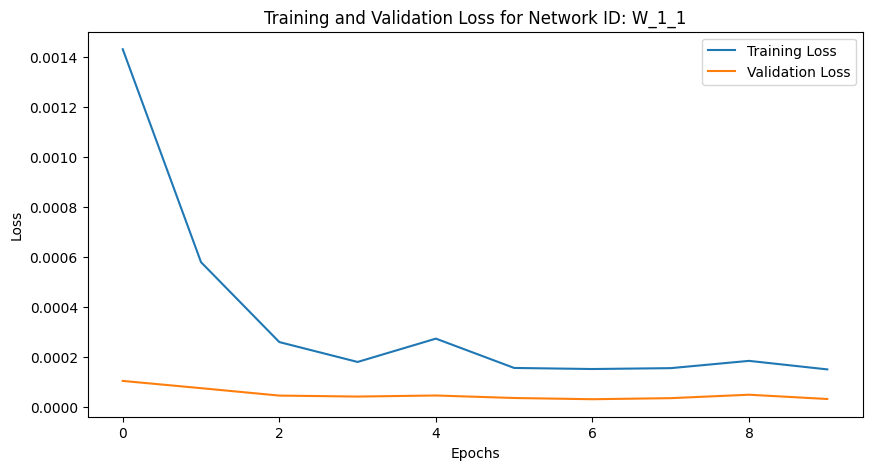

Training Progress:   0%|          | 9/10000 [00:16<5:06:33,  1.84s/epoch, loss=0.000149, val_loss=3.06e-5, patience=1]


Mean Squared Error: 0.0003492485660882597
Iteration: 1, Window Size: 1, Y Days Ahead: 2
X shape: (3805, 1)
y shape: (3805, 2)
Initializing network with layer sizes: [1, 128, 64, 32, 2]
params_W_1_2.npz not found. Using randomly initialized parameters.
Training data shape: (3044, 1), (3044, 2), Validation data shape: (380, 1), (380, 2), Testing data shape: (381, 1), (381, 2)
Parameters loaded from params_W_1_2.npz


Training Progress:   0%|          | 10/10000 [00:19<5:00:41,  1.81s/epoch, loss=0.000226, val_loss=5.26e-5, patience=1]

Epoch 11/10000, Training Loss: 0.000226, Validation Loss: 0.000053
Early stopping at epoch 11. Best validation loss: 0.000042


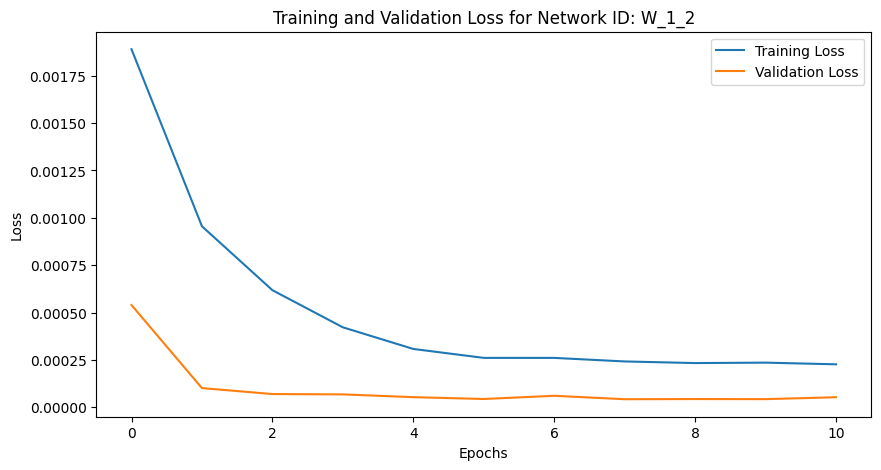

Training Progress:   0%|          | 10/10000 [00:19<5:28:00,  1.97s/epoch, loss=0.000226, val_loss=5.26e-5, patience=1]


Mean Squared Error: 0.0004455454242508199
Iteration: 2, Window Size: 1, Y Days Ahead: 3
X shape: (3804, 1)
y shape: (3804, 3)
Initializing network with layer sizes: [1, 128, 64, 32, 3]
params_W_1_3.npz not found. Using randomly initialized parameters.
Training data shape: (3043, 1), (3043, 3), Validation data shape: (380, 1), (380, 3), Testing data shape: (381, 1), (381, 3)
Parameters loaded from params_W_1_3.npz


Training Progress:   0%|          | 12/10000 [00:23<4:58:05,  1.79s/epoch, loss=0.00029, val_loss=5.72e-5, patience=1] 

Epoch 13/10000, Training Loss: 0.000290, Validation Loss: 0.000057
Early stopping at epoch 13. Best validation loss: 0.000054


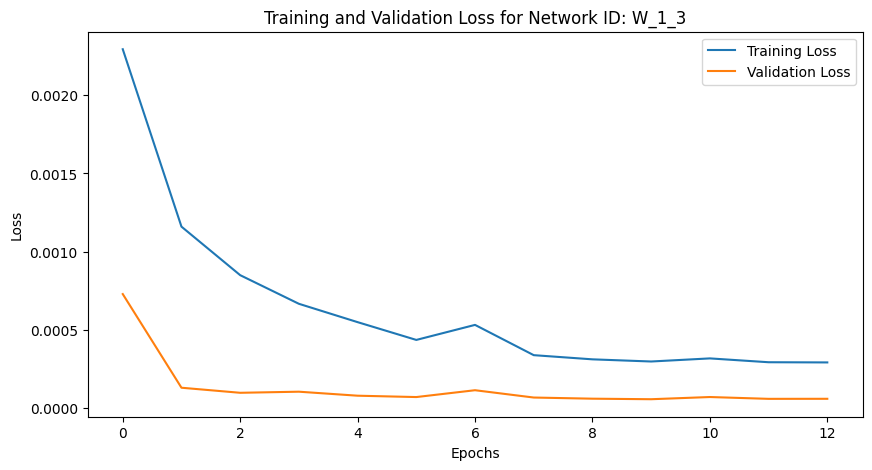

Training Progress:   0%|          | 12/10000 [00:23<5:28:10,  1.97s/epoch, loss=0.00029, val_loss=5.72e-5, patience=1]


Mean Squared Error: 0.0005145893818602174
Iteration: 3, Window Size: 1, Y Days Ahead: 4
X shape: (3803, 1)
y shape: (3803, 4)
Initializing network with layer sizes: [1, 128, 64, 32, 4]
params_W_1_4.npz not found. Using randomly initialized parameters.
Training data shape: (3042, 1), (3042, 4), Validation data shape: (380, 1), (380, 4), Testing data shape: (381, 1), (381, 4)
Parameters loaded from params_W_1_4.npz


Training Progress:   0%|          | 12/10000 [00:22<4:48:40,  1.73s/epoch, loss=0.00035, val_loss=7.11e-5, patience=1]  

Epoch 13/10000, Training Loss: 0.000350, Validation Loss: 0.000071
Early stopping at epoch 13. Best validation loss: 0.000067


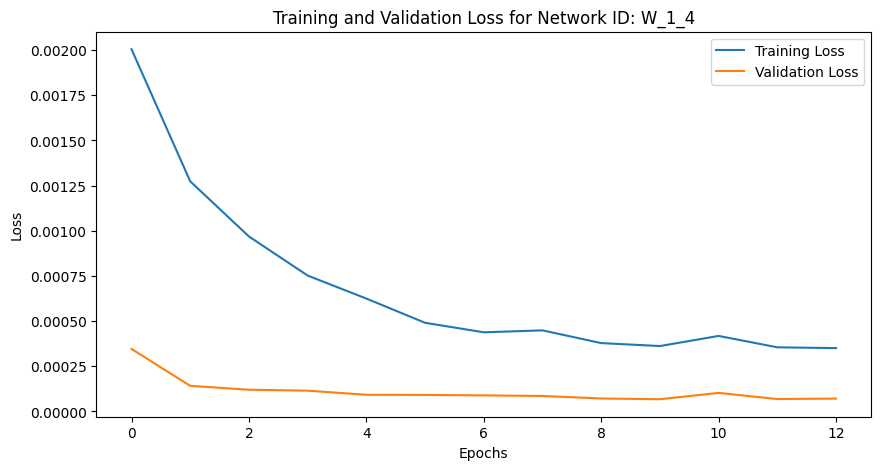

Training Progress:   0%|          | 12/10000 [00:23<5:20:09,  1.92s/epoch, loss=0.00035, val_loss=7.11e-5, patience=1]


Mean Squared Error: 0.000608704570731414
Iteration: 4, Window Size: 1, Y Days Ahead: 5
X shape: (3802, 1)
y shape: (3802, 5)
Initializing network with layer sizes: [1, 128, 64, 32, 5]
params_W_1_5.npz not found. Using randomly initialized parameters.
Training data shape: (3041, 1), (3041, 5), Validation data shape: (380, 1), (380, 5), Testing data shape: (381, 1), (381, 5)
Parameters loaded from params_W_1_5.npz


Training Progress:   0%|          | 14/10000 [00:21<3:50:09,  1.38s/epoch, loss=0.000426, val_loss=8.05e-5, patience=1]

Epoch 15/10000, Training Loss: 0.000426, Validation Loss: 0.000081
Early stopping at epoch 15. Best validation loss: 0.000078


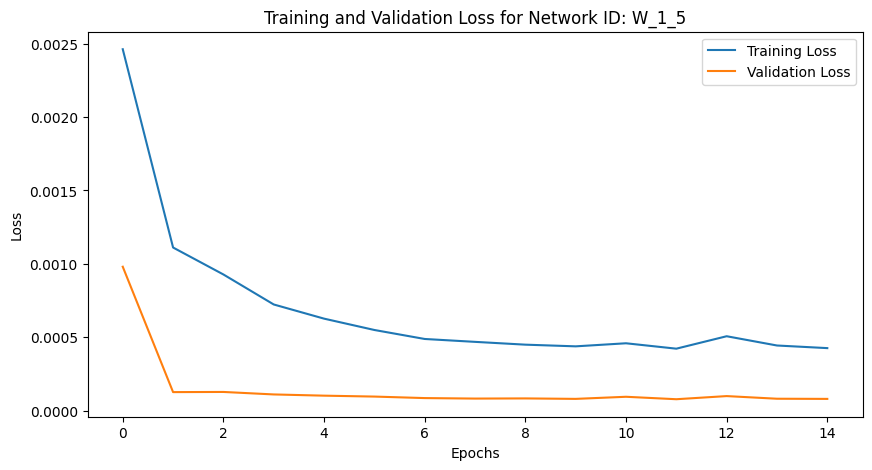

Training Progress:   0%|          | 14/10000 [00:21<4:18:50,  1.56s/epoch, loss=0.000426, val_loss=8.05e-5, patience=1]


Mean Squared Error: 0.0007192307721664776
Iteration: 5, Window Size: 1, Y Days Ahead: 6
X shape: (3801, 1)
y shape: (3801, 6)
Initializing network with layer sizes: [1, 128, 64, 32, 6]
params_W_1_6.npz not found. Using randomly initialized parameters.
Training data shape: (3040, 1), (3040, 6), Validation data shape: (380, 1), (380, 6), Testing data shape: (381, 1), (381, 6)
Parameters loaded from params_W_1_6.npz


Training Progress:   0%|          | 13/10000 [00:19<3:47:35,  1.37s/epoch, loss=0.000494, val_loss=0.000101, patience=1]

Epoch 14/10000, Training Loss: 0.000494, Validation Loss: 0.000101
Early stopping at epoch 14. Best validation loss: 0.000093


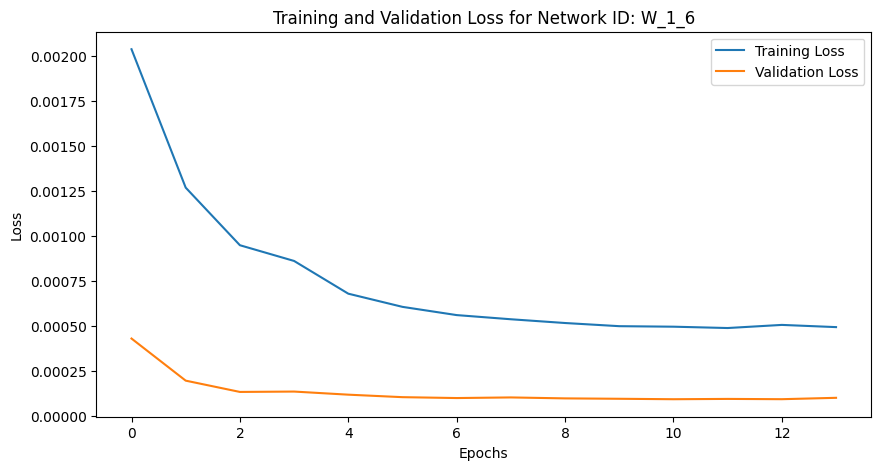

Training Progress:   0%|          | 13/10000 [00:19<4:10:36,  1.51s/epoch, loss=0.000494, val_loss=0.000101, patience=1]


Mean Squared Error: 0.0008390636663881258
Iteration: 6, Window Size: 1, Y Days Ahead: 7
X shape: (3800, 1)
y shape: (3800, 7)
Initializing network with layer sizes: [1, 128, 64, 32, 7]
params_W_1_7.npz not found. Using randomly initialized parameters.
Training data shape: (3040, 1), (3040, 7), Validation data shape: (380, 1), (380, 7), Testing data shape: (380, 1), (380, 7)
Parameters loaded from params_W_1_7.npz


Training Progress:   0%|          | 20/10000 [00:29<3:48:56,  1.38s/epoch, loss=0.000592, val_loss=0.000116, patience=1]

Epoch 21/10000, Training Loss: 0.000592, Validation Loss: 0.000116
Early stopping at epoch 21. Best validation loss: 0.000103


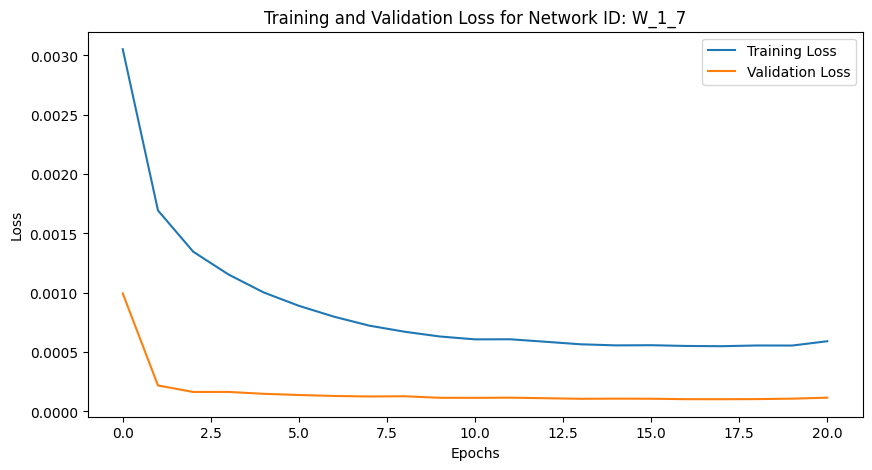

Training Progress:   0%|          | 20/10000 [00:29<4:05:59,  1.48s/epoch, loss=0.000592, val_loss=0.000116, patience=1]


Mean Squared Error: 0.0009457902227906137
Iteration: 7, Window Size: 1, Y Days Ahead: 8
X shape: (3799, 1)
y shape: (3799, 8)
Initializing network with layer sizes: [1, 128, 64, 32, 8]
params_W_1_8.npz not found. Using randomly initialized parameters.
Training data shape: (3039, 1), (3039, 8), Validation data shape: (380, 1), (380, 8), Testing data shape: (380, 1), (380, 8)
Parameters loaded from params_W_1_8.npz


Training Progress:   0%|          | 22/10000 [00:32<3:54:39,  1.41s/epoch, loss=0.000609, val_loss=0.000119, patience=1]

Epoch 23/10000, Training Loss: 0.000609, Validation Loss: 0.000119
Early stopping at epoch 23. Best validation loss: 0.000116


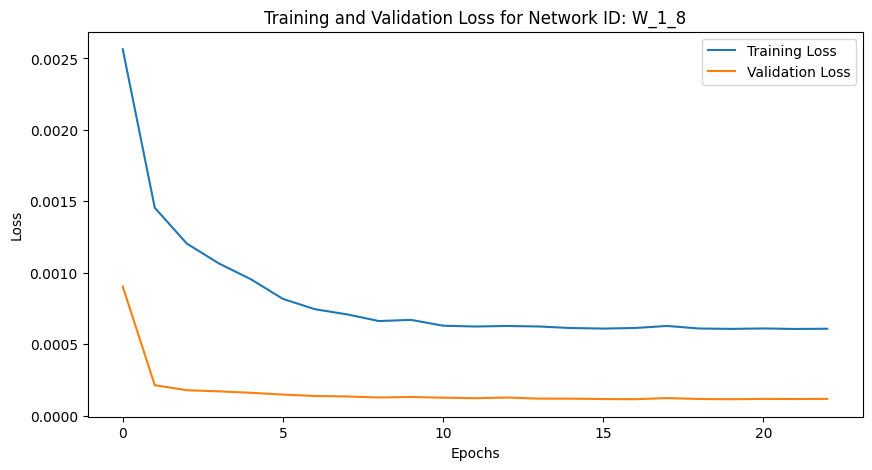

Training Progress:   0%|          | 22/10000 [00:32<4:08:43,  1.50s/epoch, loss=0.000609, val_loss=0.000119, patience=1]


Mean Squared Error: 0.001090787863542014
Iteration: 8, Window Size: 1, Y Days Ahead: 9
X shape: (3798, 1)
y shape: (3798, 9)
Initializing network with layer sizes: [1, 128, 64, 32, 9]
params_W_1_9.npz not found. Using randomly initialized parameters.
Training data shape: (3038, 1), (3038, 9), Validation data shape: (380, 1), (380, 9), Testing data shape: (380, 1), (380, 9)
Parameters loaded from params_W_1_9.npz


Training Progress:   0%|          | 14/10000 [00:21<3:56:58,  1.42s/epoch, loss=0.000774, val_loss=0.000159, patience=1]

Epoch 15/10000, Training Loss: 0.000774, Validation Loss: 0.000159
Early stopping at epoch 15. Best validation loss: 0.000143


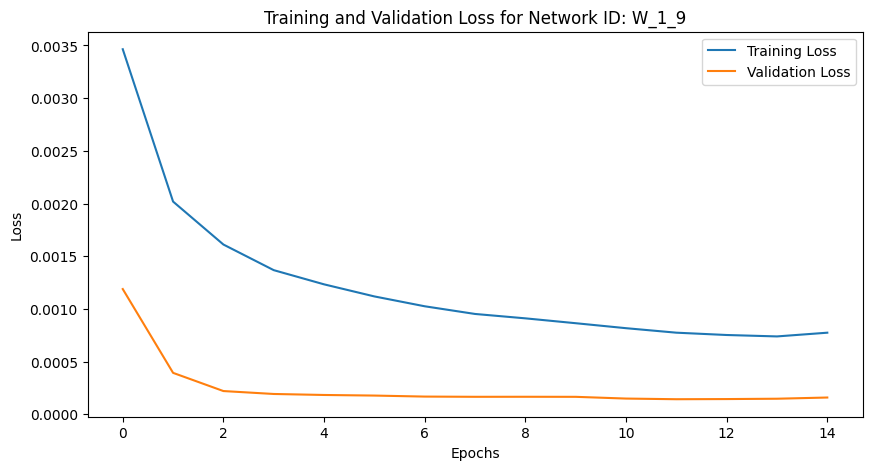

Training Progress:   0%|          | 14/10000 [00:21<4:17:55,  1.55s/epoch, loss=0.000774, val_loss=0.000159, patience=1]


Mean Squared Error: 0.0011714960472119019
Iteration: 9, Window Size: 1, Y Days Ahead: 10
X shape: (3797, 1)
y shape: (3797, 10)
Initializing network with layer sizes: [1, 128, 64, 32, 10]
params_W_1_10.npz not found. Using randomly initialized parameters.
Training data shape: (3037, 1), (3037, 10), Validation data shape: (380, 1), (380, 10), Testing data shape: (380, 1), (380, 10)
Parameters loaded from params_W_1_10.npz


Training Progress:   0%|          | 23/10000 [00:34<3:50:43,  1.39s/epoch, loss=0.000763, val_loss=0.000147, patience=1]

Epoch 24/10000, Training Loss: 0.000763, Validation Loss: 0.000147
Early stopping at epoch 24. Best validation loss: 0.000144


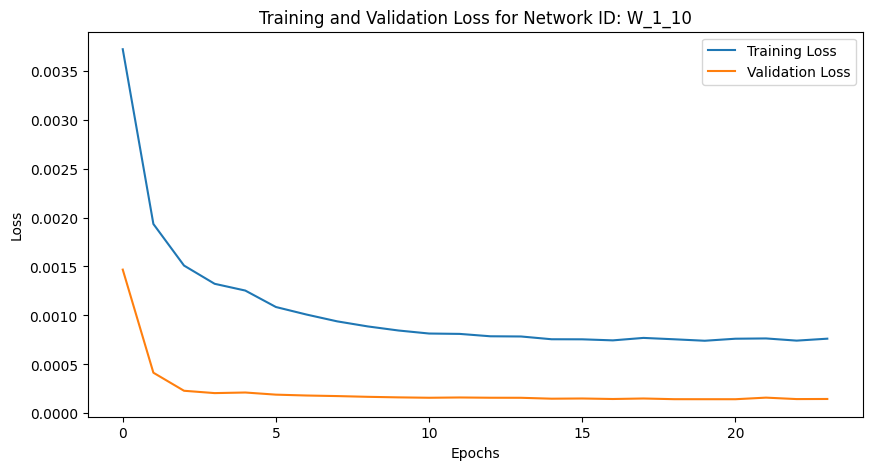

Training Progress:   0%|          | 23/10000 [00:34<4:07:01,  1.49s/epoch, loss=0.000763, val_loss=0.000147, patience=1]


Mean Squared Error: 0.0013277914594495084
Iteration: 10, Window Size: 1, Y Days Ahead: 11
X shape: (3796, 1)
y shape: (3796, 11)
Initializing network with layer sizes: [1, 128, 64, 32, 11]
params_W_1_11.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 1), (3036, 11), Validation data shape: (380, 1), (380, 11), Testing data shape: (380, 1), (380, 11)
Parameters loaded from params_W_1_11.npz


Training Progress:   0%|          | 19/10000 [00:27<3:42:27,  1.34s/epoch, loss=0.00084, val_loss=0.000166, patience=1] 

Epoch 20/10000, Training Loss: 0.000840, Validation Loss: 0.000166
Early stopping at epoch 20. Best validation loss: 0.000159


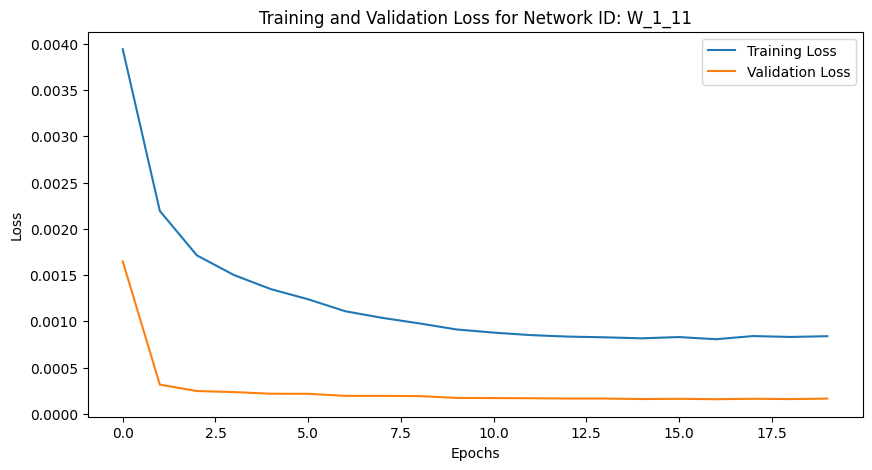

Training Progress:   0%|          | 19/10000 [00:27<4:04:59,  1.47s/epoch, loss=0.00084, val_loss=0.000166, patience=1]


Mean Squared Error: 0.0014147096809587173
Iteration: 11, Window Size: 1, Y Days Ahead: 12
X shape: (3795, 1)
y shape: (3795, 12)
Initializing network with layer sizes: [1, 128, 64, 32, 12]
params_W_1_12.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 1), (3036, 12), Validation data shape: (379, 1), (379, 12), Testing data shape: (380, 1), (380, 12)
Parameters loaded from params_W_1_12.npz


Training Progress:   0%|          | 17/10000 [00:24<3:48:31,  1.37s/epoch, loss=0.000903, val_loss=0.000184, patience=1]

Epoch 18/10000, Training Loss: 0.000903, Validation Loss: 0.000184
Early stopping at epoch 18. Best validation loss: 0.000178


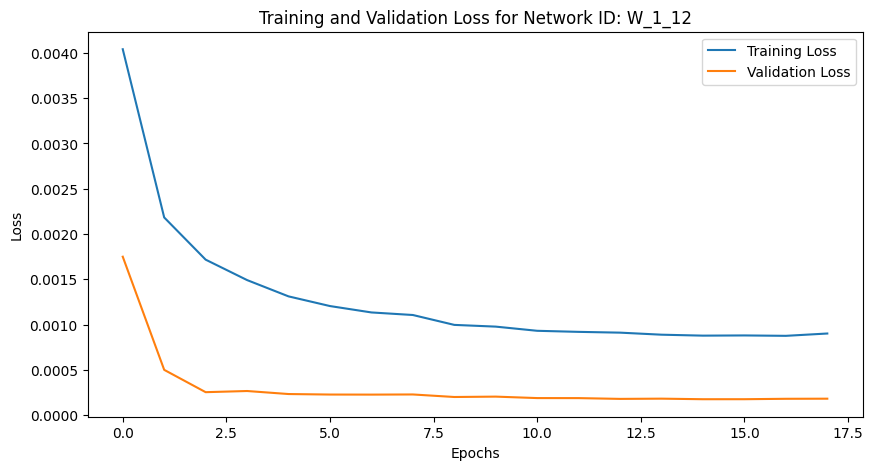

Training Progress:   0%|          | 17/10000 [00:24<4:02:04,  1.45s/epoch, loss=0.000903, val_loss=0.000184, patience=1]


Mean Squared Error: 0.0015527283480116962
Iteration: 12, Window Size: 1, Y Days Ahead: 13
X shape: (3794, 1)
y shape: (3794, 13)
Initializing network with layer sizes: [1, 128, 64, 32, 13]
params_W_1_13.npz not found. Using randomly initialized parameters.
Training data shape: (3035, 1), (3035, 13), Validation data shape: (379, 1), (379, 13), Testing data shape: (380, 1), (380, 13)
Parameters loaded from params_W_1_13.npz


Training Progress:   0%|          | 18/10000 [00:26<3:48:32,  1.37s/epoch, loss=0.000988, val_loss=0.000208, patience=1]

Epoch 19/10000, Training Loss: 0.000988, Validation Loss: 0.000208
Early stopping at epoch 19. Best validation loss: 0.000200


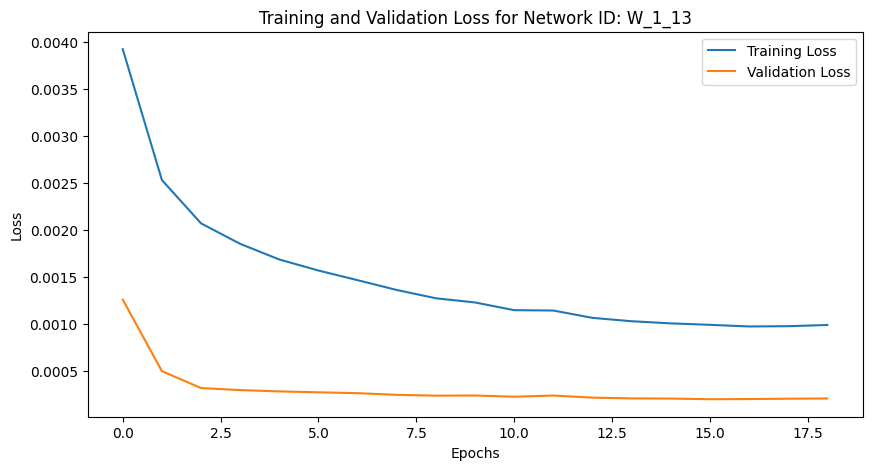

Training Progress:   0%|          | 18/10000 [00:27<4:10:55,  1.51s/epoch, loss=0.000988, val_loss=0.000208, patience=1]


Mean Squared Error: 0.0016218782802228733
Iteration: 13, Window Size: 1, Y Days Ahead: 14
X shape: (3793, 1)
y shape: (3793, 14)
Initializing network with layer sizes: [1, 128, 64, 32, 14]
params_W_1_14.npz not found. Using randomly initialized parameters.
Training data shape: (3034, 1), (3034, 14), Validation data shape: (379, 1), (379, 14), Testing data shape: (380, 1), (380, 14)
Parameters loaded from params_W_1_14.npz


Training Progress:   0%|          | 21/10000 [00:30<3:50:42,  1.39s/epoch, loss=0.00101, val_loss=0.000213, patience=1]

Epoch 22/10000, Training Loss: 0.001013, Validation Loss: 0.000213
Early stopping at epoch 22. Best validation loss: 0.000210


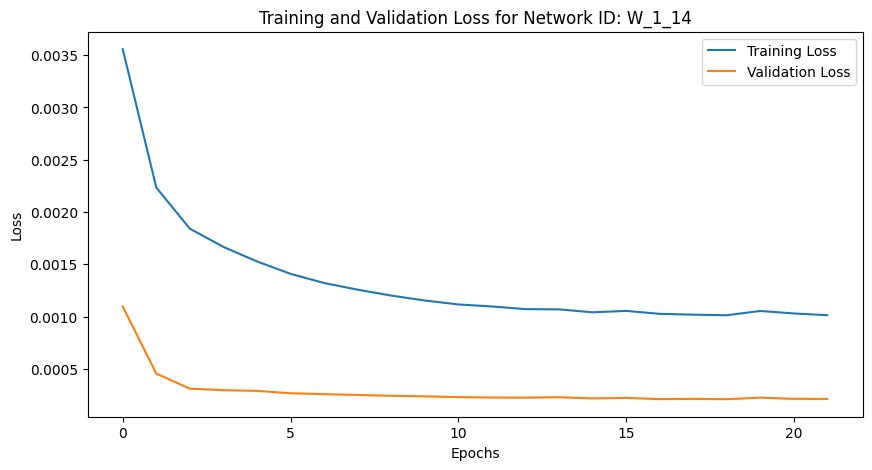

Training Progress:   0%|          | 21/10000 [00:30<4:03:44,  1.47s/epoch, loss=0.00101, val_loss=0.000213, patience=1]


Mean Squared Error: 0.0017882124449007271
Iteration: 14, Window Size: 1, Y Days Ahead: 15
X shape: (3792, 1)
y shape: (3792, 15)
Initializing network with layer sizes: [1, 128, 64, 32, 15]
params_W_1_15.npz not found. Using randomly initialized parameters.
Training data shape: (3033, 1), (3033, 15), Validation data shape: (379, 1), (379, 15), Testing data shape: (380, 1), (380, 15)
Parameters loaded from params_W_1_15.npz


Training Progress:   0%|          | 26/10000 [00:37<3:45:23,  1.36s/epoch, loss=0.00106, val_loss=0.000222, patience=1]

Epoch 27/10000, Training Loss: 0.001064, Validation Loss: 0.000222
Early stopping at epoch 27. Best validation loss: 0.000220


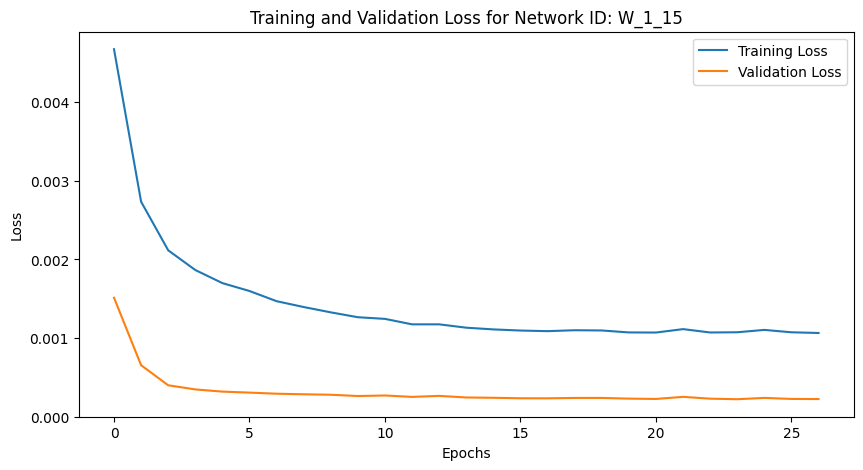

Training Progress:   0%|          | 26/10000 [00:37<3:58:52,  1.44s/epoch, loss=0.00106, val_loss=0.000222, patience=1]


Mean Squared Error: 0.001970222944067736
Iteration: 15, Window Size: 1, Y Days Ahead: 16
X shape: (3791, 1)
y shape: (3791, 16)
Initializing network with layer sizes: [1, 128, 64, 32, 16]
params_W_1_16.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 1), (3032, 16), Validation data shape: (379, 1), (379, 16), Testing data shape: (380, 1), (380, 16)
Parameters loaded from params_W_1_16.npz


Training Progress:   0%|          | 23/10000 [00:33<4:00:42,  1.45s/epoch, loss=0.00114, val_loss=0.000247, patience=1]

Epoch 24/10000, Training Loss: 0.001145, Validation Loss: 0.000247
Early stopping at epoch 24. Best validation loss: 0.000240


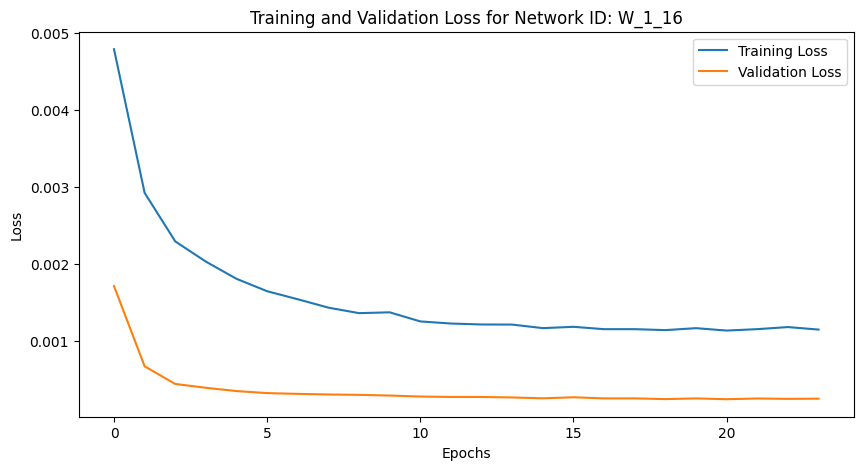

Training Progress:   0%|          | 23/10000 [00:34<4:07:08,  1.49s/epoch, loss=0.00114, val_loss=0.000247, patience=1]


Mean Squared Error: 0.0020518267010124977
Iteration: 16, Window Size: 1, Y Days Ahead: 17
X shape: (3790, 1)
y shape: (3790, 17)
Initializing network with layer sizes: [1, 128, 64, 32, 17]
params_W_1_17.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 1), (3032, 17), Validation data shape: (379, 1), (379, 17), Testing data shape: (379, 1), (379, 17)
Parameters loaded from params_W_1_17.npz


Training Progress:   0%|          | 20/10000 [00:29<3:52:08,  1.40s/epoch, loss=0.00122, val_loss=0.000272, patience=1]

Epoch 21/10000, Training Loss: 0.001225, Validation Loss: 0.000272
Early stopping at epoch 21. Best validation loss: 0.000263


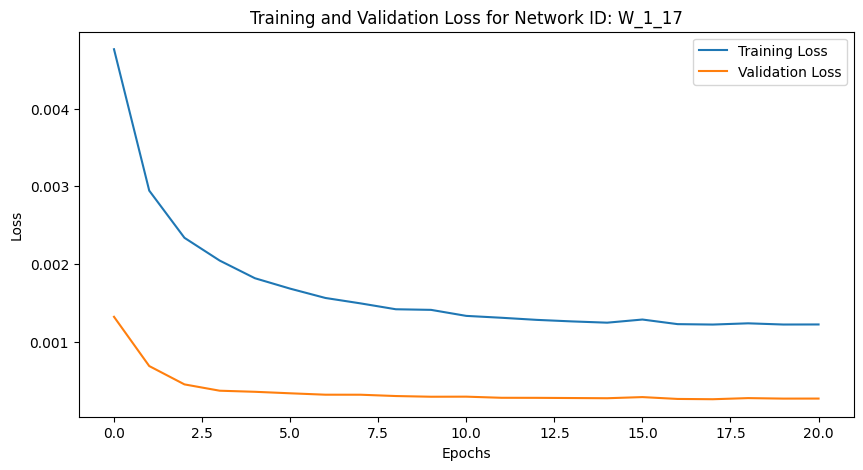

Training Progress:   0%|          | 20/10000 [00:30<4:10:19,  1.50s/epoch, loss=0.00122, val_loss=0.000272, patience=1]


Mean Squared Error: 0.0021838365106131566
Iteration: 17, Window Size: 1, Y Days Ahead: 18
X shape: (3789, 1)
y shape: (3789, 18)
Initializing network with layer sizes: [1, 128, 64, 32, 18]
params_W_1_18.npz not found. Using randomly initialized parameters.
Training data shape: (3031, 1), (3031, 18), Validation data shape: (379, 1), (379, 18), Testing data shape: (379, 1), (379, 18)
Parameters loaded from params_W_1_18.npz


Training Progress:   0%|          | 18/10000 [00:27<4:04:46,  1.47s/epoch, loss=0.0013, val_loss=0.000298, patience=1] 

Epoch 19/10000, Training Loss: 0.001300, Validation Loss: 0.000298
Early stopping at epoch 19. Best validation loss: 0.000294


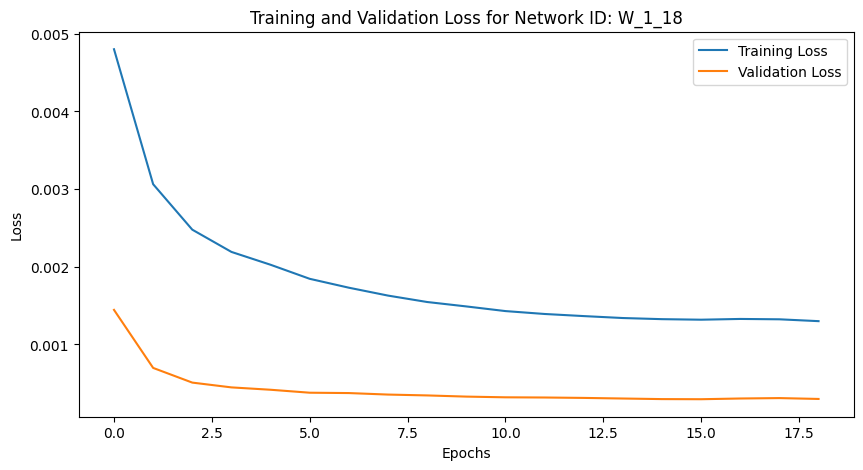

Training Progress:   0%|          | 18/10000 [00:27<4:11:11,  1.51s/epoch, loss=0.0013, val_loss=0.000298, patience=1]


Mean Squared Error: 0.002345344377970274
Iteration: 18, Window Size: 1, Y Days Ahead: 19
X shape: (3788, 1)
y shape: (3788, 19)
Initializing network with layer sizes: [1, 128, 64, 32, 19]
params_W_1_19.npz not found. Using randomly initialized parameters.
Training data shape: (3030, 1), (3030, 19), Validation data shape: (379, 1), (379, 19), Testing data shape: (379, 1), (379, 19)
Parameters loaded from params_W_1_19.npz


Training Progress:   0%|          | 29/10000 [00:43<4:01:11,  1.45s/epoch, loss=0.00135, val_loss=0.000291, patience=1]

Epoch 30/10000, Training Loss: 0.001347, Validation Loss: 0.000291
Early stopping at epoch 30. Best validation loss: 0.000287


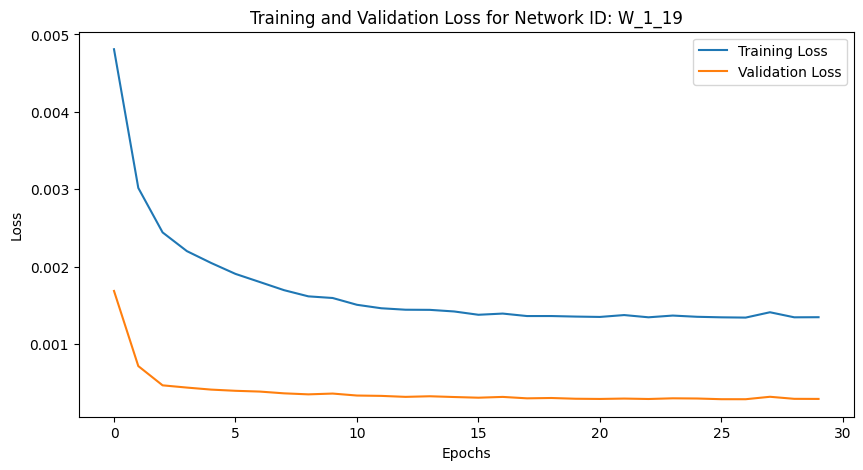

Training Progress:   0%|          | 29/10000 [00:43<4:10:49,  1.51s/epoch, loss=0.00135, val_loss=0.000291, patience=1]


Mean Squared Error: 0.002506847712176737
Iteration: 19, Window Size: 1, Y Days Ahead: 20
X shape: (3787, 1)
y shape: (3787, 20)
Initializing network with layer sizes: [1, 128, 64, 32, 20]
params_W_1_20.npz not found. Using randomly initialized parameters.
Training data shape: (3029, 1), (3029, 20), Validation data shape: (379, 1), (379, 20), Testing data shape: (379, 1), (379, 20)
Parameters loaded from params_W_1_20.npz


Training Progress:   0%|          | 17/10000 [00:26<3:58:16,  1.43s/epoch, loss=0.00154, val_loss=0.000343, patience=1]

Epoch 18/10000, Training Loss: 0.001538, Validation Loss: 0.000343
Early stopping at epoch 18. Best validation loss: 0.000332


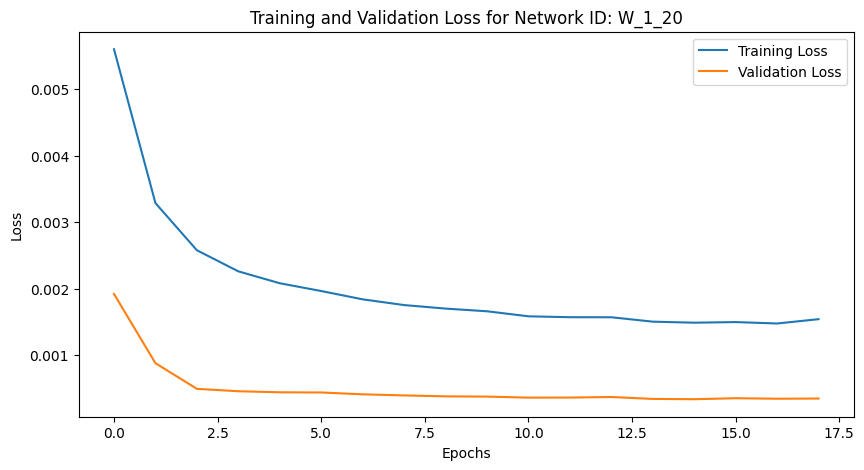

Training Progress:   0%|          | 17/10000 [00:26<4:17:49,  1.55s/epoch, loss=0.00154, val_loss=0.000343, patience=1]


Mean Squared Error: 0.0026485086249941154
Iteration: 20, Window Size: 2, Y Days Ahead: 1
X shape: (3805, 2)
y shape: (3805, 1)
Initializing network with layer sizes: [2, 128, 64, 32, 1]
params_W_2_1.npz not found. Using randomly initialized parameters.
Training data shape: (3044, 2), (3044, 1), Validation data shape: (380, 2), (380, 1), Testing data shape: (381, 2), (381, 1)
Parameters loaded from params_W_2_1.npz


Training Progress:   0%|          | 4/10000 [00:07<3:58:44,  1.43s/epoch, loss=0.000185, val_loss=3.34e-5, patience=1]

Epoch 5/10000, Training Loss: 0.000185, Validation Loss: 0.000033
Early stopping at epoch 5. Best validation loss: 0.000033


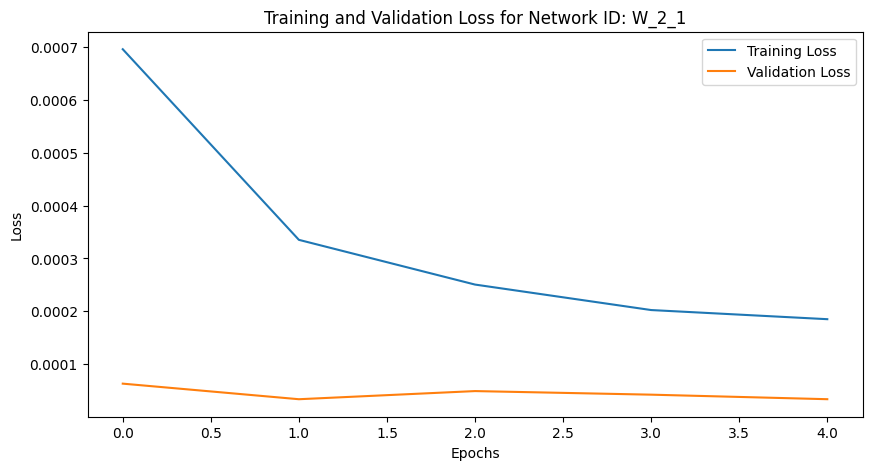

Training Progress:   0%|          | 4/10000 [00:07<5:12:44,  1.88s/epoch, loss=0.000185, val_loss=3.34e-5, patience=1]


Mean Squared Error: 0.00031035662260044323
Iteration: 21, Window Size: 2, Y Days Ahead: 2
X shape: (3804, 2)
y shape: (3804, 2)
Initializing network with layer sizes: [2, 128, 64, 32, 2]
params_W_2_2.npz not found. Using randomly initialized parameters.
Training data shape: (3043, 2), (3043, 2), Validation data shape: (380, 2), (380, 2), Testing data shape: (381, 2), (381, 2)
Parameters loaded from params_W_2_2.npz


Training Progress:   0%|          | 11/10000 [00:17<3:59:49,  1.44s/epoch, loss=0.000229, val_loss=4.68e-5, patience=1]

Epoch 12/10000, Training Loss: 0.000229, Validation Loss: 0.000047
Early stopping at epoch 12. Best validation loss: 0.000042


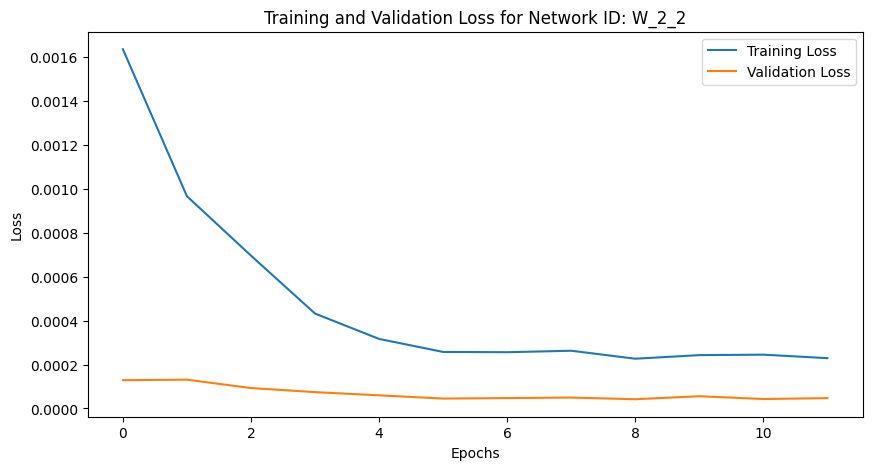

Training Progress:   0%|          | 11/10000 [00:17<4:21:49,  1.57s/epoch, loss=0.000229, val_loss=4.68e-5, patience=1]


Mean Squared Error: 0.0004450819964704536
Iteration: 22, Window Size: 2, Y Days Ahead: 3
X shape: (3803, 2)
y shape: (3803, 3)
Initializing network with layer sizes: [2, 128, 64, 32, 3]
params_W_2_3.npz not found. Using randomly initialized parameters.
Training data shape: (3042, 2), (3042, 3), Validation data shape: (380, 2), (380, 3), Testing data shape: (381, 2), (381, 3)
Parameters loaded from params_W_2_3.npz


Training Progress:   0%|          | 7/10000 [00:11<4:03:57,  1.46s/epoch, loss=0.00033, val_loss=6.97e-5, patience=1]  

Epoch 8/10000, Training Loss: 0.000330, Validation Loss: 0.000070
Early stopping at epoch 8. Best validation loss: 0.000068


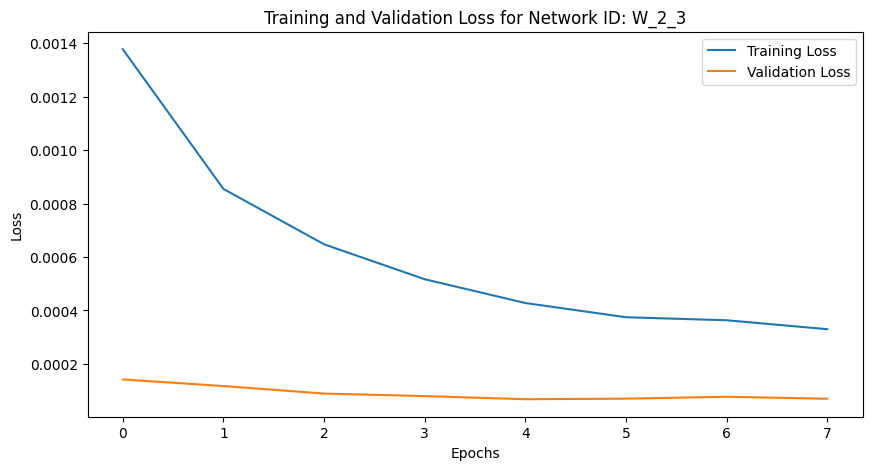

Training Progress:   0%|          | 7/10000 [00:11<4:37:35,  1.67s/epoch, loss=0.00033, val_loss=6.97e-5, patience=1]


Mean Squared Error: 0.0005290355415445502
Iteration: 23, Window Size: 2, Y Days Ahead: 4
X shape: (3802, 2)
y shape: (3802, 4)
Initializing network with layer sizes: [2, 128, 64, 32, 4]
params_W_2_4.npz not found. Using randomly initialized parameters.
Training data shape: (3041, 2), (3041, 4), Validation data shape: (380, 2), (380, 4), Testing data shape: (381, 2), (381, 4)
Parameters loaded from params_W_2_4.npz


Training Progress:   0%|          | 13/10000 [00:20<4:07:40,  1.49s/epoch, loss=0.000377, val_loss=7.28e-5, patience=1]

Epoch 14/10000, Training Loss: 0.000377, Validation Loss: 0.000073
Early stopping at epoch 14. Best validation loss: 0.000067


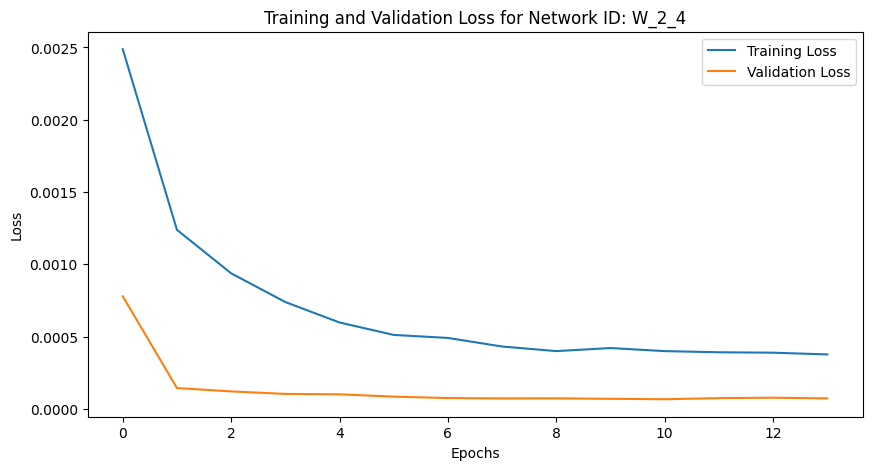

Training Progress:   0%|          | 13/10000 [00:20<4:24:57,  1.59s/epoch, loss=0.000377, val_loss=7.28e-5, patience=1]


Mean Squared Error: 0.0006409899433142134
Iteration: 24, Window Size: 2, Y Days Ahead: 5
X shape: (3801, 2)
y shape: (3801, 5)
Initializing network with layer sizes: [2, 128, 64, 32, 5]
params_W_2_5.npz not found. Using randomly initialized parameters.
Training data shape: (3040, 2), (3040, 5), Validation data shape: (380, 2), (380, 5), Testing data shape: (381, 2), (381, 5)
Parameters loaded from params_W_2_5.npz


Training Progress:   0%|          | 14/10000 [00:21<4:00:46,  1.45s/epoch, loss=0.000584, val_loss=0.000128, patience=1]

Epoch 15/10000, Training Loss: 0.000584, Validation Loss: 0.000128
Early stopping at epoch 15. Best validation loss: 0.000079


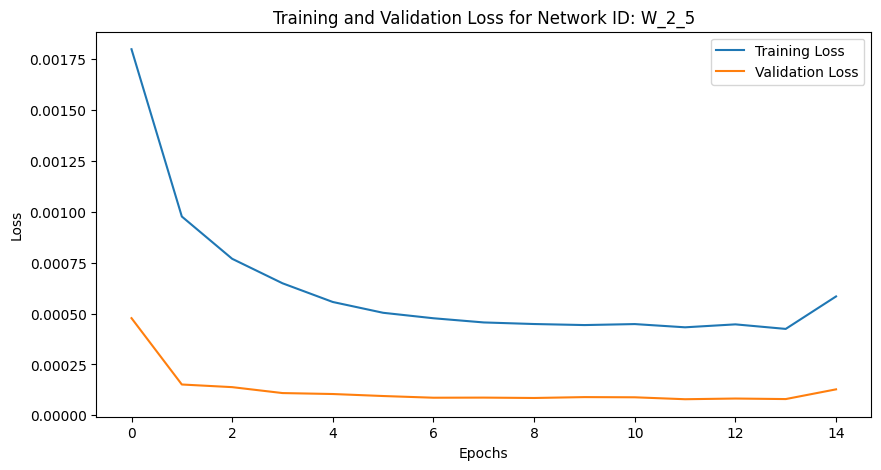

Training Progress:   0%|          | 14/10000 [00:21<4:21:04,  1.57s/epoch, loss=0.000584, val_loss=0.000128, patience=1]


Mean Squared Error: 0.0007390807941506249
Iteration: 25, Window Size: 2, Y Days Ahead: 6
X shape: (3800, 2)
y shape: (3800, 6)
Initializing network with layer sizes: [2, 128, 64, 32, 6]
params_W_2_6.npz not found. Using randomly initialized parameters.
Training data shape: (3040, 2), (3040, 6), Validation data shape: (380, 2), (380, 6), Testing data shape: (380, 2), (380, 6)
Parameters loaded from params_W_2_6.npz


Training Progress:   0%|          | 15/10000 [00:23<3:59:11,  1.44s/epoch, loss=0.000529, val_loss=0.000102, patience=1]

Epoch 16/10000, Training Loss: 0.000529, Validation Loss: 0.000102
Early stopping at epoch 16. Best validation loss: 0.000094


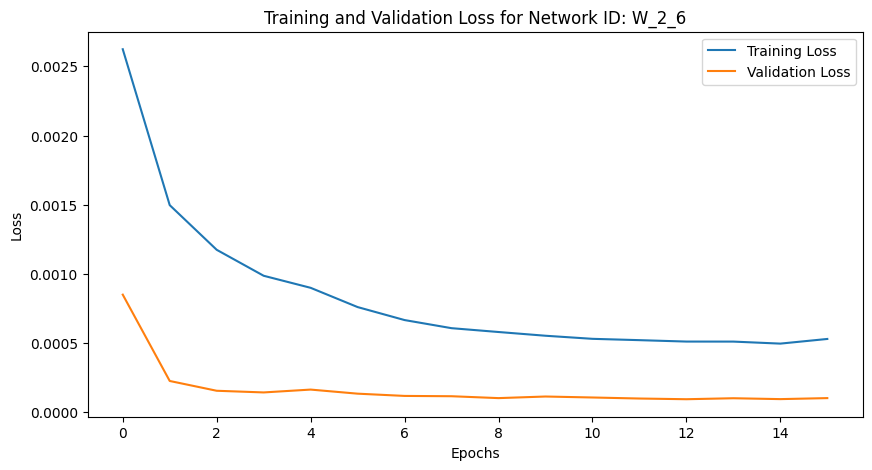

Training Progress:   0%|          | 15/10000 [00:24<4:26:30,  1.60s/epoch, loss=0.000529, val_loss=0.000102, patience=1]


Mean Squared Error: 0.0008291089361480429
Iteration: 26, Window Size: 2, Y Days Ahead: 7
X shape: (3799, 2)
y shape: (3799, 7)
Initializing network with layer sizes: [2, 128, 64, 32, 7]
params_W_2_7.npz not found. Using randomly initialized parameters.
Training data shape: (3039, 2), (3039, 7), Validation data shape: (380, 2), (380, 7), Testing data shape: (380, 2), (380, 7)
Parameters loaded from params_W_2_7.npz


Training Progress:   0%|          | 19/10000 [00:28<3:58:43,  1.44s/epoch, loss=0.000561, val_loss=0.000108, patience=1]

Epoch 20/10000, Training Loss: 0.000561, Validation Loss: 0.000108
Early stopping at epoch 20. Best validation loss: 0.000104


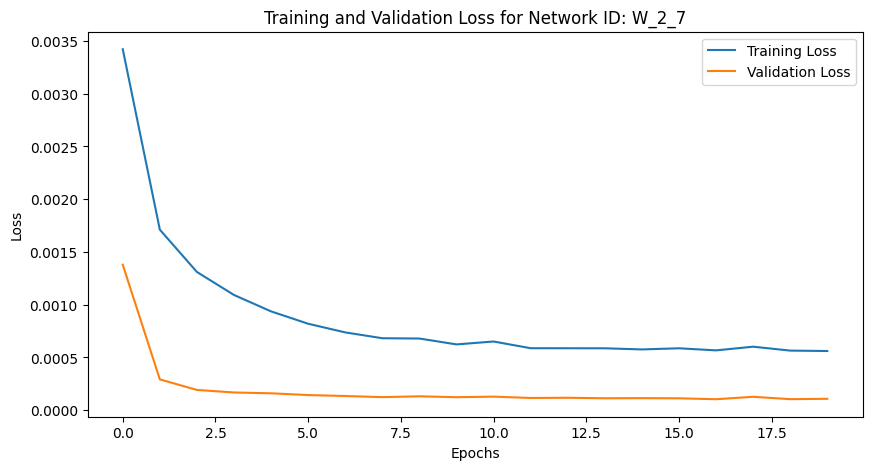

Training Progress:   0%|          | 19/10000 [00:29<4:14:27,  1.53s/epoch, loss=0.000561, val_loss=0.000108, patience=1]


Mean Squared Error: 0.0009495674747668465
Iteration: 27, Window Size: 2, Y Days Ahead: 8
X shape: (3798, 2)
y shape: (3798, 8)
Initializing network with layer sizes: [2, 128, 64, 32, 8]
params_W_2_8.npz not found. Using randomly initialized parameters.
Training data shape: (3038, 2), (3038, 8), Validation data shape: (380, 2), (380, 8), Testing data shape: (380, 2), (380, 8)
Parameters loaded from params_W_2_8.npz


Training Progress:   0%|          | 25/10000 [00:38<3:58:58,  1.44s/epoch, loss=0.000635, val_loss=0.000128, patience=1]

Epoch 26/10000, Training Loss: 0.000635, Validation Loss: 0.000128
Early stopping at epoch 26. Best validation loss: 0.000117


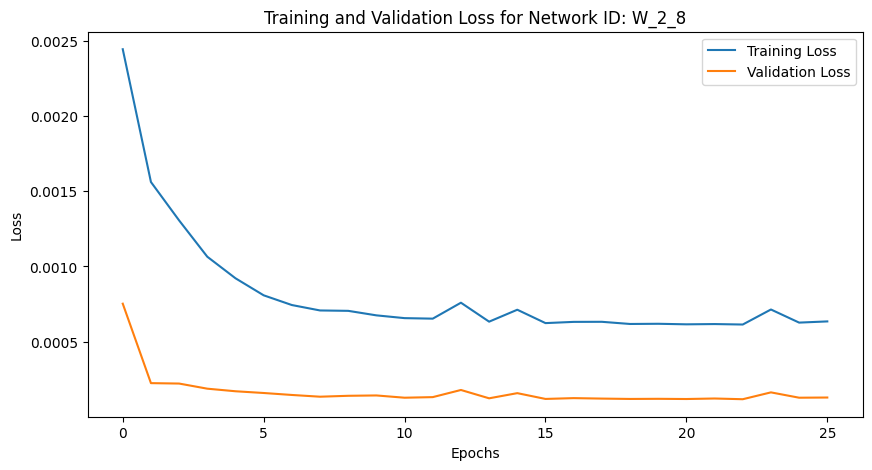

Training Progress:   0%|          | 25/10000 [00:38<4:14:10,  1.53s/epoch, loss=0.000635, val_loss=0.000128, patience=1]


Mean Squared Error: 0.0010997377951849504
Iteration: 28, Window Size: 2, Y Days Ahead: 9
X shape: (3797, 2)
y shape: (3797, 9)
Initializing network with layer sizes: [2, 128, 64, 32, 9]
params_W_2_9.npz not found. Using randomly initialized parameters.
Training data shape: (3037, 2), (3037, 9), Validation data shape: (380, 2), (380, 9), Testing data shape: (380, 2), (380, 9)
Parameters loaded from params_W_2_9.npz


Training Progress:   0%|          | 17/10000 [00:26<4:06:10,  1.48s/epoch, loss=0.000736, val_loss=0.000142, patience=1]

Epoch 18/10000, Training Loss: 0.000736, Validation Loss: 0.000142
Early stopping at epoch 18. Best validation loss: 0.000132


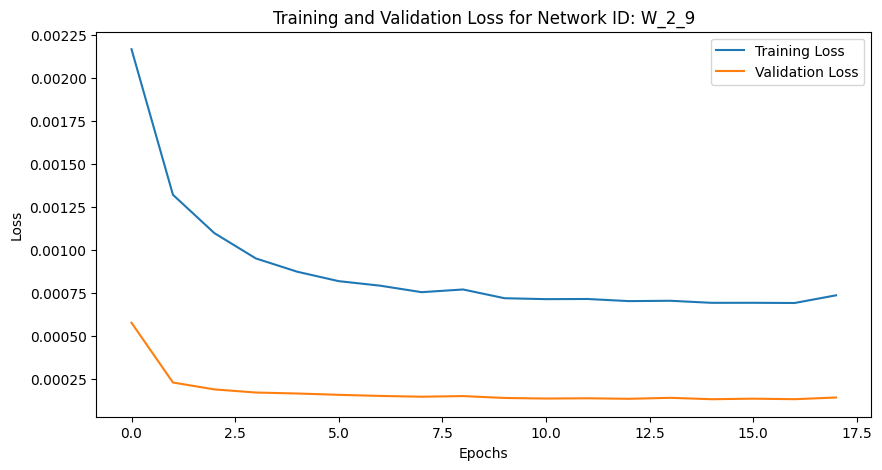

Training Progress:   0%|          | 17/10000 [00:27<4:26:02,  1.60s/epoch, loss=0.000736, val_loss=0.000142, patience=1]


Mean Squared Error: 0.0011651193662536793
Iteration: 29, Window Size: 2, Y Days Ahead: 10
X shape: (3796, 2)
y shape: (3796, 10)
Initializing network with layer sizes: [2, 128, 64, 32, 10]
params_W_2_10.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 2), (3036, 10), Validation data shape: (380, 2), (380, 10), Testing data shape: (380, 2), (380, 10)
Parameters loaded from params_W_2_10.npz


Training Progress:   0%|          | 19/10000 [00:29<4:04:26,  1.47s/epoch, loss=0.00084, val_loss=0.00018, patience=1]  

Epoch 20/10000, Training Loss: 0.000840, Validation Loss: 0.000180
Early stopping at epoch 20. Best validation loss: 0.000149


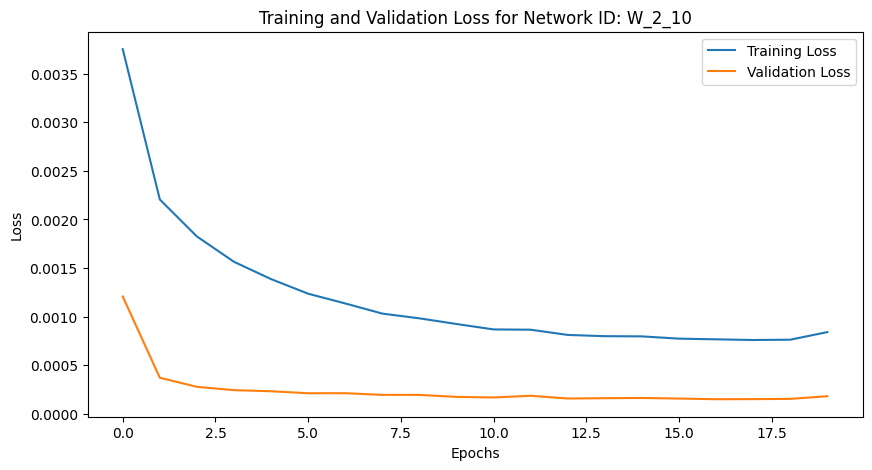

Training Progress:   0%|          | 19/10000 [00:29<4:21:13,  1.57s/epoch, loss=0.00084, val_loss=0.00018, patience=1]


Mean Squared Error: 0.0013109206448231978
Iteration: 30, Window Size: 2, Y Days Ahead: 11
X shape: (3795, 2)
y shape: (3795, 11)
Initializing network with layer sizes: [2, 128, 64, 32, 11]
params_W_2_11.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 2), (3036, 11), Validation data shape: (379, 2), (379, 11), Testing data shape: (380, 2), (380, 11)
Parameters loaded from params_W_2_11.npz


Training Progress:   0%|          | 22/10000 [00:33<3:58:23,  1.43s/epoch, loss=0.000826, val_loss=0.000161, patience=1]

Epoch 23/10000, Training Loss: 0.000826, Validation Loss: 0.000161
Early stopping at epoch 23. Best validation loss: 0.000156


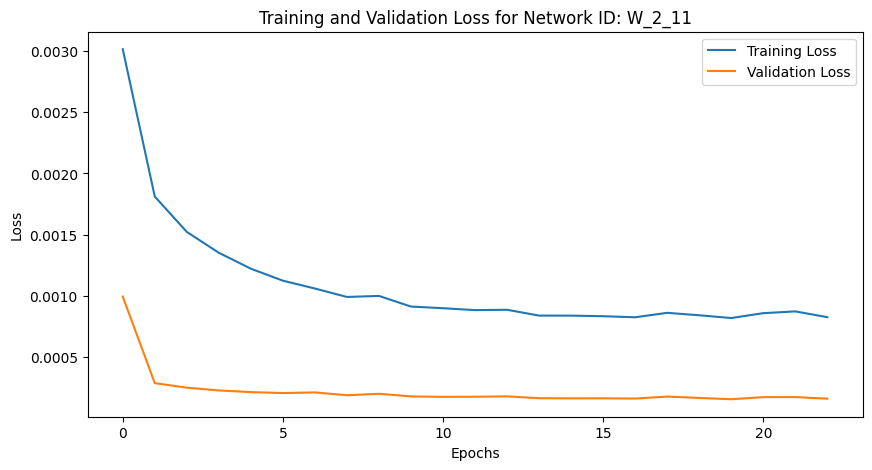

Training Progress:   0%|          | 22/10000 [00:33<4:15:30,  1.54s/epoch, loss=0.000826, val_loss=0.000161, patience=1]


Mean Squared Error: 0.0014601102506166747
Iteration: 31, Window Size: 2, Y Days Ahead: 12
X shape: (3794, 2)
y shape: (3794, 12)
Initializing network with layer sizes: [2, 128, 64, 32, 12]
params_W_2_12.npz not found. Using randomly initialized parameters.
Training data shape: (3035, 2), (3035, 12), Validation data shape: (379, 2), (379, 12), Testing data shape: (380, 2), (380, 12)
Parameters loaded from params_W_2_12.npz


Training Progress:   0%|          | 13/10000 [00:21<4:23:30,  1.58s/epoch, loss=0.000905, val_loss=0.00018, patience=1] 

Epoch 14/10000, Training Loss: 0.000905, Validation Loss: 0.000180
Early stopping at epoch 14. Best validation loss: 0.000179


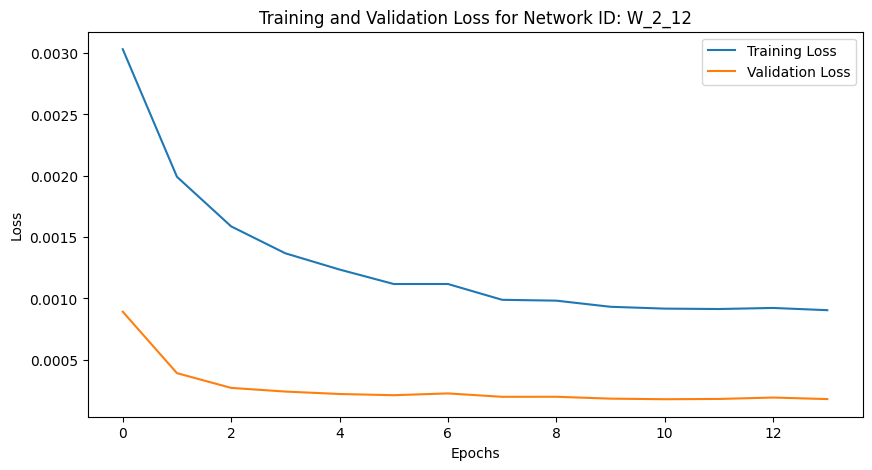

Training Progress:   0%|          | 13/10000 [00:21<4:39:54,  1.68s/epoch, loss=0.000905, val_loss=0.00018, patience=1]


Mean Squared Error: 0.0015794554723958744
Iteration: 32, Window Size: 2, Y Days Ahead: 13
X shape: (3793, 2)
y shape: (3793, 13)
Initializing network with layer sizes: [2, 128, 64, 32, 13]
params_W_2_13.npz not found. Using randomly initialized parameters.
Training data shape: (3034, 2), (3034, 13), Validation data shape: (379, 2), (379, 13), Testing data shape: (380, 2), (380, 13)
Parameters loaded from params_W_2_13.npz


Training Progress:   0%|          | 23/10000 [00:37<4:22:19,  1.58s/epoch, loss=0.000948, val_loss=0.000194, patience=1]

Epoch 24/10000, Training Loss: 0.000948, Validation Loss: 0.000194
Early stopping at epoch 24. Best validation loss: 0.000190


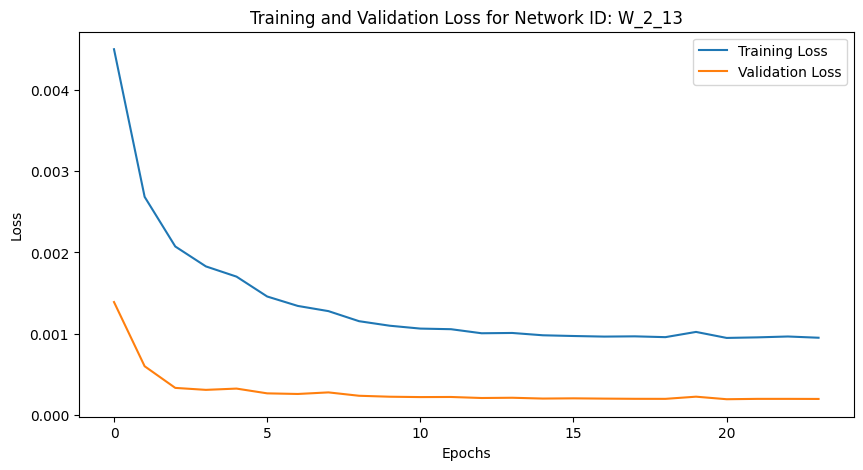

Training Progress:   0%|          | 23/10000 [00:37<4:30:20,  1.63s/epoch, loss=0.000948, val_loss=0.000194, patience=1]


Mean Squared Error: 0.001711370320178259
Iteration: 33, Window Size: 2, Y Days Ahead: 14
X shape: (3792, 2)
y shape: (3792, 14)
Initializing network with layer sizes: [2, 128, 64, 32, 14]
params_W_2_14.npz not found. Using randomly initialized parameters.
Training data shape: (3033, 2), (3033, 14), Validation data shape: (379, 2), (379, 14), Testing data shape: (380, 2), (380, 14)
Parameters loaded from params_W_2_14.npz


Training Progress:   0%|          | 26/10000 [00:42<4:23:40,  1.59s/epoch, loss=0.00101, val_loss=0.000209, patience=1]

Epoch 27/10000, Training Loss: 0.001006, Validation Loss: 0.000209
Early stopping at epoch 27. Best validation loss: 0.000205


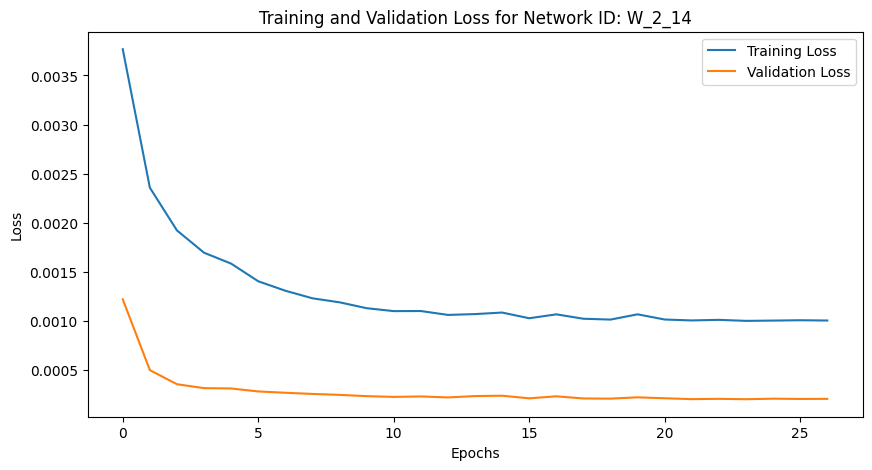

Training Progress:   0%|          | 26/10000 [00:42<4:33:49,  1.65s/epoch, loss=0.00101, val_loss=0.000209, patience=1]


Mean Squared Error: 0.0017882310598244626
Iteration: 34, Window Size: 2, Y Days Ahead: 15
X shape: (3791, 2)
y shape: (3791, 15)
Initializing network with layer sizes: [2, 128, 64, 32, 15]
params_W_2_15.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 2), (3032, 15), Validation data shape: (379, 2), (379, 15), Testing data shape: (380, 2), (380, 15)
Parameters loaded from params_W_2_15.npz


Training Progress:   0%|          | 19/10000 [00:32<4:31:00,  1.63s/epoch, loss=0.00109, val_loss=0.000227, patience=1]

Epoch 20/10000, Training Loss: 0.001090, Validation Loss: 0.000227
Early stopping at epoch 20. Best validation loss: 0.000222


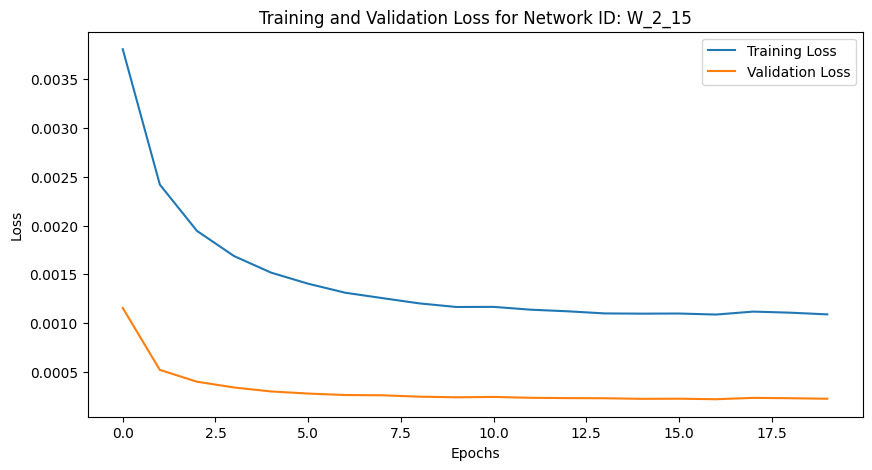

Training Progress:   0%|          | 19/10000 [00:32<4:44:47,  1.71s/epoch, loss=0.00109, val_loss=0.000227, patience=1]


Mean Squared Error: 0.0019014757474286326
Iteration: 35, Window Size: 2, Y Days Ahead: 16
X shape: (3790, 2)
y shape: (3790, 16)
Initializing network with layer sizes: [2, 128, 64, 32, 16]
params_W_2_16.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 2), (3032, 16), Validation data shape: (379, 2), (379, 16), Testing data shape: (379, 2), (379, 16)
Parameters loaded from params_W_2_16.npz


Training Progress:   0%|          | 23/10000 [00:39<4:22:50,  1.58s/epoch, loss=0.00117, val_loss=0.000243, patience=1]

Epoch 24/10000, Training Loss: 0.001168, Validation Loss: 0.000243
Early stopping at epoch 24. Best validation loss: 0.000239


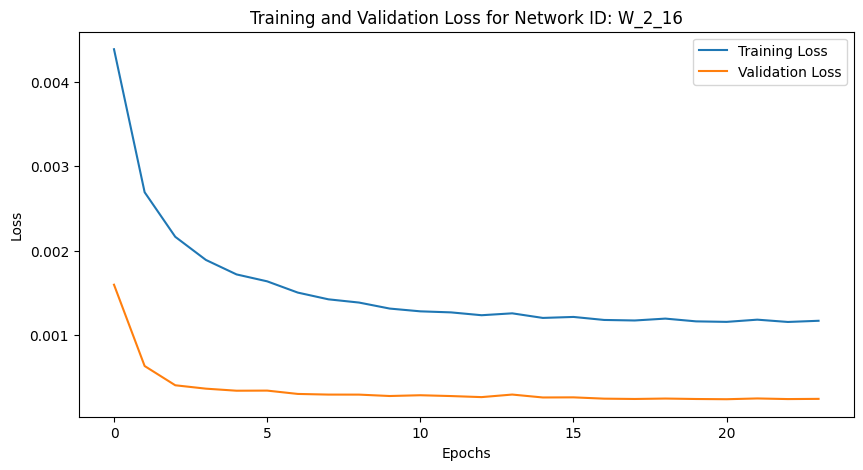

Training Progress:   0%|          | 23/10000 [00:39<4:43:47,  1.71s/epoch, loss=0.00117, val_loss=0.000243, patience=1]


Mean Squared Error: 0.0020127326090281557
Iteration: 36, Window Size: 2, Y Days Ahead: 17
X shape: (3789, 2)
y shape: (3789, 17)
Initializing network with layer sizes: [2, 128, 64, 32, 17]
params_W_2_17.npz not found. Using randomly initialized parameters.
Training data shape: (3031, 2), (3031, 17), Validation data shape: (379, 2), (379, 17), Testing data shape: (379, 2), (379, 17)
Parameters loaded from params_W_2_17.npz


Training Progress:   0%|          | 38/10000 [01:04<4:43:09,  1.71s/epoch, loss=0.00122, val_loss=0.000262, patience=1]

Epoch 39/10000, Training Loss: 0.001218, Validation Loss: 0.000262
Early stopping at epoch 39. Best validation loss: 0.000251


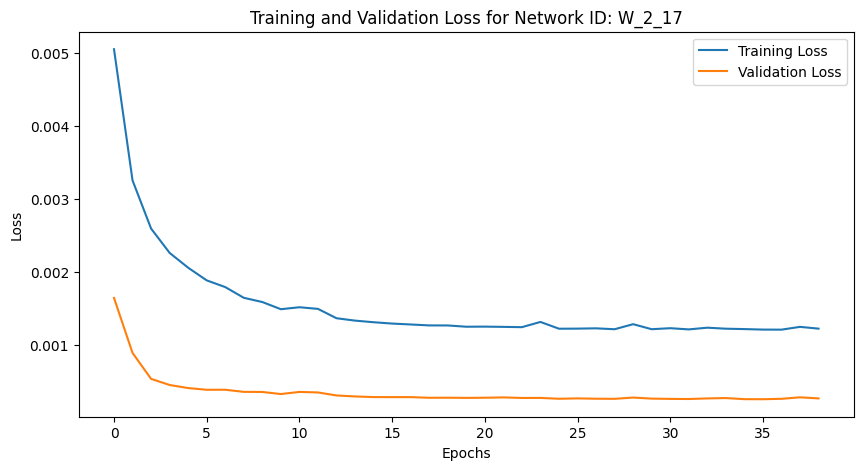

Training Progress:   0%|          | 38/10000 [01:04<4:41:51,  1.70s/epoch, loss=0.00122, val_loss=0.000262, patience=1]


Mean Squared Error: 0.002275336179595683
Iteration: 37, Window Size: 2, Y Days Ahead: 18
X shape: (3788, 2)
y shape: (3788, 18)
Initializing network with layer sizes: [2, 128, 64, 32, 18]
params_W_2_18.npz not found. Using randomly initialized parameters.
Training data shape: (3030, 2), (3030, 18), Validation data shape: (379, 2), (379, 18), Testing data shape: (379, 2), (379, 18)
Parameters loaded from params_W_2_18.npz


Training Progress:   0%|          | 22/10000 [00:38<4:39:15,  1.68s/epoch, loss=0.00129, val_loss=0.000275, patience=1]

Epoch 23/10000, Training Loss: 0.001288, Validation Loss: 0.000275
Early stopping at epoch 23. Best validation loss: 0.000271


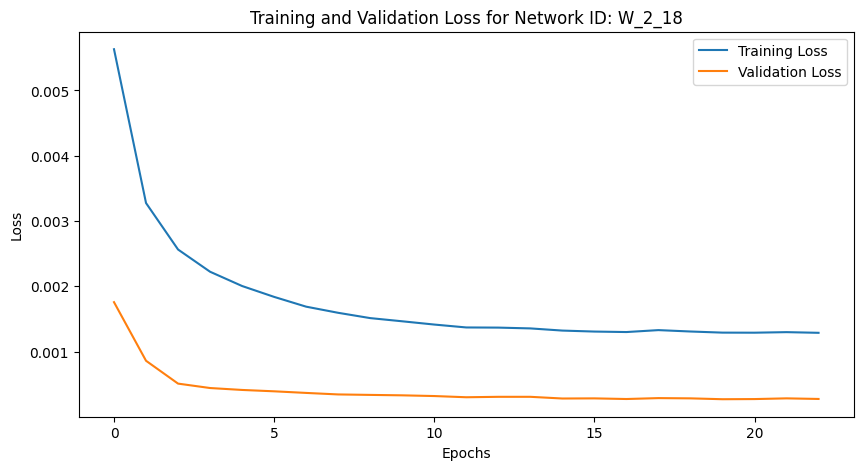

Training Progress:   0%|          | 22/10000 [00:38<4:52:44,  1.76s/epoch, loss=0.00129, val_loss=0.000275, patience=1]


Mean Squared Error: 0.0024286370850056666
Iteration: 38, Window Size: 2, Y Days Ahead: 19
X shape: (3787, 2)
y shape: (3787, 19)
Initializing network with layer sizes: [2, 128, 64, 32, 19]
params_W_2_19.npz not found. Using randomly initialized parameters.
Training data shape: (3029, 2), (3029, 19), Validation data shape: (379, 2), (379, 19), Testing data shape: (379, 2), (379, 19)
Parameters loaded from params_W_2_19.npz


Training Progress:   0%|          | 16/10000 [00:29<4:48:04,  1.73s/epoch, loss=0.0014, val_loss=0.000307, patience=1] 

Epoch 17/10000, Training Loss: 0.001397, Validation Loss: 0.000307
Early stopping at epoch 17. Best validation loss: 0.000307


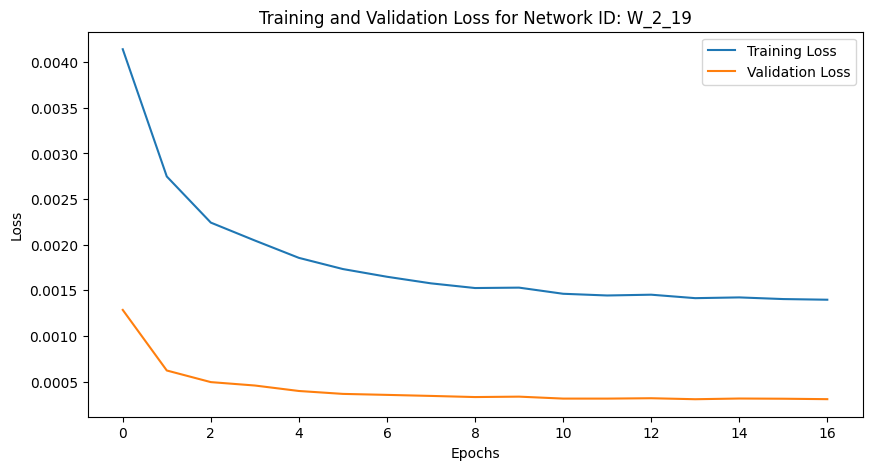

Training Progress:   0%|          | 16/10000 [00:29<5:06:09,  1.84s/epoch, loss=0.0014, val_loss=0.000307, patience=1]


Mean Squared Error: 0.0024835899230695193
Iteration: 39, Window Size: 2, Y Days Ahead: 20
X shape: (3786, 2)
y shape: (3786, 20)
Initializing network with layer sizes: [2, 128, 64, 32, 20]
params_W_2_20.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 2), (3028, 20), Validation data shape: (379, 2), (379, 20), Testing data shape: (379, 2), (379, 20)
Parameters loaded from params_W_2_20.npz


Training Progress:   0%|          | 24/10000 [00:43<4:46:29,  1.72s/epoch, loss=0.00144, val_loss=0.00031, patience=1] 

Epoch 25/10000, Training Loss: 0.001440, Validation Loss: 0.000310
Early stopping at epoch 25. Best validation loss: 0.000306


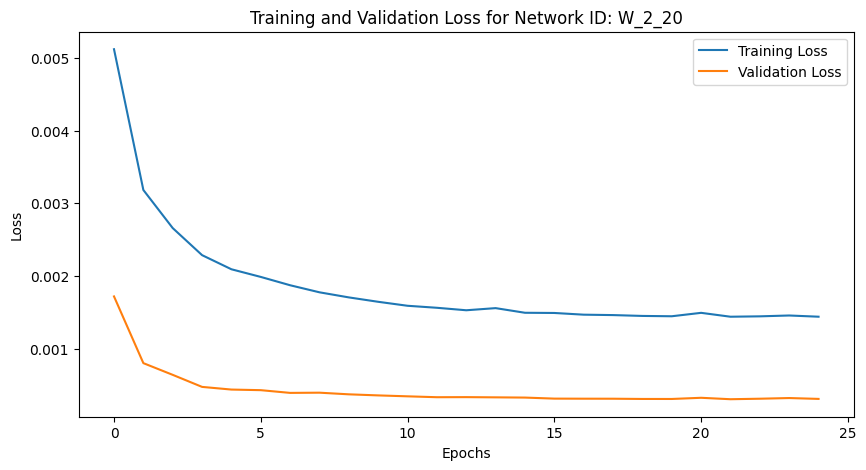

Training Progress:   0%|          | 24/10000 [00:43<5:02:17,  1.82s/epoch, loss=0.00144, val_loss=0.00031, patience=1]


Mean Squared Error: 0.0026606696137122356
Iteration: 40, Window Size: 3, Y Days Ahead: 1
X shape: (3804, 3)
y shape: (3804, 1)
Initializing network with layer sizes: [3, 128, 64, 32, 1]
params_W_3_1.npz not found. Using randomly initialized parameters.
Training data shape: (3043, 3), (3043, 1), Validation data shape: (380, 3), (380, 1), Testing data shape: (381, 3), (381, 1)
Parameters loaded from params_W_3_1.npz


Training Progress:   0%|          | 17/10000 [00:30<4:46:22,  1.72s/epoch, loss=0.000163, val_loss=4.29e-5, patience=1]

Epoch 18/10000, Training Loss: 0.000163, Validation Loss: 0.000043
Early stopping at epoch 18. Best validation loss: 0.000031


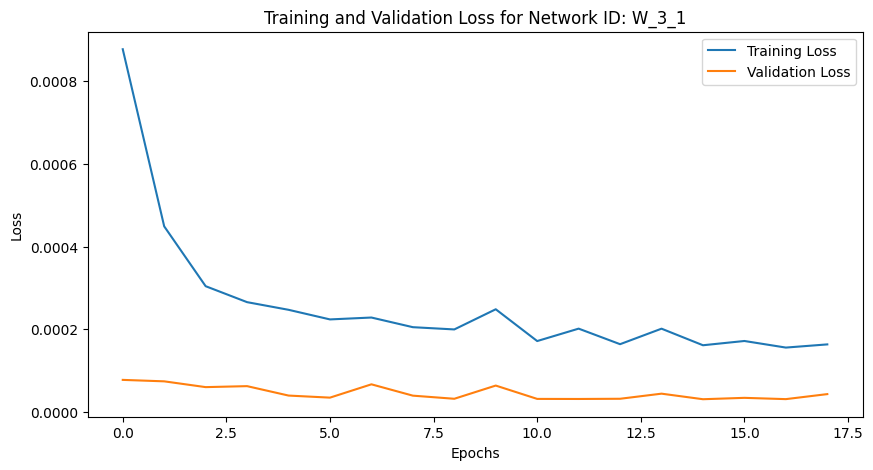

Training Progress:   0%|          | 17/10000 [00:31<5:06:32,  1.84s/epoch, loss=0.000163, val_loss=4.29e-5, patience=1]


Mean Squared Error: 0.00033439072479302307
Iteration: 41, Window Size: 3, Y Days Ahead: 2
X shape: (3803, 3)
y shape: (3803, 2)
Initializing network with layer sizes: [3, 128, 64, 32, 2]
params_W_3_2.npz not found. Using randomly initialized parameters.
Training data shape: (3042, 3), (3042, 2), Validation data shape: (380, 3), (380, 2), Testing data shape: (381, 3), (381, 2)
Parameters loaded from params_W_3_2.npz


Training Progress:   0%|          | 9/10000 [00:16<4:32:12,  1.63s/epoch, loss=0.000269, val_loss=5.12e-5, patience=1]

Epoch 10/10000, Training Loss: 0.000269, Validation Loss: 0.000051
Early stopping at epoch 10. Best validation loss: 0.000042


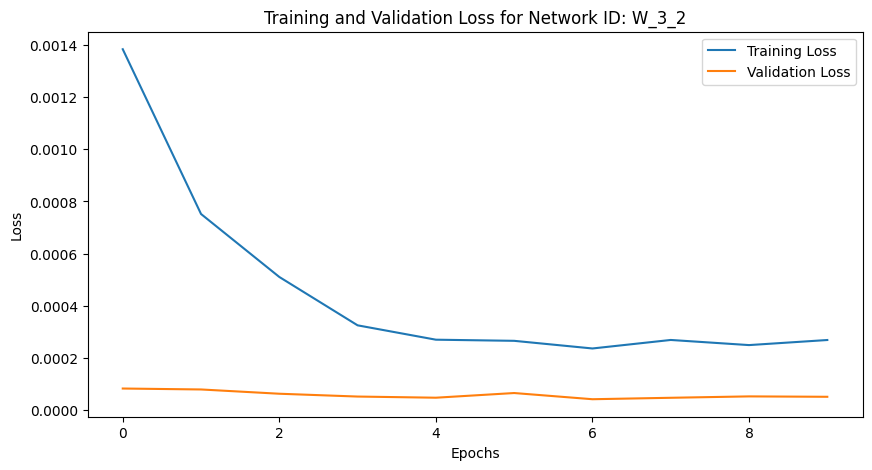

Training Progress:   0%|          | 9/10000 [00:16<5:14:07,  1.89s/epoch, loss=0.000269, val_loss=5.12e-5, patience=1]


Mean Squared Error: 0.0004388769573643178
Iteration: 42, Window Size: 3, Y Days Ahead: 3
X shape: (3802, 3)
y shape: (3802, 3)
Initializing network with layer sizes: [3, 128, 64, 32, 3]
params_W_3_3.npz not found. Using randomly initialized parameters.
Training data shape: (3041, 3), (3041, 3), Validation data shape: (380, 3), (380, 3), Testing data shape: (381, 3), (381, 3)
Parameters loaded from params_W_3_3.npz


Training Progress:   0%|          | 10/10000 [00:18<4:42:36,  1.70s/epoch, loss=0.000373, val_loss=7.09e-5, patience=1]

Epoch 11/10000, Training Loss: 0.000373, Validation Loss: 0.000071
Early stopping at epoch 11. Best validation loss: 0.000057


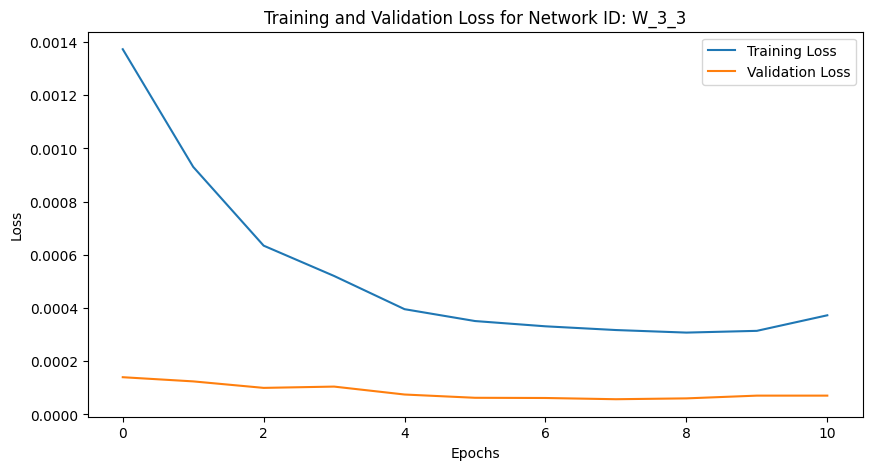

Training Progress:   0%|          | 10/10000 [00:18<5:09:25,  1.86s/epoch, loss=0.000373, val_loss=7.09e-5, patience=1]


Mean Squared Error: 0.0005636818750531517
Iteration: 43, Window Size: 3, Y Days Ahead: 4
X shape: (3801, 3)
y shape: (3801, 4)
Initializing network with layer sizes: [3, 128, 64, 32, 4]
params_W_3_4.npz not found. Using randomly initialized parameters.
Training data shape: (3040, 3), (3040, 4), Validation data shape: (380, 3), (380, 4), Testing data shape: (381, 3), (381, 4)
Parameters loaded from params_W_3_4.npz


Training Progress:   0%|          | 12/10000 [00:22<4:46:41,  1.72s/epoch, loss=0.000365, val_loss=6.67e-5, patience=1]

Epoch 13/10000, Training Loss: 0.000365, Validation Loss: 0.000067
Early stopping at epoch 13. Best validation loss: 0.000066


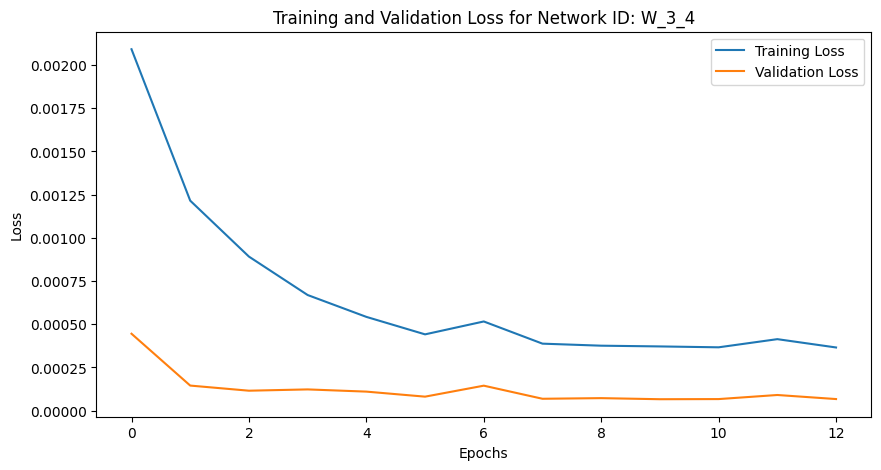

Training Progress:   0%|          | 12/10000 [00:22<5:14:29,  1.89s/epoch, loss=0.000365, val_loss=6.67e-5, patience=1]


Mean Squared Error: 0.0006258831512207638
Iteration: 44, Window Size: 3, Y Days Ahead: 5
X shape: (3800, 3)
y shape: (3800, 5)
Initializing network with layer sizes: [3, 128, 64, 32, 5]
params_W_3_5.npz not found. Using randomly initialized parameters.
Training data shape: (3040, 3), (3040, 5), Validation data shape: (380, 3), (380, 5), Testing data shape: (380, 3), (380, 5)
Parameters loaded from params_W_3_5.npz


Training Progress:   0%|          | 14/10000 [00:26<4:45:29,  1.72s/epoch, loss=0.000425, val_loss=8.27e-5, patience=1]

Epoch 15/10000, Training Loss: 0.000425, Validation Loss: 0.000083
Early stopping at epoch 15. Best validation loss: 0.000080


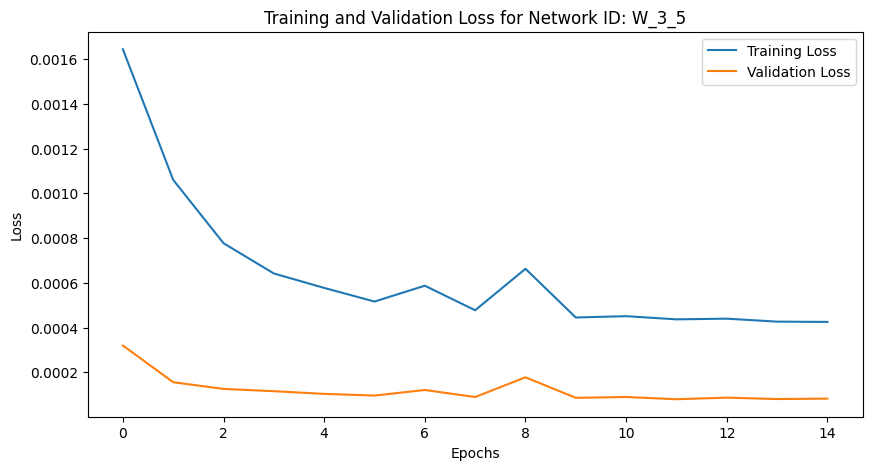

Training Progress:   0%|          | 14/10000 [00:26<5:13:40,  1.88s/epoch, loss=0.000425, val_loss=8.27e-5, patience=1]


Mean Squared Error: 0.0007678731241800546
Iteration: 45, Window Size: 3, Y Days Ahead: 6
X shape: (3799, 3)
y shape: (3799, 6)
Initializing network with layer sizes: [3, 128, 64, 32, 6]
params_W_3_6.npz not found. Using randomly initialized parameters.
Training data shape: (3039, 3), (3039, 6), Validation data shape: (380, 3), (380, 6), Testing data shape: (380, 3), (380, 6)
Parameters loaded from params_W_3_6.npz


Training Progress:   0%|          | 16/10000 [00:28<4:36:43,  1.66s/epoch, loss=0.000488, val_loss=9.38e-5, patience=1] 

Epoch 17/10000, Training Loss: 0.000488, Validation Loss: 0.000094
Early stopping at epoch 17. Best validation loss: 0.000094


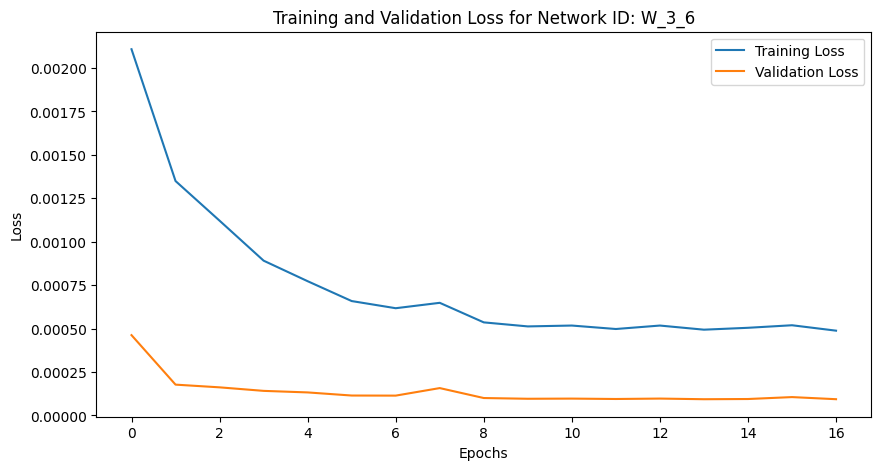

Training Progress:   0%|          | 16/10000 [00:28<4:55:01,  1.77s/epoch, loss=0.000488, val_loss=9.38e-5, patience=1]


Mean Squared Error: 0.0008469625233419965
Iteration: 46, Window Size: 3, Y Days Ahead: 7
X shape: (3798, 3)
y shape: (3798, 7)
Initializing network with layer sizes: [3, 128, 64, 32, 7]
params_W_3_7.npz not found. Using randomly initialized parameters.
Training data shape: (3038, 3), (3038, 7), Validation data shape: (380, 3), (380, 7), Testing data shape: (380, 3), (380, 7)
Parameters loaded from params_W_3_7.npz


Training Progress:   0%|          | 11/10000 [00:20<4:39:54,  1.68s/epoch, loss=0.000593, val_loss=0.000113, patience=1]

Epoch 12/10000, Training Loss: 0.000593, Validation Loss: 0.000113
Early stopping at epoch 12. Best validation loss: 0.000111


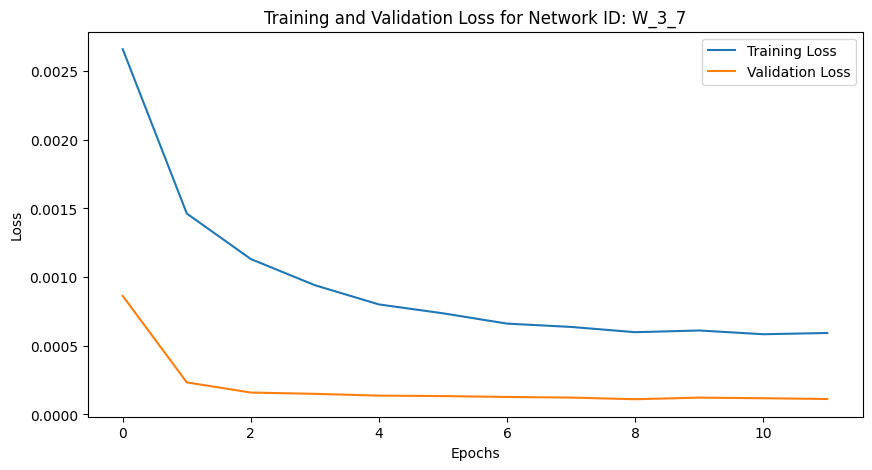

Training Progress:   0%|          | 11/10000 [00:20<5:11:55,  1.87s/epoch, loss=0.000593, val_loss=0.000113, patience=1]


Mean Squared Error: 0.000956028263102641
Iteration: 47, Window Size: 3, Y Days Ahead: 8
X shape: (3797, 3)
y shape: (3797, 8)
Initializing network with layer sizes: [3, 128, 64, 32, 8]
params_W_3_8.npz not found. Using randomly initialized parameters.
Training data shape: (3037, 3), (3037, 8), Validation data shape: (380, 3), (380, 8), Testing data shape: (380, 3), (380, 8)
Parameters loaded from params_W_3_8.npz


Training Progress:   0%|          | 18/10000 [00:32<4:46:16,  1.72s/epoch, loss=0.000637, val_loss=0.000124, patience=1]

Epoch 19/10000, Training Loss: 0.000637, Validation Loss: 0.000124
Early stopping at epoch 19. Best validation loss: 0.000120


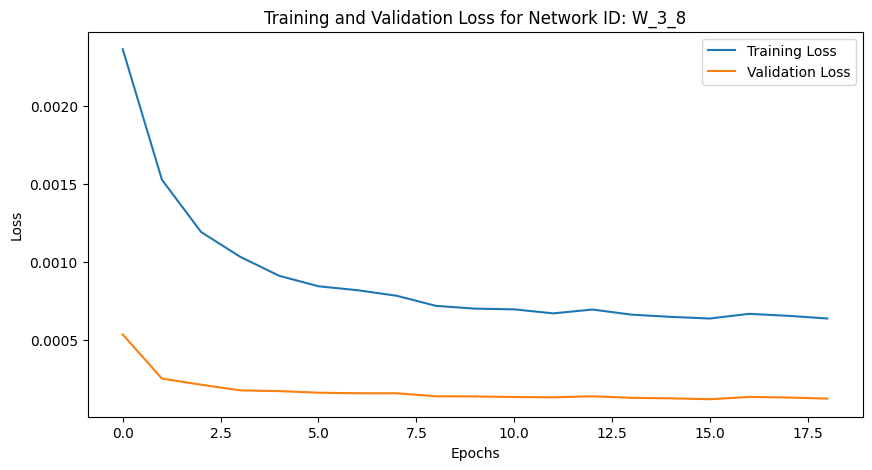

Training Progress:   0%|          | 18/10000 [00:32<5:01:09,  1.81s/epoch, loss=0.000637, val_loss=0.000124, patience=1]


Mean Squared Error: 0.0011252687430823695
Iteration: 48, Window Size: 3, Y Days Ahead: 9
X shape: (3796, 3)
y shape: (3796, 9)
Initializing network with layer sizes: [3, 128, 64, 32, 9]
params_W_3_9.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 3), (3036, 9), Validation data shape: (380, 3), (380, 9), Testing data shape: (380, 3), (380, 9)
Parameters loaded from params_W_3_9.npz


Training Progress:   0%|          | 17/10000 [00:30<4:43:48,  1.71s/epoch, loss=0.000721, val_loss=0.000148, patience=1]

Epoch 18/10000, Training Loss: 0.000721, Validation Loss: 0.000148
Early stopping at epoch 18. Best validation loss: 0.000138


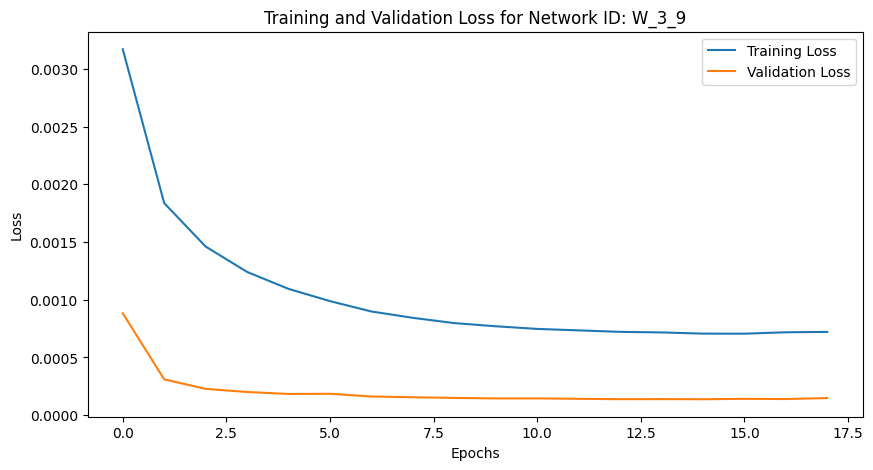

Training Progress:   0%|          | 17/10000 [00:30<5:01:15,  1.81s/epoch, loss=0.000721, val_loss=0.000148, patience=1]


Mean Squared Error: 0.0011496516446225984
Iteration: 49, Window Size: 3, Y Days Ahead: 10
X shape: (3795, 3)
y shape: (3795, 10)
Initializing network with layer sizes: [3, 128, 64, 32, 10]
params_W_3_10.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 3), (3036, 10), Validation data shape: (379, 3), (379, 10), Testing data shape: (380, 3), (380, 10)
Parameters loaded from params_W_3_10.npz


Training Progress:   0%|          | 26/10000 [00:44<4:43:26,  1.71s/epoch, loss=0.000753, val_loss=0.000147, patience=1]

Epoch 27/10000, Training Loss: 0.000753, Validation Loss: 0.000147
Early stopping at epoch 27. Best validation loss: 0.000145


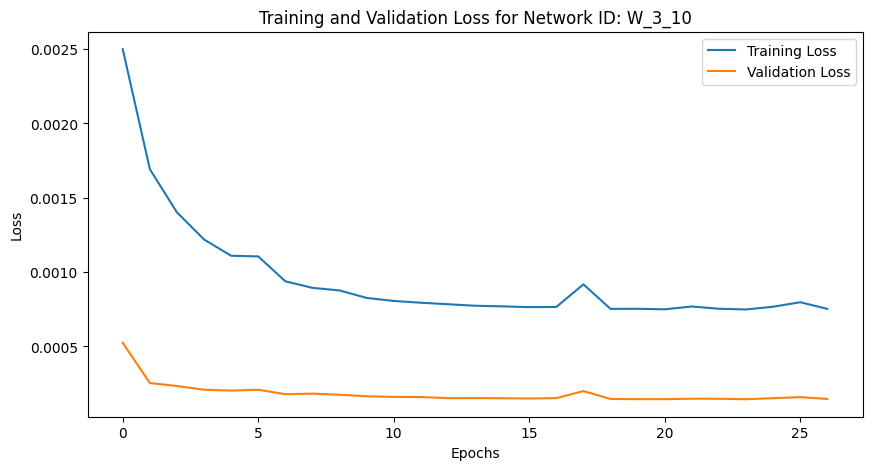

Training Progress:   0%|          | 26/10000 [00:44<4:46:57,  1.73s/epoch, loss=0.000753, val_loss=0.000147, patience=1]


Mean Squared Error: 0.0013289178021196762
Iteration: 50, Window Size: 3, Y Days Ahead: 11
X shape: (3794, 3)
y shape: (3794, 11)
Initializing network with layer sizes: [3, 128, 64, 32, 11]
params_W_3_11.npz not found. Using randomly initialized parameters.
Training data shape: (3035, 3), (3035, 11), Validation data shape: (379, 3), (379, 11), Testing data shape: (380, 3), (380, 11)
Parameters loaded from params_W_3_11.npz


Training Progress:   0%|          | 23/10000 [00:41<4:40:34,  1.69s/epoch, loss=0.000828, val_loss=0.000166, patience=1]

Epoch 24/10000, Training Loss: 0.000828, Validation Loss: 0.000166
Early stopping at epoch 24. Best validation loss: 0.000159


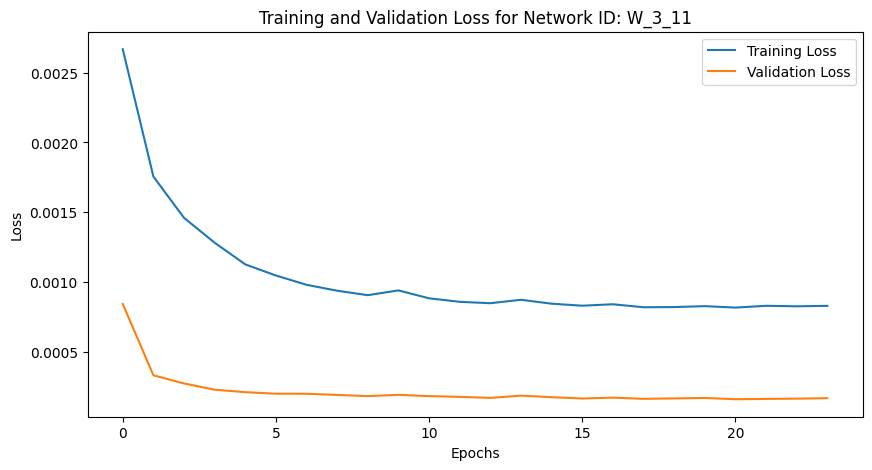

Training Progress:   0%|          | 23/10000 [00:41<4:57:51,  1.79s/epoch, loss=0.000828, val_loss=0.000166, patience=1]


Mean Squared Error: 0.0014538876930578356
Iteration: 51, Window Size: 3, Y Days Ahead: 12
X shape: (3793, 3)
y shape: (3793, 12)
Initializing network with layer sizes: [3, 128, 64, 32, 12]
params_W_3_12.npz not found. Using randomly initialized parameters.
Training data shape: (3034, 3), (3034, 12), Validation data shape: (379, 3), (379, 12), Testing data shape: (380, 3), (380, 12)
Parameters loaded from params_W_3_12.npz


Training Progress:   0%|          | 15/10000 [00:27<4:39:35,  1.68s/epoch, loss=0.00095, val_loss=0.000195, patience=1] 

Epoch 16/10000, Training Loss: 0.000950, Validation Loss: 0.000195
Early stopping at epoch 16. Best validation loss: 0.000188


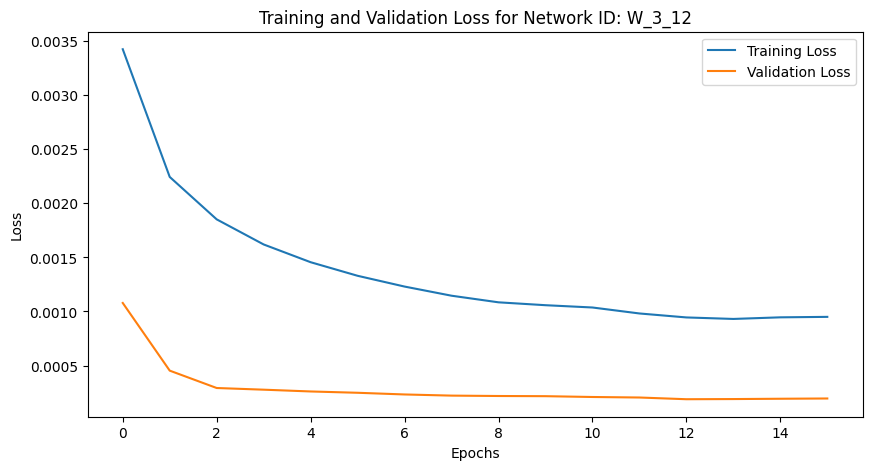

Training Progress:   0%|          | 15/10000 [00:27<5:02:53,  1.82s/epoch, loss=0.00095, val_loss=0.000195, patience=1]


Mean Squared Error: 0.001611337249877375
Iteration: 52, Window Size: 3, Y Days Ahead: 13
X shape: (3792, 3)
y shape: (3792, 13)
Initializing network with layer sizes: [3, 128, 64, 32, 13]
params_W_3_13.npz not found. Using randomly initialized parameters.
Training data shape: (3033, 3), (3033, 13), Validation data shape: (379, 3), (379, 13), Testing data shape: (380, 3), (380, 13)
Parameters loaded from params_W_3_13.npz


Training Progress:   0%|          | 33/10000 [00:57<4:46:38,  1.73s/epoch, loss=0.000935, val_loss=0.000188, patience=1]

Epoch 34/10000, Training Loss: 0.000935, Validation Loss: 0.000188
Early stopping at epoch 34. Best validation loss: 0.000186


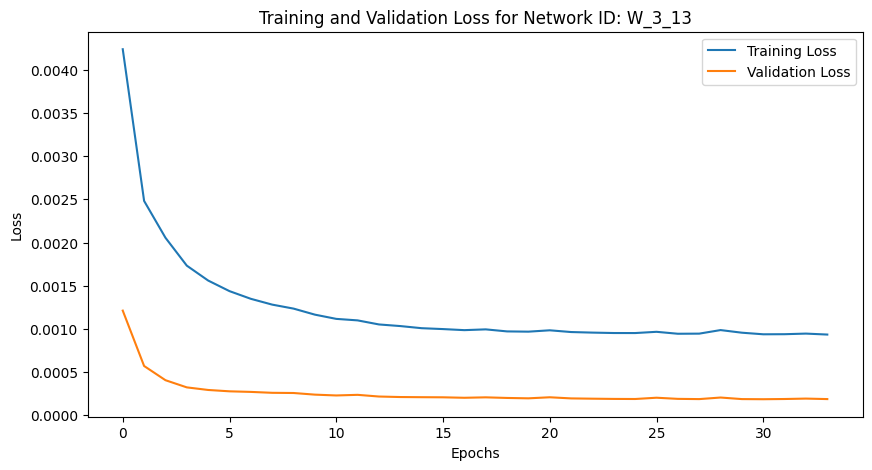

Training Progress:   0%|          | 33/10000 [00:57<4:49:12,  1.74s/epoch, loss=0.000935, val_loss=0.000188, patience=1]


Mean Squared Error: 0.0017282255530661809
Iteration: 53, Window Size: 3, Y Days Ahead: 14
X shape: (3791, 3)
y shape: (3791, 14)
Initializing network with layer sizes: [3, 128, 64, 32, 14]
params_W_3_14.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 3), (3032, 14), Validation data shape: (379, 3), (379, 14), Testing data shape: (380, 3), (380, 14)
Parameters loaded from params_W_3_14.npz


Training Progress:   0%|          | 31/10000 [00:52<4:21:57,  1.58s/epoch, loss=0.00102, val_loss=0.000208, patience=1]

Epoch 32/10000, Training Loss: 0.001024, Validation Loss: 0.000208
Early stopping at epoch 32. Best validation loss: 0.000202


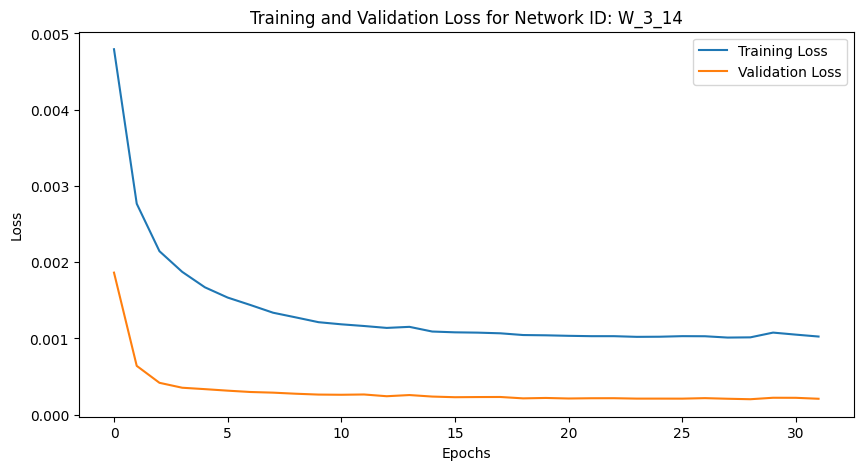

Training Progress:   0%|          | 31/10000 [00:53<4:45:09,  1.72s/epoch, loss=0.00102, val_loss=0.000208, patience=1]


Mean Squared Error: 0.0018876547168309114
Iteration: 54, Window Size: 3, Y Days Ahead: 15
X shape: (3790, 3)
y shape: (3790, 15)
Initializing network with layer sizes: [3, 128, 64, 32, 15]
params_W_3_15.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 3), (3032, 15), Validation data shape: (379, 3), (379, 15), Testing data shape: (379, 3), (379, 15)
Parameters loaded from params_W_3_15.npz


Training Progress:   0%|          | 31/10000 [00:55<4:51:47,  1.76s/epoch, loss=0.00108, val_loss=0.000223, patience=1]

Epoch 32/10000, Training Loss: 0.001083, Validation Loss: 0.000223
Early stopping at epoch 32. Best validation loss: 0.000217


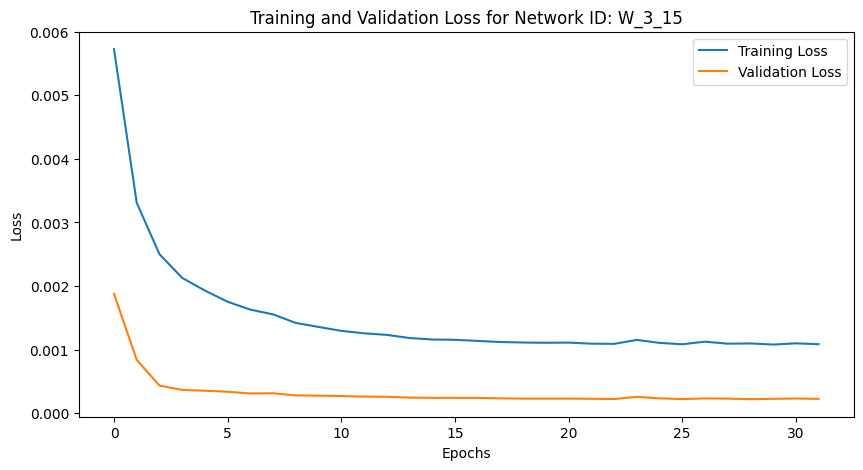

Training Progress:   0%|          | 31/10000 [00:55<4:56:09,  1.78s/epoch, loss=0.00108, val_loss=0.000223, patience=1]


Mean Squared Error: 0.002031308837228195
Iteration: 55, Window Size: 3, Y Days Ahead: 16
X shape: (3789, 3)
y shape: (3789, 16)
Initializing network with layer sizes: [3, 128, 64, 32, 16]
params_W_3_16.npz not found. Using randomly initialized parameters.
Training data shape: (3031, 3), (3031, 16), Validation data shape: (379, 3), (379, 16), Testing data shape: (379, 3), (379, 16)
Parameters loaded from params_W_3_16.npz


Training Progress:   0%|          | 20/10000 [00:36<4:50:29,  1.75s/epoch, loss=0.0012, val_loss=0.00026, patience=1]  

Epoch 21/10000, Training Loss: 0.001204, Validation Loss: 0.000260
Early stopping at epoch 21. Best validation loss: 0.000245


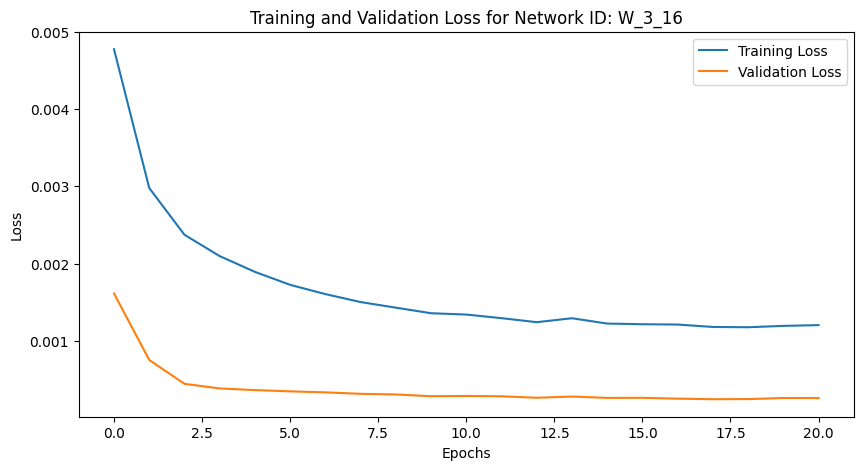

Training Progress:   0%|          | 20/10000 [00:37<5:08:07,  1.85s/epoch, loss=0.0012, val_loss=0.00026, patience=1]


Mean Squared Error: 0.0021395864033296325
Iteration: 56, Window Size: 3, Y Days Ahead: 17
X shape: (3788, 3)
y shape: (3788, 17)
Initializing network with layer sizes: [3, 128, 64, 32, 17]
params_W_3_17.npz not found. Using randomly initialized parameters.
Training data shape: (3030, 3), (3030, 17), Validation data shape: (379, 3), (379, 17), Testing data shape: (379, 3), (379, 17)
Parameters loaded from params_W_3_17.npz


Training Progress:   0%|          | 25/10000 [00:44<4:47:00,  1.73s/epoch, loss=0.00122, val_loss=0.000262, patience=1]

Epoch 26/10000, Training Loss: 0.001220, Validation Loss: 0.000262
Early stopping at epoch 26. Best validation loss: 0.000255


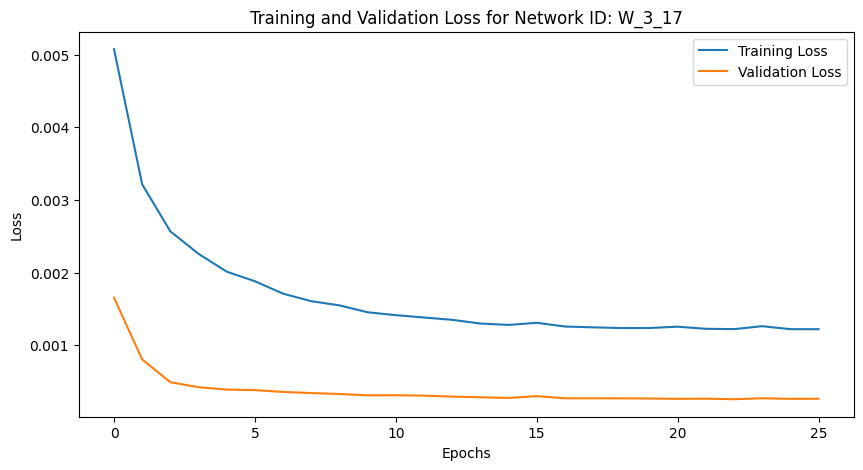

Training Progress:   0%|          | 25/10000 [00:44<4:56:29,  1.78s/epoch, loss=0.00122, val_loss=0.000262, patience=1]


Mean Squared Error: 0.0022658672960539105
Iteration: 57, Window Size: 3, Y Days Ahead: 18
X shape: (3787, 3)
y shape: (3787, 18)
Initializing network with layer sizes: [3, 128, 64, 32, 18]
params_W_3_18.npz not found. Using randomly initialized parameters.
Training data shape: (3029, 3), (3029, 18), Validation data shape: (379, 3), (379, 18), Testing data shape: (379, 3), (379, 18)
Parameters loaded from params_W_3_18.npz


Training Progress:   0%|          | 34/10000 [01:00<4:50:12,  1.75s/epoch, loss=0.00129, val_loss=0.000288, patience=1]

Epoch 35/10000, Training Loss: 0.001287, Validation Loss: 0.000288
Early stopping at epoch 35. Best validation loss: 0.000274


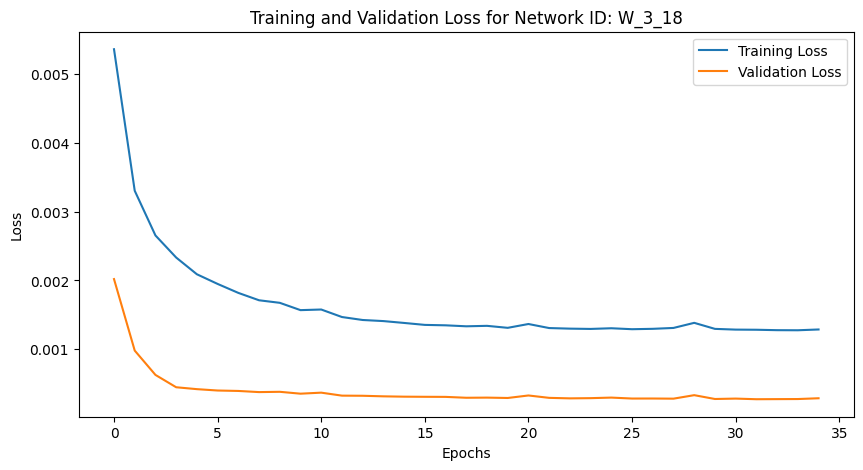

Training Progress:   0%|          | 34/10000 [01:00<4:57:51,  1.79s/epoch, loss=0.00129, val_loss=0.000288, patience=1]


Mean Squared Error: 0.002427468552617943
Iteration: 58, Window Size: 3, Y Days Ahead: 19
X shape: (3786, 3)
y shape: (3786, 19)
Initializing network with layer sizes: [3, 128, 64, 32, 19]
params_W_3_19.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 3), (3028, 19), Validation data shape: (379, 3), (379, 19), Testing data shape: (379, 3), (379, 19)
Parameters loaded from params_W_3_19.npz


Training Progress:   0%|          | 18/10000 [00:34<4:58:33,  1.79s/epoch, loss=0.00147, val_loss=0.000326, patience=1]

Epoch 19/10000, Training Loss: 0.001469, Validation Loss: 0.000326
Early stopping at epoch 19. Best validation loss: 0.000306


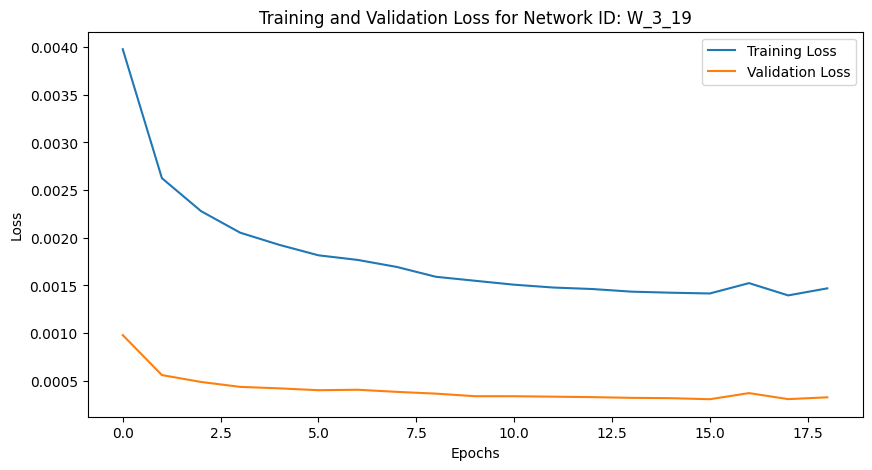

Training Progress:   0%|          | 18/10000 [00:34<5:19:12,  1.92s/epoch, loss=0.00147, val_loss=0.000326, patience=1]


Mean Squared Error: 0.002632961700749596
Iteration: 59, Window Size: 3, Y Days Ahead: 20
X shape: (3785, 3)
y shape: (3785, 20)
Initializing network with layer sizes: [3, 128, 64, 32, 20]
params_W_3_20.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 3), (3028, 20), Validation data shape: (378, 3), (378, 20), Testing data shape: (379, 3), (379, 20)
Parameters loaded from params_W_3_20.npz


Training Progress:   0%|          | 31/10000 [00:55<4:51:17,  1.75s/epoch, loss=0.00144, val_loss=0.000315, patience=1]

Epoch 32/10000, Training Loss: 0.001437, Validation Loss: 0.000315
Early stopping at epoch 32. Best validation loss: 0.000309


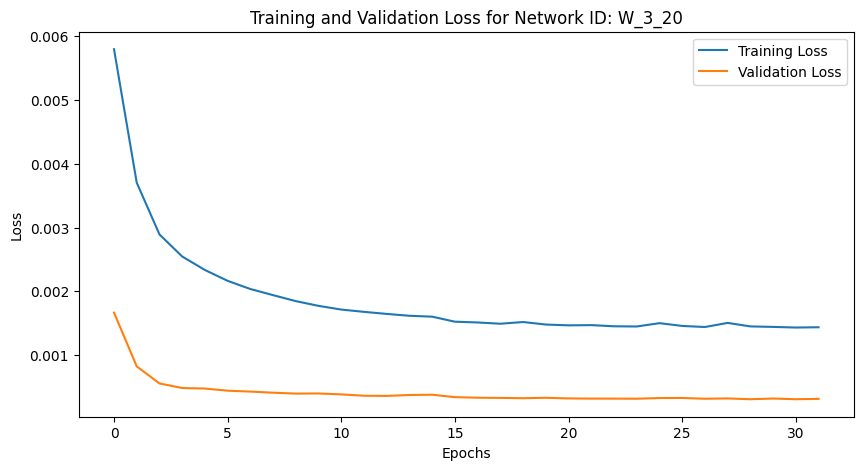

Training Progress:   0%|          | 31/10000 [00:55<4:59:47,  1.80s/epoch, loss=0.00144, val_loss=0.000315, patience=1]


Mean Squared Error: 0.0027648796071007777
Iteration: 60, Window Size: 4, Y Days Ahead: 1
X shape: (3803, 4)
y shape: (3803, 1)
Initializing network with layer sizes: [4, 128, 64, 32, 1]
params_W_4_1.npz not found. Using randomly initialized parameters.
Training data shape: (3042, 4), (3042, 1), Validation data shape: (380, 4), (380, 1), Testing data shape: (381, 4), (381, 1)
Parameters loaded from params_W_4_1.npz


Training Progress:   0%|          | 8/10000 [00:15<4:49:03,  1.74s/epoch, loss=0.000158, val_loss=3.72e-5, patience=1] 

Epoch 9/10000, Training Loss: 0.000158, Validation Loss: 0.000037
Early stopping at epoch 9. Best validation loss: 0.000031


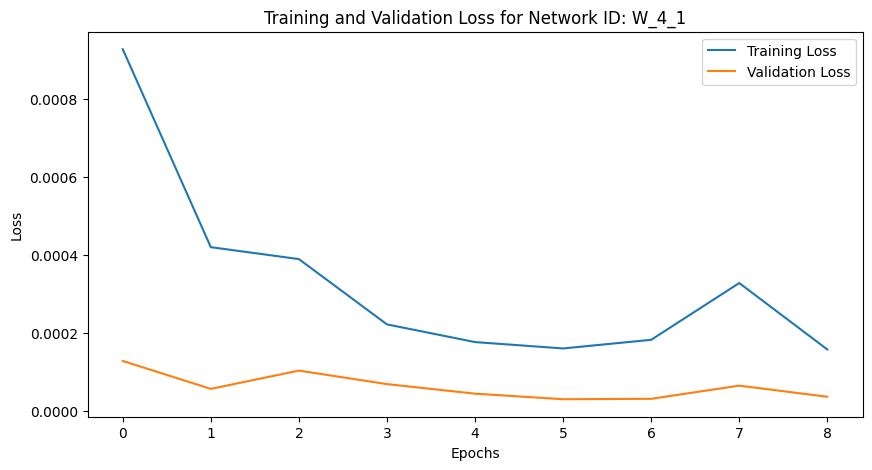

Training Progress:   0%|          | 8/10000 [00:15<5:29:57,  1.98s/epoch, loss=0.000158, val_loss=3.72e-5, patience=1]


Mean Squared Error: 0.000352173285046197
Iteration: 61, Window Size: 4, Y Days Ahead: 2
X shape: (3802, 4)
y shape: (3802, 2)
Initializing network with layer sizes: [4, 128, 64, 32, 2]
params_W_4_2.npz not found. Using randomly initialized parameters.
Training data shape: (3041, 4), (3041, 2), Validation data shape: (380, 4), (380, 2), Testing data shape: (381, 4), (381, 2)
Parameters loaded from params_W_4_2.npz


Training Progress:   0%|          | 8/10000 [00:15<4:48:05,  1.73s/epoch, loss=0.000244, val_loss=4.82e-5, patience=1] 

Epoch 9/10000, Training Loss: 0.000244, Validation Loss: 0.000048
Early stopping at epoch 9. Best validation loss: 0.000046


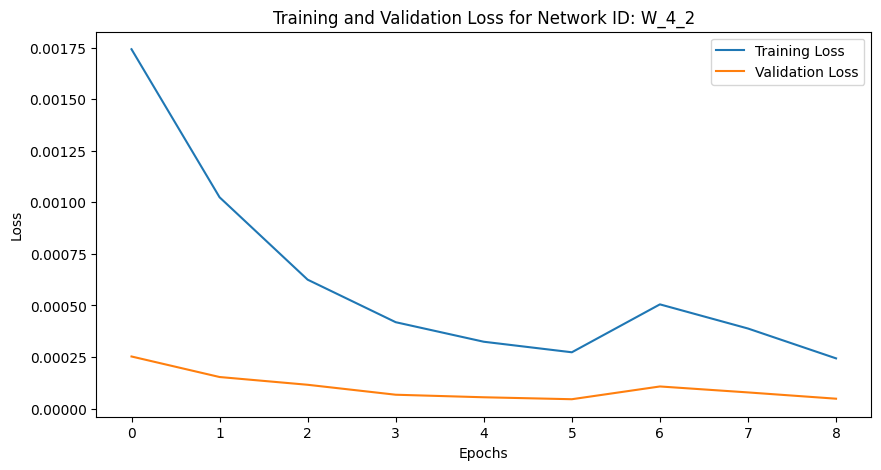

Training Progress:   0%|          | 8/10000 [00:15<5:28:29,  1.97s/epoch, loss=0.000244, val_loss=4.82e-5, patience=1]


Mean Squared Error: 0.00046274367975894504
Iteration: 62, Window Size: 4, Y Days Ahead: 3
X shape: (3801, 4)
y shape: (3801, 3)
Initializing network with layer sizes: [4, 128, 64, 32, 3]
params_W_4_3.npz not found. Using randomly initialized parameters.
Training data shape: (3040, 4), (3040, 3), Validation data shape: (380, 4), (380, 3), Testing data shape: (381, 4), (381, 3)
Parameters loaded from params_W_4_3.npz


Training Progress:   0%|          | 13/10000 [00:24<4:48:52,  1.74s/epoch, loss=0.000311, val_loss=6.6e-5, patience=1] 

Epoch 14/10000, Training Loss: 0.000311, Validation Loss: 0.000066
Early stopping at epoch 14. Best validation loss: 0.000057


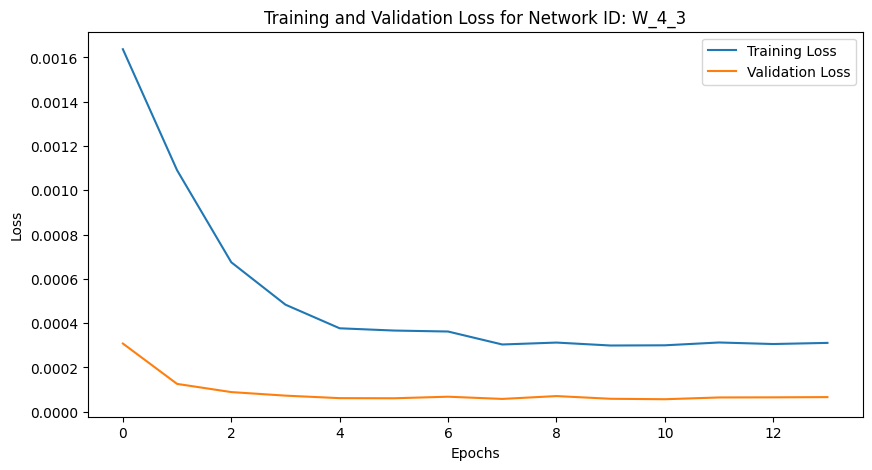

Training Progress:   0%|          | 13/10000 [00:25<5:20:43,  1.93s/epoch, loss=0.000311, val_loss=6.6e-5, patience=1]


Mean Squared Error: 0.0005315074337940751
Iteration: 63, Window Size: 4, Y Days Ahead: 4
X shape: (3800, 4)
y shape: (3800, 4)
Initializing network with layer sizes: [4, 128, 64, 32, 4]
params_W_4_4.npz not found. Using randomly initialized parameters.
Training data shape: (3040, 4), (3040, 4), Validation data shape: (380, 4), (380, 4), Testing data shape: (380, 4), (380, 4)
Parameters loaded from params_W_4_4.npz


Training Progress:   0%|          | 20/10000 [00:33<4:45:09,  1.71s/epoch, loss=0.000443, val_loss=0.000113, patience=1]

Epoch 21/10000, Training Loss: 0.000443, Validation Loss: 0.000113
Early stopping at epoch 21. Best validation loss: 0.000065


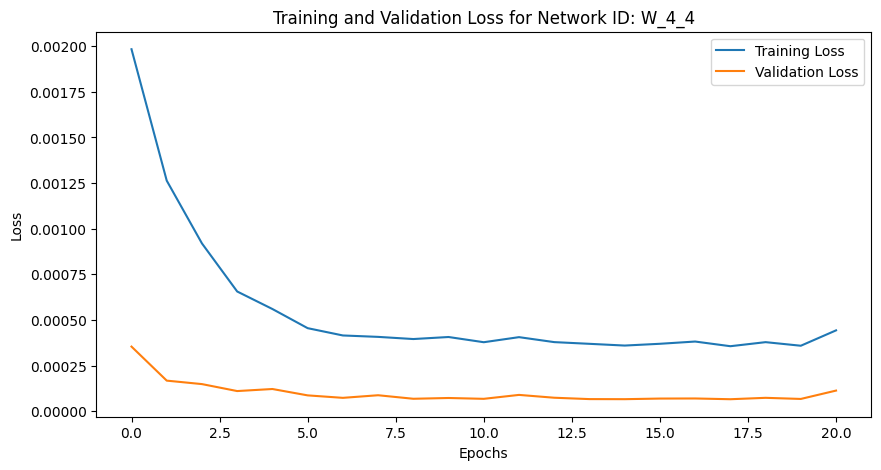

Training Progress:   0%|          | 20/10000 [00:33<4:42:11,  1.70s/epoch, loss=0.000443, val_loss=0.000113, patience=1]


Mean Squared Error: 0.0006285883069684945
Iteration: 64, Window Size: 4, Y Days Ahead: 5
X shape: (3799, 4)
y shape: (3799, 5)
Initializing network with layer sizes: [4, 128, 64, 32, 5]
params_W_4_5.npz not found. Using randomly initialized parameters.
Training data shape: (3039, 4), (3039, 5), Validation data shape: (380, 4), (380, 5), Testing data shape: (380, 4), (380, 5)
Parameters loaded from params_W_4_5.npz


Training Progress:   0%|          | 15/10000 [00:28<4:46:33,  1.72s/epoch, loss=0.000442, val_loss=8.59e-5, patience=1]

Epoch 16/10000, Training Loss: 0.000442, Validation Loss: 0.000086
Early stopping at epoch 16. Best validation loss: 0.000081


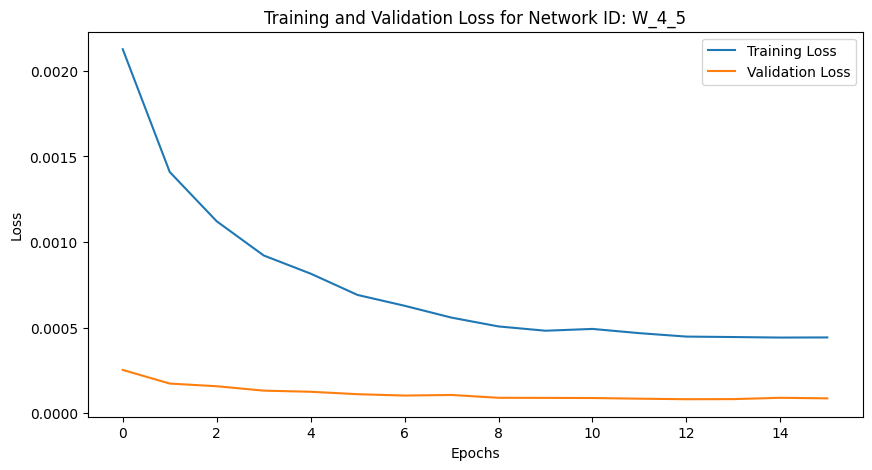

Training Progress:   0%|          | 15/10000 [00:28<5:15:54,  1.90s/epoch, loss=0.000442, val_loss=8.59e-5, patience=1]


Mean Squared Error: 0.0007304391255037377
Iteration: 65, Window Size: 4, Y Days Ahead: 6
X shape: (3798, 4)
y shape: (3798, 6)
Initializing network with layer sizes: [4, 128, 64, 32, 6]
params_W_4_6.npz not found. Using randomly initialized parameters.
Training data shape: (3038, 4), (3038, 6), Validation data shape: (380, 4), (380, 6), Testing data shape: (380, 4), (380, 6)
Parameters loaded from params_W_4_6.npz


Training Progress:   0%|          | 19/10000 [00:34<4:45:39,  1.72s/epoch, loss=0.000528, val_loss=0.000117, patience=1]

Epoch 20/10000, Training Loss: 0.000528, Validation Loss: 0.000117
Early stopping at epoch 20. Best validation loss: 0.000092


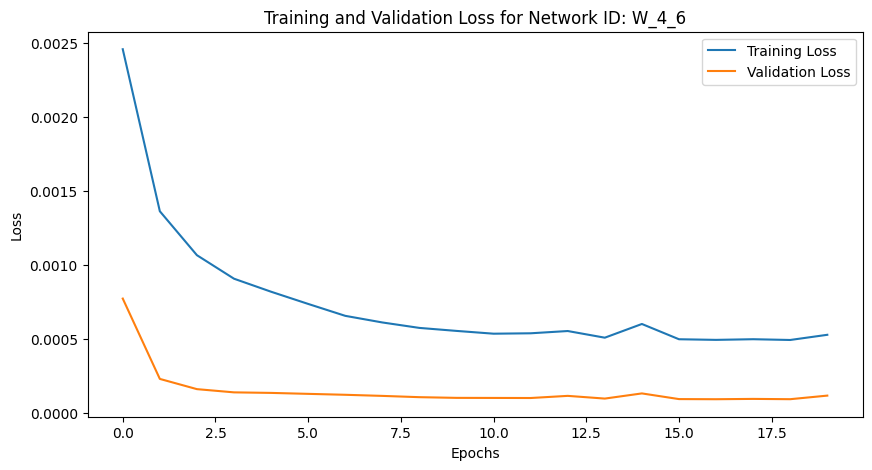

Training Progress:   0%|          | 19/10000 [00:34<5:03:28,  1.82s/epoch, loss=0.000528, val_loss=0.000117, patience=1]


Mean Squared Error: 0.0008459137487932897
Iteration: 66, Window Size: 4, Y Days Ahead: 7
X shape: (3797, 4)
y shape: (3797, 7)
Initializing network with layer sizes: [4, 128, 64, 32, 7]
params_W_4_7.npz not found. Using randomly initialized parameters.
Training data shape: (3037, 4), (3037, 7), Validation data shape: (380, 4), (380, 7), Testing data shape: (380, 4), (380, 7)
Parameters loaded from params_W_4_7.npz


Training Progress:   0%|          | 14/10000 [00:26<5:02:52,  1.82s/epoch, loss=0.000588, val_loss=0.000121, patience=1]

Epoch 15/10000, Training Loss: 0.000588, Validation Loss: 0.000121
Early stopping at epoch 15. Best validation loss: 0.000117


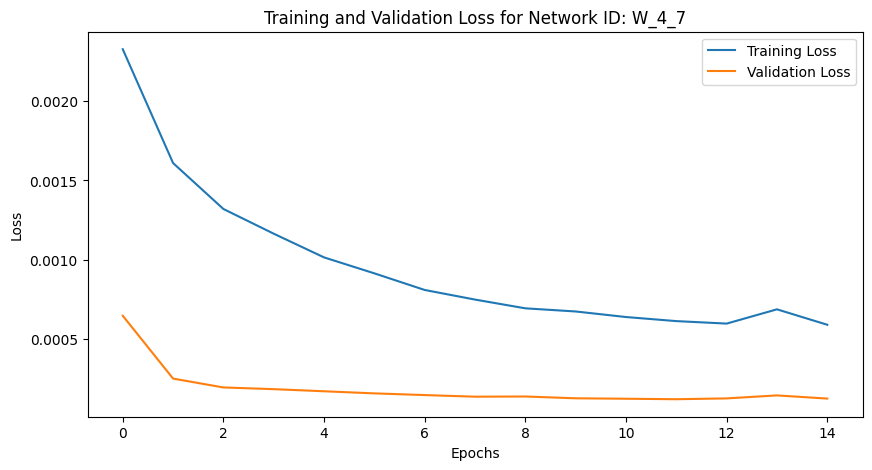

Training Progress:   0%|          | 14/10000 [00:26<5:16:39,  1.90s/epoch, loss=0.000588, val_loss=0.000121, patience=1]


Mean Squared Error: 0.0009861359277687028
Iteration: 67, Window Size: 4, Y Days Ahead: 8
X shape: (3796, 4)
y shape: (3796, 8)
Initializing network with layer sizes: [4, 128, 64, 32, 8]
params_W_4_8.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 4), (3036, 8), Validation data shape: (380, 4), (380, 8), Testing data shape: (380, 4), (380, 8)
Parameters loaded from params_W_4_8.npz


Training Progress:   0%|          | 15/10000 [00:27<4:46:24,  1.72s/epoch, loss=0.000674, val_loss=0.000134, patience=1]

Epoch 16/10000, Training Loss: 0.000674, Validation Loss: 0.000134
Early stopping at epoch 16. Best validation loss: 0.000128


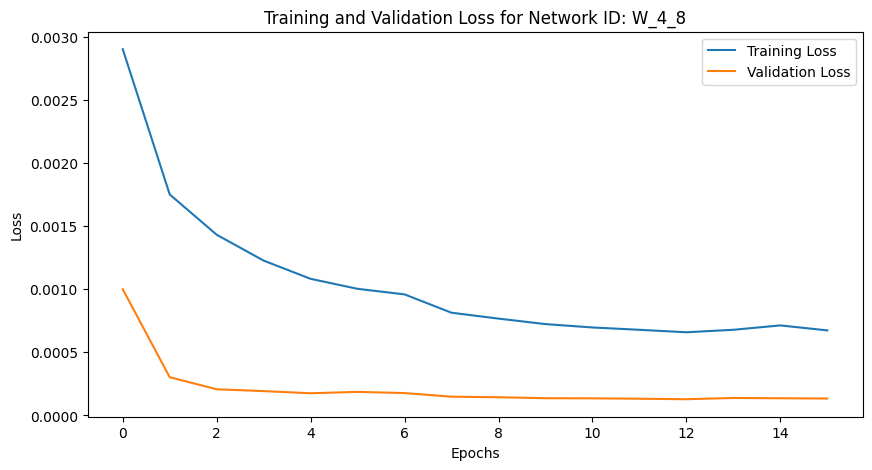

Training Progress:   0%|          | 15/10000 [00:27<5:06:10,  1.84s/epoch, loss=0.000674, val_loss=0.000134, patience=1]


Mean Squared Error: 0.0010724101836885542
Iteration: 68, Window Size: 4, Y Days Ahead: 9
X shape: (3795, 4)
y shape: (3795, 9)
Initializing network with layer sizes: [4, 128, 64, 32, 9]
params_W_4_9.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 4), (3036, 9), Validation data shape: (379, 4), (379, 9), Testing data shape: (380, 4), (380, 9)
Parameters loaded from params_W_4_9.npz


Training Progress:   0%|          | 21/10000 [00:38<4:54:08,  1.77s/epoch, loss=0.000691, val_loss=0.000137, patience=1]

Epoch 22/10000, Training Loss: 0.000691, Validation Loss: 0.000137
Early stopping at epoch 22. Best validation loss: 0.000135


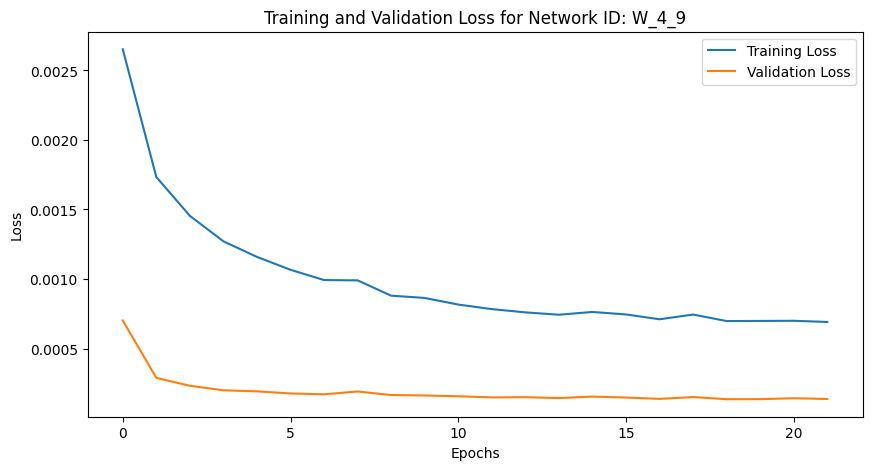

Training Progress:   0%|          | 21/10000 [00:38<5:05:00,  1.83s/epoch, loss=0.000691, val_loss=0.000137, patience=1]


Mean Squared Error: 0.0011570121931738981
Iteration: 69, Window Size: 4, Y Days Ahead: 10
X shape: (3794, 4)
y shape: (3794, 10)
Initializing network with layer sizes: [4, 128, 64, 32, 10]
params_W_4_10.npz not found. Using randomly initialized parameters.
Training data shape: (3035, 4), (3035, 10), Validation data shape: (379, 4), (379, 10), Testing data shape: (380, 4), (380, 10)
Parameters loaded from params_W_4_10.npz


Training Progress:   0%|          | 23/10000 [00:40<4:44:04,  1.71s/epoch, loss=0.000751, val_loss=0.000144, patience=1]

Epoch 24/10000, Training Loss: 0.000751, Validation Loss: 0.000144
Early stopping at epoch 24. Best validation loss: 0.000142


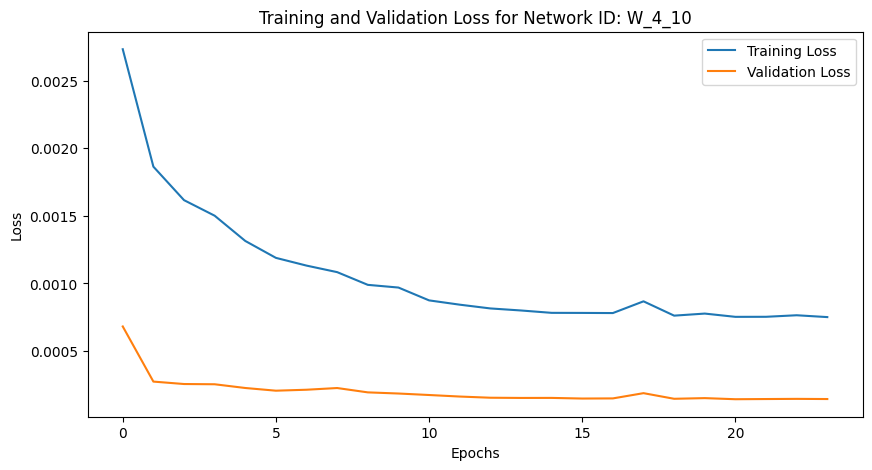

Training Progress:   0%|          | 23/10000 [00:40<4:54:48,  1.77s/epoch, loss=0.000751, val_loss=0.000144, patience=1]


Mean Squared Error: 0.0012781244855994216
Iteration: 70, Window Size: 4, Y Days Ahead: 11
X shape: (3793, 4)
y shape: (3793, 11)
Initializing network with layer sizes: [4, 128, 64, 32, 11]
params_W_4_11.npz not found. Using randomly initialized parameters.
Training data shape: (3034, 4), (3034, 11), Validation data shape: (379, 4), (379, 11), Testing data shape: (380, 4), (380, 11)
Parameters loaded from params_W_4_11.npz


Training Progress:   0%|          | 20/10000 [00:37<4:54:14,  1.77s/epoch, loss=0.000827, val_loss=0.000167, patience=1]

Epoch 21/10000, Training Loss: 0.000827, Validation Loss: 0.000167
Early stopping at epoch 21. Best validation loss: 0.000162


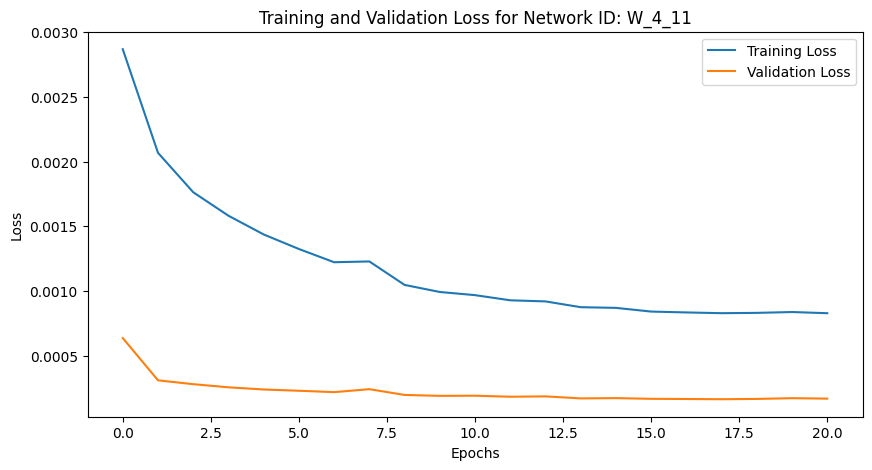

Training Progress:   0%|          | 20/10000 [00:37<5:11:11,  1.87s/epoch, loss=0.000827, val_loss=0.000167, patience=1]


Mean Squared Error: 0.001446756608509049
Iteration: 71, Window Size: 4, Y Days Ahead: 12
X shape: (3792, 4)
y shape: (3792, 12)
Initializing network with layer sizes: [4, 128, 64, 32, 12]
params_W_4_12.npz not found. Using randomly initialized parameters.
Training data shape: (3033, 4), (3033, 12), Validation data shape: (379, 4), (379, 12), Testing data shape: (380, 4), (380, 12)
Parameters loaded from params_W_4_12.npz


Training Progress:   0%|          | 28/10000 [00:49<4:43:26,  1.71s/epoch, loss=0.000876, val_loss=0.000179, patience=1]

Epoch 29/10000, Training Loss: 0.000876, Validation Loss: 0.000179
Early stopping at epoch 29. Best validation loss: 0.000175


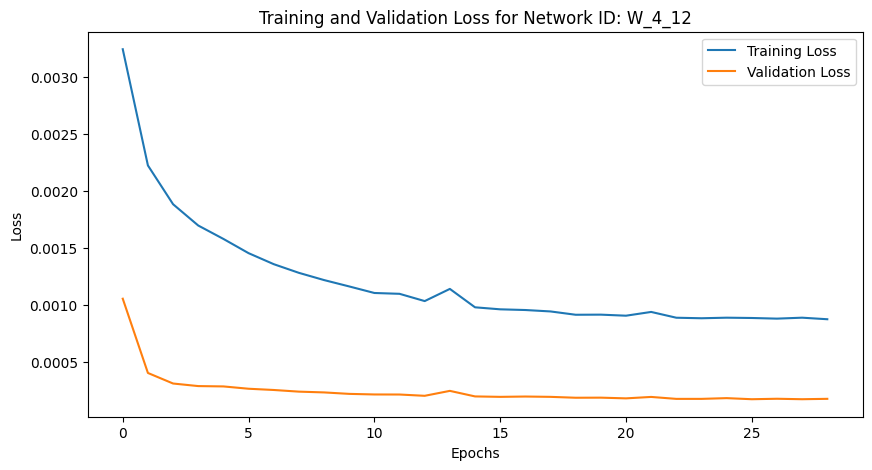

Training Progress:   0%|          | 28/10000 [00:49<4:53:32,  1.77s/epoch, loss=0.000876, val_loss=0.000179, patience=1]


Mean Squared Error: 0.001600527836055579
Iteration: 72, Window Size: 4, Y Days Ahead: 13
X shape: (3791, 4)
y shape: (3791, 13)
Initializing network with layer sizes: [4, 128, 64, 32, 13]
params_W_4_13.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 4), (3032, 13), Validation data shape: (379, 4), (379, 13), Testing data shape: (380, 4), (380, 13)
Parameters loaded from params_W_4_13.npz


Training Progress:   0%|          | 25/10000 [00:43<4:33:20,  1.64s/epoch, loss=0.000942, val_loss=0.000194, patience=1]

Epoch 26/10000, Training Loss: 0.000942, Validation Loss: 0.000194
Early stopping at epoch 26. Best validation loss: 0.000193


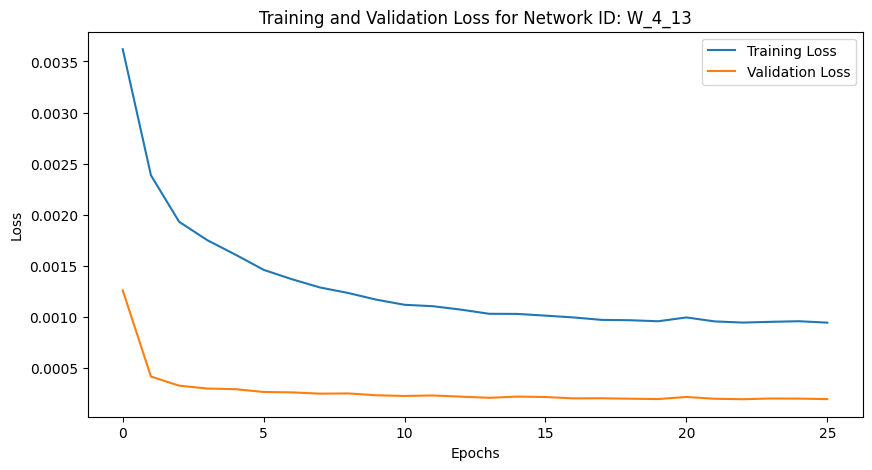

Training Progress:   0%|          | 25/10000 [00:44<4:53:03,  1.76s/epoch, loss=0.000942, val_loss=0.000194, patience=1]


Mean Squared Error: 0.001663589653184276
Iteration: 73, Window Size: 4, Y Days Ahead: 14
X shape: (3790, 4)
y shape: (3790, 14)
Initializing network with layer sizes: [4, 128, 64, 32, 14]
params_W_4_14.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 4), (3032, 14), Validation data shape: (379, 4), (379, 14), Testing data shape: (379, 4), (379, 14)
Parameters loaded from params_W_4_14.npz


Training Progress:   0%|          | 29/10000 [00:53<4:52:42,  1.76s/epoch, loss=0.00102, val_loss=0.000211, patience=1]

Epoch 30/10000, Training Loss: 0.001019, Validation Loss: 0.000211
Early stopping at epoch 30. Best validation loss: 0.000208


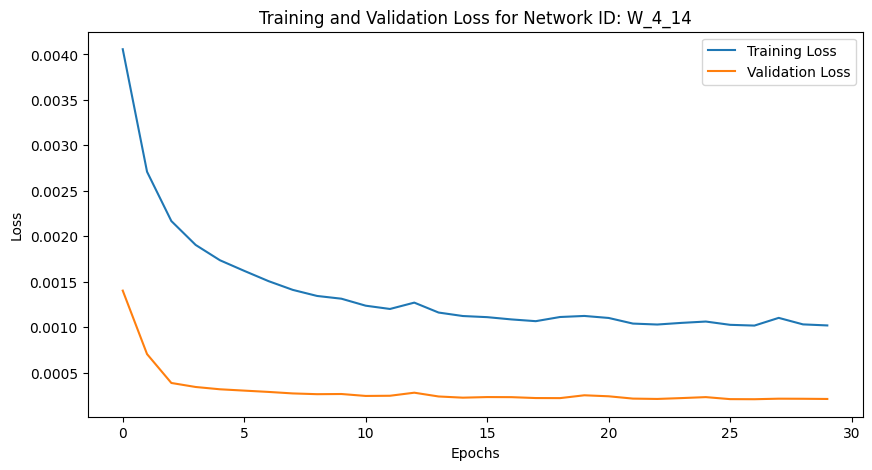

Training Progress:   0%|          | 29/10000 [00:53<5:06:14,  1.84s/epoch, loss=0.00102, val_loss=0.000211, patience=1]


Mean Squared Error: 0.0017586531299501327
Iteration: 74, Window Size: 4, Y Days Ahead: 15
X shape: (3789, 4)
y shape: (3789, 15)
Initializing network with layer sizes: [4, 128, 64, 32, 15]
params_W_4_15.npz not found. Using randomly initialized parameters.
Training data shape: (3031, 4), (3031, 15), Validation data shape: (379, 4), (379, 15), Testing data shape: (379, 4), (379, 15)
Parameters loaded from params_W_4_15.npz


Training Progress:   0%|          | 28/10000 [00:48<4:50:32,  1.75s/epoch, loss=0.00111, val_loss=0.000235, patience=1]

Epoch 29/10000, Training Loss: 0.001105, Validation Loss: 0.000235
Early stopping at epoch 29. Best validation loss: 0.000225


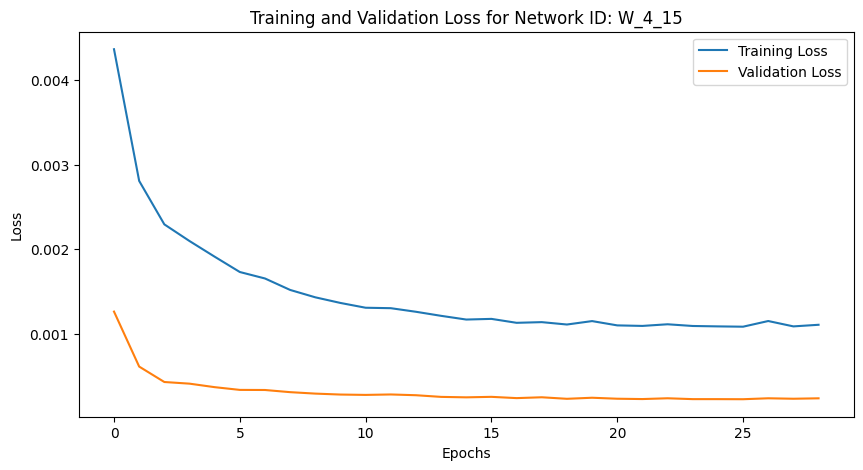

Training Progress:   0%|          | 28/10000 [00:48<4:49:32,  1.74s/epoch, loss=0.00111, val_loss=0.000235, patience=1]


Mean Squared Error: 0.0018989313121966123
Iteration: 75, Window Size: 4, Y Days Ahead: 16
X shape: (3788, 4)
y shape: (3788, 16)
Initializing network with layer sizes: [4, 128, 64, 32, 16]
params_W_4_16.npz not found. Using randomly initialized parameters.
Training data shape: (3030, 4), (3030, 16), Validation data shape: (379, 4), (379, 16), Testing data shape: (379, 4), (379, 16)
Parameters loaded from params_W_4_16.npz


Training Progress:   0%|          | 27/10000 [00:50<4:57:56,  1.79s/epoch, loss=0.00119, val_loss=0.000261, patience=1]

Epoch 28/10000, Training Loss: 0.001192, Validation Loss: 0.000261
Early stopping at epoch 28. Best validation loss: 0.000250


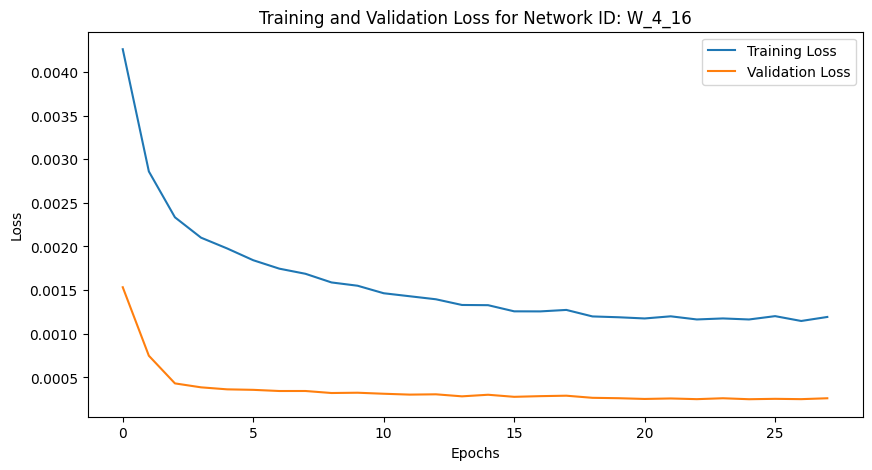

Training Progress:   0%|          | 27/10000 [00:50<5:11:31,  1.87s/epoch, loss=0.00119, val_loss=0.000261, patience=1]


Mean Squared Error: 0.002112752500284449
Iteration: 76, Window Size: 4, Y Days Ahead: 17
X shape: (3787, 4)
y shape: (3787, 17)
Initializing network with layer sizes: [4, 128, 64, 32, 17]
params_W_4_17.npz not found. Using randomly initialized parameters.
Training data shape: (3029, 4), (3029, 17), Validation data shape: (379, 4), (379, 17), Testing data shape: (379, 4), (379, 17)
Parameters loaded from params_W_4_17.npz


Training Progress:   0%|          | 24/10000 [00:43<5:04:33,  1.83s/epoch, loss=0.00124, val_loss=0.00028, patience=1] 

Epoch 25/10000, Training Loss: 0.001242, Validation Loss: 0.000280
Early stopping at epoch 25. Best validation loss: 0.000266


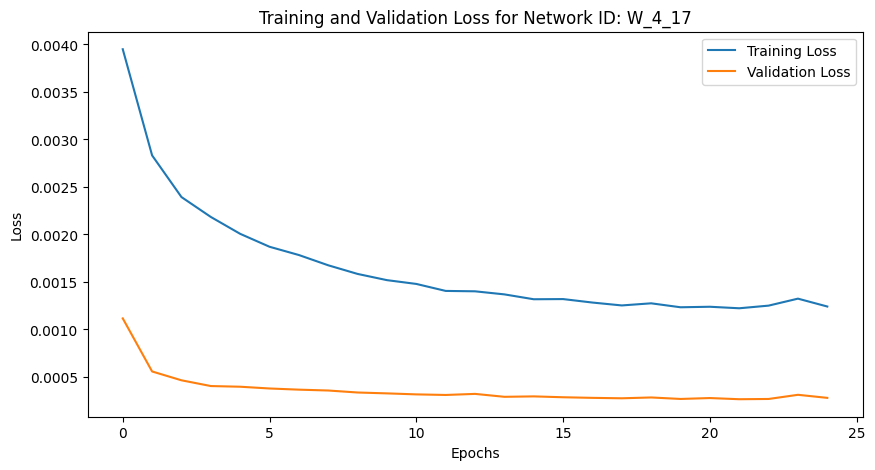

Training Progress:   0%|          | 24/10000 [00:43<5:02:12,  1.82s/epoch, loss=0.00124, val_loss=0.00028, patience=1]


Mean Squared Error: 0.0021652700896107693
Iteration: 77, Window Size: 4, Y Days Ahead: 18
X shape: (3786, 4)
y shape: (3786, 18)
Initializing network with layer sizes: [4, 128, 64, 32, 18]
params_W_4_18.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 4), (3028, 18), Validation data shape: (379, 4), (379, 18), Testing data shape: (379, 4), (379, 18)
Parameters loaded from params_W_4_18.npz


Training Progress:   0%|          | 18/10000 [00:34<5:07:47,  1.85s/epoch, loss=0.00135, val_loss=0.00031, patience=1] 

Epoch 19/10000, Training Loss: 0.001347, Validation Loss: 0.000310
Early stopping at epoch 19. Best validation loss: 0.000303


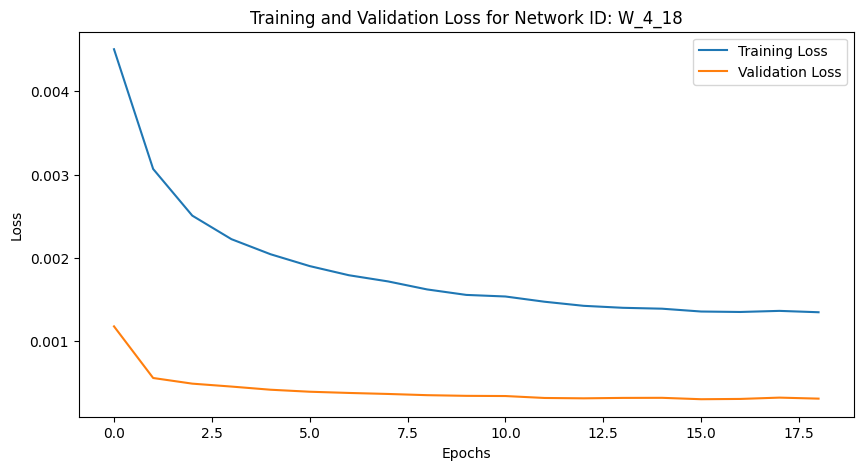

Training Progress:   0%|          | 18/10000 [00:35<5:23:32,  1.94s/epoch, loss=0.00135, val_loss=0.00031, patience=1]


Mean Squared Error: 0.0023696562001984823
Iteration: 78, Window Size: 4, Y Days Ahead: 19
X shape: (3785, 4)
y shape: (3785, 19)
Initializing network with layer sizes: [4, 128, 64, 32, 19]
params_W_4_19.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 4), (3028, 19), Validation data shape: (378, 4), (378, 19), Testing data shape: (379, 4), (379, 19)
Parameters loaded from params_W_4_19.npz


Training Progress:   0%|          | 28/10000 [00:52<4:55:21,  1.78s/epoch, loss=0.00136, val_loss=0.000304, patience=1]

Epoch 29/10000, Training Loss: 0.001365, Validation Loss: 0.000304
Early stopping at epoch 29. Best validation loss: 0.000287


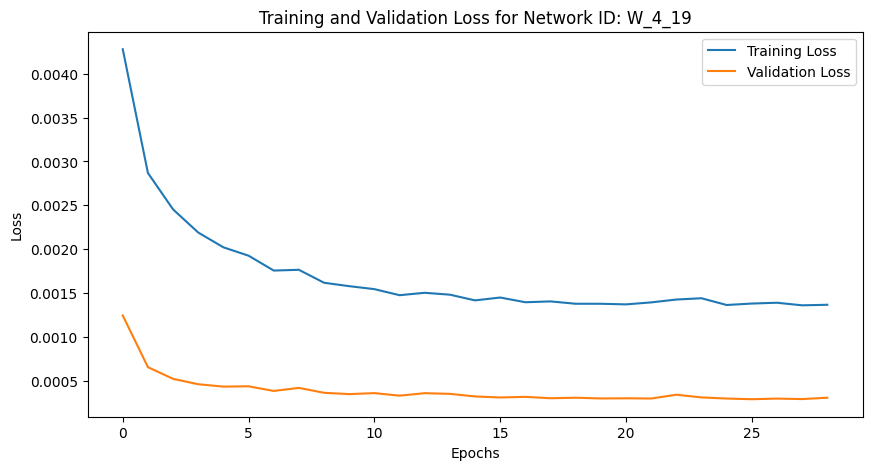

Training Progress:   0%|          | 28/10000 [00:53<5:15:14,  1.90s/epoch, loss=0.00136, val_loss=0.000304, patience=1]


Mean Squared Error: 0.0025873944515776353
Iteration: 79, Window Size: 4, Y Days Ahead: 20
X shape: (3784, 4)
y shape: (3784, 20)
Initializing network with layer sizes: [4, 128, 64, 32, 20]
params_W_4_20.npz not found. Using randomly initialized parameters.
Training data shape: (3027, 4), (3027, 20), Validation data shape: (378, 4), (378, 20), Testing data shape: (379, 4), (379, 20)
Parameters loaded from params_W_4_20.npz


Training Progress:   0%|          | 23/10000 [00:42<4:53:41,  1.77s/epoch, loss=0.00145, val_loss=0.000318, patience=1]

Epoch 24/10000, Training Loss: 0.001446, Validation Loss: 0.000318
Early stopping at epoch 24. Best validation loss: 0.000316


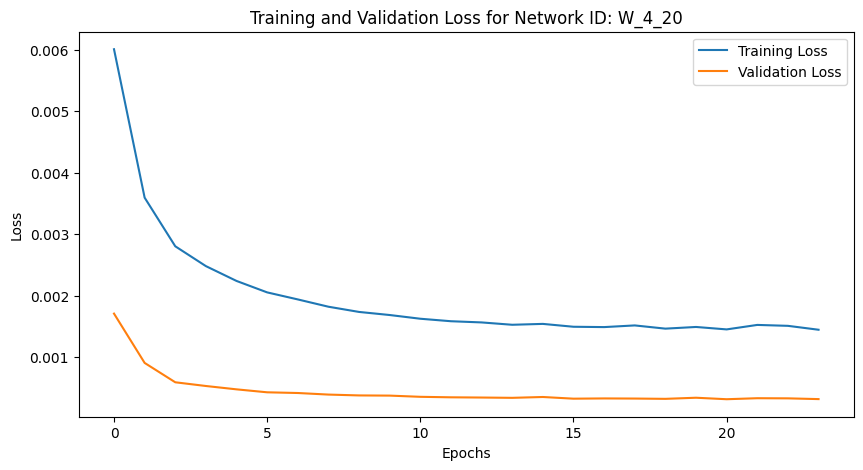

Training Progress:   0%|          | 23/10000 [00:42<5:10:01,  1.86s/epoch, loss=0.00145, val_loss=0.000318, patience=1]


Mean Squared Error: 0.0025778661259616958
Iteration: 80, Window Size: 5, Y Days Ahead: 1
X shape: (3802, 5)
y shape: (3802, 1)
Initializing network with layer sizes: [5, 128, 64, 32, 1]
params_W_5_1.npz not found. Using randomly initialized parameters.
Training data shape: (3041, 5), (3041, 1), Validation data shape: (380, 5), (380, 1), Testing data shape: (381, 5), (381, 1)
Parameters loaded from params_W_5_1.npz


Training Progress:   0%|          | 8/10000 [00:15<4:50:02,  1.74s/epoch, loss=0.000205, val_loss=4.98e-5, patience=1]

Epoch 9/10000, Training Loss: 0.000205, Validation Loss: 0.000050
Early stopping at epoch 9. Best validation loss: 0.000045


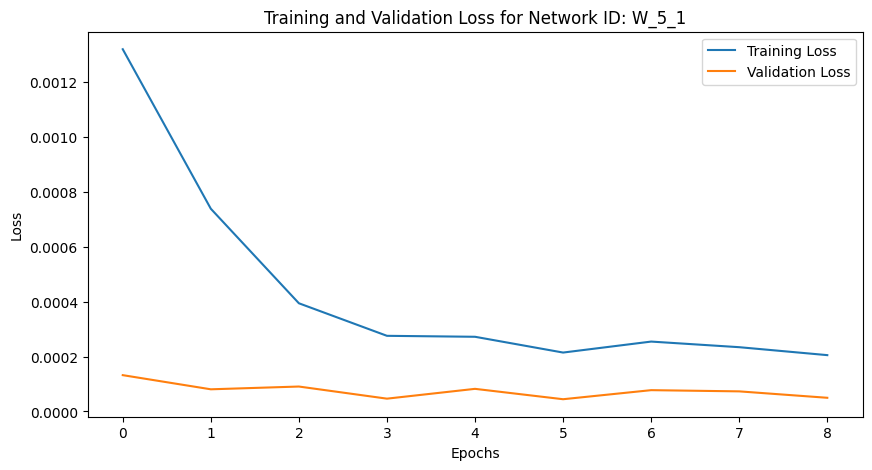

Training Progress:   0%|          | 8/10000 [00:16<5:36:39,  2.02s/epoch, loss=0.000205, val_loss=4.98e-5, patience=1]


Mean Squared Error: 0.0004014398839892997
Iteration: 81, Window Size: 5, Y Days Ahead: 2
X shape: (3801, 5)
y shape: (3801, 2)
Initializing network with layer sizes: [5, 128, 64, 32, 2]
params_W_5_2.npz not found. Using randomly initialized parameters.
Training data shape: (3040, 5), (3040, 2), Validation data shape: (380, 5), (380, 2), Testing data shape: (381, 5), (381, 2)
Parameters loaded from params_W_5_2.npz


Training Progress:   0%|          | 14/10000 [00:27<4:52:22,  1.76s/epoch, loss=0.000233, val_loss=4.93e-5, patience=1]

Epoch 15/10000, Training Loss: 0.000233, Validation Loss: 0.000049
Early stopping at epoch 15. Best validation loss: 0.000043


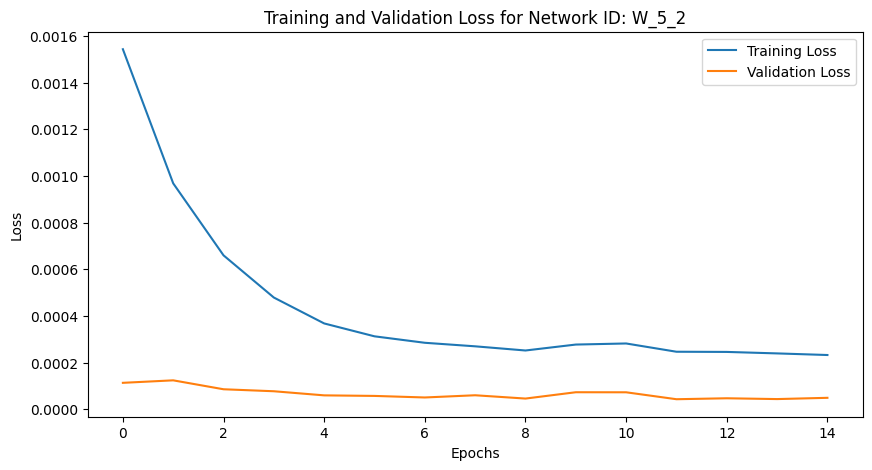

Training Progress:   0%|          | 14/10000 [00:27<5:25:39,  1.96s/epoch, loss=0.000233, val_loss=4.93e-5, patience=1]


Mean Squared Error: 0.00044180961940831857
Iteration: 82, Window Size: 5, Y Days Ahead: 3
X shape: (3800, 5)
y shape: (3800, 3)
Initializing network with layer sizes: [5, 128, 64, 32, 3]
params_W_5_3.npz not found. Using randomly initialized parameters.
Training data shape: (3040, 5), (3040, 3), Validation data shape: (380, 5), (380, 3), Testing data shape: (380, 5), (380, 3)
Parameters loaded from params_W_5_3.npz


Training Progress:   0%|          | 28/10000 [00:51<5:03:39,  1.83s/epoch, loss=0.000291, val_loss=5.82e-5, patience=1]

Epoch 29/10000, Training Loss: 0.000291, Validation Loss: 0.000058
Early stopping at epoch 29. Best validation loss: 0.000056


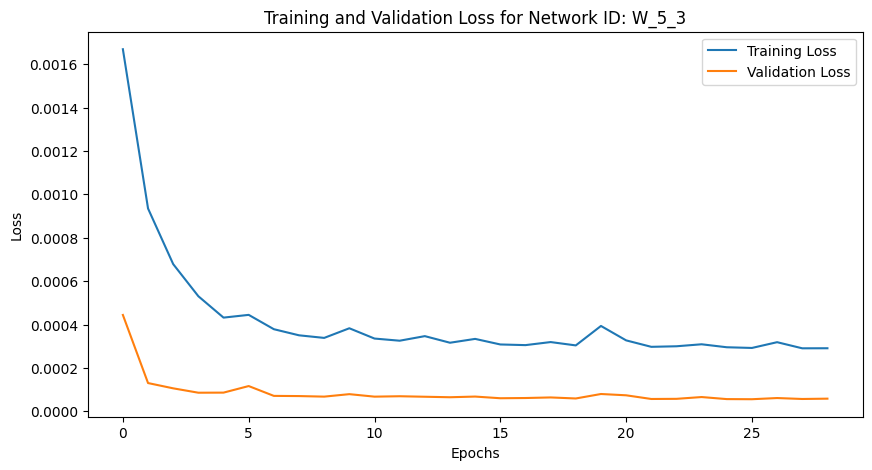

Training Progress:   0%|          | 28/10000 [00:51<5:07:43,  1.85s/epoch, loss=0.000291, val_loss=5.82e-5, patience=1]


Mean Squared Error: 0.0005350210053006741
Iteration: 83, Window Size: 5, Y Days Ahead: 4
X shape: (3799, 5)
y shape: (3799, 4)
Initializing network with layer sizes: [5, 128, 64, 32, 4]
params_W_5_4.npz not found. Using randomly initialized parameters.
Training data shape: (3039, 5), (3039, 4), Validation data shape: (380, 5), (380, 4), Testing data shape: (380, 5), (380, 4)
Parameters loaded from params_W_5_4.npz


Training Progress:   0%|          | 14/10000 [00:27<5:01:14,  1.81s/epoch, loss=0.000386, val_loss=7.45e-5, patience=1]

Epoch 15/10000, Training Loss: 0.000386, Validation Loss: 0.000075
Early stopping at epoch 15. Best validation loss: 0.000071


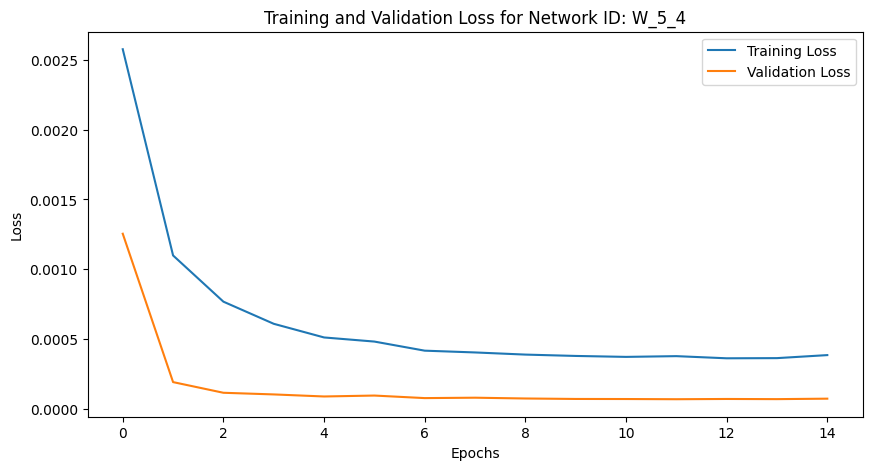

Training Progress:   0%|          | 14/10000 [00:27<5:27:39,  1.97s/epoch, loss=0.000386, val_loss=7.45e-5, patience=1]


Mean Squared Error: 0.000659676117677515
Iteration: 84, Window Size: 5, Y Days Ahead: 5
X shape: (3798, 5)
y shape: (3798, 5)
Initializing network with layer sizes: [5, 128, 64, 32, 5]
params_W_5_5.npz not found. Using randomly initialized parameters.
Training data shape: (3038, 5), (3038, 5), Validation data shape: (380, 5), (380, 5), Testing data shape: (380, 5), (380, 5)
Parameters loaded from params_W_5_5.npz


Training Progress:   0%|          | 15/10000 [00:29<4:56:30,  1.78s/epoch, loss=0.000476, val_loss=0.000103, patience=1]

Epoch 16/10000, Training Loss: 0.000476, Validation Loss: 0.000103
Early stopping at epoch 16. Best validation loss: 0.000083


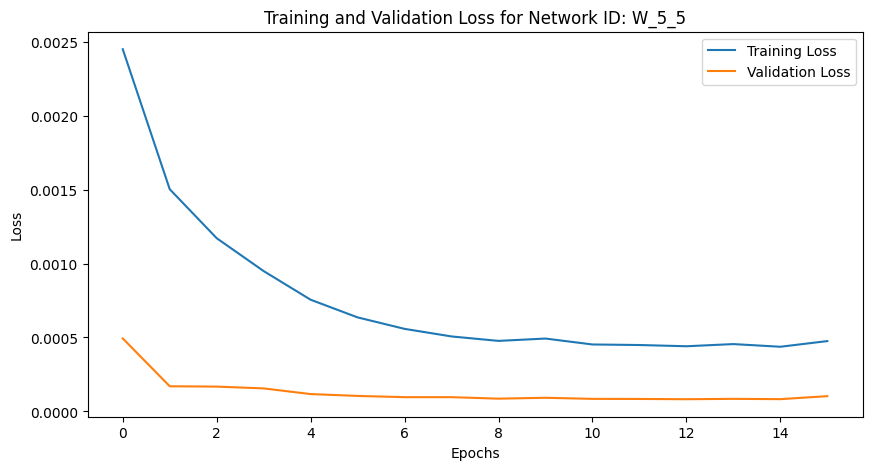

Training Progress:   0%|          | 15/10000 [00:29<5:24:42,  1.95s/epoch, loss=0.000476, val_loss=0.000103, patience=1]


Mean Squared Error: 0.0007460387462049021
Iteration: 85, Window Size: 5, Y Days Ahead: 6
X shape: (3797, 5)
y shape: (3797, 6)
Initializing network with layer sizes: [5, 128, 64, 32, 6]
params_W_5_6.npz not found. Using randomly initialized parameters.
Training data shape: (3037, 5), (3037, 6), Validation data shape: (380, 5), (380, 6), Testing data shape: (380, 5), (380, 6)
Parameters loaded from params_W_5_6.npz


Training Progress:   0%|          | 13/10000 [00:24<4:48:23,  1.73s/epoch, loss=0.000554, val_loss=0.000114, patience=1]

Epoch 14/10000, Training Loss: 0.000554, Validation Loss: 0.000114
Early stopping at epoch 14. Best validation loss: 0.000103


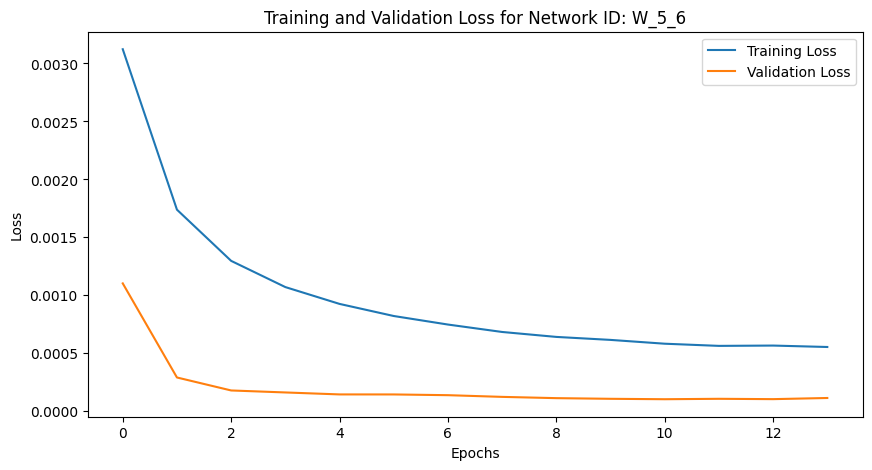

Training Progress:   0%|          | 13/10000 [00:24<5:18:55,  1.92s/epoch, loss=0.000554, val_loss=0.000114, patience=1]


Mean Squared Error: 0.0008492441109448368
Iteration: 86, Window Size: 5, Y Days Ahead: 7
X shape: (3796, 5)
y shape: (3796, 7)
Initializing network with layer sizes: [5, 128, 64, 32, 7]
params_W_5_7.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 5), (3036, 7), Validation data shape: (380, 5), (380, 7), Testing data shape: (380, 5), (380, 7)
Parameters loaded from params_W_5_7.npz


Training Progress:   0%|          | 13/10000 [00:23<4:10:03,  1.50s/epoch, loss=0.000632, val_loss=0.000123, patience=1]

Epoch 14/10000, Training Loss: 0.000632, Validation Loss: 0.000123
Early stopping at epoch 14. Best validation loss: 0.000114


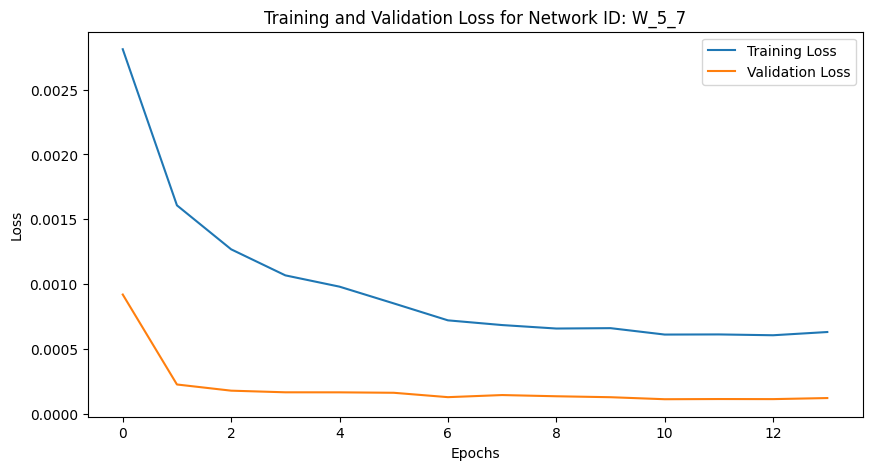

Training Progress:   0%|          | 13/10000 [00:23<4:58:17,  1.79s/epoch, loss=0.000632, val_loss=0.000123, patience=1]


Mean Squared Error: 0.0009634762833273125
Iteration: 87, Window Size: 5, Y Days Ahead: 8
X shape: (3795, 5)
y shape: (3795, 8)
Initializing network with layer sizes: [5, 128, 64, 32, 8]
params_W_5_8.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 5), (3036, 8), Validation data shape: (379, 5), (379, 8), Testing data shape: (380, 5), (380, 8)
Parameters loaded from params_W_5_8.npz


Training Progress:   0%|          | 20/10000 [00:38<5:11:43,  1.87s/epoch, loss=0.000636, val_loss=0.000122, patience=1]

Epoch 21/10000, Training Loss: 0.000636, Validation Loss: 0.000122
Early stopping at epoch 21. Best validation loss: 0.000119


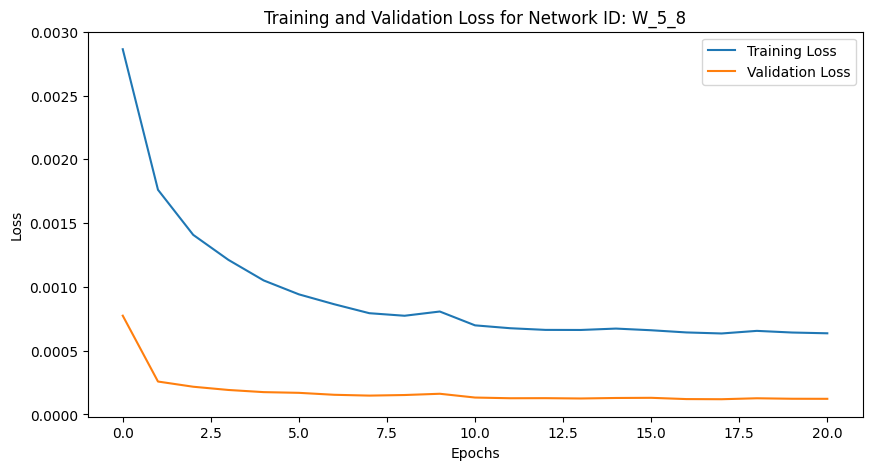

Training Progress:   0%|          | 20/10000 [00:38<5:21:38,  1.93s/epoch, loss=0.000636, val_loss=0.000122, patience=1]


Mean Squared Error: 0.001121026993573517
Iteration: 88, Window Size: 5, Y Days Ahead: 9
X shape: (3794, 5)
y shape: (3794, 9)
Initializing network with layer sizes: [5, 128, 64, 32, 9]
params_W_5_9.npz not found. Using randomly initialized parameters.
Training data shape: (3035, 5), (3035, 9), Validation data shape: (379, 5), (379, 9), Testing data shape: (380, 5), (380, 9)
Parameters loaded from params_W_5_9.npz


Training Progress:   0%|          | 21/10000 [00:40<5:05:01,  1.83s/epoch, loss=0.000708, val_loss=0.000137, patience=1]

Epoch 22/10000, Training Loss: 0.000708, Validation Loss: 0.000137
Early stopping at epoch 22. Best validation loss: 0.000136


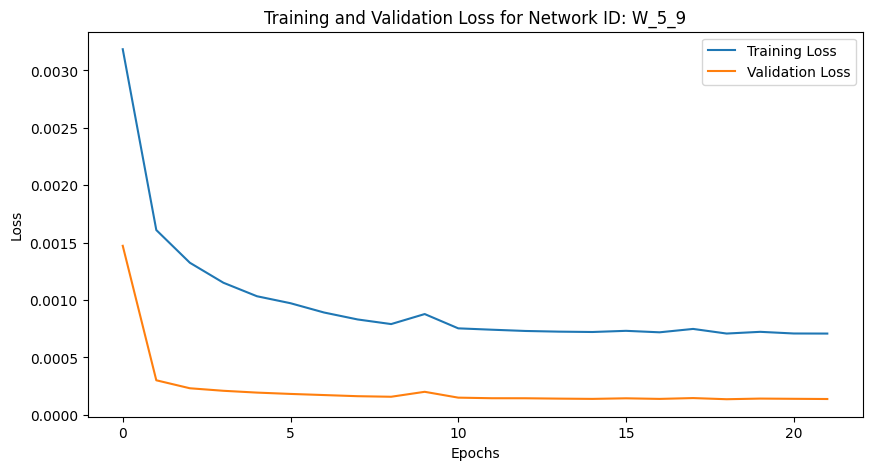

Training Progress:   0%|          | 21/10000 [00:41<5:25:27,  1.96s/epoch, loss=0.000708, val_loss=0.000137, patience=1]


Mean Squared Error: 0.0011710365463537256
Iteration: 89, Window Size: 5, Y Days Ahead: 10
X shape: (3793, 5)
y shape: (3793, 10)
Initializing network with layer sizes: [5, 128, 64, 32, 10]
params_W_5_10.npz not found. Using randomly initialized parameters.
Training data shape: (3034, 5), (3034, 10), Validation data shape: (379, 5), (379, 10), Testing data shape: (380, 5), (380, 10)
Parameters loaded from params_W_5_10.npz


Training Progress:   0%|          | 18/10000 [00:34<4:52:13,  1.76s/epoch, loss=0.000809, val_loss=0.000157, patience=1]

Epoch 19/10000, Training Loss: 0.000809, Validation Loss: 0.000157
Early stopping at epoch 19. Best validation loss: 0.000152


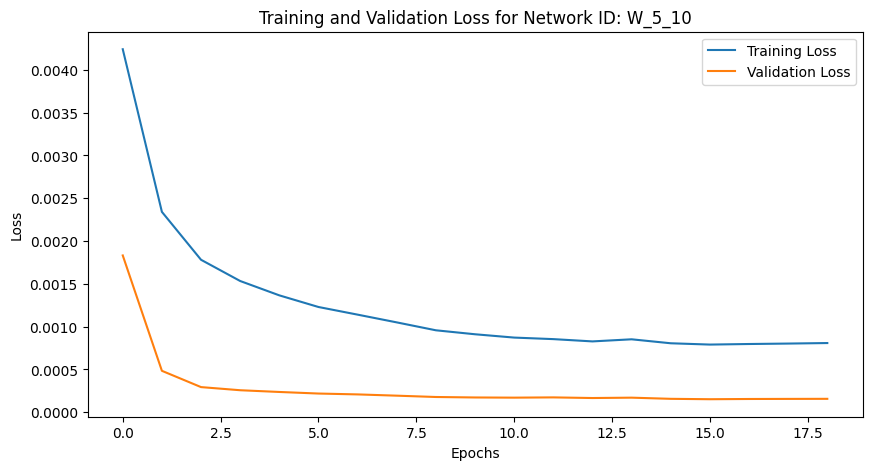

Training Progress:   0%|          | 18/10000 [00:34<5:17:09,  1.91s/epoch, loss=0.000809, val_loss=0.000157, patience=1]


Mean Squared Error: 0.0013091370679838487
Iteration: 90, Window Size: 5, Y Days Ahead: 11
X shape: (3792, 5)
y shape: (3792, 11)
Initializing network with layer sizes: [5, 128, 64, 32, 11]
params_W_5_11.npz not found. Using randomly initialized parameters.
Training data shape: (3033, 5), (3033, 11), Validation data shape: (379, 5), (379, 11), Testing data shape: (380, 5), (380, 11)
Parameters loaded from params_W_5_11.npz


Training Progress:   0%|          | 20/10000 [00:38<4:59:14,  1.80s/epoch, loss=0.000915, val_loss=0.000196, patience=1]

Epoch 21/10000, Training Loss: 0.000915, Validation Loss: 0.000196
Early stopping at epoch 21. Best validation loss: 0.000163


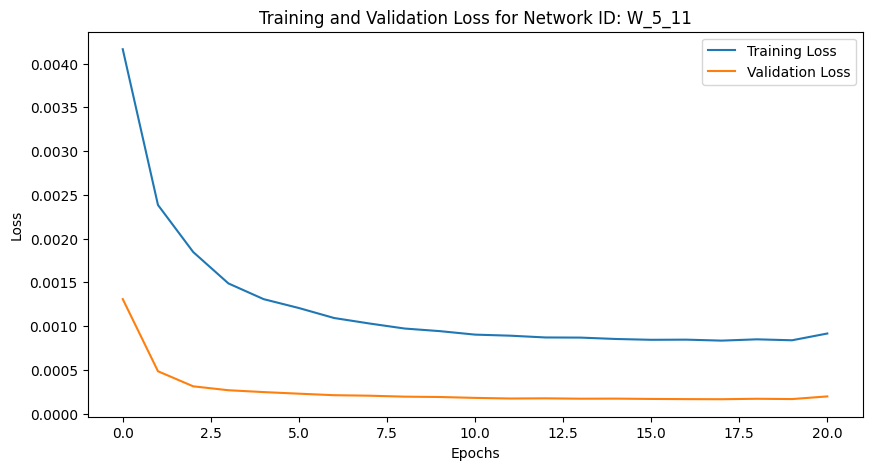

Training Progress:   0%|          | 20/10000 [00:38<5:19:36,  1.92s/epoch, loss=0.000915, val_loss=0.000196, patience=1]


Mean Squared Error: 0.0014352255046775563
Iteration: 91, Window Size: 5, Y Days Ahead: 12
X shape: (3791, 5)
y shape: (3791, 12)
Initializing network with layer sizes: [5, 128, 64, 32, 12]
params_W_5_12.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 5), (3032, 12), Validation data shape: (379, 5), (379, 12), Testing data shape: (380, 5), (380, 12)
Parameters loaded from params_W_5_12.npz


Training Progress:   0%|          | 27/10000 [00:50<5:08:53,  1.86s/epoch, loss=0.0009, val_loss=0.000177, patience=1]  

Epoch 28/10000, Training Loss: 0.000900, Validation Loss: 0.000177
Early stopping at epoch 28. Best validation loss: 0.000174


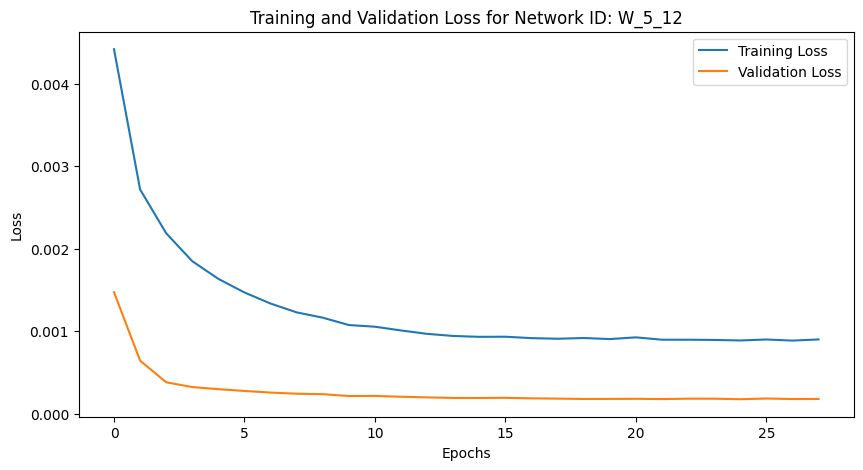

Training Progress:   0%|          | 27/10000 [00:50<5:13:56,  1.89s/epoch, loss=0.0009, val_loss=0.000177, patience=1]


Mean Squared Error: 0.001567850557188076
Iteration: 92, Window Size: 5, Y Days Ahead: 13
X shape: (3790, 5)
y shape: (3790, 13)
Initializing network with layer sizes: [5, 128, 64, 32, 13]
params_W_5_13.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 5), (3032, 13), Validation data shape: (379, 5), (379, 13), Testing data shape: (379, 5), (379, 13)
Parameters loaded from params_W_5_13.npz


Training Progress:   0%|          | 17/10000 [00:33<4:56:29,  1.78s/epoch, loss=0.000971, val_loss=0.000194, patience=1]

Epoch 18/10000, Training Loss: 0.000971, Validation Loss: 0.000194
Early stopping at epoch 18. Best validation loss: 0.000193


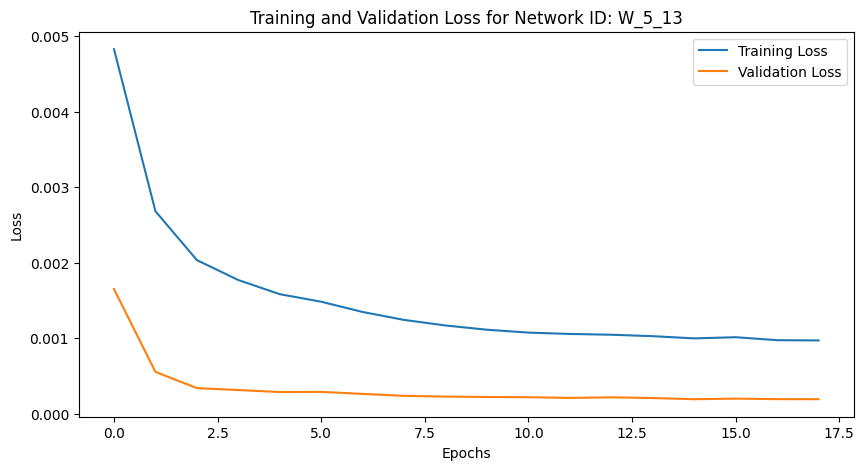

Training Progress:   0%|          | 17/10000 [00:33<5:30:34,  1.99s/epoch, loss=0.000971, val_loss=0.000194, patience=1]


Mean Squared Error: 0.00173835018190217
Iteration: 93, Window Size: 5, Y Days Ahead: 14
X shape: (3789, 5)
y shape: (3789, 14)
Initializing network with layer sizes: [5, 128, 64, 32, 14]
params_W_5_14.npz not found. Using randomly initialized parameters.
Training data shape: (3031, 5), (3031, 14), Validation data shape: (379, 5), (379, 14), Testing data shape: (379, 5), (379, 14)
Parameters loaded from params_W_5_14.npz


Training Progress:   0%|          | 19/10000 [00:36<4:56:56,  1.79s/epoch, loss=0.00112, val_loss=0.00023, patience=1] 

Epoch 20/10000, Training Loss: 0.001122, Validation Loss: 0.000230
Early stopping at epoch 20. Best validation loss: 0.000218


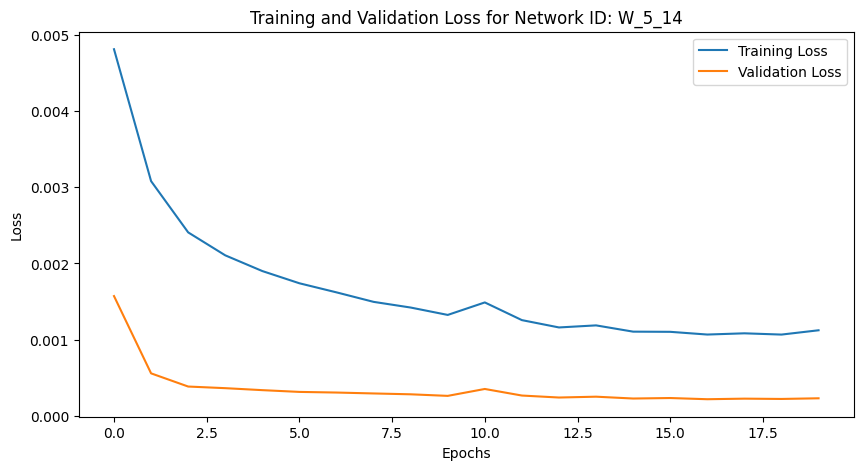

Training Progress:   0%|          | 19/10000 [00:36<5:21:05,  1.93s/epoch, loss=0.00112, val_loss=0.00023, patience=1]


Mean Squared Error: 0.0018284018091562007
Iteration: 94, Window Size: 5, Y Days Ahead: 15
X shape: (3788, 5)
y shape: (3788, 15)
Initializing network with layer sizes: [5, 128, 64, 32, 15]
params_W_5_15.npz not found. Using randomly initialized parameters.
Training data shape: (3030, 5), (3030, 15), Validation data shape: (379, 5), (379, 15), Testing data shape: (379, 5), (379, 15)
Parameters loaded from params_W_5_15.npz


Training Progress:   0%|          | 28/10000 [00:52<4:47:02,  1.73s/epoch, loss=0.00112, val_loss=0.000244, patience=1]

Epoch 29/10000, Training Loss: 0.001125, Validation Loss: 0.000244
Early stopping at epoch 29. Best validation loss: 0.000221


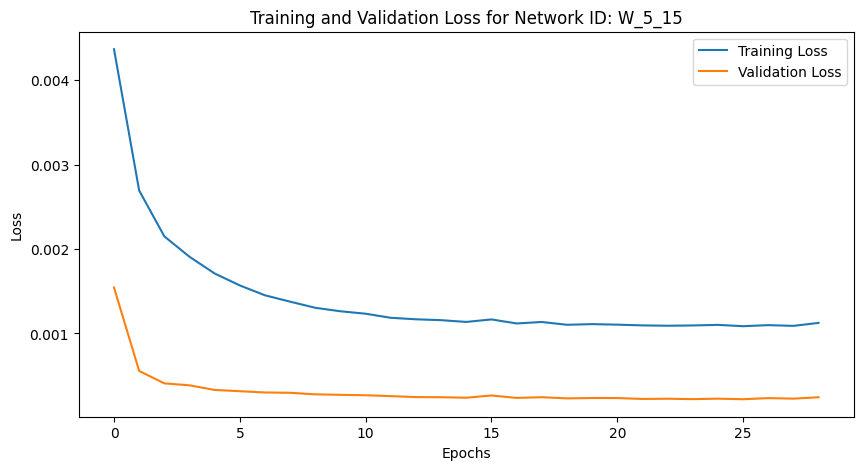

Training Progress:   0%|          | 28/10000 [00:52<5:10:03,  1.87s/epoch, loss=0.00112, val_loss=0.000244, patience=1]


Mean Squared Error: 0.0019229459765445192
Iteration: 95, Window Size: 5, Y Days Ahead: 16
X shape: (3787, 5)
y shape: (3787, 16)
Initializing network with layer sizes: [5, 128, 64, 32, 16]
params_W_5_16.npz not found. Using randomly initialized parameters.
Training data shape: (3029, 5), (3029, 16), Validation data shape: (379, 5), (379, 16), Testing data shape: (379, 5), (379, 16)
Parameters loaded from params_W_5_16.npz


Training Progress:   0%|          | 26/10000 [00:49<5:01:22,  1.81s/epoch, loss=0.00116, val_loss=0.000247, patience=1]

Epoch 27/10000, Training Loss: 0.001161, Validation Loss: 0.000247
Early stopping at epoch 27. Best validation loss: 0.000240


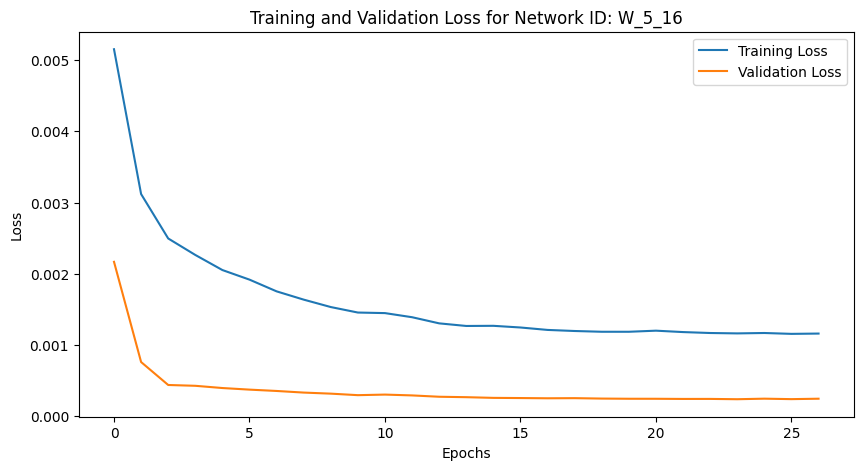

Training Progress:   0%|          | 26/10000 [00:49<5:16:39,  1.90s/epoch, loss=0.00116, val_loss=0.000247, patience=1]


Mean Squared Error: 0.0020783203208837326
Iteration: 96, Window Size: 5, Y Days Ahead: 17
X shape: (3786, 5)
y shape: (3786, 17)
Initializing network with layer sizes: [5, 128, 64, 32, 17]
params_W_5_17.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 5), (3028, 17), Validation data shape: (379, 5), (379, 17), Testing data shape: (379, 5), (379, 17)
Parameters loaded from params_W_5_17.npz


Training Progress:   0%|          | 28/10000 [00:55<5:07:07,  1.85s/epoch, loss=0.00127, val_loss=0.000289, patience=1]

Epoch 29/10000, Training Loss: 0.001266, Validation Loss: 0.000289
Early stopping at epoch 29. Best validation loss: 0.000259


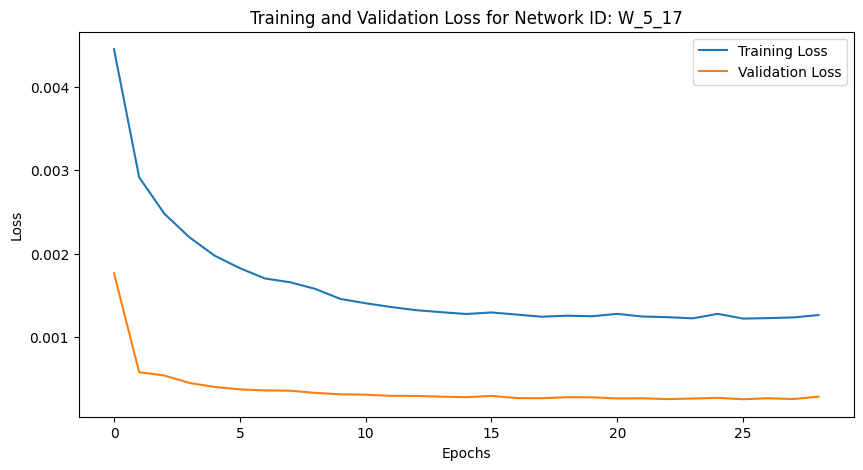

Training Progress:   0%|          | 28/10000 [00:55<5:28:29,  1.98s/epoch, loss=0.00127, val_loss=0.000289, patience=1]


Mean Squared Error: 0.0021834440714717505
Iteration: 97, Window Size: 5, Y Days Ahead: 18
X shape: (3785, 5)
y shape: (3785, 18)
Initializing network with layer sizes: [5, 128, 64, 32, 18]
params_W_5_18.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 5), (3028, 18), Validation data shape: (378, 5), (378, 18), Testing data shape: (379, 5), (379, 18)
Parameters loaded from params_W_5_18.npz


Training Progress:   0%|          | 24/10000 [00:45<5:06:48,  1.85s/epoch, loss=0.0013, val_loss=0.000276, patience=1] 

Epoch 25/10000, Training Loss: 0.001296, Validation Loss: 0.000276
Early stopping at epoch 25. Best validation loss: 0.000274


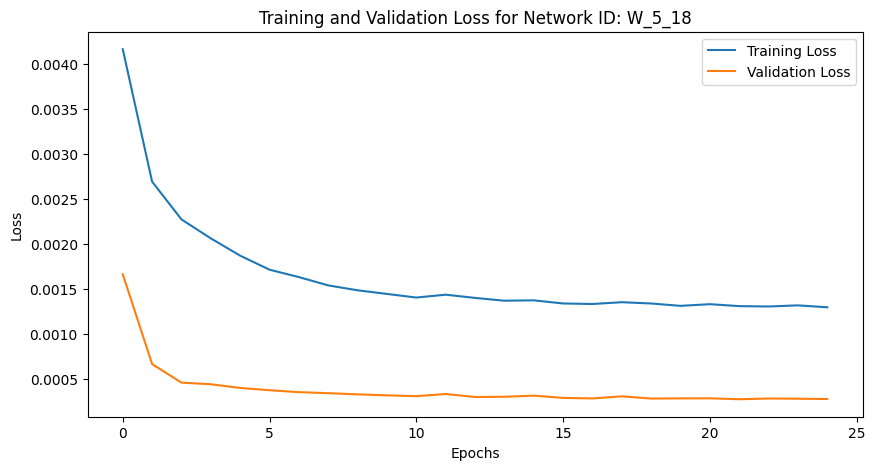

Training Progress:   0%|          | 24/10000 [00:46<5:18:45,  1.92s/epoch, loss=0.0013, val_loss=0.000276, patience=1]


Mean Squared Error: 0.0023842479717339805
Iteration: 98, Window Size: 5, Y Days Ahead: 19
X shape: (3784, 5)
y shape: (3784, 19)
Initializing network with layer sizes: [5, 128, 64, 32, 19]
params_W_5_19.npz not found. Using randomly initialized parameters.
Training data shape: (3027, 5), (3027, 19), Validation data shape: (378, 5), (378, 19), Testing data shape: (379, 5), (379, 19)
Parameters loaded from params_W_5_19.npz


Training Progress:   0%|          | 20/10000 [00:38<4:58:47,  1.80s/epoch, loss=0.00147, val_loss=0.000339, patience=1]

Epoch 21/10000, Training Loss: 0.001467, Validation Loss: 0.000339
Early stopping at epoch 21. Best validation loss: 0.000294


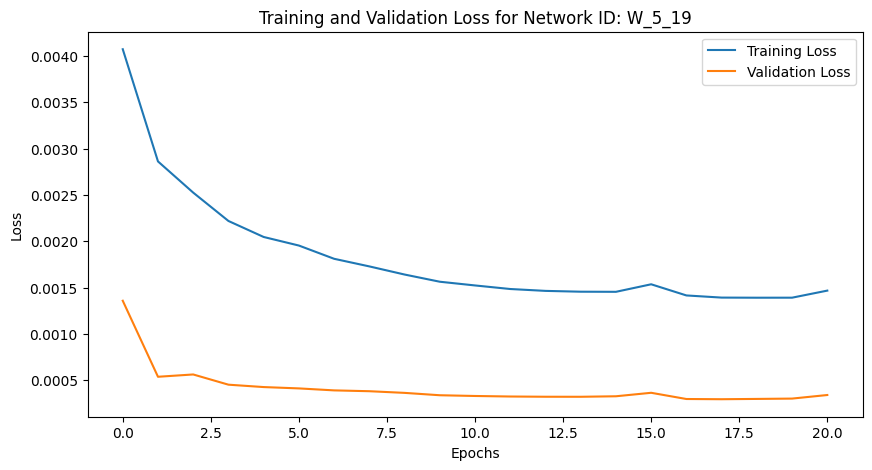

Training Progress:   0%|          | 20/10000 [00:38<5:20:35,  1.93s/epoch, loss=0.00147, val_loss=0.000339, patience=1]


Mean Squared Error: 0.0025031917691173355
Iteration: 99, Window Size: 5, Y Days Ahead: 20
X shape: (3783, 5)
y shape: (3783, 20)
Initializing network with layer sizes: [5, 128, 64, 32, 20]
params_W_5_20.npz not found. Using randomly initialized parameters.
Training data shape: (3026, 5), (3026, 20), Validation data shape: (378, 5), (378, 20), Testing data shape: (379, 5), (379, 20)
Parameters loaded from params_W_5_20.npz


Training Progress:   0%|          | 24/10000 [00:45<5:02:05,  1.82s/epoch, loss=0.00147, val_loss=0.000315, patience=1]

Epoch 25/10000, Training Loss: 0.001470, Validation Loss: 0.000315
Early stopping at epoch 25. Best validation loss: 0.000310


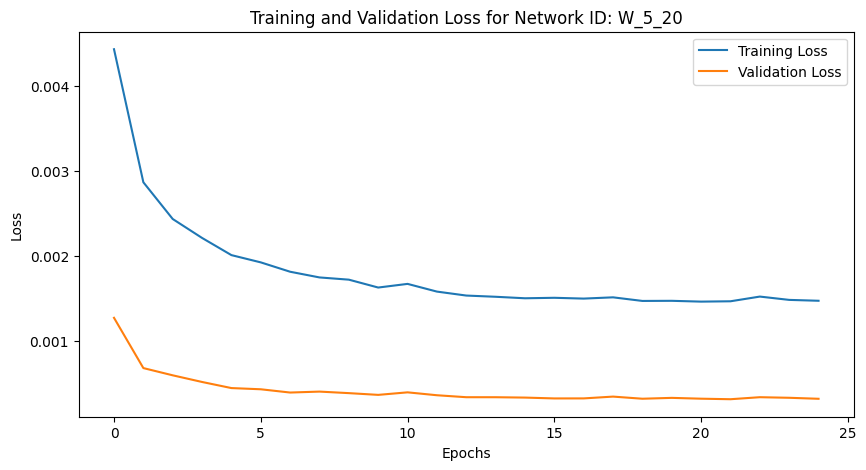

Training Progress:   0%|          | 24/10000 [00:45<5:18:34,  1.92s/epoch, loss=0.00147, val_loss=0.000315, patience=1]


Mean Squared Error: 0.0026939965366987494
Iteration: 100, Window Size: 6, Y Days Ahead: 1
X shape: (3801, 6)
y shape: (3801, 1)
Initializing network with layer sizes: [6, 128, 64, 32, 1]
params_W_6_1.npz not found. Using randomly initialized parameters.
Training data shape: (3040, 6), (3040, 1), Validation data shape: (380, 6), (380, 1), Testing data shape: (381, 6), (381, 1)
Parameters loaded from params_W_6_1.npz


Training Progress:   0%|          | 17/10000 [00:32<4:54:37,  1.77s/epoch, loss=0.000154, val_loss=3.14e-5, patience=1] 

Epoch 18/10000, Training Loss: 0.000154, Validation Loss: 0.000031
Early stopping at epoch 18. Best validation loss: 0.000030


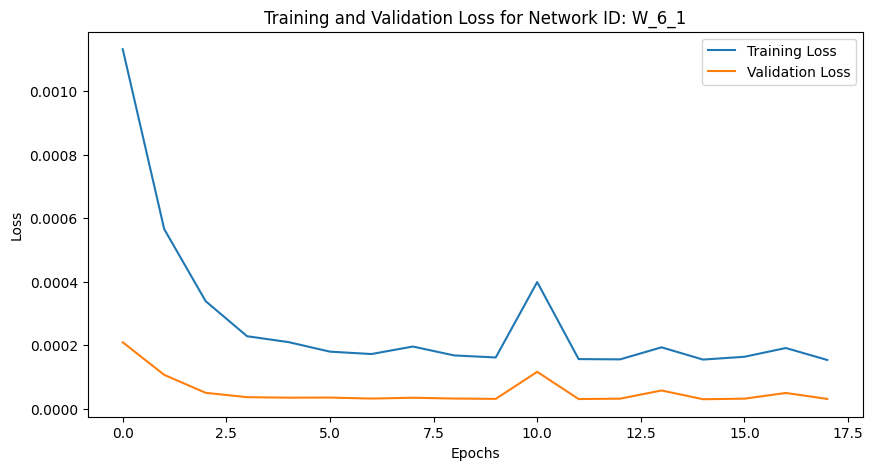

Training Progress:   0%|          | 17/10000 [00:32<5:21:06,  1.93s/epoch, loss=0.000154, val_loss=3.14e-5, patience=1]


Mean Squared Error: 0.00034318826157582103
Iteration: 101, Window Size: 6, Y Days Ahead: 2
X shape: (3800, 6)
y shape: (3800, 2)
Initializing network with layer sizes: [6, 128, 64, 32, 2]
params_W_6_2.npz not found. Using randomly initialized parameters.
Training data shape: (3040, 6), (3040, 2), Validation data shape: (380, 6), (380, 2), Testing data shape: (380, 6), (380, 2)
Parameters loaded from params_W_6_2.npz


Training Progress:   0%|          | 14/10000 [00:26<4:55:37,  1.78s/epoch, loss=0.00023, val_loss=4.34e-5, patience=1] 

Epoch 15/10000, Training Loss: 0.000230, Validation Loss: 0.000043
Early stopping at epoch 15. Best validation loss: 0.000043


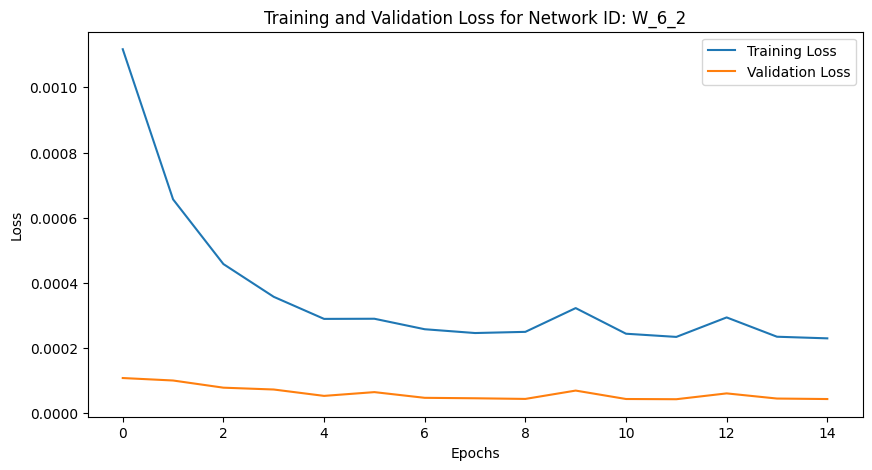

Training Progress:   0%|          | 14/10000 [00:26<5:15:09,  1.89s/epoch, loss=0.00023, val_loss=4.34e-5, patience=1]


Mean Squared Error: 0.0004637729722427506
Iteration: 102, Window Size: 6, Y Days Ahead: 3
X shape: (3799, 6)
y shape: (3799, 3)
Initializing network with layer sizes: [6, 128, 64, 32, 3]
params_W_6_3.npz not found. Using randomly initialized parameters.
Training data shape: (3039, 6), (3039, 3), Validation data shape: (380, 6), (380, 3), Testing data shape: (380, 6), (380, 3)
Parameters loaded from params_W_6_3.npz


Training Progress:   0%|          | 12/10000 [00:23<4:48:44,  1.73s/epoch, loss=0.000324, val_loss=6.55e-5, patience=1]

Epoch 13/10000, Training Loss: 0.000324, Validation Loss: 0.000066
Early stopping at epoch 13. Best validation loss: 0.000059


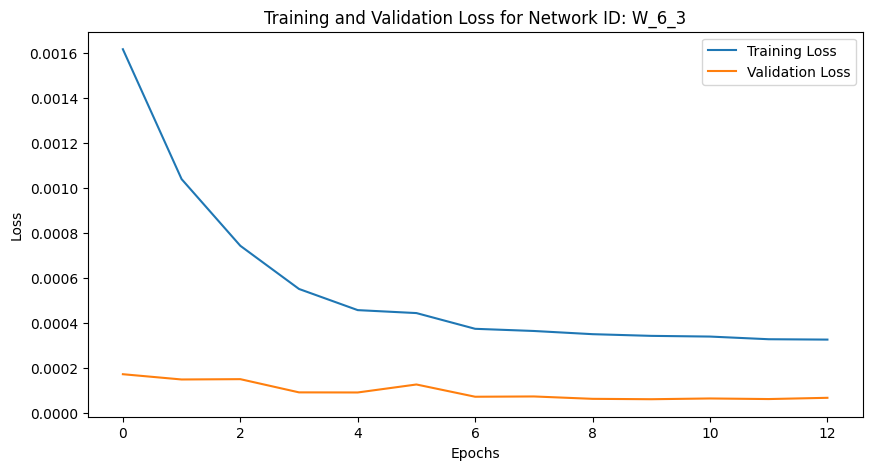

Training Progress:   0%|          | 12/10000 [00:23<5:32:27,  2.00s/epoch, loss=0.000324, val_loss=6.55e-5, patience=1]


Mean Squared Error: 0.0005577603582374863
Iteration: 103, Window Size: 6, Y Days Ahead: 4
X shape: (3798, 6)
y shape: (3798, 4)
Initializing network with layer sizes: [6, 128, 64, 32, 4]
params_W_6_4.npz not found. Using randomly initialized parameters.
Training data shape: (3038, 6), (3038, 4), Validation data shape: (380, 6), (380, 4), Testing data shape: (380, 6), (380, 4)
Parameters loaded from params_W_6_4.npz


Training Progress:   0%|          | 27/10000 [00:48<4:53:54,  1.77s/epoch, loss=0.000371, val_loss=7.26e-5, patience=1]

Epoch 28/10000, Training Loss: 0.000371, Validation Loss: 0.000073
Early stopping at epoch 28. Best validation loss: 0.000065


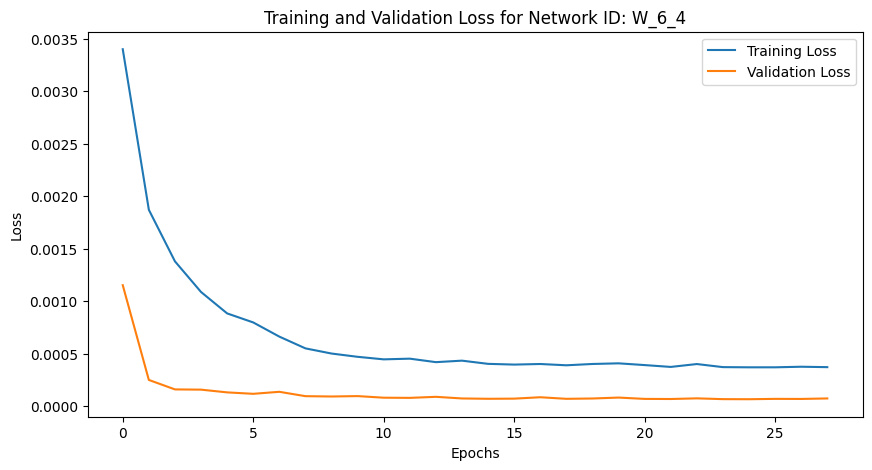

Training Progress:   0%|          | 27/10000 [00:49<5:02:37,  1.82s/epoch, loss=0.000371, val_loss=7.26e-5, patience=1]


Mean Squared Error: 0.0006309387829995931
Iteration: 104, Window Size: 6, Y Days Ahead: 5
X shape: (3797, 6)
y shape: (3797, 5)
Initializing network with layer sizes: [6, 128, 64, 32, 5]
params_W_6_5.npz not found. Using randomly initialized parameters.
Training data shape: (3037, 6), (3037, 5), Validation data shape: (380, 6), (380, 5), Testing data shape: (380, 6), (380, 5)
Parameters loaded from params_W_6_5.npz


Training Progress:   0%|          | 18/10000 [01:17<8:24:41,  3.03s/epoch, loss=0.000448, val_loss=8.48e-5, patience=1] 

Epoch 19/10000, Training Loss: 0.000448, Validation Loss: 0.000085
Early stopping at epoch 19. Best validation loss: 0.000082


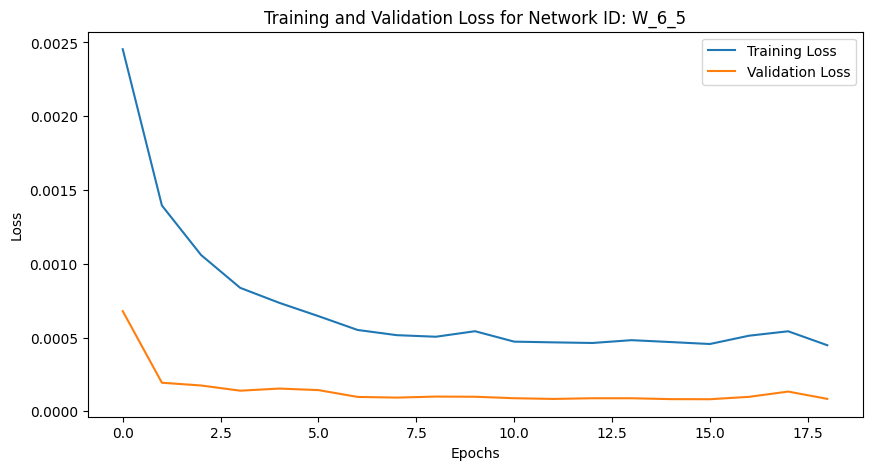

Training Progress:   0%|          | 18/10000 [01:17<11:55:34,  4.30s/epoch, loss=0.000448, val_loss=8.48e-5, patience=1]


Mean Squared Error: 0.0007308799854559256
Iteration: 105, Window Size: 6, Y Days Ahead: 6
X shape: (3796, 6)
y shape: (3796, 6)
Initializing network with layer sizes: [6, 128, 64, 32, 6]
params_W_6_6.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 6), (3036, 6), Validation data shape: (380, 6), (380, 6), Testing data shape: (380, 6), (380, 6)
Parameters loaded from params_W_6_6.npz


Training Progress:   0%|          | 16/10000 [01:07<7:19:20,  2.64s/epoch, loss=0.00054, val_loss=0.000102, patience=1] 

Epoch 17/10000, Training Loss: 0.000540, Validation Loss: 0.000102
Early stopping at epoch 17. Best validation loss: 0.000096


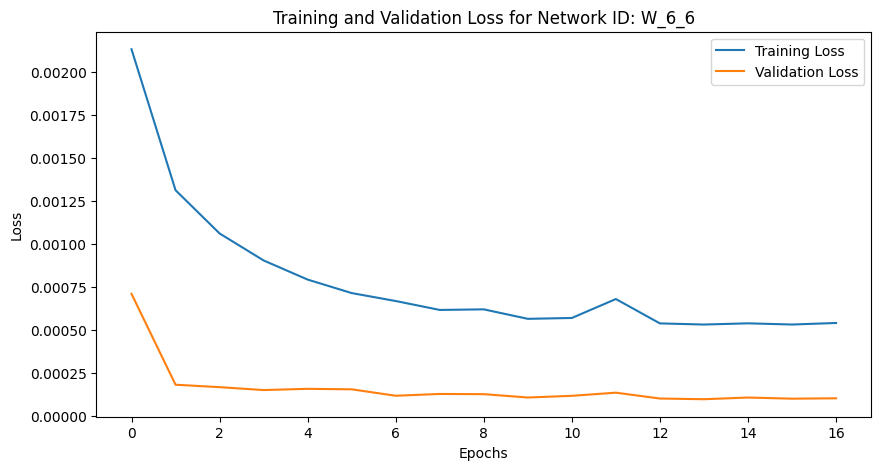

Training Progress:   0%|          | 16/10000 [01:07<11:42:44,  4.22s/epoch, loss=0.00054, val_loss=0.000102, patience=1]


Mean Squared Error: 0.0008871622984609524
Iteration: 106, Window Size: 6, Y Days Ahead: 7
X shape: (3795, 6)
y shape: (3795, 7)
Initializing network with layer sizes: [6, 128, 64, 32, 7]
params_W_6_7.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 6), (3036, 7), Validation data shape: (379, 6), (379, 7), Testing data shape: (380, 6), (380, 7)
Parameters loaded from params_W_6_7.npz


Training Progress:   0%|          | 23/10000 [00:58<6:36:33,  2.38s/epoch, loss=0.000562, val_loss=0.000107, patience=1]

Epoch 24/10000, Training Loss: 0.000562, Validation Loss: 0.000107
Early stopping at epoch 24. Best validation loss: 0.000105


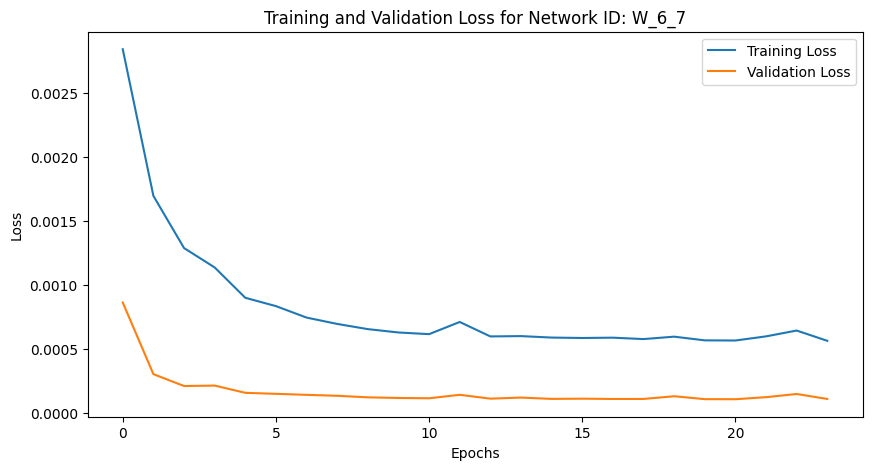

Training Progress:   0%|          | 23/10000 [00:58<7:04:23,  2.55s/epoch, loss=0.000562, val_loss=0.000107, patience=1]


Mean Squared Error: 0.0009690076114814712
Iteration: 107, Window Size: 6, Y Days Ahead: 8
X shape: (3794, 6)
y shape: (3794, 8)
Initializing network with layer sizes: [6, 128, 64, 32, 8]
params_W_6_8.npz not found. Using randomly initialized parameters.
Training data shape: (3035, 6), (3035, 8), Validation data shape: (379, 6), (379, 8), Testing data shape: (380, 6), (380, 8)
Parameters loaded from params_W_6_8.npz


Training Progress:   0%|          | 13/10000 [00:36<7:10:14,  2.58s/epoch, loss=0.000697, val_loss=0.000143, patience=1]

Epoch 14/10000, Training Loss: 0.000697, Validation Loss: 0.000143
Early stopping at epoch 14. Best validation loss: 0.000132


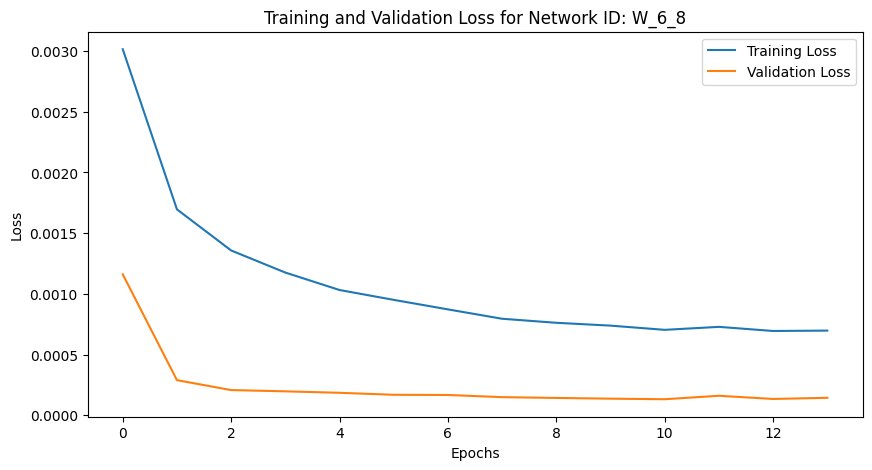

Training Progress:   0%|          | 13/10000 [00:37<7:55:55,  2.86s/epoch, loss=0.000697, val_loss=0.000143, patience=1]


Mean Squared Error: 0.001115717083159867
Iteration: 108, Window Size: 6, Y Days Ahead: 9
X shape: (3793, 6)
y shape: (3793, 9)
Initializing network with layer sizes: [6, 128, 64, 32, 9]
params_W_6_9.npz not found. Using randomly initialized parameters.
Training data shape: (3034, 6), (3034, 9), Validation data shape: (379, 6), (379, 9), Testing data shape: (380, 6), (380, 9)
Parameters loaded from params_W_6_9.npz


Training Progress:   0%|          | 29/10000 [01:13<6:42:17,  2.42s/epoch, loss=0.000688, val_loss=0.00013, patience=1] 

Epoch 30/10000, Training Loss: 0.000688, Validation Loss: 0.000130
Early stopping at epoch 30. Best validation loss: 0.000130


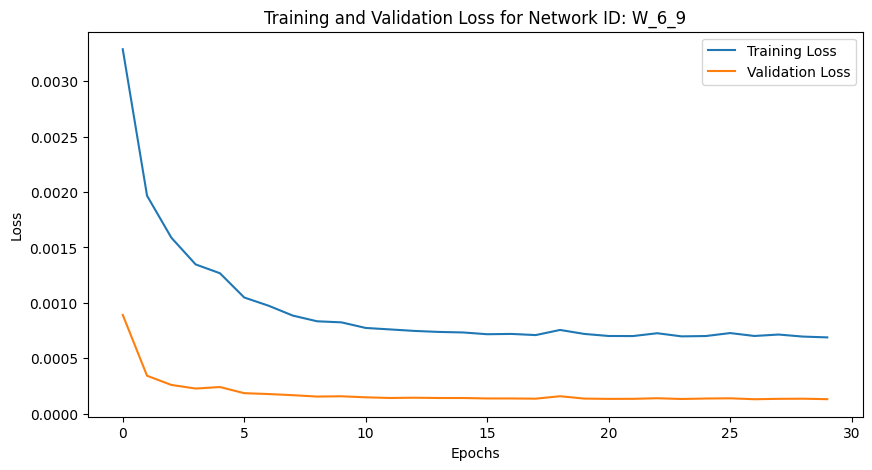

Training Progress:   0%|          | 29/10000 [01:14<7:05:31,  2.56s/epoch, loss=0.000688, val_loss=0.00013, patience=1]


Mean Squared Error: 0.0012163200784170254
Iteration: 109, Window Size: 6, Y Days Ahead: 10
X shape: (3792, 6)
y shape: (3792, 10)
Initializing network with layer sizes: [6, 128, 64, 32, 10]
params_W_6_10.npz not found. Using randomly initialized parameters.
Training data shape: (3033, 6), (3033, 10), Validation data shape: (379, 6), (379, 10), Testing data shape: (380, 6), (380, 10)
Parameters loaded from params_W_6_10.npz


Training Progress:   0%|          | 21/10000 [00:50<6:33:52,  2.37s/epoch, loss=0.000794, val_loss=0.000161, patience=1]

Epoch 22/10000, Training Loss: 0.000794, Validation Loss: 0.000161
Early stopping at epoch 22. Best validation loss: 0.000146


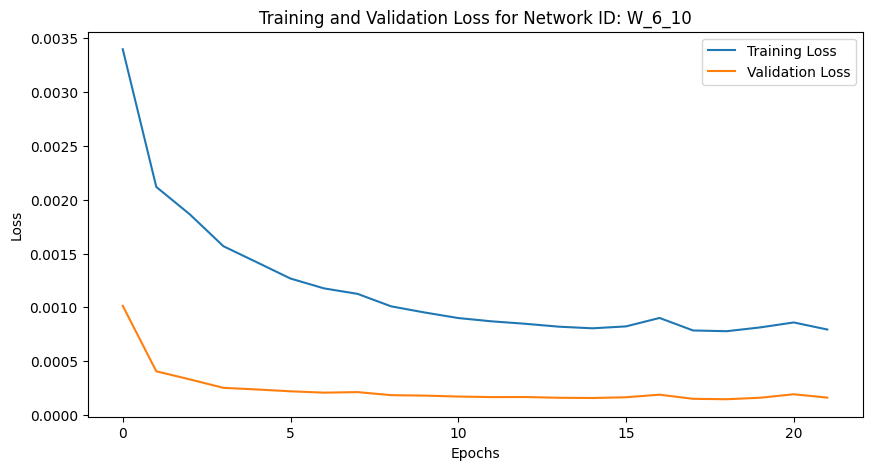

Training Progress:   0%|          | 21/10000 [00:50<6:42:54,  2.42s/epoch, loss=0.000794, val_loss=0.000161, patience=1]


Mean Squared Error: 0.0013253723738242465
Iteration: 110, Window Size: 6, Y Days Ahead: 11
X shape: (3791, 6)
y shape: (3791, 11)
Initializing network with layer sizes: [6, 128, 64, 32, 11]
params_W_6_11.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 6), (3032, 11), Validation data shape: (379, 6), (379, 11), Testing data shape: (380, 6), (380, 11)
Parameters loaded from params_W_6_11.npz


Training Progress:   0%|          | 12/10000 [00:30<6:17:05,  2.27s/epoch, loss=0.000905, val_loss=0.000179, patience=1]

Epoch 13/10000, Training Loss: 0.000905, Validation Loss: 0.000179
Early stopping at epoch 13. Best validation loss: 0.000176


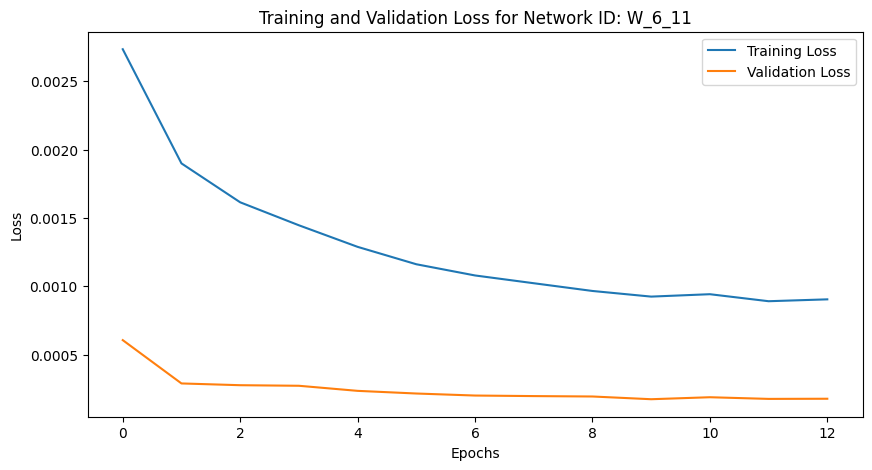

Training Progress:   0%|          | 12/10000 [00:30<7:08:00,  2.57s/epoch, loss=0.000905, val_loss=0.000179, patience=1]


Mean Squared Error: 0.0015225064144425136
Iteration: 111, Window Size: 6, Y Days Ahead: 12
X shape: (3790, 6)
y shape: (3790, 12)
Initializing network with layer sizes: [6, 128, 64, 32, 12]
params_W_6_12.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 6), (3032, 12), Validation data shape: (379, 6), (379, 12), Testing data shape: (379, 6), (379, 12)
Parameters loaded from params_W_6_12.npz


Training Progress:   0%|          | 19/10000 [00:45<6:19:40,  2.28s/epoch, loss=0.000953, val_loss=0.000191, patience=1]

Epoch 20/10000, Training Loss: 0.000953, Validation Loss: 0.000191
Early stopping at epoch 20. Best validation loss: 0.000181


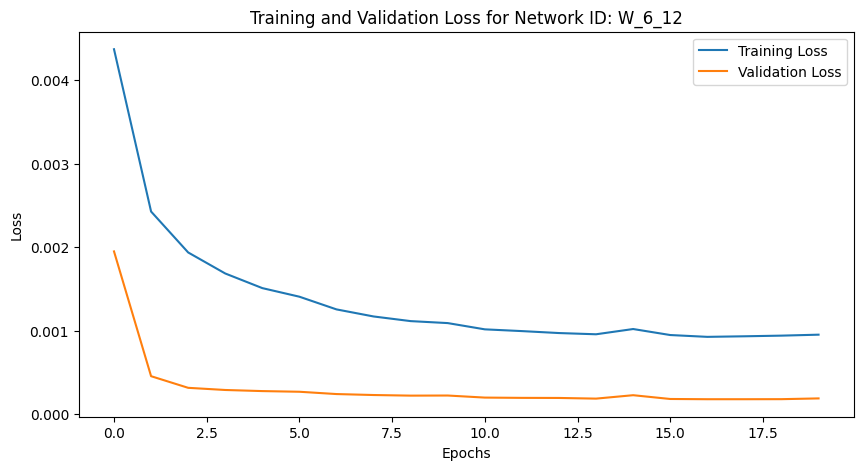

Training Progress:   0%|          | 19/10000 [00:46<6:43:03,  2.42s/epoch, loss=0.000953, val_loss=0.000191, patience=1]


Mean Squared Error: 0.0015880215305651751
Iteration: 112, Window Size: 6, Y Days Ahead: 13
X shape: (3789, 6)
y shape: (3789, 13)
Initializing network with layer sizes: [6, 128, 64, 32, 13]
params_W_6_13.npz not found. Using randomly initialized parameters.
Training data shape: (3031, 6), (3031, 13), Validation data shape: (379, 6), (379, 13), Testing data shape: (379, 6), (379, 13)
Parameters loaded from params_W_6_13.npz


Training Progress:   0%|          | 23/10000 [00:54<6:26:37,  2.33s/epoch, loss=0.000975, val_loss=0.000197, patience=1]

Epoch 24/10000, Training Loss: 0.000975, Validation Loss: 0.000197
Early stopping at epoch 24. Best validation loss: 0.000185


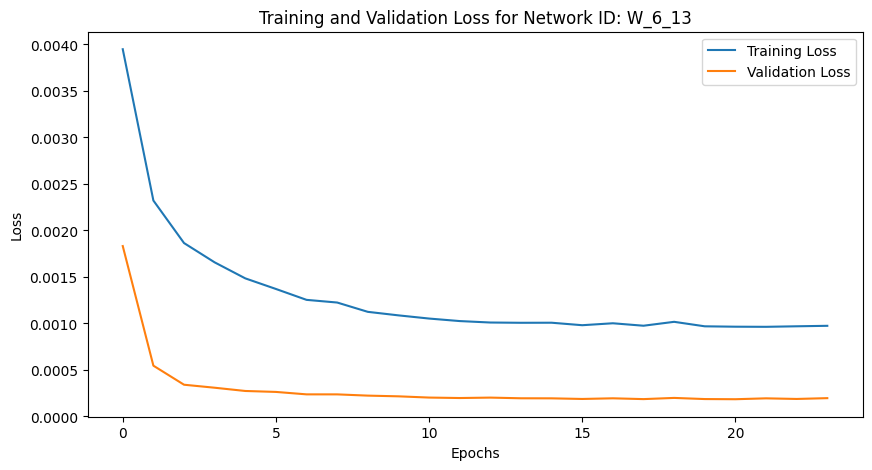

Training Progress:   0%|          | 23/10000 [00:54<6:35:39,  2.38s/epoch, loss=0.000975, val_loss=0.000197, patience=1]


Mean Squared Error: 0.001709852918189565
Iteration: 113, Window Size: 6, Y Days Ahead: 14
X shape: (3788, 6)
y shape: (3788, 14)
Initializing network with layer sizes: [6, 128, 64, 32, 14]
params_W_6_14.npz not found. Using randomly initialized parameters.
Training data shape: (3030, 6), (3030, 14), Validation data shape: (379, 6), (379, 14), Testing data shape: (379, 6), (379, 14)
Parameters loaded from params_W_6_14.npz


Training Progress:   0%|          | 27/10000 [01:03<6:06:15,  2.20s/epoch, loss=0.00104, val_loss=0.000204, patience=1]

Epoch 28/10000, Training Loss: 0.001041, Validation Loss: 0.000204
Early stopping at epoch 28. Best validation loss: 0.000203


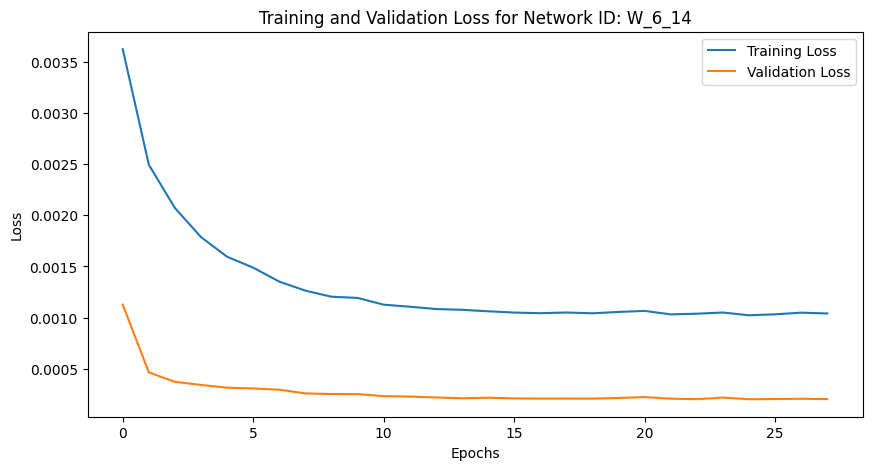

Training Progress:   0%|          | 27/10000 [01:04<6:35:34,  2.38s/epoch, loss=0.00104, val_loss=0.000204, patience=1]


Mean Squared Error: 0.0018309300461008449
Iteration: 114, Window Size: 6, Y Days Ahead: 15
X shape: (3787, 6)
y shape: (3787, 15)
Initializing network with layer sizes: [6, 128, 64, 32, 15]
params_W_6_15.npz not found. Using randomly initialized parameters.
Training data shape: (3029, 6), (3029, 15), Validation data shape: (379, 6), (379, 15), Testing data shape: (379, 6), (379, 15)
Parameters loaded from params_W_6_15.npz


Training Progress:   0%|          | 13/10000 [00:30<5:51:35,  2.11s/epoch, loss=0.0012, val_loss=0.000264, patience=1] 

Epoch 14/10000, Training Loss: 0.001199, Validation Loss: 0.000264
Early stopping at epoch 14. Best validation loss: 0.000256


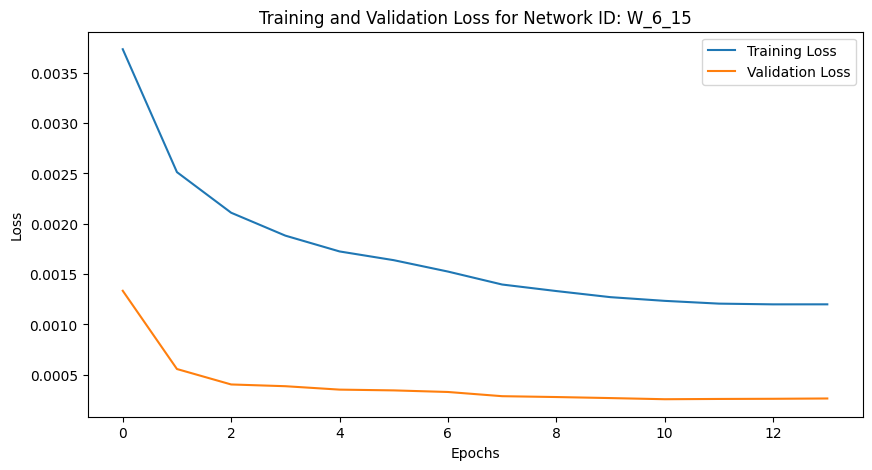

Training Progress:   0%|          | 13/10000 [00:30<6:29:38,  2.34s/epoch, loss=0.0012, val_loss=0.000264, patience=1]


Mean Squared Error: 0.0020171458457409796
Iteration: 115, Window Size: 6, Y Days Ahead: 16
X shape: (3786, 6)
y shape: (3786, 16)
Initializing network with layer sizes: [6, 128, 64, 32, 16]
params_W_6_16.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 6), (3028, 16), Validation data shape: (379, 6), (379, 16), Testing data shape: (379, 6), (379, 16)
Parameters loaded from params_W_6_16.npz


Training Progress:   0%|          | 27/10000 [01:02<6:24:58,  2.32s/epoch, loss=0.00119, val_loss=0.000251, patience=1]

Epoch 28/10000, Training Loss: 0.001191, Validation Loss: 0.000251
Early stopping at epoch 28. Best validation loss: 0.000237


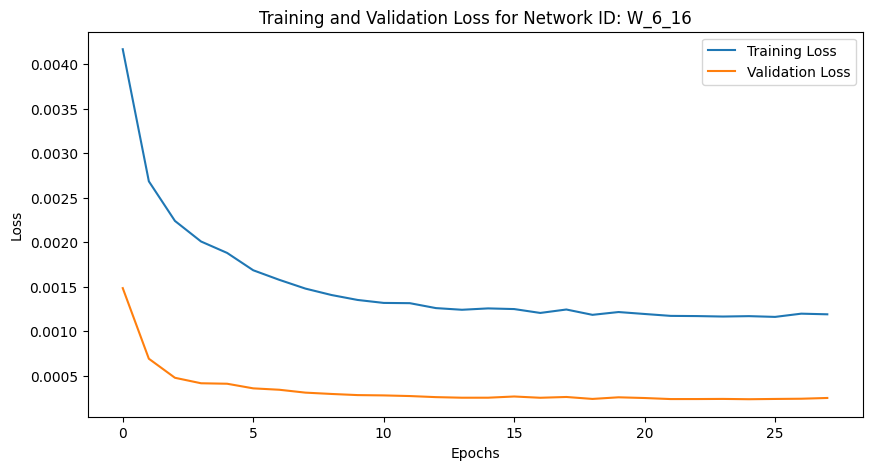

Training Progress:   0%|          | 27/10000 [01:02<6:27:20,  2.33s/epoch, loss=0.00119, val_loss=0.000251, patience=1]


Mean Squared Error: 0.002087388646144703
Iteration: 116, Window Size: 6, Y Days Ahead: 17
X shape: (3785, 6)
y shape: (3785, 17)
Initializing network with layer sizes: [6, 128, 64, 32, 17]
params_W_6_17.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 6), (3028, 17), Validation data shape: (378, 6), (378, 17), Testing data shape: (379, 6), (379, 17)
Parameters loaded from params_W_6_17.npz


Training Progress:   0%|          | 16/10000 [00:40<7:10:22,  2.59s/epoch, loss=0.00126, val_loss=0.000276, patience=1]

Epoch 17/10000, Training Loss: 0.001256, Validation Loss: 0.000276
Early stopping at epoch 17. Best validation loss: 0.000269


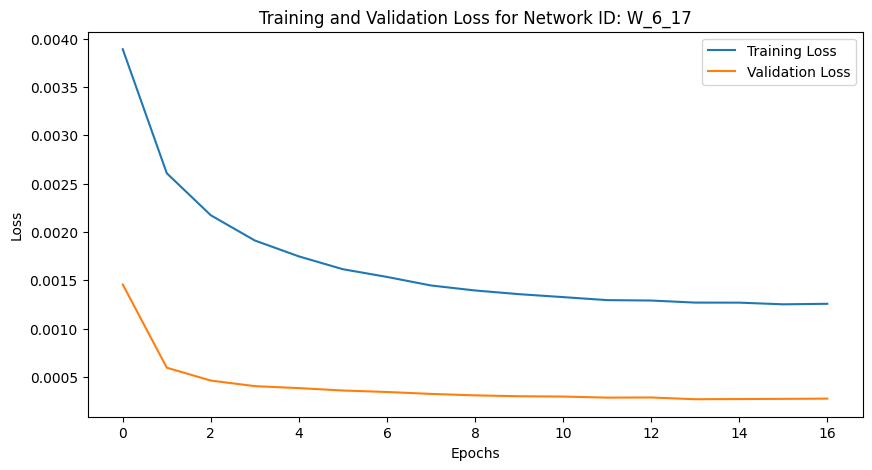

Training Progress:   0%|          | 16/10000 [00:41<7:07:40,  2.57s/epoch, loss=0.00126, val_loss=0.000276, patience=1]


Mean Squared Error: 0.0022241533324852064
Iteration: 117, Window Size: 6, Y Days Ahead: 18
X shape: (3784, 6)
y shape: (3784, 18)
Initializing network with layer sizes: [6, 128, 64, 32, 18]
params_W_6_18.npz not found. Using randomly initialized parameters.
Training data shape: (3027, 6), (3027, 18), Validation data shape: (378, 6), (378, 18), Testing data shape: (379, 6), (379, 18)
Parameters loaded from params_W_6_18.npz


Training Progress:   0%|          | 27/10000 [00:52<4:59:21,  1.80s/epoch, loss=0.00131, val_loss=0.000287, patience=1]

Epoch 28/10000, Training Loss: 0.001312, Validation Loss: 0.000287
Early stopping at epoch 28. Best validation loss: 0.000273


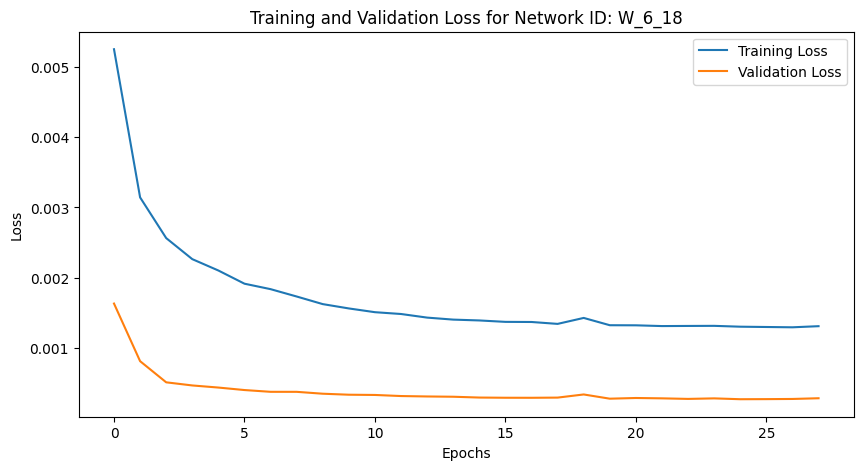

Training Progress:   0%|          | 27/10000 [00:52<5:24:53,  1.95s/epoch, loss=0.00131, val_loss=0.000287, patience=1]


Mean Squared Error: 0.0023589502031808336
Iteration: 118, Window Size: 6, Y Days Ahead: 19
X shape: (3783, 6)
y shape: (3783, 19)
Initializing network with layer sizes: [6, 128, 64, 32, 19]
params_W_6_19.npz not found. Using randomly initialized parameters.
Training data shape: (3026, 6), (3026, 19), Validation data shape: (378, 6), (378, 19), Testing data shape: (379, 6), (379, 19)
Parameters loaded from params_W_6_19.npz


Training Progress:   0%|          | 19/10000 [00:37<5:05:04,  1.83s/epoch, loss=0.0014, val_loss=0.000317, patience=1] 

Epoch 20/10000, Training Loss: 0.001404, Validation Loss: 0.000317
Early stopping at epoch 20. Best validation loss: 0.000302


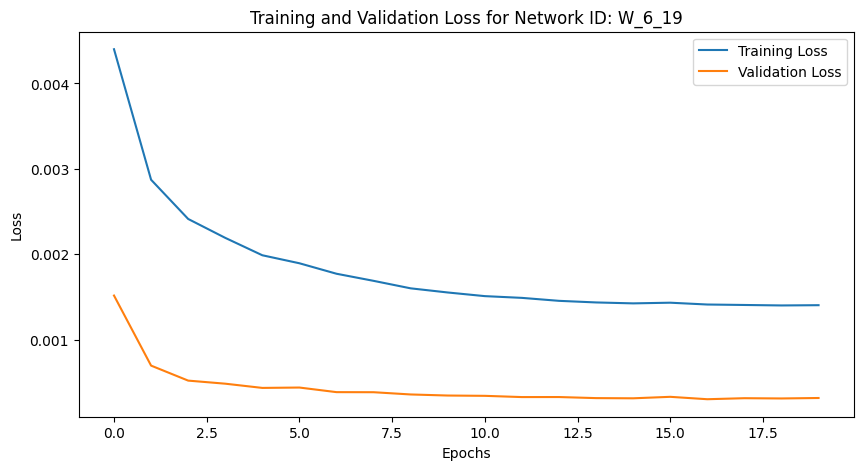

Training Progress:   0%|          | 19/10000 [00:37<5:27:14,  1.97s/epoch, loss=0.0014, val_loss=0.000317, patience=1]


Mean Squared Error: 0.0025488900840044937
Iteration: 119, Window Size: 6, Y Days Ahead: 20
X shape: (3782, 6)
y shape: (3782, 20)
Initializing network with layer sizes: [6, 128, 64, 32, 20]
params_W_6_20.npz not found. Using randomly initialized parameters.
Training data shape: (3025, 6), (3025, 20), Validation data shape: (378, 6), (378, 20), Testing data shape: (379, 6), (379, 20)
Parameters loaded from params_W_6_20.npz


Training Progress:   0%|          | 35/10000 [01:09<5:18:04,  1.92s/epoch, loss=0.00145, val_loss=0.000308, patience=1]

Epoch 36/10000, Training Loss: 0.001451, Validation Loss: 0.000308
Early stopping at epoch 36. Best validation loss: 0.000307


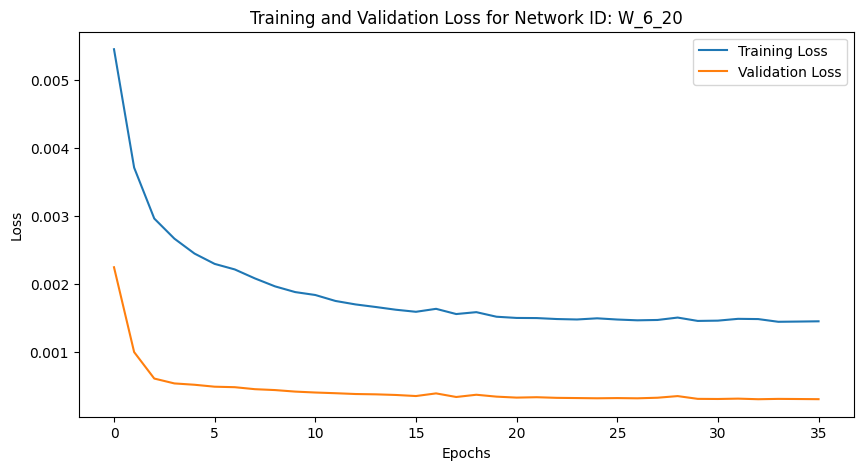

Training Progress:   0%|          | 35/10000 [01:10<5:32:58,  2.00s/epoch, loss=0.00145, val_loss=0.000308, patience=1]


Mean Squared Error: 0.0027366817559044297
Iteration: 120, Window Size: 7, Y Days Ahead: 1
X shape: (3800, 7)
y shape: (3800, 1)
Initializing network with layer sizes: [7, 128, 64, 32, 1]
params_W_7_1.npz not found. Using randomly initialized parameters.
Training data shape: (3040, 7), (3040, 1), Validation data shape: (380, 7), (380, 1), Testing data shape: (380, 7), (380, 1)
Parameters loaded from params_W_7_1.npz


Training Progress:   0%|          | 12/10000 [00:23<4:53:49,  1.77s/epoch, loss=0.000173, val_loss=4.75e-5, patience=1]

Epoch 13/10000, Training Loss: 0.000173, Validation Loss: 0.000047
Early stopping at epoch 13. Best validation loss: 0.000031


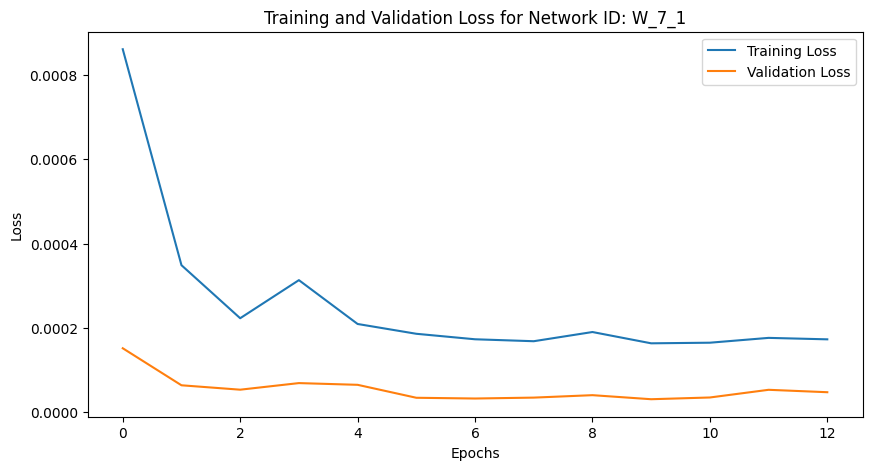

Training Progress:   0%|          | 12/10000 [00:23<5:30:19,  1.98s/epoch, loss=0.000173, val_loss=4.75e-5, patience=1]


Mean Squared Error: 0.00035700273887348614
Iteration: 121, Window Size: 7, Y Days Ahead: 2
X shape: (3799, 7)
y shape: (3799, 2)
Initializing network with layer sizes: [7, 128, 64, 32, 2]
params_W_7_2.npz not found. Using randomly initialized parameters.
Training data shape: (3039, 7), (3039, 2), Validation data shape: (380, 7), (380, 2), Testing data shape: (380, 7), (380, 2)
Parameters loaded from params_W_7_2.npz


Training Progress:   0%|          | 16/10000 [00:31<5:09:08,  1.86s/epoch, loss=0.000256, val_loss=5.73e-5, patience=1]

Epoch 17/10000, Training Loss: 0.000256, Validation Loss: 0.000057
Early stopping at epoch 17. Best validation loss: 0.000047


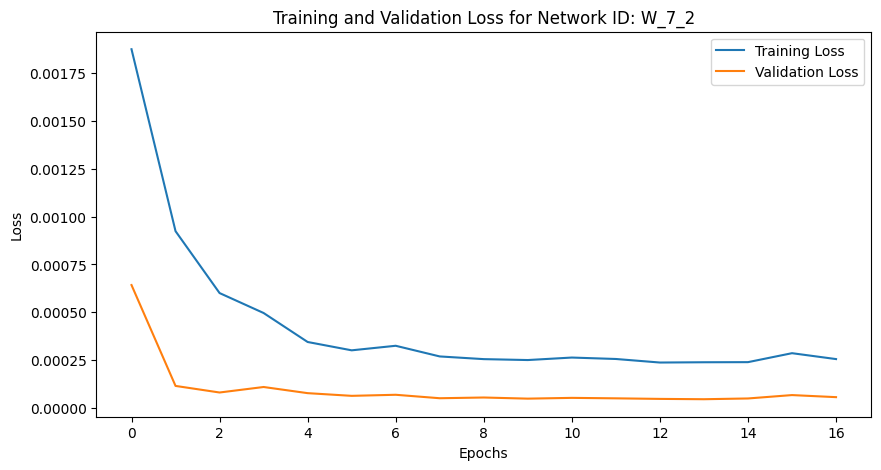

Training Progress:   0%|          | 16/10000 [00:31<5:26:11,  1.96s/epoch, loss=0.000256, val_loss=5.73e-5, patience=1]


Mean Squared Error: 0.0004769933348668132
Iteration: 122, Window Size: 7, Y Days Ahead: 3
X shape: (3798, 7)
y shape: (3798, 3)
Initializing network with layer sizes: [7, 128, 64, 32, 3]
params_W_7_3.npz not found. Using randomly initialized parameters.
Training data shape: (3038, 7), (3038, 3), Validation data shape: (380, 7), (380, 3), Testing data shape: (380, 7), (380, 3)
Parameters loaded from params_W_7_3.npz


Training Progress:   0%|          | 10/10000 [00:20<5:14:13,  1.89s/epoch, loss=0.00035, val_loss=7.52e-5, patience=1] 

Epoch 11/10000, Training Loss: 0.000350, Validation Loss: 0.000075
Early stopping at epoch 11. Best validation loss: 0.000061


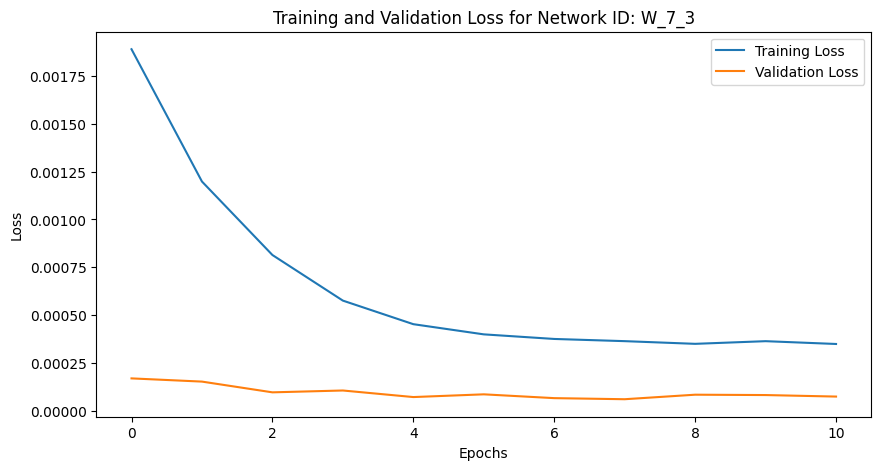

Training Progress:   0%|          | 10/10000 [00:20<5:38:53,  2.04s/epoch, loss=0.00035, val_loss=7.52e-5, patience=1]


Mean Squared Error: 0.0005304631384124215
Iteration: 123, Window Size: 7, Y Days Ahead: 4
X shape: (3797, 7)
y shape: (3797, 4)
Initializing network with layer sizes: [7, 128, 64, 32, 4]
params_W_7_4.npz not found. Using randomly initialized parameters.
Training data shape: (3037, 7), (3037, 4), Validation data shape: (380, 7), (380, 4), Testing data shape: (380, 7), (380, 4)
Parameters loaded from params_W_7_4.npz


Training Progress:   0%|          | 13/10000 [00:25<5:04:26,  1.83s/epoch, loss=0.000397, val_loss=7.33e-5, patience=1]

Epoch 14/10000, Training Loss: 0.000397, Validation Loss: 0.000073
Early stopping at epoch 14. Best validation loss: 0.000069


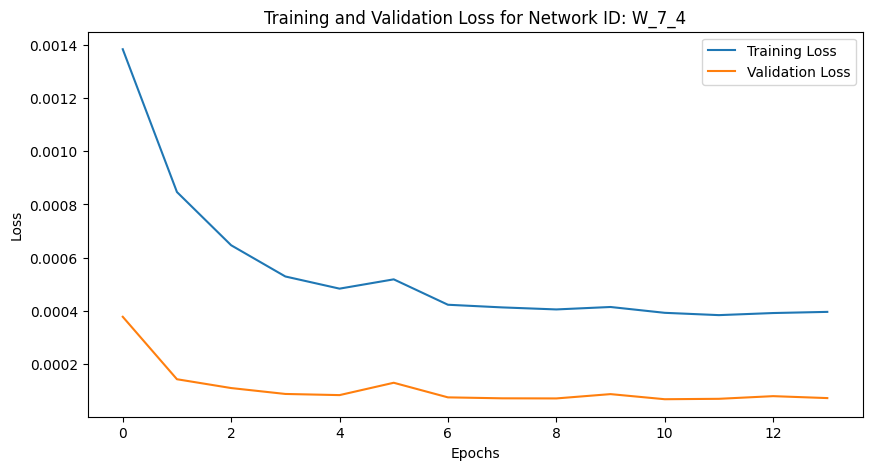

Training Progress:   0%|          | 13/10000 [00:25<5:30:31,  1.99s/epoch, loss=0.000397, val_loss=7.33e-5, patience=1]


Mean Squared Error: 0.0006297490604484233
Iteration: 124, Window Size: 7, Y Days Ahead: 5
X shape: (3796, 7)
y shape: (3796, 5)
Initializing network with layer sizes: [7, 128, 64, 32, 5]
params_W_7_5.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 7), (3036, 5), Validation data shape: (380, 7), (380, 5), Testing data shape: (380, 7), (380, 5)
Parameters loaded from params_W_7_5.npz


Training Progress:   0%|          | 12/10000 [00:24<5:07:33,  1.85s/epoch, loss=0.00048, val_loss=8.59e-5, patience=1]  

Epoch 13/10000, Training Loss: 0.000480, Validation Loss: 0.000086
Early stopping at epoch 13. Best validation loss: 0.000086


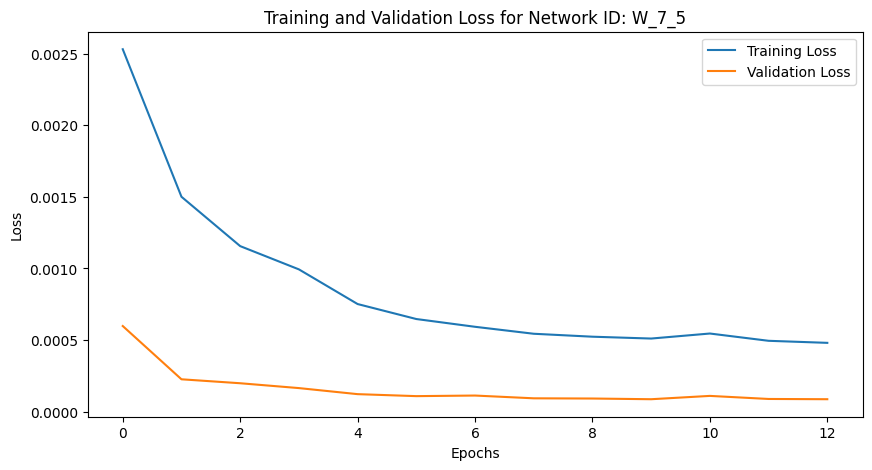

Training Progress:   0%|          | 12/10000 [00:24<5:45:45,  2.08s/epoch, loss=0.00048, val_loss=8.59e-5, patience=1]


Mean Squared Error: 0.0007541901852983775
Iteration: 125, Window Size: 7, Y Days Ahead: 6
X shape: (3795, 7)
y shape: (3795, 6)
Initializing network with layer sizes: [7, 128, 64, 32, 6]
params_W_7_6.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 7), (3036, 6), Validation data shape: (379, 7), (379, 6), Testing data shape: (380, 7), (380, 6)
Parameters loaded from params_W_7_6.npz


Training Progress:   0%|          | 10/10000 [00:20<5:00:42,  1.81s/epoch, loss=0.000546, val_loss=0.00011, patience=1] 

Epoch 11/10000, Training Loss: 0.000546, Validation Loss: 0.000110
Early stopping at epoch 11. Best validation loss: 0.000107


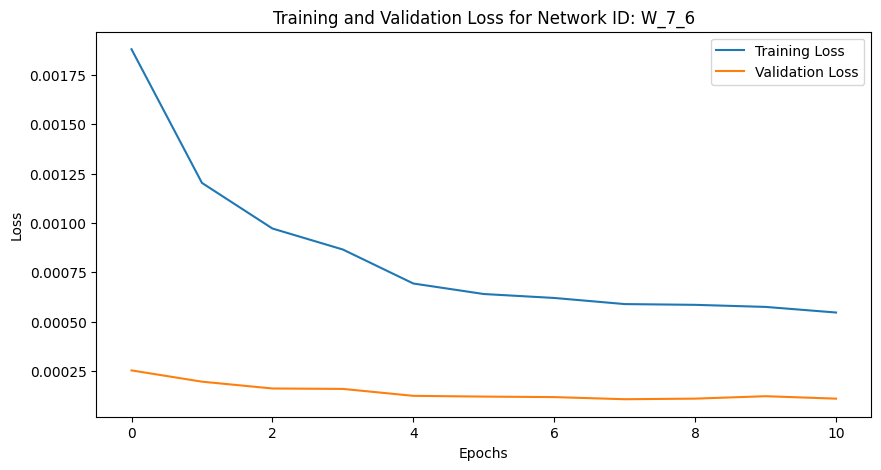

Training Progress:   0%|          | 10/10000 [00:20<5:43:35,  2.06s/epoch, loss=0.000546, val_loss=0.00011, patience=1]


Mean Squared Error: 0.0008757435652683418
Iteration: 126, Window Size: 7, Y Days Ahead: 7
X shape: (3794, 7)
y shape: (3794, 7)
Initializing network with layer sizes: [7, 128, 64, 32, 7]
params_W_7_7.npz not found. Using randomly initialized parameters.
Training data shape: (3035, 7), (3035, 7), Validation data shape: (379, 7), (379, 7), Testing data shape: (380, 7), (380, 7)
Parameters loaded from params_W_7_7.npz


Training Progress:   0%|          | 17/10000 [00:32<5:03:06,  1.82s/epoch, loss=0.000577, val_loss=0.000108, patience=1]

Epoch 18/10000, Training Loss: 0.000577, Validation Loss: 0.000108
Early stopping at epoch 18. Best validation loss: 0.000106


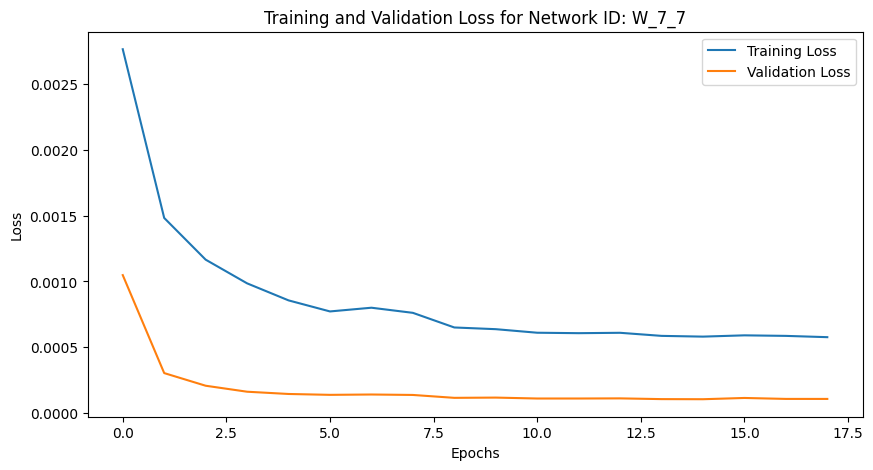

Training Progress:   0%|          | 17/10000 [00:33<5:23:44,  1.95s/epoch, loss=0.000577, val_loss=0.000108, patience=1]


Mean Squared Error: 0.0009387092943568245
Iteration: 127, Window Size: 7, Y Days Ahead: 8
X shape: (3793, 7)
y shape: (3793, 8)
Initializing network with layer sizes: [7, 128, 64, 32, 8]
params_W_7_8.npz not found. Using randomly initialized parameters.
Training data shape: (3034, 7), (3034, 8), Validation data shape: (379, 7), (379, 8), Testing data shape: (380, 7), (380, 8)
Parameters loaded from params_W_7_8.npz


Training Progress:   0%|          | 22/10000 [00:42<4:59:51,  1.80s/epoch, loss=0.000641, val_loss=0.000122, patience=1]

Epoch 23/10000, Training Loss: 0.000641, Validation Loss: 0.000122
Early stopping at epoch 23. Best validation loss: 0.000121


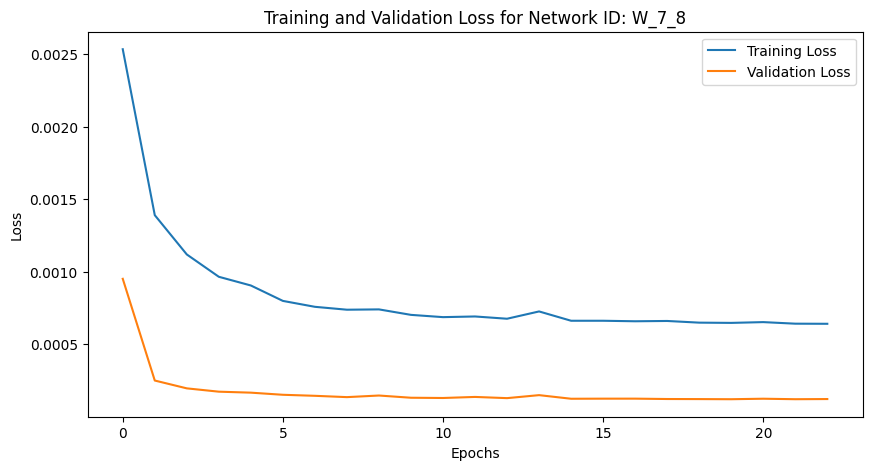

Training Progress:   0%|          | 22/10000 [00:42<5:23:48,  1.95s/epoch, loss=0.000641, val_loss=0.000122, patience=1]


Mean Squared Error: 0.0010704431375401415
Iteration: 128, Window Size: 7, Y Days Ahead: 9
X shape: (3792, 7)
y shape: (3792, 9)
Initializing network with layer sizes: [7, 128, 64, 32, 9]
params_W_7_9.npz not found. Using randomly initialized parameters.
Training data shape: (3033, 7), (3033, 9), Validation data shape: (379, 7), (379, 9), Testing data shape: (380, 7), (380, 9)
Parameters loaded from params_W_7_9.npz


Training Progress:   0%|          | 25/10000 [00:48<5:16:56,  1.91s/epoch, loss=0.000728, val_loss=0.000143, patience=1]

Epoch 26/10000, Training Loss: 0.000728, Validation Loss: 0.000143
Early stopping at epoch 26. Best validation loss: 0.000132


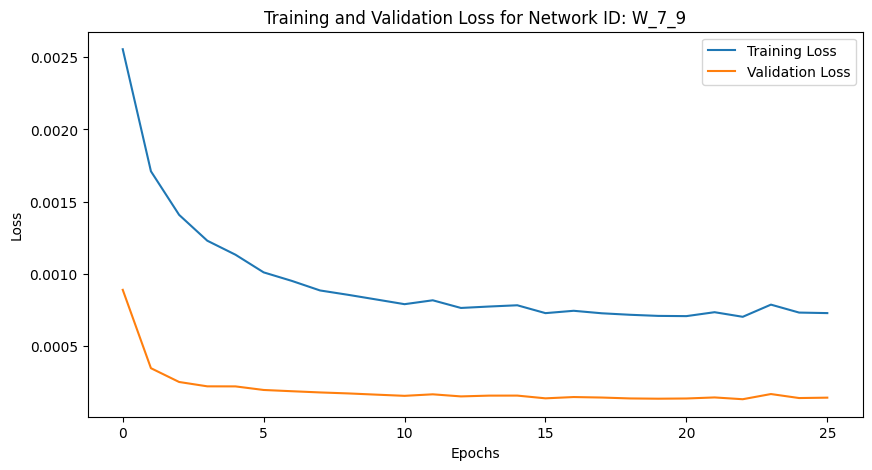

Training Progress:   0%|          | 25/10000 [00:48<5:24:09,  1.95s/epoch, loss=0.000728, val_loss=0.000143, patience=1]


Mean Squared Error: 0.0012015247945683847
Iteration: 129, Window Size: 7, Y Days Ahead: 10
X shape: (3791, 7)
y shape: (3791, 10)
Initializing network with layer sizes: [7, 128, 64, 32, 10]
params_W_7_10.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 7), (3032, 10), Validation data shape: (379, 7), (379, 10), Testing data shape: (380, 7), (380, 10)
Parameters loaded from params_W_7_10.npz


Training Progress:   0%|          | 19/10000 [00:37<4:59:23,  1.80s/epoch, loss=0.000813, val_loss=0.000165, patience=1]

Epoch 20/10000, Training Loss: 0.000813, Validation Loss: 0.000165
Early stopping at epoch 20. Best validation loss: 0.000153


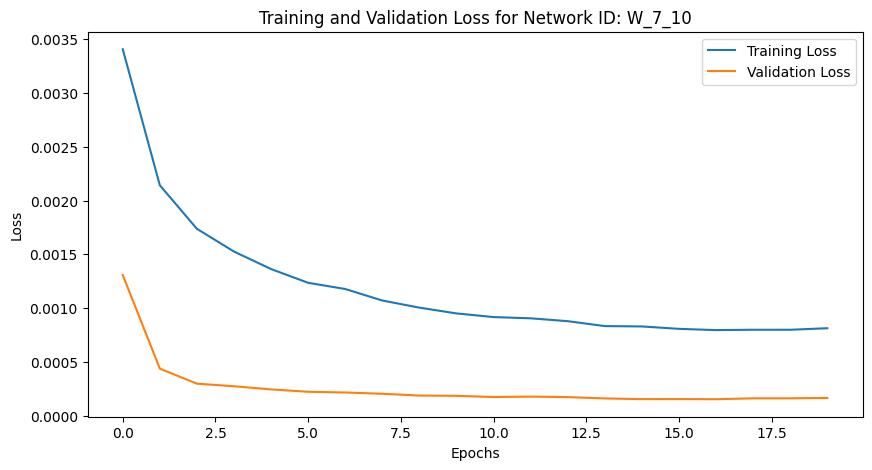

Training Progress:   0%|          | 19/10000 [00:37<5:29:44,  1.98s/epoch, loss=0.000813, val_loss=0.000165, patience=1]


Mean Squared Error: 0.0013486309367518902
Iteration: 130, Window Size: 7, Y Days Ahead: 11
X shape: (3790, 7)
y shape: (3790, 11)
Initializing network with layer sizes: [7, 128, 64, 32, 11]
params_W_7_11.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 7), (3032, 11), Validation data shape: (379, 7), (379, 11), Testing data shape: (379, 7), (379, 11)
Parameters loaded from params_W_7_11.npz


Training Progress:   0%|          | 25/10000 [00:47<4:57:29,  1.79s/epoch, loss=0.000844, val_loss=0.000166, patience=1]

Epoch 26/10000, Training Loss: 0.000844, Validation Loss: 0.000166
Early stopping at epoch 26. Best validation loss: 0.000159


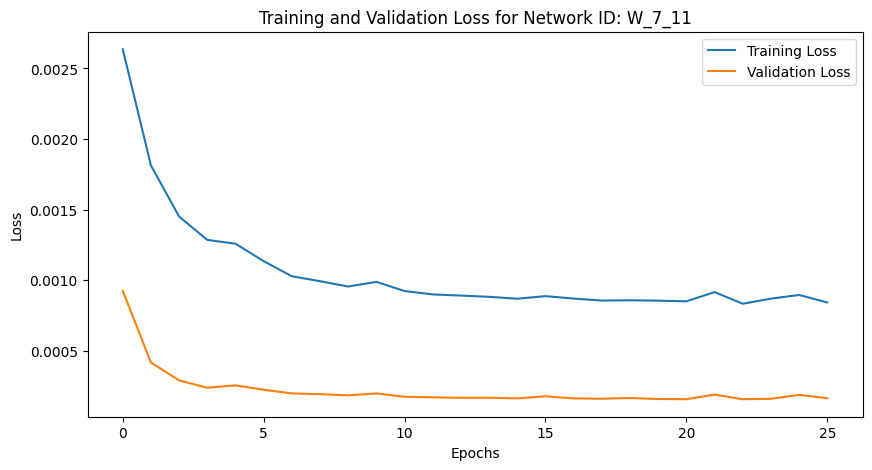

Training Progress:   0%|          | 25/10000 [00:47<5:16:29,  1.90s/epoch, loss=0.000844, val_loss=0.000166, patience=1]


Mean Squared Error: 0.0014215633628360926
Iteration: 131, Window Size: 7, Y Days Ahead: 12
X shape: (3789, 7)
y shape: (3789, 12)
Initializing network with layer sizes: [7, 128, 64, 32, 12]
params_W_7_12.npz not found. Using randomly initialized parameters.
Training data shape: (3031, 7), (3031, 12), Validation data shape: (379, 7), (379, 12), Testing data shape: (379, 7), (379, 12)
Parameters loaded from params_W_7_12.npz


Training Progress:   0%|          | 17/10000 [00:32<4:57:43,  1.79s/epoch, loss=0.000945, val_loss=0.000186, patience=1]

Epoch 18/10000, Training Loss: 0.000945, Validation Loss: 0.000186
Early stopping at epoch 18. Best validation loss: 0.000185


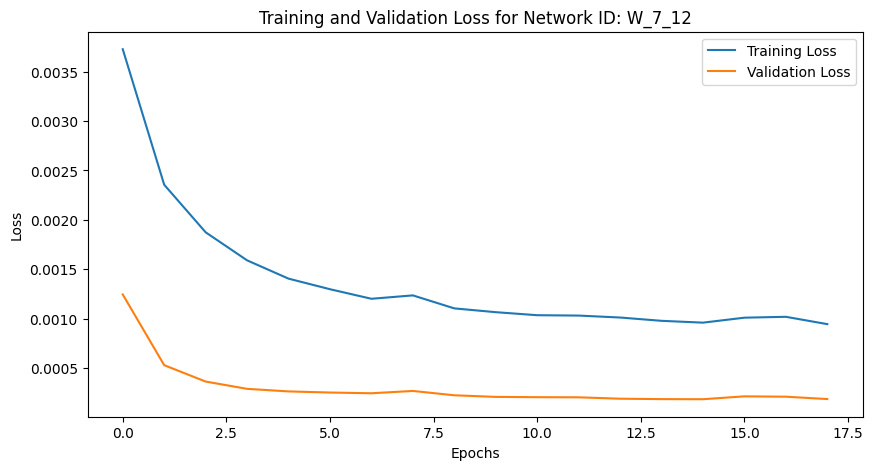

Training Progress:   0%|          | 17/10000 [00:32<5:16:38,  1.90s/epoch, loss=0.000945, val_loss=0.000186, patience=1]


Mean Squared Error: 0.001604772543584232
Iteration: 132, Window Size: 7, Y Days Ahead: 13
X shape: (3788, 7)
y shape: (3788, 13)
Initializing network with layer sizes: [7, 128, 64, 32, 13]
params_W_7_13.npz not found. Using randomly initialized parameters.
Training data shape: (3030, 7), (3030, 13), Validation data shape: (379, 7), (379, 13), Testing data shape: (379, 7), (379, 13)
Parameters loaded from params_W_7_13.npz


Training Progress:   0%|          | 18/10000 [00:35<4:55:34,  1.78s/epoch, loss=0.001, val_loss=0.000206, patience=1]  

Epoch 19/10000, Training Loss: 0.001003, Validation Loss: 0.000206
Early stopping at epoch 19. Best validation loss: 0.000202


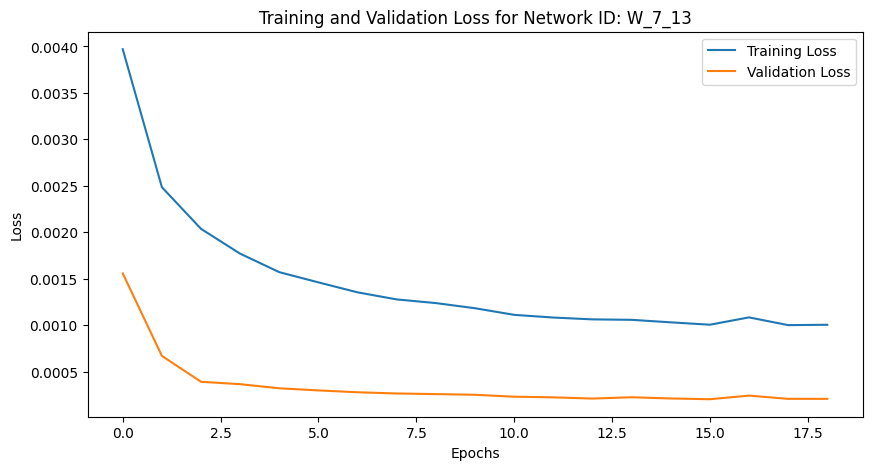

Training Progress:   0%|          | 18/10000 [00:35<5:31:29,  1.99s/epoch, loss=0.001, val_loss=0.000206, patience=1]


Mean Squared Error: 0.0017622041172883104
Iteration: 133, Window Size: 7, Y Days Ahead: 14
X shape: (3787, 7)
y shape: (3787, 14)
Initializing network with layer sizes: [7, 128, 64, 32, 14]
params_W_7_14.npz not found. Using randomly initialized parameters.
Training data shape: (3029, 7), (3029, 14), Validation data shape: (379, 7), (379, 14), Testing data shape: (379, 7), (379, 14)
Parameters loaded from params_W_7_14.npz


Training Progress:   0%|          | 23/10000 [00:43<5:02:53,  1.82s/epoch, loss=0.00104, val_loss=0.000223, patience=1]

Epoch 24/10000, Training Loss: 0.001044, Validation Loss: 0.000223
Early stopping at epoch 24. Best validation loss: 0.000205


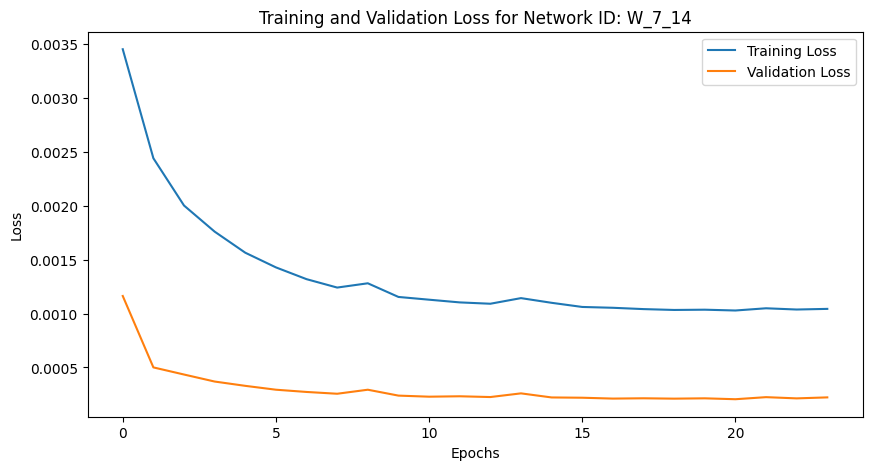

Training Progress:   0%|          | 23/10000 [00:44<5:19:23,  1.92s/epoch, loss=0.00104, val_loss=0.000223, patience=1]


Mean Squared Error: 0.0018141370344447682
Iteration: 134, Window Size: 7, Y Days Ahead: 15
X shape: (3786, 7)
y shape: (3786, 15)
Initializing network with layer sizes: [7, 128, 64, 32, 15]
params_W_7_15.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 7), (3028, 15), Validation data shape: (379, 7), (379, 15), Testing data shape: (379, 7), (379, 15)
Parameters loaded from params_W_7_15.npz


Training Progress:   0%|          | 22/10000 [00:42<5:05:10,  1.84s/epoch, loss=0.0012, val_loss=0.000284, patience=1] 

Epoch 23/10000, Training Loss: 0.001203, Validation Loss: 0.000284
Early stopping at epoch 23. Best validation loss: 0.000228


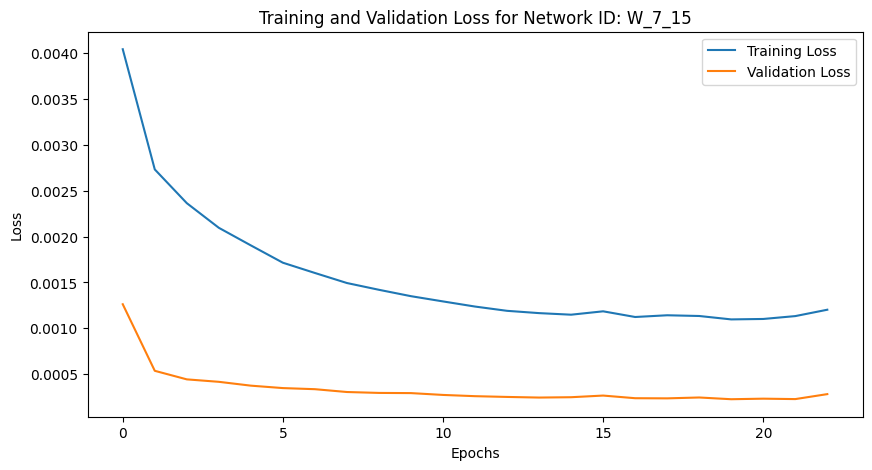

Training Progress:   0%|          | 22/10000 [00:42<5:23:16,  1.94s/epoch, loss=0.0012, val_loss=0.000284, patience=1]


Mean Squared Error: 0.0018970344848837258
Iteration: 135, Window Size: 7, Y Days Ahead: 16
X shape: (3785, 7)
y shape: (3785, 16)
Initializing network with layer sizes: [7, 128, 64, 32, 16]
params_W_7_16.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 7), (3028, 16), Validation data shape: (378, 7), (378, 16), Testing data shape: (379, 7), (379, 16)
Parameters loaded from params_W_7_16.npz


Training Progress:   0%|          | 23/10000 [00:45<5:00:48,  1.81s/epoch, loss=0.00118, val_loss=0.000259, patience=1]

Epoch 24/10000, Training Loss: 0.001185, Validation Loss: 0.000259
Early stopping at epoch 24. Best validation loss: 0.000242


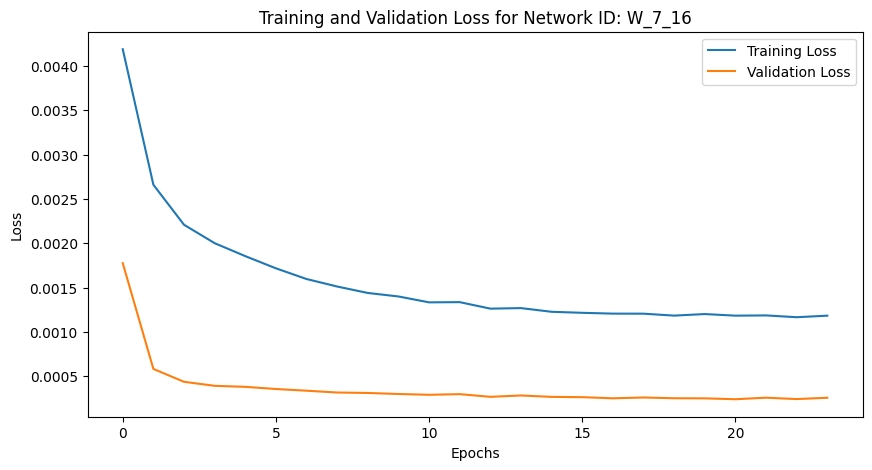

Training Progress:   0%|          | 23/10000 [00:45<5:27:46,  1.97s/epoch, loss=0.00118, val_loss=0.000259, patience=1]


Mean Squared Error: 0.0020831973692686826
Iteration: 136, Window Size: 7, Y Days Ahead: 17
X shape: (3784, 7)
y shape: (3784, 17)
Initializing network with layer sizes: [7, 128, 64, 32, 17]
params_W_7_17.npz not found. Using randomly initialized parameters.
Training data shape: (3027, 7), (3027, 17), Validation data shape: (378, 7), (378, 17), Testing data shape: (379, 7), (379, 17)
Parameters loaded from params_W_7_17.npz


Training Progress:   0%|          | 28/10000 [00:54<5:07:45,  1.85s/epoch, loss=0.00123, val_loss=0.00026, patience=1] 

Epoch 29/10000, Training Loss: 0.001228, Validation Loss: 0.000260
Early stopping at epoch 29. Best validation loss: 0.000255


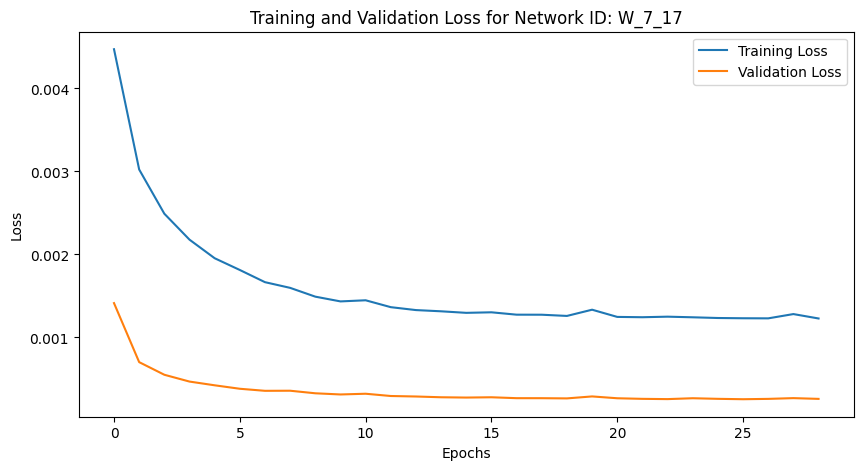

Training Progress:   0%|          | 28/10000 [00:55<5:26:40,  1.97s/epoch, loss=0.00123, val_loss=0.00026, patience=1]


Mean Squared Error: 0.00215419824345265
Iteration: 137, Window Size: 7, Y Days Ahead: 18
X shape: (3783, 7)
y shape: (3783, 18)
Initializing network with layer sizes: [7, 128, 64, 32, 18]
params_W_7_18.npz not found. Using randomly initialized parameters.
Training data shape: (3026, 7), (3026, 18), Validation data shape: (378, 7), (378, 18), Testing data shape: (379, 7), (379, 18)
Parameters loaded from params_W_7_18.npz


Training Progress:   0%|          | 22/10000 [00:44<5:12:44,  1.88s/epoch, loss=0.00136, val_loss=0.000296, patience=1]

Epoch 23/10000, Training Loss: 0.001360, Validation Loss: 0.000296
Early stopping at epoch 23. Best validation loss: 0.000274


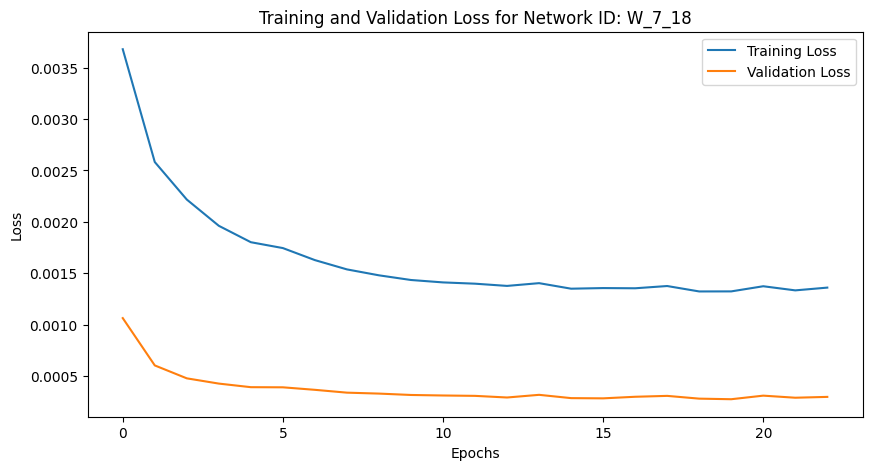

Training Progress:   0%|          | 22/10000 [00:44<5:39:23,  2.04s/epoch, loss=0.00136, val_loss=0.000296, patience=1]


Mean Squared Error: 0.00234167516355228
Iteration: 138, Window Size: 7, Y Days Ahead: 19
X shape: (3782, 7)
y shape: (3782, 19)
Initializing network with layer sizes: [7, 128, 64, 32, 19]
params_W_7_19.npz not found. Using randomly initialized parameters.
Training data shape: (3025, 7), (3025, 19), Validation data shape: (378, 7), (378, 19), Testing data shape: (379, 7), (379, 19)
Parameters loaded from params_W_7_19.npz


Training Progress:   0%|          | 16/10000 [00:32<5:09:51,  1.86s/epoch, loss=0.00152, val_loss=0.000352, patience=1]

Epoch 17/10000, Training Loss: 0.001520, Validation Loss: 0.000352
Early stopping at epoch 17. Best validation loss: 0.000332


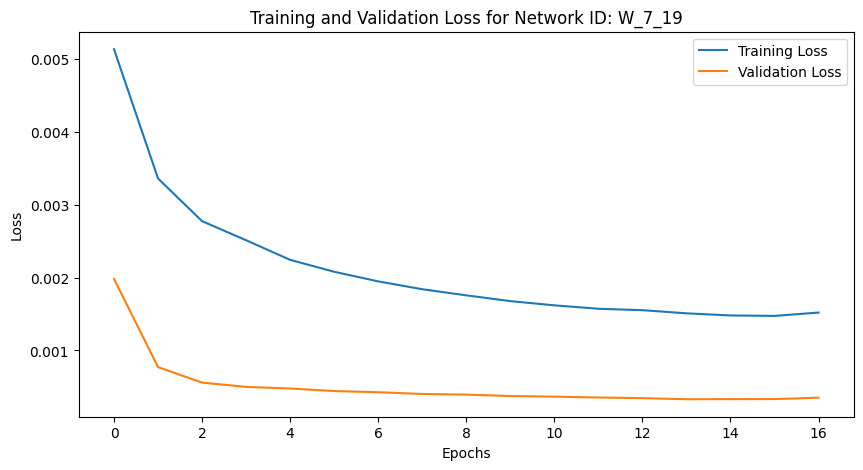

Training Progress:   0%|          | 16/10000 [00:32<5:37:45,  2.03s/epoch, loss=0.00152, val_loss=0.000352, patience=1]


Mean Squared Error: 0.002552691649812765
Iteration: 139, Window Size: 7, Y Days Ahead: 20
X shape: (3781, 7)
y shape: (3781, 20)
Initializing network with layer sizes: [7, 128, 64, 32, 20]
params_W_7_20.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 7), (3024, 20), Validation data shape: (378, 7), (378, 20), Testing data shape: (379, 7), (379, 20)
Parameters loaded from params_W_7_20.npz


Training Progress:   0%|          | 17/10000 [00:34<5:13:08,  1.88s/epoch, loss=0.00152, val_loss=0.000353, patience=1]

Epoch 18/10000, Training Loss: 0.001518, Validation Loss: 0.000353
Early stopping at epoch 18. Best validation loss: 0.000332


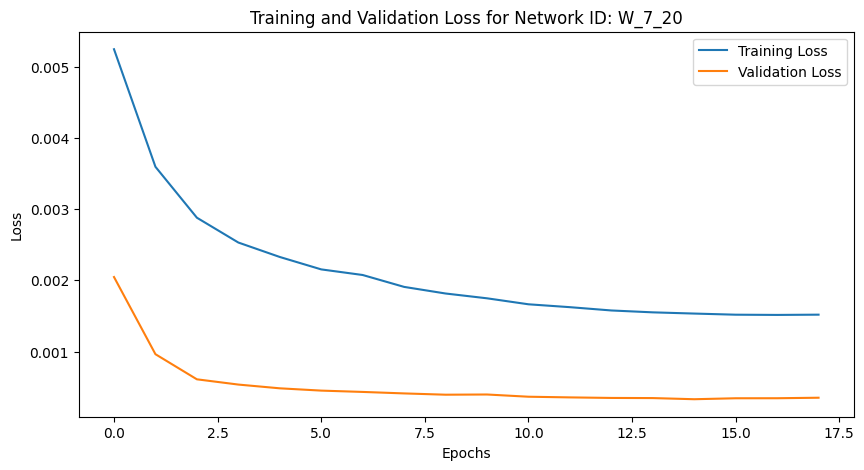

Training Progress:   0%|          | 17/10000 [00:35<5:44:44,  2.07s/epoch, loss=0.00152, val_loss=0.000353, patience=1]


Mean Squared Error: 0.0026630042730361988
Iteration: 140, Window Size: 8, Y Days Ahead: 1
X shape: (3799, 8)
y shape: (3799, 1)
Initializing network with layer sizes: [8, 128, 64, 32, 1]
params_W_8_1.npz not found. Using randomly initialized parameters.
Training data shape: (3039, 8), (3039, 1), Validation data shape: (380, 8), (380, 1), Testing data shape: (380, 8), (380, 1)
Parameters loaded from params_W_8_1.npz


Training Progress:   0%|          | 8/10000 [00:17<5:16:47,  1.90s/epoch, loss=0.000186, val_loss=4.06e-5, patience=1] 

Epoch 9/10000, Training Loss: 0.000186, Validation Loss: 0.000041
Early stopping at epoch 9. Best validation loss: 0.000037


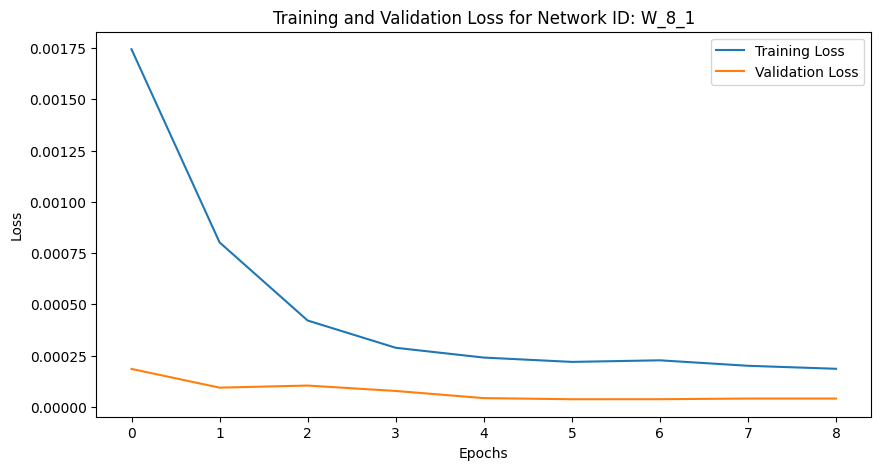

Training Progress:   0%|          | 8/10000 [00:17<6:02:10,  2.17s/epoch, loss=0.000186, val_loss=4.06e-5, patience=1]


Mean Squared Error: 0.000378803413173739
Iteration: 141, Window Size: 8, Y Days Ahead: 2
X shape: (3798, 8)
y shape: (3798, 2)
Initializing network with layer sizes: [8, 128, 64, 32, 2]
params_W_8_2.npz not found. Using randomly initialized parameters.
Training data shape: (3038, 8), (3038, 2), Validation data shape: (380, 8), (380, 2), Testing data shape: (380, 8), (380, 2)
Parameters loaded from params_W_8_2.npz


Training Progress:   0%|          | 13/10000 [00:26<5:08:47,  1.86s/epoch, loss=0.000249, val_loss=5.6e-5, patience=1] 

Epoch 14/10000, Training Loss: 0.000249, Validation Loss: 0.000056
Early stopping at epoch 14. Best validation loss: 0.000052


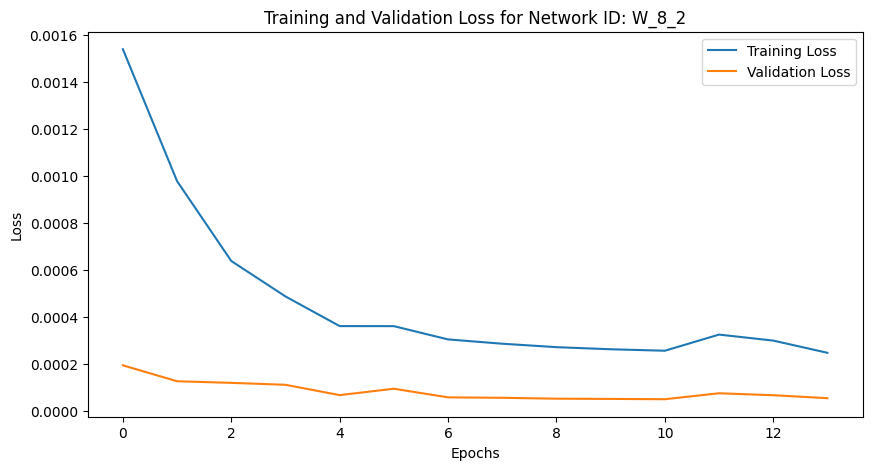

Training Progress:   0%|          | 13/10000 [00:26<5:37:14,  2.03s/epoch, loss=0.000249, val_loss=5.6e-5, patience=1]


Mean Squared Error: 0.00048724846696633693
Iteration: 142, Window Size: 8, Y Days Ahead: 3
X shape: (3797, 8)
y shape: (3797, 3)
Initializing network with layer sizes: [8, 128, 64, 32, 3]
params_W_8_3.npz not found. Using randomly initialized parameters.
Training data shape: (3037, 8), (3037, 3), Validation data shape: (380, 8), (380, 3), Testing data shape: (380, 8), (380, 3)
Parameters loaded from params_W_8_3.npz


Training Progress:   0%|          | 13/10000 [00:26<5:14:36,  1.89s/epoch, loss=0.000313, val_loss=6.26e-5, patience=1]

Epoch 14/10000, Training Loss: 0.000313, Validation Loss: 0.000063
Early stopping at epoch 14. Best validation loss: 0.000058


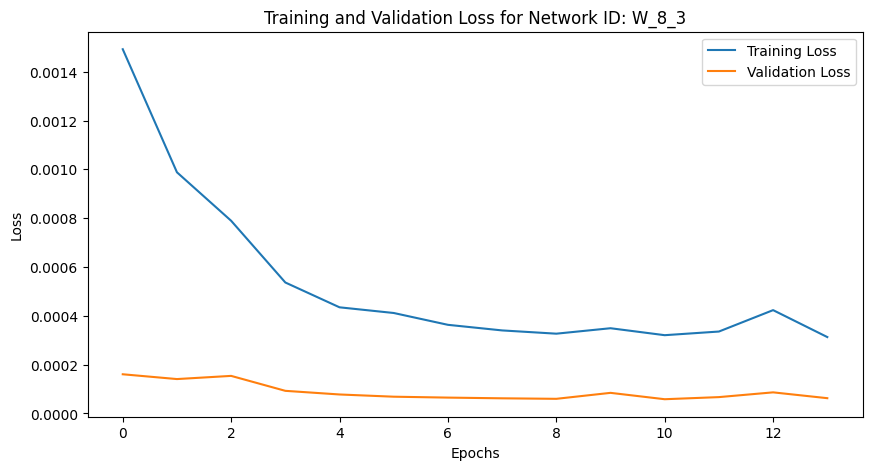

Training Progress:   0%|          | 13/10000 [00:26<5:36:28,  2.02s/epoch, loss=0.000313, val_loss=6.26e-5, patience=1]


Mean Squared Error: 0.0005345574579414797
Iteration: 143, Window Size: 8, Y Days Ahead: 4
X shape: (3796, 8)
y shape: (3796, 4)
Initializing network with layer sizes: [8, 128, 64, 32, 4]
params_W_8_4.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 8), (3036, 4), Validation data shape: (380, 8), (380, 4), Testing data shape: (380, 8), (380, 4)
Parameters loaded from params_W_8_4.npz


Training Progress:   0%|          | 25/10000 [00:47<5:00:26,  1.81s/epoch, loss=0.000407, val_loss=7.83e-5, patience=1]

Epoch 26/10000, Training Loss: 0.000407, Validation Loss: 0.000078
Early stopping at epoch 26. Best validation loss: 0.000068


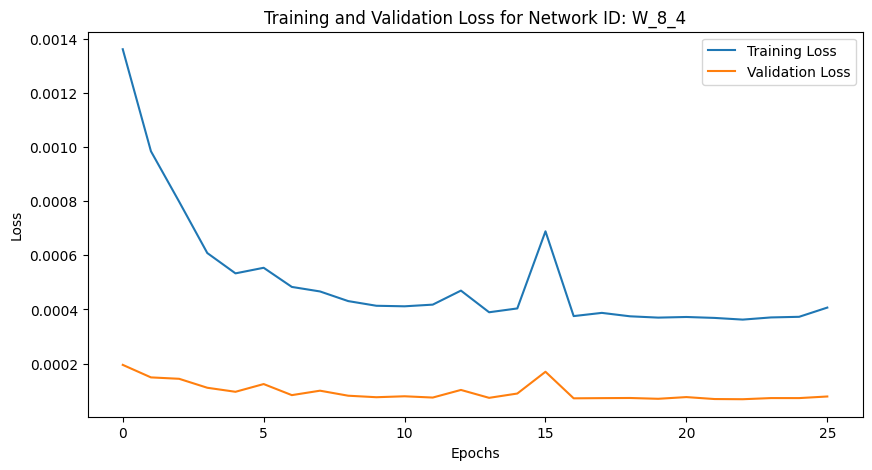

Training Progress:   0%|          | 25/10000 [00:47<5:16:12,  1.90s/epoch, loss=0.000407, val_loss=7.83e-5, patience=1]


Mean Squared Error: 0.0006420434872130241
Iteration: 144, Window Size: 8, Y Days Ahead: 5
X shape: (3795, 8)
y shape: (3795, 5)
Initializing network with layer sizes: [8, 128, 64, 32, 5]
params_W_8_5.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 8), (3036, 5), Validation data shape: (379, 8), (379, 5), Testing data shape: (380, 8), (380, 5)
Parameters loaded from params_W_8_5.npz


Training Progress:   0%|          | 16/10000 [00:30<5:00:23,  1.81s/epoch, loss=0.000478, val_loss=9.3e-5, patience=1] 

Epoch 17/10000, Training Loss: 0.000478, Validation Loss: 0.000093
Early stopping at epoch 17. Best validation loss: 0.000082


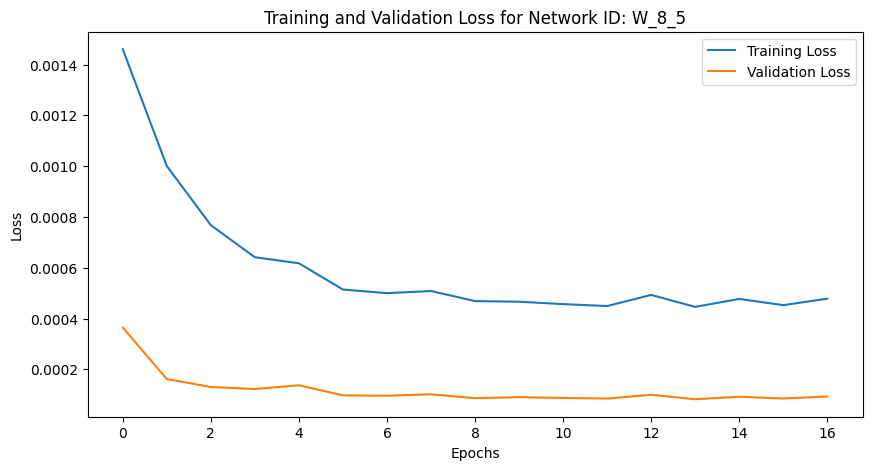

Training Progress:   0%|          | 16/10000 [00:31<5:23:44,  1.95s/epoch, loss=0.000478, val_loss=9.3e-5, patience=1]


Mean Squared Error: 0.0007569617780649743
Iteration: 145, Window Size: 8, Y Days Ahead: 6
X shape: (3794, 8)
y shape: (3794, 6)
Initializing network with layer sizes: [8, 128, 64, 32, 6]
params_W_8_6.npz not found. Using randomly initialized parameters.
Training data shape: (3035, 8), (3035, 6), Validation data shape: (379, 8), (379, 6), Testing data shape: (380, 8), (380, 6)
Parameters loaded from params_W_8_6.npz


Training Progress:   0%|          | 16/10000 [00:30<4:43:20,  1.70s/epoch, loss=0.000534, val_loss=0.000106, patience=1]

Epoch 17/10000, Training Loss: 0.000534, Validation Loss: 0.000106
Early stopping at epoch 17. Best validation loss: 0.000100


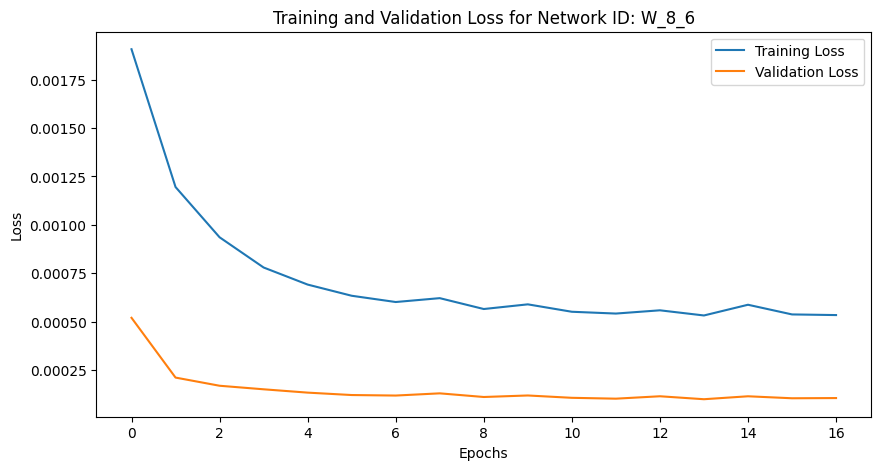

Training Progress:   0%|          | 16/10000 [00:30<5:15:15,  1.89s/epoch, loss=0.000534, val_loss=0.000106, patience=1]


Mean Squared Error: 0.0009173961289335243
Iteration: 146, Window Size: 8, Y Days Ahead: 7
X shape: (3793, 8)
y shape: (3793, 7)
Initializing network with layer sizes: [8, 128, 64, 32, 7]
params_W_8_7.npz not found. Using randomly initialized parameters.
Training data shape: (3034, 8), (3034, 7), Validation data shape: (379, 8), (379, 7), Testing data shape: (380, 8), (380, 7)
Parameters loaded from params_W_8_7.npz


Training Progress:   0%|          | 19/10000 [00:36<5:04:05,  1.83s/epoch, loss=0.000581, val_loss=0.000111, patience=1]

Epoch 20/10000, Training Loss: 0.000581, Validation Loss: 0.000111
Early stopping at epoch 20. Best validation loss: 0.000110


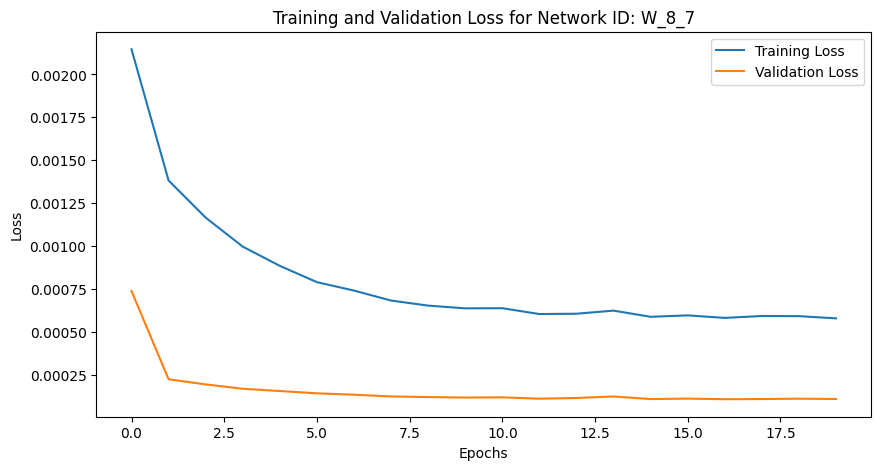

Training Progress:   0%|          | 19/10000 [00:36<5:22:38,  1.94s/epoch, loss=0.000581, val_loss=0.000111, patience=1]


Mean Squared Error: 0.0009505587852265162
Iteration: 147, Window Size: 8, Y Days Ahead: 8
X shape: (3792, 8)
y shape: (3792, 8)
Initializing network with layer sizes: [8, 128, 64, 32, 8]
params_W_8_8.npz not found. Using randomly initialized parameters.
Training data shape: (3033, 8), (3033, 8), Validation data shape: (379, 8), (379, 8), Testing data shape: (380, 8), (380, 8)
Parameters loaded from params_W_8_8.npz


Training Progress:   0%|          | 21/10000 [00:39<4:54:31,  1.77s/epoch, loss=0.000653, val_loss=0.000127, patience=1]

Epoch 22/10000, Training Loss: 0.000653, Validation Loss: 0.000127
Early stopping at epoch 22. Best validation loss: 0.000124


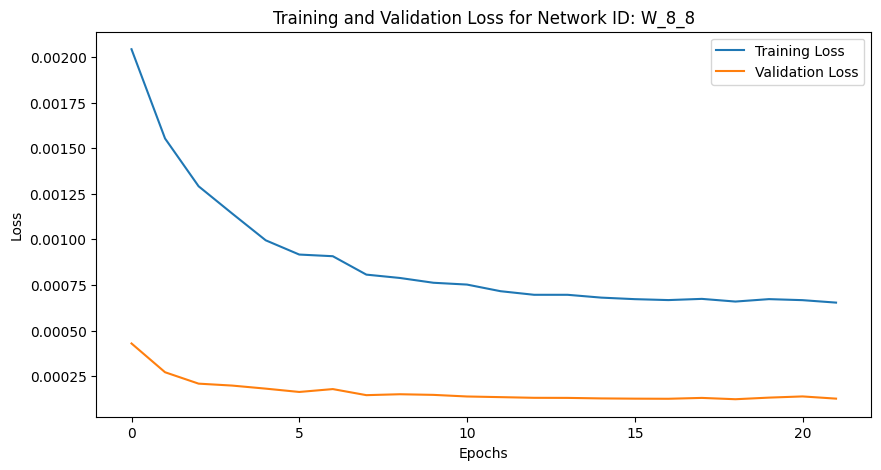

Training Progress:   0%|          | 21/10000 [00:39<5:14:45,  1.89s/epoch, loss=0.000653, val_loss=0.000127, patience=1]


Mean Squared Error: 0.0010571456988472025
Iteration: 148, Window Size: 8, Y Days Ahead: 9
X shape: (3791, 8)
y shape: (3791, 9)
Initializing network with layer sizes: [8, 128, 64, 32, 9]
params_W_8_9.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 8), (3032, 9), Validation data shape: (379, 8), (379, 9), Testing data shape: (380, 8), (380, 9)
Parameters loaded from params_W_8_9.npz


Training Progress:   0%|          | 16/10000 [00:31<5:02:43,  1.82s/epoch, loss=0.000735, val_loss=0.000138, patience=1]

Epoch 17/10000, Training Loss: 0.000735, Validation Loss: 0.000138
Early stopping at epoch 17. Best validation loss: 0.000137


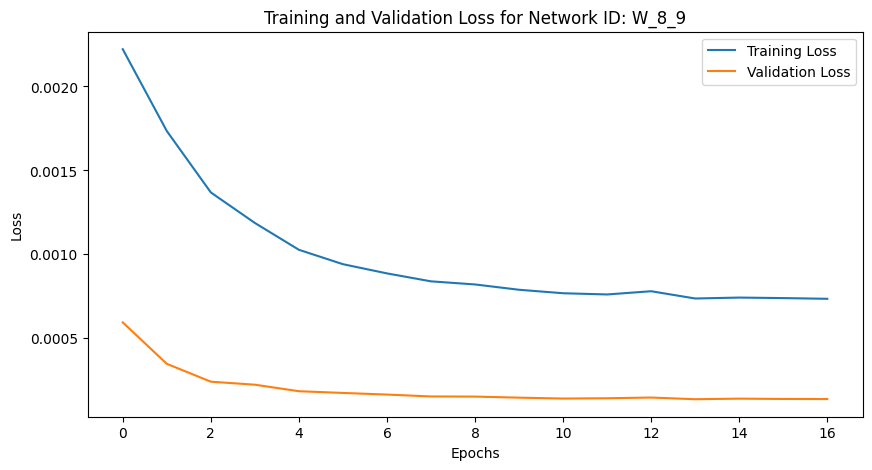

Training Progress:   0%|          | 16/10000 [00:31<5:26:09,  1.96s/epoch, loss=0.000735, val_loss=0.000138, patience=1]


Mean Squared Error: 0.0011709978508728939
Iteration: 149, Window Size: 8, Y Days Ahead: 10
X shape: (3790, 8)
y shape: (3790, 10)
Initializing network with layer sizes: [8, 128, 64, 32, 10]
params_W_8_10.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 8), (3032, 10), Validation data shape: (379, 8), (379, 10), Testing data shape: (379, 8), (379, 10)
Parameters loaded from params_W_8_10.npz


Training Progress:   0%|          | 17/10000 [00:33<5:02:16,  1.82s/epoch, loss=0.000839, val_loss=0.000163, patience=1]

Epoch 18/10000, Training Loss: 0.000839, Validation Loss: 0.000163
Early stopping at epoch 18. Best validation loss: 0.000155


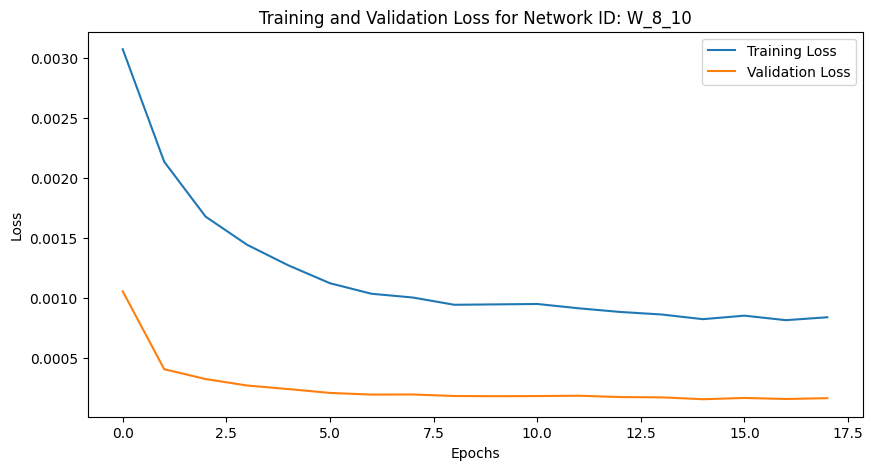

Training Progress:   0%|          | 17/10000 [00:33<5:28:28,  1.97s/epoch, loss=0.000839, val_loss=0.000163, patience=1]


Mean Squared Error: 0.0013149445594476668
Iteration: 150, Window Size: 8, Y Days Ahead: 11
X shape: (3789, 8)
y shape: (3789, 11)
Initializing network with layer sizes: [8, 128, 64, 32, 11]
params_W_8_11.npz not found. Using randomly initialized parameters.
Training data shape: (3031, 8), (3031, 11), Validation data shape: (379, 8), (379, 11), Testing data shape: (379, 8), (379, 11)
Parameters loaded from params_W_8_11.npz


Training Progress:   0%|          | 22/10000 [00:43<5:17:41,  1.91s/epoch, loss=0.000946, val_loss=0.000197, patience=1]

Epoch 23/10000, Training Loss: 0.000946, Validation Loss: 0.000197
Early stopping at epoch 23. Best validation loss: 0.000161


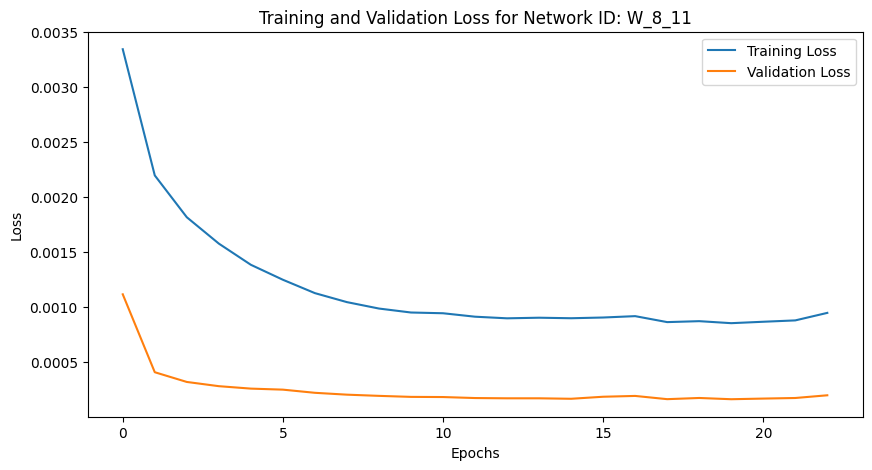

Training Progress:   0%|          | 22/10000 [00:44<5:34:01,  2.01s/epoch, loss=0.000946, val_loss=0.000197, patience=1]


Mean Squared Error: 0.001413838728802478
Iteration: 151, Window Size: 8, Y Days Ahead: 12
X shape: (3788, 8)
y shape: (3788, 12)
Initializing network with layer sizes: [8, 128, 64, 32, 12]
params_W_8_12.npz not found. Using randomly initialized parameters.
Training data shape: (3030, 8), (3030, 12), Validation data shape: (379, 8), (379, 12), Testing data shape: (379, 8), (379, 12)
Parameters loaded from params_W_8_12.npz


Training Progress:   0%|          | 31/10000 [01:00<5:06:36,  1.85s/epoch, loss=0.00089, val_loss=0.000174, patience=1] 

Epoch 32/10000, Training Loss: 0.000890, Validation Loss: 0.000174
Early stopping at epoch 32. Best validation loss: 0.000173


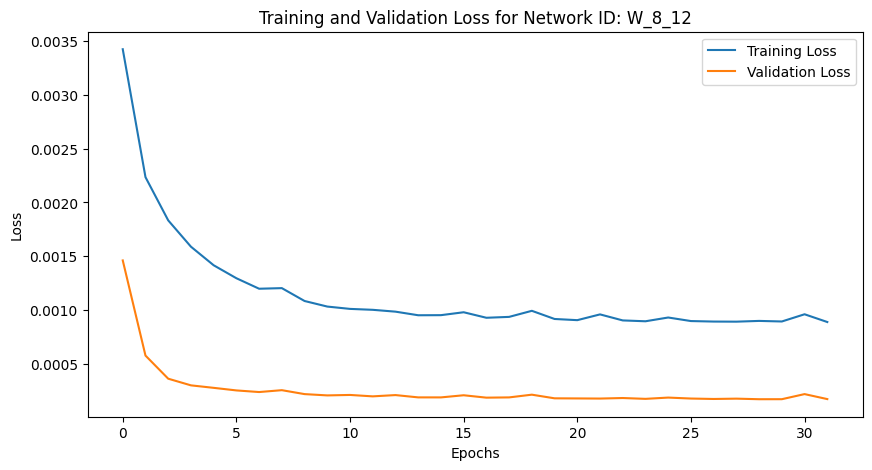

Training Progress:   0%|          | 31/10000 [01:00<5:24:47,  1.95s/epoch, loss=0.00089, val_loss=0.000174, patience=1]


Mean Squared Error: 0.001614294705573668
Iteration: 152, Window Size: 8, Y Days Ahead: 13
X shape: (3787, 8)
y shape: (3787, 13)
Initializing network with layer sizes: [8, 128, 64, 32, 13]
params_W_8_13.npz not found. Using randomly initialized parameters.
Training data shape: (3029, 8), (3029, 13), Validation data shape: (379, 8), (379, 13), Testing data shape: (379, 8), (379, 13)
Parameters loaded from params_W_8_13.npz


Training Progress:   0%|          | 25/10000 [00:49<5:10:32,  1.87s/epoch, loss=0.00103, val_loss=0.000224, patience=1] 

Epoch 26/10000, Training Loss: 0.001029, Validation Loss: 0.000224
Early stopping at epoch 26. Best validation loss: 0.000191


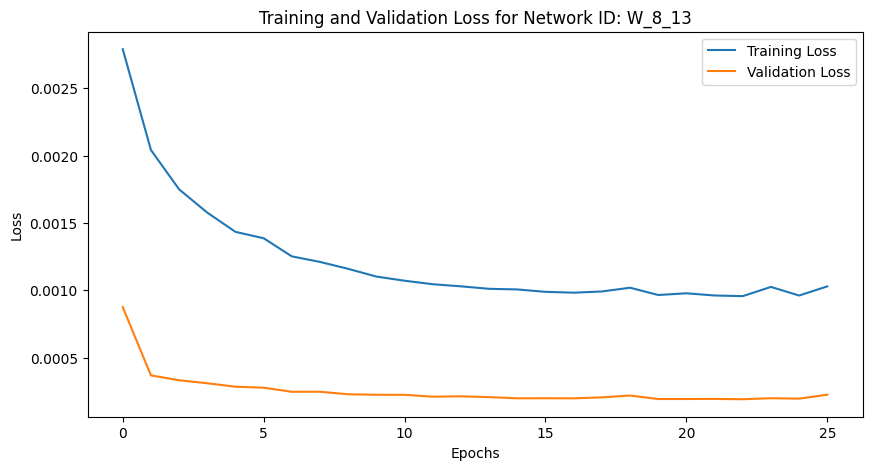

Training Progress:   0%|          | 25/10000 [00:49<5:28:06,  1.97s/epoch, loss=0.00103, val_loss=0.000224, patience=1]


Mean Squared Error: 0.0016470027986689193
Iteration: 153, Window Size: 8, Y Days Ahead: 14
X shape: (3786, 8)
y shape: (3786, 14)
Initializing network with layer sizes: [8, 128, 64, 32, 14]
params_W_8_14.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 8), (3028, 14), Validation data shape: (379, 8), (379, 14), Testing data shape: (379, 8), (379, 14)
Parameters loaded from params_W_8_14.npz


Training Progress:   0%|          | 18/10000 [00:36<5:10:12,  1.86s/epoch, loss=0.00114, val_loss=0.000271, patience=1]

Epoch 19/10000, Training Loss: 0.001142, Validation Loss: 0.000271
Early stopping at epoch 19. Best validation loss: 0.000225


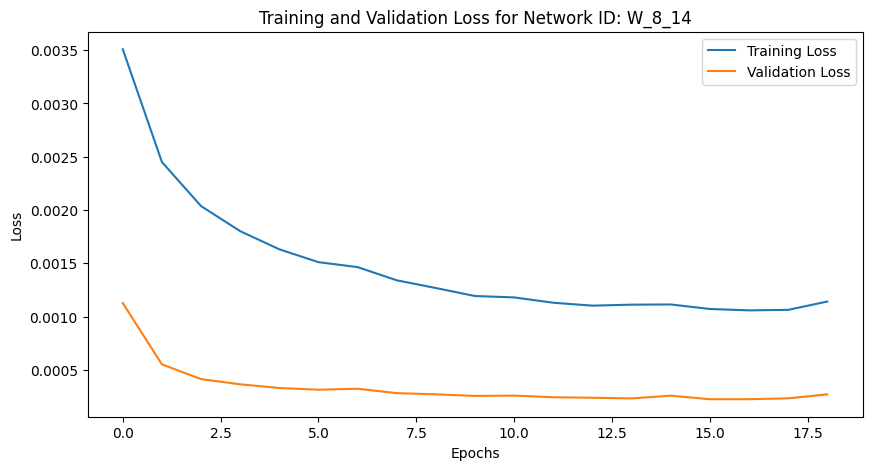

Training Progress:   0%|          | 18/10000 [00:36<5:41:48,  2.05s/epoch, loss=0.00114, val_loss=0.000271, patience=1]


Mean Squared Error: 0.001844666208948066
Iteration: 154, Window Size: 8, Y Days Ahead: 15
X shape: (3785, 8)
y shape: (3785, 15)
Initializing network with layer sizes: [8, 128, 64, 32, 15]
params_W_8_15.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 8), (3028, 15), Validation data shape: (378, 8), (378, 15), Testing data shape: (379, 8), (379, 15)
Parameters loaded from params_W_8_15.npz


Training Progress:   0%|          | 32/10000 [01:03<5:22:21,  1.94s/epoch, loss=0.0011, val_loss=0.000225, patience=1] 

Epoch 33/10000, Training Loss: 0.001102, Validation Loss: 0.000225
Early stopping at epoch 33. Best validation loss: 0.000220


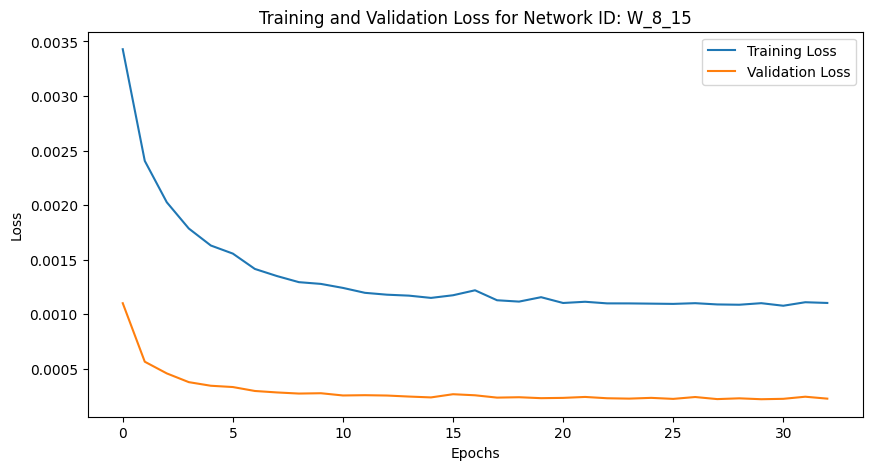

Training Progress:   0%|          | 32/10000 [01:03<5:32:12,  2.00s/epoch, loss=0.0011, val_loss=0.000225, patience=1]


Mean Squared Error: 0.001916694164602901
Iteration: 155, Window Size: 8, Y Days Ahead: 16
X shape: (3784, 8)
y shape: (3784, 16)
Initializing network with layer sizes: [8, 128, 64, 32, 16]
params_W_8_16.npz not found. Using randomly initialized parameters.
Training data shape: (3027, 8), (3027, 16), Validation data shape: (378, 8), (378, 16), Testing data shape: (379, 8), (379, 16)
Parameters loaded from params_W_8_16.npz


Training Progress:   0%|          | 20/10000 [00:40<5:16:42,  1.90s/epoch, loss=0.00122, val_loss=0.000272, patience=1]

Epoch 21/10000, Training Loss: 0.001221, Validation Loss: 0.000272
Early stopping at epoch 21. Best validation loss: 0.000246


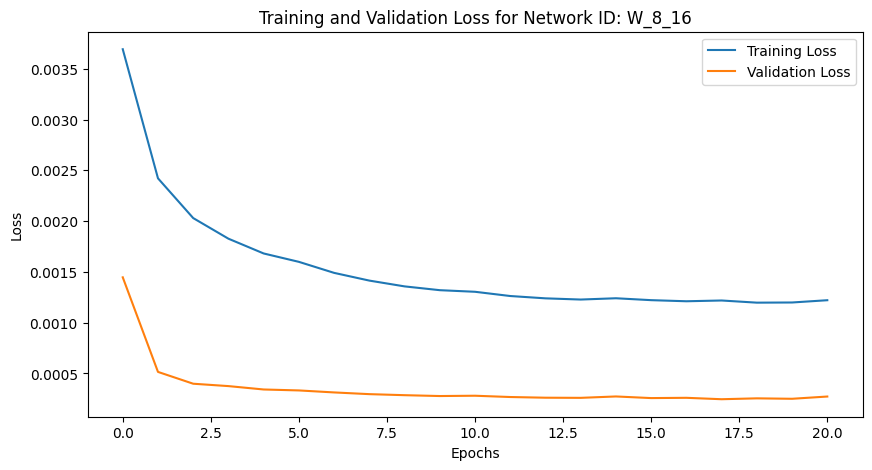

Training Progress:   0%|          | 20/10000 [00:40<5:38:14,  2.03s/epoch, loss=0.00122, val_loss=0.000272, patience=1]


Mean Squared Error: 0.0021514862264137135
Iteration: 156, Window Size: 8, Y Days Ahead: 17
X shape: (3783, 8)
y shape: (3783, 17)
Initializing network with layer sizes: [8, 128, 64, 32, 17]
params_W_8_17.npz not found. Using randomly initialized parameters.
Training data shape: (3026, 8), (3026, 17), Validation data shape: (378, 8), (378, 17), Testing data shape: (379, 8), (379, 17)
Parameters loaded from params_W_8_17.npz


Training Progress:   0%|          | 24/10000 [00:48<5:18:51,  1.92s/epoch, loss=0.00123, val_loss=0.000265, patience=1]

Epoch 25/10000, Training Loss: 0.001228, Validation Loss: 0.000265
Early stopping at epoch 25. Best validation loss: 0.000262


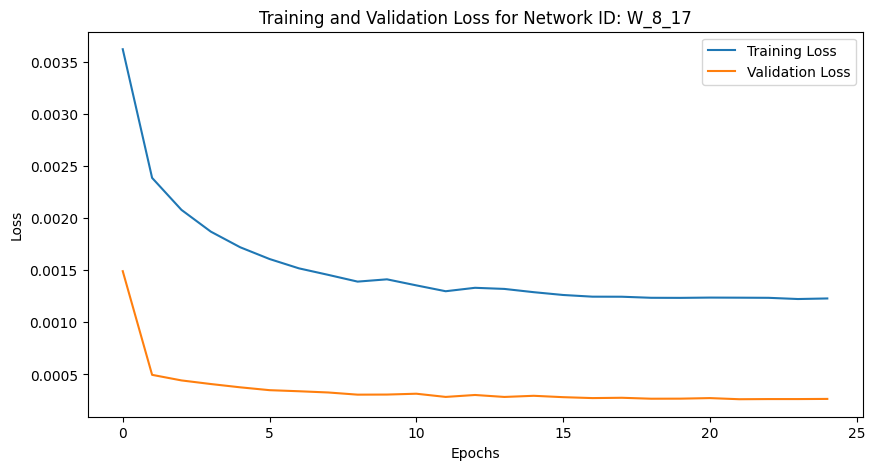

Training Progress:   0%|          | 24/10000 [00:48<5:37:46,  2.03s/epoch, loss=0.00123, val_loss=0.000265, patience=1]


Mean Squared Error: 0.0021698715912289693
Iteration: 157, Window Size: 8, Y Days Ahead: 18
X shape: (3782, 8)
y shape: (3782, 18)
Initializing network with layer sizes: [8, 128, 64, 32, 18]
params_W_8_18.npz not found. Using randomly initialized parameters.
Training data shape: (3025, 8), (3025, 18), Validation data shape: (378, 8), (378, 18), Testing data shape: (379, 8), (379, 18)
Parameters loaded from params_W_8_18.npz


Training Progress:   0%|          | 24/10000 [00:48<5:23:31,  1.95s/epoch, loss=0.0013, val_loss=0.000284, patience=1] 

Epoch 25/10000, Training Loss: 0.001304, Validation Loss: 0.000284
Early stopping at epoch 25. Best validation loss: 0.000274


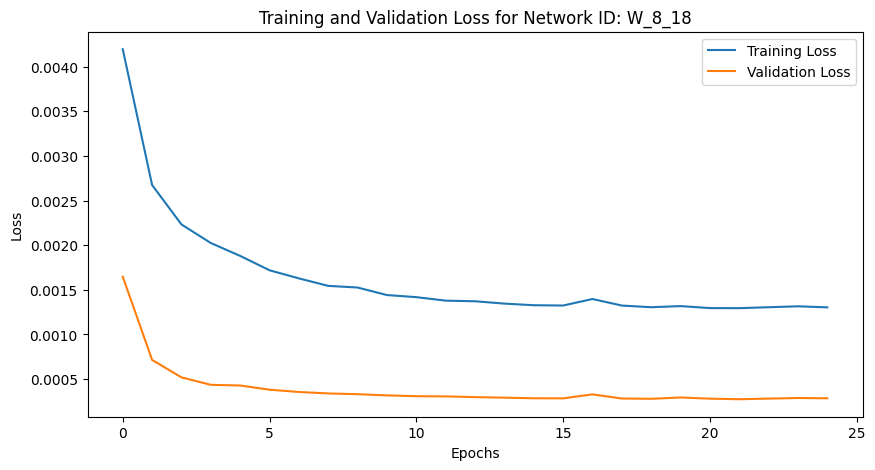

Training Progress:   0%|          | 24/10000 [00:48<5:39:03,  2.04s/epoch, loss=0.0013, val_loss=0.000284, patience=1]


Mean Squared Error: 0.0022830342970559148
Iteration: 158, Window Size: 8, Y Days Ahead: 19
X shape: (3781, 8)
y shape: (3781, 19)
Initializing network with layer sizes: [8, 128, 64, 32, 19]
params_W_8_19.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 8), (3024, 19), Validation data shape: (378, 8), (378, 19), Testing data shape: (379, 8), (379, 19)
Parameters loaded from params_W_8_19.npz


Training Progress:   0%|          | 12/10000 [00:24<5:11:57,  1.87s/epoch, loss=0.00149, val_loss=0.000346, patience=1]

Epoch 13/10000, Training Loss: 0.001487, Validation Loss: 0.000346
Early stopping at epoch 13. Best validation loss: 0.000328


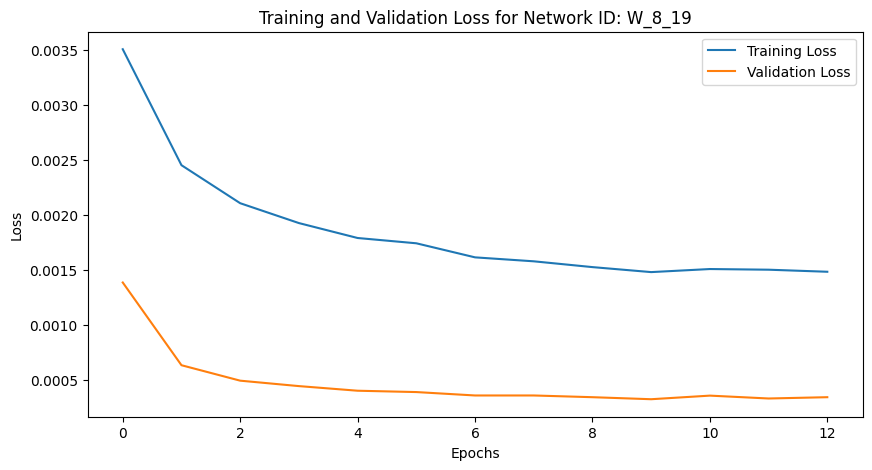

Training Progress:   0%|          | 12/10000 [00:25<5:48:43,  2.09s/epoch, loss=0.00149, val_loss=0.000346, patience=1]


Mean Squared Error: 0.002593239768327533
Iteration: 159, Window Size: 8, Y Days Ahead: 20
X shape: (3780, 8)
y shape: (3780, 20)
Initializing network with layer sizes: [8, 128, 64, 32, 20]
params_W_8_20.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 8), (3024, 20), Validation data shape: (378, 8), (378, 20), Testing data shape: (378, 8), (378, 20)
Parameters loaded from params_W_8_20.npz


Training Progress:   0%|          | 19/10000 [00:39<5:31:54,  2.00s/epoch, loss=0.0015, val_loss=0.000347, patience=1] 

Epoch 20/10000, Training Loss: 0.001500, Validation Loss: 0.000347
Early stopping at epoch 20. Best validation loss: 0.000324


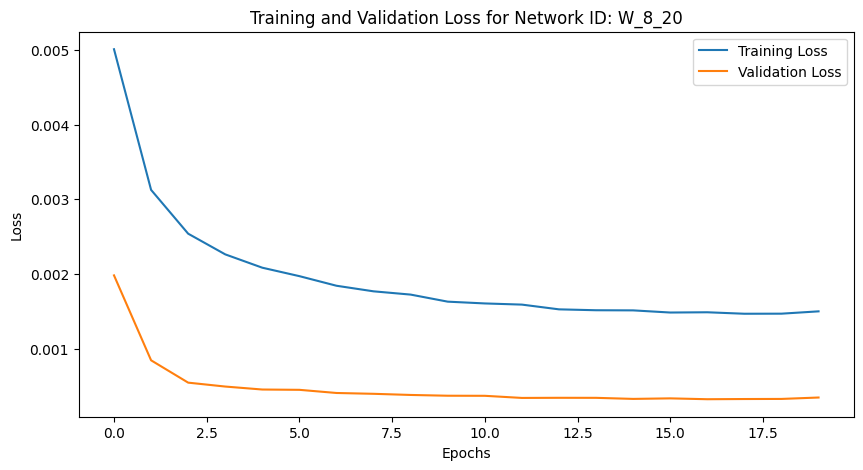

Training Progress:   0%|          | 19/10000 [00:39<5:45:44,  2.08s/epoch, loss=0.0015, val_loss=0.000347, patience=1]


Mean Squared Error: 0.002623418274327495
Iteration: 160, Window Size: 9, Y Days Ahead: 1
X shape: (3798, 9)
y shape: (3798, 1)
Initializing network with layer sizes: [9, 128, 64, 32, 1]
params_W_9_1.npz not found. Using randomly initialized parameters.
Training data shape: (3038, 9), (3038, 1), Validation data shape: (380, 9), (380, 1), Testing data shape: (380, 9), (380, 1)
Parameters loaded from params_W_9_1.npz


Training Progress:   0%|          | 17/10000 [00:32<4:58:57,  1.80s/epoch, loss=0.000275, val_loss=6.87e-5, patience=1]

Epoch 18/10000, Training Loss: 0.000275, Validation Loss: 0.000069
Early stopping at epoch 18. Best validation loss: 0.000034


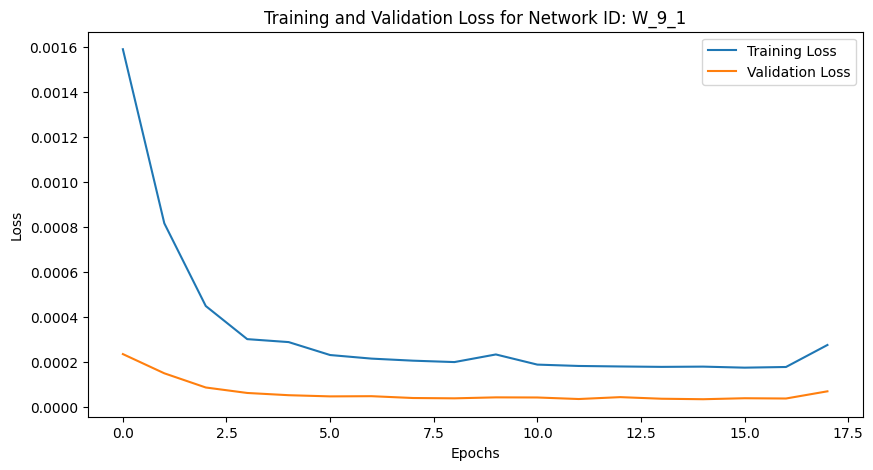

Training Progress:   0%|          | 17/10000 [00:33<5:25:10,  1.95s/epoch, loss=0.000275, val_loss=6.87e-5, patience=1]


Mean Squared Error: 0.00035652084488847346
Iteration: 161, Window Size: 9, Y Days Ahead: 2
X shape: (3797, 9)
y shape: (3797, 2)
Initializing network with layer sizes: [9, 128, 64, 32, 2]
params_W_9_2.npz not found. Using randomly initialized parameters.
Training data shape: (3037, 9), (3037, 2), Validation data shape: (380, 9), (380, 2), Testing data shape: (380, 9), (380, 2)
Parameters loaded from params_W_9_2.npz


Training Progress:   0%|          | 11/10000 [00:21<4:59:36,  1.80s/epoch, loss=0.000303, val_loss=7.98e-5, patience=1]

Epoch 12/10000, Training Loss: 0.000303, Validation Loss: 0.000080
Early stopping at epoch 12. Best validation loss: 0.000051


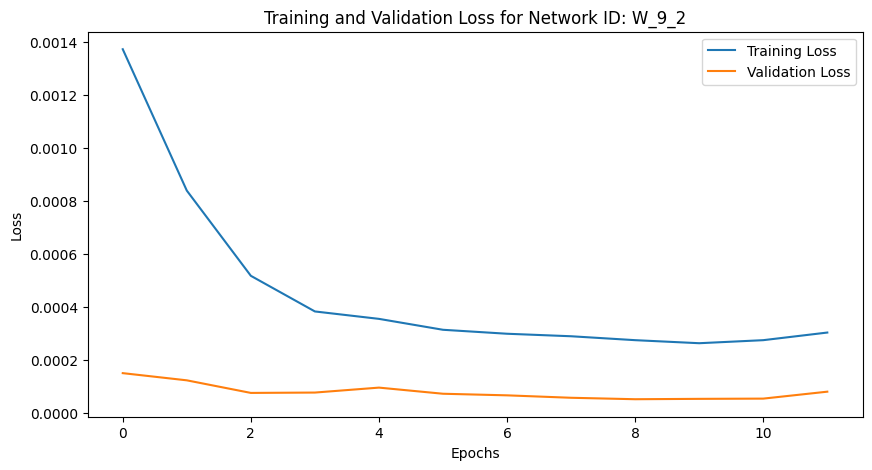

Training Progress:   0%|          | 11/10000 [00:22<5:35:41,  2.02s/epoch, loss=0.000303, val_loss=7.98e-5, patience=1]


Mean Squared Error: 0.0004502598395400891
Iteration: 162, Window Size: 9, Y Days Ahead: 3
X shape: (3796, 9)
y shape: (3796, 3)
Initializing network with layer sizes: [9, 128, 64, 32, 3]
params_W_9_3.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 9), (3036, 3), Validation data shape: (380, 9), (380, 3), Testing data shape: (380, 9), (380, 3)
Parameters loaded from params_W_9_3.npz


Training Progress:   0%|          | 10/10000 [00:19<4:59:10,  1.80s/epoch, loss=0.000336, val_loss=7.07e-5, patience=1]

Epoch 11/10000, Training Loss: 0.000336, Validation Loss: 0.000071
Early stopping at epoch 11. Best validation loss: 0.000065


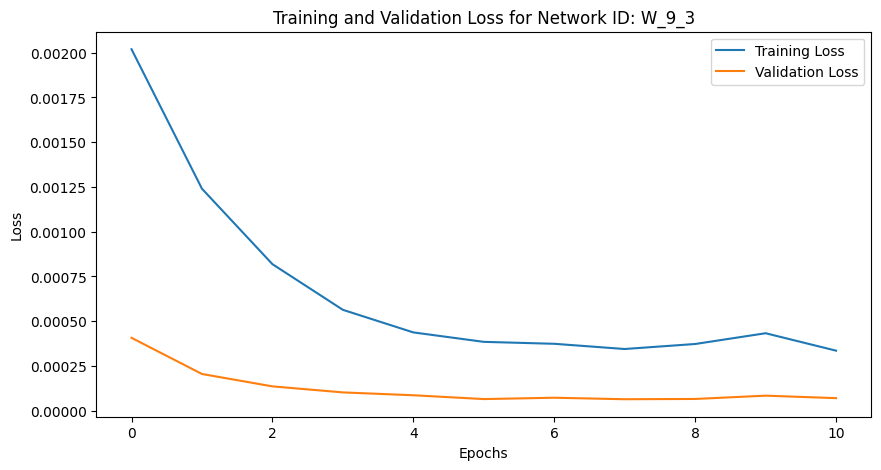

Training Progress:   0%|          | 10/10000 [00:19<5:29:36,  1.98s/epoch, loss=0.000336, val_loss=7.07e-5, patience=1]


Mean Squared Error: 0.0005743553750849655
Iteration: 163, Window Size: 9, Y Days Ahead: 4
X shape: (3795, 9)
y shape: (3795, 4)
Initializing network with layer sizes: [9, 128, 64, 32, 4]
params_W_9_4.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 9), (3036, 4), Validation data shape: (379, 9), (379, 4), Testing data shape: (380, 9), (380, 4)
Parameters loaded from params_W_9_4.npz


Training Progress:   0%|          | 11/10000 [00:22<4:56:22,  1.78s/epoch, loss=0.000406, val_loss=9.37e-5, patience=1]

Epoch 12/10000, Training Loss: 0.000406, Validation Loss: 0.000094
Early stopping at epoch 12. Best validation loss: 0.000076


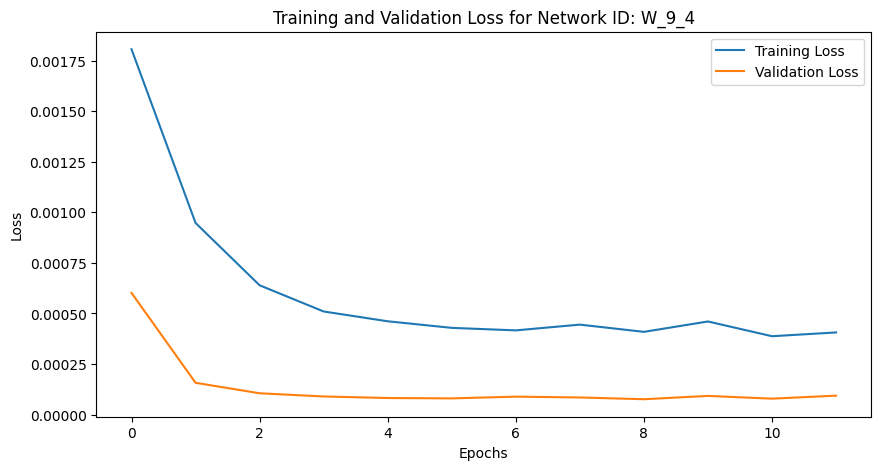

Training Progress:   0%|          | 11/10000 [00:22<5:39:33,  2.04s/epoch, loss=0.000406, val_loss=9.37e-5, patience=1]


Mean Squared Error: 0.000652337425573128
Iteration: 164, Window Size: 9, Y Days Ahead: 5
X shape: (3794, 9)
y shape: (3794, 5)
Initializing network with layer sizes: [9, 128, 64, 32, 5]
params_W_9_5.npz not found. Using randomly initialized parameters.
Training data shape: (3035, 9), (3035, 5), Validation data shape: (379, 9), (379, 5), Testing data shape: (380, 9), (380, 5)
Parameters loaded from params_W_9_5.npz


Training Progress:   0%|          | 20/10000 [00:38<5:10:09,  1.86s/epoch, loss=0.000444, val_loss=8.37e-5, patience=1] 

Epoch 21/10000, Training Loss: 0.000444, Validation Loss: 0.000084
Early stopping at epoch 21. Best validation loss: 0.000082


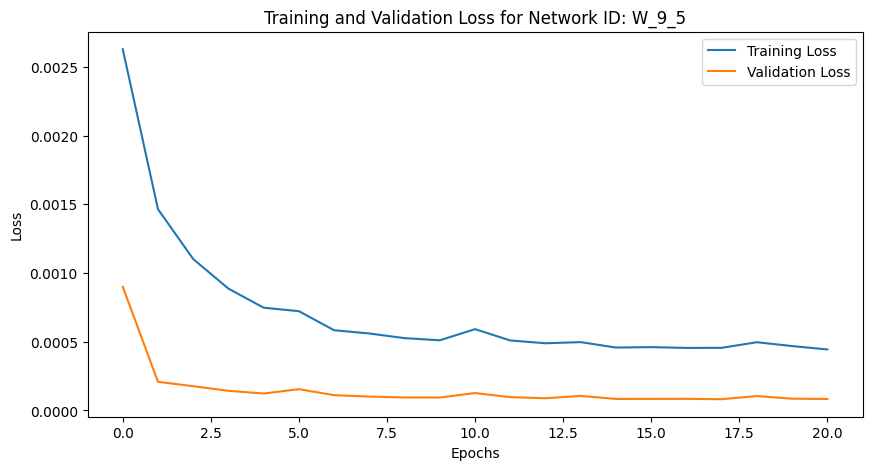

Training Progress:   0%|          | 20/10000 [00:38<5:20:46,  1.93s/epoch, loss=0.000444, val_loss=8.37e-5, patience=1]


Mean Squared Error: 0.0007438832262018815
Iteration: 165, Window Size: 9, Y Days Ahead: 6
X shape: (3793, 9)
y shape: (3793, 6)
Initializing network with layer sizes: [9, 128, 64, 32, 6]
params_W_9_6.npz not found. Using randomly initialized parameters.
Training data shape: (3034, 9), (3034, 6), Validation data shape: (379, 9), (379, 6), Testing data shape: (380, 9), (380, 6)
Parameters loaded from params_W_9_6.npz


Training Progress:   0%|          | 15/10000 [00:29<4:54:52,  1.77s/epoch, loss=0.000536, val_loss=0.00011, patience=1] 

Epoch 16/10000, Training Loss: 0.000536, Validation Loss: 0.000110
Early stopping at epoch 16. Best validation loss: 0.000099


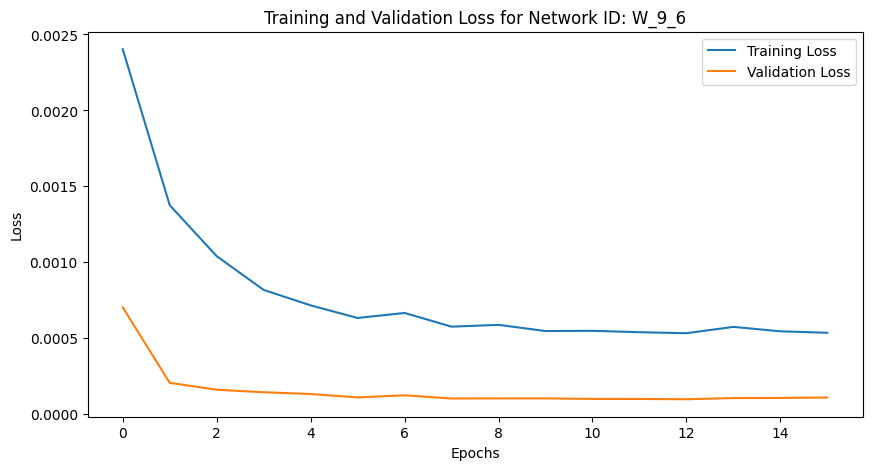

Training Progress:   0%|          | 15/10000 [00:29<5:25:23,  1.96s/epoch, loss=0.000536, val_loss=0.00011, patience=1]


Mean Squared Error: 0.0008348969632937594
Iteration: 166, Window Size: 9, Y Days Ahead: 7
X shape: (3792, 9)
y shape: (3792, 7)
Initializing network with layer sizes: [9, 128, 64, 32, 7]
params_W_9_7.npz not found. Using randomly initialized parameters.
Training data shape: (3033, 9), (3033, 7), Validation data shape: (379, 9), (379, 7), Testing data shape: (380, 9), (380, 7)
Parameters loaded from params_W_9_7.npz


Training Progress:   0%|          | 23/10000 [00:43<5:13:18,  1.88s/epoch, loss=0.000576, val_loss=0.000108, patience=1]

Epoch 24/10000, Training Loss: 0.000576, Validation Loss: 0.000108
Early stopping at epoch 24. Best validation loss: 0.000107


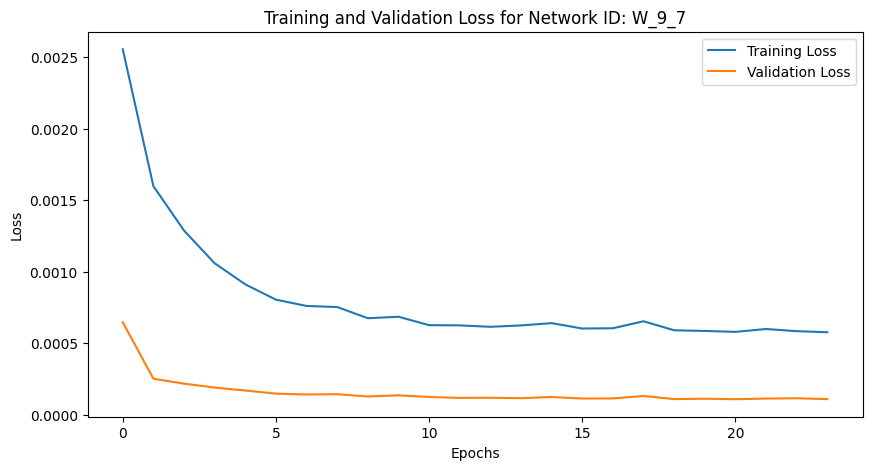

Training Progress:   0%|          | 23/10000 [00:44<5:19:11,  1.92s/epoch, loss=0.000576, val_loss=0.000108, patience=1]


Mean Squared Error: 0.0009713053418142951
Iteration: 167, Window Size: 9, Y Days Ahead: 8
X shape: (3791, 9)
y shape: (3791, 8)
Initializing network with layer sizes: [9, 128, 64, 32, 8]
params_W_9_8.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 9), (3032, 8), Validation data shape: (379, 9), (379, 8), Testing data shape: (380, 9), (380, 8)
Parameters loaded from params_W_9_8.npz


Training Progress:   0%|          | 18/10000 [00:35<5:00:24,  1.81s/epoch, loss=0.000655, val_loss=0.000125, patience=1]

Epoch 19/10000, Training Loss: 0.000655, Validation Loss: 0.000125
Early stopping at epoch 19. Best validation loss: 0.000123


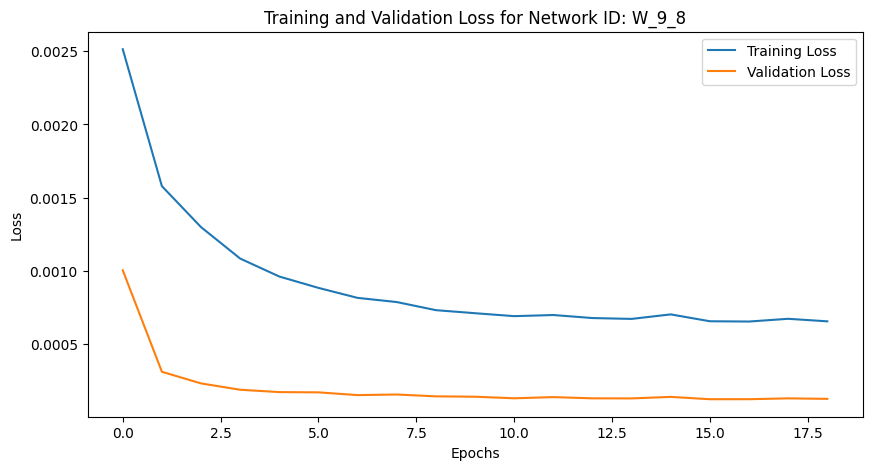

Training Progress:   0%|          | 18/10000 [00:36<5:38:36,  2.04s/epoch, loss=0.000655, val_loss=0.000125, patience=1]


Mean Squared Error: 0.0010827051717311564
Iteration: 168, Window Size: 9, Y Days Ahead: 9
X shape: (3790, 9)
y shape: (3790, 9)
Initializing network with layer sizes: [9, 128, 64, 32, 9]
params_W_9_9.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 9), (3032, 9), Validation data shape: (379, 9), (379, 9), Testing data shape: (379, 9), (379, 9)
Parameters loaded from params_W_9_9.npz


Training Progress:   0%|          | 12/10000 [00:25<4:59:12,  1.80s/epoch, loss=0.000774, val_loss=0.000153, patience=1]

Epoch 13/10000, Training Loss: 0.000774, Validation Loss: 0.000153
Early stopping at epoch 13. Best validation loss: 0.000150


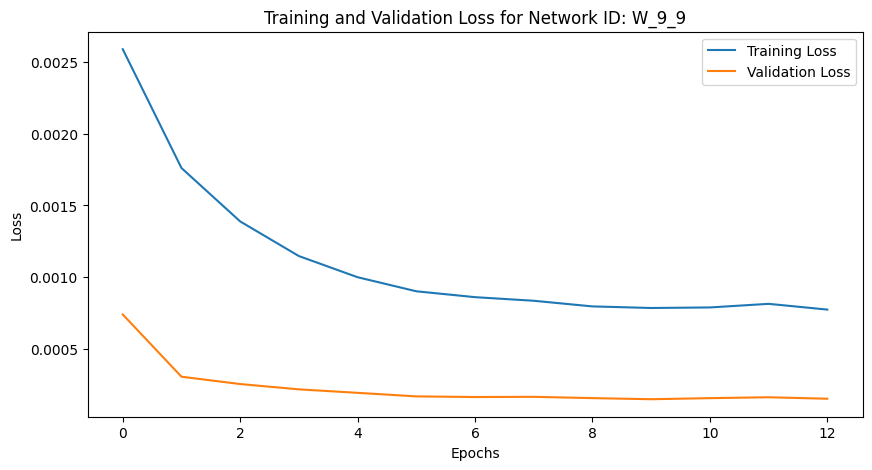

Training Progress:   0%|          | 12/10000 [00:25<5:52:34,  2.12s/epoch, loss=0.000774, val_loss=0.000153, patience=1]


Mean Squared Error: 0.0012743645027028243
Iteration: 169, Window Size: 9, Y Days Ahead: 10
X shape: (3789, 9)
y shape: (3789, 10)
Initializing network with layer sizes: [9, 128, 64, 32, 10]
params_W_9_10.npz not found. Using randomly initialized parameters.
Training data shape: (3031, 9), (3031, 10), Validation data shape: (379, 9), (379, 10), Testing data shape: (379, 9), (379, 10)
Parameters loaded from params_W_9_10.npz


Training Progress:   0%|          | 17/10000 [00:34<5:12:55,  1.88s/epoch, loss=0.00081, val_loss=0.000156, patience=1] 

Epoch 18/10000, Training Loss: 0.000810, Validation Loss: 0.000156
Early stopping at epoch 18. Best validation loss: 0.000153


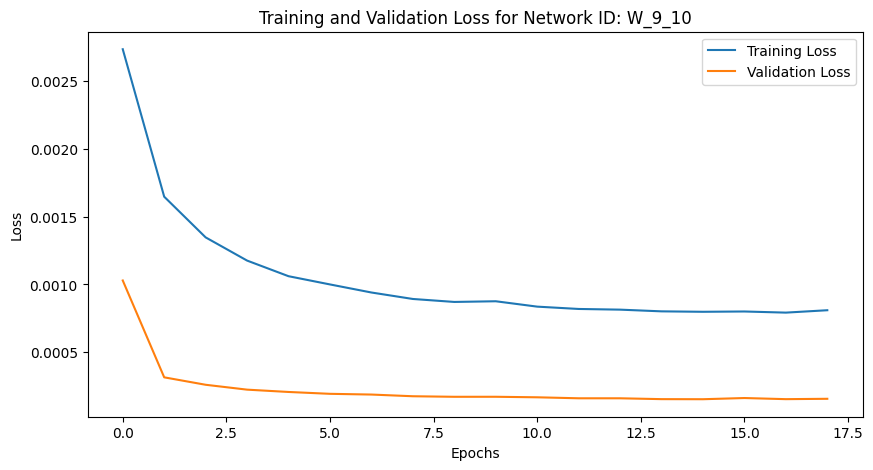

Training Progress:   0%|          | 17/10000 [00:34<5:39:21,  2.04s/epoch, loss=0.00081, val_loss=0.000156, patience=1]


Mean Squared Error: 0.0013194748117604578
Iteration: 170, Window Size: 9, Y Days Ahead: 11
X shape: (3788, 9)
y shape: (3788, 11)
Initializing network with layer sizes: [9, 128, 64, 32, 11]
params_W_9_11.npz not found. Using randomly initialized parameters.
Training data shape: (3030, 9), (3030, 11), Validation data shape: (379, 9), (379, 11), Testing data shape: (379, 9), (379, 11)
Parameters loaded from params_W_9_11.npz


Training Progress:   0%|          | 23/10000 [00:45<5:03:16,  1.82s/epoch, loss=0.000847, val_loss=0.000162, patience=1]

Epoch 24/10000, Training Loss: 0.000847, Validation Loss: 0.000162
Early stopping at epoch 24. Best validation loss: 0.000157


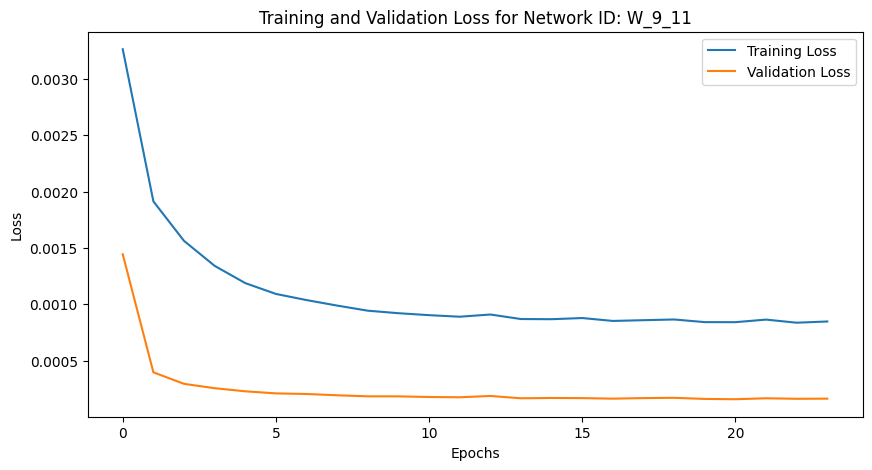

Training Progress:   0%|          | 23/10000 [00:46<5:34:09,  2.01s/epoch, loss=0.000847, val_loss=0.000162, patience=1]


Mean Squared Error: 0.0014483984908859283
Iteration: 171, Window Size: 9, Y Days Ahead: 12
X shape: (3787, 9)
y shape: (3787, 12)
Initializing network with layer sizes: [9, 128, 64, 32, 12]
params_W_9_12.npz not found. Using randomly initialized parameters.
Training data shape: (3029, 9), (3029, 12), Validation data shape: (379, 9), (379, 12), Testing data shape: (379, 9), (379, 12)
Parameters loaded from params_W_9_12.npz


Training Progress:   0%|          | 17/10000 [00:33<5:05:41,  1.84s/epoch, loss=0.000948, val_loss=0.000191, patience=1]

Epoch 18/10000, Training Loss: 0.000948, Validation Loss: 0.000191
Early stopping at epoch 18. Best validation loss: 0.000187


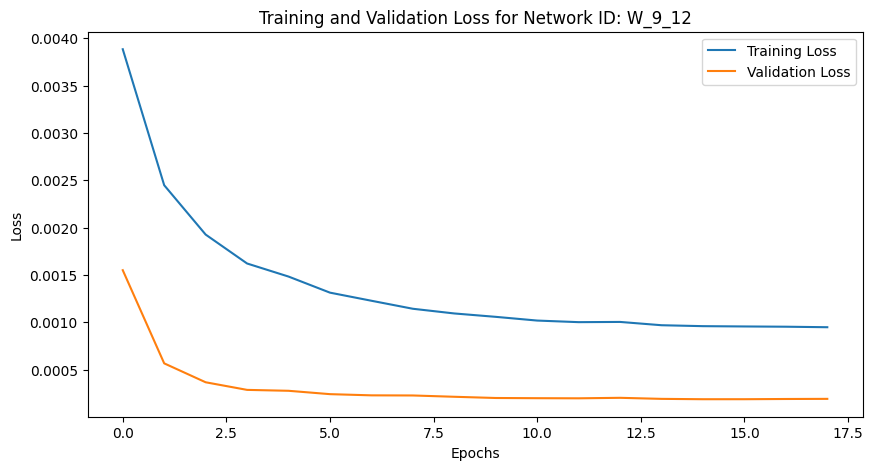

Training Progress:   0%|          | 17/10000 [00:33<5:32:05,  2.00s/epoch, loss=0.000948, val_loss=0.000191, patience=1]


Mean Squared Error: 0.0015692214143230348
Iteration: 172, Window Size: 9, Y Days Ahead: 13
X shape: (3786, 9)
y shape: (3786, 13)
Initializing network with layer sizes: [9, 128, 64, 32, 13]
params_W_9_13.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 9), (3028, 13), Validation data shape: (379, 9), (379, 13), Testing data shape: (379, 9), (379, 13)
Parameters loaded from params_W_9_13.npz


Training Progress:   0%|          | 20/10000 [00:40<5:06:38,  1.84s/epoch, loss=0.00105, val_loss=0.000218, patience=1] 

Epoch 21/10000, Training Loss: 0.001054, Validation Loss: 0.000218
Early stopping at epoch 21. Best validation loss: 0.000196


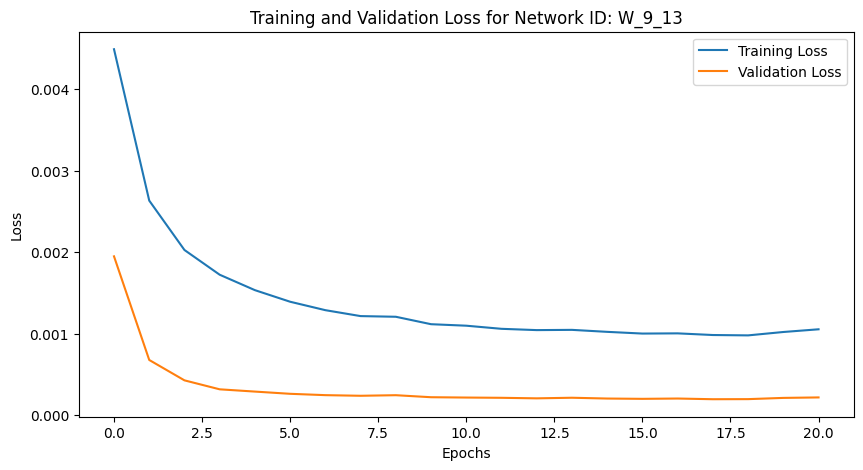

Training Progress:   0%|          | 20/10000 [00:40<5:35:26,  2.02s/epoch, loss=0.00105, val_loss=0.000218, patience=1]


Mean Squared Error: 0.0016161262542855603
Iteration: 173, Window Size: 9, Y Days Ahead: 14
X shape: (3785, 9)
y shape: (3785, 14)
Initializing network with layer sizes: [9, 128, 64, 32, 14]
params_W_9_14.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 9), (3028, 14), Validation data shape: (378, 9), (378, 14), Testing data shape: (379, 9), (379, 14)
Parameters loaded from params_W_9_14.npz


Training Progress:   0%|          | 16/10000 [00:32<5:14:30,  1.89s/epoch, loss=0.00108, val_loss=0.000235, patience=1]

Epoch 17/10000, Training Loss: 0.001083, Validation Loss: 0.000235
Early stopping at epoch 17. Best validation loss: 0.000224


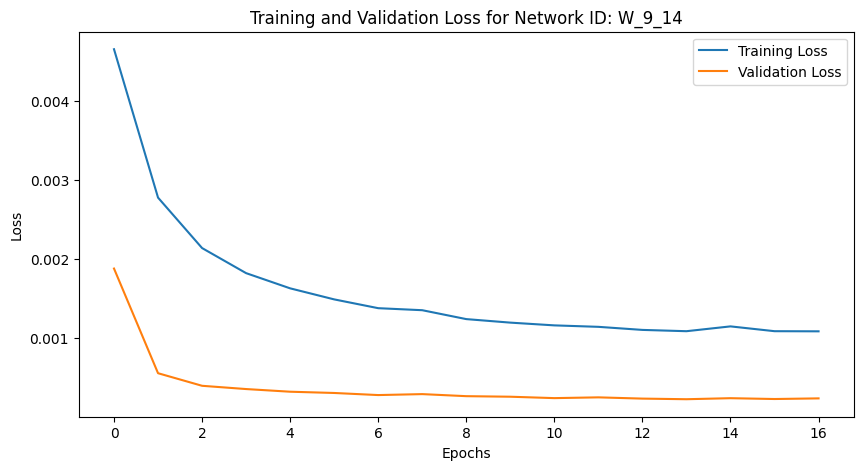

Training Progress:   0%|          | 16/10000 [00:32<5:40:02,  2.04s/epoch, loss=0.00108, val_loss=0.000235, patience=1]


Mean Squared Error: 0.00174404922333842
Iteration: 174, Window Size: 9, Y Days Ahead: 15
X shape: (3784, 9)
y shape: (3784, 15)
Initializing network with layer sizes: [9, 128, 64, 32, 15]
params_W_9_15.npz not found. Using randomly initialized parameters.
Training data shape: (3027, 9), (3027, 15), Validation data shape: (378, 9), (378, 15), Testing data shape: (379, 9), (379, 15)
Parameters loaded from params_W_9_15.npz


Training Progress:   0%|          | 31/10000 [01:01<5:24:38,  1.95s/epoch, loss=0.00109, val_loss=0.000224, patience=1]

Epoch 32/10000, Training Loss: 0.001090, Validation Loss: 0.000224
Early stopping at epoch 32. Best validation loss: 0.000215


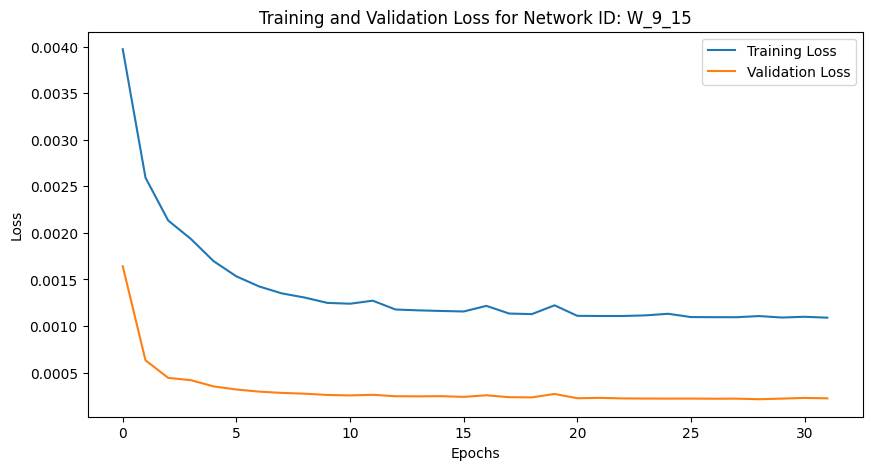

Training Progress:   0%|          | 31/10000 [01:02<5:32:47,  2.00s/epoch, loss=0.00109, val_loss=0.000224, patience=1]


Mean Squared Error: 0.0019239802620242713
Iteration: 175, Window Size: 9, Y Days Ahead: 16
X shape: (3783, 9)
y shape: (3783, 16)
Initializing network with layer sizes: [9, 128, 64, 32, 16]
params_W_9_16.npz not found. Using randomly initialized parameters.
Training data shape: (3026, 9), (3026, 16), Validation data shape: (378, 9), (378, 16), Testing data shape: (379, 9), (379, 16)
Parameters loaded from params_W_9_16.npz


Training Progress:   0%|          | 32/10000 [01:00<5:05:51,  1.84s/epoch, loss=0.00121, val_loss=0.000239, patience=1]

Epoch 33/10000, Training Loss: 0.001207, Validation Loss: 0.000239
Early stopping at epoch 33. Best validation loss: 0.000236


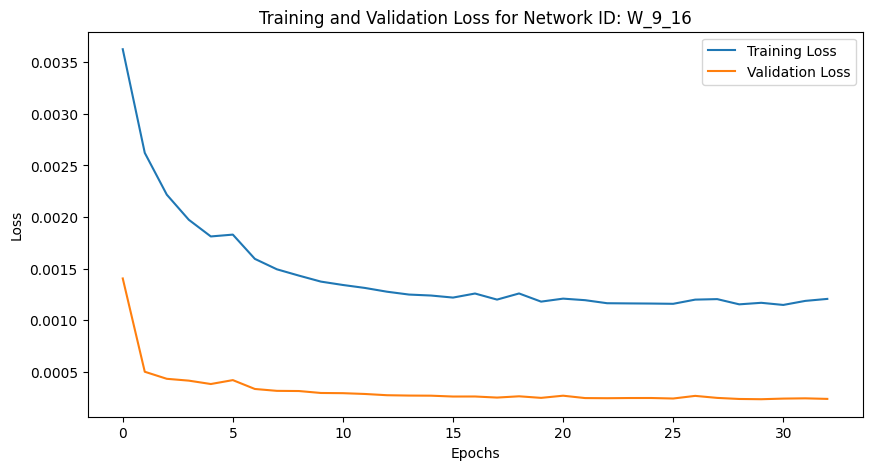

Training Progress:   0%|          | 32/10000 [01:00<5:16:00,  1.90s/epoch, loss=0.00121, val_loss=0.000239, patience=1]


Mean Squared Error: 0.0020484380069656924
Iteration: 176, Window Size: 9, Y Days Ahead: 17
X shape: (3782, 9)
y shape: (3782, 17)
Initializing network with layer sizes: [9, 128, 64, 32, 17]
params_W_9_17.npz not found. Using randomly initialized parameters.
Training data shape: (3025, 9), (3025, 17), Validation data shape: (378, 9), (378, 17), Testing data shape: (379, 9), (379, 17)
Parameters loaded from params_W_9_17.npz


Training Progress:   0%|          | 24/10000 [00:45<5:06:07,  1.84s/epoch, loss=0.00124, val_loss=0.000262, patience=1]

Epoch 25/10000, Training Loss: 0.001244, Validation Loss: 0.000262
Early stopping at epoch 25. Best validation loss: 0.000257


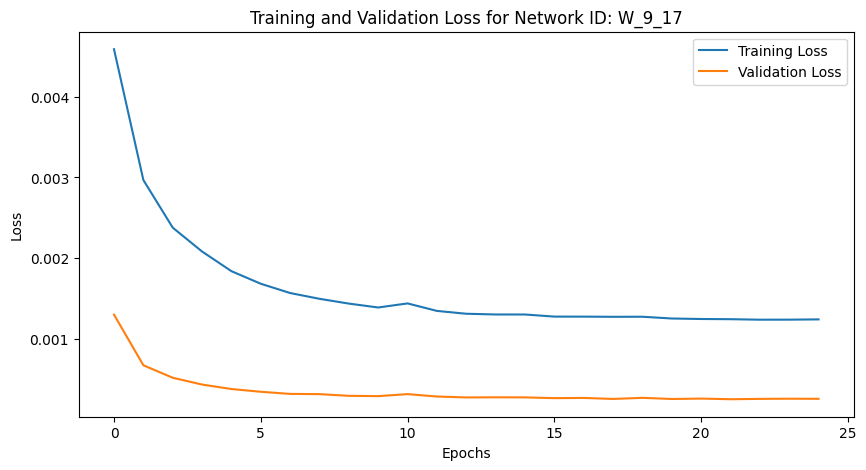

Training Progress:   0%|          | 24/10000 [00:45<5:14:11,  1.89s/epoch, loss=0.00124, val_loss=0.000262, patience=1]


Mean Squared Error: 0.0021031180797046567
Iteration: 177, Window Size: 9, Y Days Ahead: 18
X shape: (3781, 9)
y shape: (3781, 18)
Initializing network with layer sizes: [9, 128, 64, 32, 18]
params_W_9_18.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 9), (3024, 18), Validation data shape: (378, 9), (378, 18), Testing data shape: (379, 9), (379, 18)
Parameters loaded from params_W_9_18.npz


Training Progress:   0%|          | 25/10000 [00:49<5:18:23,  1.92s/epoch, loss=0.00131, val_loss=0.000288, patience=1]

Epoch 26/10000, Training Loss: 0.001312, Validation Loss: 0.000288
Early stopping at epoch 26. Best validation loss: 0.000280


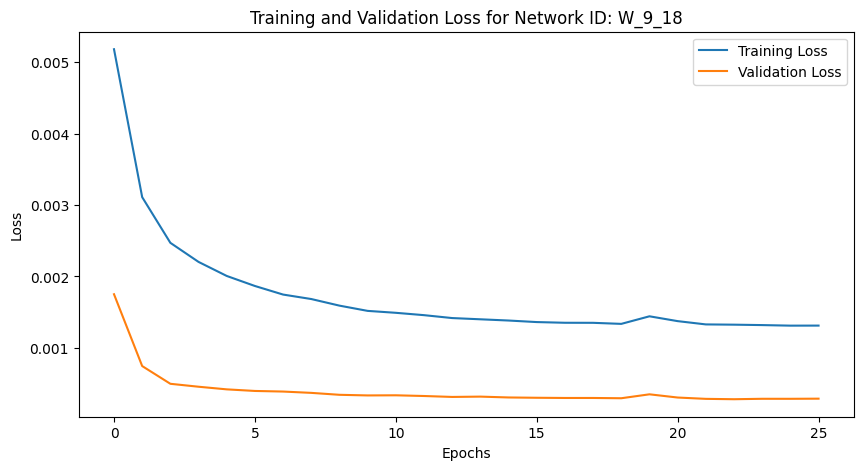

Training Progress:   0%|          | 25/10000 [00:49<5:28:34,  1.98s/epoch, loss=0.00131, val_loss=0.000288, patience=1]


Mean Squared Error: 0.0022811934782537993
Iteration: 178, Window Size: 9, Y Days Ahead: 19
X shape: (3780, 9)
y shape: (3780, 19)
Initializing network with layer sizes: [9, 128, 64, 32, 19]
params_W_9_19.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 9), (3024, 19), Validation data shape: (378, 9), (378, 19), Testing data shape: (378, 9), (378, 19)
Parameters loaded from params_W_9_19.npz


Training Progress:   0%|          | 20/10000 [00:39<5:21:10,  1.93s/epoch, loss=0.00141, val_loss=0.000323, patience=1]

Epoch 21/10000, Training Loss: 0.001415, Validation Loss: 0.000323
Early stopping at epoch 21. Best validation loss: 0.000299


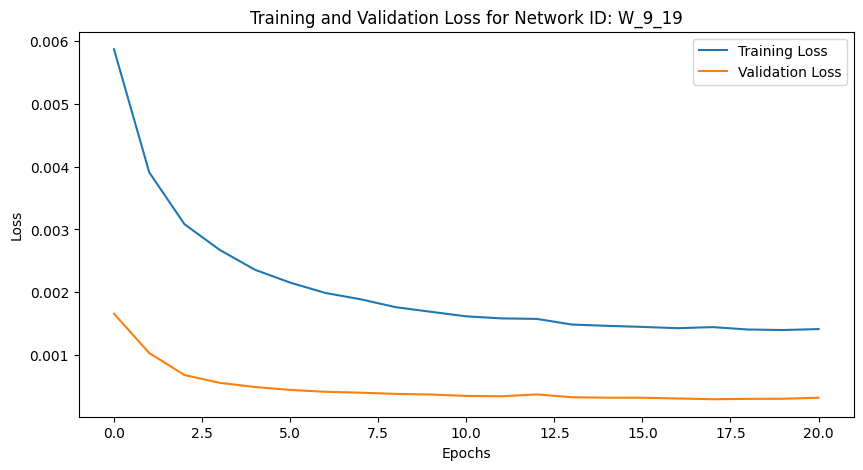

Training Progress:   0%|          | 20/10000 [00:39<5:31:38,  1.99s/epoch, loss=0.00141, val_loss=0.000323, patience=1]


Mean Squared Error: 0.002497914305857655
Iteration: 179, Window Size: 9, Y Days Ahead: 20
X shape: (3779, 9)
y shape: (3779, 20)
Initializing network with layer sizes: [9, 128, 64, 32, 20]
params_W_9_20.npz not found. Using randomly initialized parameters.
Training data shape: (3023, 9), (3023, 20), Validation data shape: (378, 9), (378, 20), Testing data shape: (378, 9), (378, 20)
Parameters loaded from params_W_9_20.npz


Training Progress:   0%|          | 23/10000 [00:45<5:03:48,  1.83s/epoch, loss=0.00152, val_loss=0.000345, patience=1]

Epoch 24/10000, Training Loss: 0.001519, Validation Loss: 0.000345
Early stopping at epoch 24. Best validation loss: 0.000314


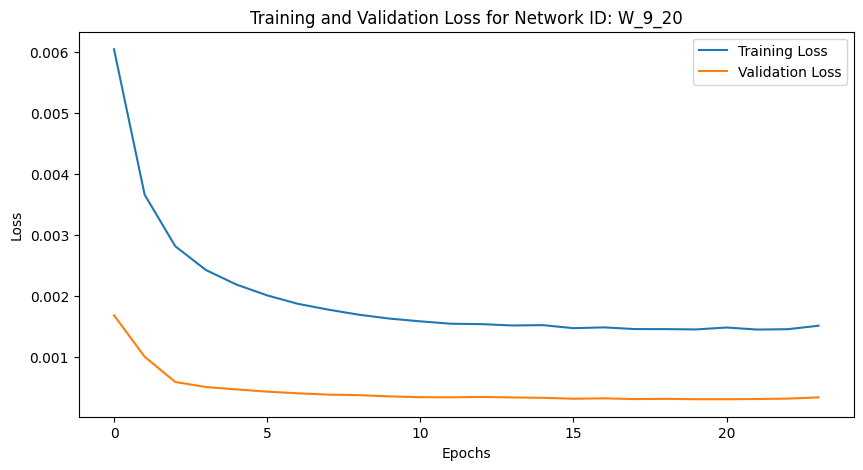

Training Progress:   0%|          | 23/10000 [00:45<5:32:16,  2.00s/epoch, loss=0.00152, val_loss=0.000345, patience=1]


Mean Squared Error: 0.002639539592064053
Iteration: 180, Window Size: 10, Y Days Ahead: 1
X shape: (3797, 10)
y shape: (3797, 1)
Initializing network with layer sizes: [10, 128, 64, 32, 1]
params_W_10_1.npz not found. Using randomly initialized parameters.
Training data shape: (3037, 10), (3037, 1), Validation data shape: (380, 10), (380, 1), Testing data shape: (380, 10), (380, 1)
Parameters loaded from params_W_10_1.npz


Training Progress:   0%|          | 20/10000 [00:40<5:24:02,  1.95s/epoch, loss=0.000176, val_loss=3.62e-5, patience=1]

Epoch 21/10000, Training Loss: 0.000176, Validation Loss: 0.000036
Early stopping at epoch 21. Best validation loss: 0.000030


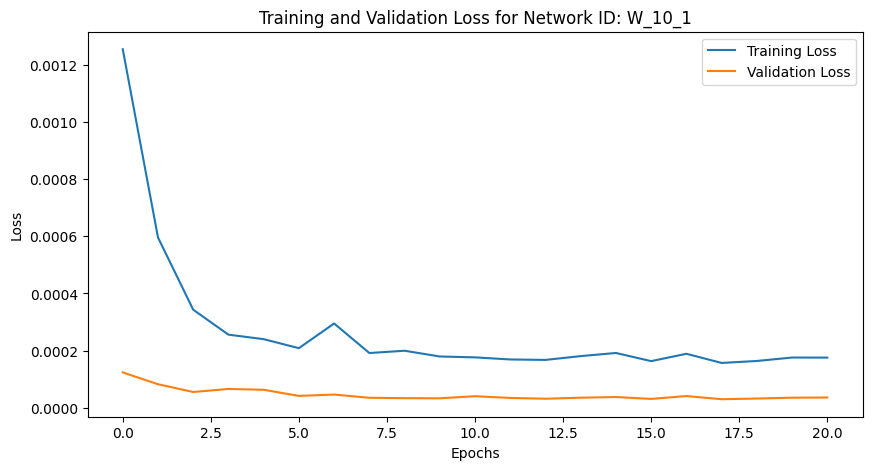

Training Progress:   0%|          | 20/10000 [00:40<5:37:04,  2.03s/epoch, loss=0.000176, val_loss=3.62e-5, patience=1]


Mean Squared Error: 0.0003438379686520979
Iteration: 181, Window Size: 10, Y Days Ahead: 2
X shape: (3796, 10)
y shape: (3796, 2)
Initializing network with layer sizes: [10, 128, 64, 32, 2]
params_W_10_2.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 10), (3036, 2), Validation data shape: (380, 10), (380, 2), Testing data shape: (380, 10), (380, 2)
Parameters loaded from params_W_10_2.npz


Training Progress:   0%|          | 23/10000 [00:44<5:06:56,  1.85s/epoch, loss=0.000226, val_loss=4.53e-5, patience=1]

Epoch 24/10000, Training Loss: 0.000226, Validation Loss: 0.000045
Early stopping at epoch 24. Best validation loss: 0.000043


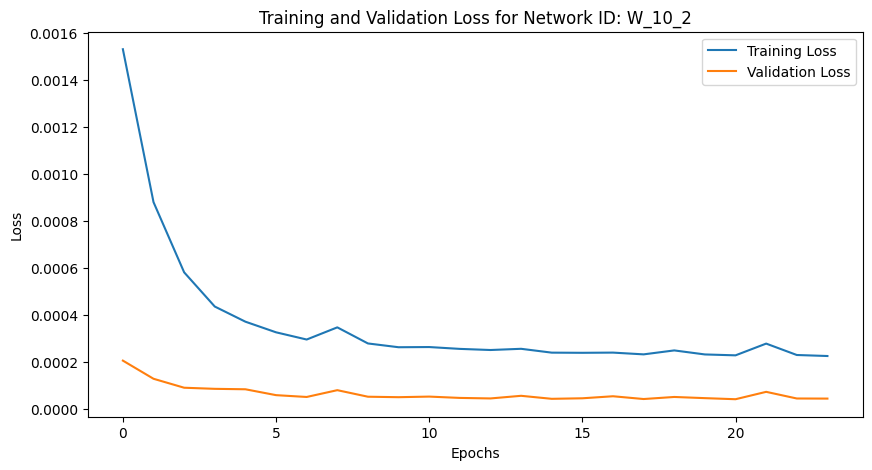

Training Progress:   0%|          | 23/10000 [00:44<5:25:08,  1.96s/epoch, loss=0.000226, val_loss=4.53e-5, patience=1]


Mean Squared Error: 0.00045094629398932434
Iteration: 182, Window Size: 10, Y Days Ahead: 3
X shape: (3795, 10)
y shape: (3795, 3)
Initializing network with layer sizes: [10, 128, 64, 32, 3]
params_W_10_3.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 10), (3036, 3), Validation data shape: (379, 10), (379, 3), Testing data shape: (380, 10), (380, 3)
Parameters loaded from params_W_10_3.npz


Training Progress:   0%|          | 10/10000 [00:20<5:07:41,  1.85s/epoch, loss=0.000325, val_loss=6.77e-5, patience=1]

Epoch 11/10000, Training Loss: 0.000325, Validation Loss: 0.000068
Early stopping at epoch 11. Best validation loss: 0.000063


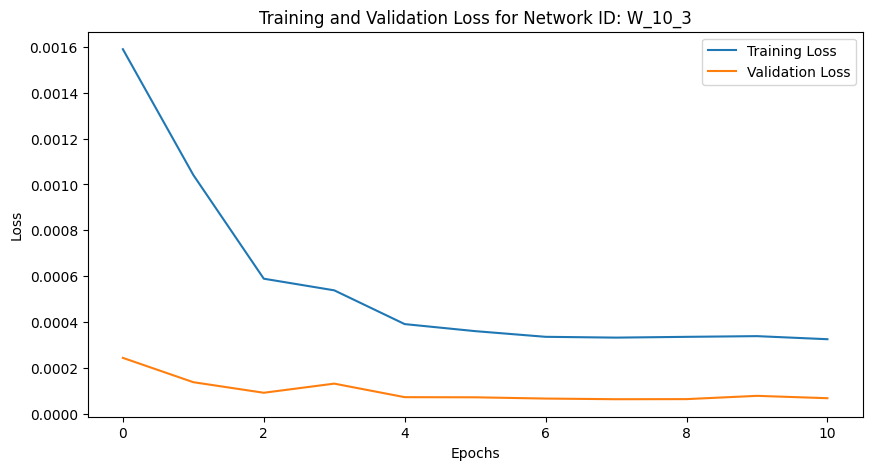

Training Progress:   0%|          | 10/10000 [00:20<5:44:00,  2.07s/epoch, loss=0.000325, val_loss=6.77e-5, patience=1]


Mean Squared Error: 0.0005482080065803543
Iteration: 183, Window Size: 10, Y Days Ahead: 4
X shape: (3794, 10)
y shape: (3794, 4)
Initializing network with layer sizes: [10, 128, 64, 32, 4]
params_W_10_4.npz not found. Using randomly initialized parameters.
Training data shape: (3035, 10), (3035, 4), Validation data shape: (379, 10), (379, 4), Testing data shape: (380, 10), (380, 4)
Parameters loaded from params_W_10_4.npz


Training Progress:   0%|          | 10/10000 [00:20<5:15:04,  1.89s/epoch, loss=0.000464, val_loss=8.72e-5, patience=1]

Epoch 11/10000, Training Loss: 0.000464, Validation Loss: 0.000087
Early stopping at epoch 11. Best validation loss: 0.000077


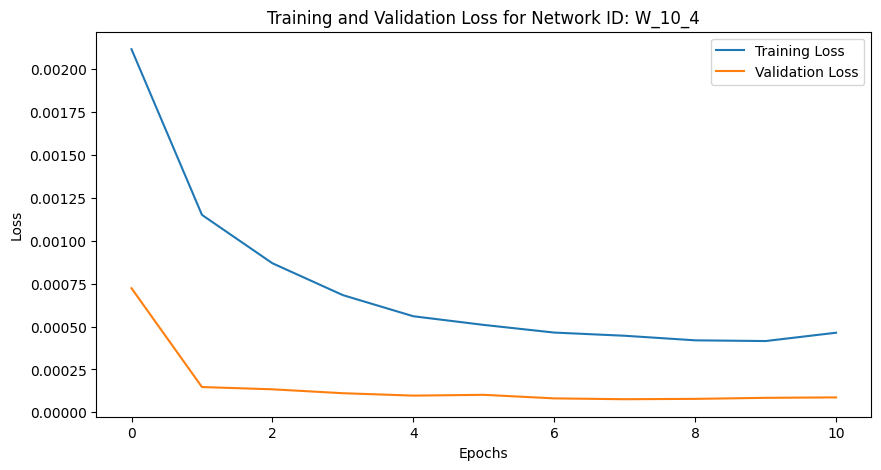

Training Progress:   0%|          | 10/10000 [00:20<5:49:02,  2.10s/epoch, loss=0.000464, val_loss=8.72e-5, patience=1]


Mean Squared Error: 0.0006217442300858862
Iteration: 184, Window Size: 10, Y Days Ahead: 5
X shape: (3793, 10)
y shape: (3793, 5)
Initializing network with layer sizes: [10, 128, 64, 32, 5]
params_W_10_5.npz not found. Using randomly initialized parameters.
Training data shape: (3034, 10), (3034, 5), Validation data shape: (379, 10), (379, 5), Testing data shape: (380, 10), (380, 5)
Parameters loaded from params_W_10_5.npz


Training Progress:   0%|          | 15/10000 [00:30<5:10:46,  1.87s/epoch, loss=0.000453, val_loss=8.59e-5, patience=1]

Epoch 16/10000, Training Loss: 0.000453, Validation Loss: 0.000086
Early stopping at epoch 16. Best validation loss: 0.000083


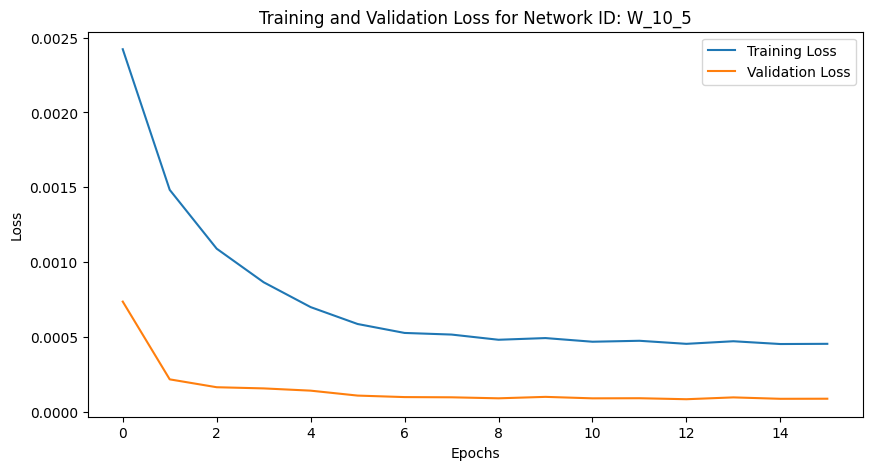

Training Progress:   0%|          | 15/10000 [00:30<5:42:05,  2.06s/epoch, loss=0.000453, val_loss=8.59e-5, patience=1]


Mean Squared Error: 0.0007648351728214264
Iteration: 185, Window Size: 10, Y Days Ahead: 6
X shape: (3792, 10)
y shape: (3792, 6)
Initializing network with layer sizes: [10, 128, 64, 32, 6]
params_W_10_6.npz not found. Using randomly initialized parameters.
Training data shape: (3033, 10), (3033, 6), Validation data shape: (379, 10), (379, 6), Testing data shape: (380, 10), (380, 6)
Parameters loaded from params_W_10_6.npz


Training Progress:   0%|          | 9/10000 [00:18<5:11:24,  1.87s/epoch, loss=0.000633, val_loss=0.000138, patience=1]

Epoch 10/10000, Training Loss: 0.000633, Validation Loss: 0.000138
Early stopping at epoch 10. Best validation loss: 0.000109


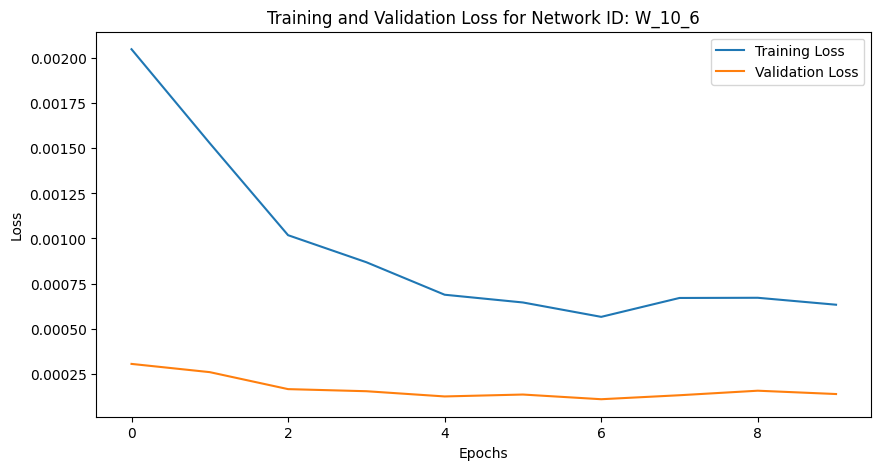

Training Progress:   0%|          | 9/10000 [00:19<5:54:37,  2.13s/epoch, loss=0.000633, val_loss=0.000138, patience=1]


Mean Squared Error: 0.000871544680645966
Iteration: 186, Window Size: 10, Y Days Ahead: 7
X shape: (3791, 10)
y shape: (3791, 7)
Initializing network with layer sizes: [10, 128, 64, 32, 7]
params_W_10_7.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 10), (3032, 7), Validation data shape: (379, 10), (379, 7), Testing data shape: (380, 10), (380, 7)
Parameters loaded from params_W_10_7.npz


Training Progress:   0%|          | 32/10000 [01:01<5:03:41,  1.83s/epoch, loss=0.000583, val_loss=0.00011, patience=1] 

Epoch 33/10000, Training Loss: 0.000583, Validation Loss: 0.000110
Early stopping at epoch 33. Best validation loss: 0.000104


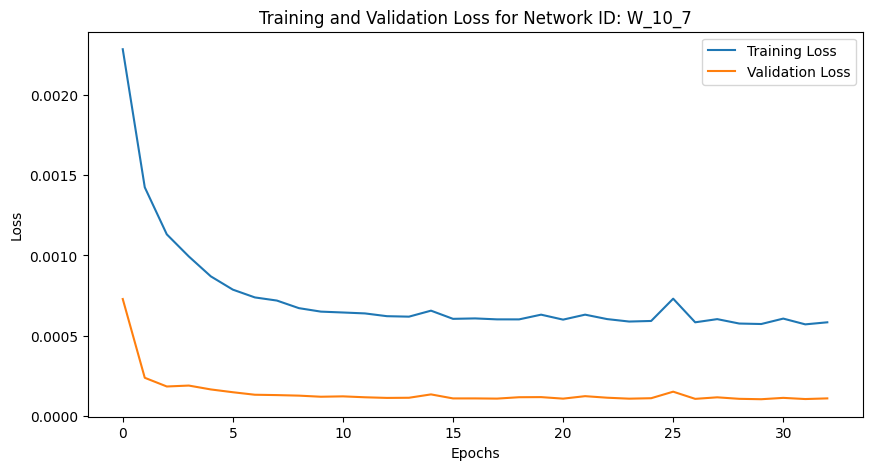

Training Progress:   0%|          | 32/10000 [01:02<5:22:17,  1.94s/epoch, loss=0.000583, val_loss=0.00011, patience=1]


Mean Squared Error: 0.0009769541210301253
Iteration: 187, Window Size: 10, Y Days Ahead: 8
X shape: (3790, 10)
y shape: (3790, 8)
Initializing network with layer sizes: [10, 128, 64, 32, 8]
params_W_10_8.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 10), (3032, 8), Validation data shape: (379, 10), (379, 8), Testing data shape: (379, 10), (379, 8)
Parameters loaded from params_W_10_8.npz


Training Progress:   0%|          | 24/10000 [00:47<5:08:16,  1.85s/epoch, loss=0.000676, val_loss=0.000129, patience=1]

Epoch 25/10000, Training Loss: 0.000676, Validation Loss: 0.000129
Early stopping at epoch 25. Best validation loss: 0.000123


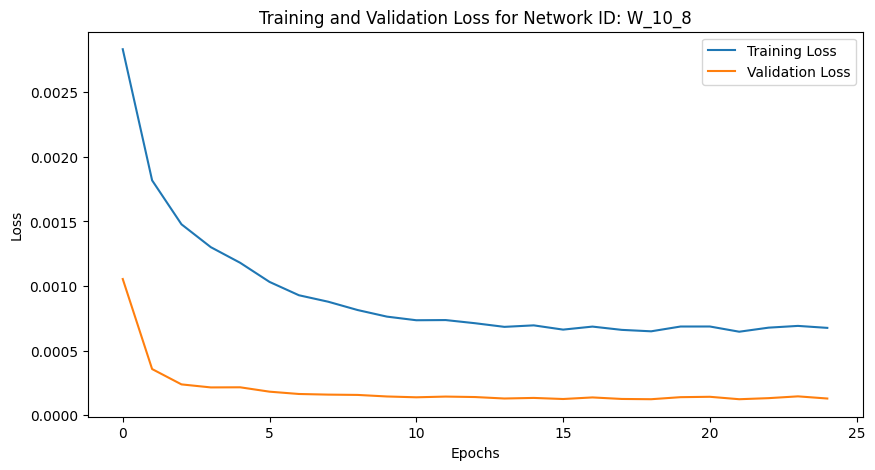

Training Progress:   0%|          | 24/10000 [00:48<5:33:52,  2.01s/epoch, loss=0.000676, val_loss=0.000129, patience=1]


Mean Squared Error: 0.0010714687449576705
Iteration: 188, Window Size: 10, Y Days Ahead: 9
X shape: (3789, 10)
y shape: (3789, 9)
Initializing network with layer sizes: [10, 128, 64, 32, 9]
params_W_10_9.npz not found. Using randomly initialized parameters.
Training data shape: (3031, 10), (3031, 9), Validation data shape: (379, 10), (379, 9), Testing data shape: (379, 10), (379, 9)
Parameters loaded from params_W_10_9.npz


Training Progress:   0%|          | 22/10000 [00:42<5:03:31,  1.83s/epoch, loss=0.000737, val_loss=0.000136, patience=1]

Epoch 23/10000, Training Loss: 0.000737, Validation Loss: 0.000136
Early stopping at epoch 23. Best validation loss: 0.000136


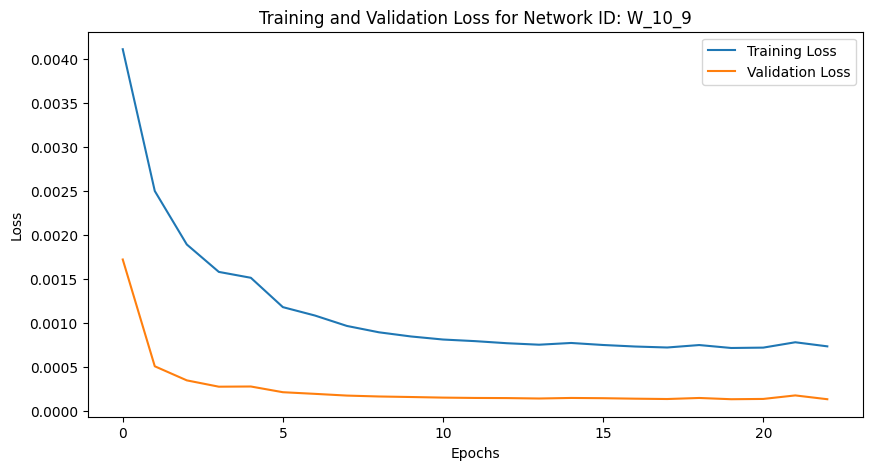

Training Progress:   0%|          | 22/10000 [00:42<5:24:30,  1.95s/epoch, loss=0.000737, val_loss=0.000136, patience=1]


Mean Squared Error: 0.0011968904165718555
Iteration: 189, Window Size: 10, Y Days Ahead: 10
X shape: (3788, 10)
y shape: (3788, 10)
Initializing network with layer sizes: [10, 128, 64, 32, 10]
params_W_10_10.npz not found. Using randomly initialized parameters.
Training data shape: (3030, 10), (3030, 10), Validation data shape: (379, 10), (379, 10), Testing data shape: (379, 10), (379, 10)
Parameters loaded from params_W_10_10.npz


Training Progress:   0%|          | 23/10000 [00:45<5:16:14,  1.90s/epoch, loss=0.000764, val_loss=0.000146, patience=1]

Epoch 24/10000, Training Loss: 0.000764, Validation Loss: 0.000146
Early stopping at epoch 24. Best validation loss: 0.000145


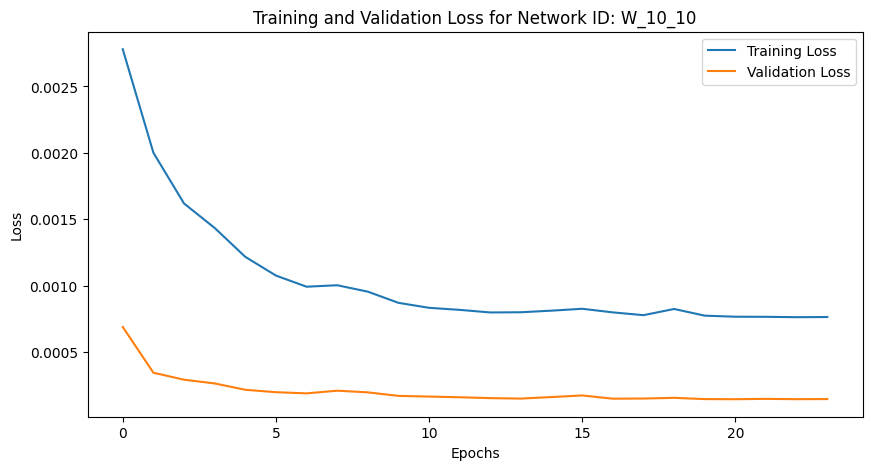

Training Progress:   0%|          | 23/10000 [00:45<5:30:54,  1.99s/epoch, loss=0.000764, val_loss=0.000146, patience=1]


Mean Squared Error: 0.0012763639290252807
Iteration: 190, Window Size: 10, Y Days Ahead: 11
X shape: (3787, 10)
y shape: (3787, 11)
Initializing network with layer sizes: [10, 128, 64, 32, 11]
params_W_10_11.npz not found. Using randomly initialized parameters.
Training data shape: (3029, 10), (3029, 11), Validation data shape: (379, 10), (379, 11), Testing data shape: (379, 10), (379, 11)
Parameters loaded from params_W_10_11.npz


Training Progress:   0%|          | 21/10000 [00:42<5:18:33,  1.92s/epoch, loss=0.000899, val_loss=0.000171, patience=1]

Epoch 22/10000, Training Loss: 0.000899, Validation Loss: 0.000171
Early stopping at epoch 22. Best validation loss: 0.000160


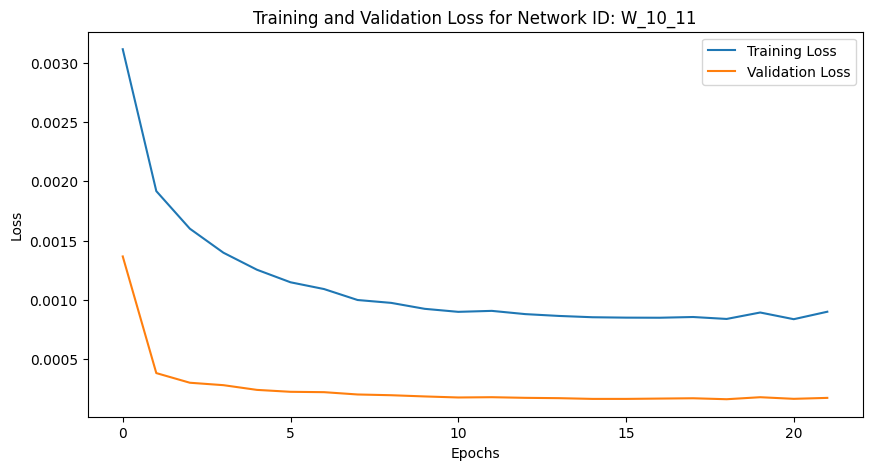

Training Progress:   0%|          | 21/10000 [00:42<5:37:52,  2.03s/epoch, loss=0.000899, val_loss=0.000171, patience=1]


Mean Squared Error: 0.0014369991640590899
Iteration: 191, Window Size: 10, Y Days Ahead: 12
X shape: (3786, 10)
y shape: (3786, 12)
Initializing network with layer sizes: [10, 128, 64, 32, 12]
params_W_10_12.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 10), (3028, 12), Validation data shape: (379, 10), (379, 12), Testing data shape: (379, 10), (379, 12)
Parameters loaded from params_W_10_12.npz


Training Progress:   0%|          | 20/10000 [00:40<5:22:45,  1.94s/epoch, loss=0.000926, val_loss=0.000182, patience=1]

Epoch 21/10000, Training Loss: 0.000926, Validation Loss: 0.000182
Early stopping at epoch 21. Best validation loss: 0.000178


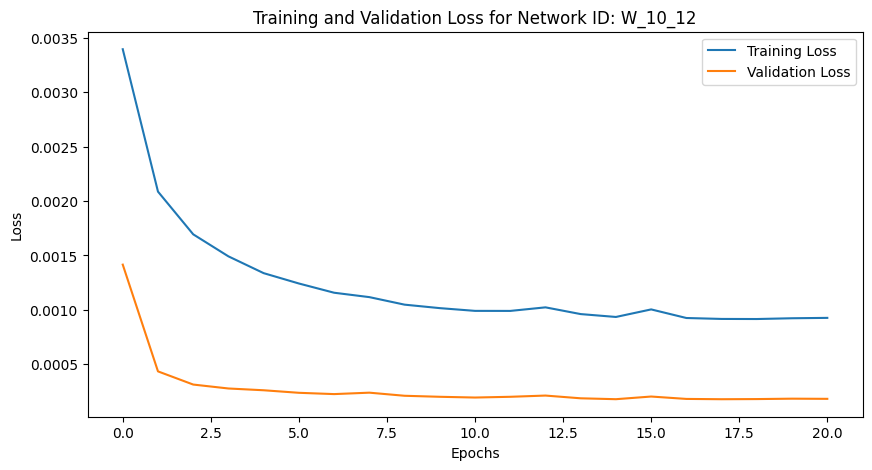

Training Progress:   0%|          | 20/10000 [00:41<5:41:50,  2.06s/epoch, loss=0.000926, val_loss=0.000182, patience=1]


Mean Squared Error: 0.0015592581630700455
Iteration: 192, Window Size: 10, Y Days Ahead: 13
X shape: (3785, 10)
y shape: (3785, 13)
Initializing network with layer sizes: [10, 128, 64, 32, 13]
params_W_10_13.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 10), (3028, 13), Validation data shape: (378, 10), (378, 13), Testing data shape: (379, 10), (379, 13)
Parameters loaded from params_W_10_13.npz


Training Progress:   0%|          | 21/10000 [00:42<5:12:49,  1.88s/epoch, loss=0.000989, val_loss=0.000208, patience=1]

Epoch 22/10000, Training Loss: 0.000989, Validation Loss: 0.000208
Early stopping at epoch 22. Best validation loss: 0.000187


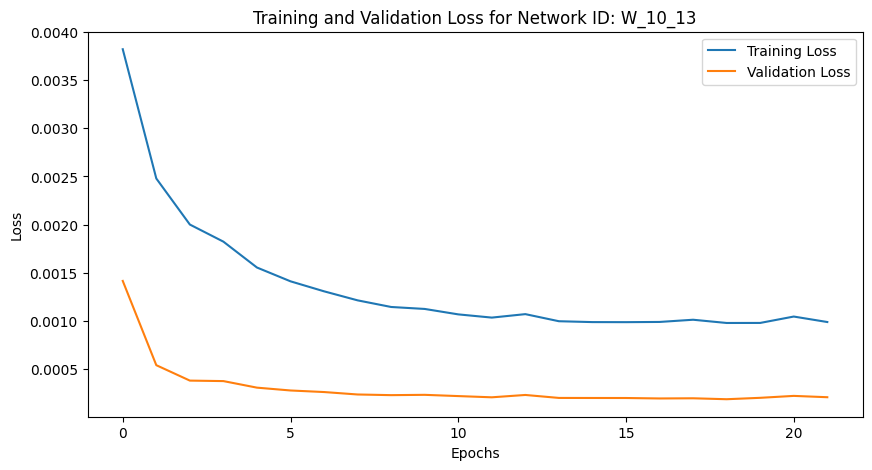

Training Progress:   0%|          | 21/10000 [00:43<5:41:25,  2.05s/epoch, loss=0.000989, val_loss=0.000208, patience=1]


Mean Squared Error: 0.0016909968448065717
Iteration: 193, Window Size: 10, Y Days Ahead: 14
X shape: (3784, 10)
y shape: (3784, 14)
Initializing network with layer sizes: [10, 128, 64, 32, 14]
params_W_10_14.npz not found. Using randomly initialized parameters.
Training data shape: (3027, 10), (3027, 14), Validation data shape: (378, 10), (378, 14), Testing data shape: (379, 10), (379, 14)
Parameters loaded from params_W_10_14.npz


Training Progress:   0%|          | 21/10000 [00:40<5:07:25,  1.85s/epoch, loss=0.00102, val_loss=0.000208, patience=1]

Epoch 22/10000, Training Loss: 0.001024, Validation Loss: 0.000208
Early stopping at epoch 22. Best validation loss: 0.000204


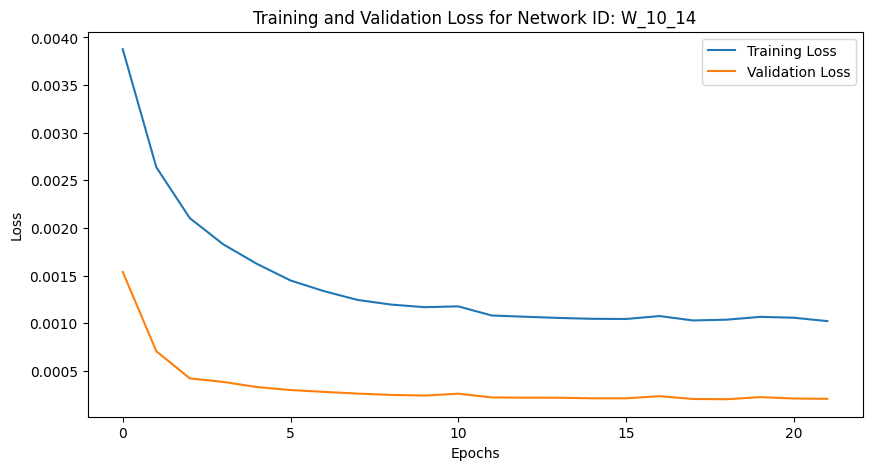

Training Progress:   0%|          | 21/10000 [00:41<5:26:15,  1.96s/epoch, loss=0.00102, val_loss=0.000208, patience=1]


Mean Squared Error: 0.0017528389229708493
Iteration: 194, Window Size: 10, Y Days Ahead: 15
X shape: (3783, 10)
y shape: (3783, 15)
Initializing network with layer sizes: [10, 128, 64, 32, 15]
params_W_10_15.npz not found. Using randomly initialized parameters.
Training data shape: (3026, 10), (3026, 15), Validation data shape: (378, 10), (378, 15), Testing data shape: (379, 10), (379, 15)
Parameters loaded from params_W_10_15.npz


Training Progress:   0%|          | 19/10000 [00:37<5:13:27,  1.88s/epoch, loss=0.00112, val_loss=0.000242, patience=1]

Epoch 20/10000, Training Loss: 0.001117, Validation Loss: 0.000242
Early stopping at epoch 20. Best validation loss: 0.000239


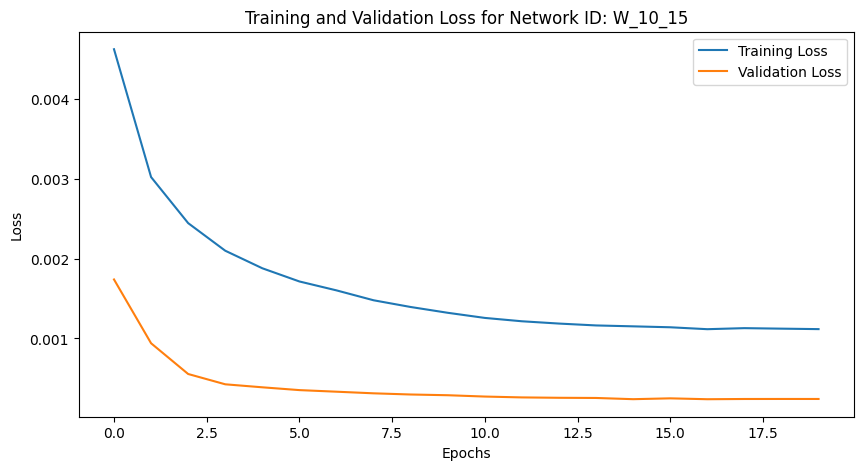

Training Progress:   0%|          | 19/10000 [00:37<5:27:56,  1.97s/epoch, loss=0.00112, val_loss=0.000242, patience=1]


Mean Squared Error: 0.0018346326850070445
Iteration: 195, Window Size: 10, Y Days Ahead: 16
X shape: (3782, 10)
y shape: (3782, 16)
Initializing network with layer sizes: [10, 128, 64, 32, 16]
params_W_10_16.npz not found. Using randomly initialized parameters.
Training data shape: (3025, 10), (3025, 16), Validation data shape: (378, 10), (378, 16), Testing data shape: (379, 10), (379, 16)
Parameters loaded from params_W_10_16.npz


Training Progress:   0%|          | 20/10000 [00:40<5:16:51,  1.90s/epoch, loss=0.00117, val_loss=0.000244, patience=1]

Epoch 21/10000, Training Loss: 0.001167, Validation Loss: 0.000244
Early stopping at epoch 21. Best validation loss: 0.000243


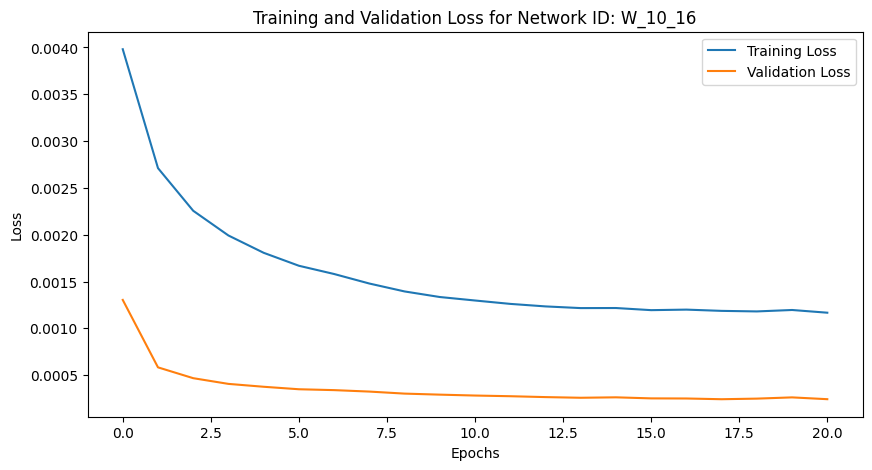

Training Progress:   0%|          | 20/10000 [00:40<5:40:01,  2.04s/epoch, loss=0.00117, val_loss=0.000244, patience=1]


Mean Squared Error: 0.0019948029005162704
Iteration: 196, Window Size: 10, Y Days Ahead: 17
X shape: (3781, 10)
y shape: (3781, 17)
Initializing network with layer sizes: [10, 128, 64, 32, 17]
params_W_10_17.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 10), (3024, 17), Validation data shape: (378, 10), (378, 17), Testing data shape: (379, 10), (379, 17)
Parameters loaded from params_W_10_17.npz


Training Progress:   0%|          | 21/10000 [00:41<5:02:17,  1.82s/epoch, loss=0.00129, val_loss=0.000272, patience=1]

Epoch 22/10000, Training Loss: 0.001294, Validation Loss: 0.000272
Early stopping at epoch 22. Best validation loss: 0.000265


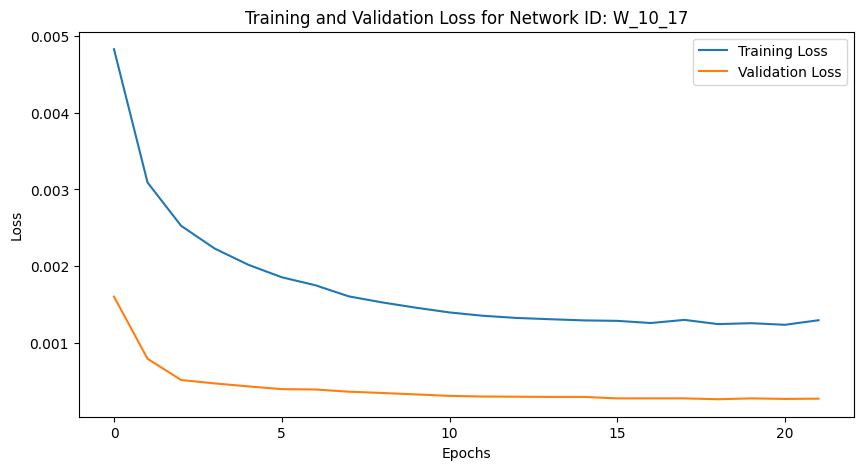

Training Progress:   0%|          | 21/10000 [00:41<5:28:35,  1.98s/epoch, loss=0.00129, val_loss=0.000272, patience=1]


Mean Squared Error: 0.002112964628418385
Iteration: 197, Window Size: 10, Y Days Ahead: 18
X shape: (3780, 10)
y shape: (3780, 18)
Initializing network with layer sizes: [10, 128, 64, 32, 18]
params_W_10_18.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 10), (3024, 18), Validation data shape: (378, 10), (378, 18), Testing data shape: (378, 10), (378, 18)
Parameters loaded from params_W_10_18.npz


Training Progress:   0%|          | 18/10000 [00:36<5:11:55,  1.87s/epoch, loss=0.00132, val_loss=0.000286, patience=1]

Epoch 19/10000, Training Loss: 0.001325, Validation Loss: 0.000286
Early stopping at epoch 19. Best validation loss: 0.000283


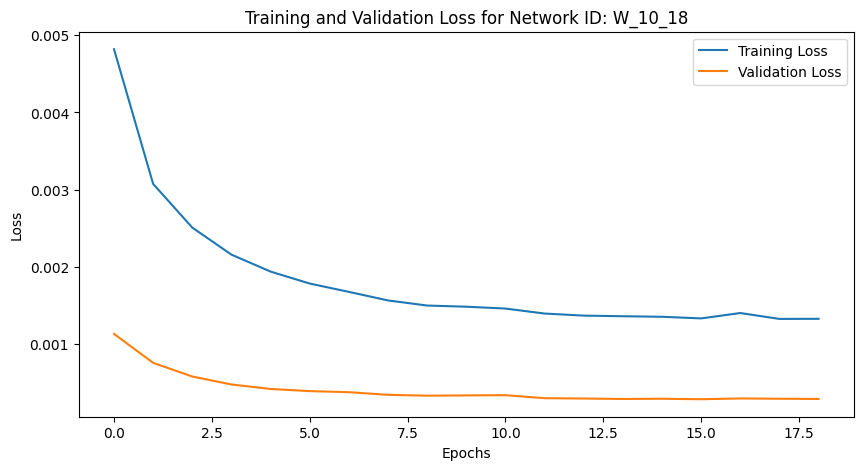

Training Progress:   0%|          | 18/10000 [00:36<5:41:21,  2.05s/epoch, loss=0.00132, val_loss=0.000286, patience=1]


Mean Squared Error: 0.0022562344628573924
Iteration: 198, Window Size: 10, Y Days Ahead: 19
X shape: (3779, 10)
y shape: (3779, 19)
Initializing network with layer sizes: [10, 128, 64, 32, 19]
params_W_10_19.npz not found. Using randomly initialized parameters.
Training data shape: (3023, 10), (3023, 19), Validation data shape: (378, 10), (378, 19), Testing data shape: (378, 10), (378, 19)
Parameters loaded from params_W_10_19.npz


Training Progress:   0%|          | 28/10000 [00:57<5:36:27,  2.02s/epoch, loss=0.00147, val_loss=0.000334, patience=1]

Epoch 29/10000, Training Loss: 0.001466, Validation Loss: 0.000334
Early stopping at epoch 29. Best validation loss: 0.000286


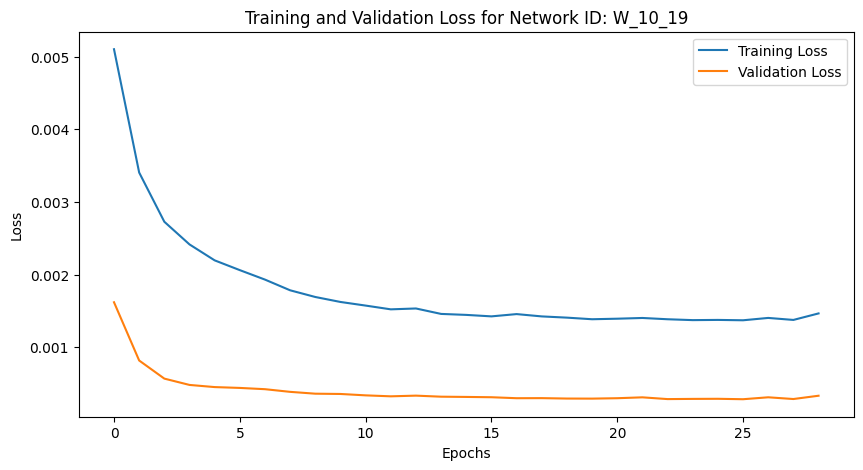

Training Progress:   0%|          | 28/10000 [00:57<5:42:01,  2.06s/epoch, loss=0.00147, val_loss=0.000334, patience=1]


Mean Squared Error: 0.00238340395478521
Iteration: 199, Window Size: 10, Y Days Ahead: 20
X shape: (3778, 10)
y shape: (3778, 20)
Initializing network with layer sizes: [10, 128, 64, 32, 20]
params_W_10_20.npz not found. Using randomly initialized parameters.
Training data shape: (3022, 10), (3022, 20), Validation data shape: (378, 10), (378, 20), Testing data shape: (378, 10), (378, 20)
Parameters loaded from params_W_10_20.npz


Training Progress:   0%|          | 16/10000 [00:33<5:32:56,  2.00s/epoch, loss=0.00155, val_loss=0.00035, patience=1] 

Epoch 17/10000, Training Loss: 0.001553, Validation Loss: 0.000350
Early stopping at epoch 17. Best validation loss: 0.000315


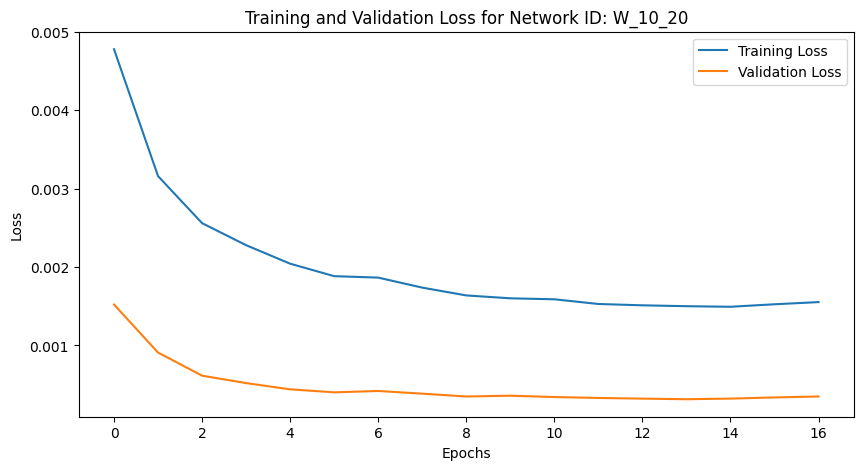

Training Progress:   0%|          | 16/10000 [00:33<5:50:25,  2.11s/epoch, loss=0.00155, val_loss=0.00035, patience=1]


Mean Squared Error: 0.00254387407776199
Iteration: 200, Window Size: 11, Y Days Ahead: 1
X shape: (3796, 11)
y shape: (3796, 1)
Initializing network with layer sizes: [11, 128, 64, 32, 1]
params_W_11_1.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 11), (3036, 1), Validation data shape: (380, 11), (380, 1), Testing data shape: (380, 11), (380, 1)
Parameters loaded from params_W_11_1.npz


Training Progress:   0%|          | 11/10000 [00:23<5:38:13,  2.03s/epoch, loss=0.000249, val_loss=5.64e-5, patience=1]

Epoch 12/10000, Training Loss: 0.000249, Validation Loss: 0.000056
Early stopping at epoch 12. Best validation loss: 0.000039


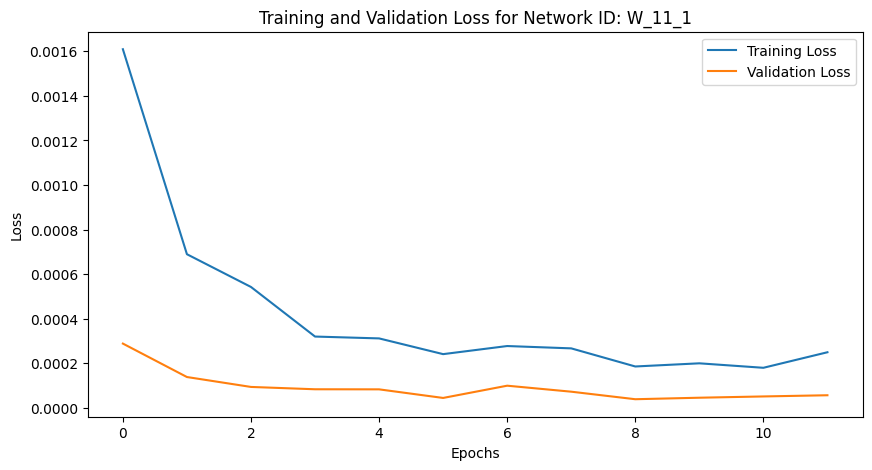

Training Progress:   0%|          | 11/10000 [00:24<6:06:37,  2.20s/epoch, loss=0.000249, val_loss=5.64e-5, patience=1]


Mean Squared Error: 0.0003531095577210218
Iteration: 201, Window Size: 11, Y Days Ahead: 2
X shape: (3795, 11)
y shape: (3795, 2)
Initializing network with layer sizes: [11, 128, 64, 32, 2]
params_W_11_2.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 11), (3036, 2), Validation data shape: (379, 11), (379, 2), Testing data shape: (380, 11), (380, 2)
Parameters loaded from params_W_11_2.npz


Training Progress:   0%|          | 13/10000 [00:27<5:18:56,  1.92s/epoch, loss=0.000337, val_loss=5.66e-5, patience=1]

Epoch 14/10000, Training Loss: 0.000337, Validation Loss: 0.000057
Early stopping at epoch 14. Best validation loss: 0.000049


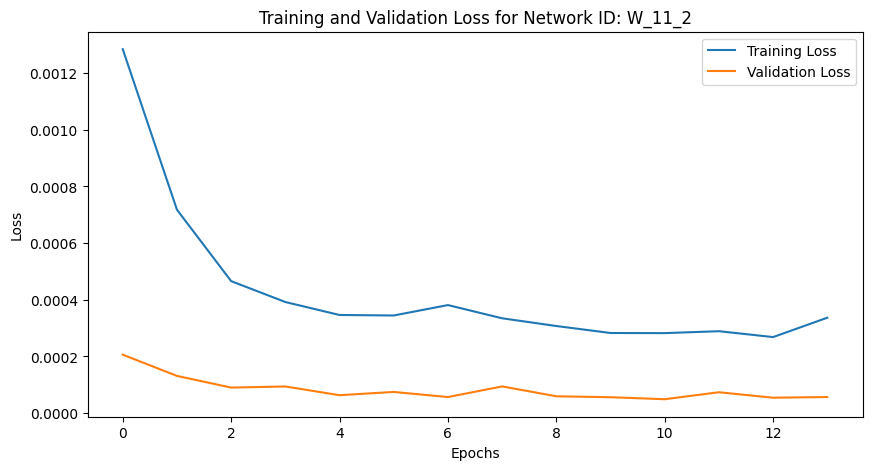

Training Progress:   0%|          | 13/10000 [00:27<5:57:55,  2.15s/epoch, loss=0.000337, val_loss=5.66e-5, patience=1]


Mean Squared Error: 0.0004928834022528041
Iteration: 202, Window Size: 11, Y Days Ahead: 3
X shape: (3794, 11)
y shape: (3794, 3)
Initializing network with layer sizes: [11, 128, 64, 32, 3]
params_W_11_3.npz not found. Using randomly initialized parameters.
Training data shape: (3035, 11), (3035, 3), Validation data shape: (379, 11), (379, 3), Testing data shape: (380, 11), (380, 3)
Parameters loaded from params_W_11_3.npz


Training Progress:   0%|          | 14/10000 [00:29<5:14:19,  1.89s/epoch, loss=0.00032, val_loss=6.04e-5, patience=1] 

Epoch 15/10000, Training Loss: 0.000320, Validation Loss: 0.000060
Early stopping at epoch 15. Best validation loss: 0.000060


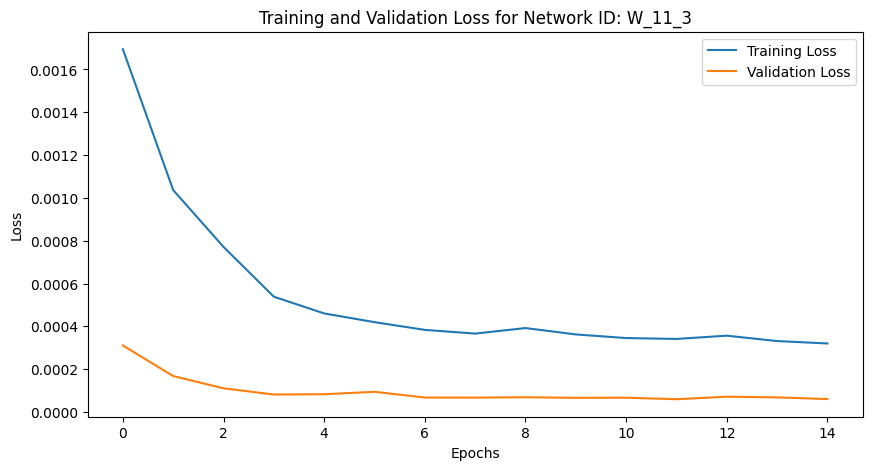

Training Progress:   0%|          | 14/10000 [00:29<5:55:15,  2.13s/epoch, loss=0.00032, val_loss=6.04e-5, patience=1]


Mean Squared Error: 0.0005524309766096192
Iteration: 203, Window Size: 11, Y Days Ahead: 4
X shape: (3793, 11)
y shape: (3793, 4)
Initializing network with layer sizes: [11, 128, 64, 32, 4]
params_W_11_4.npz not found. Using randomly initialized parameters.
Training data shape: (3034, 11), (3034, 4), Validation data shape: (379, 11), (379, 4), Testing data shape: (380, 11), (380, 4)
Parameters loaded from params_W_11_4.npz


Training Progress:   0%|          | 22/10000 [00:47<6:09:22,  2.22s/epoch, loss=0.000377, val_loss=6.96e-5, patience=1]

Epoch 23/10000, Training Loss: 0.000377, Validation Loss: 0.000070
Early stopping at epoch 23. Best validation loss: 0.000070


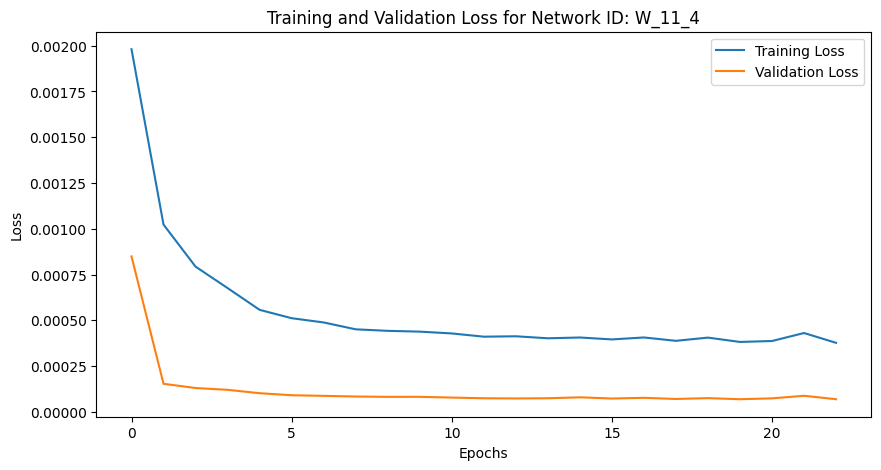

Training Progress:   0%|          | 22/10000 [00:48<6:02:56,  2.18s/epoch, loss=0.000377, val_loss=6.96e-5, patience=1]


Mean Squared Error: 0.0006630479323907936
Iteration: 204, Window Size: 11, Y Days Ahead: 5
X shape: (3792, 11)
y shape: (3792, 5)
Initializing network with layer sizes: [11, 128, 64, 32, 5]
params_W_11_5.npz not found. Using randomly initialized parameters.
Training data shape: (3033, 11), (3033, 5), Validation data shape: (379, 11), (379, 5), Testing data shape: (380, 11), (380, 5)
Parameters loaded from params_W_11_5.npz


Training Progress:   0%|          | 15/10000 [00:33<5:55:38,  2.14s/epoch, loss=0.000469, val_loss=9.16e-5, patience=1] 

Epoch 16/10000, Training Loss: 0.000469, Validation Loss: 0.000092
Early stopping at epoch 16. Best validation loss: 0.000087


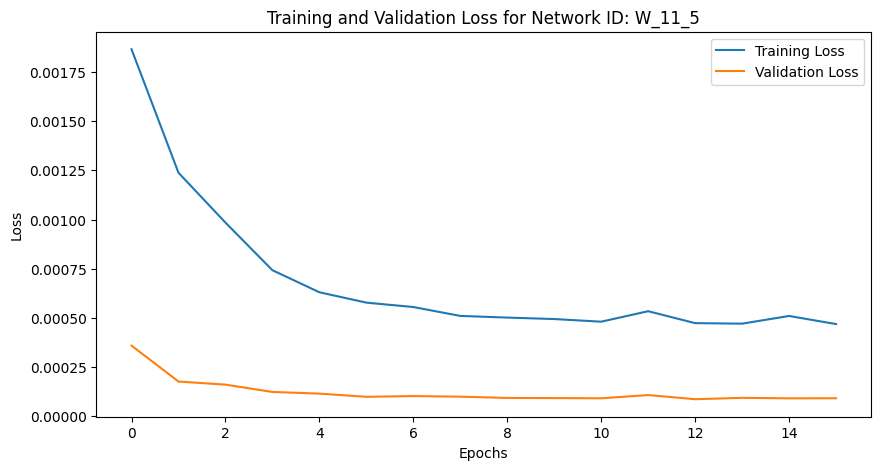

Training Progress:   0%|          | 15/10000 [00:33<6:12:36,  2.24s/epoch, loss=0.000469, val_loss=9.16e-5, patience=1]


Mean Squared Error: 0.0008037734292828901
Iteration: 205, Window Size: 11, Y Days Ahead: 6
X shape: (3791, 11)
y shape: (3791, 6)
Initializing network with layer sizes: [11, 128, 64, 32, 6]
params_W_11_6.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 11), (3032, 6), Validation data shape: (379, 11), (379, 6), Testing data shape: (380, 11), (380, 6)
Parameters loaded from params_W_11_6.npz


Training Progress:   0%|          | 16/10000 [00:33<5:22:15,  1.94s/epoch, loss=0.000559, val_loss=0.000112, patience=1]

Epoch 17/10000, Training Loss: 0.000559, Validation Loss: 0.000112
Early stopping at epoch 17. Best validation loss: 0.000106


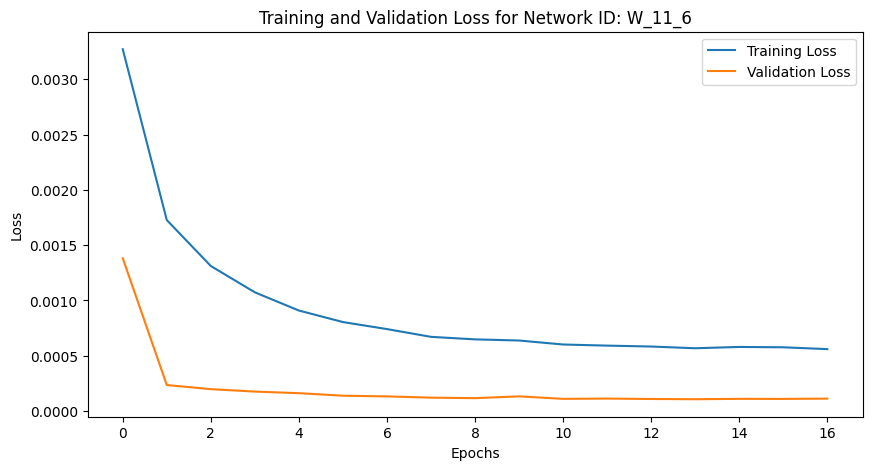

Training Progress:   0%|          | 16/10000 [00:34<5:54:23,  2.13s/epoch, loss=0.000559, val_loss=0.000112, patience=1]


Mean Squared Error: 0.0009505466427884783
Iteration: 206, Window Size: 11, Y Days Ahead: 7
X shape: (3790, 11)
y shape: (3790, 7)
Initializing network with layer sizes: [11, 128, 64, 32, 7]
params_W_11_7.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 11), (3032, 7), Validation data shape: (379, 11), (379, 7), Testing data shape: (379, 11), (379, 7)
Parameters loaded from params_W_11_7.npz


Training Progress:   0%|          | 16/10000 [00:32<5:09:10,  1.86s/epoch, loss=0.000608, val_loss=0.000119, patience=1]

Epoch 17/10000, Training Loss: 0.000608, Validation Loss: 0.000119
Early stopping at epoch 17. Best validation loss: 0.000114


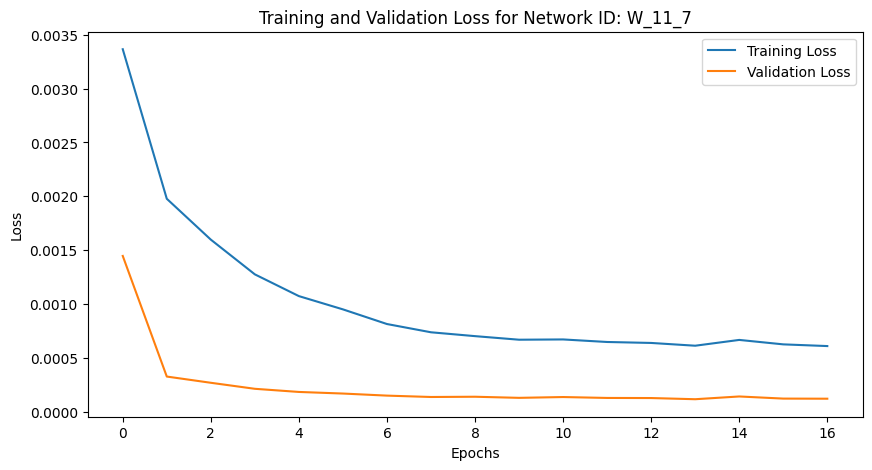

Training Progress:   0%|          | 16/10000 [00:33<5:44:27,  2.07s/epoch, loss=0.000608, val_loss=0.000119, patience=1]


Mean Squared Error: 0.0010264452442783894
Iteration: 207, Window Size: 11, Y Days Ahead: 8
X shape: (3789, 11)
y shape: (3789, 8)
Initializing network with layer sizes: [11, 128, 64, 32, 8]
params_W_11_8.npz not found. Using randomly initialized parameters.
Training data shape: (3031, 11), (3031, 8), Validation data shape: (379, 11), (379, 8), Testing data shape: (379, 11), (379, 8)
Parameters loaded from params_W_11_8.npz


Training Progress:   0%|          | 20/10000 [00:39<5:14:30,  1.89s/epoch, loss=0.000674, val_loss=0.000125, patience=1]

Epoch 21/10000, Training Loss: 0.000674, Validation Loss: 0.000125
Early stopping at epoch 21. Best validation loss: 0.000124


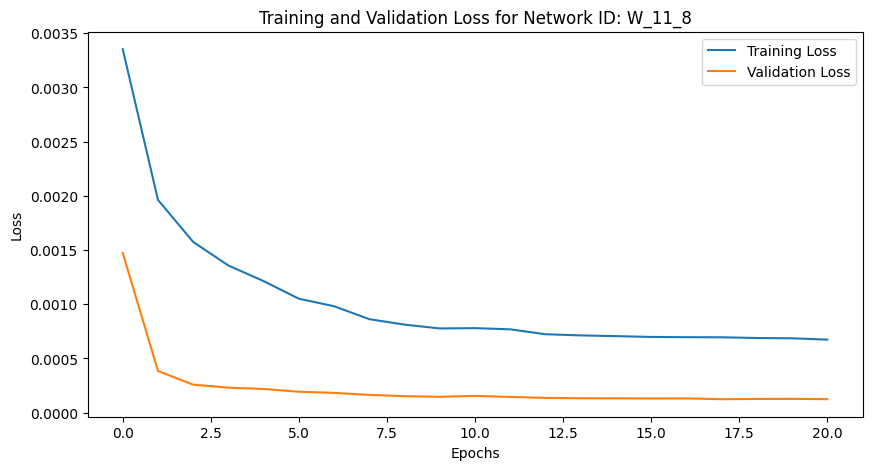

Training Progress:   0%|          | 20/10000 [00:40<5:34:51,  2.01s/epoch, loss=0.000674, val_loss=0.000125, patience=1]


Mean Squared Error: 0.0011471385935876684
Iteration: 208, Window Size: 11, Y Days Ahead: 9
X shape: (3788, 11)
y shape: (3788, 9)
Initializing network with layer sizes: [11, 128, 64, 32, 9]
params_W_11_9.npz not found. Using randomly initialized parameters.
Training data shape: (3030, 11), (3030, 9), Validation data shape: (379, 11), (379, 9), Testing data shape: (379, 11), (379, 9)
Parameters loaded from params_W_11_9.npz


Training Progress:   0%|          | 17/10000 [00:34<5:07:30,  1.85s/epoch, loss=0.00074, val_loss=0.000146, patience=1] 

Epoch 18/10000, Training Loss: 0.000740, Validation Loss: 0.000146
Early stopping at epoch 18. Best validation loss: 0.000144


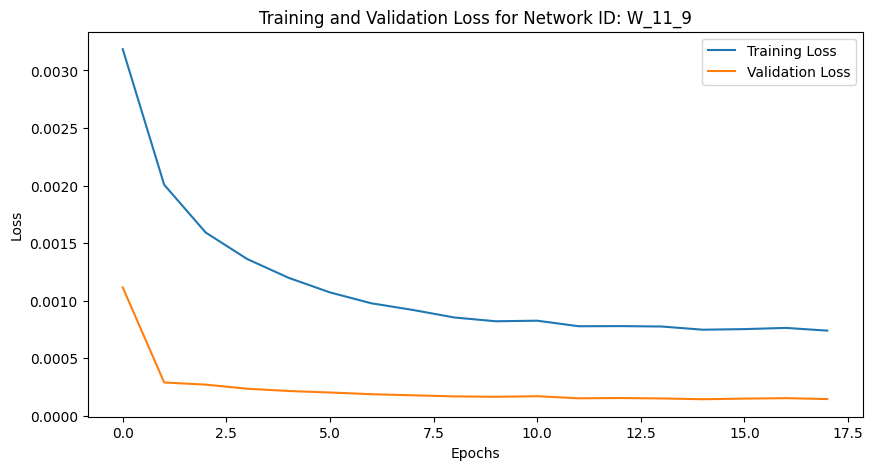

Training Progress:   0%|          | 17/10000 [00:34<5:39:23,  2.04s/epoch, loss=0.00074, val_loss=0.000146, patience=1]


Mean Squared Error: 0.0012045768364154572
Iteration: 209, Window Size: 11, Y Days Ahead: 10
X shape: (3787, 11)
y shape: (3787, 10)
Initializing network with layer sizes: [11, 128, 64, 32, 10]
params_W_11_10.npz not found. Using randomly initialized parameters.
Training data shape: (3029, 11), (3029, 10), Validation data shape: (379, 11), (379, 10), Testing data shape: (379, 11), (379, 10)
Parameters loaded from params_W_11_10.npz


Training Progress:   0%|          | 20/10000 [00:40<5:30:56,  1.99s/epoch, loss=0.000779, val_loss=0.000153, patience=1]

Epoch 21/10000, Training Loss: 0.000779, Validation Loss: 0.000153
Early stopping at epoch 21. Best validation loss: 0.000149


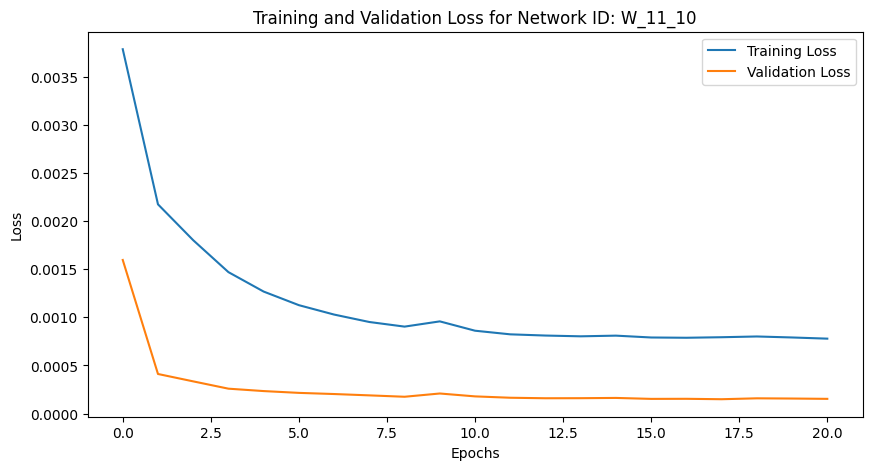

Training Progress:   0%|          | 20/10000 [00:40<5:38:32,  2.04s/epoch, loss=0.000779, val_loss=0.000153, patience=1]


Mean Squared Error: 0.0013564481879291012
Iteration: 210, Window Size: 11, Y Days Ahead: 11
X shape: (3786, 11)
y shape: (3786, 11)
Initializing network with layer sizes: [11, 128, 64, 32, 11]
params_W_11_11.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 11), (3028, 11), Validation data shape: (379, 11), (379, 11), Testing data shape: (379, 11), (379, 11)
Parameters loaded from params_W_11_11.npz


Training Progress:   0%|          | 23/10000 [00:46<5:30:05,  1.99s/epoch, loss=0.000856, val_loss=0.000168, patience=1]

Epoch 24/10000, Training Loss: 0.000856, Validation Loss: 0.000168
Early stopping at epoch 24. Best validation loss: 0.000166


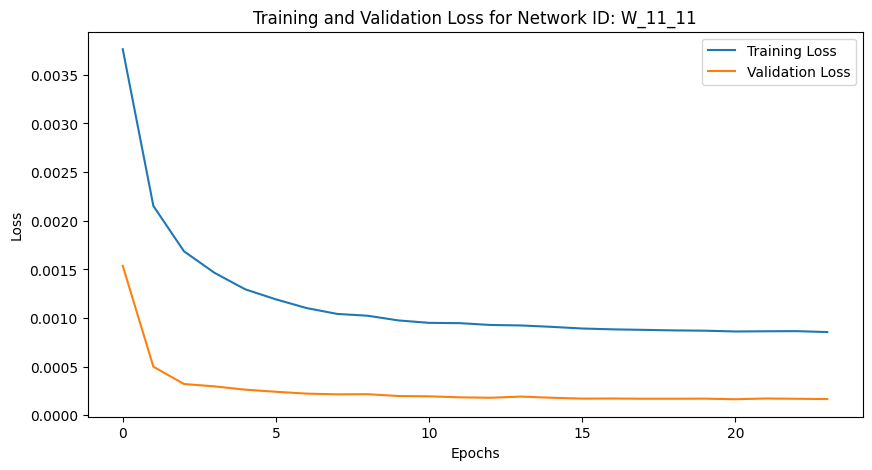

Training Progress:   0%|          | 23/10000 [00:47<5:40:22,  2.05s/epoch, loss=0.000856, val_loss=0.000168, patience=1]


Mean Squared Error: 0.0014942183663985433
Iteration: 211, Window Size: 11, Y Days Ahead: 12
X shape: (3785, 11)
y shape: (3785, 12)
Initializing network with layer sizes: [11, 128, 64, 32, 12]
params_W_11_12.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 11), (3028, 12), Validation data shape: (378, 11), (378, 12), Testing data shape: (379, 11), (379, 12)
Parameters loaded from params_W_11_12.npz


Training Progress:   0%|          | 22/10000 [00:44<5:17:11,  1.91s/epoch, loss=0.000925, val_loss=0.000185, patience=1]

Epoch 23/10000, Training Loss: 0.000925, Validation Loss: 0.000185
Early stopping at epoch 23. Best validation loss: 0.000178


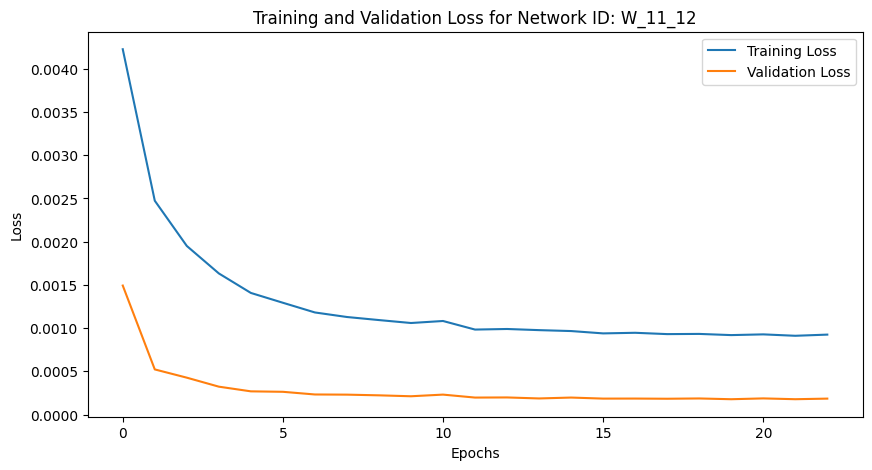

Training Progress:   0%|          | 22/10000 [00:44<5:37:00,  2.03s/epoch, loss=0.000925, val_loss=0.000185, patience=1]


Mean Squared Error: 0.0015120594578355044
Iteration: 212, Window Size: 11, Y Days Ahead: 13
X shape: (3784, 11)
y shape: (3784, 13)
Initializing network with layer sizes: [11, 128, 64, 32, 13]
params_W_11_13.npz not found. Using randomly initialized parameters.
Training data shape: (3027, 11), (3027, 13), Validation data shape: (378, 11), (378, 13), Testing data shape: (379, 11), (379, 13)
Parameters loaded from params_W_11_13.npz


Training Progress:   0%|          | 26/10000 [00:53<5:31:35,  1.99s/epoch, loss=0.000981, val_loss=0.000207, patience=1]

Epoch 27/10000, Training Loss: 0.000981, Validation Loss: 0.000207
Early stopping at epoch 27. Best validation loss: 0.000199


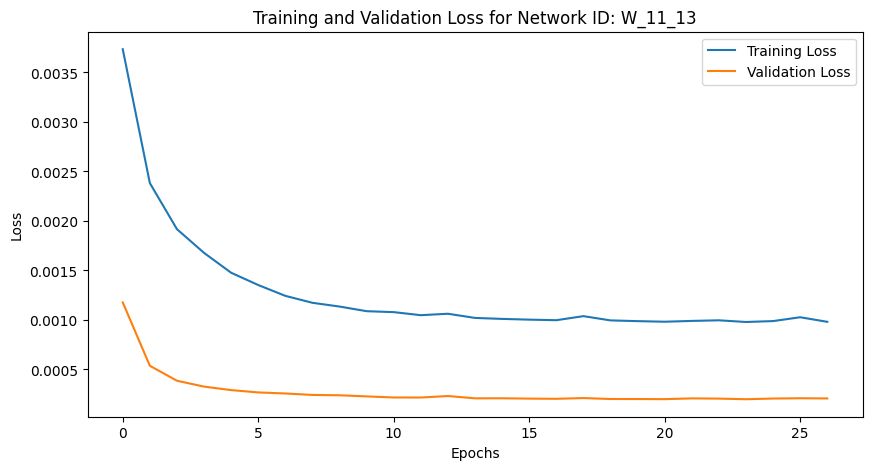

Training Progress:   0%|          | 26/10000 [00:53<5:45:03,  2.08s/epoch, loss=0.000981, val_loss=0.000207, patience=1]


Mean Squared Error: 0.0016119313459086486
Iteration: 213, Window Size: 11, Y Days Ahead: 14
X shape: (3783, 11)
y shape: (3783, 14)
Initializing network with layer sizes: [11, 128, 64, 32, 14]
params_W_11_14.npz not found. Using randomly initialized parameters.
Training data shape: (3026, 11), (3026, 14), Validation data shape: (378, 11), (378, 14), Testing data shape: (379, 11), (379, 14)
Parameters loaded from params_W_11_14.npz


Training Progress:   0%|          | 28/10000 [00:57<5:32:41,  2.00s/epoch, loss=0.00103, val_loss=0.000204, patience=1]

Epoch 29/10000, Training Loss: 0.001031, Validation Loss: 0.000204
Early stopping at epoch 29. Best validation loss: 0.000200


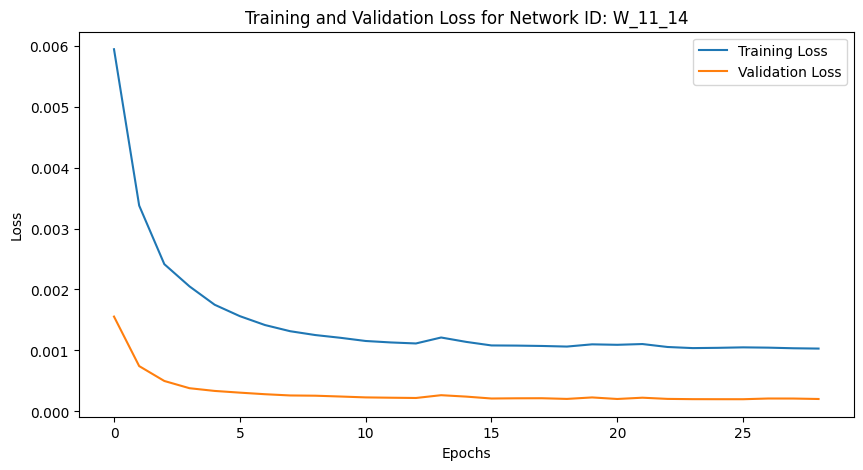

Training Progress:   0%|          | 28/10000 [00:58<5:44:22,  2.07s/epoch, loss=0.00103, val_loss=0.000204, patience=1]


Mean Squared Error: 0.0018034367857020224
Iteration: 214, Window Size: 11, Y Days Ahead: 15
X shape: (3782, 11)
y shape: (3782, 15)
Initializing network with layer sizes: [11, 128, 64, 32, 15]
params_W_11_15.npz not found. Using randomly initialized parameters.
Training data shape: (3025, 11), (3025, 15), Validation data shape: (378, 11), (378, 15), Testing data shape: (379, 11), (379, 15)
Parameters loaded from params_W_11_15.npz


Training Progress:   0%|          | 17/10000 [00:35<5:28:16,  1.97s/epoch, loss=0.00118, val_loss=0.000243, patience=1]

Epoch 18/10000, Training Loss: 0.001176, Validation Loss: 0.000243
Early stopping at epoch 18. Best validation loss: 0.000233


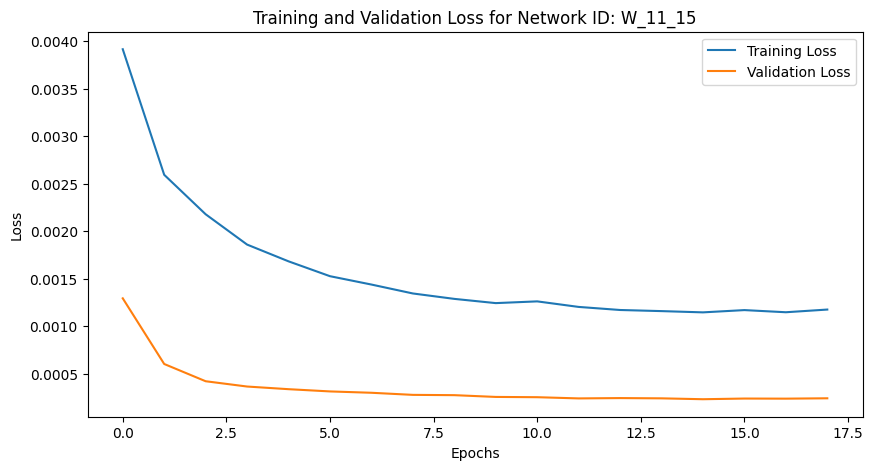

Training Progress:   0%|          | 17/10000 [00:35<5:47:11,  2.09s/epoch, loss=0.00118, val_loss=0.000243, patience=1]


Mean Squared Error: 0.0019075387791793264
Iteration: 215, Window Size: 11, Y Days Ahead: 16
X shape: (3781, 11)
y shape: (3781, 16)
Initializing network with layer sizes: [11, 128, 64, 32, 16]
params_W_11_16.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 11), (3024, 16), Validation data shape: (378, 11), (378, 16), Testing data shape: (379, 11), (379, 16)
Parameters loaded from params_W_11_16.npz


Training Progress:   0%|          | 21/10000 [00:43<5:44:07,  2.07s/epoch, loss=0.00117, val_loss=0.000251, patience=1]

Epoch 22/10000, Training Loss: 0.001172, Validation Loss: 0.000251
Early stopping at epoch 22. Best validation loss: 0.000249


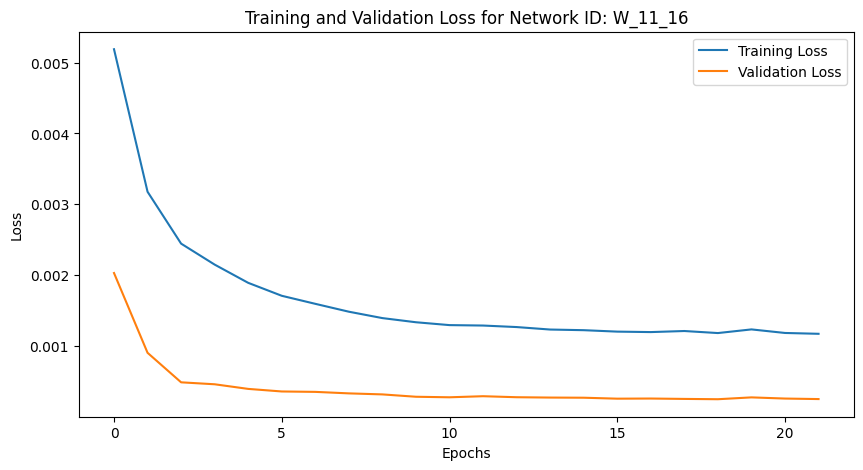

Training Progress:   0%|          | 21/10000 [00:44<5:49:15,  2.10s/epoch, loss=0.00117, val_loss=0.000251, patience=1]


Mean Squared Error: 0.001995669674500237
Iteration: 216, Window Size: 11, Y Days Ahead: 17
X shape: (3780, 11)
y shape: (3780, 17)
Initializing network with layer sizes: [11, 128, 64, 32, 17]
params_W_11_17.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 11), (3024, 17), Validation data shape: (378, 11), (378, 17), Testing data shape: (378, 11), (378, 17)
Parameters loaded from params_W_11_17.npz


Training Progress:   0%|          | 25/10000 [00:52<5:45:11,  2.08s/epoch, loss=0.00126, val_loss=0.00029, patience=1] 

Epoch 26/10000, Training Loss: 0.001263, Validation Loss: 0.000290
Early stopping at epoch 26. Best validation loss: 0.000252


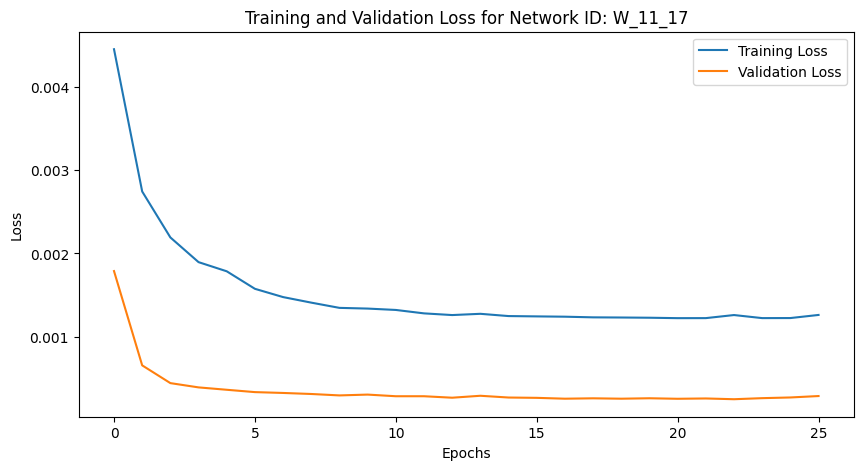

Training Progress:   0%|          | 25/10000 [00:52<5:51:36,  2.11s/epoch, loss=0.00126, val_loss=0.00029, patience=1]


Mean Squared Error: 0.002193992979964672
Iteration: 217, Window Size: 11, Y Days Ahead: 18
X shape: (3779, 11)
y shape: (3779, 18)
Initializing network with layer sizes: [11, 128, 64, 32, 18]
params_W_11_18.npz not found. Using randomly initialized parameters.
Training data shape: (3023, 11), (3023, 18), Validation data shape: (378, 11), (378, 18), Testing data shape: (378, 11), (378, 18)
Parameters loaded from params_W_11_18.npz


Training Progress:   0%|          | 26/10000 [00:54<5:28:17,  1.97s/epoch, loss=0.00135, val_loss=0.000285, patience=1]

Epoch 27/10000, Training Loss: 0.001352, Validation Loss: 0.000285
Early stopping at epoch 27. Best validation loss: 0.000272


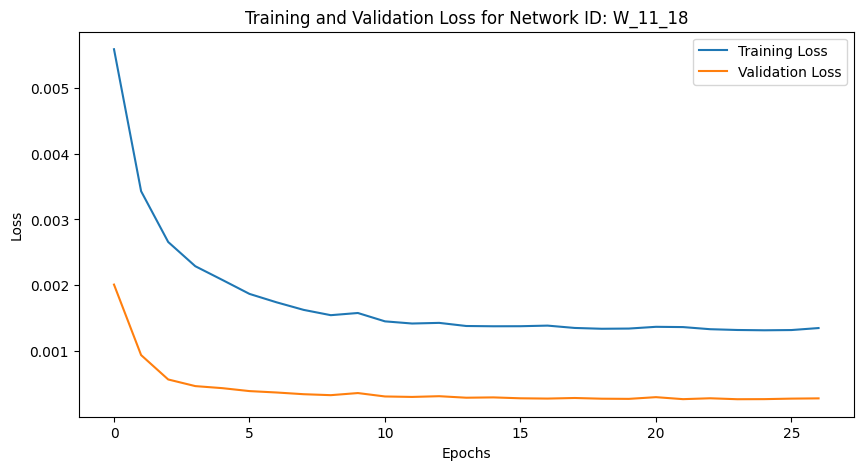

Training Progress:   0%|          | 26/10000 [00:54<5:46:57,  2.09s/epoch, loss=0.00135, val_loss=0.000285, patience=1]


Mean Squared Error: 0.0022663061034921867
Iteration: 218, Window Size: 11, Y Days Ahead: 19
X shape: (3778, 11)
y shape: (3778, 19)
Initializing network with layer sizes: [11, 128, 64, 32, 19]
params_W_11_19.npz not found. Using randomly initialized parameters.
Training data shape: (3022, 11), (3022, 19), Validation data shape: (378, 11), (378, 19), Testing data shape: (378, 11), (378, 19)
Parameters loaded from params_W_11_19.npz


Training Progress:   0%|          | 27/10000 [00:56<5:34:29,  2.01s/epoch, loss=0.00139, val_loss=0.000298, patience=1]

Epoch 28/10000, Training Loss: 0.001391, Validation Loss: 0.000298
Early stopping at epoch 28. Best validation loss: 0.000290


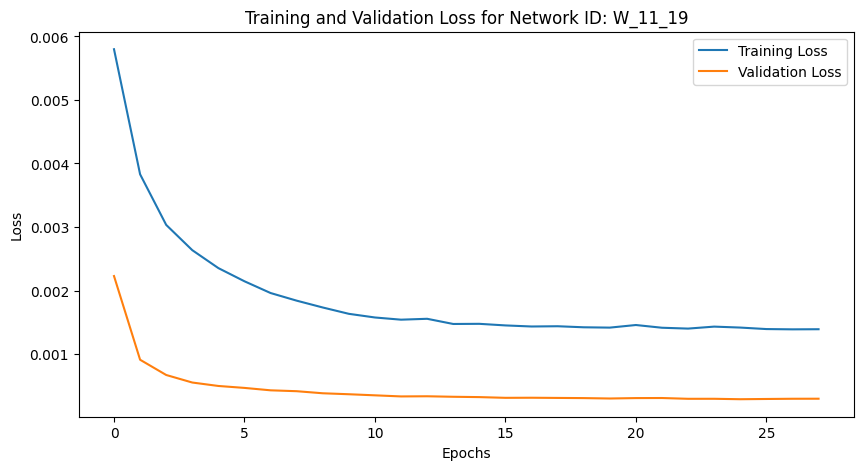

Training Progress:   0%|          | 27/10000 [00:56<5:50:08,  2.11s/epoch, loss=0.00139, val_loss=0.000298, patience=1]


Mean Squared Error: 0.002497219949279433
Iteration: 219, Window Size: 11, Y Days Ahead: 20
X shape: (3777, 11)
y shape: (3777, 20)
Initializing network with layer sizes: [11, 128, 64, 32, 20]
params_W_11_20.npz not found. Using randomly initialized parameters.
Training data shape: (3021, 11), (3021, 20), Validation data shape: (378, 11), (378, 20), Testing data shape: (378, 11), (378, 20)
Parameters loaded from params_W_11_20.npz


Training Progress:   0%|          | 19/10000 [00:40<5:38:54,  2.04s/epoch, loss=0.0015, val_loss=0.000314, patience=1] 

Epoch 20/10000, Training Loss: 0.001497, Validation Loss: 0.000314
Early stopping at epoch 20. Best validation loss: 0.000311


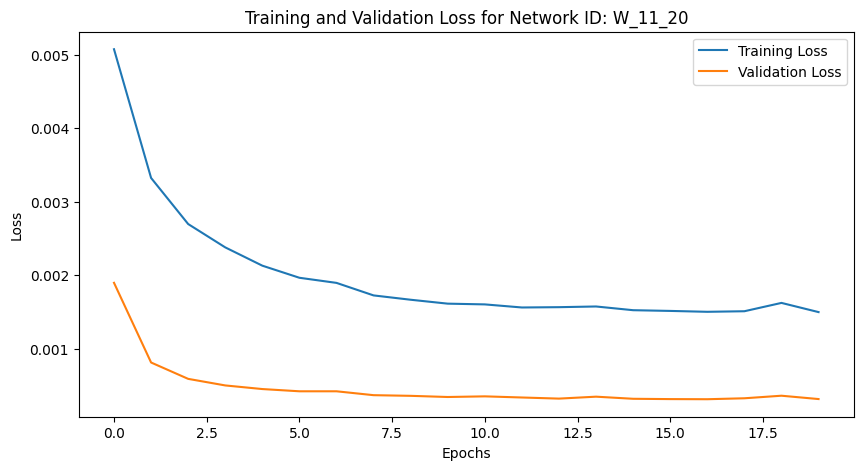

Training Progress:   0%|          | 19/10000 [00:40<5:57:11,  2.15s/epoch, loss=0.0015, val_loss=0.000314, patience=1]


Mean Squared Error: 0.0025358513741625425
Iteration: 220, Window Size: 12, Y Days Ahead: 1
X shape: (3795, 12)
y shape: (3795, 1)
Initializing network with layer sizes: [12, 128, 64, 32, 1]
params_W_12_1.npz not found. Using randomly initialized parameters.
Training data shape: (3036, 12), (3036, 1), Validation data shape: (379, 12), (379, 1), Testing data shape: (380, 12), (380, 1)
Parameters loaded from params_W_12_1.npz


Training Progress:   0%|          | 10/10000 [00:22<5:39:13,  2.04s/epoch, loss=0.000196, val_loss=4.7e-5, patience=1] 

Epoch 11/10000, Training Loss: 0.000196, Validation Loss: 0.000047
Early stopping at epoch 11. Best validation loss: 0.000040


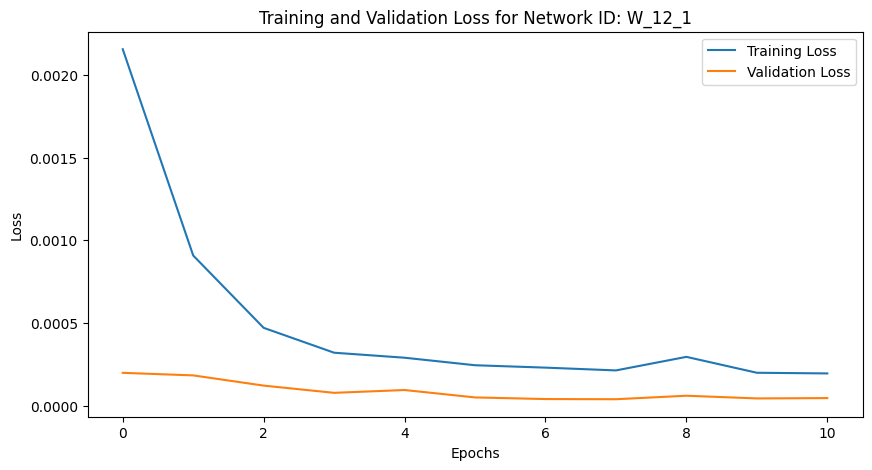

Training Progress:   0%|          | 10/10000 [00:22<6:20:31,  2.29s/epoch, loss=0.000196, val_loss=4.7e-5, patience=1]


Mean Squared Error: 0.000373334433810992
Iteration: 221, Window Size: 12, Y Days Ahead: 2
X shape: (3794, 12)
y shape: (3794, 2)
Initializing network with layer sizes: [12, 128, 64, 32, 2]
params_W_12_2.npz not found. Using randomly initialized parameters.
Training data shape: (3035, 12), (3035, 2), Validation data shape: (379, 12), (379, 2), Testing data shape: (380, 12), (380, 2)
Parameters loaded from params_W_12_2.npz


Training Progress:   0%|          | 15/10000 [00:32<5:34:33,  2.01s/epoch, loss=0.00025, val_loss=6.16e-5, patience=1] 

Epoch 16/10000, Training Loss: 0.000250, Validation Loss: 0.000062
Early stopping at epoch 16. Best validation loss: 0.000044


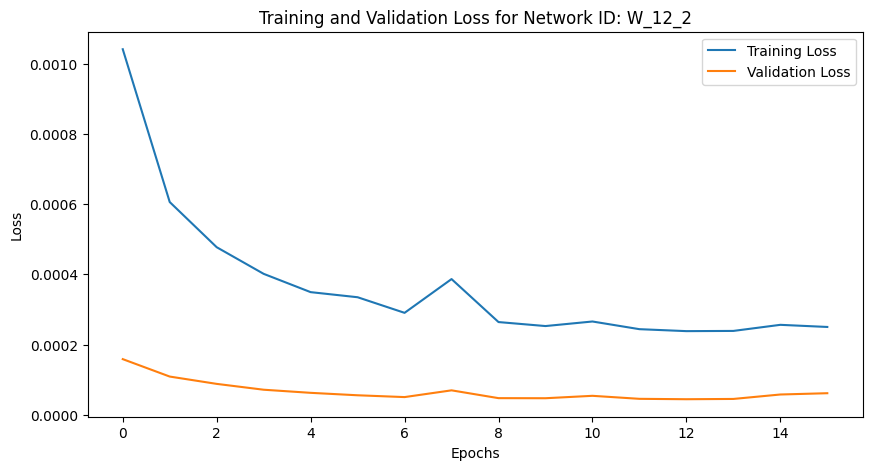

Training Progress:   0%|          | 15/10000 [00:32<6:00:05,  2.16s/epoch, loss=0.00025, val_loss=6.16e-5, patience=1]


Mean Squared Error: 0.0004575157257039737
Iteration: 222, Window Size: 12, Y Days Ahead: 3
X shape: (3793, 12)
y shape: (3793, 3)
Initializing network with layer sizes: [12, 128, 64, 32, 3]
params_W_12_3.npz not found. Using randomly initialized parameters.
Training data shape: (3034, 12), (3034, 3), Validation data shape: (379, 12), (379, 3), Testing data shape: (380, 12), (380, 3)
Parameters loaded from params_W_12_3.npz


Training Progress:   0%|          | 16/10000 [00:33<5:30:54,  1.99s/epoch, loss=0.000344, val_loss=7.12e-5, patience=1]

Epoch 17/10000, Training Loss: 0.000344, Validation Loss: 0.000071
Early stopping at epoch 17. Best validation loss: 0.000061


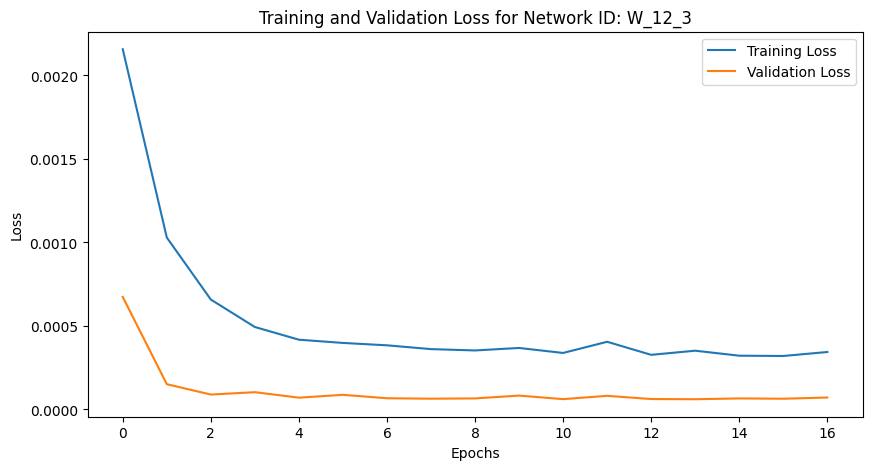

Training Progress:   0%|          | 16/10000 [00:34<5:55:28,  2.14s/epoch, loss=0.000344, val_loss=7.12e-5, patience=1]


Mean Squared Error: 0.0005354558451190354
Iteration: 223, Window Size: 12, Y Days Ahead: 4
X shape: (3792, 12)
y shape: (3792, 4)
Initializing network with layer sizes: [12, 128, 64, 32, 4]
params_W_12_4.npz not found. Using randomly initialized parameters.
Training data shape: (3033, 12), (3033, 4), Validation data shape: (379, 12), (379, 4), Testing data shape: (380, 12), (380, 4)
Parameters loaded from params_W_12_4.npz


Training Progress:   0%|          | 14/10000 [00:29<5:10:44,  1.87s/epoch, loss=0.0004, val_loss=7.64e-5, patience=1]  

Epoch 15/10000, Training Loss: 0.000400, Validation Loss: 0.000076
Early stopping at epoch 15. Best validation loss: 0.000071


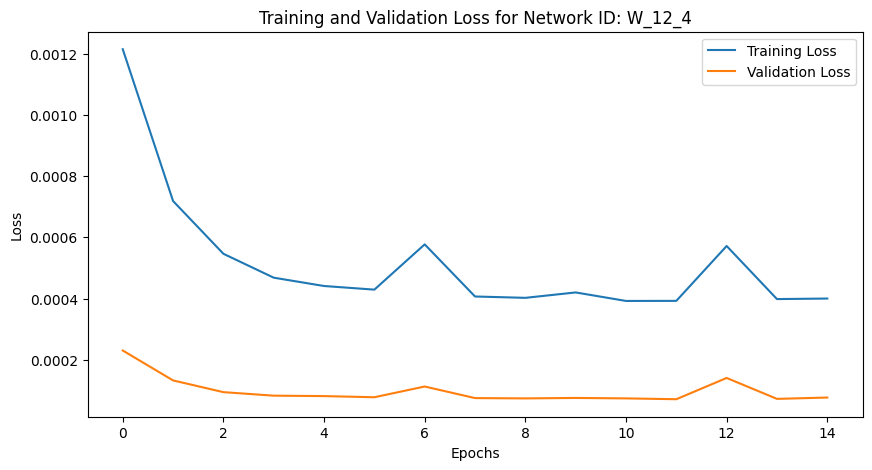

Training Progress:   0%|          | 14/10000 [00:29<5:51:44,  2.11s/epoch, loss=0.0004, val_loss=7.64e-5, patience=1]


Mean Squared Error: 0.0006649864603530441
Iteration: 224, Window Size: 12, Y Days Ahead: 5
X shape: (3791, 12)
y shape: (3791, 5)
Initializing network with layer sizes: [12, 128, 64, 32, 5]
params_W_12_5.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 12), (3032, 5), Validation data shape: (379, 12), (379, 5), Testing data shape: (380, 12), (380, 5)
Parameters loaded from params_W_12_5.npz


Training Progress:   0%|          | 13/10000 [00:26<5:14:38,  1.89s/epoch, loss=0.000491, val_loss=0.000116, patience=1]

Epoch 14/10000, Training Loss: 0.000491, Validation Loss: 0.000116
Early stopping at epoch 14. Best validation loss: 0.000084


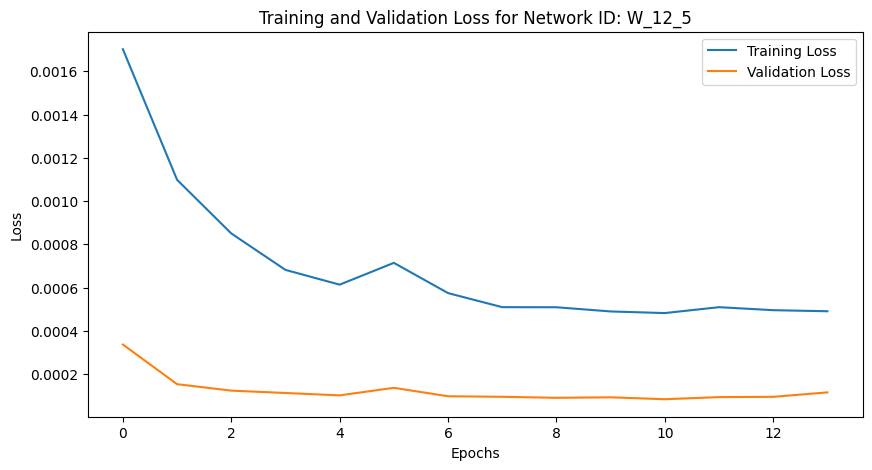

Training Progress:   0%|          | 13/10000 [00:27<5:47:41,  2.09s/epoch, loss=0.000491, val_loss=0.000116, patience=1]


Mean Squared Error: 0.0007889636161415142
Iteration: 225, Window Size: 12, Y Days Ahead: 6
X shape: (3790, 12)
y shape: (3790, 6)
Initializing network with layer sizes: [12, 128, 64, 32, 6]
params_W_12_6.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 12), (3032, 6), Validation data shape: (379, 12), (379, 6), Testing data shape: (379, 12), (379, 6)
Parameters loaded from params_W_12_6.npz


Training Progress:   0%|          | 13/10000 [00:28<5:29:19,  1.98s/epoch, loss=0.000607, val_loss=0.000132, patience=1]

Epoch 14/10000, Training Loss: 0.000607, Validation Loss: 0.000132
Early stopping at epoch 14. Best validation loss: 0.000106


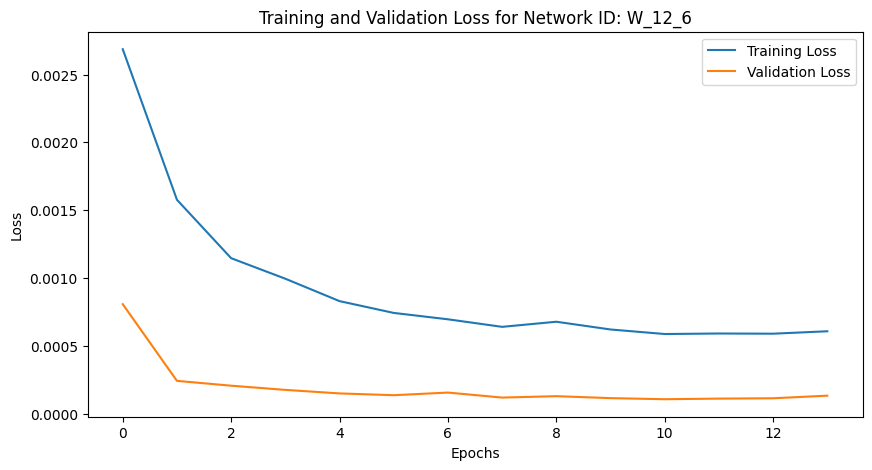

Training Progress:   0%|          | 13/10000 [00:28<6:03:23,  2.18s/epoch, loss=0.000607, val_loss=0.000132, patience=1]


Mean Squared Error: 0.0009396202617392114
Iteration: 226, Window Size: 12, Y Days Ahead: 7
X shape: (3789, 12)
y shape: (3789, 7)
Initializing network with layer sizes: [12, 128, 64, 32, 7]
params_W_12_7.npz not found. Using randomly initialized parameters.
Training data shape: (3031, 12), (3031, 7), Validation data shape: (379, 12), (379, 7), Testing data shape: (379, 12), (379, 7)
Parameters loaded from params_W_12_7.npz


Training Progress:   0%|          | 15/10000 [00:31<5:26:36,  1.96s/epoch, loss=0.000623, val_loss=0.00012, patience=1] 

Epoch 16/10000, Training Loss: 0.000623, Validation Loss: 0.000120
Early stopping at epoch 16. Best validation loss: 0.000109


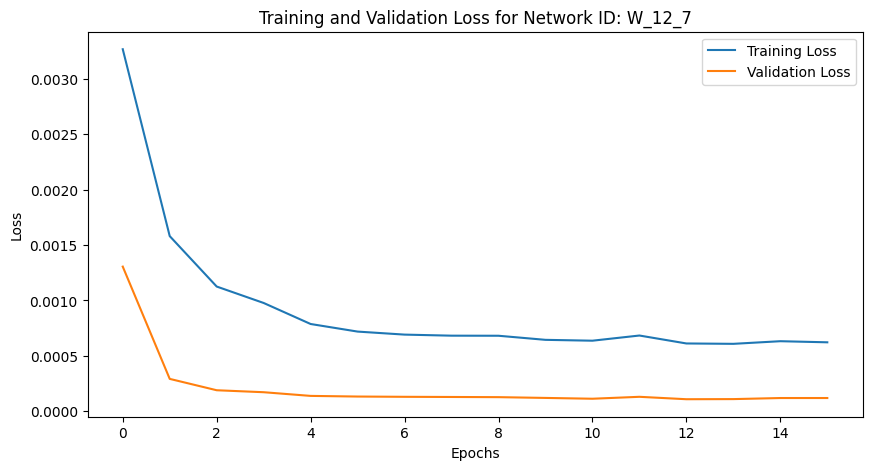

Training Progress:   0%|          | 15/10000 [00:31<5:52:09,  2.12s/epoch, loss=0.000623, val_loss=0.00012, patience=1]


Mean Squared Error: 0.0010125293430083056
Iteration: 227, Window Size: 12, Y Days Ahead: 8
X shape: (3788, 12)
y shape: (3788, 8)
Initializing network with layer sizes: [12, 128, 64, 32, 8]
params_W_12_8.npz not found. Using randomly initialized parameters.
Training data shape: (3030, 12), (3030, 8), Validation data shape: (379, 12), (379, 8), Testing data shape: (379, 12), (379, 8)
Parameters loaded from params_W_12_8.npz


Training Progress:   0%|          | 21/10000 [00:42<5:17:47,  1.91s/epoch, loss=0.000695, val_loss=0.000139, patience=1]

Epoch 22/10000, Training Loss: 0.000695, Validation Loss: 0.000139
Early stopping at epoch 22. Best validation loss: 0.000120


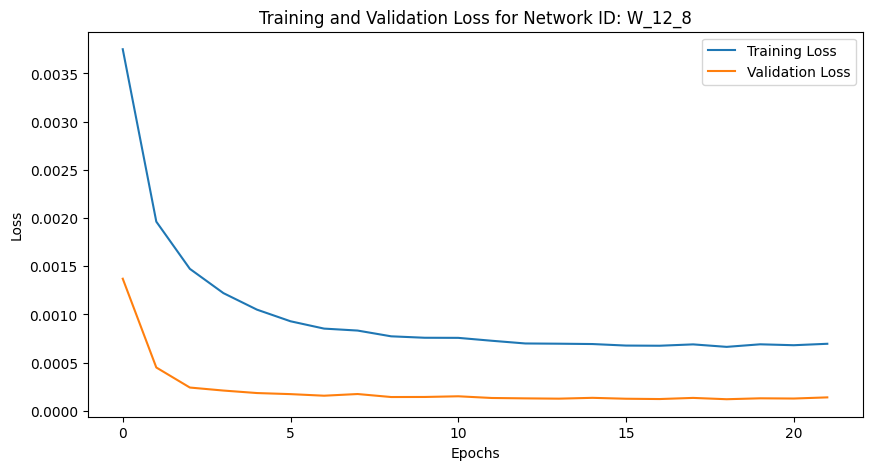

Training Progress:   0%|          | 21/10000 [00:42<5:38:00,  2.03s/epoch, loss=0.000695, val_loss=0.000139, patience=1]


Mean Squared Error: 0.0010980723297532094
Iteration: 228, Window Size: 12, Y Days Ahead: 9
X shape: (3787, 12)
y shape: (3787, 9)
Initializing network with layer sizes: [12, 128, 64, 32, 9]
params_W_12_9.npz not found. Using randomly initialized parameters.
Training data shape: (3029, 12), (3029, 9), Validation data shape: (379, 12), (379, 9), Testing data shape: (379, 12), (379, 9)
Parameters loaded from params_W_12_9.npz


Training Progress:   0%|          | 18/10000 [00:37<5:08:22,  1.85s/epoch, loss=0.000709, val_loss=0.000137, patience=1]

Epoch 19/10000, Training Loss: 0.000709, Validation Loss: 0.000137
Early stopping at epoch 19. Best validation loss: 0.000136


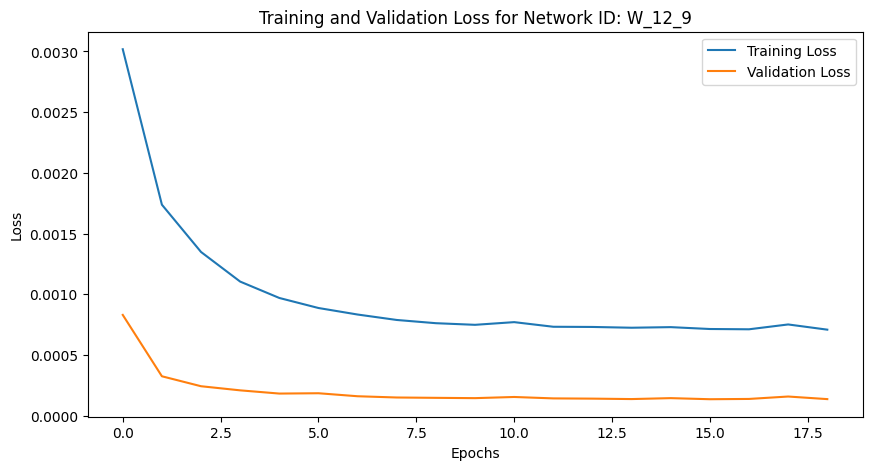

Training Progress:   0%|          | 18/10000 [00:38<5:53:16,  2.12s/epoch, loss=0.000709, val_loss=0.000137, patience=1]


Mean Squared Error: 0.0011788721971744405
Iteration: 229, Window Size: 12, Y Days Ahead: 10
X shape: (3786, 12)
y shape: (3786, 10)
Initializing network with layer sizes: [12, 128, 64, 32, 10]
params_W_12_10.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 12), (3028, 10), Validation data shape: (379, 12), (379, 10), Testing data shape: (379, 12), (379, 10)
Parameters loaded from params_W_12_10.npz


Training Progress:   0%|          | 22/10000 [00:44<5:19:07,  1.92s/epoch, loss=0.000826, val_loss=0.000177, patience=1]

Epoch 23/10000, Training Loss: 0.000826, Validation Loss: 0.000177
Early stopping at epoch 23. Best validation loss: 0.000149


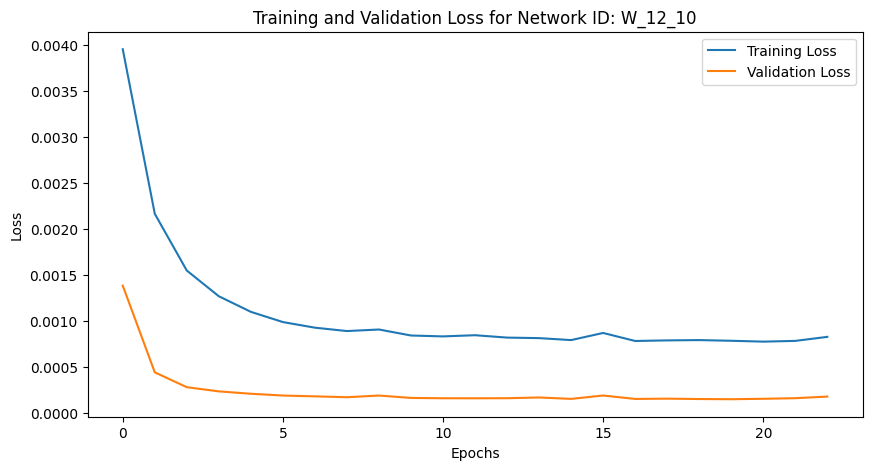

Training Progress:   0%|          | 22/10000 [00:44<5:37:58,  2.03s/epoch, loss=0.000826, val_loss=0.000177, patience=1]


Mean Squared Error: 0.0012895283666239387
Iteration: 230, Window Size: 12, Y Days Ahead: 11
X shape: (3785, 12)
y shape: (3785, 11)
Initializing network with layer sizes: [12, 128, 64, 32, 11]
params_W_12_11.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 12), (3028, 11), Validation data shape: (378, 12), (378, 11), Testing data shape: (379, 12), (379, 11)
Parameters loaded from params_W_12_11.npz


Training Progress:   0%|          | 19/10000 [00:39<5:44:18,  2.07s/epoch, loss=0.000876, val_loss=0.00019, patience=1] 

Epoch 20/10000, Training Loss: 0.000876, Validation Loss: 0.000190
Early stopping at epoch 20. Best validation loss: 0.000164


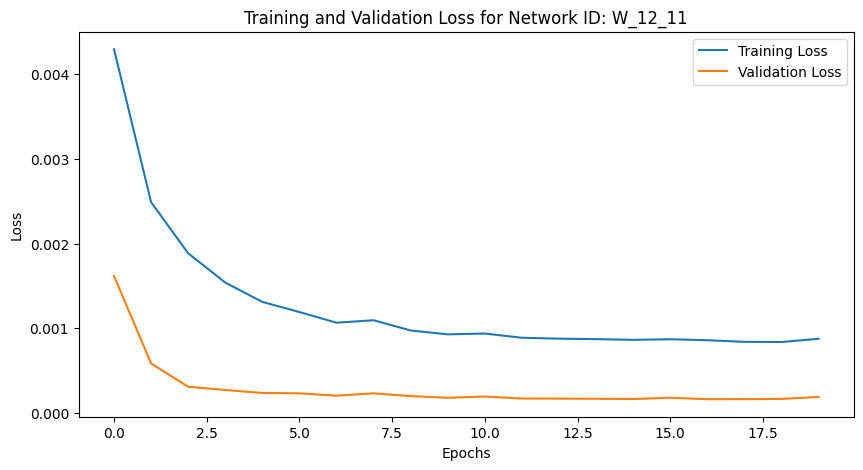

Training Progress:   0%|          | 19/10000 [00:39<5:47:32,  2.09s/epoch, loss=0.000876, val_loss=0.00019, patience=1]


Mean Squared Error: 0.0014367191754484495
Iteration: 231, Window Size: 12, Y Days Ahead: 12
X shape: (3784, 12)
y shape: (3784, 12)
Initializing network with layer sizes: [12, 128, 64, 32, 12]
params_W_12_12.npz not found. Using randomly initialized parameters.
Training data shape: (3027, 12), (3027, 12), Validation data shape: (378, 12), (378, 12), Testing data shape: (379, 12), (379, 12)
Parameters loaded from params_W_12_12.npz


Training Progress:   0%|          | 19/10000 [00:40<5:18:10,  1.91s/epoch, loss=0.000947, val_loss=0.000194, patience=1]

Epoch 20/10000, Training Loss: 0.000947, Validation Loss: 0.000194
Early stopping at epoch 20. Best validation loss: 0.000190


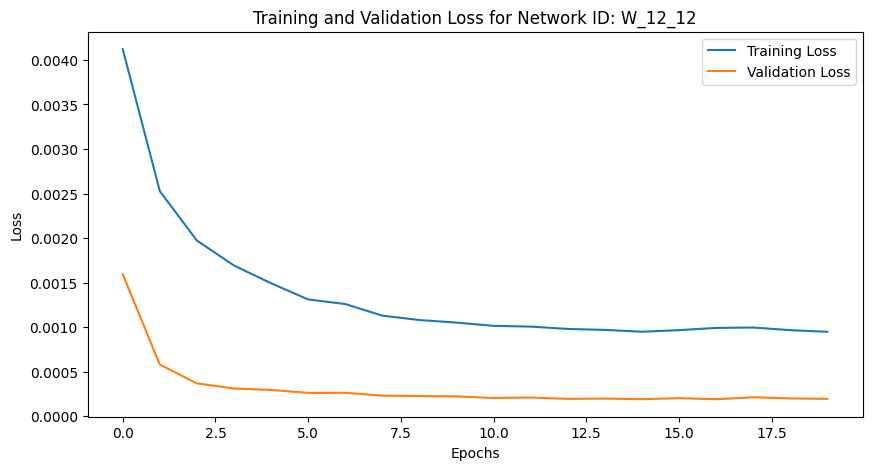

Training Progress:   0%|          | 19/10000 [00:40<5:58:53,  2.16s/epoch, loss=0.000947, val_loss=0.000194, patience=1]


Mean Squared Error: 0.0016381842792555967
Iteration: 232, Window Size: 12, Y Days Ahead: 13
X shape: (3783, 12)
y shape: (3783, 13)
Initializing network with layer sizes: [12, 128, 64, 32, 13]
params_W_12_13.npz not found. Using randomly initialized parameters.
Training data shape: (3026, 12), (3026, 13), Validation data shape: (378, 12), (378, 13), Testing data shape: (379, 12), (379, 13)
Parameters loaded from params_W_12_13.npz


Training Progress:   0%|          | 21/10000 [00:44<5:41:16,  2.05s/epoch, loss=0.000974, val_loss=0.000194, patience=1]

Epoch 22/10000, Training Loss: 0.000974, Validation Loss: 0.000194
Early stopping at epoch 22. Best validation loss: 0.000190


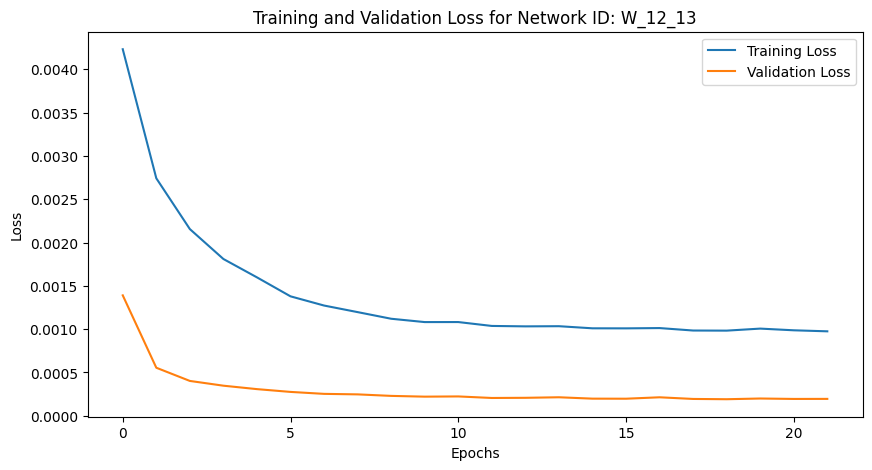

Training Progress:   0%|          | 21/10000 [00:45<5:56:53,  2.15s/epoch, loss=0.000974, val_loss=0.000194, patience=1]


Mean Squared Error: 0.001651222204252101
Iteration: 233, Window Size: 12, Y Days Ahead: 14
X shape: (3782, 12)
y shape: (3782, 14)
Initializing network with layer sizes: [12, 128, 64, 32, 14]
params_W_12_14.npz not found. Using randomly initialized parameters.
Training data shape: (3025, 12), (3025, 14), Validation data shape: (378, 12), (378, 14), Testing data shape: (379, 12), (379, 14)
Parameters loaded from params_W_12_14.npz


Training Progress:   0%|          | 25/10000 [00:51<5:29:45,  1.98s/epoch, loss=0.00103, val_loss=0.000211, patience=1]

Epoch 26/10000, Training Loss: 0.001029, Validation Loss: 0.000211
Early stopping at epoch 26. Best validation loss: 0.000209


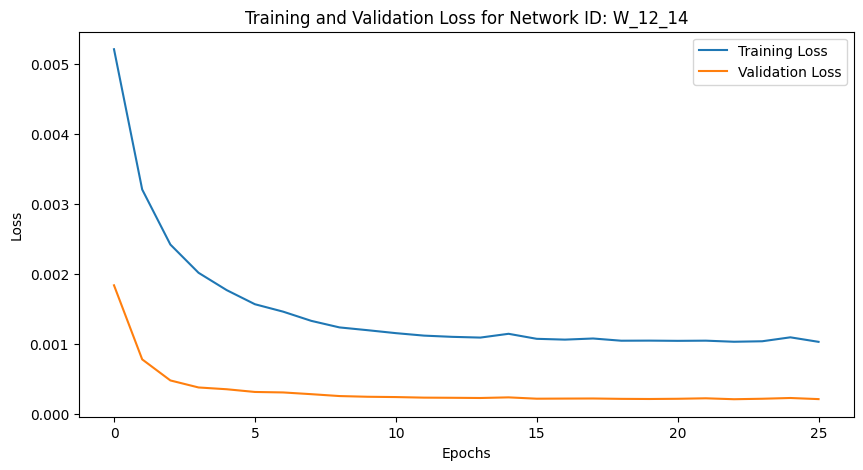

Training Progress:   0%|          | 25/10000 [00:52<5:47:26,  2.09s/epoch, loss=0.00103, val_loss=0.000211, patience=1]


Mean Squared Error: 0.0016498612272983775
Iteration: 234, Window Size: 12, Y Days Ahead: 15
X shape: (3781, 12)
y shape: (3781, 15)
Initializing network with layer sizes: [12, 128, 64, 32, 15]
params_W_12_15.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 12), (3024, 15), Validation data shape: (378, 12), (378, 15), Testing data shape: (379, 12), (379, 15)
Parameters loaded from params_W_12_15.npz


Training Progress:   0%|          | 25/10000 [00:54<5:31:03,  1.99s/epoch, loss=0.00114, val_loss=0.000226, patience=1]

Epoch 26/10000, Training Loss: 0.001136, Validation Loss: 0.000226
Early stopping at epoch 26. Best validation loss: 0.000221


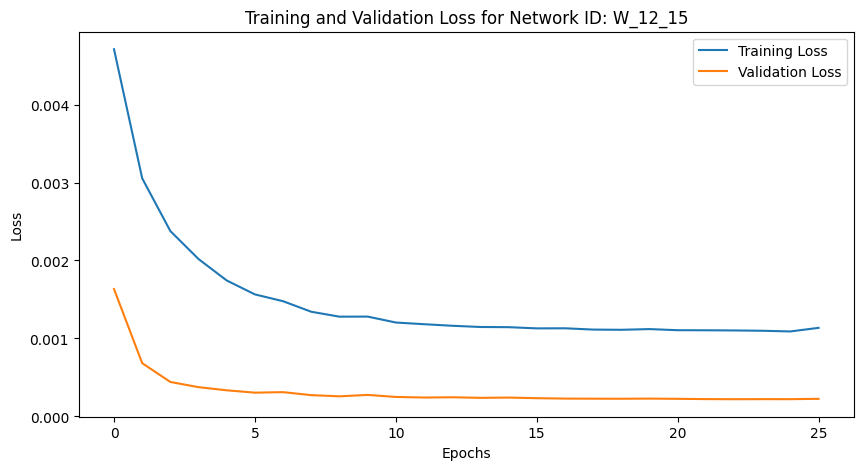

Training Progress:   0%|          | 25/10000 [00:54<6:00:53,  2.17s/epoch, loss=0.00114, val_loss=0.000226, patience=1]


Mean Squared Error: 0.0017963221768003243
Iteration: 235, Window Size: 12, Y Days Ahead: 16
X shape: (3780, 12)
y shape: (3780, 16)
Initializing network with layer sizes: [12, 128, 64, 32, 16]
params_W_12_16.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 12), (3024, 16), Validation data shape: (378, 12), (378, 16), Testing data shape: (378, 12), (378, 16)
Parameters loaded from params_W_12_16.npz


Training Progress:   0%|          | 20/10000 [00:43<5:39:37,  2.04s/epoch, loss=0.00122, val_loss=0.000255, patience=1]

Epoch 21/10000, Training Loss: 0.001224, Validation Loss: 0.000255
Early stopping at epoch 21. Best validation loss: 0.000243


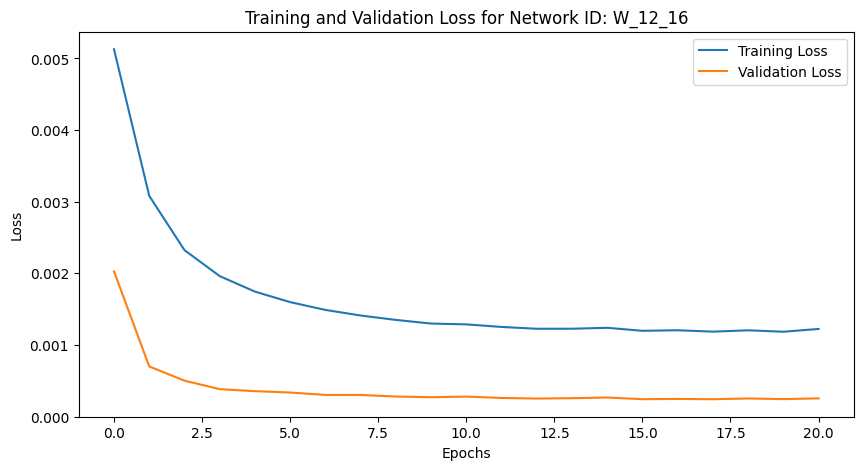

Training Progress:   0%|          | 20/10000 [00:44<6:06:37,  2.20s/epoch, loss=0.00122, val_loss=0.000255, patience=1]


Mean Squared Error: 0.0018952591271377242
Iteration: 236, Window Size: 12, Y Days Ahead: 17
X shape: (3779, 12)
y shape: (3779, 17)
Initializing network with layer sizes: [12, 128, 64, 32, 17]
params_W_12_17.npz not found. Using randomly initialized parameters.
Training data shape: (3023, 12), (3023, 17), Validation data shape: (378, 12), (378, 17), Testing data shape: (378, 12), (378, 17)
Parameters loaded from params_W_12_17.npz


Training Progress:   0%|          | 23/10000 [00:49<5:40:23,  2.05s/epoch, loss=0.00125, val_loss=0.00026, patience=1] 

Epoch 24/10000, Training Loss: 0.001251, Validation Loss: 0.000260
Early stopping at epoch 24. Best validation loss: 0.000257


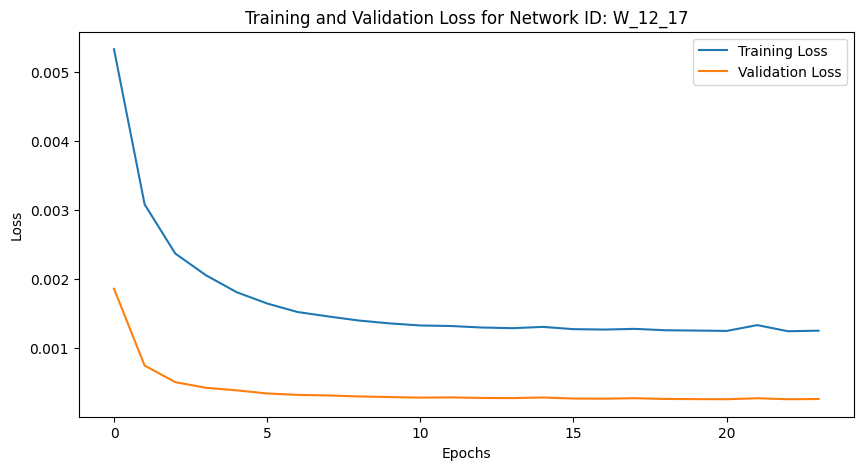

Training Progress:   0%|          | 23/10000 [00:49<5:56:53,  2.15s/epoch, loss=0.00125, val_loss=0.00026, patience=1]


Mean Squared Error: 0.0020402109022913026
Iteration: 237, Window Size: 12, Y Days Ahead: 18
X shape: (3778, 12)
y shape: (3778, 18)
Initializing network with layer sizes: [12, 128, 64, 32, 18]
params_W_12_18.npz not found. Using randomly initialized parameters.
Training data shape: (3022, 12), (3022, 18), Validation data shape: (378, 12), (378, 18), Testing data shape: (378, 12), (378, 18)
Parameters loaded from params_W_12_18.npz


Training Progress:   0%|          | 24/10000 [00:49<5:14:00,  1.89s/epoch, loss=0.00133, val_loss=0.000277, patience=1]

Epoch 25/10000, Training Loss: 0.001335, Validation Loss: 0.000277
Early stopping at epoch 25. Best validation loss: 0.000276


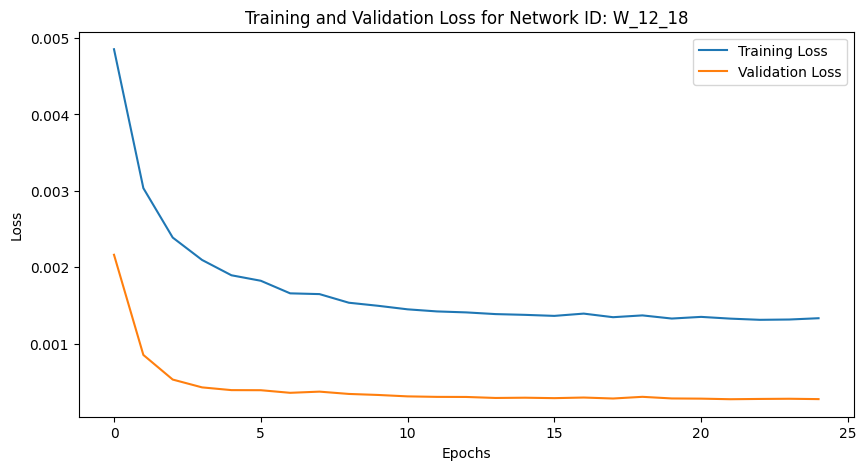

Training Progress:   0%|          | 24/10000 [00:49<5:44:30,  2.07s/epoch, loss=0.00133, val_loss=0.000277, patience=1]


Mean Squared Error: 0.002273019818471799
Iteration: 238, Window Size: 12, Y Days Ahead: 19
X shape: (3777, 12)
y shape: (3777, 19)
Initializing network with layer sizes: [12, 128, 64, 32, 19]
params_W_12_19.npz not found. Using randomly initialized parameters.
Training data shape: (3021, 12), (3021, 19), Validation data shape: (378, 12), (378, 19), Testing data shape: (378, 12), (378, 19)
Parameters loaded from params_W_12_19.npz


Training Progress:   0%|          | 31/10000 [01:05<5:24:08,  1.95s/epoch, loss=0.00144, val_loss=0.000302, patience=1]

Epoch 32/10000, Training Loss: 0.001438, Validation Loss: 0.000302
Early stopping at epoch 32. Best validation loss: 0.000290


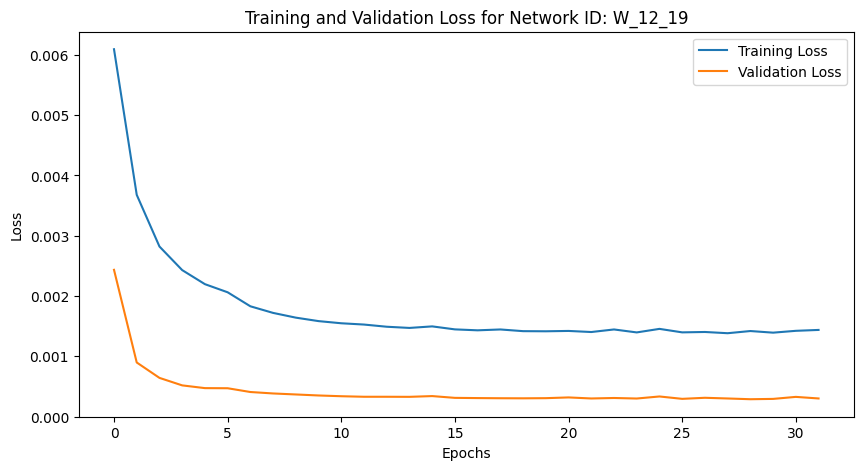

Training Progress:   0%|          | 31/10000 [01:06<5:55:02,  2.14s/epoch, loss=0.00144, val_loss=0.000302, patience=1]


Mean Squared Error: 0.0024638076327219045
Iteration: 239, Window Size: 12, Y Days Ahead: 20
X shape: (3776, 12)
y shape: (3776, 20)
Initializing network with layer sizes: [12, 128, 64, 32, 20]
params_W_12_20.npz not found. Using randomly initialized parameters.
Training data shape: (3020, 12), (3020, 20), Validation data shape: (378, 12), (378, 20), Testing data shape: (378, 12), (378, 20)
Parameters loaded from params_W_12_20.npz


Training Progress:   0%|          | 28/10000 [00:59<5:38:50,  2.04s/epoch, loss=0.00146, val_loss=0.000319, patience=1]

Epoch 29/10000, Training Loss: 0.001465, Validation Loss: 0.000319
Early stopping at epoch 29. Best validation loss: 0.000309


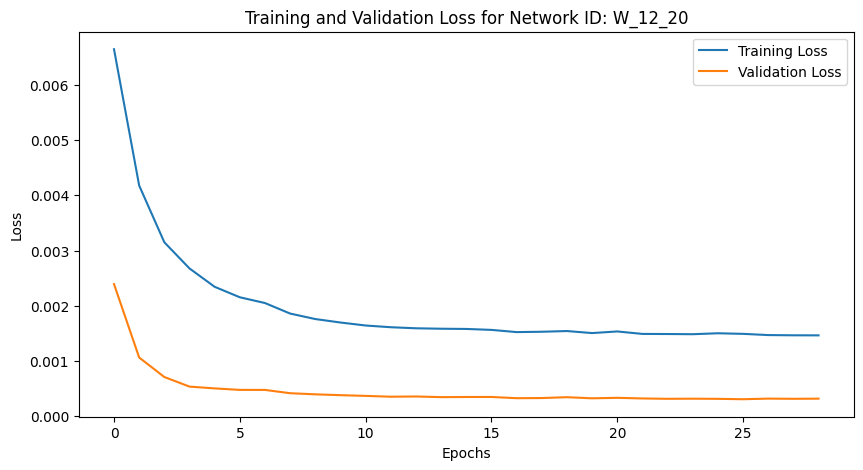

Training Progress:   0%|          | 28/10000 [00:59<5:52:37,  2.12s/epoch, loss=0.00146, val_loss=0.000319, patience=1]


Mean Squared Error: 0.0025642467800008777
Iteration: 240, Window Size: 13, Y Days Ahead: 1
X shape: (3794, 13)
y shape: (3794, 1)
Initializing network with layer sizes: [13, 128, 64, 32, 1]
params_W_13_1.npz not found. Using randomly initialized parameters.
Training data shape: (3035, 13), (3035, 1), Validation data shape: (379, 13), (379, 1), Testing data shape: (380, 13), (380, 1)
Parameters loaded from params_W_13_1.npz


Training Progress:   0%|          | 7/10000 [00:15<5:34:46,  2.01s/epoch, loss=0.0002, val_loss=5.3e-5, patience=1]   

Epoch 8/10000, Training Loss: 0.000200, Validation Loss: 0.000053
Early stopping at epoch 8. Best validation loss: 0.000041


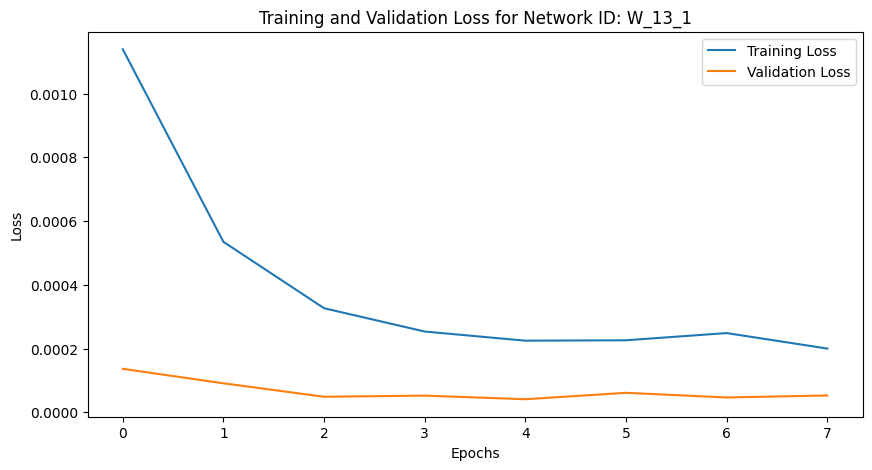

Training Progress:   0%|          | 7/10000 [00:16<6:21:31,  2.29s/epoch, loss=0.0002, val_loss=5.3e-5, patience=1]


Mean Squared Error: 0.0003916663734775772
Iteration: 241, Window Size: 13, Y Days Ahead: 2
X shape: (3793, 13)
y shape: (3793, 2)
Initializing network with layer sizes: [13, 128, 64, 32, 2]
params_W_13_2.npz not found. Using randomly initialized parameters.
Training data shape: (3034, 13), (3034, 2), Validation data shape: (379, 13), (379, 2), Testing data shape: (380, 13), (380, 2)
Parameters loaded from params_W_13_2.npz


Training Progress:   0%|          | 13/10000 [00:28<5:37:27,  2.03s/epoch, loss=0.000279, val_loss=6.05e-5, patience=1]

Epoch 14/10000, Training Loss: 0.000279, Validation Loss: 0.000061
Early stopping at epoch 14. Best validation loss: 0.000053


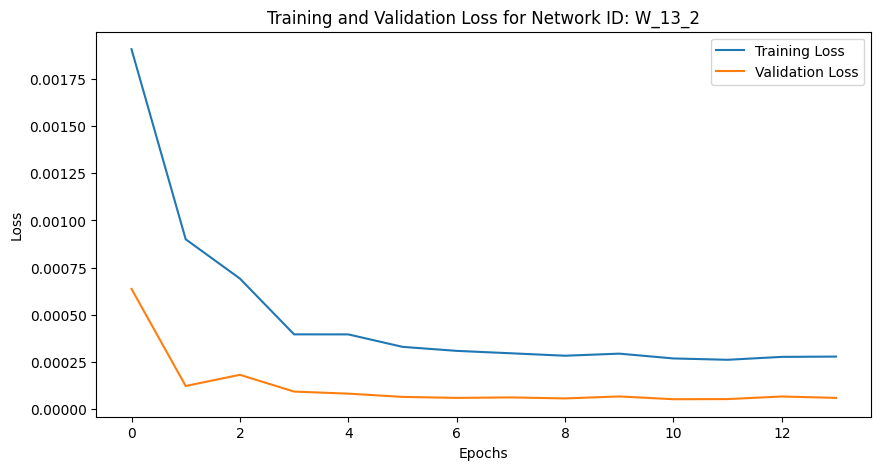

Training Progress:   0%|          | 13/10000 [00:28<6:06:10,  2.20s/epoch, loss=0.000279, val_loss=6.05e-5, patience=1]


Mean Squared Error: 0.00047581084210427185
Iteration: 242, Window Size: 13, Y Days Ahead: 3
X shape: (3792, 13)
y shape: (3792, 3)
Initializing network with layer sizes: [13, 128, 64, 32, 3]
params_W_13_3.npz not found. Using randomly initialized parameters.
Training data shape: (3033, 13), (3033, 3), Validation data shape: (379, 13), (379, 3), Testing data shape: (380, 13), (380, 3)
Parameters loaded from params_W_13_3.npz


Training Progress:   0%|          | 13/10000 [00:30<5:51:05,  2.11s/epoch, loss=0.000375, val_loss=8.32e-5, patience=1]

Epoch 14/10000, Training Loss: 0.000375, Validation Loss: 0.000083
Early stopping at epoch 14. Best validation loss: 0.000073


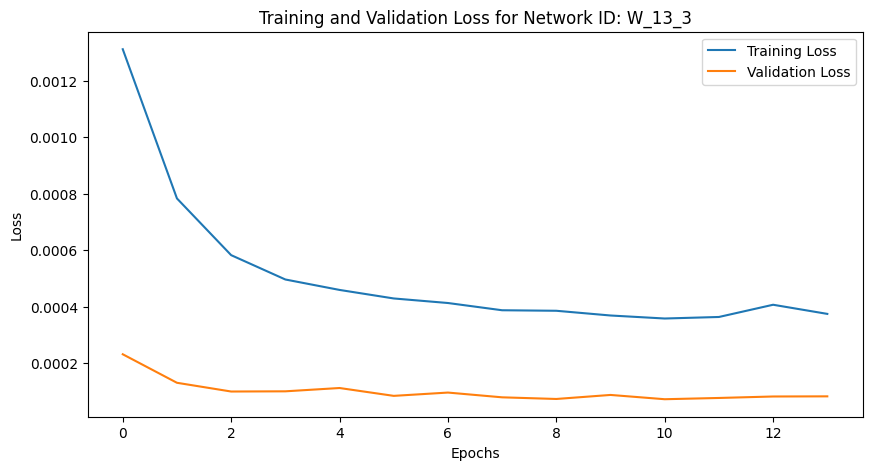

Training Progress:   0%|          | 13/10000 [00:30<6:33:39,  2.37s/epoch, loss=0.000375, val_loss=8.32e-5, patience=1]


Mean Squared Error: 0.0005636070221142934
Iteration: 243, Window Size: 13, Y Days Ahead: 4
X shape: (3791, 13)
y shape: (3791, 4)
Initializing network with layer sizes: [13, 128, 64, 32, 4]
params_W_13_4.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 13), (3032, 4), Validation data shape: (379, 13), (379, 4), Testing data shape: (380, 13), (380, 4)
Parameters loaded from params_W_13_4.npz


Training Progress:   0%|          | 17/10000 [00:37<5:26:11,  1.96s/epoch, loss=0.000398, val_loss=7.99e-5, patience=1] 

Epoch 18/10000, Training Loss: 0.000398, Validation Loss: 0.000080
Early stopping at epoch 18. Best validation loss: 0.000079


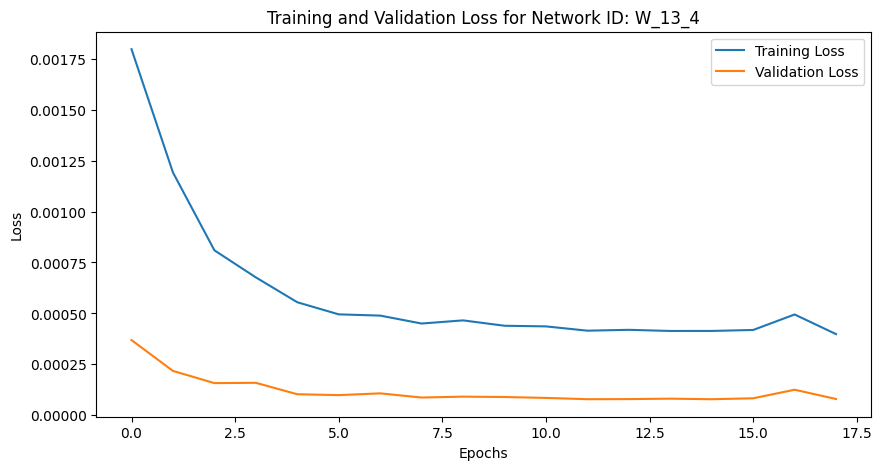

Training Progress:   0%|          | 17/10000 [00:37<6:08:20,  2.21s/epoch, loss=0.000398, val_loss=7.99e-5, patience=1]


Mean Squared Error: 0.0006654549523470474
Iteration: 244, Window Size: 13, Y Days Ahead: 5
X shape: (3790, 13)
y shape: (3790, 5)
Initializing network with layer sizes: [13, 128, 64, 32, 5]
params_W_13_5.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 13), (3032, 5), Validation data shape: (379, 13), (379, 5), Testing data shape: (379, 13), (379, 5)
Parameters loaded from params_W_13_5.npz


Training Progress:   0%|          | 16/10000 [00:35<5:37:28,  2.03s/epoch, loss=0.000491, val_loss=9.88e-5, patience=1] 

Epoch 17/10000, Training Loss: 0.000491, Validation Loss: 0.000099
Early stopping at epoch 17. Best validation loss: 0.000093


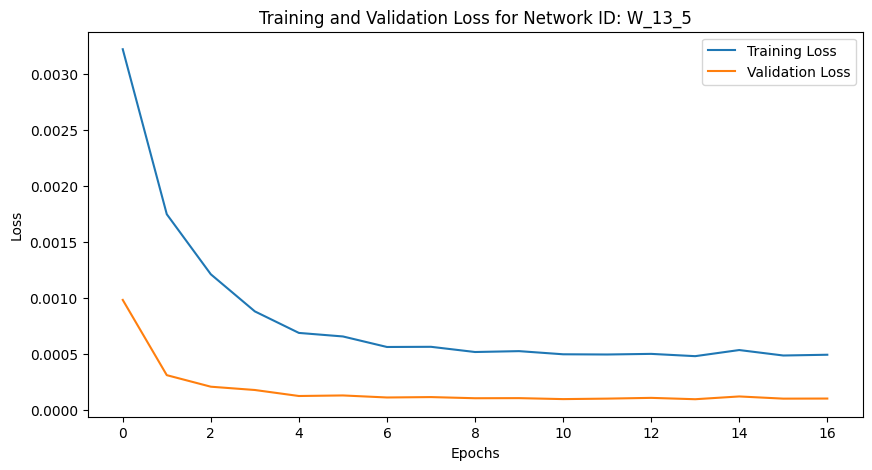

Training Progress:   0%|          | 16/10000 [00:35<6:11:33,  2.23s/epoch, loss=0.000491, val_loss=9.88e-5, patience=1]


Mean Squared Error: 0.0007859964991941441
Iteration: 245, Window Size: 13, Y Days Ahead: 6
X shape: (3789, 13)
y shape: (3789, 6)
Initializing network with layer sizes: [13, 128, 64, 32, 6]
params_W_13_6.npz not found. Using randomly initialized parameters.
Training data shape: (3031, 13), (3031, 6), Validation data shape: (379, 13), (379, 6), Testing data shape: (379, 13), (379, 6)
Parameters loaded from params_W_13_6.npz


Training Progress:   0%|          | 27/10000 [00:59<6:08:44,  2.22s/epoch, loss=0.000517, val_loss=9.99e-5, patience=1] 

Epoch 28/10000, Training Loss: 0.000517, Validation Loss: 0.000100
Early stopping at epoch 28. Best validation loss: 0.000099


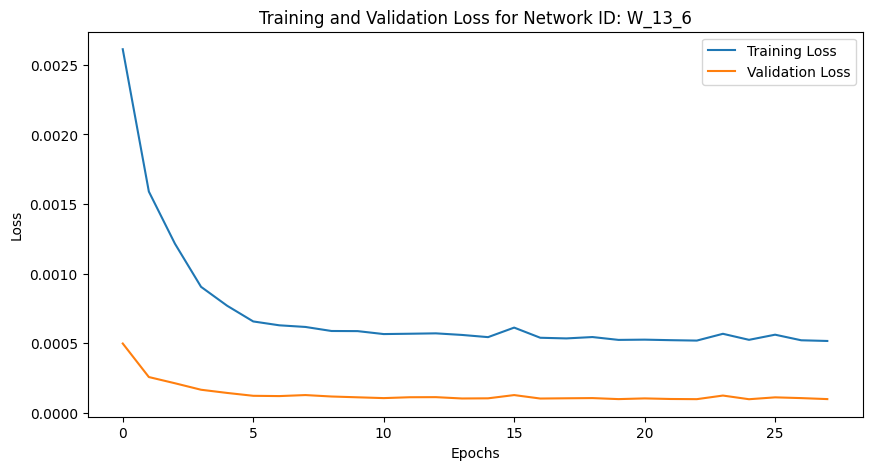

Training Progress:   0%|          | 27/10000 [00:59<6:06:23,  2.20s/epoch, loss=0.000517, val_loss=9.99e-5, patience=1]


Mean Squared Error: 0.0008798956489176925
Iteration: 246, Window Size: 13, Y Days Ahead: 7
X shape: (3788, 13)
y shape: (3788, 7)
Initializing network with layer sizes: [13, 128, 64, 32, 7]
params_W_13_7.npz not found. Using randomly initialized parameters.
Training data shape: (3030, 13), (3030, 7), Validation data shape: (379, 13), (379, 7), Testing data shape: (379, 13), (379, 7)
Parameters loaded from params_W_13_7.npz


Training Progress:   0%|          | 13/10000 [00:28<5:32:34,  2.00s/epoch, loss=0.000631, val_loss=0.000125, patience=1]

Epoch 14/10000, Training Loss: 0.000631, Validation Loss: 0.000125
Early stopping at epoch 14. Best validation loss: 0.000125


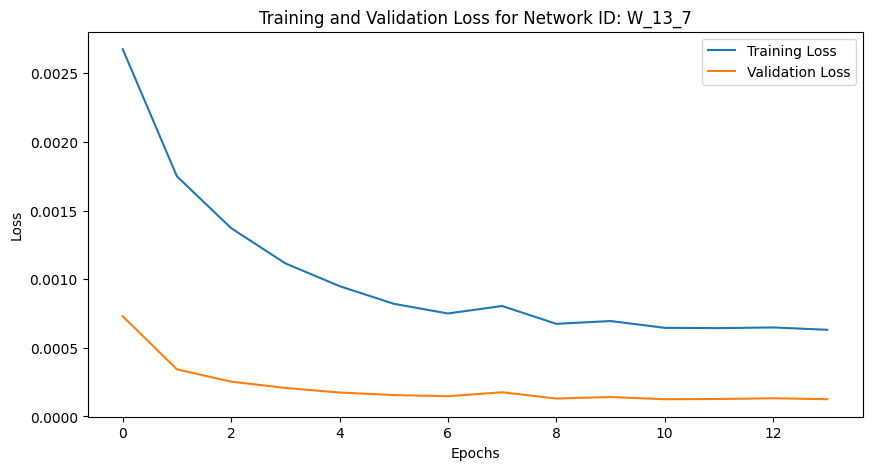

Training Progress:   0%|          | 13/10000 [00:28<6:08:18,  2.21s/epoch, loss=0.000631, val_loss=0.000125, patience=1]


Mean Squared Error: 0.0009625138615951198
Iteration: 247, Window Size: 13, Y Days Ahead: 8
X shape: (3787, 13)
y shape: (3787, 8)
Initializing network with layer sizes: [13, 128, 64, 32, 8]
params_W_13_8.npz not found. Using randomly initialized parameters.
Training data shape: (3029, 13), (3029, 8), Validation data shape: (379, 13), (379, 8), Testing data shape: (379, 13), (379, 8)
Parameters loaded from params_W_13_8.npz


Training Progress:   0%|          | 12/10000 [00:28<5:49:28,  2.10s/epoch, loss=0.000697, val_loss=0.000139, patience=1]

Epoch 13/10000, Training Loss: 0.000697, Validation Loss: 0.000139
Early stopping at epoch 13. Best validation loss: 0.000138


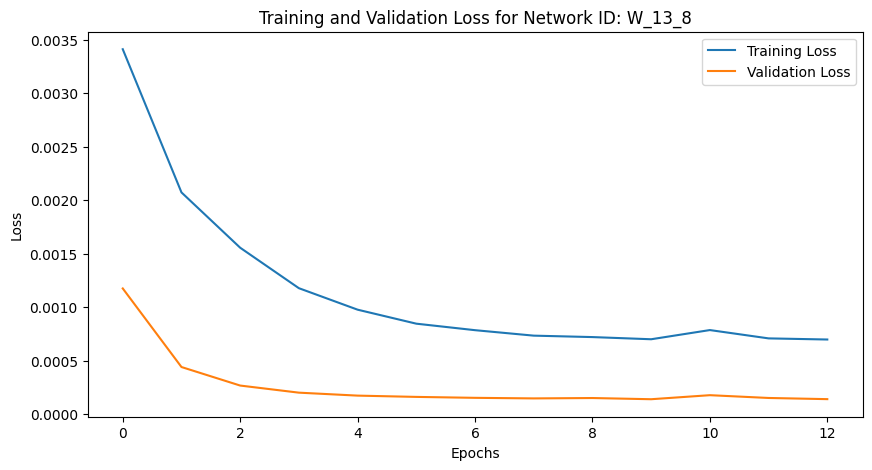

Training Progress:   0%|          | 12/10000 [00:29<6:46:35,  2.44s/epoch, loss=0.000697, val_loss=0.000139, patience=1]


Mean Squared Error: 0.0010781752449620222
Iteration: 248, Window Size: 13, Y Days Ahead: 9
X shape: (3786, 13)
y shape: (3786, 9)
Initializing network with layer sizes: [13, 128, 64, 32, 9]
params_W_13_9.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 13), (3028, 9), Validation data shape: (379, 13), (379, 9), Testing data shape: (379, 13), (379, 9)
Parameters loaded from params_W_13_9.npz


Training Progress:   0%|          | 29/10000 [01:01<5:33:35,  2.01s/epoch, loss=0.000737, val_loss=0.000144, patience=1]

Epoch 30/10000, Training Loss: 0.000737, Validation Loss: 0.000144
Early stopping at epoch 30. Best validation loss: 0.000141


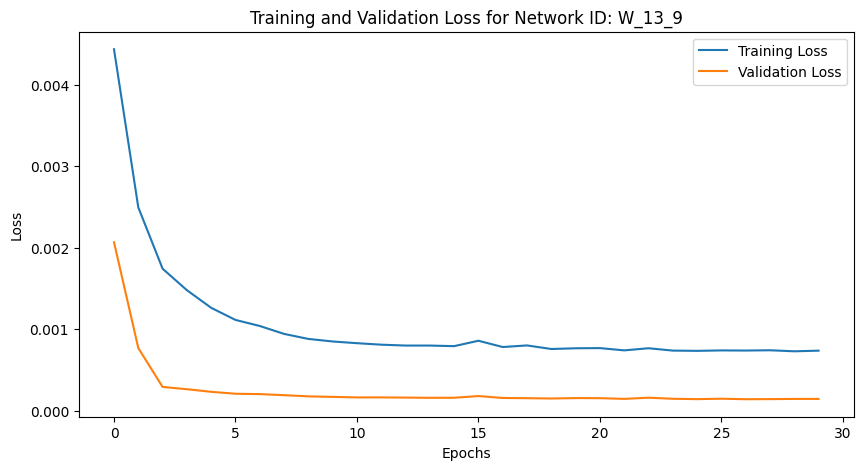

Training Progress:   0%|          | 29/10000 [01:02<5:55:21,  2.14s/epoch, loss=0.000737, val_loss=0.000144, patience=1]


Mean Squared Error: 0.0012072218083237476
Iteration: 249, Window Size: 13, Y Days Ahead: 10
X shape: (3785, 13)
y shape: (3785, 10)
Initializing network with layer sizes: [13, 128, 64, 32, 10]
params_W_13_10.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 13), (3028, 10), Validation data shape: (378, 13), (378, 10), Testing data shape: (379, 13), (379, 10)
Parameters loaded from params_W_13_10.npz


Training Progress:   0%|          | 16/10000 [00:35<5:41:30,  2.05s/epoch, loss=0.000826, val_loss=0.000171, patience=1]

Epoch 17/10000, Training Loss: 0.000826, Validation Loss: 0.000171
Early stopping at epoch 17. Best validation loss: 0.000166


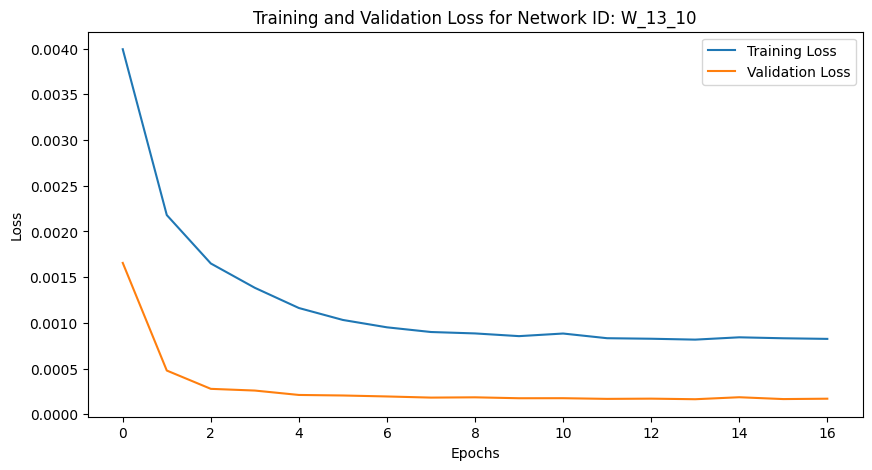

Training Progress:   0%|          | 16/10000 [00:35<6:11:43,  2.23s/epoch, loss=0.000826, val_loss=0.000171, patience=1]


Mean Squared Error: 0.0012847386388398995
Iteration: 250, Window Size: 13, Y Days Ahead: 11
X shape: (3784, 13)
y shape: (3784, 11)
Initializing network with layer sizes: [13, 128, 64, 32, 11]
params_W_13_11.npz not found. Using randomly initialized parameters.
Training data shape: (3027, 13), (3027, 11), Validation data shape: (378, 13), (378, 11), Testing data shape: (379, 13), (379, 11)
Parameters loaded from params_W_13_11.npz


Training Progress:   0%|          | 14/10000 [00:32<6:08:51,  2.22s/epoch, loss=0.000959, val_loss=0.000193, patience=1]

Epoch 15/10000, Training Loss: 0.000959, Validation Loss: 0.000193
Early stopping at epoch 15. Best validation loss: 0.000183


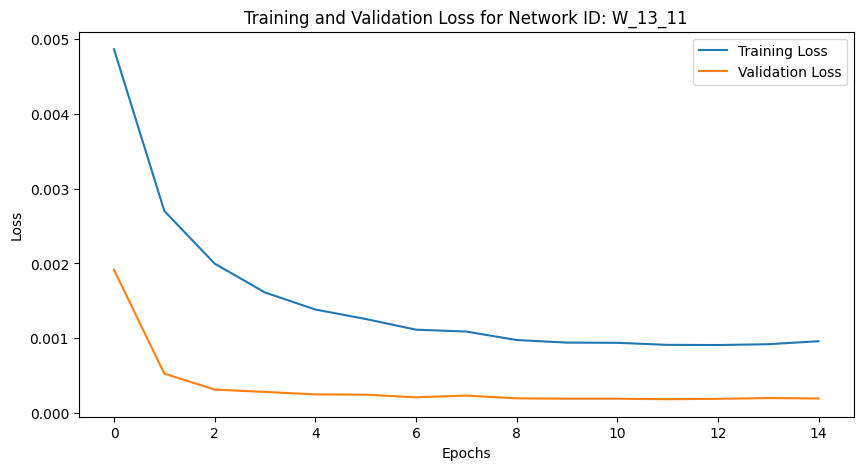

Training Progress:   0%|          | 14/10000 [00:32<6:27:58,  2.33s/epoch, loss=0.000959, val_loss=0.000193, patience=1]


Mean Squared Error: 0.0014173056893643729
Iteration: 251, Window Size: 13, Y Days Ahead: 12
X shape: (3783, 13)
y shape: (3783, 12)
Initializing network with layer sizes: [13, 128, 64, 32, 12]
params_W_13_12.npz not found. Using randomly initialized parameters.
Training data shape: (3026, 13), (3026, 12), Validation data shape: (378, 13), (378, 12), Testing data shape: (379, 13), (379, 12)
Parameters loaded from params_W_13_12.npz


Training Progress:   0%|          | 22/10000 [00:47<5:53:41,  2.13s/epoch, loss=0.000913, val_loss=0.000188, patience=1]

Epoch 23/10000, Training Loss: 0.000913, Validation Loss: 0.000188
Early stopping at epoch 23. Best validation loss: 0.000187


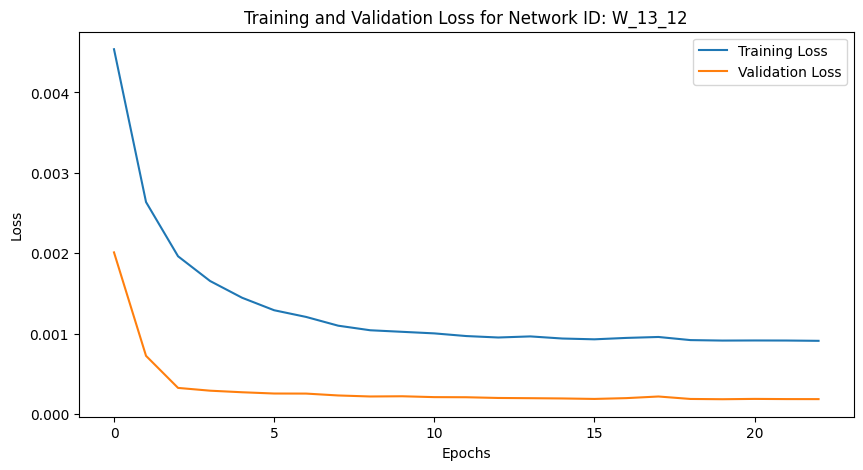

Training Progress:   0%|          | 22/10000 [00:47<6:02:35,  2.18s/epoch, loss=0.000913, val_loss=0.000188, patience=1]


Mean Squared Error: 0.00145983359019417
Iteration: 252, Window Size: 13, Y Days Ahead: 13
X shape: (3782, 13)
y shape: (3782, 13)
Initializing network with layer sizes: [13, 128, 64, 32, 13]
params_W_13_13.npz not found. Using randomly initialized parameters.
Training data shape: (3025, 13), (3025, 13), Validation data shape: (378, 13), (378, 13), Testing data shape: (379, 13), (379, 13)
Parameters loaded from params_W_13_13.npz


Training Progress:   0%|          | 18/10000 [00:39<5:50:01,  2.10s/epoch, loss=0.00102, val_loss=0.000225, patience=1] 

Epoch 19/10000, Training Loss: 0.001019, Validation Loss: 0.000225
Early stopping at epoch 19. Best validation loss: 0.000206


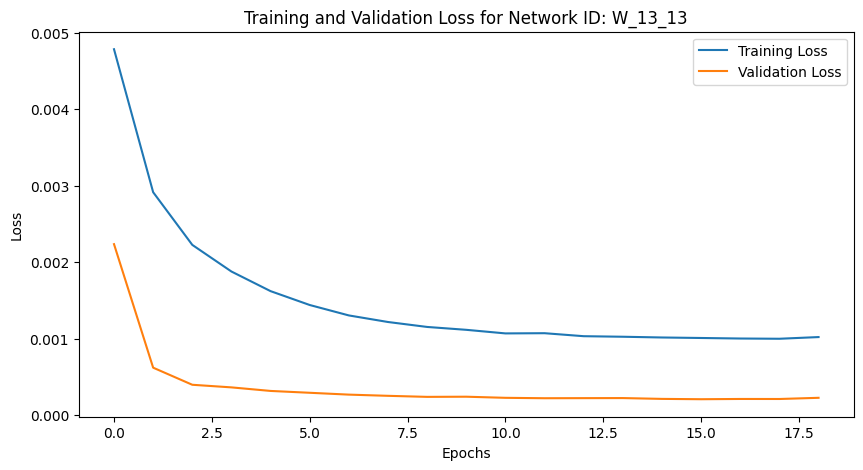

Training Progress:   0%|          | 18/10000 [00:40<6:10:07,  2.22s/epoch, loss=0.00102, val_loss=0.000225, patience=1]


Mean Squared Error: 0.001634546372095628
Iteration: 253, Window Size: 13, Y Days Ahead: 14
X shape: (3781, 13)
y shape: (3781, 14)
Initializing network with layer sizes: [13, 128, 64, 32, 14]
params_W_13_14.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 13), (3024, 14), Validation data shape: (378, 13), (378, 14), Testing data shape: (379, 13), (379, 14)
Parameters loaded from params_W_13_14.npz


Training Progress:   0%|          | 18/10000 [00:41<5:52:31,  2.12s/epoch, loss=0.00105, val_loss=0.000224, patience=1]

Epoch 19/10000, Training Loss: 0.001054, Validation Loss: 0.000224
Early stopping at epoch 19. Best validation loss: 0.000218


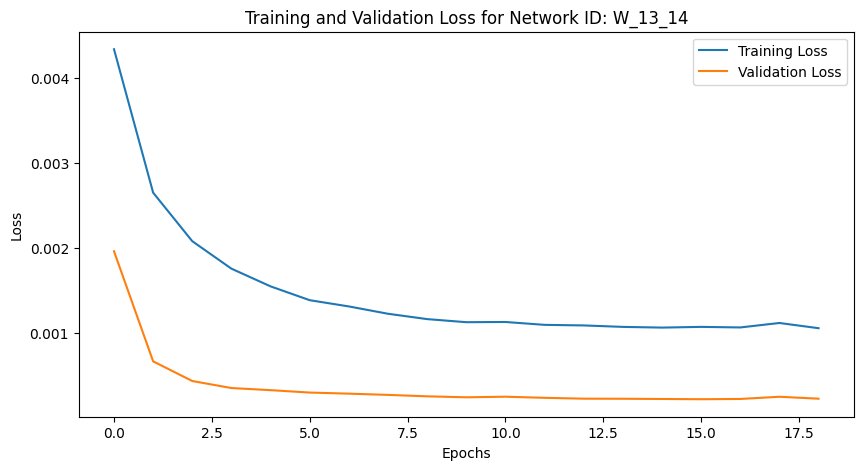

Training Progress:   0%|          | 18/10000 [00:41<6:22:33,  2.30s/epoch, loss=0.00105, val_loss=0.000224, patience=1]


Mean Squared Error: 0.0017567180333326441
Iteration: 254, Window Size: 13, Y Days Ahead: 15
X shape: (3780, 13)
y shape: (3780, 15)
Initializing network with layer sizes: [13, 128, 64, 32, 15]
params_W_13_15.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 13), (3024, 15), Validation data shape: (378, 13), (378, 15), Testing data shape: (378, 13), (378, 15)
Parameters loaded from params_W_13_15.npz


Training Progress:   0%|          | 23/10000 [00:49<5:31:33,  1.99s/epoch, loss=0.0011, val_loss=0.000233, patience=1] 

Epoch 24/10000, Training Loss: 0.001104, Validation Loss: 0.000233
Early stopping at epoch 24. Best validation loss: 0.000232


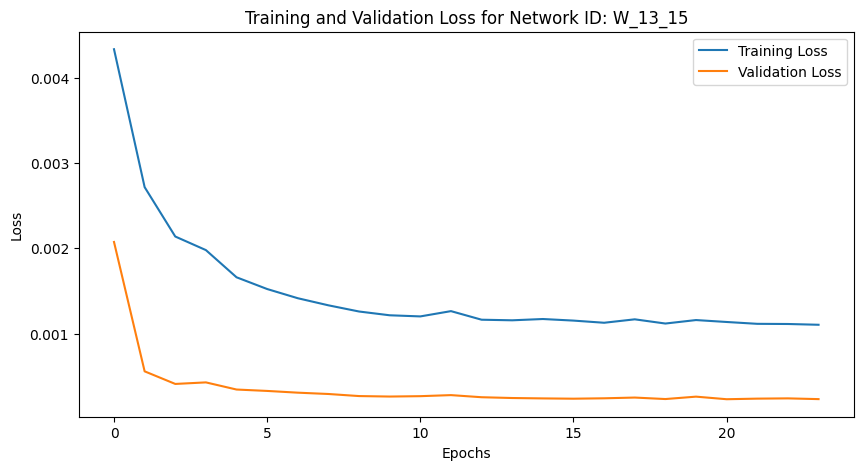

Training Progress:   0%|          | 23/10000 [00:49<5:57:38,  2.15s/epoch, loss=0.0011, val_loss=0.000233, patience=1]


Mean Squared Error: 0.0018786521904221969
Iteration: 255, Window Size: 13, Y Days Ahead: 16
X shape: (3779, 13)
y shape: (3779, 16)
Initializing network with layer sizes: [13, 128, 64, 32, 16]
params_W_13_16.npz not found. Using randomly initialized parameters.
Training data shape: (3023, 13), (3023, 16), Validation data shape: (378, 13), (378, 16), Testing data shape: (378, 13), (378, 16)
Parameters loaded from params_W_13_16.npz


Training Progress:   0%|          | 19/10000 [00:41<6:17:42,  2.27s/epoch, loss=0.00123, val_loss=0.000279, patience=1]

Epoch 20/10000, Training Loss: 0.001228, Validation Loss: 0.000279
Early stopping at epoch 20. Best validation loss: 0.000256


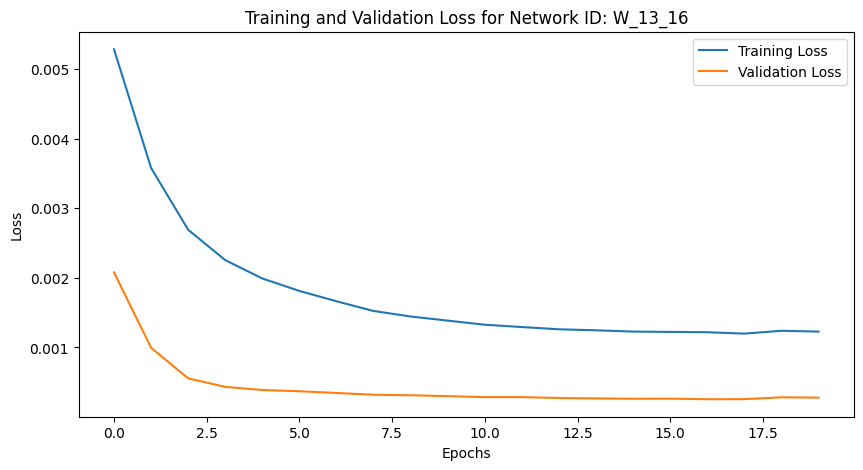

Training Progress:   0%|          | 19/10000 [00:42<6:09:26,  2.22s/epoch, loss=0.00123, val_loss=0.000279, patience=1]


Mean Squared Error: 0.001995383867622857
Iteration: 256, Window Size: 13, Y Days Ahead: 17
X shape: (3778, 13)
y shape: (3778, 17)
Initializing network with layer sizes: [13, 128, 64, 32, 17]
params_W_13_17.npz not found. Using randomly initialized parameters.
Training data shape: (3022, 13), (3022, 17), Validation data shape: (378, 13), (378, 17), Testing data shape: (378, 13), (378, 17)
Parameters loaded from params_W_13_17.npz


Training Progress:   0%|          | 18/10000 [00:38<5:36:50,  2.02s/epoch, loss=0.00127, val_loss=0.000282, patience=1]

Epoch 19/10000, Training Loss: 0.001271, Validation Loss: 0.000282
Early stopping at epoch 19. Best validation loss: 0.000276


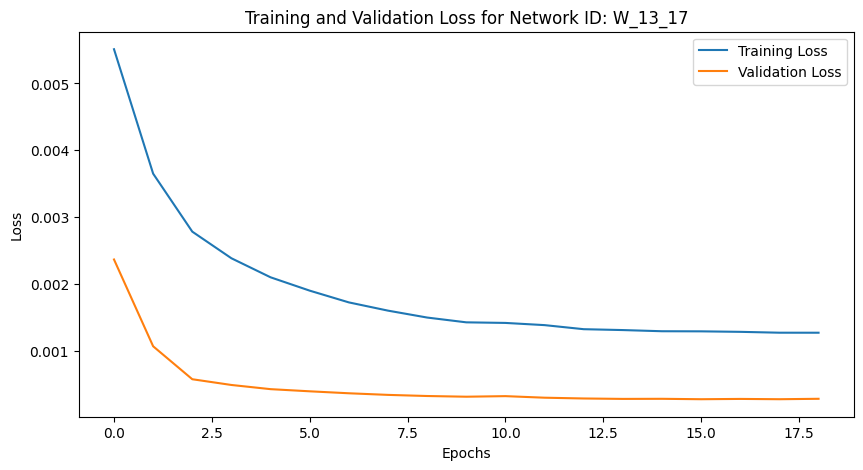

Training Progress:   0%|          | 18/10000 [00:39<6:01:45,  2.17s/epoch, loss=0.00127, val_loss=0.000282, patience=1]


Mean Squared Error: 0.002039772591903345
Iteration: 257, Window Size: 13, Y Days Ahead: 18
X shape: (3777, 13)
y shape: (3777, 18)
Initializing network with layer sizes: [13, 128, 64, 32, 18]
params_W_13_18.npz not found. Using randomly initialized parameters.
Training data shape: (3021, 13), (3021, 18), Validation data shape: (378, 13), (378, 18), Testing data shape: (378, 13), (378, 18)
Parameters loaded from params_W_13_18.npz


Training Progress:   0%|          | 26/10000 [00:56<5:47:27,  2.09s/epoch, loss=0.00136, val_loss=0.000282, patience=1]

Epoch 27/10000, Training Loss: 0.001358, Validation Loss: 0.000282
Early stopping at epoch 27. Best validation loss: 0.000276


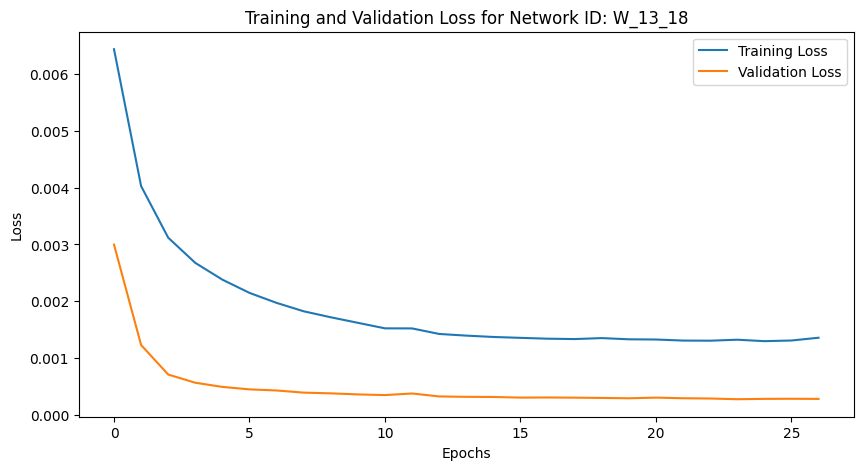

Training Progress:   0%|          | 26/10000 [00:57<6:05:06,  2.20s/epoch, loss=0.00136, val_loss=0.000282, patience=1]


Mean Squared Error: 0.0022239965834220557
Iteration: 258, Window Size: 13, Y Days Ahead: 19
X shape: (3776, 13)
y shape: (3776, 19)
Initializing network with layer sizes: [13, 128, 64, 32, 19]
params_W_13_19.npz not found. Using randomly initialized parameters.
Training data shape: (3020, 13), (3020, 19), Validation data shape: (378, 13), (378, 19), Testing data shape: (378, 13), (378, 19)
Parameters loaded from params_W_13_19.npz


Training Progress:   0%|          | 20/10000 [00:43<5:47:36,  2.09s/epoch, loss=0.0014, val_loss=0.00032, patience=1]  

Epoch 21/10000, Training Loss: 0.001402, Validation Loss: 0.000320
Early stopping at epoch 21. Best validation loss: 0.000309


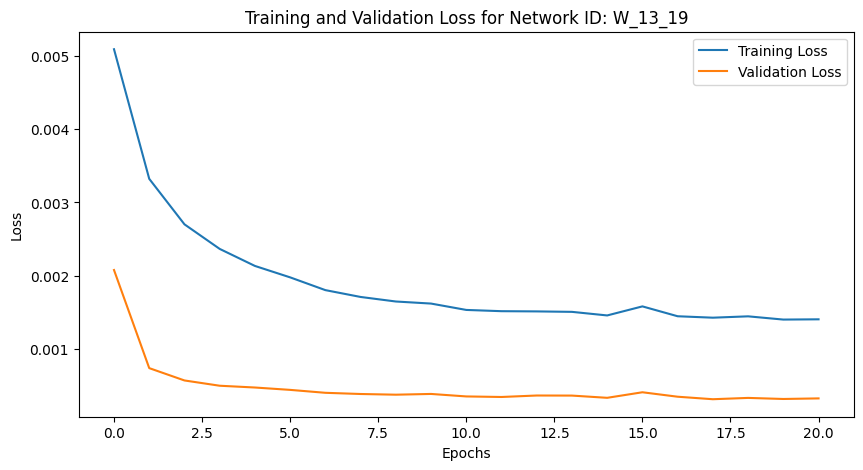

Training Progress:   0%|          | 20/10000 [00:43<6:02:12,  2.18s/epoch, loss=0.0014, val_loss=0.00032, patience=1]


Mean Squared Error: 0.0023860997771879174
Iteration: 259, Window Size: 13, Y Days Ahead: 20
X shape: (3775, 13)
y shape: (3775, 20)
Initializing network with layer sizes: [13, 128, 64, 32, 20]
params_W_13_20.npz not found. Using randomly initialized parameters.
Training data shape: (3020, 13), (3020, 20), Validation data shape: (377, 13), (377, 20), Testing data shape: (378, 13), (378, 20)
Parameters loaded from params_W_13_20.npz


Training Progress:   0%|          | 17/10000 [00:40<6:08:00,  2.21s/epoch, loss=0.0015, val_loss=0.000336, patience=1] 

Epoch 18/10000, Training Loss: 0.001496, Validation Loss: 0.000336
Early stopping at epoch 18. Best validation loss: 0.000334


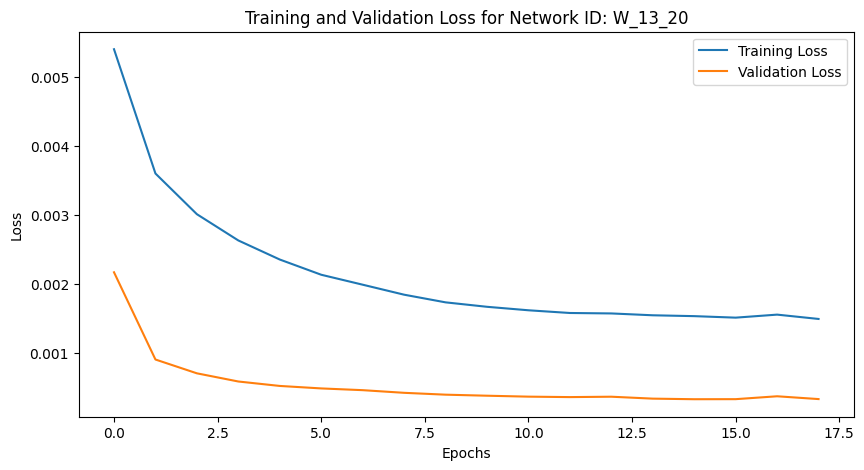

Training Progress:   0%|          | 17/10000 [00:40<6:38:45,  2.40s/epoch, loss=0.0015, val_loss=0.000336, patience=1]


Mean Squared Error: 0.002604402963765567
Iteration: 260, Window Size: 14, Y Days Ahead: 1
X shape: (3793, 14)
y shape: (3793, 1)
Initializing network with layer sizes: [14, 128, 64, 32, 1]
params_W_14_1.npz not found. Using randomly initialized parameters.
Training data shape: (3034, 14), (3034, 1), Validation data shape: (379, 14), (379, 1), Testing data shape: (380, 14), (380, 1)
Parameters loaded from params_W_14_1.npz


Training Progress:   0%|          | 12/10000 [00:28<6:00:21,  2.16s/epoch, loss=0.000192, val_loss=5.37e-5, patience=1]

Epoch 13/10000, Training Loss: 0.000192, Validation Loss: 0.000054
Early stopping at epoch 13. Best validation loss: 0.000041


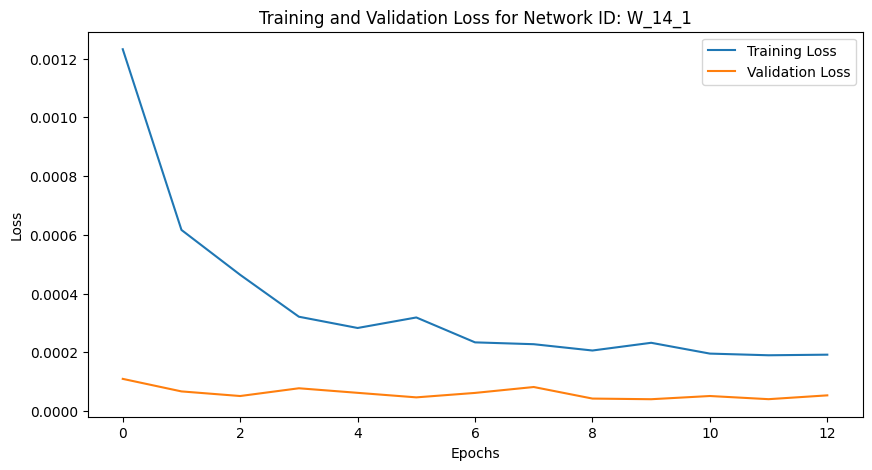

Training Progress:   0%|          | 12/10000 [00:28<6:35:25,  2.38s/epoch, loss=0.000192, val_loss=5.37e-5, patience=1]


Mean Squared Error: 0.00037400660005400537
Iteration: 261, Window Size: 14, Y Days Ahead: 2
X shape: (3792, 14)
y shape: (3792, 2)
Initializing network with layer sizes: [14, 128, 64, 32, 2]
params_W_14_2.npz not found. Using randomly initialized parameters.
Training data shape: (3033, 14), (3033, 2), Validation data shape: (379, 14), (379, 2), Testing data shape: (380, 14), (380, 2)
Parameters loaded from params_W_14_2.npz


Training Progress:   0%|          | 23/10000 [00:50<5:38:23,  2.03s/epoch, loss=0.000235, val_loss=4.64e-5, patience=1] 

Epoch 24/10000, Training Loss: 0.000235, Validation Loss: 0.000046
Early stopping at epoch 24. Best validation loss: 0.000046


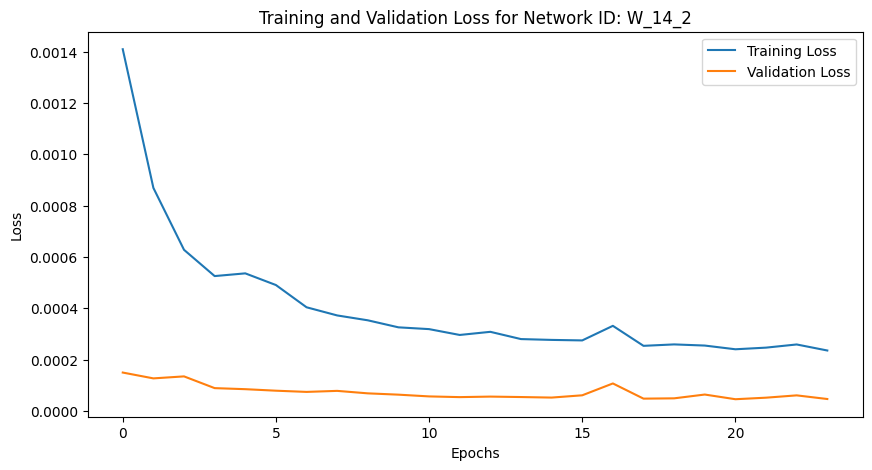

Training Progress:   0%|          | 23/10000 [00:50<6:07:29,  2.21s/epoch, loss=0.000235, val_loss=4.64e-5, patience=1]


Mean Squared Error: 0.0004533159682172188
Iteration: 262, Window Size: 14, Y Days Ahead: 3
X shape: (3791, 14)
y shape: (3791, 3)
Initializing network with layer sizes: [14, 128, 64, 32, 3]
params_W_14_3.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 14), (3032, 3), Validation data shape: (379, 14), (379, 3), Testing data shape: (380, 14), (380, 3)
Parameters loaded from params_W_14_3.npz


Training Progress:   0%|          | 16/10000 [00:35<5:56:41,  2.14s/epoch, loss=0.000337, val_loss=6.41e-5, patience=1]

Epoch 17/10000, Training Loss: 0.000337, Validation Loss: 0.000064
Early stopping at epoch 17. Best validation loss: 0.000063


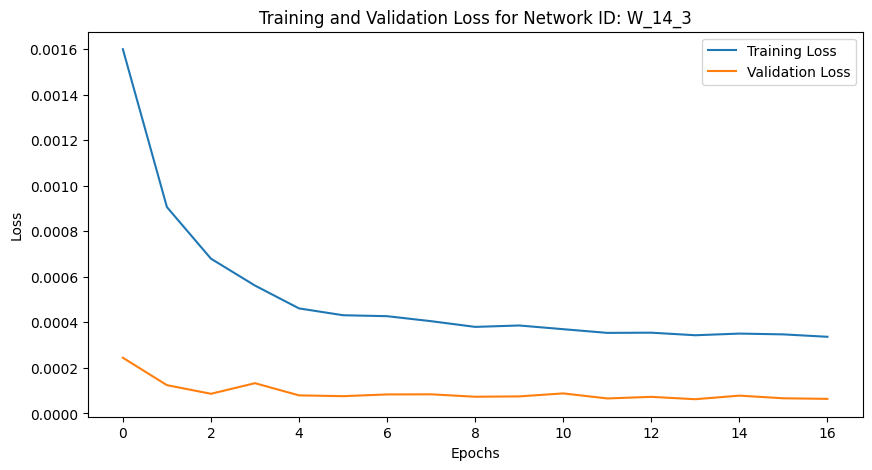

Training Progress:   0%|          | 16/10000 [00:35<6:13:21,  2.24s/epoch, loss=0.000337, val_loss=6.41e-5, patience=1]


Mean Squared Error: 0.0005683076635158757
Iteration: 263, Window Size: 14, Y Days Ahead: 4
X shape: (3790, 14)
y shape: (3790, 4)
Initializing network with layer sizes: [14, 128, 64, 32, 4]
params_W_14_4.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 14), (3032, 4), Validation data shape: (379, 14), (379, 4), Testing data shape: (379, 14), (379, 4)
Parameters loaded from params_W_14_4.npz


Training Progress:   0%|          | 10/10000 [00:24<6:04:15,  2.19s/epoch, loss=0.000464, val_loss=9.65e-5, patience=1]

Epoch 11/10000, Training Loss: 0.000464, Validation Loss: 0.000097
Early stopping at epoch 11. Best validation loss: 0.000084


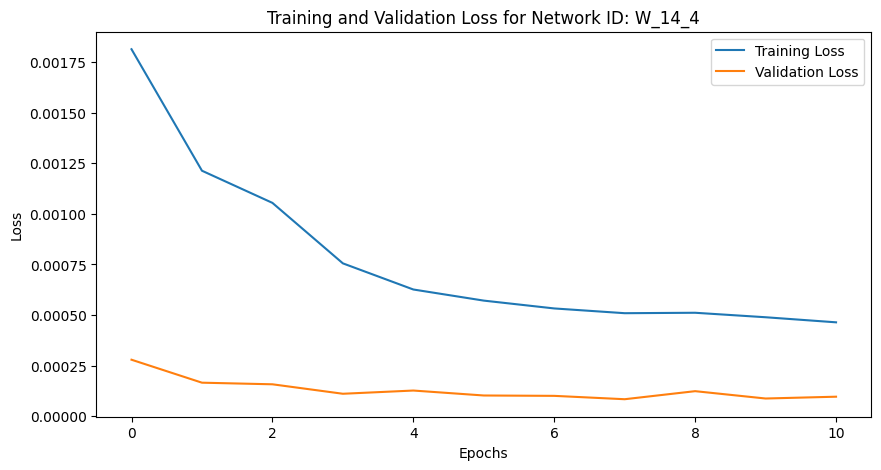

Training Progress:   0%|          | 10/10000 [00:24<6:48:35,  2.45s/epoch, loss=0.000464, val_loss=9.65e-5, patience=1]


Mean Squared Error: 0.0007053613155915289
Iteration: 264, Window Size: 14, Y Days Ahead: 5
X shape: (3789, 14)
y shape: (3789, 5)
Initializing network with layer sizes: [14, 128, 64, 32, 5]
params_W_14_5.npz not found. Using randomly initialized parameters.
Training data shape: (3031, 14), (3031, 5), Validation data shape: (379, 14), (379, 5), Testing data shape: (379, 14), (379, 5)
Parameters loaded from params_W_14_5.npz


Training Progress:   0%|          | 11/10000 [00:25<5:37:35,  2.03s/epoch, loss=0.00048, val_loss=9.19e-5, patience=1] 

Epoch 12/10000, Training Loss: 0.000480, Validation Loss: 0.000092
Early stopping at epoch 12. Best validation loss: 0.000091


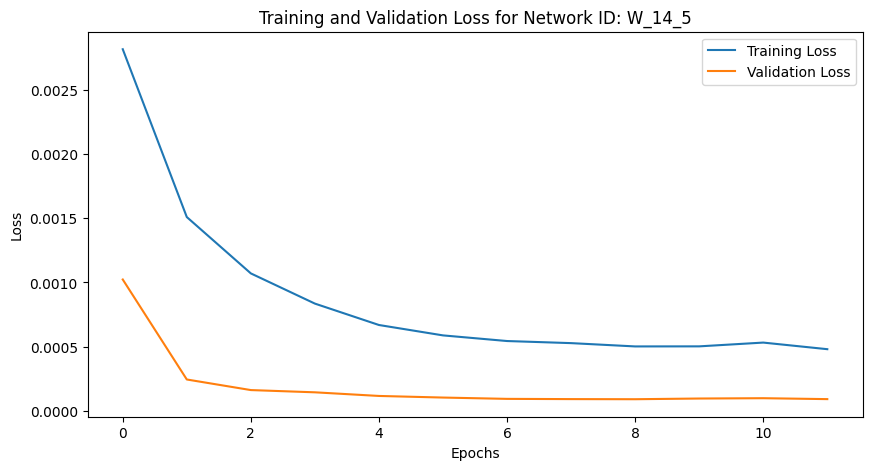

Training Progress:   0%|          | 11/10000 [00:26<6:38:08,  2.39s/epoch, loss=0.00048, val_loss=9.19e-5, patience=1]


Mean Squared Error: 0.0007742857633232979
Iteration: 265, Window Size: 14, Y Days Ahead: 6
X shape: (3788, 14)
y shape: (3788, 6)
Initializing network with layer sizes: [14, 128, 64, 32, 6]
params_W_14_6.npz not found. Using randomly initialized parameters.
Training data shape: (3030, 14), (3030, 6), Validation data shape: (379, 14), (379, 6), Testing data shape: (379, 14), (379, 6)
Parameters loaded from params_W_14_6.npz


Training Progress:   0%|          | 19/10000 [00:43<5:55:46,  2.14s/epoch, loss=0.000565, val_loss=0.000108, patience=1]

Epoch 20/10000, Training Loss: 0.000565, Validation Loss: 0.000108
Early stopping at epoch 20. Best validation loss: 0.000108


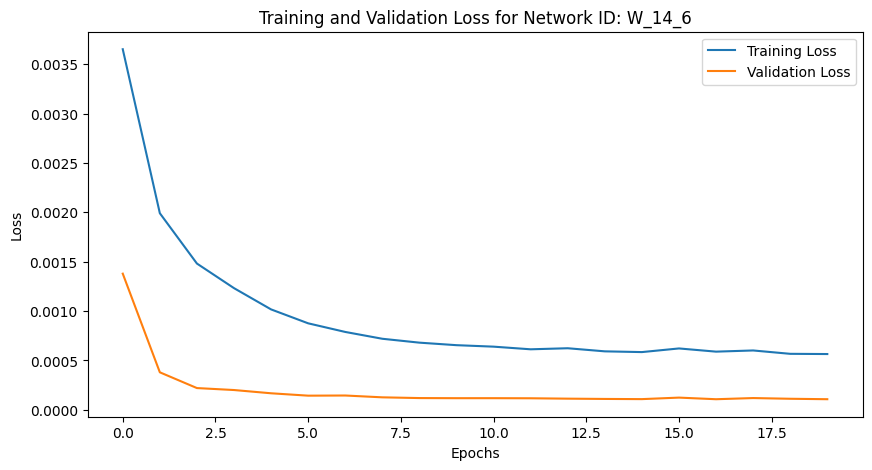

Training Progress:   0%|          | 19/10000 [00:43<6:22:28,  2.30s/epoch, loss=0.000565, val_loss=0.000108, patience=1]


Mean Squared Error: 0.000910339796213971
Iteration: 266, Window Size: 14, Y Days Ahead: 7
X shape: (3787, 14)
y shape: (3787, 7)
Initializing network with layer sizes: [14, 128, 64, 32, 7]
params_W_14_7.npz not found. Using randomly initialized parameters.
Training data shape: (3029, 14), (3029, 7), Validation data shape: (379, 14), (379, 7), Testing data shape: (379, 14), (379, 7)
Parameters loaded from params_W_14_7.npz


Training Progress:   0%|          | 12/10000 [00:28<6:14:02,  2.25s/epoch, loss=0.000676, val_loss=0.000135, patience=1]

Epoch 13/10000, Training Loss: 0.000676, Validation Loss: 0.000135
Early stopping at epoch 13. Best validation loss: 0.000128


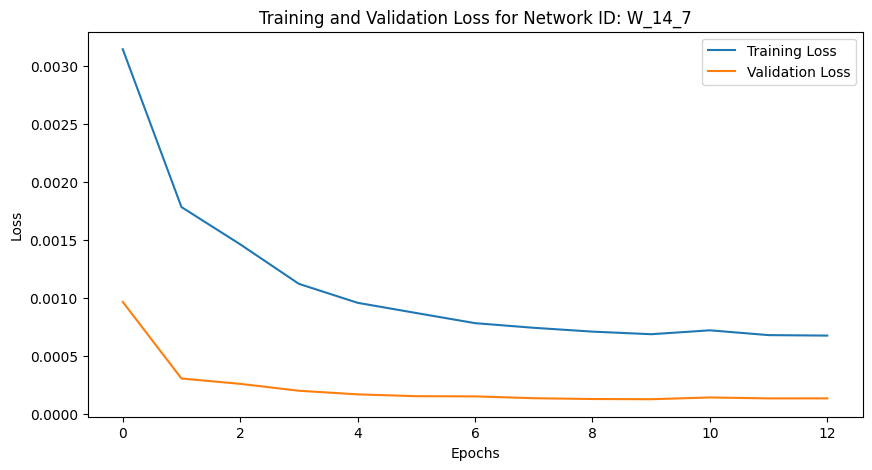

Training Progress:   0%|          | 12/10000 [00:29<6:47:12,  2.45s/epoch, loss=0.000676, val_loss=0.000135, patience=1]


Mean Squared Error: 0.001049403024863564
Iteration: 267, Window Size: 14, Y Days Ahead: 8
X shape: (3786, 14)
y shape: (3786, 8)
Initializing network with layer sizes: [14, 128, 64, 32, 8]
params_W_14_8.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 14), (3028, 8), Validation data shape: (379, 14), (379, 8), Testing data shape: (379, 14), (379, 8)
Parameters loaded from params_W_14_8.npz


Training Progress:   0%|          | 15/10000 [00:33<5:32:46,  2.00s/epoch, loss=0.000719, val_loss=0.000137, patience=1]

Epoch 16/10000, Training Loss: 0.000719, Validation Loss: 0.000137
Early stopping at epoch 16. Best validation loss: 0.000135


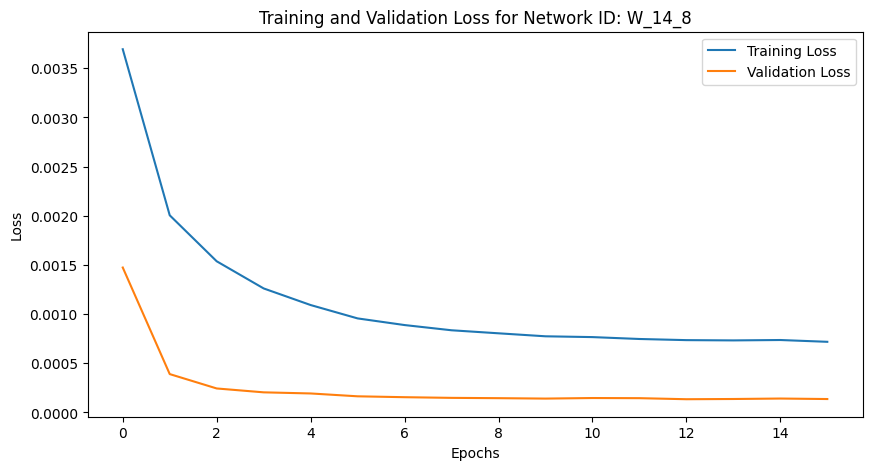

Training Progress:   0%|          | 15/10000 [00:34<6:18:32,  2.27s/epoch, loss=0.000719, val_loss=0.000137, patience=1]


Mean Squared Error: 0.0011575213948772335
Iteration: 268, Window Size: 14, Y Days Ahead: 9
X shape: (3785, 14)
y shape: (3785, 9)
Initializing network with layer sizes: [14, 128, 64, 32, 9]
params_W_14_9.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 14), (3028, 9), Validation data shape: (378, 14), (378, 9), Testing data shape: (379, 14), (379, 9)
Parameters loaded from params_W_14_9.npz


Training Progress:   0%|          | 19/10000 [00:42<5:51:25,  2.11s/epoch, loss=0.000831, val_loss=0.000189, patience=1]

Epoch 20/10000, Training Loss: 0.000831, Validation Loss: 0.000189
Early stopping at epoch 20. Best validation loss: 0.000142


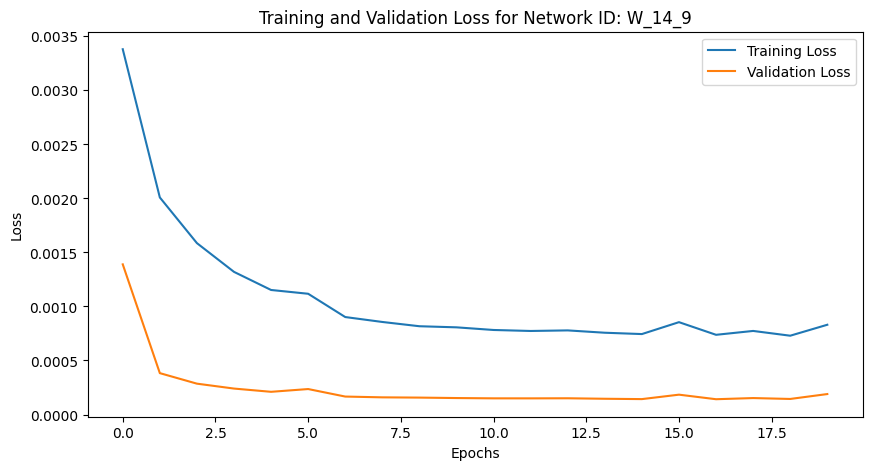

Training Progress:   0%|          | 19/10000 [00:43<6:18:46,  2.28s/epoch, loss=0.000831, val_loss=0.000189, patience=1]


Mean Squared Error: 0.0011711248986760346
Iteration: 269, Window Size: 14, Y Days Ahead: 10
X shape: (3784, 14)
y shape: (3784, 10)
Initializing network with layer sizes: [14, 128, 64, 32, 10]
params_W_14_10.npz not found. Using randomly initialized parameters.
Training data shape: (3027, 14), (3027, 10), Validation data shape: (378, 14), (378, 10), Testing data shape: (379, 14), (379, 10)
Parameters loaded from params_W_14_10.npz


Training Progress:   0%|          | 21/10000 [00:47<5:47:07,  2.09s/epoch, loss=0.000807, val_loss=0.000169, patience=1]

Epoch 22/10000, Training Loss: 0.000807, Validation Loss: 0.000169
Early stopping at epoch 22. Best validation loss: 0.000156


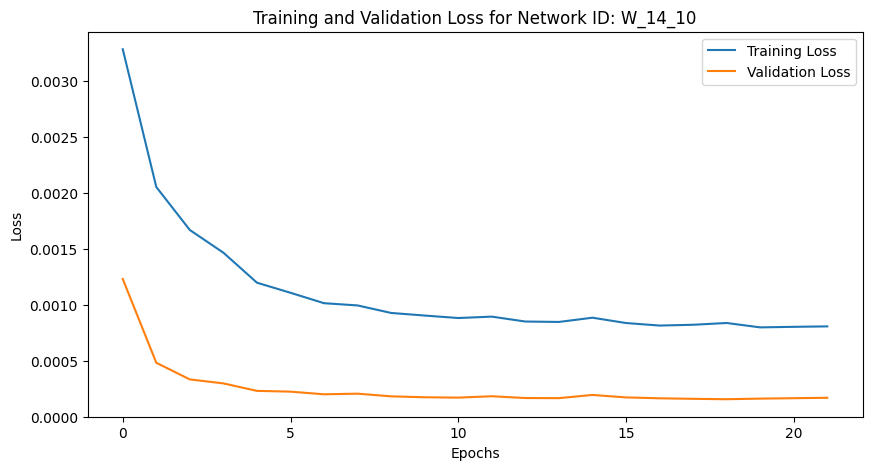

Training Progress:   0%|          | 21/10000 [00:47<6:14:50,  2.25s/epoch, loss=0.000807, val_loss=0.000169, patience=1]


Mean Squared Error: 0.001363250143171732
Iteration: 270, Window Size: 14, Y Days Ahead: 11
X shape: (3783, 14)
y shape: (3783, 11)
Initializing network with layer sizes: [14, 128, 64, 32, 11]
params_W_14_11.npz not found. Using randomly initialized parameters.
Training data shape: (3026, 14), (3026, 11), Validation data shape: (378, 14), (378, 11), Testing data shape: (379, 14), (379, 11)
Parameters loaded from params_W_14_11.npz


Training Progress:   0%|          | 19/10000 [00:44<6:01:35,  2.17s/epoch, loss=0.000886, val_loss=0.000177, patience=1]

Epoch 20/10000, Training Loss: 0.000886, Validation Loss: 0.000177
Early stopping at epoch 20. Best validation loss: 0.000173


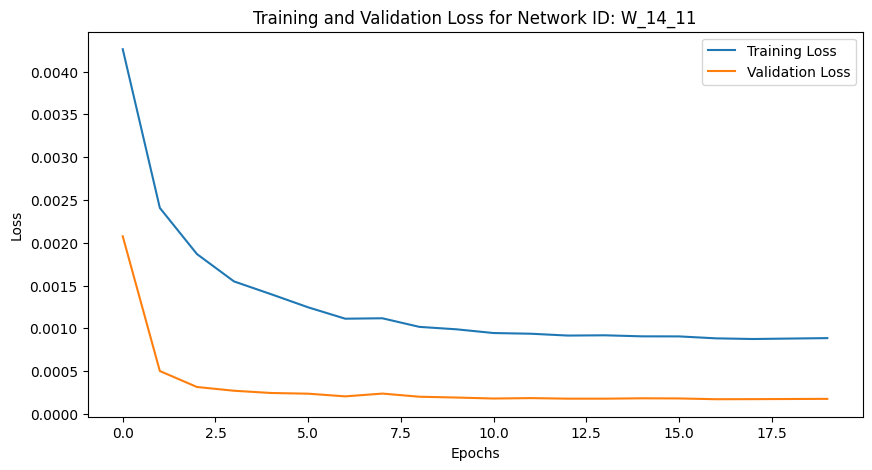

Training Progress:   0%|          | 19/10000 [00:44<6:31:03,  2.35s/epoch, loss=0.000886, val_loss=0.000177, patience=1]


Mean Squared Error: 0.0013891515971035336
Iteration: 271, Window Size: 14, Y Days Ahead: 12
X shape: (3782, 14)
y shape: (3782, 12)
Initializing network with layer sizes: [14, 128, 64, 32, 12]
params_W_14_12.npz not found. Using randomly initialized parameters.
Training data shape: (3025, 14), (3025, 12), Validation data shape: (378, 14), (378, 12), Testing data shape: (379, 14), (379, 12)
Parameters loaded from params_W_14_12.npz


Training Progress:   0%|          | 22/10000 [00:49<5:53:10,  2.12s/epoch, loss=0.000922, val_loss=0.000188, patience=1]

Epoch 23/10000, Training Loss: 0.000922, Validation Loss: 0.000188
Early stopping at epoch 23. Best validation loss: 0.000182


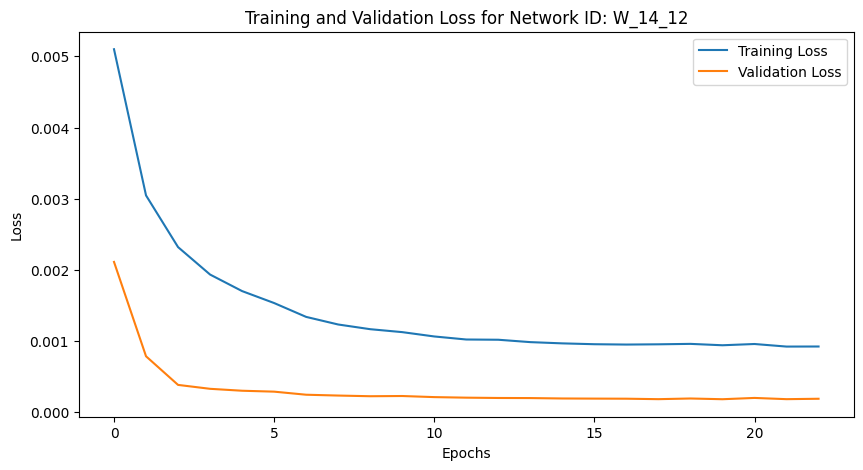

Training Progress:   0%|          | 22/10000 [00:50<6:18:55,  2.28s/epoch, loss=0.000922, val_loss=0.000188, patience=1]


Mean Squared Error: 0.0015468246907185733
Iteration: 272, Window Size: 14, Y Days Ahead: 13
X shape: (3781, 14)
y shape: (3781, 13)
Initializing network with layer sizes: [14, 128, 64, 32, 13]
params_W_14_13.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 14), (3024, 13), Validation data shape: (378, 14), (378, 13), Testing data shape: (379, 14), (379, 13)
Parameters loaded from params_W_14_13.npz


Training Progress:   0%|          | 18/10000 [00:42<6:18:10,  2.27s/epoch, loss=0.000999, val_loss=0.000203, patience=1]

Epoch 19/10000, Training Loss: 0.000999, Validation Loss: 0.000203
Early stopping at epoch 19. Best validation loss: 0.000201


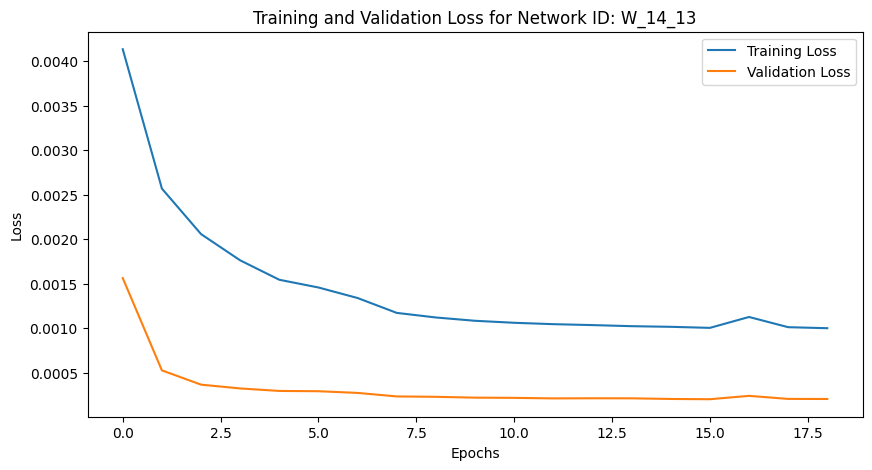

Training Progress:   0%|          | 18/10000 [00:43<6:40:39,  2.41s/epoch, loss=0.000999, val_loss=0.000203, patience=1]


Mean Squared Error: 0.0015814929997004393
Iteration: 273, Window Size: 14, Y Days Ahead: 14
X shape: (3780, 14)
y shape: (3780, 14)
Initializing network with layer sizes: [14, 128, 64, 32, 14]
params_W_14_14.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 14), (3024, 14), Validation data shape: (378, 14), (378, 14), Testing data shape: (378, 14), (378, 14)
Parameters loaded from params_W_14_14.npz


Training Progress:   0%|          | 21/10000 [00:50<6:16:51,  2.27s/epoch, loss=0.00105, val_loss=0.000223, patience=1]

Epoch 22/10000, Training Loss: 0.001048, Validation Loss: 0.000223
Early stopping at epoch 22. Best validation loss: 0.000222


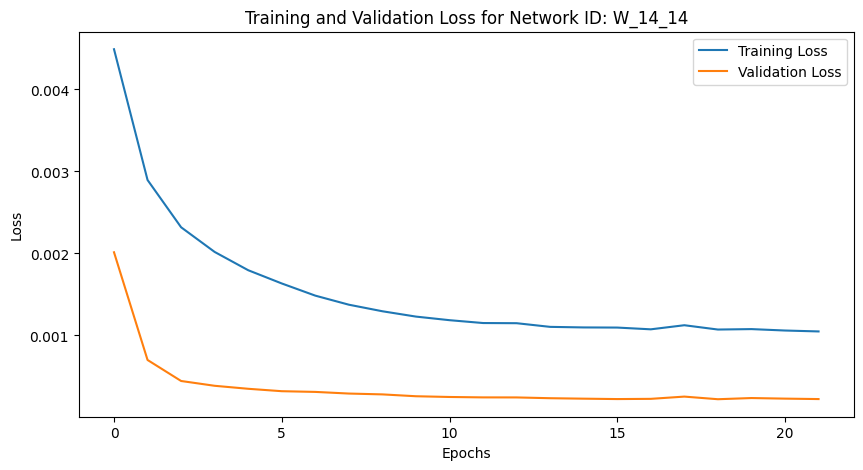

Training Progress:   0%|          | 21/10000 [00:50<6:42:47,  2.42s/epoch, loss=0.00105, val_loss=0.000223, patience=1]


Mean Squared Error: 0.001744811849439771
Iteration: 274, Window Size: 14, Y Days Ahead: 15
X shape: (3779, 14)
y shape: (3779, 15)
Initializing network with layer sizes: [14, 128, 64, 32, 15]
params_W_14_15.npz not found. Using randomly initialized parameters.
Training data shape: (3023, 14), (3023, 15), Validation data shape: (378, 14), (378, 15), Testing data shape: (378, 14), (378, 15)
Parameters loaded from params_W_14_15.npz


Training Progress:   0%|          | 23/10000 [00:57<6:13:22,  2.25s/epoch, loss=0.00116, val_loss=0.000239, patience=1]

Epoch 24/10000, Training Loss: 0.001163, Validation Loss: 0.000239
Early stopping at epoch 24. Best validation loss: 0.000230


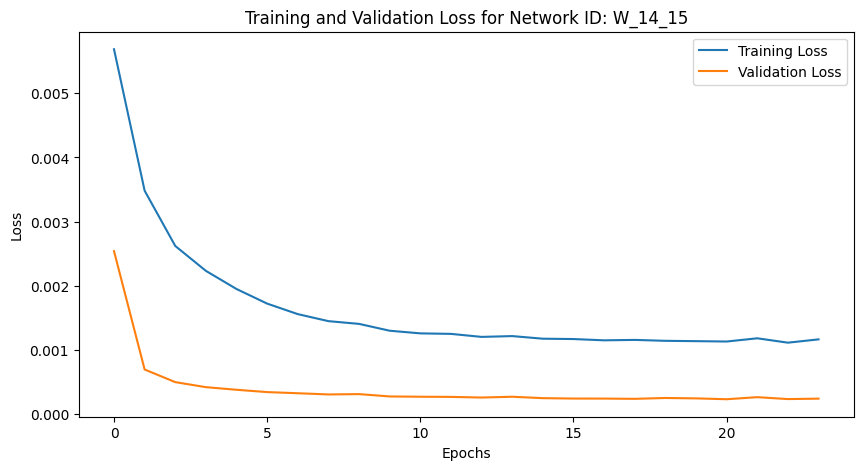

Training Progress:   0%|          | 23/10000 [00:57<6:56:41,  2.51s/epoch, loss=0.00116, val_loss=0.000239, patience=1]


Mean Squared Error: 0.0018650132023891833
Iteration: 275, Window Size: 14, Y Days Ahead: 16
X shape: (3778, 14)
y shape: (3778, 16)
Initializing network with layer sizes: [14, 128, 64, 32, 16]
params_W_14_16.npz not found. Using randomly initialized parameters.
Training data shape: (3022, 14), (3022, 16), Validation data shape: (378, 14), (378, 16), Testing data shape: (378, 14), (378, 16)
Parameters loaded from params_W_14_16.npz


Training Progress:   0%|          | 20/10000 [00:49<6:42:09,  2.42s/epoch, loss=0.00122, val_loss=0.000262, patience=1]

Epoch 21/10000, Training Loss: 0.001216, Validation Loss: 0.000262
Early stopping at epoch 21. Best validation loss: 0.000261


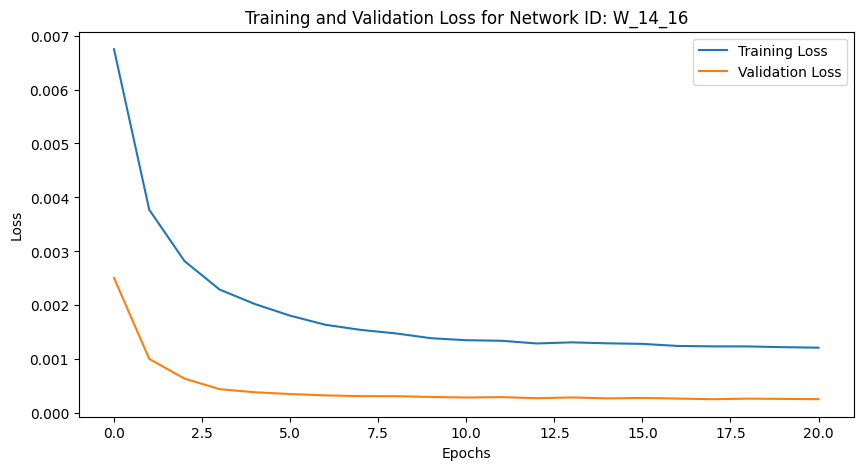

Training Progress:   0%|          | 20/10000 [00:49<6:52:45,  2.48s/epoch, loss=0.00122, val_loss=0.000262, patience=1]


Mean Squared Error: 0.0020168049566571524
Iteration: 276, Window Size: 14, Y Days Ahead: 17
X shape: (3777, 14)
y shape: (3777, 17)
Initializing network with layer sizes: [14, 128, 64, 32, 17]
params_W_14_17.npz not found. Using randomly initialized parameters.
Training data shape: (3021, 14), (3021, 17), Validation data shape: (378, 14), (378, 17), Testing data shape: (378, 14), (378, 17)
Parameters loaded from params_W_14_17.npz


Training Progress:   0%|          | 22/10000 [00:54<6:19:56,  2.28s/epoch, loss=0.00125, val_loss=0.000263, patience=1]

Epoch 23/10000, Training Loss: 0.001253, Validation Loss: 0.000263
Early stopping at epoch 23. Best validation loss: 0.000259


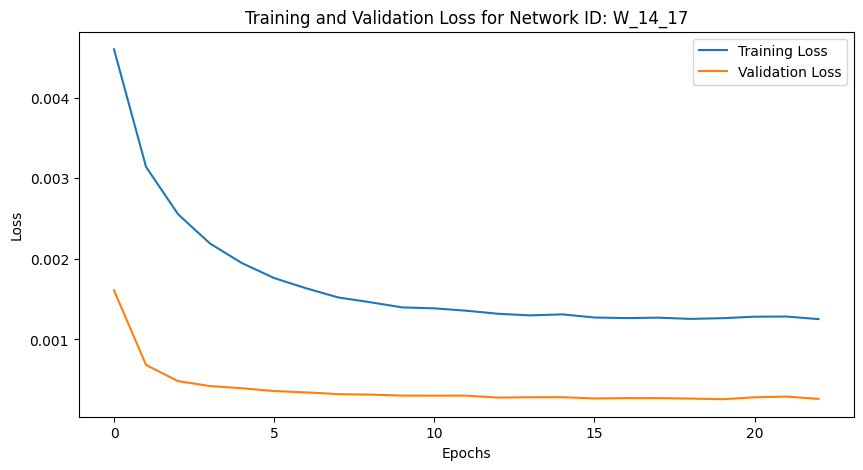

Training Progress:   0%|          | 22/10000 [00:54<6:51:23,  2.47s/epoch, loss=0.00125, val_loss=0.000263, patience=1]


Mean Squared Error: 0.0020817254308237083
Iteration: 277, Window Size: 14, Y Days Ahead: 18
X shape: (3776, 14)
y shape: (3776, 18)
Initializing network with layer sizes: [14, 128, 64, 32, 18]
params_W_14_18.npz not found. Using randomly initialized parameters.
Training data shape: (3020, 14), (3020, 18), Validation data shape: (378, 14), (378, 18), Testing data shape: (378, 14), (378, 18)
Parameters loaded from params_W_14_18.npz


Training Progress:   0%|          | 21/10000 [00:53<6:33:54,  2.37s/epoch, loss=0.0014, val_loss=0.000299, patience=1] 

Epoch 22/10000, Training Loss: 0.001403, Validation Loss: 0.000299
Early stopping at epoch 22. Best validation loss: 0.000292


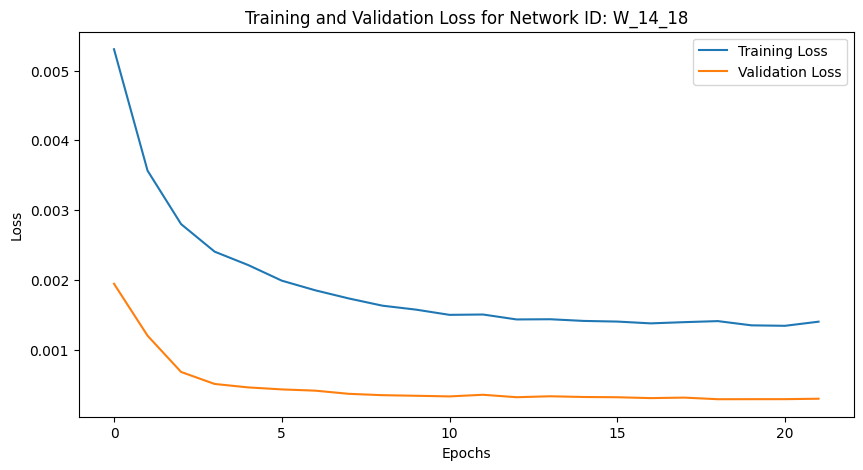

Training Progress:   0%|          | 21/10000 [00:53<7:06:01,  2.56s/epoch, loss=0.0014, val_loss=0.000299, patience=1]


Mean Squared Error: 0.0024167961399677138
Iteration: 278, Window Size: 14, Y Days Ahead: 19
X shape: (3775, 14)
y shape: (3775, 19)
Initializing network with layer sizes: [14, 128, 64, 32, 19]
params_W_14_19.npz not found. Using randomly initialized parameters.
Training data shape: (3020, 14), (3020, 19), Validation data shape: (377, 14), (377, 19), Testing data shape: (378, 14), (378, 19)
Parameters loaded from params_W_14_19.npz


Training Progress:   0%|          | 24/10000 [00:59<6:26:20,  2.32s/epoch, loss=0.00145, val_loss=0.000321, patience=1]

Epoch 25/10000, Training Loss: 0.001454, Validation Loss: 0.000321
Early stopping at epoch 25. Best validation loss: 0.000316


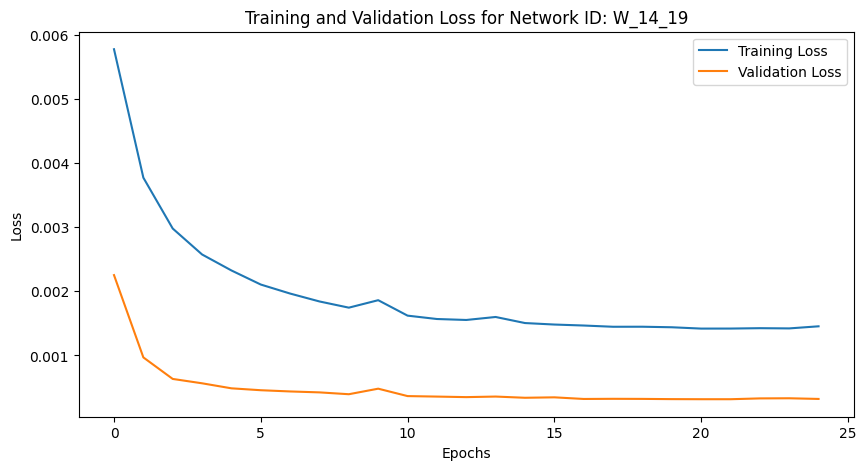

Training Progress:   0%|          | 24/10000 [00:59<6:53:43,  2.49s/epoch, loss=0.00145, val_loss=0.000321, patience=1]


Mean Squared Error: 0.002371285129909665
Iteration: 279, Window Size: 14, Y Days Ahead: 20
X shape: (3774, 14)
y shape: (3774, 20)
Initializing network with layer sizes: [14, 128, 64, 32, 20]
params_W_14_20.npz not found. Using randomly initialized parameters.
Training data shape: (3019, 14), (3019, 20), Validation data shape: (377, 14), (377, 20), Testing data shape: (378, 14), (378, 20)
Parameters loaded from params_W_14_20.npz


Training Progress:   0%|          | 31/10000 [01:16<6:15:04,  2.26s/epoch, loss=0.00148, val_loss=0.000349, patience=1]

Epoch 32/10000, Training Loss: 0.001478, Validation Loss: 0.000349
Early stopping at epoch 32. Best validation loss: 0.000328


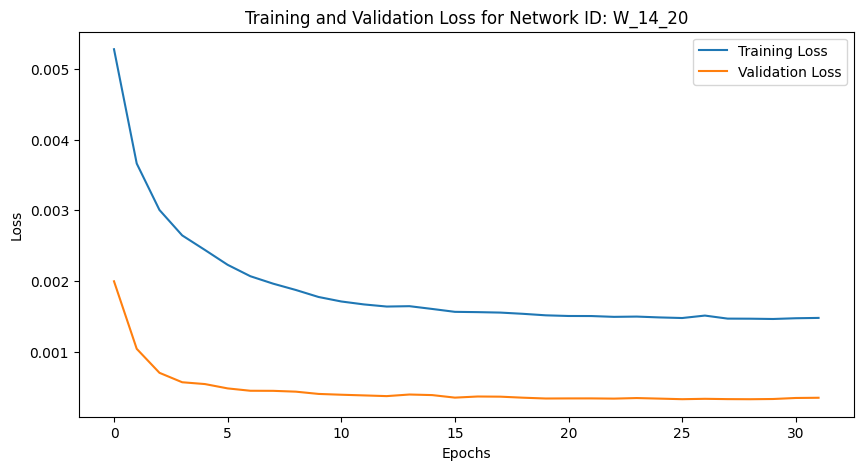

Training Progress:   0%|          | 31/10000 [01:17<6:54:04,  2.49s/epoch, loss=0.00148, val_loss=0.000349, patience=1]


Mean Squared Error: 0.002453728891661177
Iteration: 280, Window Size: 15, Y Days Ahead: 1
X shape: (3792, 15)
y shape: (3792, 1)
Initializing network with layer sizes: [15, 128, 64, 32, 1]
params_W_15_1.npz not found. Using randomly initialized parameters.
Training data shape: (3033, 15), (3033, 1), Validation data shape: (379, 15), (379, 1), Testing data shape: (380, 15), (380, 1)
Parameters loaded from params_W_15_1.npz


Training Progress:   0%|          | 7/10000 [00:18<6:19:09,  2.28s/epoch, loss=0.000207, val_loss=4.94e-5, patience=1]

Epoch 8/10000, Training Loss: 0.000207, Validation Loss: 0.000049
Early stopping at epoch 8. Best validation loss: 0.000045


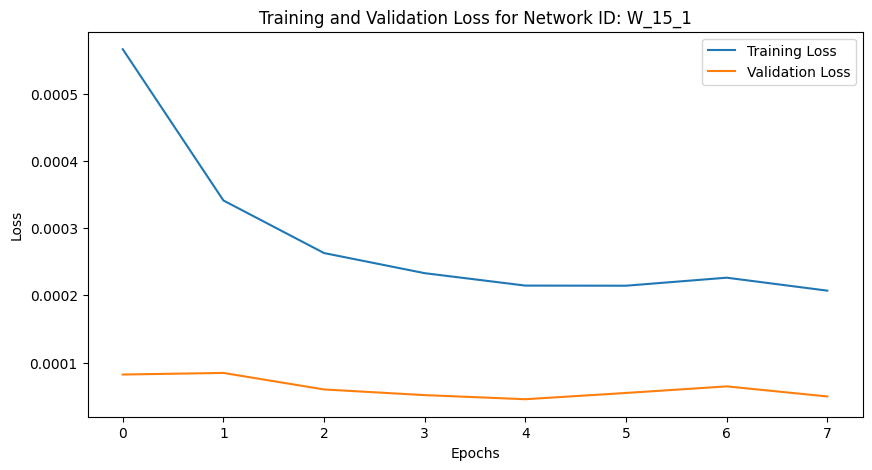

Training Progress:   0%|          | 7/10000 [00:18<7:21:20,  2.65s/epoch, loss=0.000207, val_loss=4.94e-5, patience=1]


Mean Squared Error: 0.000399997690806323
Iteration: 281, Window Size: 15, Y Days Ahead: 2
X shape: (3791, 15)
y shape: (3791, 2)
Initializing network with layer sizes: [15, 128, 64, 32, 2]
params_W_15_2.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 15), (3032, 2), Validation data shape: (379, 15), (379, 2), Testing data shape: (380, 15), (380, 2)
Parameters loaded from params_W_15_2.npz


Training Progress:   0%|          | 21/10000 [00:51<6:03:58,  2.19s/epoch, loss=0.000308, val_loss=8.48e-5, patience=1]

Epoch 22/10000, Training Loss: 0.000308, Validation Loss: 0.000085
Early stopping at epoch 22. Best validation loss: 0.000047


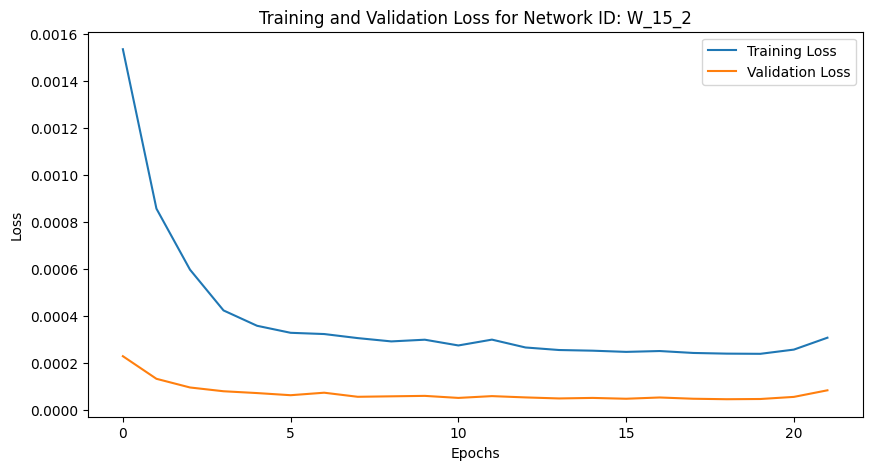

Training Progress:   0%|          | 21/10000 [00:51<6:50:03,  2.47s/epoch, loss=0.000308, val_loss=8.48e-5, patience=1]


Mean Squared Error: 0.0004479729970121363
Iteration: 282, Window Size: 15, Y Days Ahead: 3
X shape: (3790, 15)
y shape: (3790, 3)
Initializing network with layer sizes: [15, 128, 64, 32, 3]
params_W_15_3.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 15), (3032, 3), Validation data shape: (379, 15), (379, 3), Testing data shape: (379, 15), (379, 3)
Parameters loaded from params_W_15_3.npz


Training Progress:   0%|          | 13/10000 [00:33<6:18:33,  2.27s/epoch, loss=0.000418, val_loss=9.65e-5, patience=1]

Epoch 14/10000, Training Loss: 0.000418, Validation Loss: 0.000096
Early stopping at epoch 14. Best validation loss: 0.000070


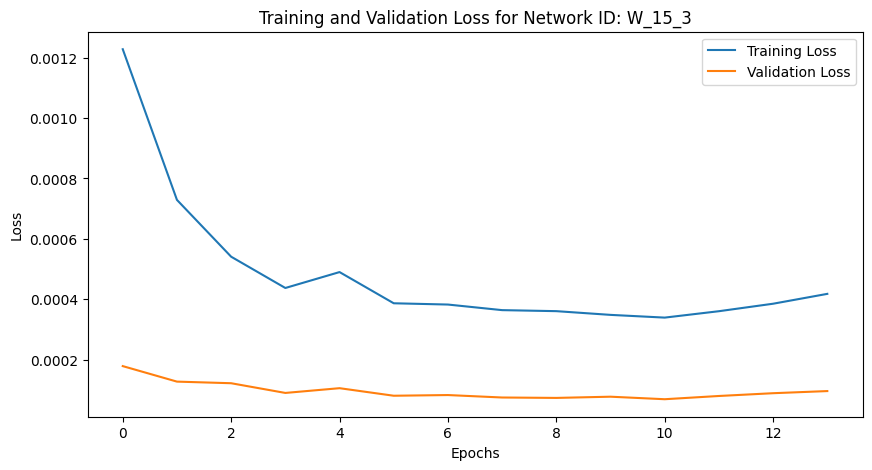

Training Progress:   0%|          | 13/10000 [00:34<7:18:21,  2.63s/epoch, loss=0.000418, val_loss=9.65e-5, patience=1]


Mean Squared Error: 0.0005630623345187712
Iteration: 283, Window Size: 15, Y Days Ahead: 4
X shape: (3789, 15)
y shape: (3789, 4)
Initializing network with layer sizes: [15, 128, 64, 32, 4]
params_W_15_4.npz not found. Using randomly initialized parameters.
Training data shape: (3031, 15), (3031, 4), Validation data shape: (379, 15), (379, 4), Testing data shape: (379, 15), (379, 4)
Parameters loaded from params_W_15_4.npz


Training Progress:   0%|          | 13/10000 [00:32<6:19:02,  2.28s/epoch, loss=0.000441, val_loss=8.81e-5, patience=1]

Epoch 14/10000, Training Loss: 0.000441, Validation Loss: 0.000088
Early stopping at epoch 14. Best validation loss: 0.000082


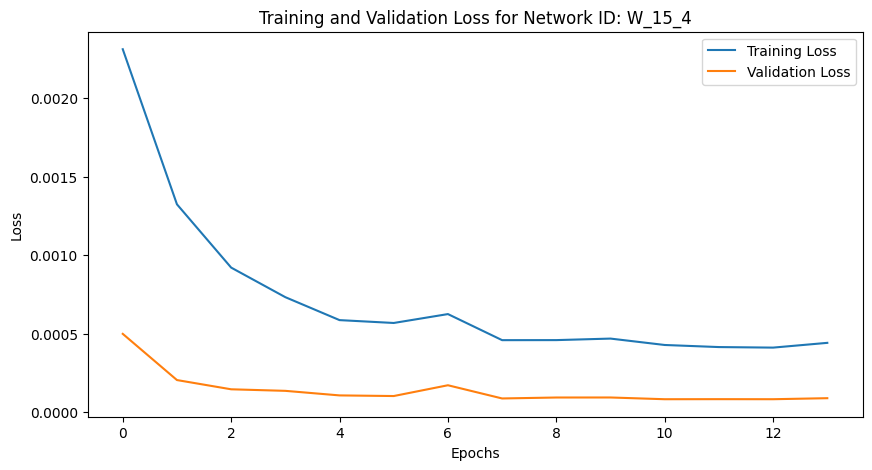

Training Progress:   0%|          | 13/10000 [00:32<6:55:06,  2.49s/epoch, loss=0.000441, val_loss=8.81e-5, patience=1]


Mean Squared Error: 0.0006592035509677295
Iteration: 284, Window Size: 15, Y Days Ahead: 5
X shape: (3788, 15)
y shape: (3788, 5)
Initializing network with layer sizes: [15, 128, 64, 32, 5]
params_W_15_5.npz not found. Using randomly initialized parameters.
Training data shape: (3030, 15), (3030, 5), Validation data shape: (379, 15), (379, 5), Testing data shape: (379, 15), (379, 5)
Parameters loaded from params_W_15_5.npz


Training Progress:   0%|          | 18/10000 [00:44<5:59:46,  2.16s/epoch, loss=0.000477, val_loss=9.36e-5, patience=1] 

Epoch 19/10000, Training Loss: 0.000477, Validation Loss: 0.000094
Early stopping at epoch 19. Best validation loss: 0.000093


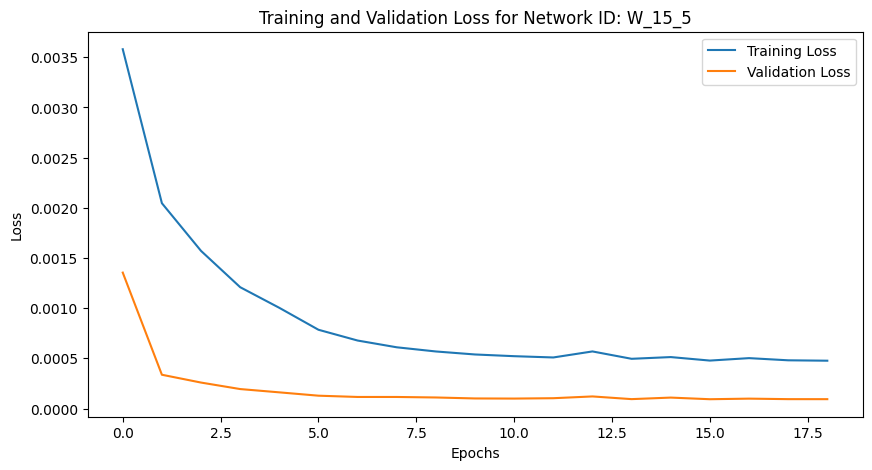

Training Progress:   0%|          | 18/10000 [00:45<6:57:38,  2.51s/epoch, loss=0.000477, val_loss=9.36e-5, patience=1]


Mean Squared Error: 0.0007673796638468591
Iteration: 285, Window Size: 15, Y Days Ahead: 6
X shape: (3787, 15)
y shape: (3787, 6)
Initializing network with layer sizes: [15, 128, 64, 32, 6]
params_W_15_6.npz not found. Using randomly initialized parameters.
Training data shape: (3029, 15), (3029, 6), Validation data shape: (379, 15), (379, 6), Testing data shape: (379, 15), (379, 6)
Parameters loaded from params_W_15_6.npz


Training Progress:   0%|          | 15/10000 [00:34<5:51:25,  2.11s/epoch, loss=0.00055, val_loss=0.000114, patience=1] 

Epoch 16/10000, Training Loss: 0.000550, Validation Loss: 0.000114
Early stopping at epoch 16. Best validation loss: 0.000108


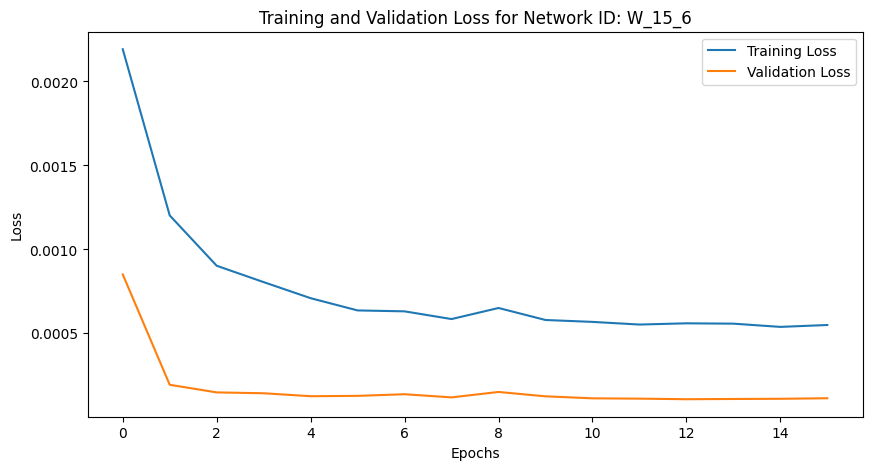

Training Progress:   0%|          | 15/10000 [00:34<6:26:04,  2.32s/epoch, loss=0.00055, val_loss=0.000114, patience=1]


Mean Squared Error: 0.000826504442804099
Iteration: 286, Window Size: 15, Y Days Ahead: 7
X shape: (3786, 15)
y shape: (3786, 7)
Initializing network with layer sizes: [15, 128, 64, 32, 7]
params_W_15_7.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 15), (3028, 7), Validation data shape: (379, 15), (379, 7), Testing data shape: (379, 15), (379, 7)
Parameters loaded from params_W_15_7.npz


Training Progress:   0%|          | 26/10000 [01:01<6:39:50,  2.41s/epoch, loss=0.000595, val_loss=0.000121, patience=1]

Epoch 27/10000, Training Loss: 0.000595, Validation Loss: 0.000121
Early stopping at epoch 27. Best validation loss: 0.000117


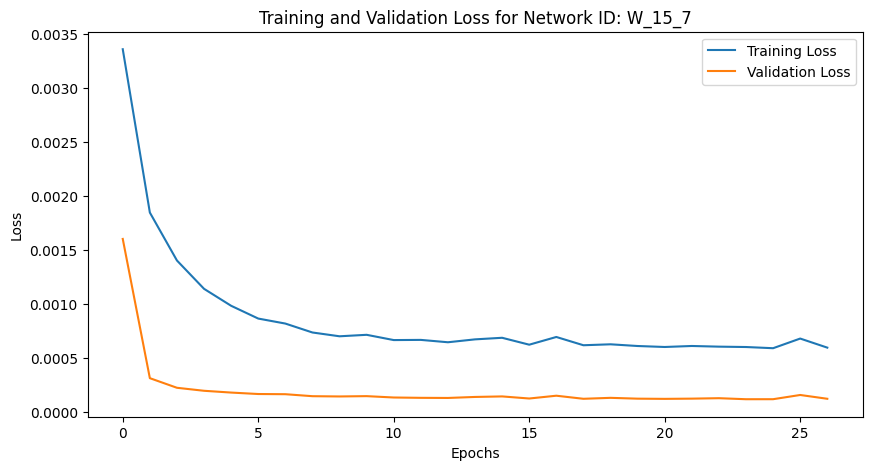

Training Progress:   0%|          | 26/10000 [01:01<6:36:09,  2.38s/epoch, loss=0.000595, val_loss=0.000121, patience=1]


Mean Squared Error: 0.0009543160322386311
Iteration: 287, Window Size: 15, Y Days Ahead: 8
X shape: (3785, 15)
y shape: (3785, 8)
Initializing network with layer sizes: [15, 128, 64, 32, 8]
params_W_15_8.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 15), (3028, 8), Validation data shape: (378, 15), (378, 8), Testing data shape: (379, 15), (379, 8)
Parameters loaded from params_W_15_8.npz


Training Progress:   0%|          | 34/10000 [01:26<7:51:19,  2.84s/epoch, loss=0.00064, val_loss=0.000126, patience=1] 

Epoch 35/10000, Training Loss: 0.000640, Validation Loss: 0.000126
Early stopping at epoch 35. Best validation loss: 0.000124


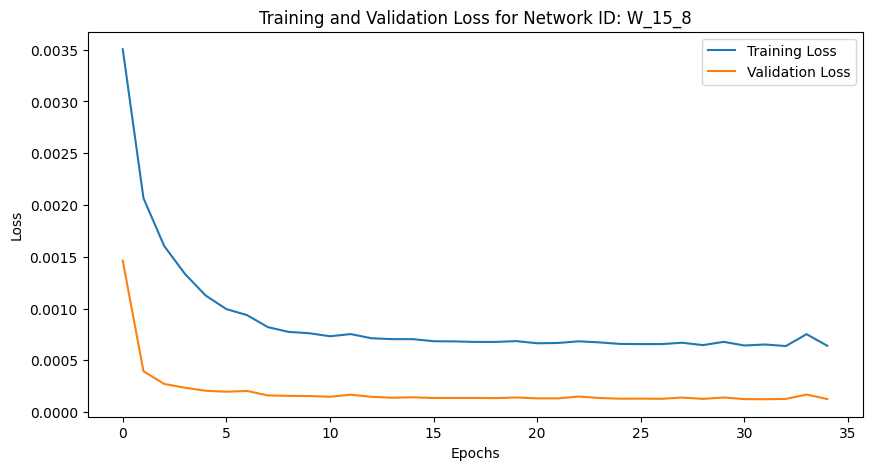

Training Progress:   0%|          | 34/10000 [01:26<7:04:15,  2.55s/epoch, loss=0.00064, val_loss=0.000126, patience=1]


Mean Squared Error: 0.0010443242806460738
Iteration: 288, Window Size: 15, Y Days Ahead: 9
X shape: (3784, 15)
y shape: (3784, 9)
Initializing network with layer sizes: [15, 128, 64, 32, 9]
params_W_15_9.npz not found. Using randomly initialized parameters.
Training data shape: (3027, 15), (3027, 9), Validation data shape: (378, 15), (378, 9), Testing data shape: (379, 15), (379, 9)
Parameters loaded from params_W_15_9.npz


Training Progress:   0%|          | 29/10000 [01:12<6:51:49,  2.48s/epoch, loss=0.000709, val_loss=0.000149, patience=1]

Epoch 30/10000, Training Loss: 0.000709, Validation Loss: 0.000149
Early stopping at epoch 30. Best validation loss: 0.000142


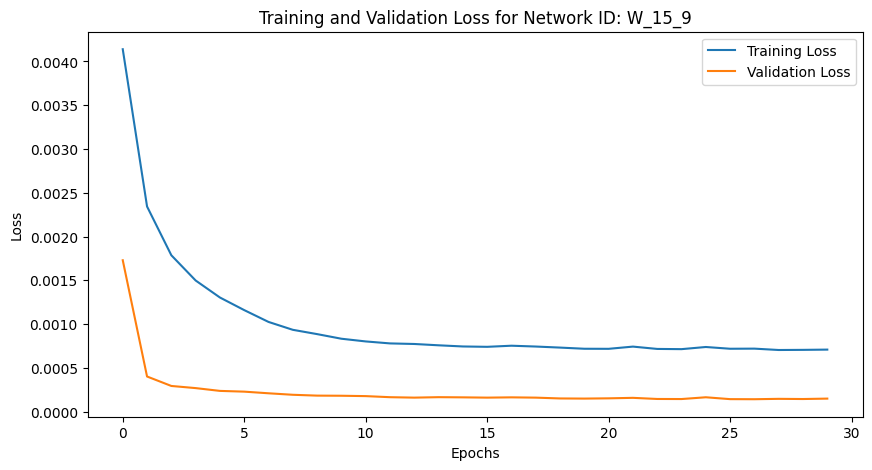

Training Progress:   0%|          | 29/10000 [01:12<6:57:28,  2.51s/epoch, loss=0.000709, val_loss=0.000149, patience=1]


Mean Squared Error: 0.0011440597362030367
Iteration: 289, Window Size: 15, Y Days Ahead: 10
X shape: (3783, 15)
y shape: (3783, 10)
Initializing network with layer sizes: [15, 128, 64, 32, 10]
params_W_15_10.npz not found. Using randomly initialized parameters.
Training data shape: (3026, 15), (3026, 10), Validation data shape: (378, 15), (378, 10), Testing data shape: (379, 15), (379, 10)
Parameters loaded from params_W_15_10.npz


Training Progress:   0%|          | 18/10000 [00:46<6:50:01,  2.46s/epoch, loss=0.000799, val_loss=0.000172, patience=1]

Epoch 19/10000, Training Loss: 0.000799, Validation Loss: 0.000172
Early stopping at epoch 19. Best validation loss: 0.000160


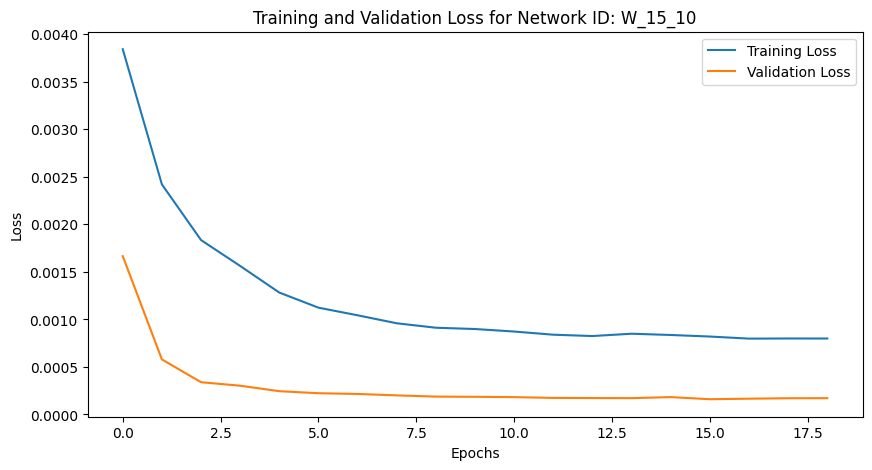

Training Progress:   0%|          | 18/10000 [00:46<7:11:50,  2.60s/epoch, loss=0.000799, val_loss=0.000172, patience=1]


Mean Squared Error: 0.0013094119863701448
Iteration: 290, Window Size: 15, Y Days Ahead: 11
X shape: (3782, 15)
y shape: (3782, 11)
Initializing network with layer sizes: [15, 128, 64, 32, 11]
params_W_15_11.npz not found. Using randomly initialized parameters.
Training data shape: (3025, 15), (3025, 11), Validation data shape: (378, 15), (378, 11), Testing data shape: (379, 15), (379, 11)
Parameters loaded from params_W_15_11.npz


Training Progress:   0%|          | 20/10000 [00:51<6:22:17,  2.30s/epoch, loss=0.00102, val_loss=0.000232, patience=1] 

Epoch 21/10000, Training Loss: 0.001021, Validation Loss: 0.000232
Early stopping at epoch 21. Best validation loss: 0.000179


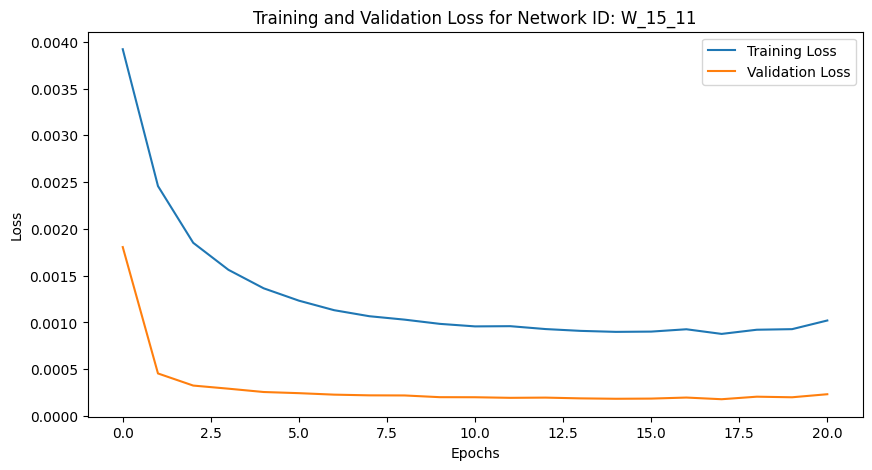

Training Progress:   0%|          | 20/10000 [00:51<7:10:44,  2.59s/epoch, loss=0.00102, val_loss=0.000232, patience=1]


Mean Squared Error: 0.0013737273019889336
Iteration: 291, Window Size: 15, Y Days Ahead: 12
X shape: (3781, 15)
y shape: (3781, 12)
Initializing network with layer sizes: [15, 128, 64, 32, 12]
params_W_15_12.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 15), (3024, 12), Validation data shape: (378, 15), (378, 12), Testing data shape: (379, 15), (379, 12)
Parameters loaded from params_W_15_12.npz


Training Progress:   0%|          | 29/10000 [01:12<7:30:40,  2.71s/epoch, loss=0.000917, val_loss=0.000199, patience=1]

Epoch 30/10000, Training Loss: 0.000917, Validation Loss: 0.000199
Early stopping at epoch 30. Best validation loss: 0.000188


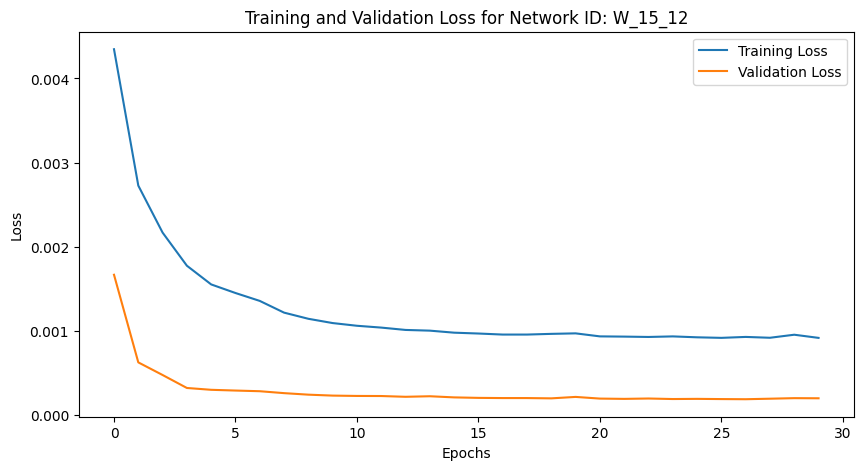

Training Progress:   0%|          | 29/10000 [01:12<6:57:17,  2.51s/epoch, loss=0.000917, val_loss=0.000199, patience=1]


Mean Squared Error: 0.00152005180595163
Iteration: 292, Window Size: 15, Y Days Ahead: 13
X shape: (3780, 15)
y shape: (3780, 13)
Initializing network with layer sizes: [15, 128, 64, 32, 13]
params_W_15_13.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 15), (3024, 13), Validation data shape: (378, 15), (378, 13), Testing data shape: (378, 15), (378, 13)
Parameters loaded from params_W_15_13.npz


Training Progress:   0%|          | 25/10000 [00:58<6:08:32,  2.22s/epoch, loss=0.000978, val_loss=0.000211, patience=1]

Epoch 26/10000, Training Loss: 0.000978, Validation Loss: 0.000211
Early stopping at epoch 26. Best validation loss: 0.000202


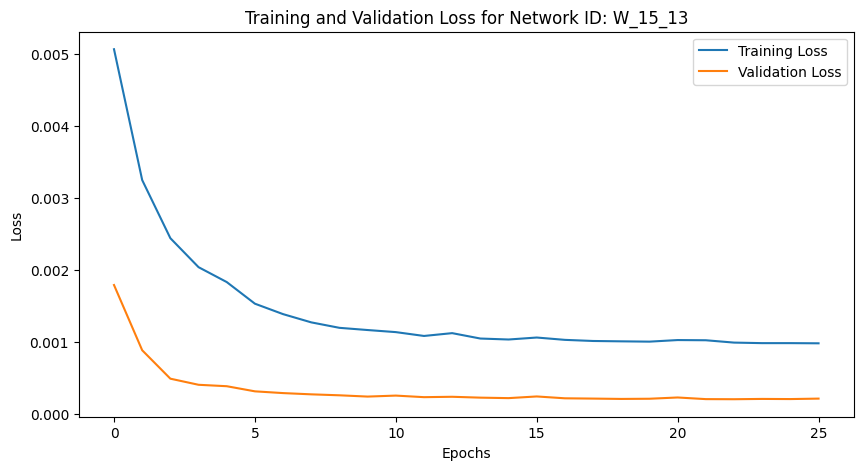

Training Progress:   0%|          | 25/10000 [00:58<6:30:01,  2.35s/epoch, loss=0.000978, val_loss=0.000211, patience=1]


Mean Squared Error: 0.001597288283890027
Iteration: 293, Window Size: 15, Y Days Ahead: 14
X shape: (3779, 15)
y shape: (3779, 14)
Initializing network with layer sizes: [15, 128, 64, 32, 14]
params_W_15_14.npz not found. Using randomly initialized parameters.
Training data shape: (3023, 15), (3023, 14), Validation data shape: (378, 15), (378, 14), Testing data shape: (378, 15), (378, 14)
Parameters loaded from params_W_15_14.npz


Training Progress:   0%|          | 19/10000 [00:42<5:51:02,  2.11s/epoch, loss=0.00107, val_loss=0.00023, patience=1] 

Epoch 20/10000, Training Loss: 0.001071, Validation Loss: 0.000230
Early stopping at epoch 20. Best validation loss: 0.000226


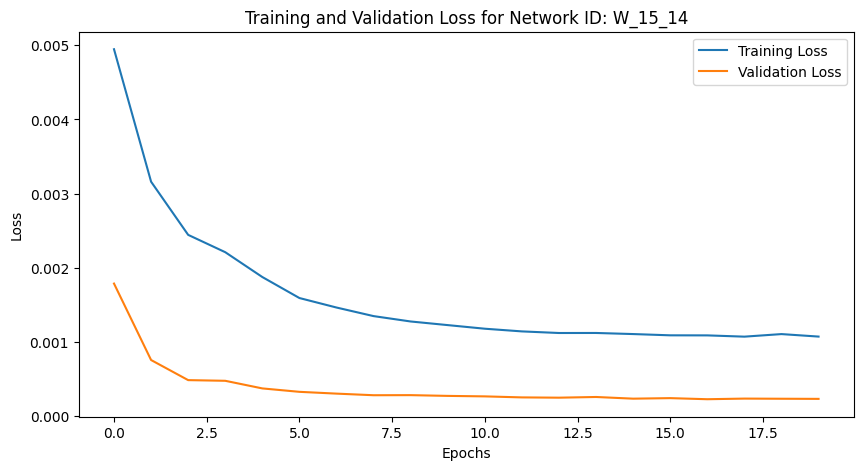

Training Progress:   0%|          | 19/10000 [00:42<6:13:54,  2.25s/epoch, loss=0.00107, val_loss=0.00023, patience=1]


Mean Squared Error: 0.001764975341565397
Iteration: 294, Window Size: 15, Y Days Ahead: 15
X shape: (3778, 15)
y shape: (3778, 15)
Initializing network with layer sizes: [15, 128, 64, 32, 15]
params_W_15_15.npz not found. Using randomly initialized parameters.
Training data shape: (3022, 15), (3022, 15), Validation data shape: (378, 15), (378, 15), Testing data shape: (378, 15), (378, 15)
Parameters loaded from params_W_15_15.npz


Training Progress:   0%|          | 15/10000 [00:34<5:43:25,  2.06s/epoch, loss=0.00113, val_loss=0.000243, patience=1]

Epoch 16/10000, Training Loss: 0.001131, Validation Loss: 0.000243
Early stopping at epoch 16. Best validation loss: 0.000242


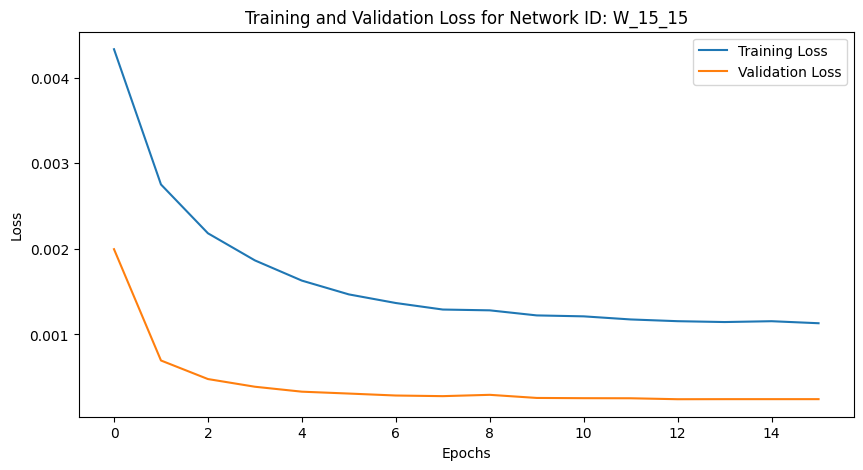

Training Progress:   0%|          | 15/10000 [00:34<6:26:23,  2.32s/epoch, loss=0.00113, val_loss=0.000243, patience=1]


Mean Squared Error: 0.001809618636860801
Iteration: 295, Window Size: 15, Y Days Ahead: 16
X shape: (3777, 15)
y shape: (3777, 16)
Initializing network with layer sizes: [15, 128, 64, 32, 16]
params_W_15_16.npz not found. Using randomly initialized parameters.
Training data shape: (3021, 15), (3021, 16), Validation data shape: (378, 15), (378, 16), Testing data shape: (378, 15), (378, 16)
Parameters loaded from params_W_15_16.npz


Training Progress:   0%|          | 17/10000 [00:38<5:59:06,  2.16s/epoch, loss=0.00123, val_loss=0.000284, patience=1]

Epoch 18/10000, Training Loss: 0.001229, Validation Loss: 0.000284
Early stopping at epoch 18. Best validation loss: 0.000264


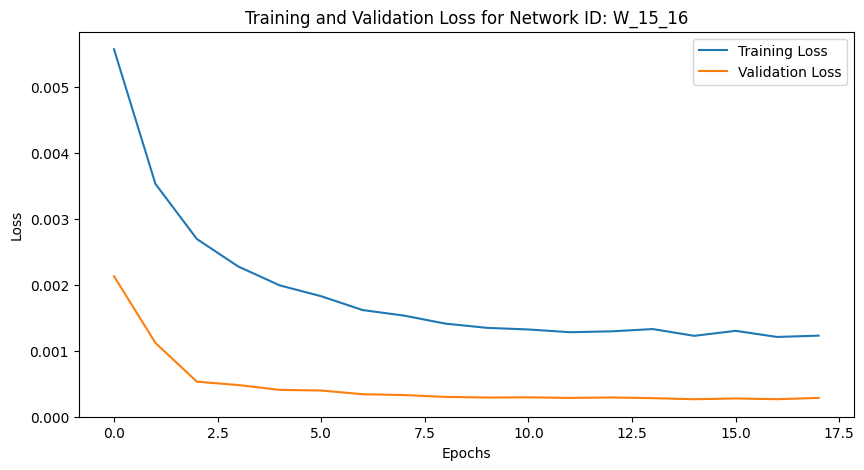

Training Progress:   0%|          | 17/10000 [00:38<6:15:33,  2.26s/epoch, loss=0.00123, val_loss=0.000284, patience=1]


Mean Squared Error: 0.0019359512062958315
Iteration: 296, Window Size: 15, Y Days Ahead: 17
X shape: (3776, 15)
y shape: (3776, 17)
Initializing network with layer sizes: [15, 128, 64, 32, 17]
params_W_15_17.npz not found. Using randomly initialized parameters.
Training data shape: (3020, 15), (3020, 17), Validation data shape: (378, 15), (378, 17), Testing data shape: (378, 15), (378, 17)
Parameters loaded from params_W_15_17.npz


Training Progress:   0%|          | 19/10000 [00:43<6:13:27,  2.25s/epoch, loss=0.00127, val_loss=0.000296, patience=1]

Epoch 20/10000, Training Loss: 0.001271, Validation Loss: 0.000296
Early stopping at epoch 20. Best validation loss: 0.000291


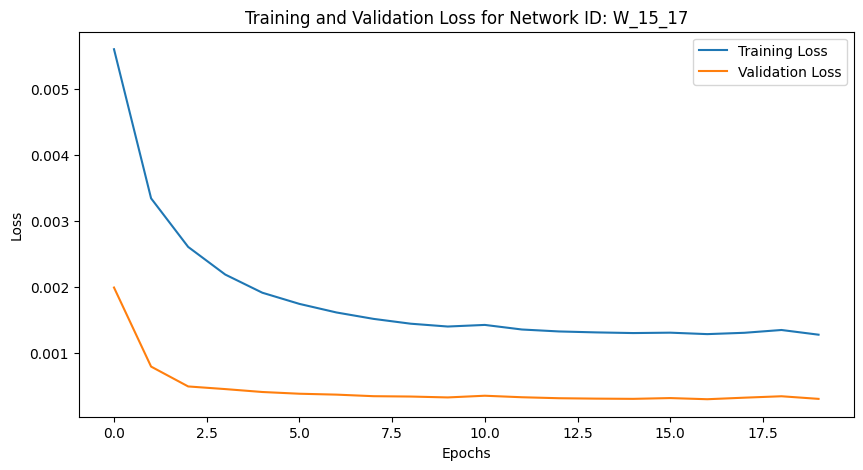

Training Progress:   0%|          | 19/10000 [00:44<6:26:08,  2.32s/epoch, loss=0.00127, val_loss=0.000296, patience=1]


Mean Squared Error: 0.0020403635509604902
Iteration: 297, Window Size: 15, Y Days Ahead: 18
X shape: (3775, 15)
y shape: (3775, 18)
Initializing network with layer sizes: [15, 128, 64, 32, 18]
params_W_15_18.npz not found. Using randomly initialized parameters.
Training data shape: (3020, 15), (3020, 18), Validation data shape: (377, 15), (377, 18), Testing data shape: (378, 15), (378, 18)
Parameters loaded from params_W_15_18.npz


Training Progress:   0%|          | 21/10000 [00:48<6:15:00,  2.25s/epoch, loss=0.00135, val_loss=0.000309, patience=1]

Epoch 22/10000, Training Loss: 0.001353, Validation Loss: 0.000309
Early stopping at epoch 22. Best validation loss: 0.000306


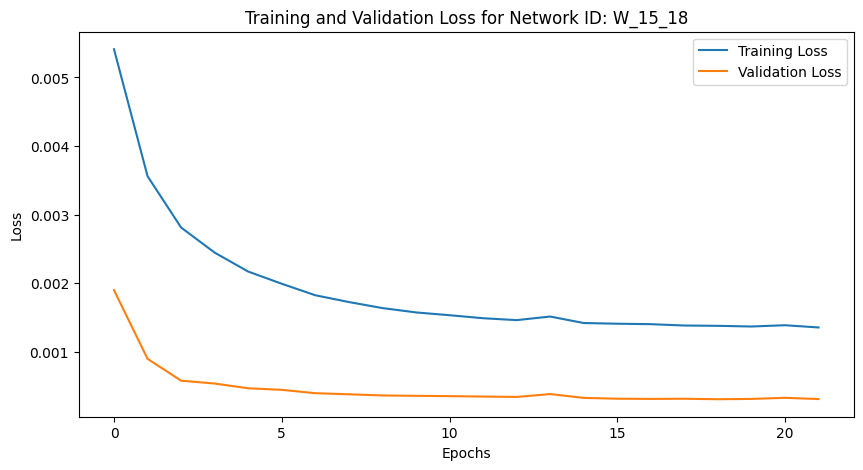

Training Progress:   0%|          | 21/10000 [00:49<6:28:54,  2.34s/epoch, loss=0.00135, val_loss=0.000309, patience=1]


Mean Squared Error: 0.002259837616420023
Iteration: 298, Window Size: 15, Y Days Ahead: 19
X shape: (3774, 15)
y shape: (3774, 19)
Initializing network with layer sizes: [15, 128, 64, 32, 19]
params_W_15_19.npz not found. Using randomly initialized parameters.
Training data shape: (3019, 15), (3019, 19), Validation data shape: (377, 15), (377, 19), Testing data shape: (378, 15), (378, 19)
Parameters loaded from params_W_15_19.npz


Training Progress:   0%|          | 16/10000 [00:38<6:07:28,  2.21s/epoch, loss=0.00149, val_loss=0.000366, patience=1]

Epoch 17/10000, Training Loss: 0.001495, Validation Loss: 0.000366
Early stopping at epoch 17. Best validation loss: 0.000359


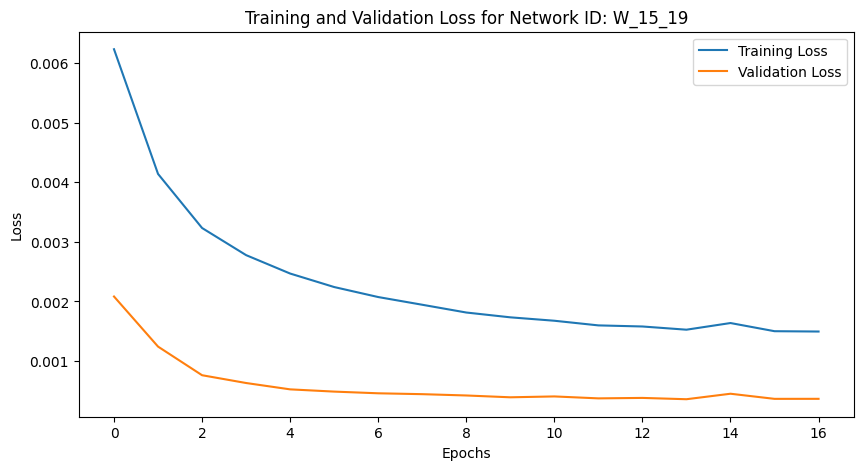

Training Progress:   0%|          | 16/10000 [00:38<6:40:57,  2.41s/epoch, loss=0.00149, val_loss=0.000366, patience=1]


Mean Squared Error: 0.0024063220177332006
Iteration: 299, Window Size: 15, Y Days Ahead: 20
X shape: (3773, 15)
y shape: (3773, 20)
Initializing network with layer sizes: [15, 128, 64, 32, 20]
params_W_15_20.npz not found. Using randomly initialized parameters.
Training data shape: (3018, 15), (3018, 20), Validation data shape: (377, 15), (377, 20), Testing data shape: (378, 15), (378, 20)
Parameters loaded from params_W_15_20.npz


Training Progress:   0%|          | 19/10000 [00:44<6:00:45,  2.17s/epoch, loss=0.00149, val_loss=0.00034, patience=1] 

Epoch 20/10000, Training Loss: 0.001486, Validation Loss: 0.000340
Early stopping at epoch 20. Best validation loss: 0.000338


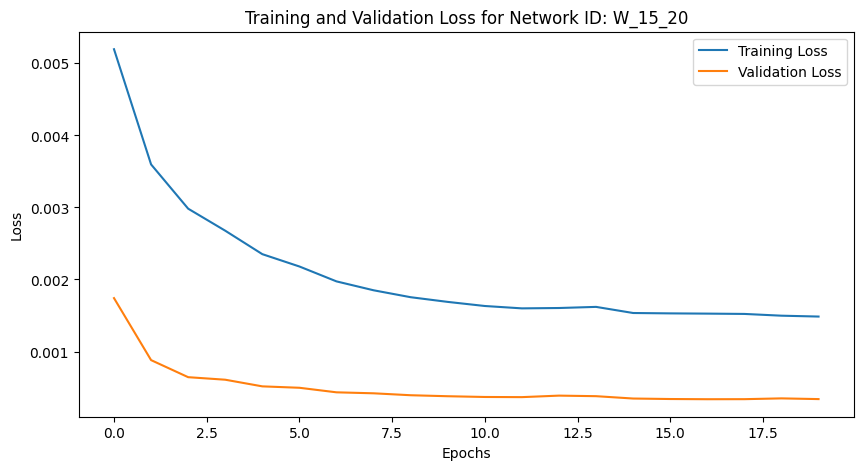

Training Progress:   0%|          | 19/10000 [00:44<6:28:09,  2.33s/epoch, loss=0.00149, val_loss=0.00034, patience=1]


Mean Squared Error: 0.0025569274279155117
Iteration: 300, Window Size: 16, Y Days Ahead: 1
X shape: (3791, 16)
y shape: (3791, 1)
Initializing network with layer sizes: [16, 128, 64, 32, 1]
params_W_16_1.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 16), (3032, 1), Validation data shape: (379, 16), (379, 1), Testing data shape: (380, 16), (380, 1)
Parameters loaded from params_W_16_1.npz


Training Progress:   0%|          | 17/10000 [00:38<6:00:18,  2.17s/epoch, loss=0.000233, val_loss=6.5e-5, patience=1]  

Epoch 18/10000, Training Loss: 0.000233, Validation Loss: 0.000065
Early stopping at epoch 18. Best validation loss: 0.000038


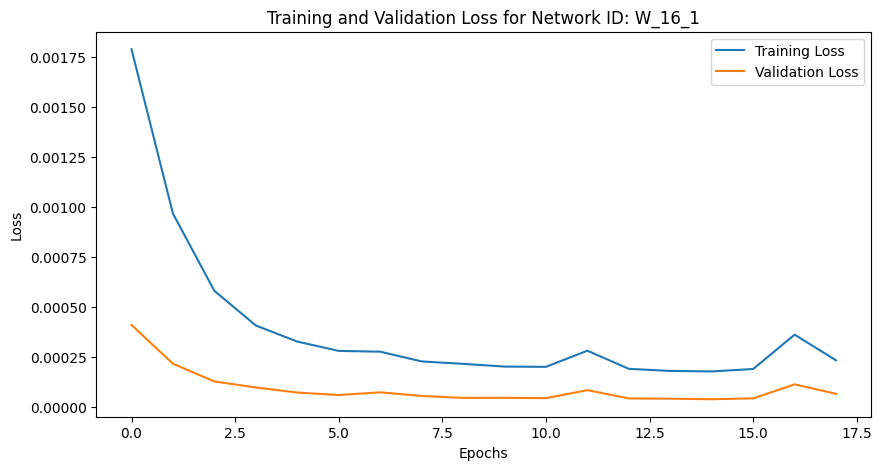

Training Progress:   0%|          | 17/10000 [00:39<6:23:49,  2.31s/epoch, loss=0.000233, val_loss=6.5e-5, patience=1]


Mean Squared Error: 0.00038431862241429163
Iteration: 301, Window Size: 16, Y Days Ahead: 2
X shape: (3790, 16)
y shape: (3790, 2)
Initializing network with layer sizes: [16, 128, 64, 32, 2]
params_W_16_2.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 16), (3032, 2), Validation data shape: (379, 16), (379, 2), Testing data shape: (379, 16), (379, 2)
Parameters loaded from params_W_16_2.npz


Training Progress:   0%|          | 15/10000 [00:35<5:56:02,  2.14s/epoch, loss=0.000346, val_loss=6.34e-5, patience=1]

Epoch 16/10000, Training Loss: 0.000346, Validation Loss: 0.000063
Early stopping at epoch 16. Best validation loss: 0.000051


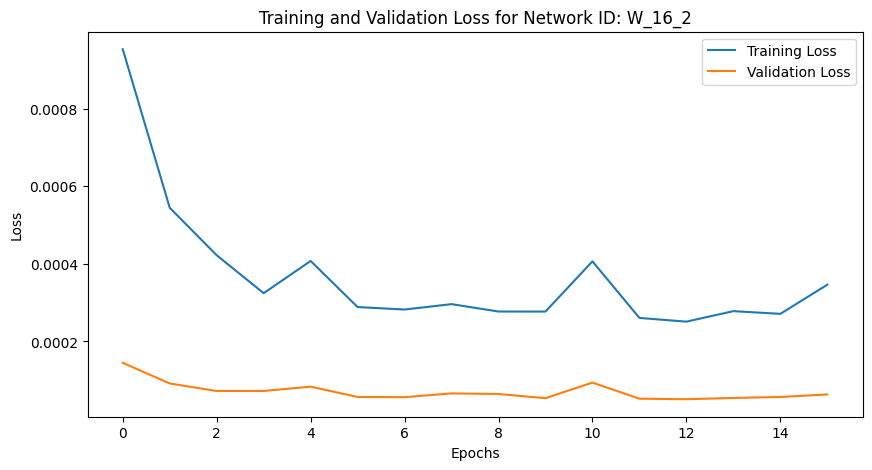

Training Progress:   0%|          | 15/10000 [00:35<6:34:06,  2.37s/epoch, loss=0.000346, val_loss=6.34e-5, patience=1]


Mean Squared Error: 0.00047228944270205023
Iteration: 302, Window Size: 16, Y Days Ahead: 3
X shape: (3789, 16)
y shape: (3789, 3)
Initializing network with layer sizes: [16, 128, 64, 32, 3]
params_W_16_3.npz not found. Using randomly initialized parameters.
Training data shape: (3031, 16), (3031, 3), Validation data shape: (379, 16), (379, 3), Testing data shape: (379, 16), (379, 3)
Parameters loaded from params_W_16_3.npz


Training Progress:   0%|          | 18/10000 [00:41<6:06:31,  2.20s/epoch, loss=0.000341, val_loss=6.76e-5, patience=1]

Epoch 19/10000, Training Loss: 0.000341, Validation Loss: 0.000068
Early stopping at epoch 19. Best validation loss: 0.000067


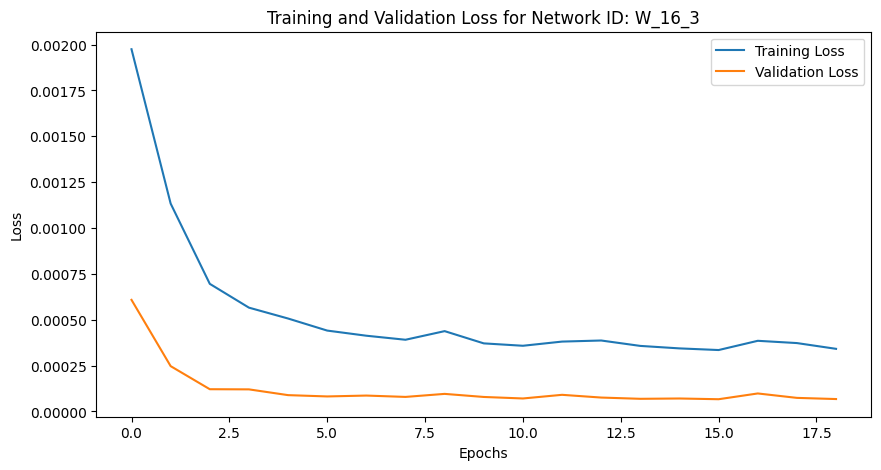

Training Progress:   0%|          | 18/10000 [00:42<6:30:15,  2.35s/epoch, loss=0.000341, val_loss=6.76e-5, patience=1]


Mean Squared Error: 0.0005581549852426087
Iteration: 303, Window Size: 16, Y Days Ahead: 4
X shape: (3788, 16)
y shape: (3788, 4)
Initializing network with layer sizes: [16, 128, 64, 32, 4]
params_W_16_4.npz not found. Using randomly initialized parameters.
Training data shape: (3030, 16), (3030, 4), Validation data shape: (379, 16), (379, 4), Testing data shape: (379, 16), (379, 4)
Parameters loaded from params_W_16_4.npz


Training Progress:   0%|          | 11/10000 [00:26<6:10:34,  2.23s/epoch, loss=0.000462, val_loss=0.000101, patience=1]

Epoch 12/10000, Training Loss: 0.000462, Validation Loss: 0.000101
Early stopping at epoch 12. Best validation loss: 0.000092


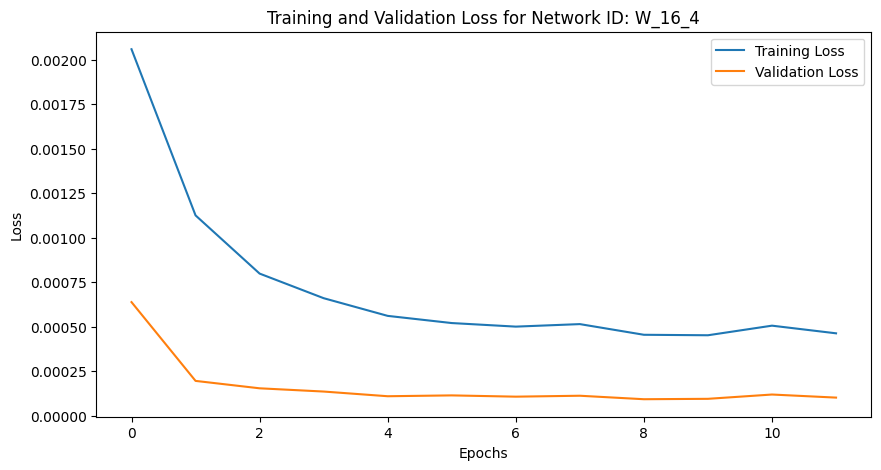

Training Progress:   0%|          | 11/10000 [00:26<6:38:37,  2.39s/epoch, loss=0.000462, val_loss=0.000101, patience=1]


Mean Squared Error: 0.0007670804334048314
Iteration: 304, Window Size: 16, Y Days Ahead: 5
X shape: (3787, 16)
y shape: (3787, 5)
Initializing network with layer sizes: [16, 128, 64, 32, 5]
params_W_16_5.npz not found. Using randomly initialized parameters.
Training data shape: (3029, 16), (3029, 5), Validation data shape: (379, 16), (379, 5), Testing data shape: (379, 16), (379, 5)
Parameters loaded from params_W_16_5.npz


Training Progress:   0%|          | 25/10000 [00:58<6:16:58,  2.27s/epoch, loss=0.000463, val_loss=9.37e-5, patience=1] 

Epoch 26/10000, Training Loss: 0.000463, Validation Loss: 0.000094
Early stopping at epoch 26. Best validation loss: 0.000093


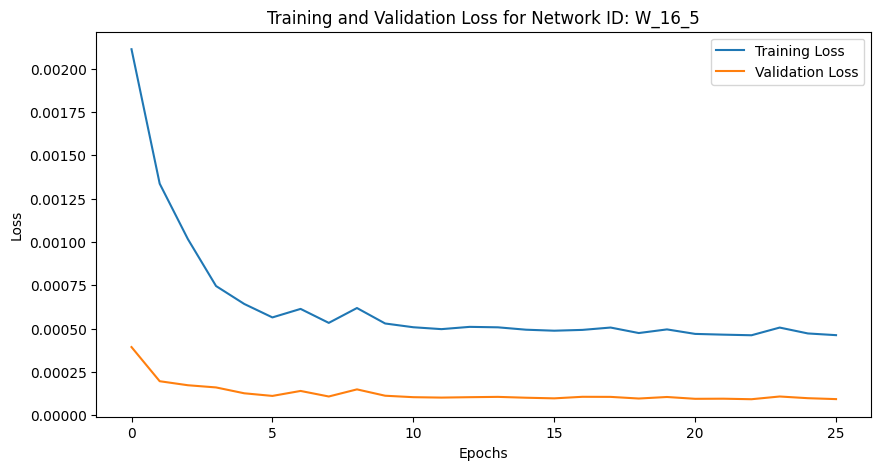

Training Progress:   0%|          | 25/10000 [00:58<6:30:05,  2.35s/epoch, loss=0.000463, val_loss=9.37e-5, patience=1]


Mean Squared Error: 0.0007548457410353201
Iteration: 305, Window Size: 16, Y Days Ahead: 6
X shape: (3786, 16)
y shape: (3786, 6)
Initializing network with layer sizes: [16, 128, 64, 32, 6]
params_W_16_6.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 16), (3028, 6), Validation data shape: (379, 16), (379, 6), Testing data shape: (379, 16), (379, 6)
Parameters loaded from params_W_16_6.npz


Training Progress:   0%|          | 25/10000 [00:59<6:12:55,  2.24s/epoch, loss=0.000594, val_loss=0.000137, patience=1]

Epoch 26/10000, Training Loss: 0.000594, Validation Loss: 0.000137
Early stopping at epoch 26. Best validation loss: 0.000104


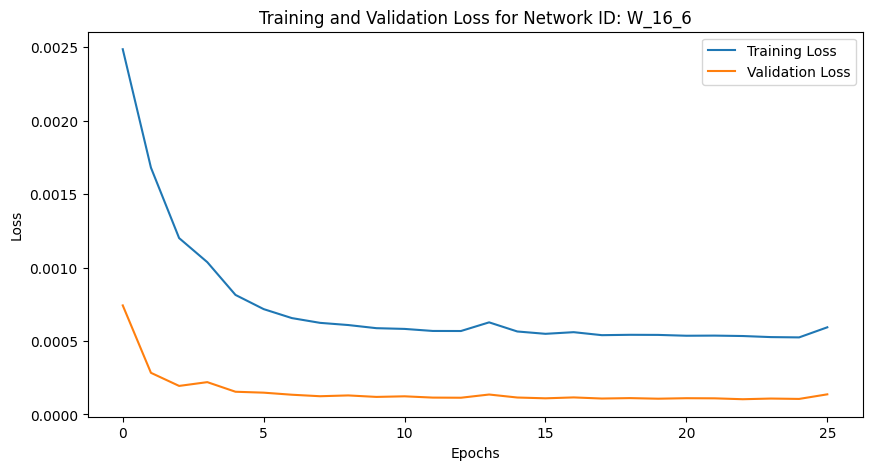

Training Progress:   0%|          | 25/10000 [00:59<6:36:41,  2.39s/epoch, loss=0.000594, val_loss=0.000137, patience=1]


Mean Squared Error: 0.0008279441319969766
Iteration: 306, Window Size: 16, Y Days Ahead: 7
X shape: (3785, 16)
y shape: (3785, 7)
Initializing network with layer sizes: [16, 128, 64, 32, 7]
params_W_16_7.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 16), (3028, 7), Validation data shape: (378, 16), (378, 7), Testing data shape: (379, 16), (379, 7)
Parameters loaded from params_W_16_7.npz


Training Progress:   0%|          | 18/10000 [00:42<6:11:05,  2.23s/epoch, loss=0.000651, val_loss=0.000131, patience=1]

Epoch 19/10000, Training Loss: 0.000651, Validation Loss: 0.000131
Early stopping at epoch 19. Best validation loss: 0.000128


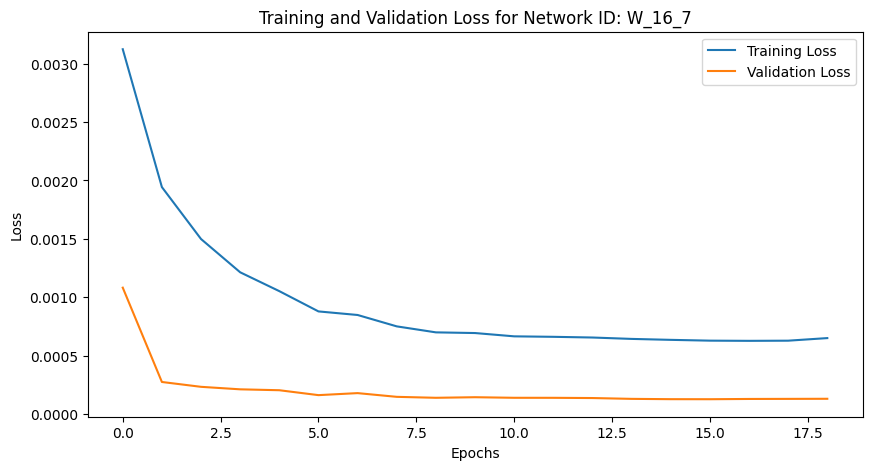

Training Progress:   0%|          | 18/10000 [00:43<6:38:15,  2.39s/epoch, loss=0.000651, val_loss=0.000131, patience=1]


Mean Squared Error: 0.0009508180962323835
Iteration: 307, Window Size: 16, Y Days Ahead: 8
X shape: (3784, 16)
y shape: (3784, 8)
Initializing network with layer sizes: [16, 128, 64, 32, 8]
params_W_16_8.npz not found. Using randomly initialized parameters.
Training data shape: (3027, 16), (3027, 8), Validation data shape: (378, 16), (378, 8), Testing data shape: (379, 16), (379, 8)
Parameters loaded from params_W_16_8.npz


Training Progress:   0%|          | 21/10000 [00:48<5:48:55,  2.10s/epoch, loss=0.000666, val_loss=0.000133, patience=1]

Epoch 22/10000, Training Loss: 0.000666, Validation Loss: 0.000133
Early stopping at epoch 22. Best validation loss: 0.000132


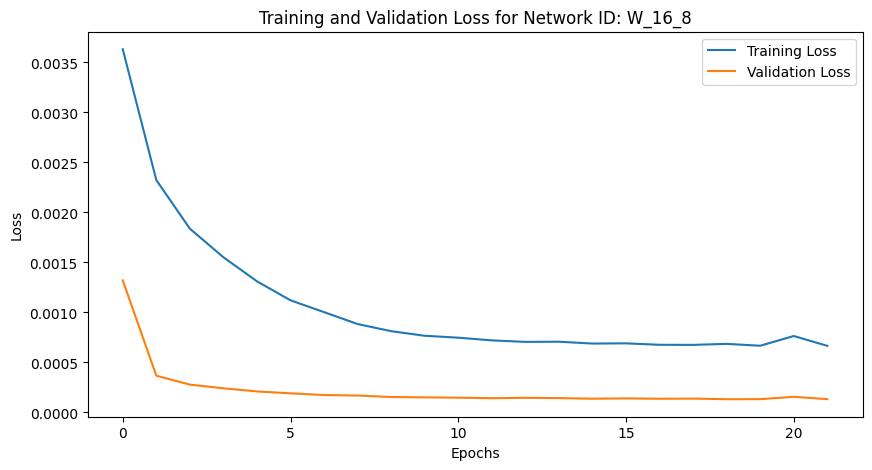

Training Progress:   0%|          | 21/10000 [00:49<6:29:40,  2.34s/epoch, loss=0.000666, val_loss=0.000133, patience=1]


Mean Squared Error: 0.001055500596508946
Iteration: 308, Window Size: 16, Y Days Ahead: 9
X shape: (3783, 16)
y shape: (3783, 9)
Initializing network with layer sizes: [16, 128, 64, 32, 9]
params_W_16_9.npz not found. Using randomly initialized parameters.
Training data shape: (3026, 16), (3026, 9), Validation data shape: (378, 16), (378, 9), Testing data shape: (379, 16), (379, 9)
Parameters loaded from params_W_16_9.npz


Training Progress:   0%|          | 13/10000 [00:30<6:06:47,  2.20s/epoch, loss=0.000763, val_loss=0.000169, patience=1]

Epoch 14/10000, Training Loss: 0.000763, Validation Loss: 0.000169
Early stopping at epoch 14. Best validation loss: 0.000156


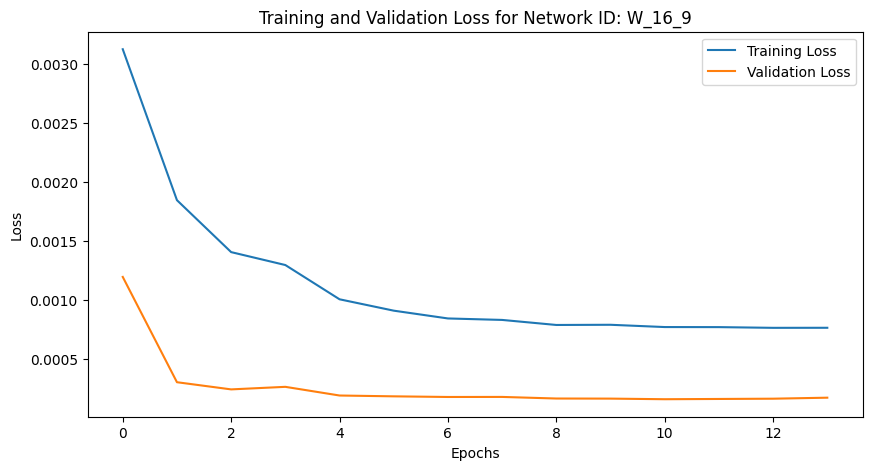

Training Progress:   0%|          | 13/10000 [00:30<6:35:12,  2.37s/epoch, loss=0.000763, val_loss=0.000169, patience=1]


Mean Squared Error: 0.0011596651238751981
Iteration: 309, Window Size: 16, Y Days Ahead: 10
X shape: (3782, 16)
y shape: (3782, 10)
Initializing network with layer sizes: [16, 128, 64, 32, 10]
params_W_16_10.npz not found. Using randomly initialized parameters.
Training data shape: (3025, 16), (3025, 10), Validation data shape: (378, 16), (378, 10), Testing data shape: (379, 16), (379, 10)
Parameters loaded from params_W_16_10.npz


Training Progress:   0%|          | 16/10000 [00:36<6:01:38,  2.17s/epoch, loss=0.000871, val_loss=0.00019, patience=1] 

Epoch 17/10000, Training Loss: 0.000871, Validation Loss: 0.000190
Early stopping at epoch 17. Best validation loss: 0.000165


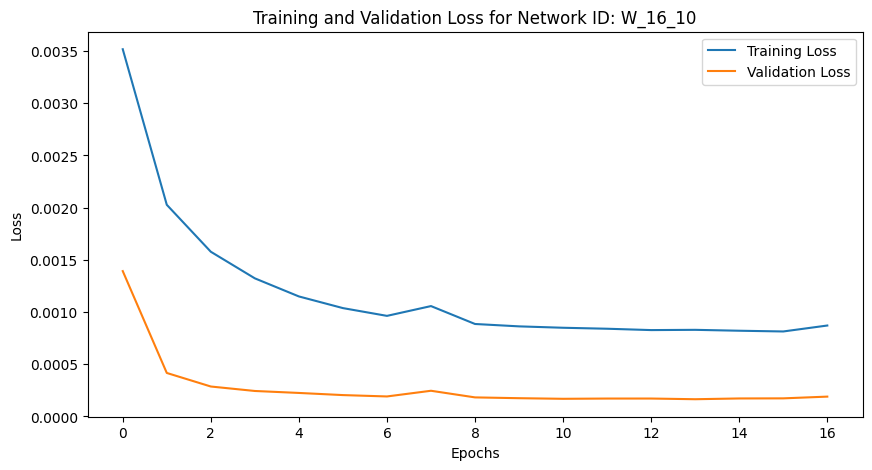

Training Progress:   0%|          | 16/10000 [00:37<6:27:33,  2.33s/epoch, loss=0.000871, val_loss=0.00019, patience=1]


Mean Squared Error: 0.0012750231518807126
Iteration: 310, Window Size: 16, Y Days Ahead: 11
X shape: (3781, 16)
y shape: (3781, 11)
Initializing network with layer sizes: [16, 128, 64, 32, 11]
params_W_16_11.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 16), (3024, 11), Validation data shape: (378, 16), (378, 11), Testing data shape: (379, 16), (379, 11)
Parameters loaded from params_W_16_11.npz


Training Progress:   0%|          | 19/10000 [00:44<6:18:36,  2.28s/epoch, loss=0.000865, val_loss=0.000181, patience=1]

Epoch 20/10000, Training Loss: 0.000865, Validation Loss: 0.000181
Early stopping at epoch 20. Best validation loss: 0.000180


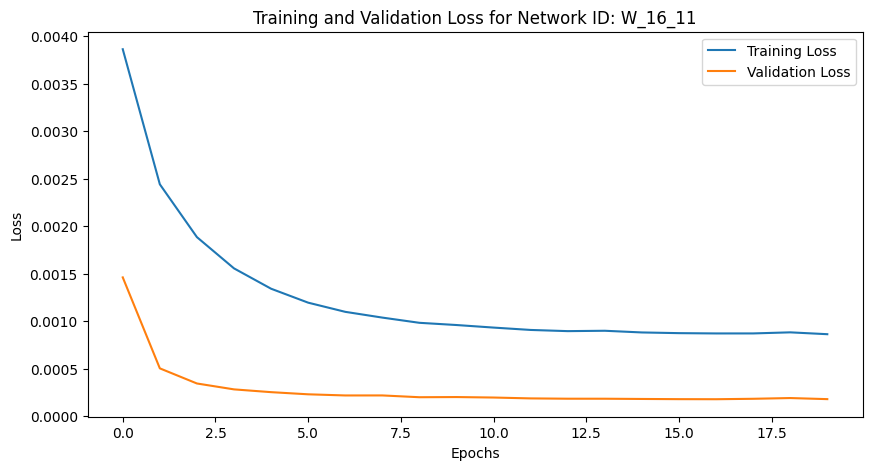

Training Progress:   0%|          | 19/10000 [00:44<6:28:15,  2.33s/epoch, loss=0.000865, val_loss=0.000181, patience=1]


Mean Squared Error: 0.0014017288636241326
Iteration: 311, Window Size: 16, Y Days Ahead: 12
X shape: (3780, 16)
y shape: (3780, 12)
Initializing network with layer sizes: [16, 128, 64, 32, 12]
params_W_16_12.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 16), (3024, 12), Validation data shape: (378, 16), (378, 12), Testing data shape: (378, 16), (378, 12)
Parameters loaded from params_W_16_12.npz


Training Progress:   0%|          | 17/10000 [00:39<6:09:10,  2.22s/epoch, loss=0.000937, val_loss=0.000206, patience=1]

Epoch 18/10000, Training Loss: 0.000937, Validation Loss: 0.000206
Early stopping at epoch 18. Best validation loss: 0.000202


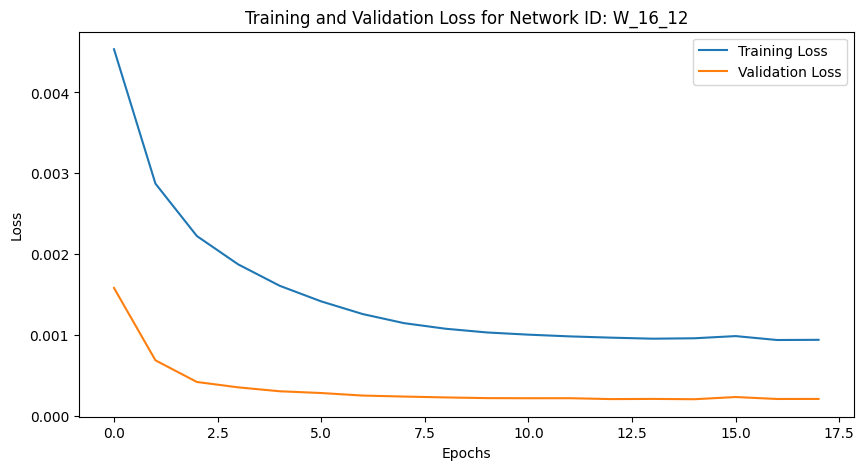

Training Progress:   0%|          | 17/10000 [00:39<6:28:02,  2.33s/epoch, loss=0.000937, val_loss=0.000206, patience=1]


Mean Squared Error: 0.0015153423707181003
Iteration: 312, Window Size: 16, Y Days Ahead: 13
X shape: (3779, 16)
y shape: (3779, 13)
Initializing network with layer sizes: [16, 128, 64, 32, 13]
params_W_16_13.npz not found. Using randomly initialized parameters.
Training data shape: (3023, 16), (3023, 13), Validation data shape: (378, 16), (378, 13), Testing data shape: (378, 16), (378, 13)
Parameters loaded from params_W_16_13.npz


Training Progress:   0%|          | 18/10000 [00:42<6:14:21,  2.25s/epoch, loss=0.00118, val_loss=0.000256, patience=1] 

Epoch 19/10000, Training Loss: 0.001178, Validation Loss: 0.000256
Early stopping at epoch 19. Best validation loss: 0.000215


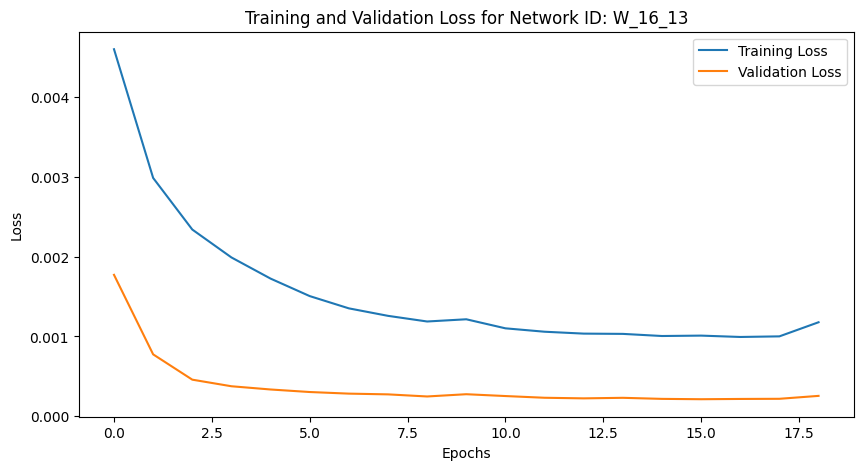

Training Progress:   0%|          | 18/10000 [00:42<6:32:37,  2.36s/epoch, loss=0.00118, val_loss=0.000256, patience=1]


Mean Squared Error: 0.0016058572529410778
Iteration: 313, Window Size: 16, Y Days Ahead: 14
X shape: (3778, 16)
y shape: (3778, 14)
Initializing network with layer sizes: [16, 128, 64, 32, 14]
params_W_16_14.npz not found. Using randomly initialized parameters.
Training data shape: (3022, 16), (3022, 14), Validation data shape: (378, 16), (378, 14), Testing data shape: (378, 16), (378, 14)
Parameters loaded from params_W_16_14.npz


Training Progress:   0%|          | 33/10000 [01:18<6:52:30,  2.48s/epoch, loss=0.00105, val_loss=0.000233, patience=1]

Epoch 34/10000, Training Loss: 0.001049, Validation Loss: 0.000233
Early stopping at epoch 34. Best validation loss: 0.000219


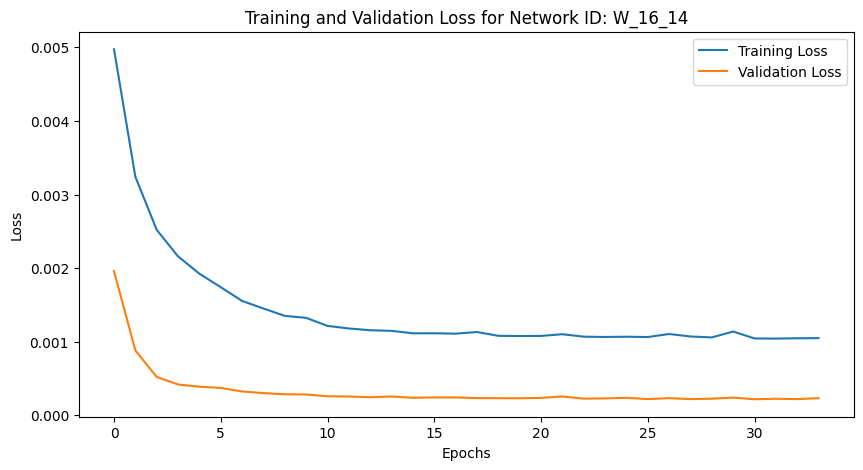

Training Progress:   0%|          | 33/10000 [01:18<6:35:37,  2.38s/epoch, loss=0.00105, val_loss=0.000233, patience=1]


Mean Squared Error: 0.0016691550268350308
Iteration: 314, Window Size: 16, Y Days Ahead: 15
X shape: (3777, 16)
y shape: (3777, 15)
Initializing network with layer sizes: [16, 128, 64, 32, 15]
params_W_16_15.npz not found. Using randomly initialized parameters.
Training data shape: (3021, 16), (3021, 15), Validation data shape: (378, 16), (378, 15), Testing data shape: (378, 16), (378, 15)
Parameters loaded from params_W_16_15.npz


Training Progress:   0%|          | 24/10000 [00:58<6:29:13,  2.34s/epoch, loss=0.00111, val_loss=0.000248, patience=1]

Epoch 25/10000, Training Loss: 0.001110, Validation Loss: 0.000248
Early stopping at epoch 25. Best validation loss: 0.000242


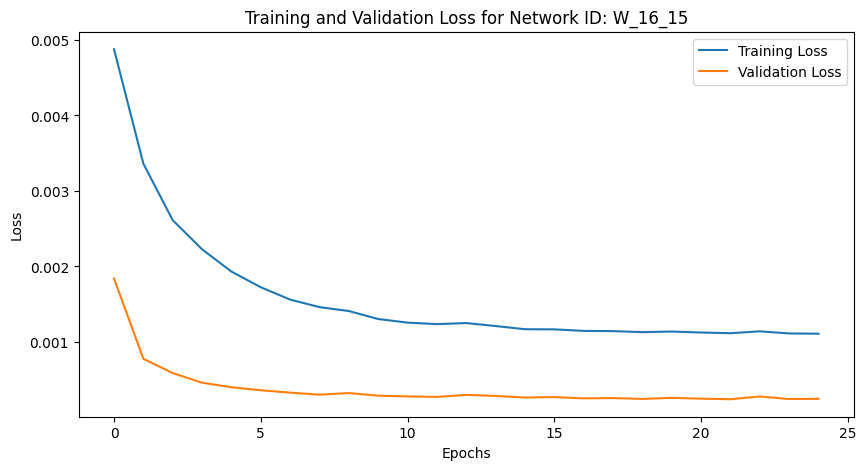

Training Progress:   0%|          | 24/10000 [00:58<6:46:51,  2.45s/epoch, loss=0.00111, val_loss=0.000248, patience=1]


Mean Squared Error: 0.001766908168105569
Iteration: 315, Window Size: 16, Y Days Ahead: 16
X shape: (3776, 16)
y shape: (3776, 16)
Initializing network with layer sizes: [16, 128, 64, 32, 16]
params_W_16_16.npz not found. Using randomly initialized parameters.
Training data shape: (3020, 16), (3020, 16), Validation data shape: (378, 16), (378, 16), Testing data shape: (378, 16), (378, 16)
Parameters loaded from params_W_16_16.npz


Training Progress:   0%|          | 23/10000 [00:54<6:15:21,  2.26s/epoch, loss=0.0012, val_loss=0.000277, patience=1] 

Epoch 24/10000, Training Loss: 0.001201, Validation Loss: 0.000277
Early stopping at epoch 24. Best validation loss: 0.000266


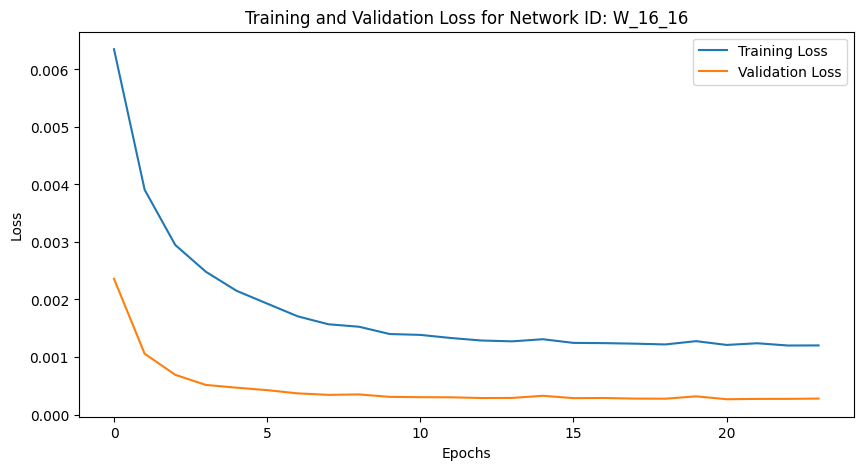

Training Progress:   0%|          | 23/10000 [00:54<6:36:45,  2.39s/epoch, loss=0.0012, val_loss=0.000277, patience=1]


Mean Squared Error: 0.0019557640241548357
Iteration: 316, Window Size: 16, Y Days Ahead: 17
X shape: (3775, 16)
y shape: (3775, 17)
Initializing network with layer sizes: [16, 128, 64, 32, 17]
params_W_16_17.npz not found. Using randomly initialized parameters.
Training data shape: (3020, 16), (3020, 17), Validation data shape: (377, 16), (377, 17), Testing data shape: (378, 16), (378, 17)
Parameters loaded from params_W_16_17.npz


Training Progress:   0%|          | 27/10000 [01:05<6:23:45,  2.31s/epoch, loss=0.00125, val_loss=0.000276, patience=1]

Epoch 28/10000, Training Loss: 0.001254, Validation Loss: 0.000276
Early stopping at epoch 28. Best validation loss: 0.000274


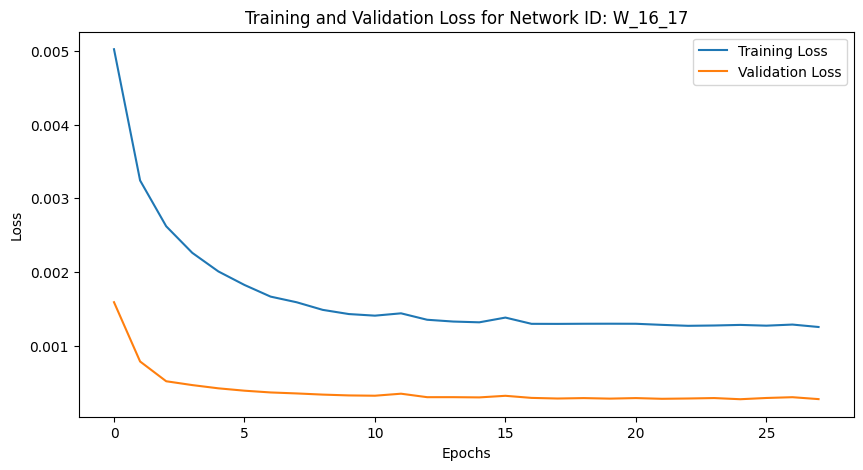

Training Progress:   0%|          | 27/10000 [01:05<6:46:11,  2.44s/epoch, loss=0.00125, val_loss=0.000276, patience=1]


Mean Squared Error: 0.0021038609257383292
Iteration: 317, Window Size: 16, Y Days Ahead: 18
X shape: (3774, 16)
y shape: (3774, 18)
Initializing network with layer sizes: [16, 128, 64, 32, 18]
params_W_16_18.npz not found. Using randomly initialized parameters.
Training data shape: (3019, 16), (3019, 18), Validation data shape: (377, 16), (377, 18), Testing data shape: (378, 16), (378, 18)
Parameters loaded from params_W_16_18.npz


Training Progress:   0%|          | 19/10000 [00:45<6:12:34,  2.24s/epoch, loss=0.00136, val_loss=0.000311, patience=1]

Epoch 20/10000, Training Loss: 0.001357, Validation Loss: 0.000311
Early stopping at epoch 20. Best validation loss: 0.000308


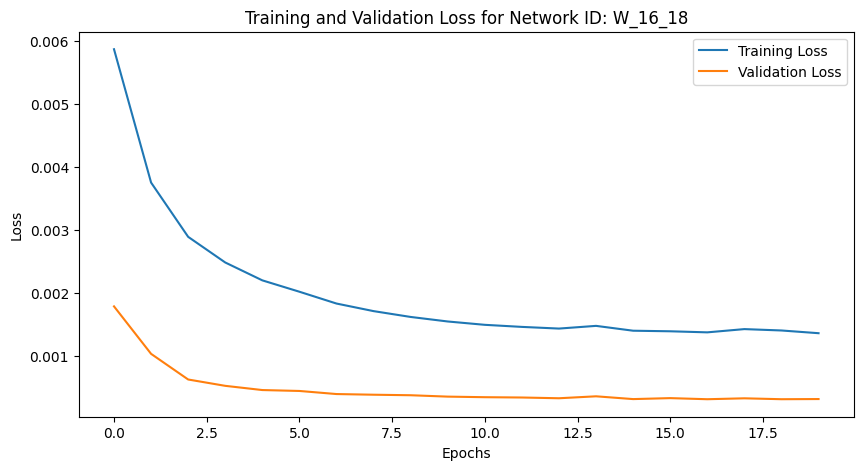

Training Progress:   0%|          | 19/10000 [00:45<6:39:05,  2.40s/epoch, loss=0.00136, val_loss=0.000311, patience=1]


Mean Squared Error: 0.002229812757461742
Iteration: 318, Window Size: 16, Y Days Ahead: 19
X shape: (3773, 16)
y shape: (3773, 19)
Initializing network with layer sizes: [16, 128, 64, 32, 19]
params_W_16_19.npz not found. Using randomly initialized parameters.
Training data shape: (3018, 16), (3018, 19), Validation data shape: (377, 16), (377, 19), Testing data shape: (378, 16), (378, 19)
Parameters loaded from params_W_16_19.npz


Training Progress:   0%|          | 24/10000 [00:57<6:13:19,  2.25s/epoch, loss=0.00139, val_loss=0.000324, patience=1]

Epoch 25/10000, Training Loss: 0.001386, Validation Loss: 0.000324
Early stopping at epoch 25. Best validation loss: 0.000317


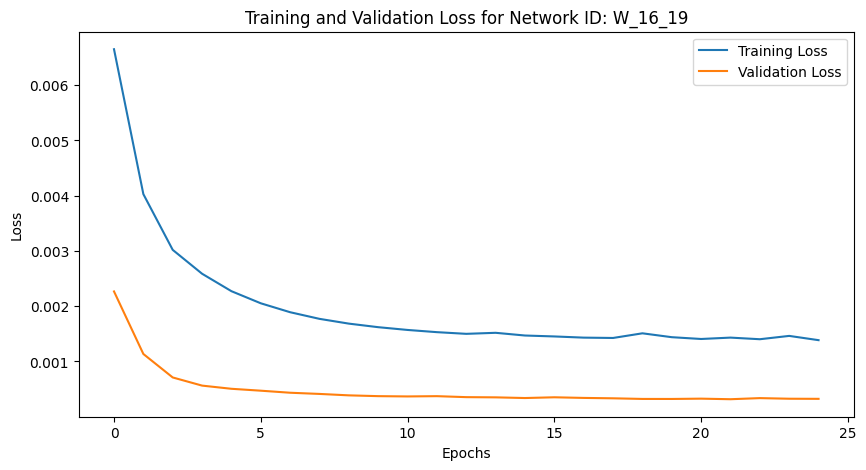

Training Progress:   0%|          | 24/10000 [00:57<6:37:25,  2.39s/epoch, loss=0.00139, val_loss=0.000324, patience=1]


Mean Squared Error: 0.0024170064228625325
Iteration: 319, Window Size: 16, Y Days Ahead: 20
X shape: (3772, 16)
y shape: (3772, 20)
Initializing network with layer sizes: [16, 128, 64, 32, 20]
params_W_16_20.npz not found. Using randomly initialized parameters.
Training data shape: (3017, 16), (3017, 20), Validation data shape: (377, 16), (377, 20), Testing data shape: (378, 16), (378, 20)
Parameters loaded from params_W_16_20.npz


Training Progress:   0%|          | 14/10000 [00:33<6:11:45,  2.23s/epoch, loss=0.00162, val_loss=0.000414, patience=1]

Epoch 15/10000, Training Loss: 0.001615, Validation Loss: 0.000414
Early stopping at epoch 15. Best validation loss: 0.000398


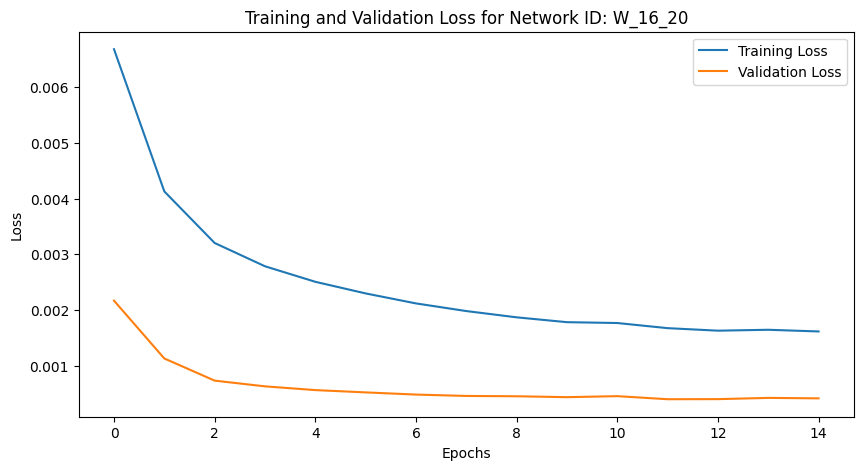

Training Progress:   0%|          | 14/10000 [00:33<6:41:56,  2.42s/epoch, loss=0.00162, val_loss=0.000414, patience=1]


Mean Squared Error: 0.0026793884093059784
Iteration: 320, Window Size: 17, Y Days Ahead: 1
X shape: (3790, 17)
y shape: (3790, 1)
Initializing network with layer sizes: [17, 128, 64, 32, 1]
params_W_17_1.npz not found. Using randomly initialized parameters.
Training data shape: (3032, 17), (3032, 1), Validation data shape: (379, 17), (379, 1), Testing data shape: (379, 17), (379, 1)
Parameters loaded from params_W_17_1.npz


Training Progress:   0%|          | 4/10000 [00:10<6:02:01,  2.17s/epoch, loss=0.000276, val_loss=6.22e-5, patience=1]

Epoch 5/10000, Training Loss: 0.000276, Validation Loss: 0.000062
Early stopping at epoch 5. Best validation loss: 0.000055


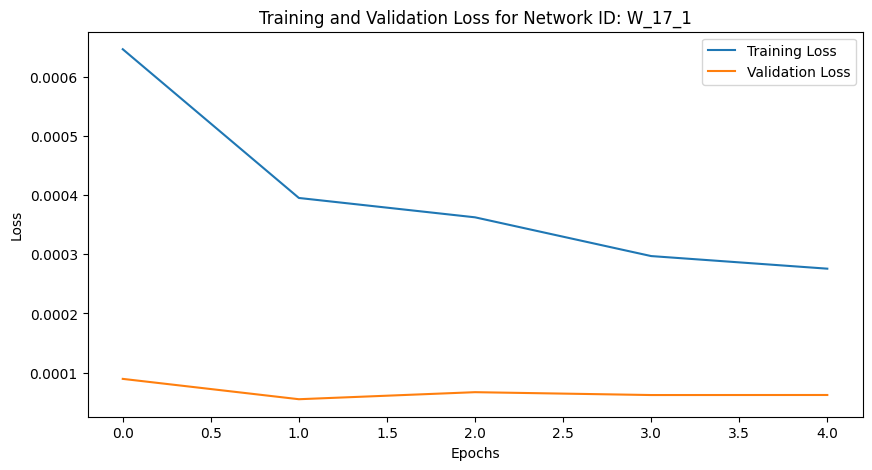

Training Progress:   0%|          | 4/10000 [00:11<7:47:16,  2.80s/epoch, loss=0.000276, val_loss=6.22e-5, patience=1]


Mean Squared Error: 0.0004360956337472856
Iteration: 321, Window Size: 17, Y Days Ahead: 2
X shape: (3789, 17)
y shape: (3789, 2)
Initializing network with layer sizes: [17, 128, 64, 32, 2]
params_W_17_2.npz not found. Using randomly initialized parameters.
Training data shape: (3031, 17), (3031, 2), Validation data shape: (379, 17), (379, 2), Testing data shape: (379, 17), (379, 2)
Parameters loaded from params_W_17_2.npz


Training Progress:   0%|          | 31/10000 [01:11<5:53:08,  2.13s/epoch, loss=0.000255, val_loss=5.17e-5, patience=1]

Epoch 32/10000, Training Loss: 0.000255, Validation Loss: 0.000052
Early stopping at epoch 32. Best validation loss: 0.000044


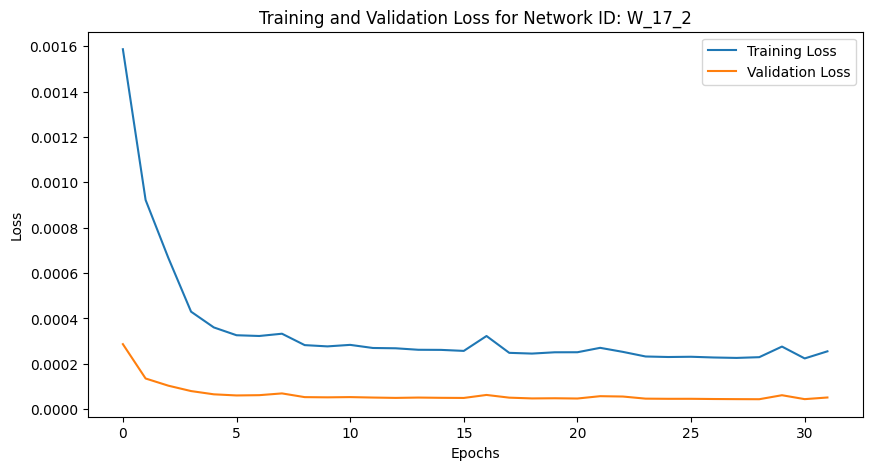

Training Progress:   0%|          | 31/10000 [01:11<6:25:18,  2.32s/epoch, loss=0.000255, val_loss=5.17e-5, patience=1]


Mean Squared Error: 0.0004485785023330642
Iteration: 322, Window Size: 17, Y Days Ahead: 3
X shape: (3788, 17)
y shape: (3788, 3)
Initializing network with layer sizes: [17, 128, 64, 32, 3]
params_W_17_3.npz not found. Using randomly initialized parameters.
Training data shape: (3030, 17), (3030, 3), Validation data shape: (379, 17), (379, 3), Testing data shape: (379, 17), (379, 3)
Parameters loaded from params_W_17_3.npz


Training Progress:   0%|          | 21/10000 [00:49<6:31:48,  2.36s/epoch, loss=0.000421, val_loss=9.8e-5, patience=1]  

Epoch 22/10000, Training Loss: 0.000421, Validation Loss: 0.000098
Early stopping at epoch 22. Best validation loss: 0.000071


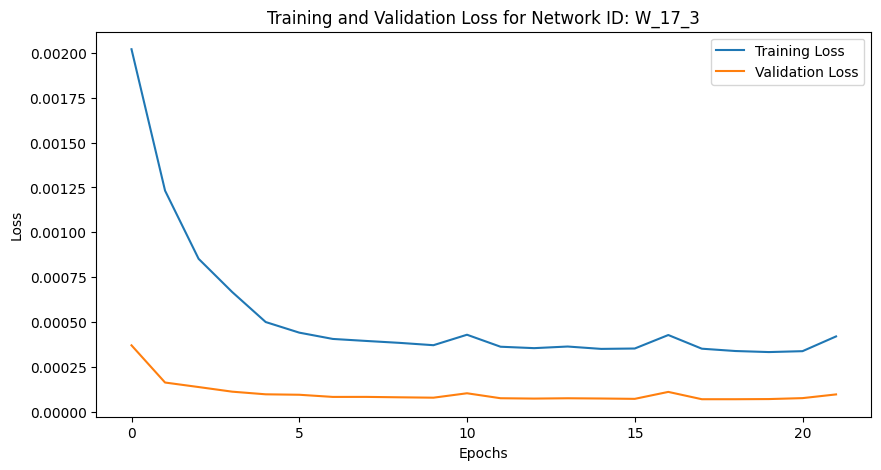

Training Progress:   0%|          | 21/10000 [00:49<6:34:45,  2.37s/epoch, loss=0.000421, val_loss=9.8e-5, patience=1]


Mean Squared Error: 0.0005499996286821348
Iteration: 323, Window Size: 17, Y Days Ahead: 4
X shape: (3787, 17)
y shape: (3787, 4)
Initializing network with layer sizes: [17, 128, 64, 32, 4]
params_W_17_4.npz not found. Using randomly initialized parameters.
Training data shape: (3029, 17), (3029, 4), Validation data shape: (379, 17), (379, 4), Testing data shape: (379, 17), (379, 4)
Parameters loaded from params_W_17_4.npz


Training Progress:   0%|          | 19/10000 [00:46<6:15:36,  2.26s/epoch, loss=0.000398, val_loss=7.85e-5, patience=1] 

Epoch 20/10000, Training Loss: 0.000398, Validation Loss: 0.000078
Early stopping at epoch 20. Best validation loss: 0.000076


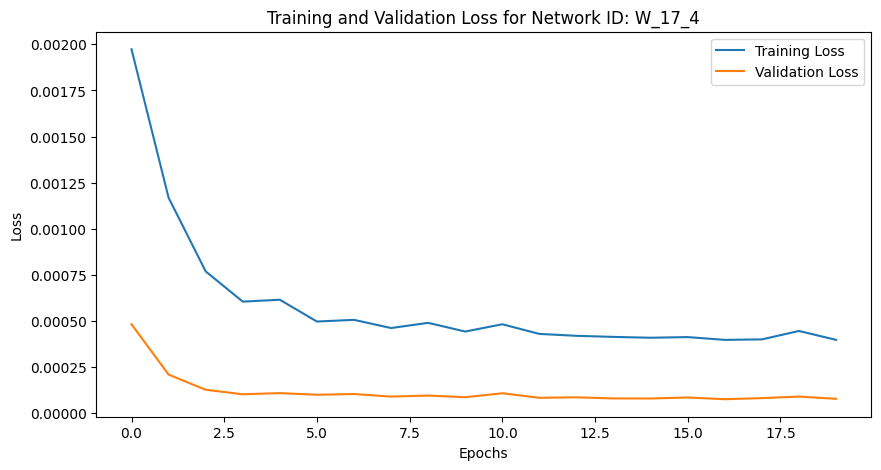

Training Progress:   0%|          | 19/10000 [00:46<6:50:41,  2.47s/epoch, loss=0.000398, val_loss=7.85e-5, patience=1]


Mean Squared Error: 0.0006598661647717369
Iteration: 324, Window Size: 17, Y Days Ahead: 5
X shape: (3786, 17)
y shape: (3786, 5)
Initializing network with layer sizes: [17, 128, 64, 32, 5]
params_W_17_5.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 17), (3028, 5), Validation data shape: (379, 17), (379, 5), Testing data shape: (379, 17), (379, 5)
Parameters loaded from params_W_17_5.npz


Training Progress:   0%|          | 20/10000 [00:47<6:08:37,  2.22s/epoch, loss=0.000449, val_loss=8.82e-5, patience=1] 

Epoch 21/10000, Training Loss: 0.000449, Validation Loss: 0.000088
Early stopping at epoch 21. Best validation loss: 0.000087


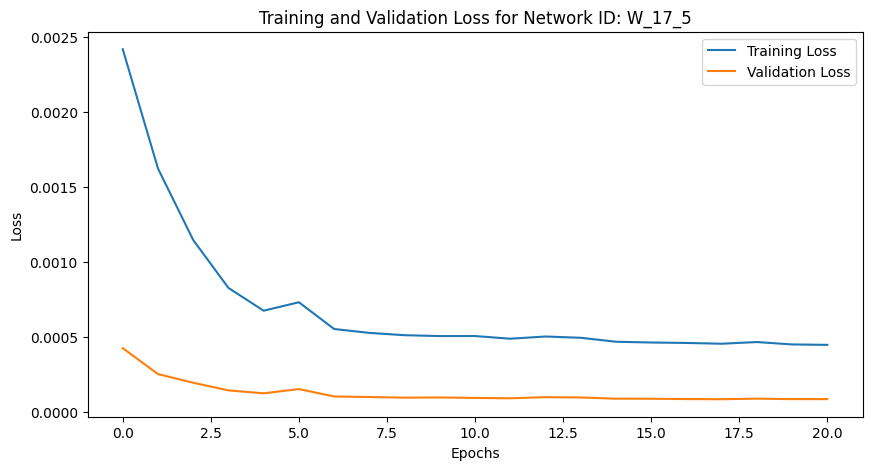

Training Progress:   0%|          | 20/10000 [00:47<6:37:35,  2.39s/epoch, loss=0.000449, val_loss=8.82e-5, patience=1]


Mean Squared Error: 0.0007475705787232162
Iteration: 325, Window Size: 17, Y Days Ahead: 6
X shape: (3785, 17)
y shape: (3785, 6)
Initializing network with layer sizes: [17, 128, 64, 32, 6]
params_W_17_6.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 17), (3028, 6), Validation data shape: (378, 17), (378, 6), Testing data shape: (379, 17), (379, 6)
Parameters loaded from params_W_17_6.npz


Training Progress:   0%|          | 27/10000 [01:04<6:27:03,  2.33s/epoch, loss=0.000538, val_loss=0.000113, patience=1]

Epoch 28/10000, Training Loss: 0.000538, Validation Loss: 0.000113
Early stopping at epoch 28. Best validation loss: 0.000110


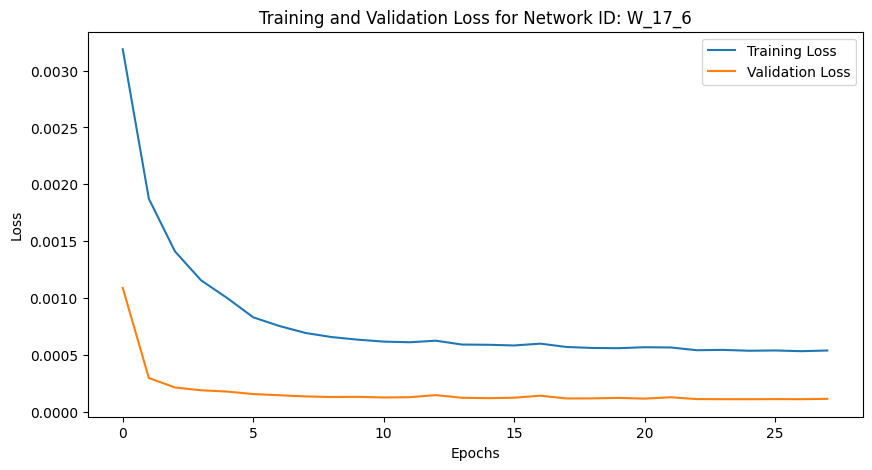

Training Progress:   0%|          | 27/10000 [01:04<6:39:34,  2.40s/epoch, loss=0.000538, val_loss=0.000113, patience=1]


Mean Squared Error: 0.0008688494460982443
Iteration: 326, Window Size: 17, Y Days Ahead: 7
X shape: (3784, 17)
y shape: (3784, 7)
Initializing network with layer sizes: [17, 128, 64, 32, 7]
params_W_17_7.npz not found. Using randomly initialized parameters.
Training data shape: (3027, 17), (3027, 7), Validation data shape: (378, 17), (378, 7), Testing data shape: (379, 17), (379, 7)
Parameters loaded from params_W_17_7.npz


Training Progress:   0%|          | 16/10000 [00:39<6:27:48,  2.33s/epoch, loss=0.000612, val_loss=0.000124, patience=1]

Epoch 17/10000, Training Loss: 0.000612, Validation Loss: 0.000124
Early stopping at epoch 17. Best validation loss: 0.000123


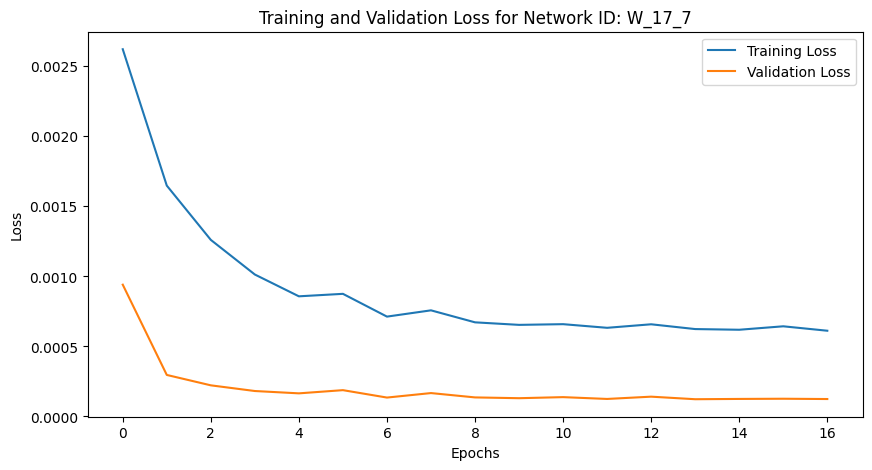

Training Progress:   0%|          | 16/10000 [00:39<6:55:00,  2.49s/epoch, loss=0.000612, val_loss=0.000124, patience=1]


Mean Squared Error: 0.0010183475523264632
Iteration: 327, Window Size: 17, Y Days Ahead: 8
X shape: (3783, 17)
y shape: (3783, 8)
Initializing network with layer sizes: [17, 128, 64, 32, 8]
params_W_17_8.npz not found. Using randomly initialized parameters.
Training data shape: (3026, 17), (3026, 8), Validation data shape: (378, 17), (378, 8), Testing data shape: (379, 17), (379, 8)
Parameters loaded from params_W_17_8.npz


Training Progress:   0%|          | 17/10000 [00:42<6:33:38,  2.37s/epoch, loss=0.000696, val_loss=0.000138, patience=1]

Epoch 18/10000, Training Loss: 0.000696, Validation Loss: 0.000138
Early stopping at epoch 18. Best validation loss: 0.000136


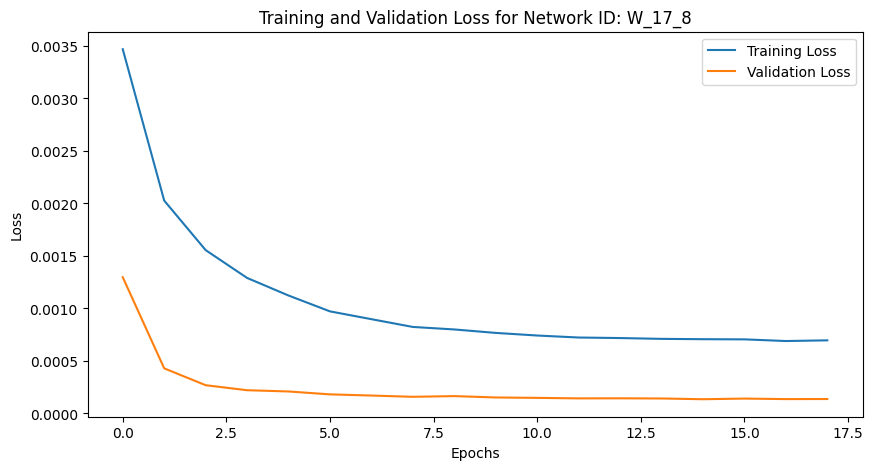

Training Progress:   0%|          | 17/10000 [00:42<7:00:25,  2.53s/epoch, loss=0.000696, val_loss=0.000138, patience=1]


Mean Squared Error: 0.001109620019964863
Iteration: 328, Window Size: 17, Y Days Ahead: 9
X shape: (3782, 17)
y shape: (3782, 9)
Initializing network with layer sizes: [17, 128, 64, 32, 9]
params_W_17_9.npz not found. Using randomly initialized parameters.
Training data shape: (3025, 17), (3025, 9), Validation data shape: (378, 17), (378, 9), Testing data shape: (379, 17), (379, 9)
Parameters loaded from params_W_17_9.npz


Training Progress:   0%|          | 19/10000 [00:47<6:18:29,  2.28s/epoch, loss=0.000766, val_loss=0.000165, patience=1]

Epoch 20/10000, Training Loss: 0.000766, Validation Loss: 0.000165
Early stopping at epoch 20. Best validation loss: 0.000150


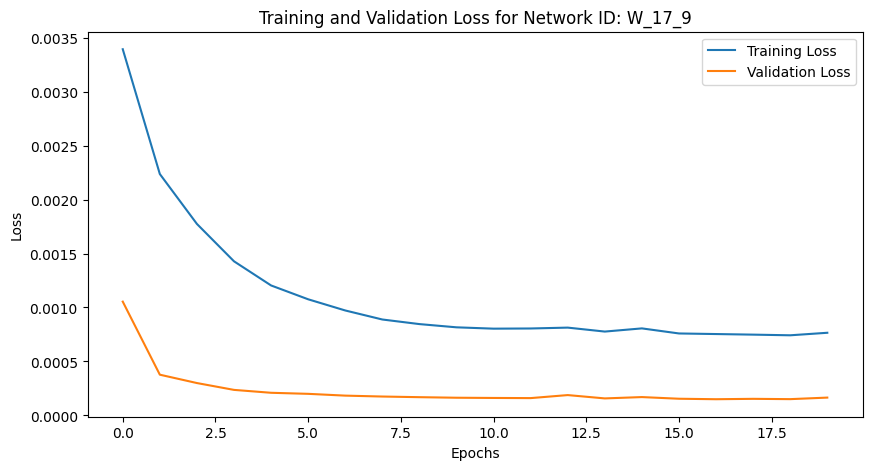

Training Progress:   0%|          | 19/10000 [00:47<6:54:34,  2.49s/epoch, loss=0.000766, val_loss=0.000165, patience=1]


Mean Squared Error: 0.001157588709925778
Iteration: 329, Window Size: 17, Y Days Ahead: 10
X shape: (3781, 17)
y shape: (3781, 10)
Initializing network with layer sizes: [17, 128, 64, 32, 10]
params_W_17_10.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 17), (3024, 10), Validation data shape: (378, 17), (378, 10), Testing data shape: (379, 17), (379, 10)
Parameters loaded from params_W_17_10.npz


Training Progress:   0%|          | 15/10000 [00:36<6:20:56,  2.29s/epoch, loss=0.000863, val_loss=0.000185, patience=1]

Epoch 16/10000, Training Loss: 0.000863, Validation Loss: 0.000185
Early stopping at epoch 16. Best validation loss: 0.000170


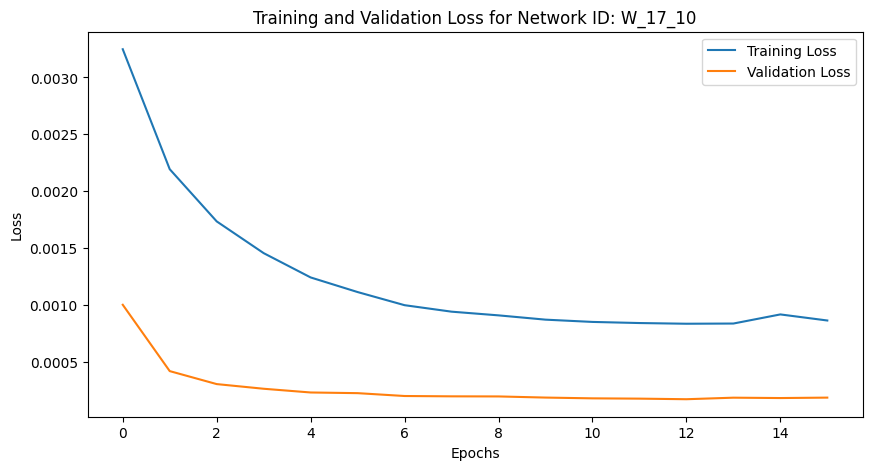

Training Progress:   0%|          | 15/10000 [00:37<6:52:20,  2.48s/epoch, loss=0.000863, val_loss=0.000185, patience=1]


Mean Squared Error: 0.0013245836944231527
Iteration: 330, Window Size: 17, Y Days Ahead: 11
X shape: (3780, 17)
y shape: (3780, 11)
Initializing network with layer sizes: [17, 128, 64, 32, 11]
params_W_17_11.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 17), (3024, 11), Validation data shape: (378, 17), (378, 11), Testing data shape: (378, 17), (378, 11)
Parameters loaded from params_W_17_11.npz


Training Progress:   0%|          | 15/10000 [00:38<6:40:56,  2.41s/epoch, loss=0.00088, val_loss=0.000185, patience=1] 

Epoch 16/10000, Training Loss: 0.000880, Validation Loss: 0.000185
Early stopping at epoch 16. Best validation loss: 0.000184


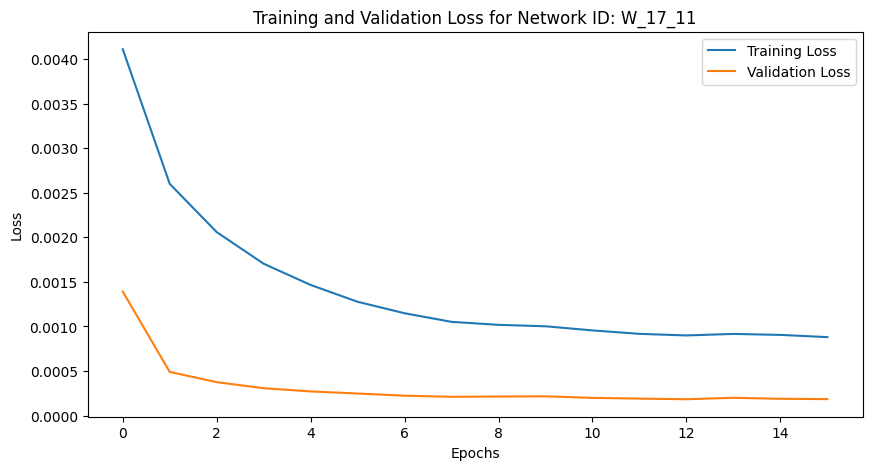

Training Progress:   0%|          | 15/10000 [00:38<7:06:16,  2.56s/epoch, loss=0.00088, val_loss=0.000185, patience=1]


Mean Squared Error: 0.0013886796854988453
Iteration: 331, Window Size: 17, Y Days Ahead: 12
X shape: (3779, 17)
y shape: (3779, 12)
Initializing network with layer sizes: [17, 128, 64, 32, 12]
params_W_17_12.npz not found. Using randomly initialized parameters.
Training data shape: (3023, 17), (3023, 12), Validation data shape: (378, 17), (378, 12), Testing data shape: (378, 17), (378, 12)
Parameters loaded from params_W_17_12.npz


Training Progress:   0%|          | 22/10000 [00:52<6:18:45,  2.28s/epoch, loss=0.000943, val_loss=0.000206, patience=1]

Epoch 23/10000, Training Loss: 0.000943, Validation Loss: 0.000206
Early stopping at epoch 23. Best validation loss: 0.000197


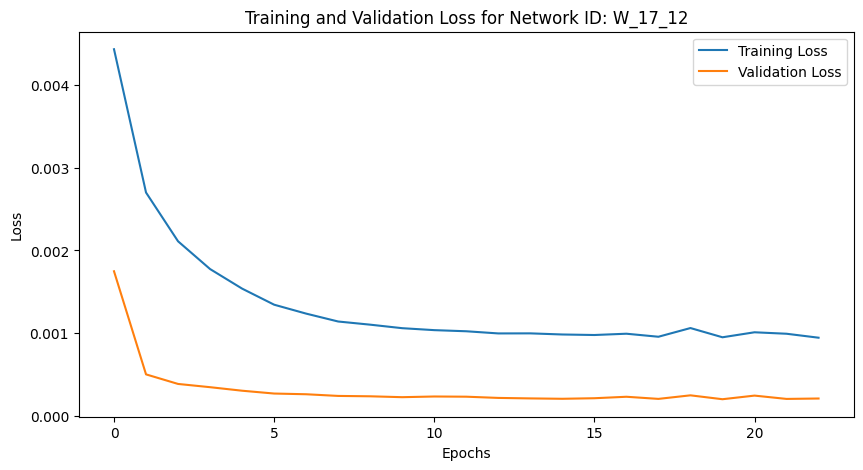

Training Progress:   0%|          | 22/10000 [00:53<6:42:18,  2.42s/epoch, loss=0.000943, val_loss=0.000206, patience=1]


Mean Squared Error: 0.0015168455229202828
Iteration: 332, Window Size: 17, Y Days Ahead: 13
X shape: (3778, 17)
y shape: (3778, 13)
Initializing network with layer sizes: [17, 128, 64, 32, 13]
params_W_17_13.npz not found. Using randomly initialized parameters.
Training data shape: (3022, 17), (3022, 13), Validation data shape: (378, 17), (378, 13), Testing data shape: (378, 17), (378, 13)
Parameters loaded from params_W_17_13.npz


Training Progress:   0%|          | 21/10000 [00:52<6:57:33,  2.51s/epoch, loss=0.000995, val_loss=0.000225, patience=1]

Epoch 22/10000, Training Loss: 0.000995, Validation Loss: 0.000225
Early stopping at epoch 22. Best validation loss: 0.000217


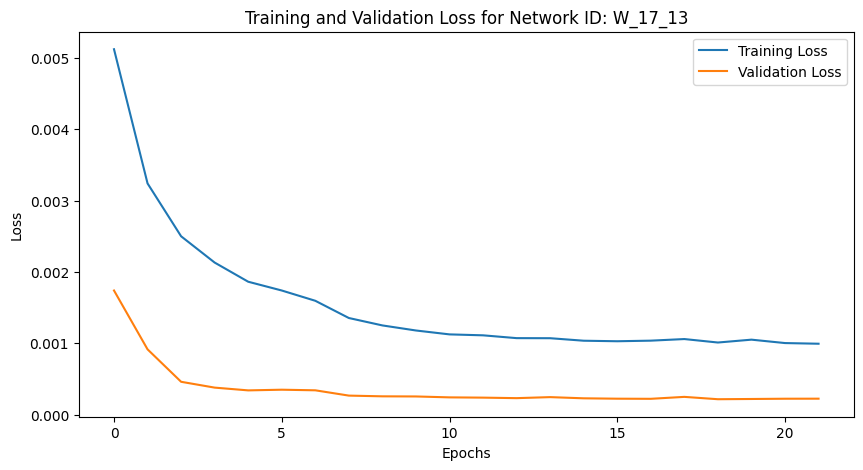

Training Progress:   0%|          | 21/10000 [00:53<7:00:10,  2.53s/epoch, loss=0.000995, val_loss=0.000225, patience=1]


Mean Squared Error: 0.0015814056724508818
Iteration: 333, Window Size: 17, Y Days Ahead: 14
X shape: (3777, 17)
y shape: (3777, 14)
Initializing network with layer sizes: [17, 128, 64, 32, 14]
params_W_17_14.npz not found. Using randomly initialized parameters.
Training data shape: (3021, 17), (3021, 14), Validation data shape: (378, 17), (378, 14), Testing data shape: (378, 17), (378, 14)
Parameters loaded from params_W_17_14.npz


Training Progress:   0%|          | 24/10000 [00:58<6:15:08,  2.26s/epoch, loss=0.00106, val_loss=0.000231, patience=1]

Epoch 25/10000, Training Loss: 0.001060, Validation Loss: 0.000231
Early stopping at epoch 25. Best validation loss: 0.000228


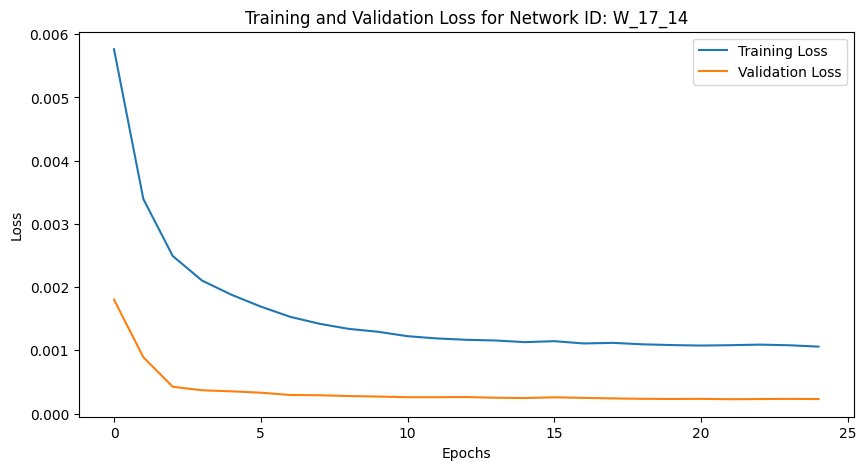

Training Progress:   0%|          | 24/10000 [00:59<6:48:45,  2.46s/epoch, loss=0.00106, val_loss=0.000231, patience=1]


Mean Squared Error: 0.0016870556498071651
Iteration: 334, Window Size: 17, Y Days Ahead: 15
X shape: (3776, 17)
y shape: (3776, 15)
Initializing network with layer sizes: [17, 128, 64, 32, 15]
params_W_17_15.npz not found. Using randomly initialized parameters.
Training data shape: (3020, 17), (3020, 15), Validation data shape: (378, 17), (378, 15), Testing data shape: (378, 17), (378, 15)
Parameters loaded from params_W_17_15.npz


Training Progress:   0%|          | 20/10000 [00:47<6:28:03,  2.33s/epoch, loss=0.00114, val_loss=0.000265, patience=1]

Epoch 21/10000, Training Loss: 0.001143, Validation Loss: 0.000265
Early stopping at epoch 21. Best validation loss: 0.000256


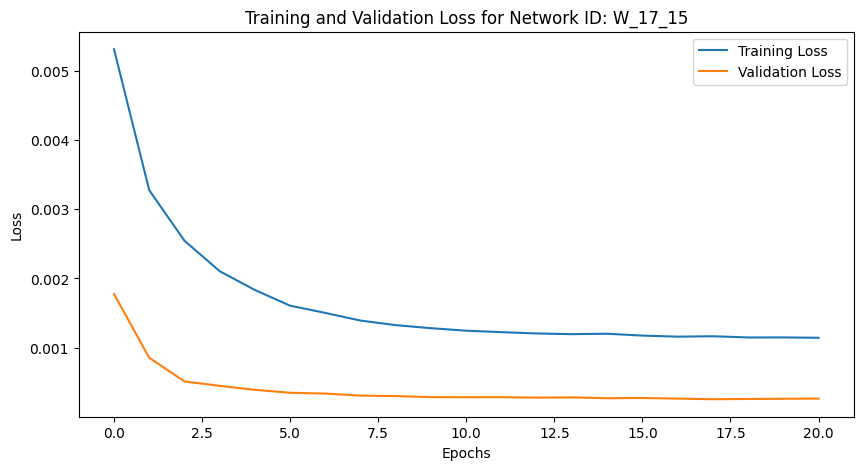

Training Progress:   0%|          | 20/10000 [00:47<6:37:12,  2.39s/epoch, loss=0.00114, val_loss=0.000265, patience=1]


Mean Squared Error: 0.0018530229442232204
Iteration: 335, Window Size: 17, Y Days Ahead: 16
X shape: (3775, 17)
y shape: (3775, 16)
Initializing network with layer sizes: [17, 128, 64, 32, 16]
params_W_17_16.npz not found. Using randomly initialized parameters.
Training data shape: (3020, 17), (3020, 16), Validation data shape: (377, 17), (377, 16), Testing data shape: (378, 17), (378, 16)
Parameters loaded from params_W_17_16.npz


Training Progress:   0%|          | 21/10000 [00:49<6:11:21,  2.23s/epoch, loss=0.00119, val_loss=0.000268, patience=1]

Epoch 22/10000, Training Loss: 0.001194, Validation Loss: 0.000268
Early stopping at epoch 22. Best validation loss: 0.000261


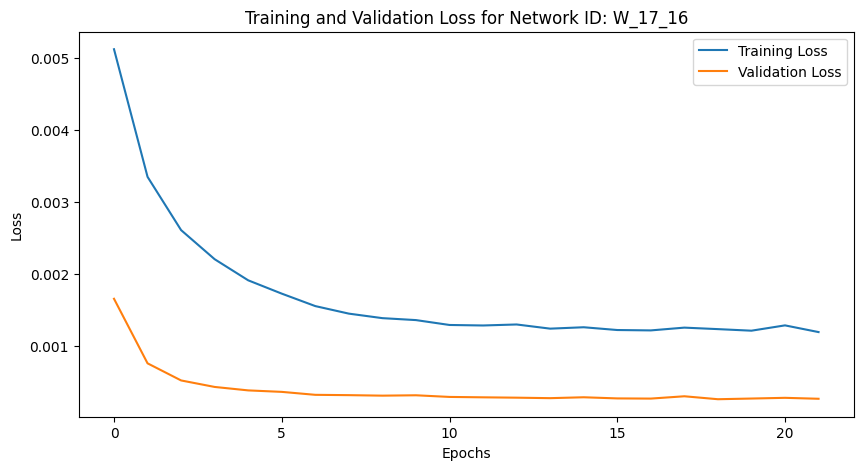

Training Progress:   0%|          | 21/10000 [00:50<6:36:54,  2.39s/epoch, loss=0.00119, val_loss=0.000268, patience=1]


Mean Squared Error: 0.001993909981269669
Iteration: 336, Window Size: 17, Y Days Ahead: 17
X shape: (3774, 17)
y shape: (3774, 17)
Initializing network with layer sizes: [17, 128, 64, 32, 17]
params_W_17_17.npz not found. Using randomly initialized parameters.
Training data shape: (3019, 17), (3019, 17), Validation data shape: (377, 17), (377, 17), Testing data shape: (378, 17), (378, 17)
Parameters loaded from params_W_17_17.npz


Training Progress:   0%|          | 16/10000 [00:38<6:41:10,  2.41s/epoch, loss=0.00128, val_loss=0.000301, patience=1]

Epoch 17/10000, Training Loss: 0.001283, Validation Loss: 0.000301
Early stopping at epoch 17. Best validation loss: 0.000298


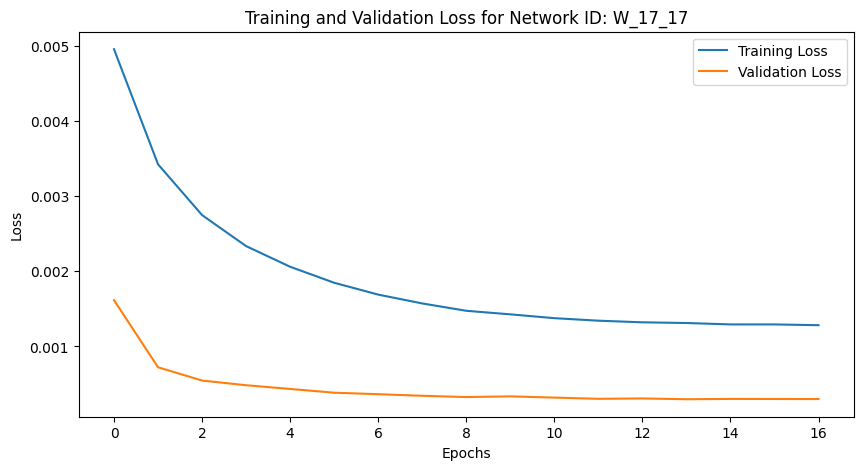

Training Progress:   0%|          | 16/10000 [00:39<6:49:11,  2.46s/epoch, loss=0.00128, val_loss=0.000301, patience=1]


Mean Squared Error: 0.002064201574167245
Iteration: 337, Window Size: 17, Y Days Ahead: 18
X shape: (3773, 17)
y shape: (3773, 18)
Initializing network with layer sizes: [17, 128, 64, 32, 18]
params_W_17_18.npz not found. Using randomly initialized parameters.
Training data shape: (3018, 17), (3018, 18), Validation data shape: (377, 17), (377, 18), Testing data shape: (378, 17), (378, 18)
Parameters loaded from params_W_17_18.npz


Training Progress:   0%|          | 37/10000 [01:29<6:37:35,  2.39s/epoch, loss=0.00135, val_loss=0.000296, patience=1]

Epoch 38/10000, Training Loss: 0.001351, Validation Loss: 0.000296
Early stopping at epoch 38. Best validation loss: 0.000295


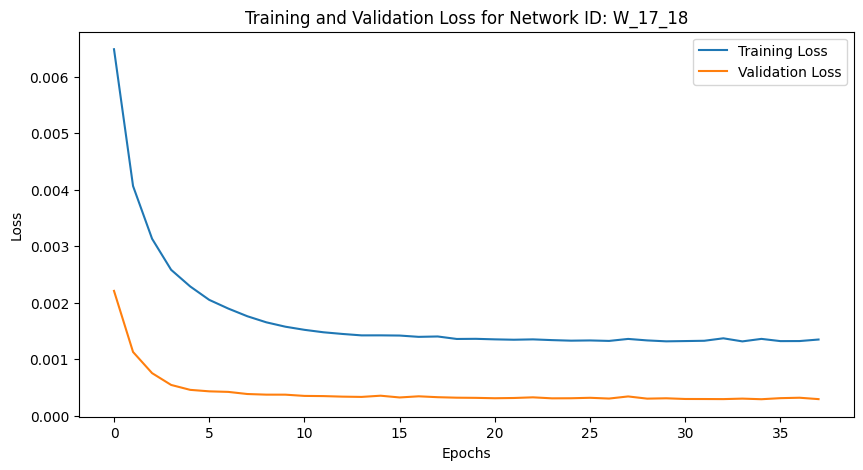

Training Progress:   0%|          | 37/10000 [01:29<6:41:25,  2.42s/epoch, loss=0.00135, val_loss=0.000296, patience=1]


Mean Squared Error: 0.002270638062147897
Iteration: 338, Window Size: 17, Y Days Ahead: 19
X shape: (3772, 17)
y shape: (3772, 19)
Initializing network with layer sizes: [17, 128, 64, 32, 19]
params_W_17_19.npz not found. Using randomly initialized parameters.
Training data shape: (3017, 17), (3017, 19), Validation data shape: (377, 17), (377, 19), Testing data shape: (378, 17), (378, 19)
Parameters loaded from params_W_17_19.npz


Training Progress:   0%|          | 21/10000 [00:51<6:28:50,  2.34s/epoch, loss=0.00142, val_loss=0.000325, patience=1]

Epoch 22/10000, Training Loss: 0.001420, Validation Loss: 0.000325
Early stopping at epoch 22. Best validation loss: 0.000325


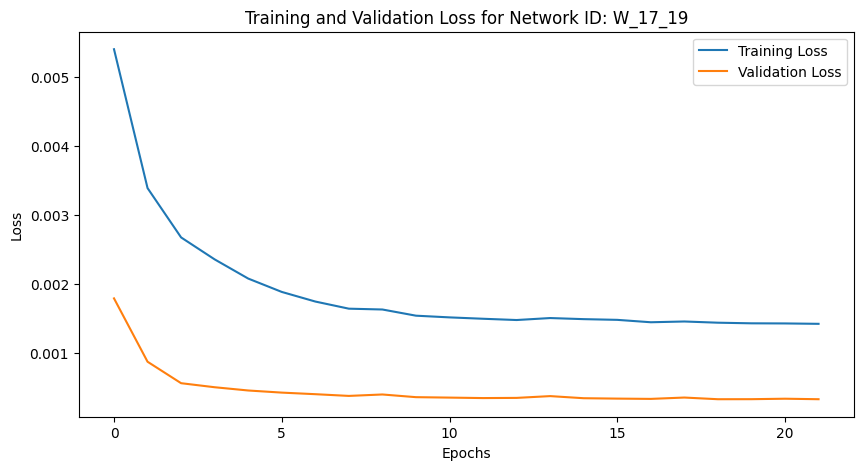

Training Progress:   0%|          | 21/10000 [00:51<6:50:48,  2.47s/epoch, loss=0.00142, val_loss=0.000325, patience=1]


Mean Squared Error: 0.0023865510113006416
Iteration: 339, Window Size: 17, Y Days Ahead: 20
X shape: (3771, 17)
y shape: (3771, 20)
Initializing network with layer sizes: [17, 128, 64, 32, 20]
params_W_17_20.npz not found. Using randomly initialized parameters.
Training data shape: (3016, 17), (3016, 20), Validation data shape: (377, 17), (377, 20), Testing data shape: (378, 17), (378, 20)
Parameters loaded from params_W_17_20.npz


Training Progress:   0%|          | 25/10000 [01:02<6:38:35,  2.40s/epoch, loss=0.00153, val_loss=0.000387, patience=1]

Epoch 26/10000, Training Loss: 0.001533, Validation Loss: 0.000387
Early stopping at epoch 26. Best validation loss: 0.000334


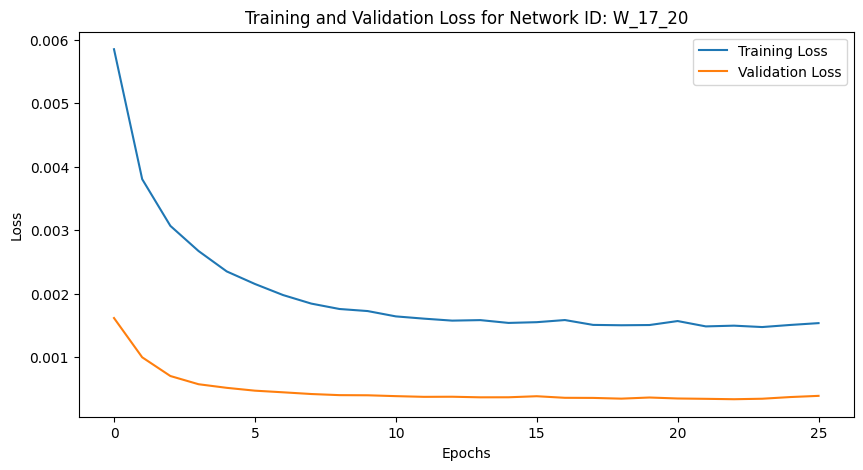

Training Progress:   0%|          | 25/10000 [01:03<7:01:01,  2.53s/epoch, loss=0.00153, val_loss=0.000387, patience=1]


Mean Squared Error: 0.0025153272093276155
Iteration: 340, Window Size: 18, Y Days Ahead: 1
X shape: (3789, 18)
y shape: (3789, 1)
Initializing network with layer sizes: [18, 128, 64, 32, 1]
params_W_18_1.npz not found. Using randomly initialized parameters.
Training data shape: (3031, 18), (3031, 1), Validation data shape: (379, 18), (379, 1), Testing data shape: (379, 18), (379, 1)
Parameters loaded from params_W_18_1.npz


Training Progress:   0%|          | 12/10000 [00:30<6:27:16,  2.33s/epoch, loss=0.000294, val_loss=6.8e-5, patience=1] 

Epoch 13/10000, Training Loss: 0.000294, Validation Loss: 0.000068
Early stopping at epoch 13. Best validation loss: 0.000035


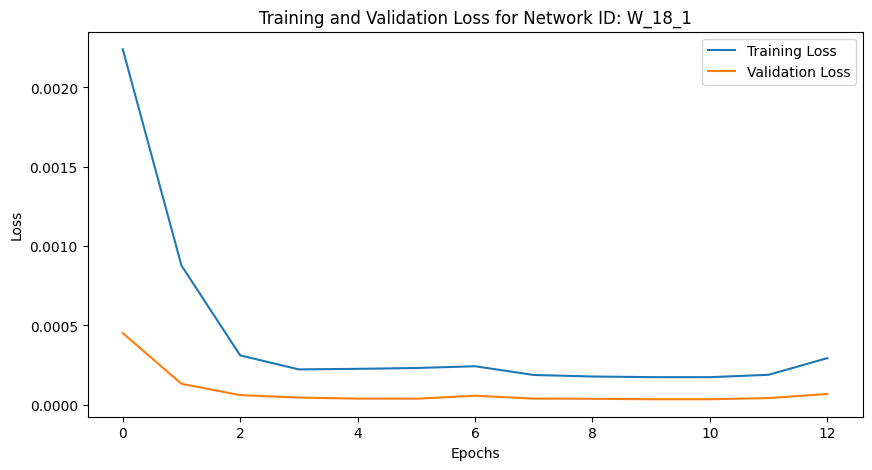

Training Progress:   0%|          | 12/10000 [00:30<7:08:44,  2.58s/epoch, loss=0.000294, val_loss=6.8e-5, patience=1]


Mean Squared Error: 0.0003481167592483061
Iteration: 341, Window Size: 18, Y Days Ahead: 2
X shape: (3788, 18)
y shape: (3788, 2)
Initializing network with layer sizes: [18, 128, 64, 32, 2]
params_W_18_2.npz not found. Using randomly initialized parameters.
Training data shape: (3030, 18), (3030, 2), Validation data shape: (379, 18), (379, 2), Testing data shape: (379, 18), (379, 2)
Parameters loaded from params_W_18_2.npz


Training Progress:   0%|          | 14/10000 [00:34<6:40:51,  2.41s/epoch, loss=0.000252, val_loss=5.82e-5, patience=1]

Epoch 15/10000, Training Loss: 0.000252, Validation Loss: 0.000058
Early stopping at epoch 15. Best validation loss: 0.000052


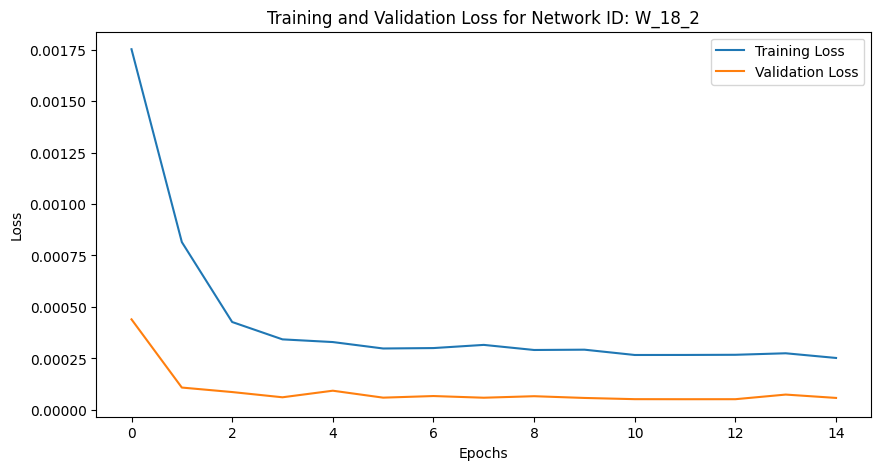

Training Progress:   0%|          | 14/10000 [00:34<6:53:55,  2.49s/epoch, loss=0.000252, val_loss=5.82e-5, patience=1]


Mean Squared Error: 0.0004807229043287966
Iteration: 342, Window Size: 18, Y Days Ahead: 3
X shape: (3787, 18)
y shape: (3787, 3)
Initializing network with layer sizes: [18, 128, 64, 32, 3]
params_W_18_3.npz not found. Using randomly initialized parameters.
Training data shape: (3029, 18), (3029, 3), Validation data shape: (379, 18), (379, 3), Testing data shape: (379, 18), (379, 3)
Parameters loaded from params_W_18_3.npz


Training Progress:   0%|          | 14/10000 [00:36<6:40:28,  2.41s/epoch, loss=0.000347, val_loss=6.73e-5, patience=1]

Epoch 15/10000, Training Loss: 0.000347, Validation Loss: 0.000067
Early stopping at epoch 15. Best validation loss: 0.000066


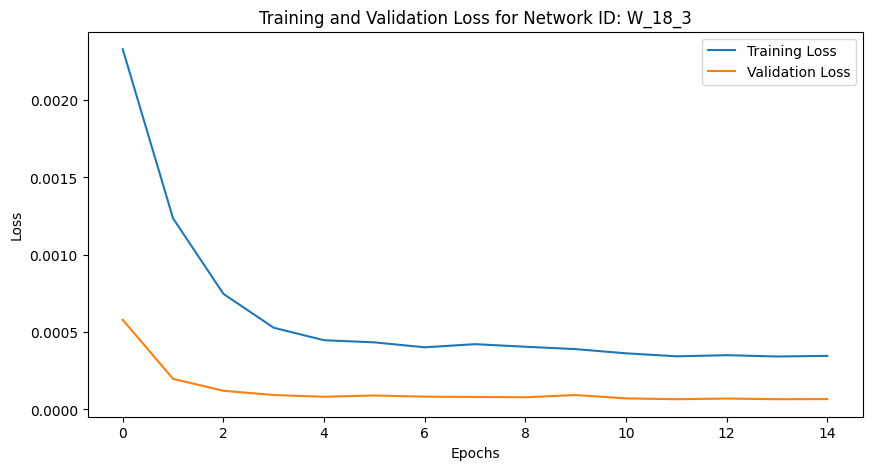

Training Progress:   0%|          | 14/10000 [00:36<7:13:03,  2.60s/epoch, loss=0.000347, val_loss=6.73e-5, patience=1]


Mean Squared Error: 0.0005801879692180113
Iteration: 343, Window Size: 18, Y Days Ahead: 4
X shape: (3786, 18)
y shape: (3786, 4)
Initializing network with layer sizes: [18, 128, 64, 32, 4]
params_W_18_4.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 18), (3028, 4), Validation data shape: (379, 18), (379, 4), Testing data shape: (379, 18), (379, 4)
Parameters loaded from params_W_18_4.npz


Training Progress:   0%|          | 22/10000 [00:53<5:59:51,  2.16s/epoch, loss=0.000384, val_loss=7.88e-5, patience=1] 

Epoch 23/10000, Training Loss: 0.000384, Validation Loss: 0.000079
Early stopping at epoch 23. Best validation loss: 0.000078


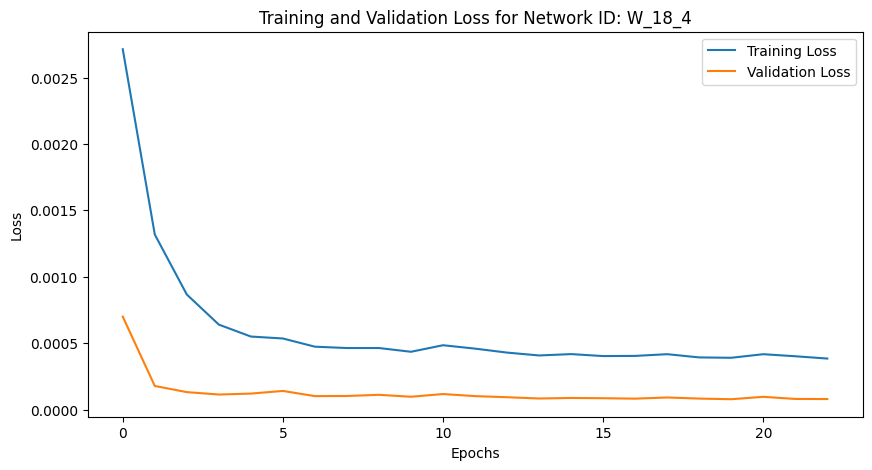

Training Progress:   0%|          | 22/10000 [00:53<6:44:59,  2.44s/epoch, loss=0.000384, val_loss=7.88e-5, patience=1]


Mean Squared Error: 0.000648940737524791
Iteration: 344, Window Size: 18, Y Days Ahead: 5
X shape: (3785, 18)
y shape: (3785, 5)
Initializing network with layer sizes: [18, 128, 64, 32, 5]
params_W_18_5.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 18), (3028, 5), Validation data shape: (378, 18), (378, 5), Testing data shape: (379, 18), (379, 5)
Parameters loaded from params_W_18_5.npz


Training Progress:   0%|          | 24/10000 [00:56<6:21:17,  2.29s/epoch, loss=0.000457, val_loss=9.34e-5, patience=1] 

Epoch 25/10000, Training Loss: 0.000457, Validation Loss: 0.000093
Early stopping at epoch 25. Best validation loss: 0.000093


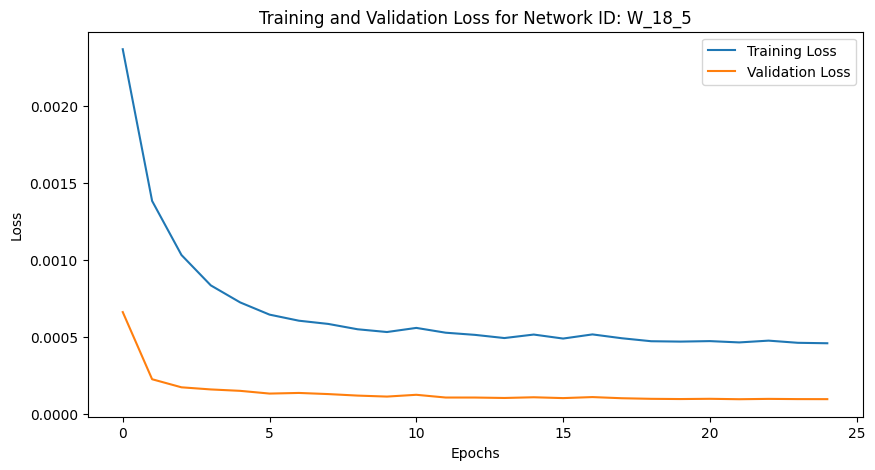

Training Progress:   0%|          | 24/10000 [00:56<6:32:07,  2.36s/epoch, loss=0.000457, val_loss=9.34e-5, patience=1]


Mean Squared Error: 0.000747274218419913
Iteration: 345, Window Size: 18, Y Days Ahead: 6
X shape: (3784, 18)
y shape: (3784, 6)
Initializing network with layer sizes: [18, 128, 64, 32, 6]
params_W_18_6.npz not found. Using randomly initialized parameters.
Training data shape: (3027, 18), (3027, 6), Validation data shape: (378, 18), (378, 6), Testing data shape: (379, 18), (379, 6)
Parameters loaded from params_W_18_6.npz


Training Progress:   0%|          | 19/10000 [00:46<6:37:19,  2.39s/epoch, loss=0.000528, val_loss=0.000111, patience=1]

Epoch 20/10000, Training Loss: 0.000528, Validation Loss: 0.000111
Early stopping at epoch 20. Best validation loss: 0.000106


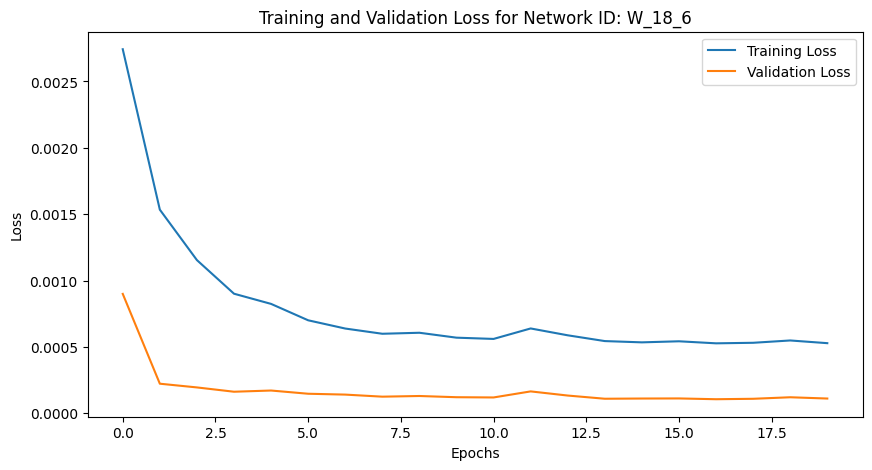

Training Progress:   0%|          | 19/10000 [00:46<6:47:22,  2.45s/epoch, loss=0.000528, val_loss=0.000111, patience=1]


Mean Squared Error: 0.000870676775029465
Iteration: 346, Window Size: 18, Y Days Ahead: 7
X shape: (3783, 18)
y shape: (3783, 7)
Initializing network with layer sizes: [18, 128, 64, 32, 7]
params_W_18_7.npz not found. Using randomly initialized parameters.
Training data shape: (3026, 18), (3026, 7), Validation data shape: (378, 18), (378, 7), Testing data shape: (379, 18), (379, 7)
Parameters loaded from params_W_18_7.npz


Training Progress:   0%|          | 18/10000 [00:44<6:19:48,  2.28s/epoch, loss=0.000786, val_loss=0.000189, patience=1]

Epoch 19/10000, Training Loss: 0.000786, Validation Loss: 0.000189
Early stopping at epoch 19. Best validation loss: 0.000135


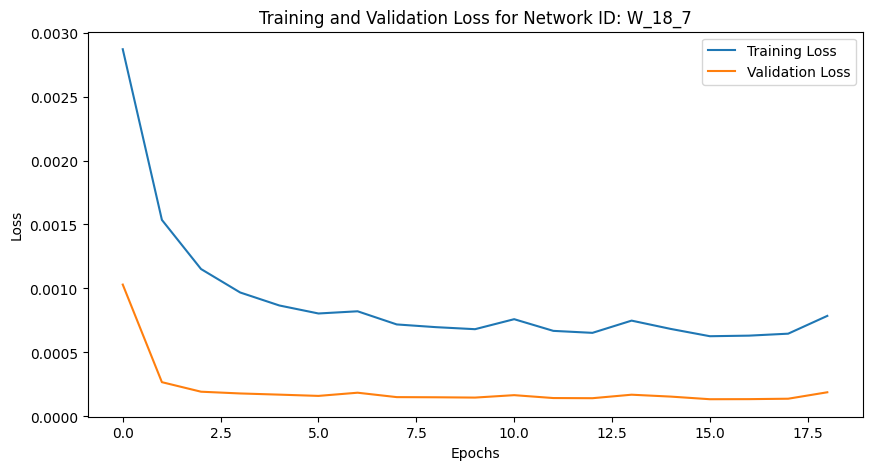

Training Progress:   0%|          | 18/10000 [00:44<6:55:09,  2.50s/epoch, loss=0.000786, val_loss=0.000189, patience=1]


Mean Squared Error: 0.0009385750461685842
Iteration: 347, Window Size: 18, Y Days Ahead: 8
X shape: (3782, 18)
y shape: (3782, 8)
Initializing network with layer sizes: [18, 128, 64, 32, 8]
params_W_18_8.npz not found. Using randomly initialized parameters.
Training data shape: (3025, 18), (3025, 8), Validation data shape: (378, 18), (378, 8), Testing data shape: (379, 18), (379, 8)
Parameters loaded from params_W_18_8.npz


Training Progress:   0%|          | 23/10000 [00:55<6:30:12,  2.35s/epoch, loss=0.000663, val_loss=0.000136, patience=1]

Epoch 24/10000, Training Loss: 0.000663, Validation Loss: 0.000136
Early stopping at epoch 24. Best validation loss: 0.000136


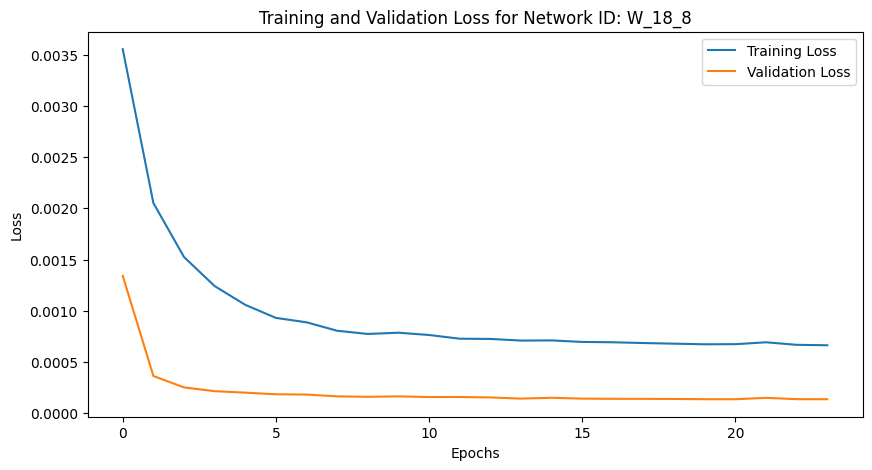

Training Progress:   0%|          | 23/10000 [00:56<6:46:17,  2.44s/epoch, loss=0.000663, val_loss=0.000136, patience=1]


Mean Squared Error: 0.0010227403464902053
Iteration: 348, Window Size: 18, Y Days Ahead: 9
X shape: (3781, 18)
y shape: (3781, 9)
Initializing network with layer sizes: [18, 128, 64, 32, 9]
params_W_18_9.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 18), (3024, 9), Validation data shape: (378, 18), (378, 9), Testing data shape: (379, 18), (379, 9)
Parameters loaded from params_W_18_9.npz


Training Progress:   0%|          | 22/10000 [00:55<6:46:14,  2.44s/epoch, loss=0.000721, val_loss=0.000151, patience=1]

Epoch 23/10000, Training Loss: 0.000721, Validation Loss: 0.000151
Early stopping at epoch 23. Best validation loss: 0.000147


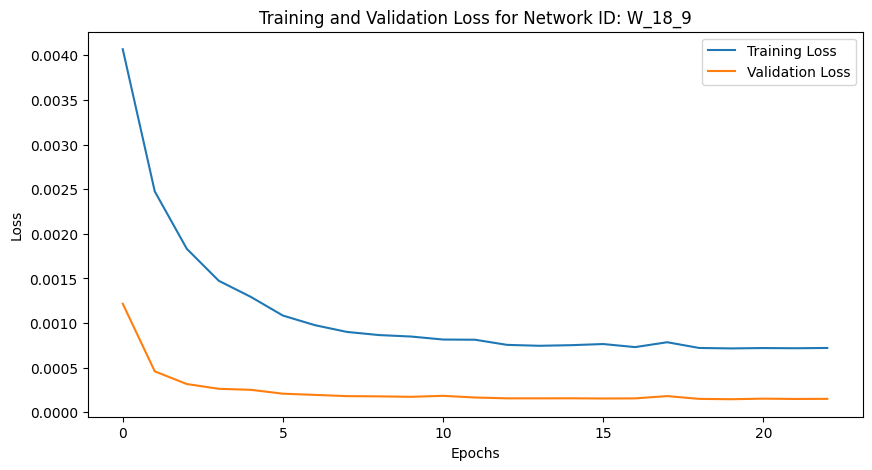

Training Progress:   0%|          | 22/10000 [00:55<6:58:34,  2.52s/epoch, loss=0.000721, val_loss=0.000151, patience=1]


Mean Squared Error: 0.0010919296504742365
Iteration: 349, Window Size: 18, Y Days Ahead: 10
X shape: (3780, 18)
y shape: (3780, 10)
Initializing network with layer sizes: [18, 128, 64, 32, 10]
params_W_18_10.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 18), (3024, 10), Validation data shape: (378, 18), (378, 10), Testing data shape: (378, 18), (378, 10)
Parameters loaded from params_W_18_10.npz


Training Progress:   0%|          | 23/10000 [00:55<6:21:10,  2.29s/epoch, loss=0.000828, val_loss=0.000182, patience=1]

Epoch 24/10000, Training Loss: 0.000828, Validation Loss: 0.000182
Early stopping at epoch 24. Best validation loss: 0.000164


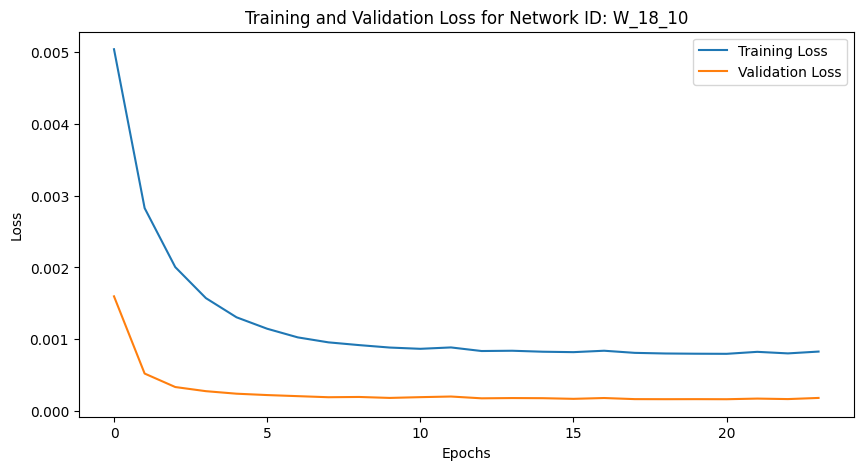

Training Progress:   0%|          | 23/10000 [00:56<6:45:51,  2.44s/epoch, loss=0.000828, val_loss=0.000182, patience=1]


Mean Squared Error: 0.001219228745215135
Iteration: 350, Window Size: 18, Y Days Ahead: 11
X shape: (3779, 18)
y shape: (3779, 11)
Initializing network with layer sizes: [18, 128, 64, 32, 11]
params_W_18_11.npz not found. Using randomly initialized parameters.
Training data shape: (3023, 18), (3023, 11), Validation data shape: (378, 18), (378, 11), Testing data shape: (378, 18), (378, 11)
Parameters loaded from params_W_18_11.npz


Training Progress:   0%|          | 25/10000 [01:02<6:46:13,  2.44s/epoch, loss=0.000859, val_loss=0.00018, patience=1] 

Epoch 26/10000, Training Loss: 0.000859, Validation Loss: 0.000180
Early stopping at epoch 26. Best validation loss: 0.000174


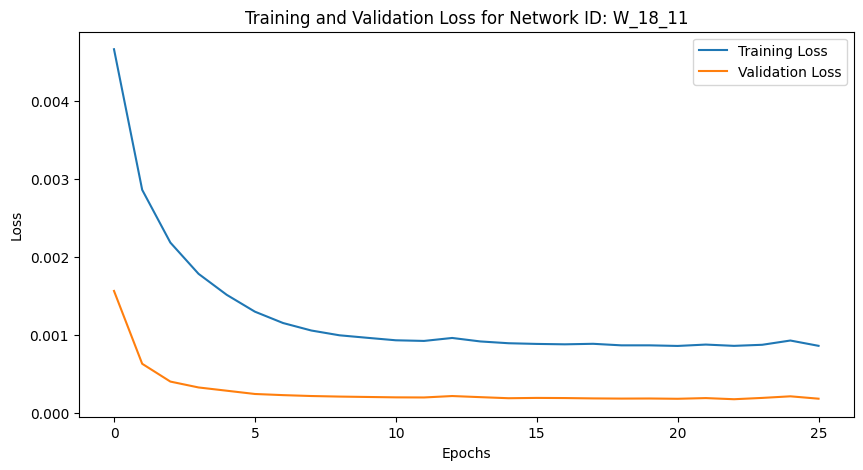

Training Progress:   0%|          | 25/10000 [01:03<7:00:08,  2.53s/epoch, loss=0.000859, val_loss=0.00018, patience=1]


Mean Squared Error: 0.0013739545249411187
Iteration: 351, Window Size: 18, Y Days Ahead: 12
X shape: (3778, 18)
y shape: (3778, 12)
Initializing network with layer sizes: [18, 128, 64, 32, 12]
params_W_18_12.npz not found. Using randomly initialized parameters.
Training data shape: (3022, 18), (3022, 12), Validation data shape: (378, 18), (378, 12), Testing data shape: (378, 18), (378, 12)
Parameters loaded from params_W_18_12.npz


Training Progress:   0%|          | 15/10000 [00:37<6:22:38,  2.30s/epoch, loss=0.00098, val_loss=0.00022, patience=1]  

Epoch 16/10000, Training Loss: 0.000980, Validation Loss: 0.000220
Early stopping at epoch 16. Best validation loss: 0.000204


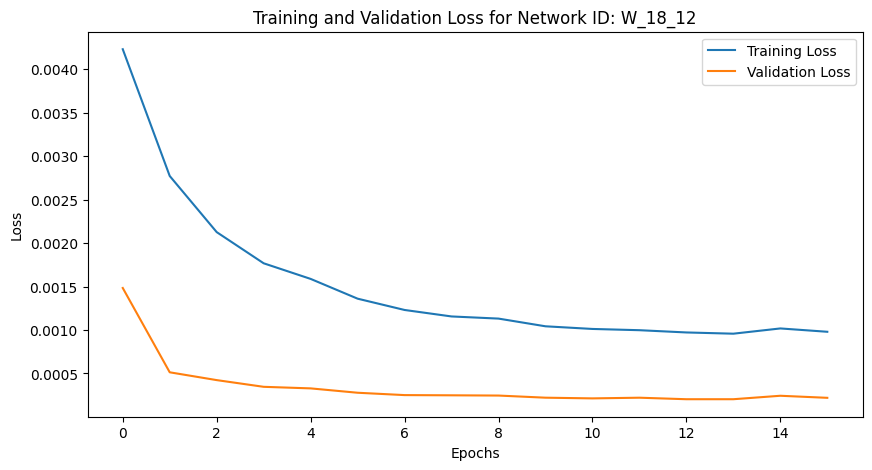

Training Progress:   0%|          | 15/10000 [00:37<6:54:40,  2.49s/epoch, loss=0.00098, val_loss=0.00022, patience=1]


Mean Squared Error: 0.00152074789795471
Iteration: 352, Window Size: 18, Y Days Ahead: 13
X shape: (3777, 18)
y shape: (3777, 13)
Initializing network with layer sizes: [18, 128, 64, 32, 13]
params_W_18_13.npz not found. Using randomly initialized parameters.
Training data shape: (3021, 18), (3021, 13), Validation data shape: (378, 18), (378, 13), Testing data shape: (378, 18), (378, 13)
Parameters loaded from params_W_18_13.npz


Training Progress:   0%|          | 14/10000 [00:36<6:55:06,  2.49s/epoch, loss=0.00105, val_loss=0.000237, patience=1]

Epoch 15/10000, Training Loss: 0.001051, Validation Loss: 0.000237
Early stopping at epoch 15. Best validation loss: 0.000235


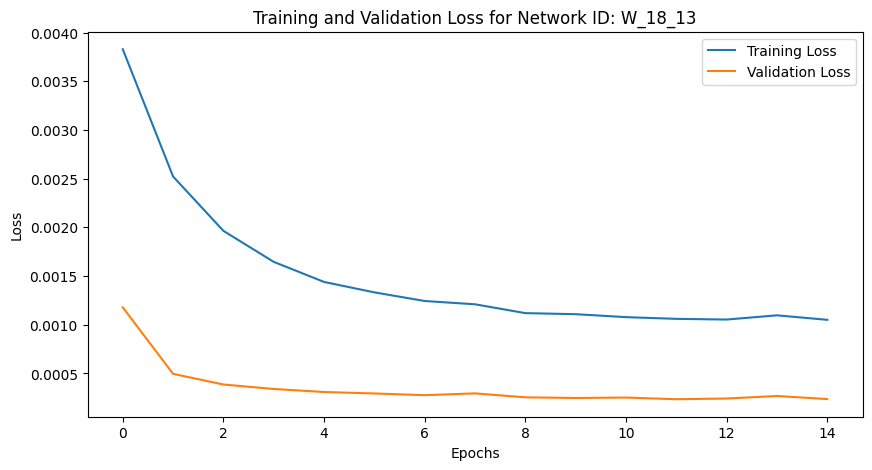

Training Progress:   0%|          | 14/10000 [00:36<7:12:37,  2.60s/epoch, loss=0.00105, val_loss=0.000237, patience=1]


Mean Squared Error: 0.0016111516261072985
Iteration: 353, Window Size: 18, Y Days Ahead: 14
X shape: (3776, 18)
y shape: (3776, 14)
Initializing network with layer sizes: [18, 128, 64, 32, 14]
params_W_18_14.npz not found. Using randomly initialized parameters.
Training data shape: (3020, 18), (3020, 14), Validation data shape: (378, 18), (378, 14), Testing data shape: (378, 18), (378, 14)
Parameters loaded from params_W_18_14.npz


Training Progress:   0%|          | 24/10000 [01:00<6:55:11,  2.50s/epoch, loss=0.00104, val_loss=0.000235, patience=1]

Epoch 25/10000, Training Loss: 0.001044, Validation Loss: 0.000235
Early stopping at epoch 25. Best validation loss: 0.000235


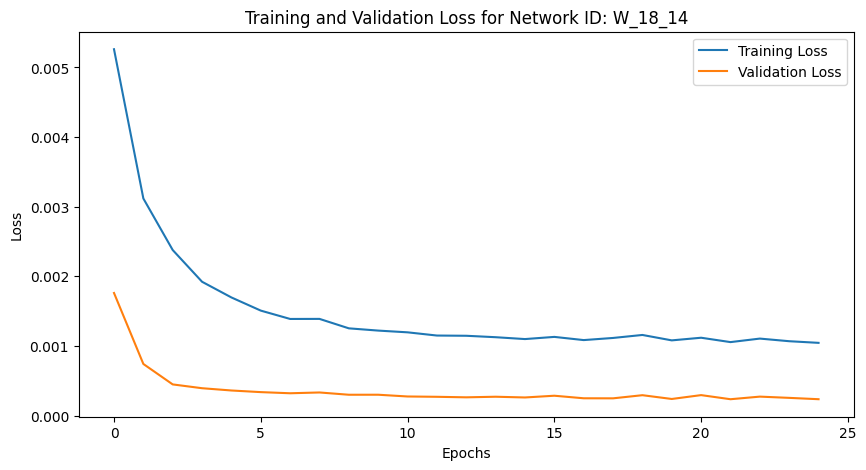

Training Progress:   0%|          | 24/10000 [01:00<7:00:28,  2.53s/epoch, loss=0.00104, val_loss=0.000235, patience=1]


Mean Squared Error: 0.0016548874077052344
Iteration: 354, Window Size: 18, Y Days Ahead: 15
X shape: (3775, 18)
y shape: (3775, 15)
Initializing network with layer sizes: [18, 128, 64, 32, 15]
params_W_18_15.npz not found. Using randomly initialized parameters.
Training data shape: (3020, 18), (3020, 15), Validation data shape: (377, 18), (377, 15), Testing data shape: (378, 18), (378, 15)
Parameters loaded from params_W_18_15.npz


Training Progress:   0%|          | 24/10000 [01:00<6:33:19,  2.37s/epoch, loss=0.00112, val_loss=0.000255, patience=1]

Epoch 25/10000, Training Loss: 0.001124, Validation Loss: 0.000255
Early stopping at epoch 25. Best validation loss: 0.000242


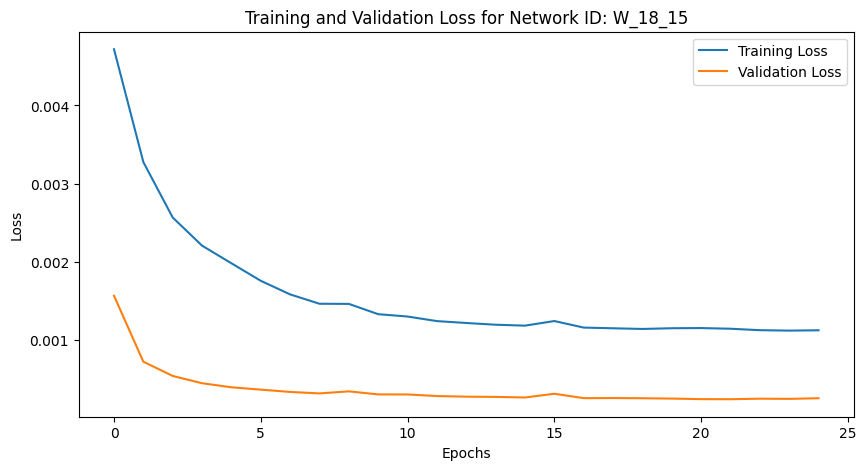

Training Progress:   0%|          | 24/10000 [01:01<7:03:24,  2.55s/epoch, loss=0.00112, val_loss=0.000255, patience=1]


Mean Squared Error: 0.0018098996811099183
Iteration: 355, Window Size: 18, Y Days Ahead: 16
X shape: (3774, 18)
y shape: (3774, 16)
Initializing network with layer sizes: [18, 128, 64, 32, 16]
params_W_18_16.npz not found. Using randomly initialized parameters.
Training data shape: (3019, 18), (3019, 16), Validation data shape: (377, 18), (377, 16), Testing data shape: (378, 18), (378, 16)
Parameters loaded from params_W_18_16.npz


Training Progress:   0%|          | 23/10000 [00:57<6:38:08,  2.39s/epoch, loss=0.00118, val_loss=0.000266, patience=1]

Epoch 24/10000, Training Loss: 0.001183, Validation Loss: 0.000266
Early stopping at epoch 24. Best validation loss: 0.000261


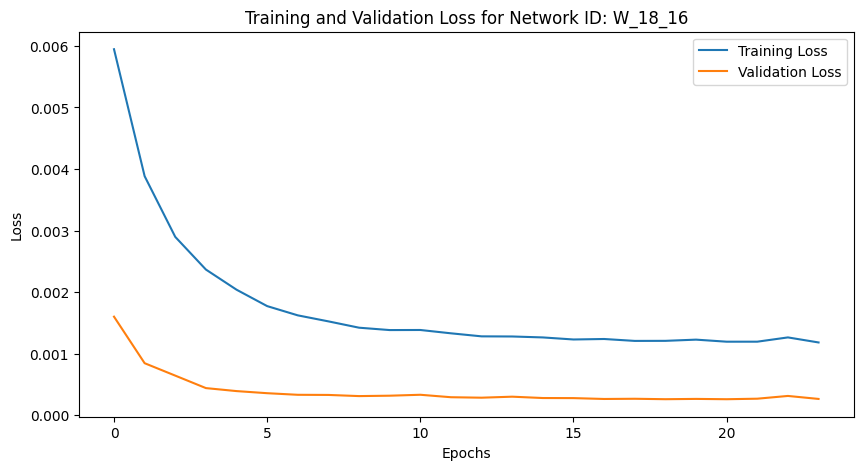

Training Progress:   0%|          | 23/10000 [00:57<6:57:37,  2.51s/epoch, loss=0.00118, val_loss=0.000266, patience=1]


Mean Squared Error: 0.001930900208417967
Iteration: 356, Window Size: 18, Y Days Ahead: 17
X shape: (3773, 18)
y shape: (3773, 17)
Initializing network with layer sizes: [18, 128, 64, 32, 17]
params_W_18_17.npz not found. Using randomly initialized parameters.
Training data shape: (3018, 18), (3018, 17), Validation data shape: (377, 18), (377, 17), Testing data shape: (378, 18), (378, 17)
Parameters loaded from params_W_18_17.npz


Training Progress:   0%|          | 24/10000 [01:01<6:47:59,  2.45s/epoch, loss=0.00136, val_loss=0.000309, patience=1]

Epoch 25/10000, Training Loss: 0.001356, Validation Loss: 0.000309
Early stopping at epoch 25. Best validation loss: 0.000279


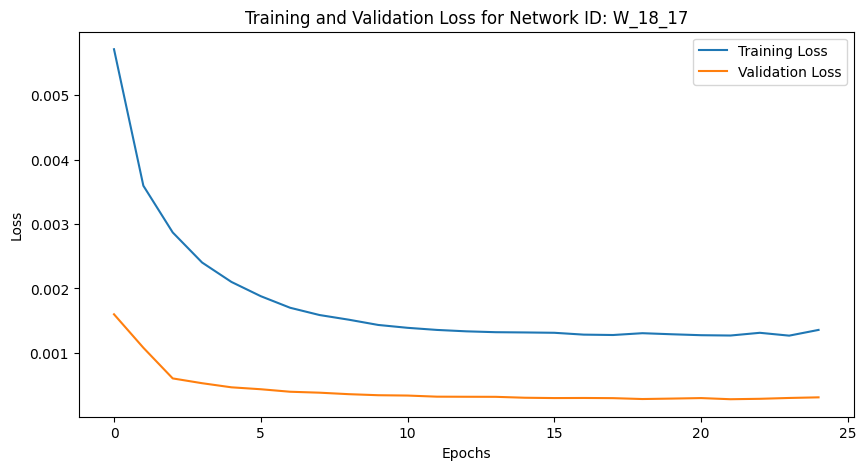

Training Progress:   0%|          | 24/10000 [01:01<7:07:32,  2.57s/epoch, loss=0.00136, val_loss=0.000309, patience=1]


Mean Squared Error: 0.0020869598819355573
Iteration: 357, Window Size: 18, Y Days Ahead: 18
X shape: (3772, 18)
y shape: (3772, 18)
Initializing network with layer sizes: [18, 128, 64, 32, 18]
params_W_18_18.npz not found. Using randomly initialized parameters.
Training data shape: (3017, 18), (3017, 18), Validation data shape: (377, 18), (377, 18), Testing data shape: (378, 18), (378, 18)
Parameters loaded from params_W_18_18.npz


Training Progress:   0%|          | 20/10000 [00:49<6:31:45,  2.36s/epoch, loss=0.00132, val_loss=0.000307, patience=1]

Epoch 21/10000, Training Loss: 0.001316, Validation Loss: 0.000307
Early stopping at epoch 21. Best validation loss: 0.000301


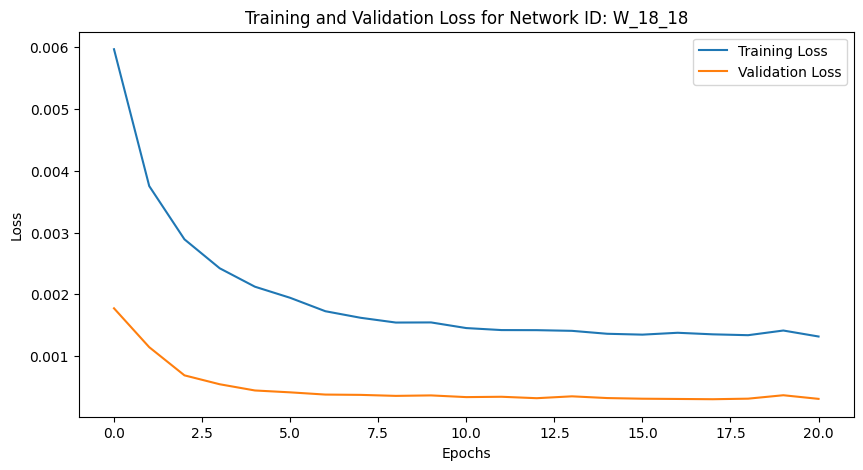

Training Progress:   0%|          | 20/10000 [00:50<6:58:50,  2.52s/epoch, loss=0.00132, val_loss=0.000307, patience=1]


Mean Squared Error: 0.002218533263756462
Iteration: 358, Window Size: 18, Y Days Ahead: 19
X shape: (3771, 18)
y shape: (3771, 19)
Initializing network with layer sizes: [18, 128, 64, 32, 19]
params_W_18_19.npz not found. Using randomly initialized parameters.
Training data shape: (3016, 18), (3016, 19), Validation data shape: (377, 18), (377, 19), Testing data shape: (378, 18), (378, 19)
Parameters loaded from params_W_18_19.npz


Training Progress:   0%|          | 15/10000 [00:37<6:54:13,  2.49s/epoch, loss=0.00144, val_loss=0.000344, patience=1]

Epoch 16/10000, Training Loss: 0.001444, Validation Loss: 0.000344
Early stopping at epoch 16. Best validation loss: 0.000339


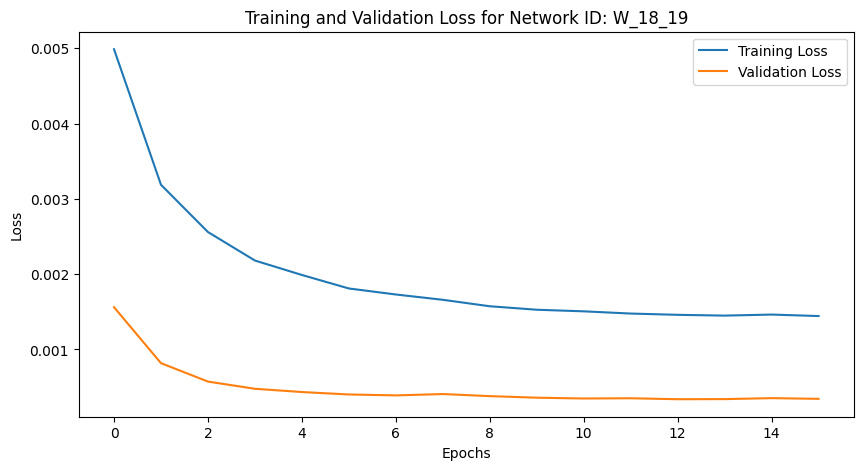

Training Progress:   0%|          | 15/10000 [00:38<7:02:51,  2.54s/epoch, loss=0.00144, val_loss=0.000344, patience=1]


Mean Squared Error: 0.0023367964550523833
Iteration: 359, Window Size: 18, Y Days Ahead: 20
X shape: (3770, 18)
y shape: (3770, 20)
Initializing network with layer sizes: [18, 128, 64, 32, 20]
params_W_18_20.npz not found. Using randomly initialized parameters.
Training data shape: (3016, 18), (3016, 20), Validation data shape: (377, 18), (377, 20), Testing data shape: (377, 18), (377, 20)
Parameters loaded from params_W_18_20.npz


Training Progress:   0%|          | 22/10000 [00:55<6:21:01,  2.29s/epoch, loss=0.00151, val_loss=0.000361, patience=1]

Epoch 23/10000, Training Loss: 0.001507, Validation Loss: 0.000361
Early stopping at epoch 23. Best validation loss: 0.000337


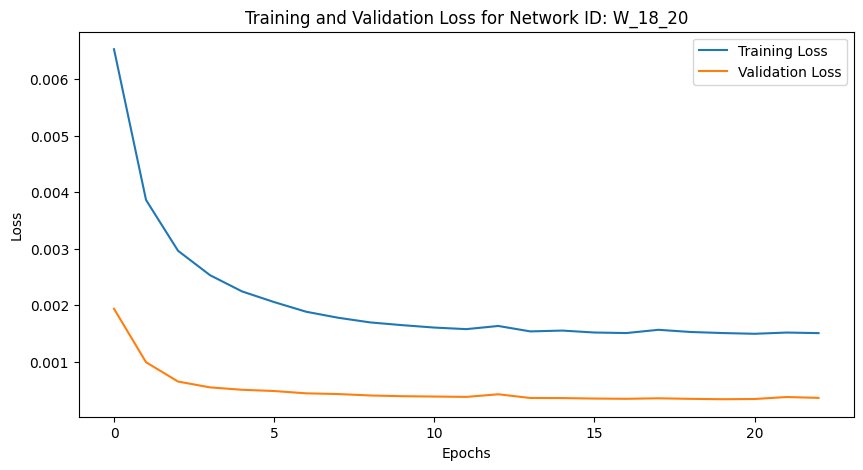

Training Progress:   0%|          | 22/10000 [00:56<7:04:21,  2.55s/epoch, loss=0.00151, val_loss=0.000361, patience=1]


Mean Squared Error: 0.0025358550522473966
Iteration: 360, Window Size: 19, Y Days Ahead: 1
X shape: (3788, 19)
y shape: (3788, 1)
Initializing network with layer sizes: [19, 128, 64, 32, 1]
params_W_19_1.npz not found. Using randomly initialized parameters.
Training data shape: (3030, 19), (3030, 1), Validation data shape: (379, 19), (379, 1), Testing data shape: (379, 19), (379, 1)
Parameters loaded from params_W_19_1.npz


Training Progress:   0%|          | 13/10000 [00:33<6:24:27,  2.31s/epoch, loss=0.000184, val_loss=3.89e-5, patience=1]

Epoch 14/10000, Training Loss: 0.000184, Validation Loss: 0.000039
Early stopping at epoch 14. Best validation loss: 0.000035


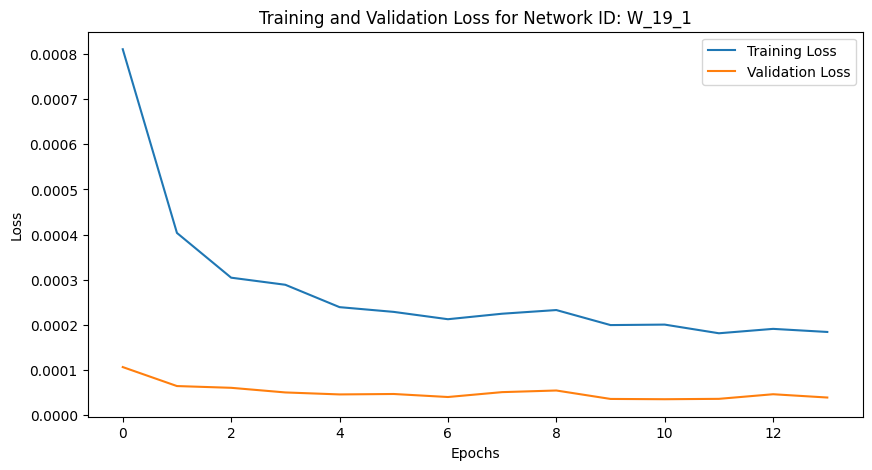

Training Progress:   0%|          | 13/10000 [00:33<7:10:12,  2.58s/epoch, loss=0.000184, val_loss=3.89e-5, patience=1]


Mean Squared Error: 0.0003819918734059591
Iteration: 361, Window Size: 19, Y Days Ahead: 2
X shape: (3787, 19)
y shape: (3787, 2)
Initializing network with layer sizes: [19, 128, 64, 32, 2]
params_W_19_2.npz not found. Using randomly initialized parameters.
Training data shape: (3029, 19), (3029, 2), Validation data shape: (379, 19), (379, 2), Testing data shape: (379, 19), (379, 2)
Parameters loaded from params_W_19_2.npz


Training Progress:   0%|          | 15/10000 [00:36<6:38:15,  2.39s/epoch, loss=0.000313, val_loss=6.55e-5, patience=1]

Epoch 16/10000, Training Loss: 0.000313, Validation Loss: 0.000065
Early stopping at epoch 16. Best validation loss: 0.000063


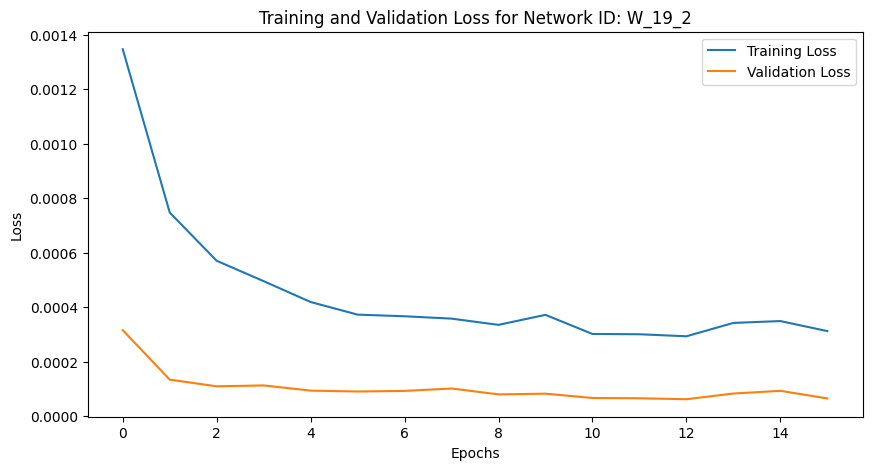

Training Progress:   0%|          | 15/10000 [00:37<6:54:39,  2.49s/epoch, loss=0.000313, val_loss=6.55e-5, patience=1]


Mean Squared Error: 0.0004981203453744481
Iteration: 362, Window Size: 19, Y Days Ahead: 3
X shape: (3786, 19)
y shape: (3786, 3)
Initializing network with layer sizes: [19, 128, 64, 32, 3]
params_W_19_3.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 19), (3028, 3), Validation data shape: (379, 19), (379, 3), Testing data shape: (379, 19), (379, 3)
Parameters loaded from params_W_19_3.npz


Training Progress:   0%|          | 19/10000 [00:47<6:19:39,  2.28s/epoch, loss=0.000349, val_loss=7.09e-5, patience=1] 

Epoch 20/10000, Training Loss: 0.000349, Validation Loss: 0.000071
Early stopping at epoch 20. Best validation loss: 0.000070


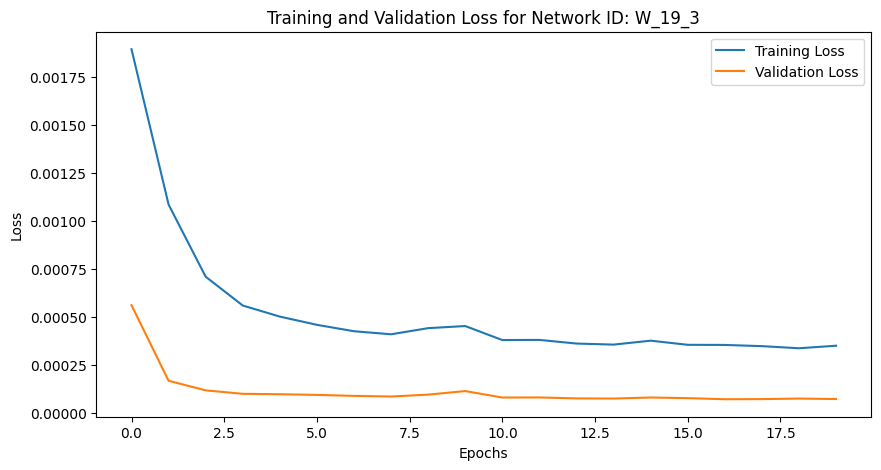

Training Progress:   0%|          | 19/10000 [00:47<6:54:24,  2.49s/epoch, loss=0.000349, val_loss=7.09e-5, patience=1]


Mean Squared Error: 0.0005874481263858298
Iteration: 363, Window Size: 19, Y Days Ahead: 4
X shape: (3785, 19)
y shape: (3785, 4)
Initializing network with layer sizes: [19, 128, 64, 32, 4]
params_W_19_4.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 19), (3028, 4), Validation data shape: (378, 19), (378, 4), Testing data shape: (379, 19), (379, 4)
Parameters loaded from params_W_19_4.npz


Training Progress:   0%|          | 26/10000 [01:05<6:37:13,  2.39s/epoch, loss=0.000402, val_loss=8.9e-5, patience=1]  

Epoch 27/10000, Training Loss: 0.000402, Validation Loss: 0.000089
Early stopping at epoch 27. Best validation loss: 0.000084


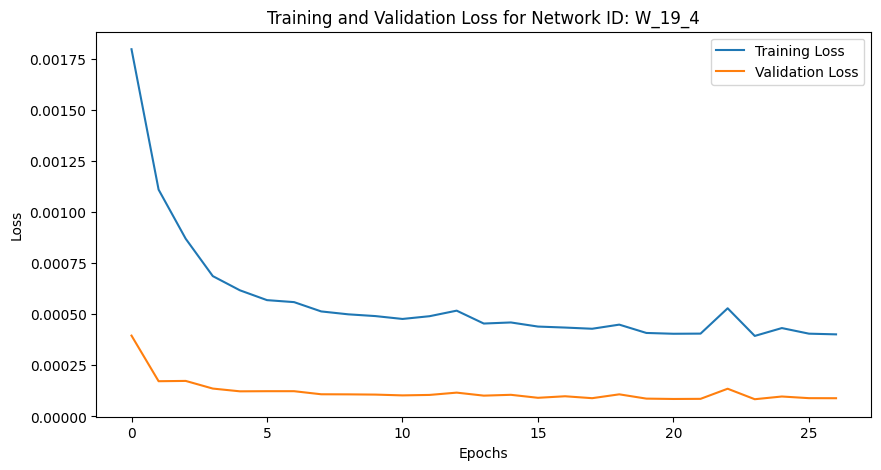

Training Progress:   0%|          | 26/10000 [01:05<7:01:39,  2.54s/epoch, loss=0.000402, val_loss=8.9e-5, patience=1]


Mean Squared Error: 0.0006432946248199852
Iteration: 364, Window Size: 19, Y Days Ahead: 5
X shape: (3784, 19)
y shape: (3784, 5)
Initializing network with layer sizes: [19, 128, 64, 32, 5]
params_W_19_5.npz not found. Using randomly initialized parameters.
Training data shape: (3027, 19), (3027, 5), Validation data shape: (378, 19), (378, 5), Testing data shape: (379, 19), (379, 5)
Parameters loaded from params_W_19_5.npz


Training Progress:   0%|          | 14/10000 [00:36<6:49:39,  2.46s/epoch, loss=0.000547, val_loss=0.000125, patience=1]

Epoch 15/10000, Training Loss: 0.000547, Validation Loss: 0.000125
Early stopping at epoch 15. Best validation loss: 0.000104


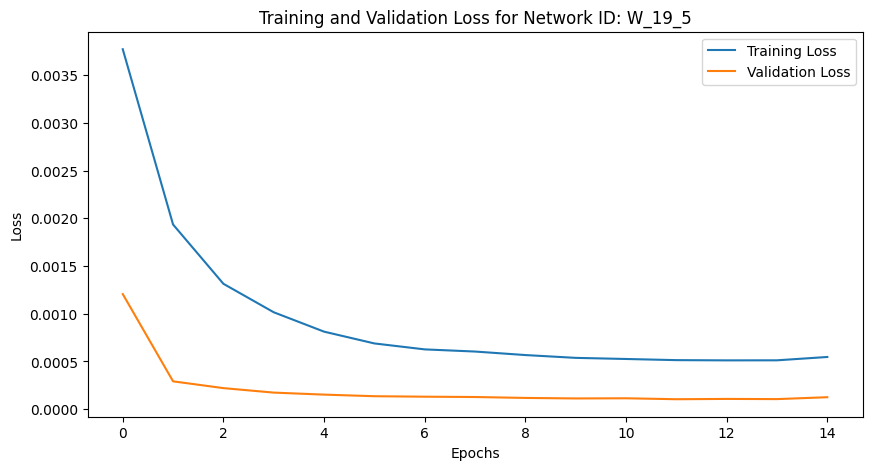

Training Progress:   0%|          | 14/10000 [00:37<7:21:56,  2.66s/epoch, loss=0.000547, val_loss=0.000125, patience=1]


Mean Squared Error: 0.0008418181205942324
Iteration: 365, Window Size: 19, Y Days Ahead: 6
X shape: (3783, 19)
y shape: (3783, 6)
Initializing network with layer sizes: [19, 128, 64, 32, 6]
params_W_19_6.npz not found. Using randomly initialized parameters.
Training data shape: (3026, 19), (3026, 6), Validation data shape: (378, 19), (378, 6), Testing data shape: (379, 19), (379, 6)
Parameters loaded from params_W_19_6.npz


Training Progress:   0%|          | 29/10000 [01:12<6:46:39,  2.45s/epoch, loss=0.000528, val_loss=0.000116, patience=1]

Epoch 30/10000, Training Loss: 0.000528, Validation Loss: 0.000116
Early stopping at epoch 30. Best validation loss: 0.000114


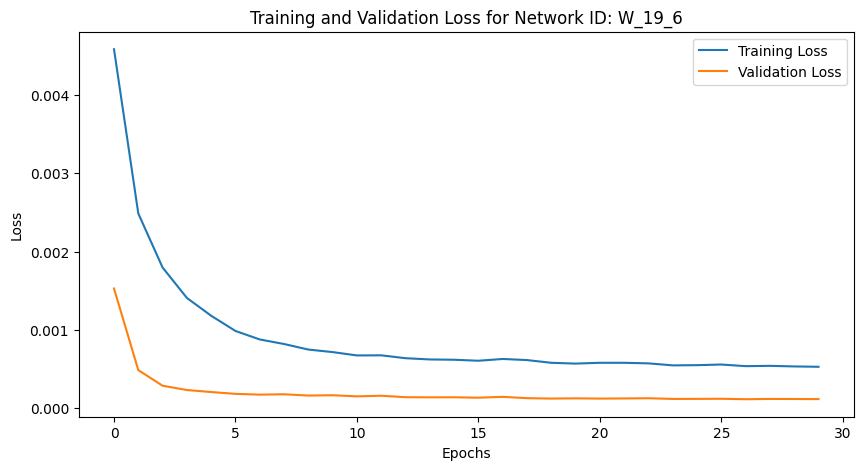

Training Progress:   0%|          | 29/10000 [01:13<6:58:37,  2.52s/epoch, loss=0.000528, val_loss=0.000116, patience=1]


Mean Squared Error: 0.0008566101049390984
Iteration: 366, Window Size: 19, Y Days Ahead: 7
X shape: (3782, 19)
y shape: (3782, 7)
Initializing network with layer sizes: [19, 128, 64, 32, 7]
params_W_19_7.npz not found. Using randomly initialized parameters.
Training data shape: (3025, 19), (3025, 7), Validation data shape: (378, 19), (378, 7), Testing data shape: (379, 19), (379, 7)
Parameters loaded from params_W_19_7.npz


Training Progress:   0%|          | 22/10000 [00:56<6:37:38,  2.39s/epoch, loss=0.000605, val_loss=0.00013, patience=1] 

Epoch 23/10000, Training Loss: 0.000605, Validation Loss: 0.000130
Early stopping at epoch 23. Best validation loss: 0.000128


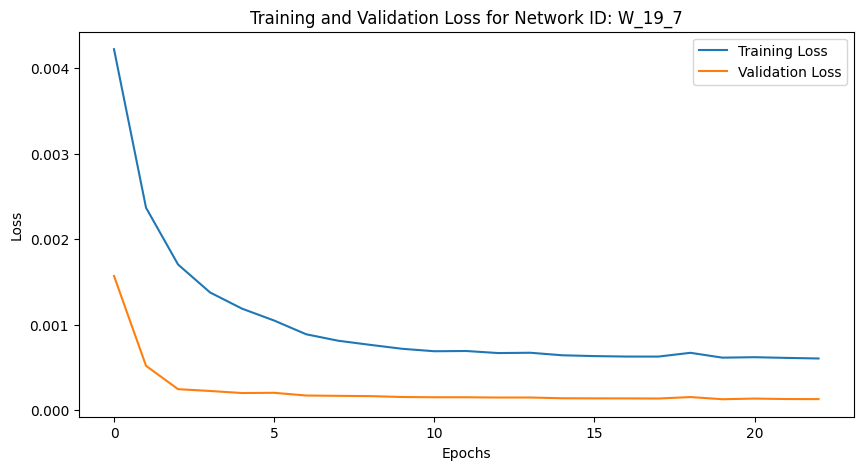

Training Progress:   0%|          | 22/10000 [00:56<7:07:42,  2.57s/epoch, loss=0.000605, val_loss=0.00013, patience=1]


Mean Squared Error: 0.0009585667876112317
Iteration: 367, Window Size: 19, Y Days Ahead: 8
X shape: (3781, 19)
y shape: (3781, 8)
Initializing network with layer sizes: [19, 128, 64, 32, 8]
params_W_19_8.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 19), (3024, 8), Validation data shape: (378, 19), (378, 8), Testing data shape: (379, 19), (379, 8)
Parameters loaded from params_W_19_8.npz


Training Progress:   0%|          | 25/10000 [01:00<6:34:21,  2.37s/epoch, loss=0.000665, val_loss=0.000152, patience=1]

Epoch 26/10000, Training Loss: 0.000665, Validation Loss: 0.000152
Early stopping at epoch 26. Best validation loss: 0.000146


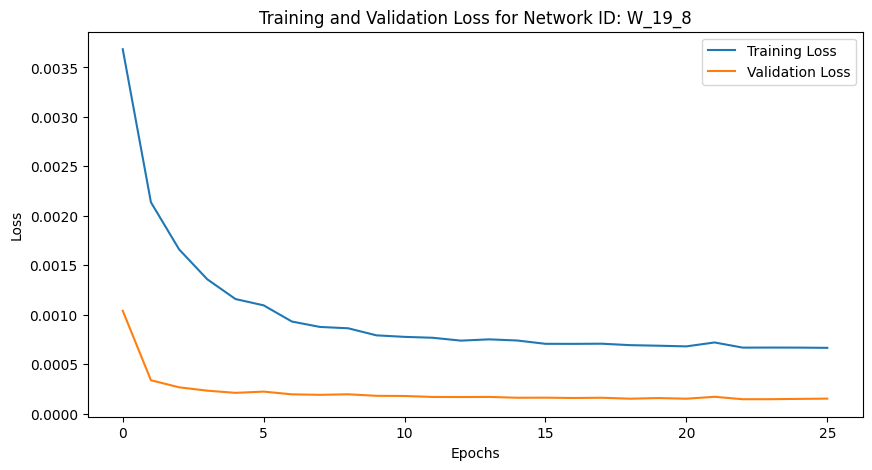

Training Progress:   0%|          | 25/10000 [01:01<6:48:46,  2.46s/epoch, loss=0.000665, val_loss=0.000152, patience=1]


Mean Squared Error: 0.00101119426537685
Iteration: 368, Window Size: 19, Y Days Ahead: 9
X shape: (3780, 19)
y shape: (3780, 9)
Initializing network with layer sizes: [19, 128, 64, 32, 9]
params_W_19_9.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 19), (3024, 9), Validation data shape: (378, 19), (378, 9), Testing data shape: (378, 19), (378, 9)
Parameters loaded from params_W_19_9.npz


Training Progress:   0%|          | 28/10000 [01:07<6:38:55,  2.40s/epoch, loss=0.000711, val_loss=0.000151, patience=1]

Epoch 29/10000, Training Loss: 0.000711, Validation Loss: 0.000151
Early stopping at epoch 29. Best validation loss: 0.000149


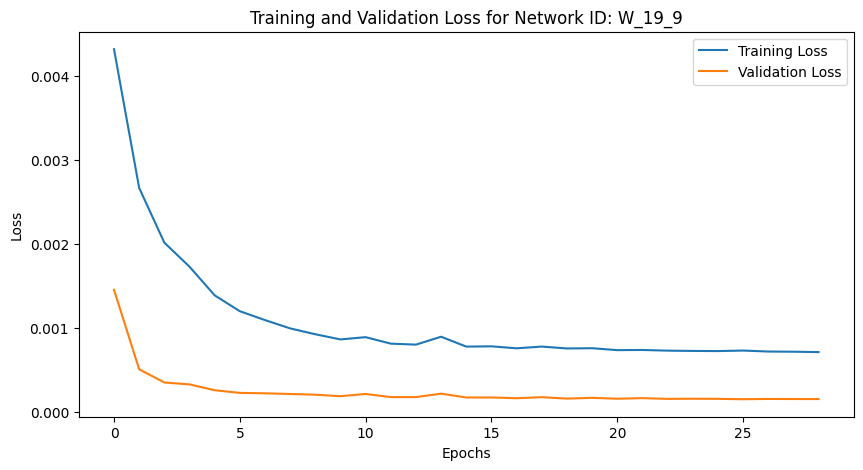

Training Progress:   0%|          | 28/10000 [01:07<6:43:36,  2.43s/epoch, loss=0.000711, val_loss=0.000151, patience=1]


Mean Squared Error: 0.0011431938185504388
Iteration: 369, Window Size: 19, Y Days Ahead: 10
X shape: (3779, 19)
y shape: (3779, 10)
Initializing network with layer sizes: [19, 128, 64, 32, 10]
params_W_19_10.npz not found. Using randomly initialized parameters.
Training data shape: (3023, 19), (3023, 10), Validation data shape: (378, 19), (378, 10), Testing data shape: (378, 19), (378, 10)
Parameters loaded from params_W_19_10.npz


Training Progress:   0%|          | 23/10000 [00:56<6:31:53,  2.36s/epoch, loss=0.000783, val_loss=0.000173, patience=1]

Epoch 24/10000, Training Loss: 0.000783, Validation Loss: 0.000173
Early stopping at epoch 24. Best validation loss: 0.000162


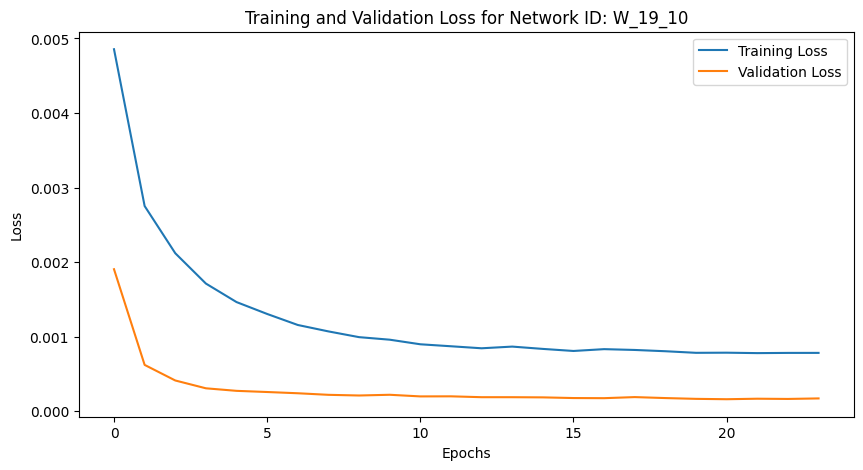

Training Progress:   0%|          | 23/10000 [00:56<6:49:21,  2.46s/epoch, loss=0.000783, val_loss=0.000173, patience=1]


Mean Squared Error: 0.001232184040714668
Iteration: 370, Window Size: 19, Y Days Ahead: 11
X shape: (3778, 19)
y shape: (3778, 11)
Initializing network with layer sizes: [19, 128, 64, 32, 11]
params_W_19_11.npz not found. Using randomly initialized parameters.
Training data shape: (3022, 19), (3022, 11), Validation data shape: (378, 19), (378, 11), Testing data shape: (378, 19), (378, 11)
Parameters loaded from params_W_19_11.npz


Training Progress:   0%|          | 27/10000 [01:06<6:22:50,  2.30s/epoch, loss=0.000853, val_loss=0.000184, patience=1]

Epoch 28/10000, Training Loss: 0.000853, Validation Loss: 0.000184
Early stopping at epoch 28. Best validation loss: 0.000183


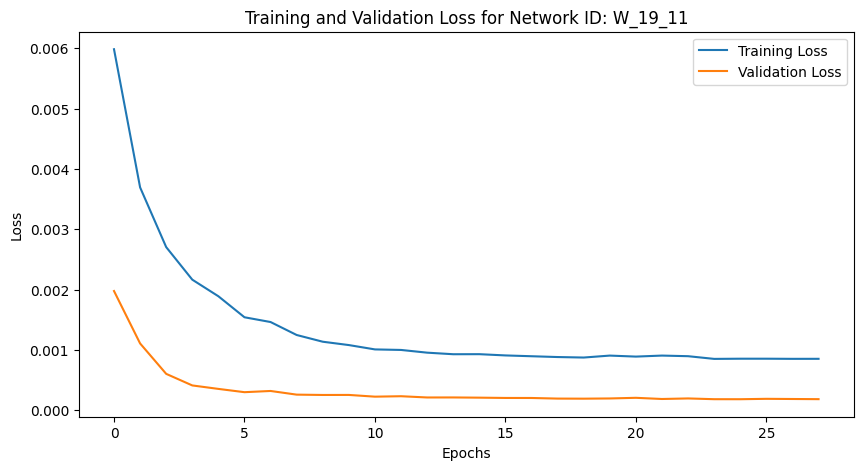

Training Progress:   0%|          | 27/10000 [01:06<6:52:10,  2.48s/epoch, loss=0.000853, val_loss=0.000184, patience=1]


Mean Squared Error: 0.0013671748501907022
Iteration: 371, Window Size: 19, Y Days Ahead: 12
X shape: (3777, 19)
y shape: (3777, 12)
Initializing network with layer sizes: [19, 128, 64, 32, 12]
params_W_19_12.npz not found. Using randomly initialized parameters.
Training data shape: (3021, 19), (3021, 12), Validation data shape: (378, 19), (378, 12), Testing data shape: (378, 19), (378, 12)
Parameters loaded from params_W_19_12.npz


Training Progress:   0%|          | 22/10000 [00:55<6:52:28,  2.48s/epoch, loss=0.000939, val_loss=0.000201, patience=1]

Epoch 23/10000, Training Loss: 0.000939, Validation Loss: 0.000201
Early stopping at epoch 23. Best validation loss: 0.000198


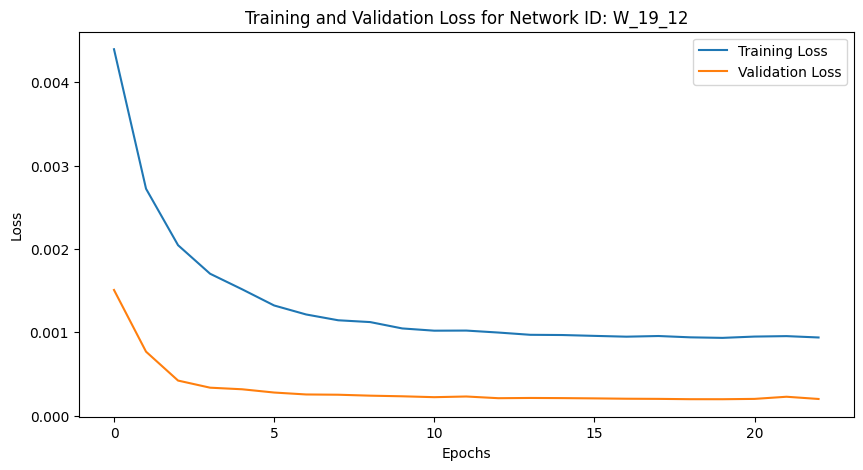

Training Progress:   0%|          | 22/10000 [00:55<6:58:37,  2.52s/epoch, loss=0.000939, val_loss=0.000201, patience=1]


Mean Squared Error: 0.0014796941628180498
Iteration: 372, Window Size: 19, Y Days Ahead: 13
X shape: (3776, 19)
y shape: (3776, 13)
Initializing network with layer sizes: [19, 128, 64, 32, 13]
params_W_19_13.npz not found. Using randomly initialized parameters.
Training data shape: (3020, 19), (3020, 13), Validation data shape: (378, 19), (378, 13), Testing data shape: (378, 19), (378, 13)
Parameters loaded from params_W_19_13.npz


Training Progress:   0%|          | 22/10000 [00:56<6:29:11,  2.34s/epoch, loss=0.000985, val_loss=0.000219, patience=1]

Epoch 23/10000, Training Loss: 0.000985, Validation Loss: 0.000219
Early stopping at epoch 23. Best validation loss: 0.000212


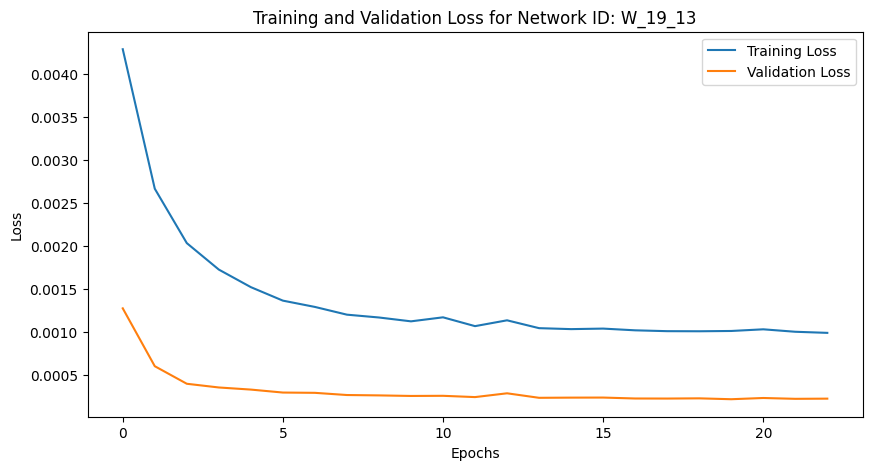

Training Progress:   0%|          | 22/10000 [00:56<7:05:25,  2.56s/epoch, loss=0.000985, val_loss=0.000219, patience=1]


Mean Squared Error: 0.0016157413221533066
Iteration: 373, Window Size: 19, Y Days Ahead: 14
X shape: (3775, 19)
y shape: (3775, 14)
Initializing network with layer sizes: [19, 128, 64, 32, 14]
params_W_19_14.npz not found. Using randomly initialized parameters.
Training data shape: (3020, 19), (3020, 14), Validation data shape: (377, 19), (377, 14), Testing data shape: (378, 19), (378, 14)
Parameters loaded from params_W_19_14.npz


Training Progress:   0%|          | 28/10000 [01:12<7:18:43,  2.64s/epoch, loss=0.00105, val_loss=0.000246, patience=1]

Epoch 29/10000, Training Loss: 0.001049, Validation Loss: 0.000246
Early stopping at epoch 29. Best validation loss: 0.000241


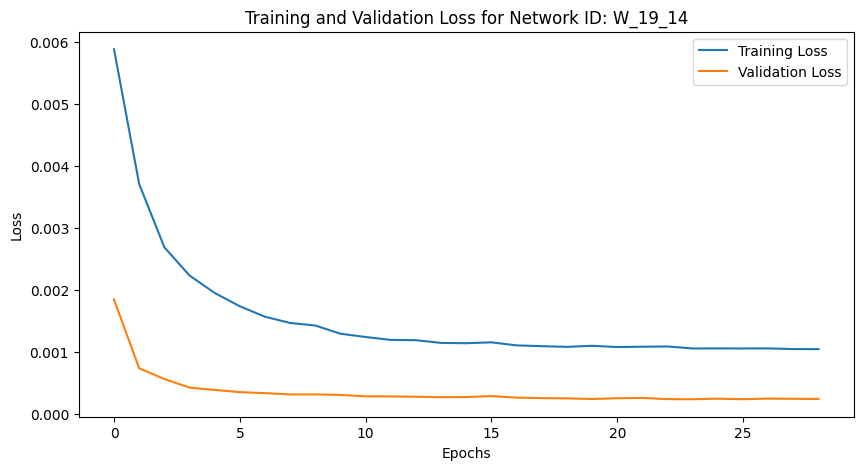

Training Progress:   0%|          | 28/10000 [01:12<7:12:15,  2.60s/epoch, loss=0.00105, val_loss=0.000246, patience=1]


Mean Squared Error: 0.001649276951443745
Iteration: 374, Window Size: 19, Y Days Ahead: 15
X shape: (3774, 19)
y shape: (3774, 15)
Initializing network with layer sizes: [19, 128, 64, 32, 15]
params_W_19_15.npz not found. Using randomly initialized parameters.
Training data shape: (3019, 19), (3019, 15), Validation data shape: (377, 19), (377, 15), Testing data shape: (378, 19), (378, 15)
Parameters loaded from params_W_19_15.npz


Training Progress:   0%|          | 26/10000 [01:05<6:47:14,  2.45s/epoch, loss=0.00116, val_loss=0.000288, patience=1]

Epoch 27/10000, Training Loss: 0.001158, Validation Loss: 0.000288
Early stopping at epoch 27. Best validation loss: 0.000245


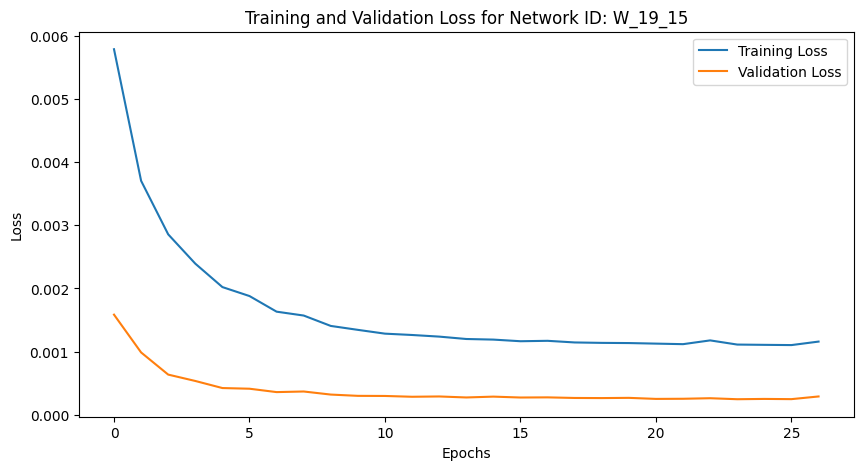

Training Progress:   0%|          | 26/10000 [01:05<7:00:47,  2.53s/epoch, loss=0.00116, val_loss=0.000288, patience=1]


Mean Squared Error: 0.0017733839556537325
Iteration: 375, Window Size: 19, Y Days Ahead: 16
X shape: (3773, 19)
y shape: (3773, 16)
Initializing network with layer sizes: [19, 128, 64, 32, 16]
params_W_19_16.npz not found. Using randomly initialized parameters.
Training data shape: (3018, 19), (3018, 16), Validation data shape: (377, 19), (377, 16), Testing data shape: (378, 19), (378, 16)
Parameters loaded from params_W_19_16.npz


Training Progress:   0%|          | 25/10000 [01:04<6:58:12,  2.52s/epoch, loss=0.00121, val_loss=0.000279, patience=1]

Epoch 26/10000, Training Loss: 0.001208, Validation Loss: 0.000279
Early stopping at epoch 26. Best validation loss: 0.000266


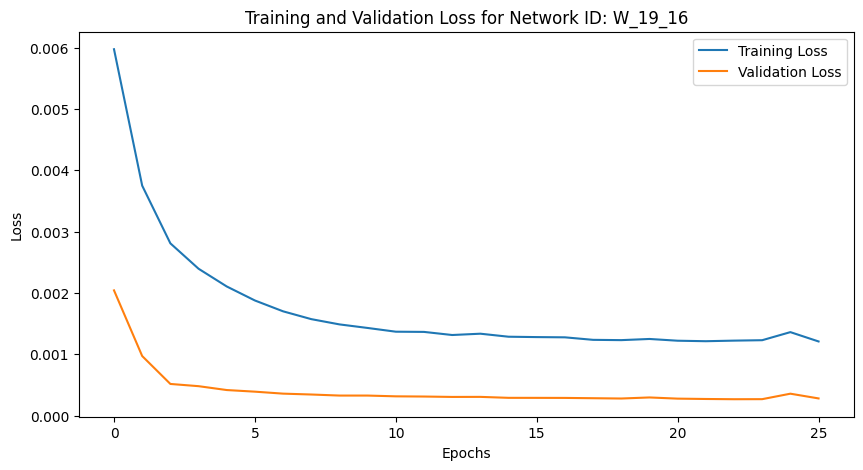

Training Progress:   0%|          | 25/10000 [01:04<7:09:13,  2.58s/epoch, loss=0.00121, val_loss=0.000279, patience=1]


Mean Squared Error: 0.001963352143294063
Iteration: 376, Window Size: 19, Y Days Ahead: 17
X shape: (3772, 19)
y shape: (3772, 17)
Initializing network with layer sizes: [19, 128, 64, 32, 17]
params_W_19_17.npz not found. Using randomly initialized parameters.
Training data shape: (3017, 19), (3017, 17), Validation data shape: (377, 19), (377, 17), Testing data shape: (378, 19), (378, 17)
Parameters loaded from params_W_19_17.npz


Training Progress:   0%|          | 22/10000 [00:57<7:08:59,  2.58s/epoch, loss=0.00128, val_loss=0.000291, patience=1]

Epoch 23/10000, Training Loss: 0.001279, Validation Loss: 0.000291
Early stopping at epoch 23. Best validation loss: 0.000287


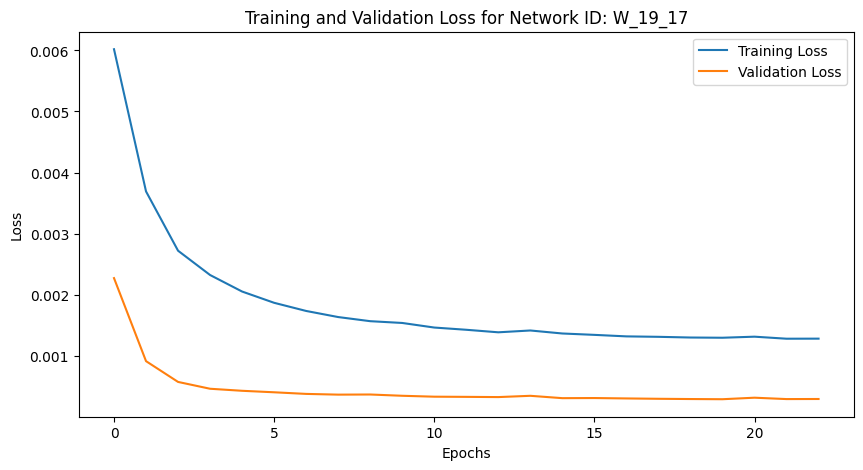

Training Progress:   0%|          | 22/10000 [00:57<7:17:22,  2.63s/epoch, loss=0.00128, val_loss=0.000291, patience=1]


Mean Squared Error: 0.002090923087798709
Iteration: 377, Window Size: 19, Y Days Ahead: 18
X shape: (3771, 19)
y shape: (3771, 18)
Initializing network with layer sizes: [19, 128, 64, 32, 18]
params_W_19_18.npz not found. Using randomly initialized parameters.
Training data shape: (3016, 19), (3016, 18), Validation data shape: (377, 19), (377, 18), Testing data shape: (378, 19), (378, 18)
Parameters loaded from params_W_19_18.npz


Training Progress:   0%|          | 21/10000 [00:54<7:03:29,  2.55s/epoch, loss=0.00138, val_loss=0.000346, patience=1]

Epoch 22/10000, Training Loss: 0.001382, Validation Loss: 0.000346
Early stopping at epoch 22. Best validation loss: 0.000315


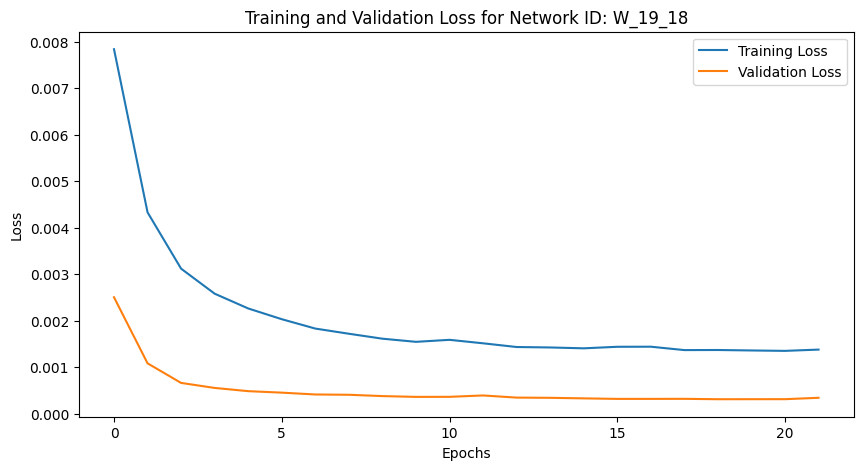

Training Progress:   0%|          | 21/10000 [00:54<7:13:51,  2.61s/epoch, loss=0.00138, val_loss=0.000346, patience=1]


Mean Squared Error: 0.0022451621421234907
Iteration: 378, Window Size: 19, Y Days Ahead: 19
X shape: (3770, 19)
y shape: (3770, 19)
Initializing network with layer sizes: [19, 128, 64, 32, 19]
params_W_19_19.npz not found. Using randomly initialized parameters.
Training data shape: (3016, 19), (3016, 19), Validation data shape: (377, 19), (377, 19), Testing data shape: (377, 19), (377, 19)
Parameters loaded from params_W_19_19.npz


Training Progress:   0%|          | 19/10000 [00:49<6:44:59,  2.43s/epoch, loss=0.0015, val_loss=0.000396, patience=1] 

Epoch 20/10000, Training Loss: 0.001503, Validation Loss: 0.000396
Early stopping at epoch 20. Best validation loss: 0.000346


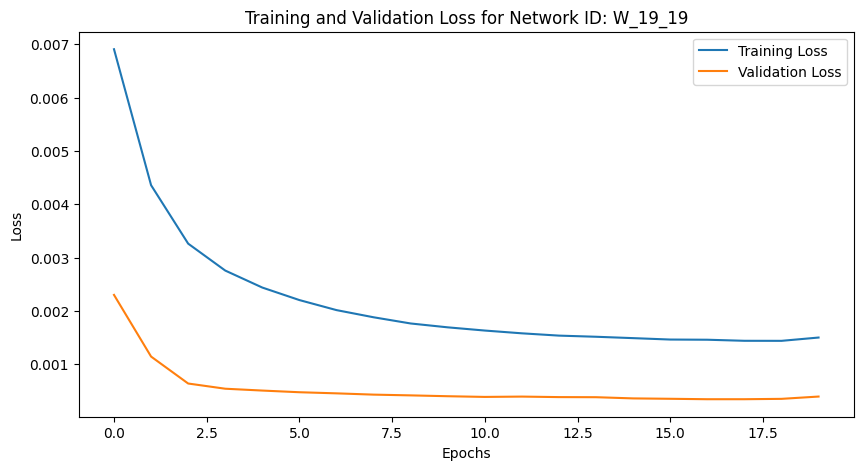

Training Progress:   0%|          | 19/10000 [00:50<7:18:28,  2.64s/epoch, loss=0.0015, val_loss=0.000396, patience=1]


Mean Squared Error: 0.002399582625033538
Iteration: 379, Window Size: 19, Y Days Ahead: 20
X shape: (3769, 19)
y shape: (3769, 20)
Initializing network with layer sizes: [19, 128, 64, 32, 20]
params_W_19_20.npz not found. Using randomly initialized parameters.
Training data shape: (3015, 19), (3015, 20), Validation data shape: (377, 19), (377, 20), Testing data shape: (377, 19), (377, 20)
Parameters loaded from params_W_19_20.npz


Training Progress:   0%|          | 26/10000 [01:05<6:37:33,  2.39s/epoch, loss=0.00151, val_loss=0.000363, patience=1]

Epoch 27/10000, Training Loss: 0.001511, Validation Loss: 0.000363
Early stopping at epoch 27. Best validation loss: 0.000347


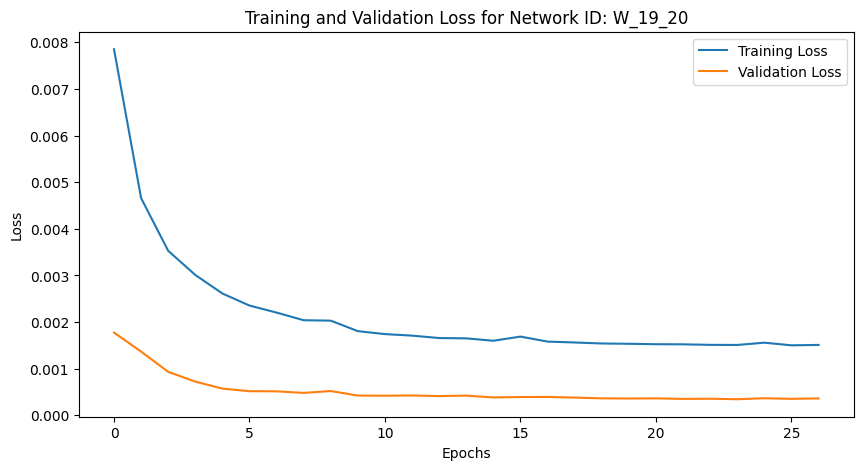

Training Progress:   0%|          | 26/10000 [01:05<7:01:28,  2.54s/epoch, loss=0.00151, val_loss=0.000363, patience=1]


Mean Squared Error: 0.0024954764466742574
Iteration: 380, Window Size: 20, Y Days Ahead: 1
X shape: (3787, 20)
y shape: (3787, 1)
Initializing network with layer sizes: [20, 128, 64, 32, 1]
params_W_20_1.npz not found. Using randomly initialized parameters.
Training data shape: (3029, 20), (3029, 1), Validation data shape: (379, 20), (379, 1), Testing data shape: (379, 20), (379, 1)
Parameters loaded from params_W_20_1.npz


Training Progress:   0%|          | 14/10000 [00:35<6:22:56,  2.30s/epoch, loss=0.000213, val_loss=5.86e-5, patience=1]

Epoch 15/10000, Training Loss: 0.000213, Validation Loss: 0.000059
Early stopping at epoch 15. Best validation loss: 0.000047


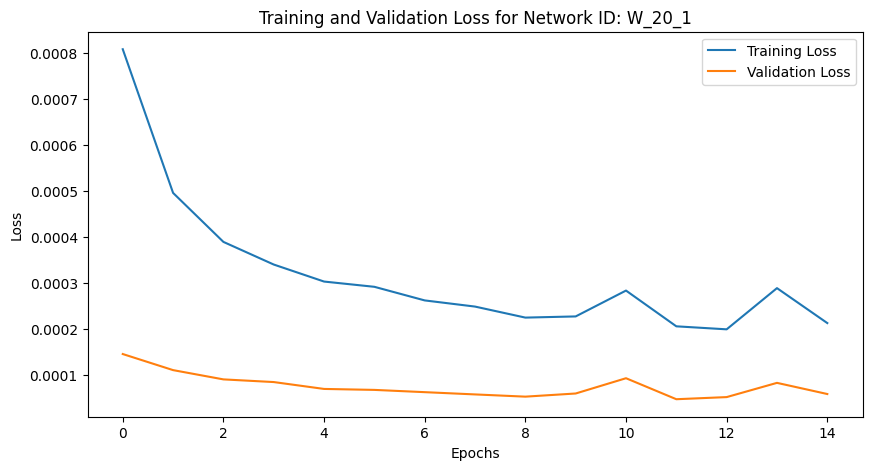

Training Progress:   0%|          | 14/10000 [00:35<6:59:22,  2.52s/epoch, loss=0.000213, val_loss=5.86e-5, patience=1]


Mean Squared Error: 0.0003801324232276503
Iteration: 381, Window Size: 20, Y Days Ahead: 2
X shape: (3786, 20)
y shape: (3786, 2)
Initializing network with layer sizes: [20, 128, 64, 32, 2]
params_W_20_2.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 20), (3028, 2), Validation data shape: (379, 20), (379, 2), Testing data shape: (379, 20), (379, 2)
Parameters loaded from params_W_20_2.npz


Training Progress:   0%|          | 11/10000 [00:28<6:28:54,  2.34s/epoch, loss=0.000352, val_loss=7.64e-5, patience=1]

Epoch 12/10000, Training Loss: 0.000352, Validation Loss: 0.000076
Early stopping at epoch 12. Best validation loss: 0.000076


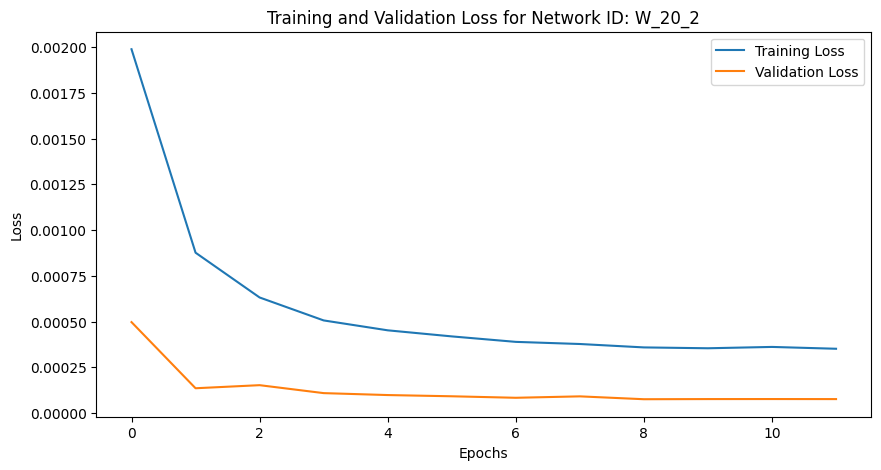

Training Progress:   0%|          | 11/10000 [00:28<7:13:59,  2.61s/epoch, loss=0.000352, val_loss=7.64e-5, patience=1]


Mean Squared Error: 0.0005132270578787721
Iteration: 382, Window Size: 20, Y Days Ahead: 3
X shape: (3785, 20)
y shape: (3785, 3)
Initializing network with layer sizes: [20, 128, 64, 32, 3]
params_W_20_3.npz not found. Using randomly initialized parameters.
Training data shape: (3028, 20), (3028, 3), Validation data shape: (378, 20), (378, 3), Testing data shape: (379, 20), (379, 3)
Parameters loaded from params_W_20_3.npz


Training Progress:   0%|          | 26/10000 [01:02<6:28:28,  2.34s/epoch, loss=0.000352, val_loss=7.11e-5, patience=1]

Epoch 27/10000, Training Loss: 0.000352, Validation Loss: 0.000071
Early stopping at epoch 27. Best validation loss: 0.000064


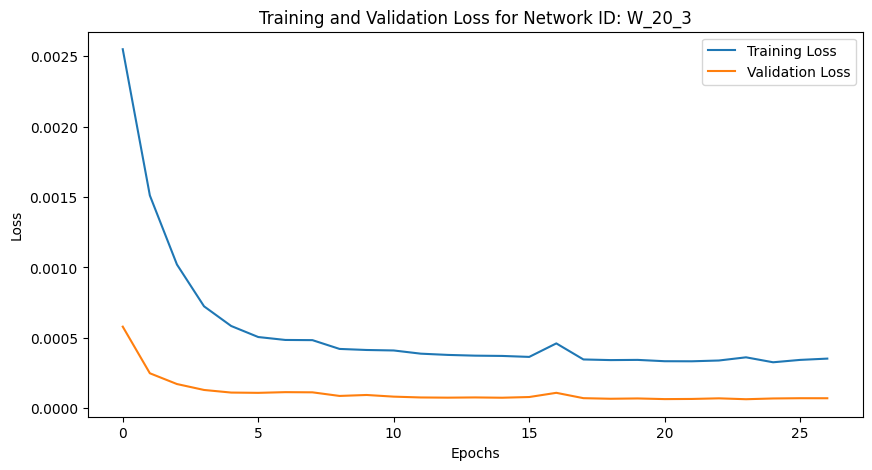

Training Progress:   0%|          | 26/10000 [01:03<6:45:14,  2.44s/epoch, loss=0.000352, val_loss=7.11e-5, patience=1]


Mean Squared Error: 0.0005589654453934925
Iteration: 383, Window Size: 20, Y Days Ahead: 4
X shape: (3784, 20)
y shape: (3784, 4)
Initializing network with layer sizes: [20, 128, 64, 32, 4]
params_W_20_4.npz not found. Using randomly initialized parameters.
Training data shape: (3027, 20), (3027, 4), Validation data shape: (378, 20), (378, 4), Testing data shape: (379, 20), (379, 4)
Parameters loaded from params_W_20_4.npz


Training Progress:   0%|          | 22/10000 [00:54<6:40:38,  2.41s/epoch, loss=0.000433, val_loss=9.13e-5, patience=1] 

Epoch 23/10000, Training Loss: 0.000433, Validation Loss: 0.000091
Early stopping at epoch 23. Best validation loss: 0.000080


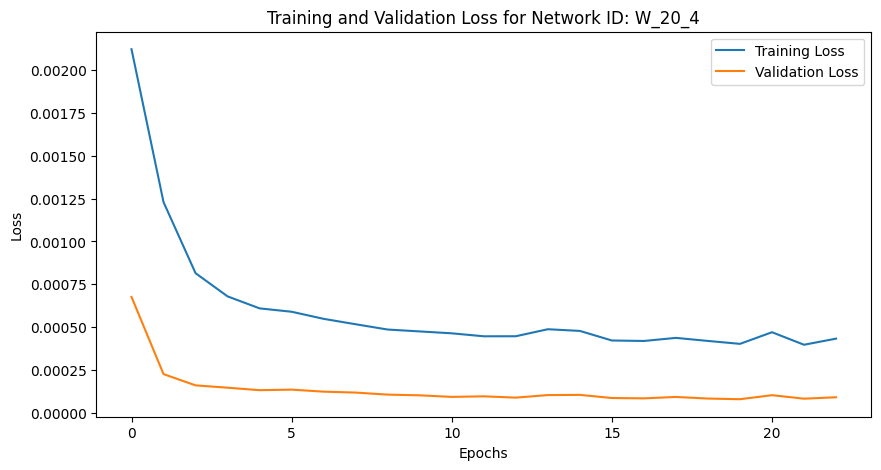

Training Progress:   0%|          | 22/10000 [00:54<6:51:28,  2.47s/epoch, loss=0.000433, val_loss=9.13e-5, patience=1]


Mean Squared Error: 0.0006539101454115555
Iteration: 384, Window Size: 20, Y Days Ahead: 5
X shape: (3783, 20)
y shape: (3783, 5)
Initializing network with layer sizes: [20, 128, 64, 32, 5]
params_W_20_5.npz not found. Using randomly initialized parameters.
Training data shape: (3026, 20), (3026, 5), Validation data shape: (378, 20), (378, 5), Testing data shape: (379, 20), (379, 5)
Parameters loaded from params_W_20_5.npz


Training Progress:   0%|          | 19/10000 [00:48<6:44:35,  2.43s/epoch, loss=0.000557, val_loss=0.000121, patience=1]

Epoch 20/10000, Training Loss: 0.000557, Validation Loss: 0.000121
Early stopping at epoch 20. Best validation loss: 0.000108


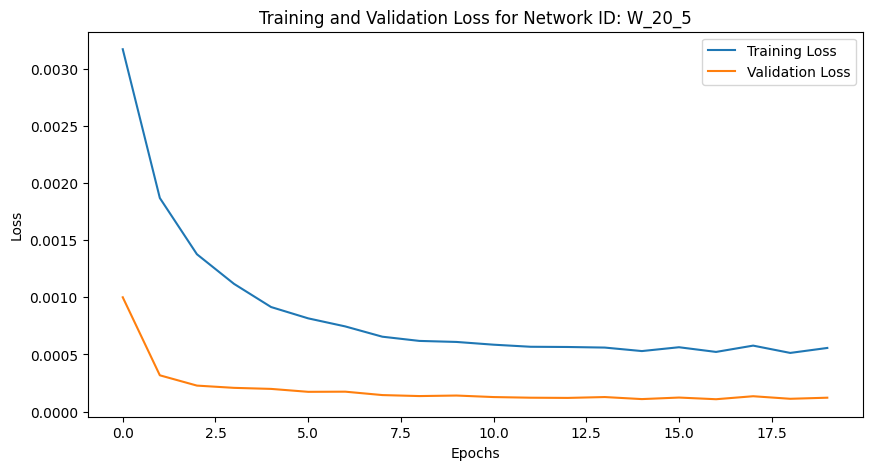

Training Progress:   0%|          | 19/10000 [00:48<7:06:56,  2.57s/epoch, loss=0.000557, val_loss=0.000121, patience=1]


Mean Squared Error: 0.0008072434565516002
Iteration: 385, Window Size: 20, Y Days Ahead: 6
X shape: (3782, 20)
y shape: (3782, 6)
Initializing network with layer sizes: [20, 128, 64, 32, 6]
params_W_20_6.npz not found. Using randomly initialized parameters.
Training data shape: (3025, 20), (3025, 6), Validation data shape: (378, 20), (378, 6), Testing data shape: (379, 20), (379, 6)
Parameters loaded from params_W_20_6.npz


Training Progress:   0%|          | 26/10000 [01:06<6:35:01,  2.38s/epoch, loss=0.000554, val_loss=0.00011, patience=1] 

Epoch 27/10000, Training Loss: 0.000554, Validation Loss: 0.000110
Early stopping at epoch 27. Best validation loss: 0.000110


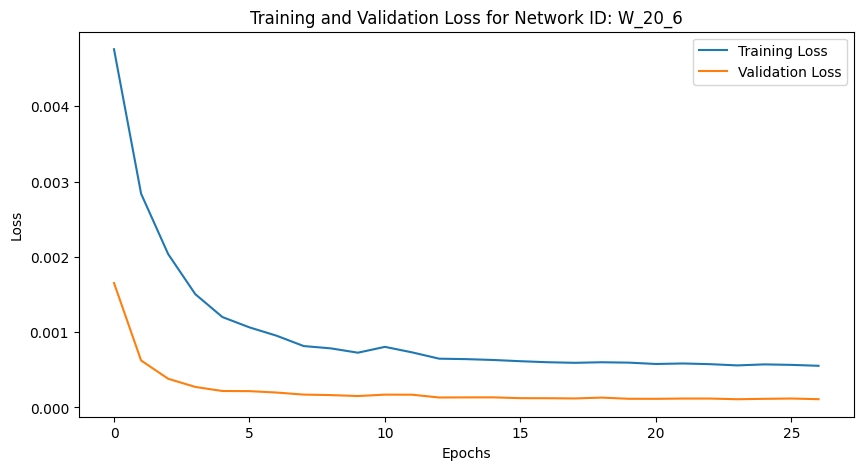

Training Progress:   0%|          | 26/10000 [01:07<7:08:52,  2.58s/epoch, loss=0.000554, val_loss=0.00011, patience=1]


Mean Squared Error: 0.000917637015710865
Iteration: 386, Window Size: 20, Y Days Ahead: 7
X shape: (3781, 20)
y shape: (3781, 7)
Initializing network with layer sizes: [20, 128, 64, 32, 7]
params_W_20_7.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 20), (3024, 7), Validation data shape: (378, 20), (378, 7), Testing data shape: (379, 20), (379, 7)
Parameters loaded from params_W_20_7.npz


Training Progress:   0%|          | 34/10000 [01:26<6:33:07,  2.37s/epoch, loss=0.000599, val_loss=0.000121, patience=1]

Epoch 35/10000, Training Loss: 0.000599, Validation Loss: 0.000121
Early stopping at epoch 35. Best validation loss: 0.000120


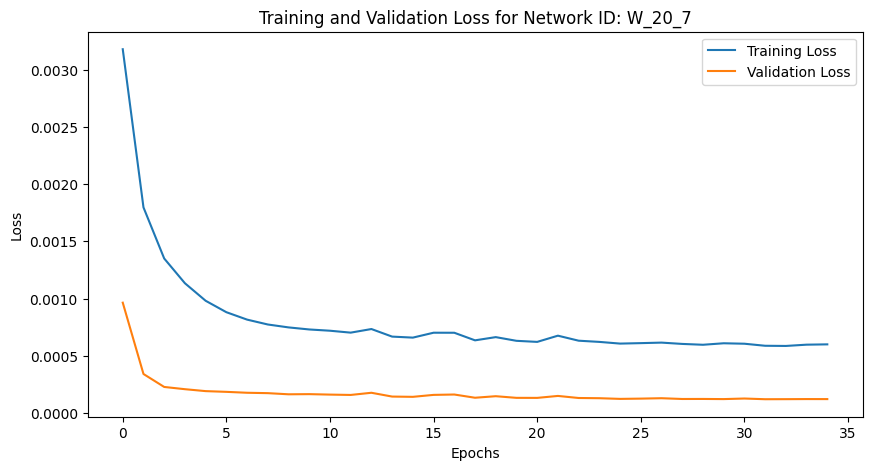

Training Progress:   0%|          | 34/10000 [01:26<7:03:30,  2.55s/epoch, loss=0.000599, val_loss=0.000121, patience=1]


Mean Squared Error: 0.0009038731270561161
Iteration: 387, Window Size: 20, Y Days Ahead: 8
X shape: (3780, 20)
y shape: (3780, 8)
Initializing network with layer sizes: [20, 128, 64, 32, 8]
params_W_20_8.npz not found. Using randomly initialized parameters.
Training data shape: (3024, 20), (3024, 8), Validation data shape: (378, 20), (378, 8), Testing data shape: (378, 20), (378, 8)
Parameters loaded from params_W_20_8.npz


Training Progress:   0%|          | 28/10000 [01:12<7:01:06,  2.53s/epoch, loss=0.000667, val_loss=0.000142, patience=1]

Epoch 29/10000, Training Loss: 0.000667, Validation Loss: 0.000142
Early stopping at epoch 29. Best validation loss: 0.000137


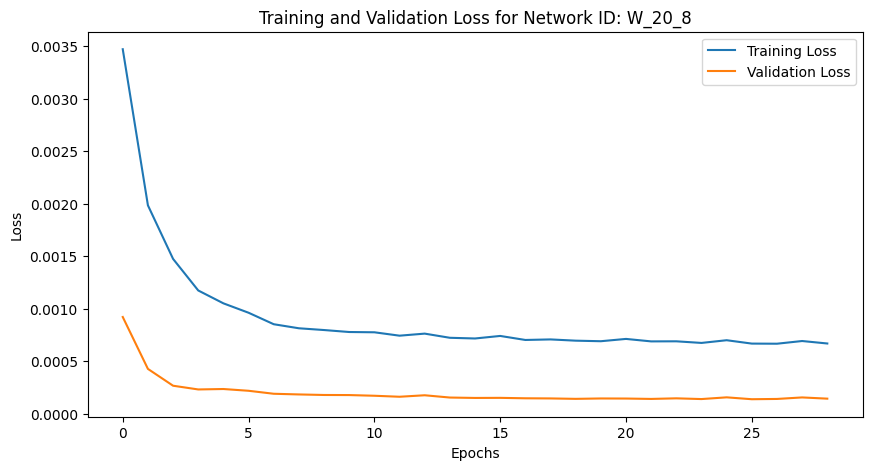

Training Progress:   0%|          | 28/10000 [01:13<7:14:54,  2.62s/epoch, loss=0.000667, val_loss=0.000142, patience=1]


Mean Squared Error: 0.0010672926432133156
Iteration: 388, Window Size: 20, Y Days Ahead: 9
X shape: (3779, 20)
y shape: (3779, 9)
Initializing network with layer sizes: [20, 128, 64, 32, 9]
params_W_20_9.npz not found. Using randomly initialized parameters.
Training data shape: (3023, 20), (3023, 9), Validation data shape: (378, 20), (378, 9), Testing data shape: (378, 20), (378, 9)
Parameters loaded from params_W_20_9.npz


Training Progress:   0%|          | 19/10000 [00:47<6:31:10,  2.35s/epoch, loss=0.000812, val_loss=0.000193, patience=1]

Epoch 20/10000, Training Loss: 0.000812, Validation Loss: 0.000193
Early stopping at epoch 20. Best validation loss: 0.000177


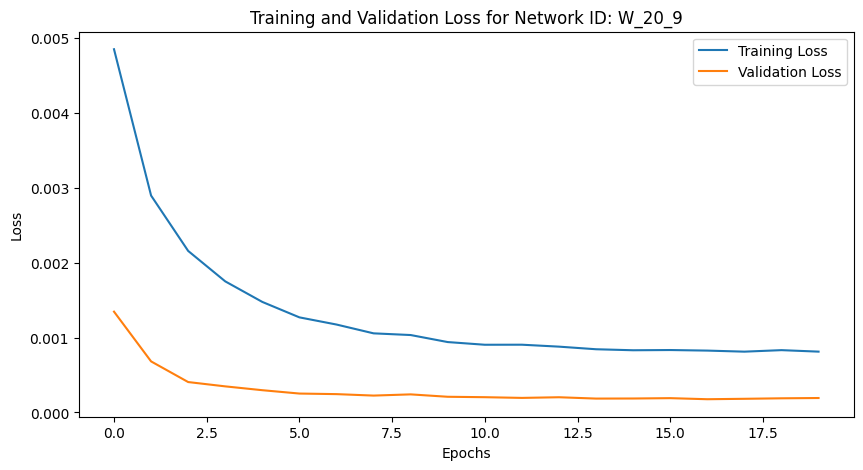

Training Progress:   0%|          | 19/10000 [00:47<6:59:47,  2.52s/epoch, loss=0.000812, val_loss=0.000193, patience=1]


Mean Squared Error: 0.0012786614489888608
Iteration: 389, Window Size: 20, Y Days Ahead: 10
X shape: (3778, 20)
y shape: (3778, 10)
Initializing network with layer sizes: [20, 128, 64, 32, 10]
params_W_20_10.npz not found. Using randomly initialized parameters.
Training data shape: (3022, 20), (3022, 10), Validation data shape: (378, 20), (378, 10), Testing data shape: (378, 20), (378, 10)
Parameters loaded from params_W_20_10.npz


Training Progress:   0%|          | 22/10000 [00:55<6:33:01,  2.36s/epoch, loss=0.000805, val_loss=0.000176, patience=1]

Epoch 23/10000, Training Loss: 0.000805, Validation Loss: 0.000176
Early stopping at epoch 23. Best validation loss: 0.000174


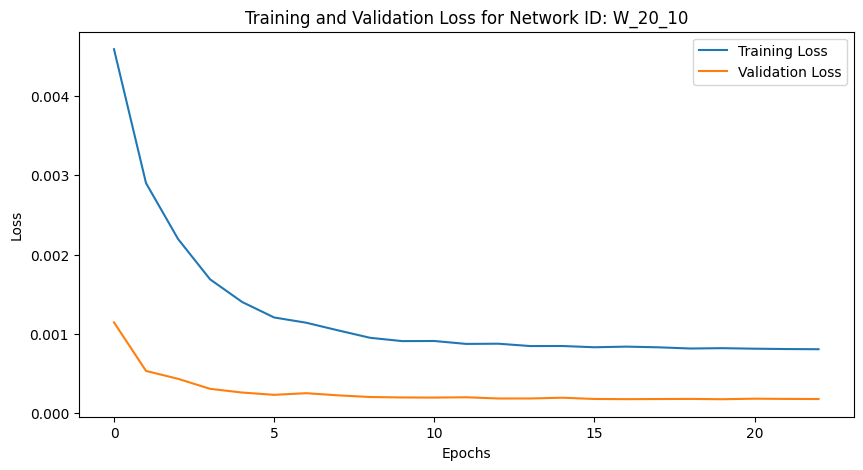

Training Progress:   0%|          | 22/10000 [00:55<7:01:12,  2.53s/epoch, loss=0.000805, val_loss=0.000176, patience=1]


Mean Squared Error: 0.0012751396137587647
Iteration: 390, Window Size: 20, Y Days Ahead: 11
X shape: (3777, 20)
y shape: (3777, 11)
Initializing network with layer sizes: [20, 128, 64, 32, 11]
params_W_20_11.npz not found. Using randomly initialized parameters.
Training data shape: (3021, 20), (3021, 11), Validation data shape: (378, 20), (378, 11), Testing data shape: (378, 20), (378, 11)
Parameters loaded from params_W_20_11.npz


Training Progress:   0%|          | 34/10000 [01:23<6:37:35,  2.39s/epoch, loss=0.000845, val_loss=0.00019, patience=1] 

Epoch 35/10000, Training Loss: 0.000845, Validation Loss: 0.000190
Early stopping at epoch 35. Best validation loss: 0.000182


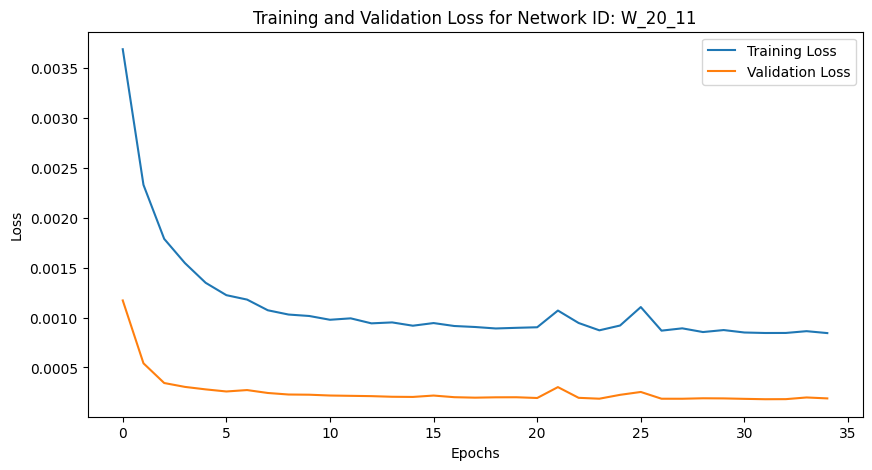

Training Progress:   0%|          | 34/10000 [01:23<6:47:46,  2.45s/epoch, loss=0.000845, val_loss=0.00019, patience=1]


Mean Squared Error: 0.0013271714084495381
Iteration: 391, Window Size: 20, Y Days Ahead: 12
X shape: (3776, 20)
y shape: (3776, 12)
Initializing network with layer sizes: [20, 128, 64, 32, 12]
params_W_20_12.npz not found. Using randomly initialized parameters.
Training data shape: (3020, 20), (3020, 12), Validation data shape: (378, 20), (378, 12), Testing data shape: (378, 20), (378, 12)
Parameters loaded from params_W_20_12.npz


Training Progress:   0%|          | 17/10000 [00:43<6:50:18,  2.47s/epoch, loss=0.000945, val_loss=0.000214, patience=1]

Epoch 18/10000, Training Loss: 0.000945, Validation Loss: 0.000214
Early stopping at epoch 18. Best validation loss: 0.000214


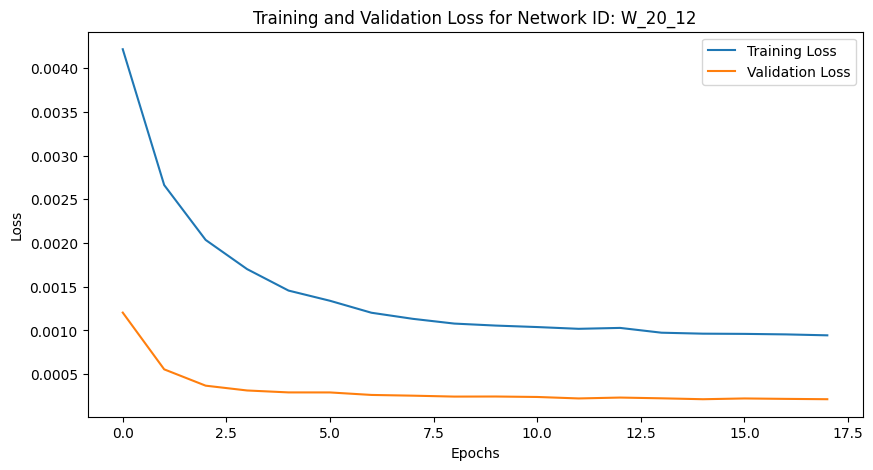

Training Progress:   0%|          | 17/10000 [00:43<7:07:33,  2.57s/epoch, loss=0.000945, val_loss=0.000214, patience=1]


Mean Squared Error: 0.0014886153252980797
Iteration: 392, Window Size: 20, Y Days Ahead: 13
X shape: (3775, 20)
y shape: (3775, 13)
Initializing network with layer sizes: [20, 128, 64, 32, 13]
params_W_20_13.npz not found. Using randomly initialized parameters.
Training data shape: (3020, 20), (3020, 13), Validation data shape: (377, 20), (377, 13), Testing data shape: (378, 20), (378, 13)
Parameters loaded from params_W_20_13.npz


Training Progress:   0%|          | 28/10000 [01:09<7:00:58,  2.53s/epoch, loss=0.000979, val_loss=0.000216, patience=1]

Epoch 29/10000, Training Loss: 0.000979, Validation Loss: 0.000216
Early stopping at epoch 29. Best validation loss: 0.000215


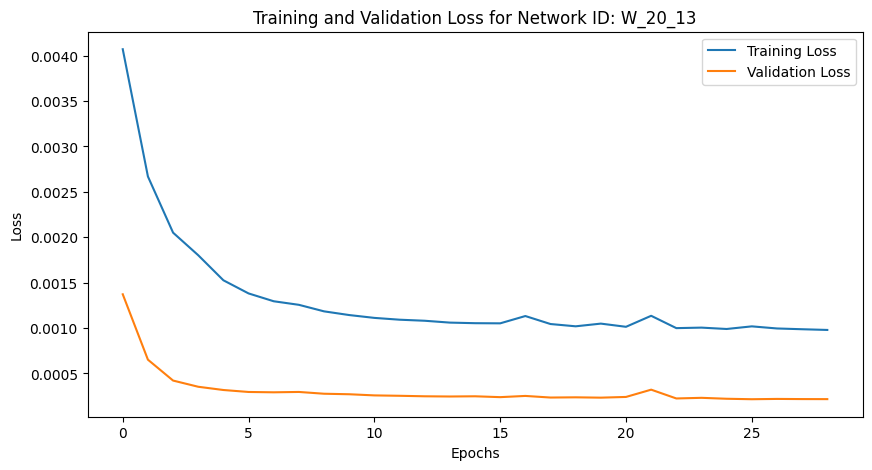

Training Progress:   0%|          | 28/10000 [01:10<6:57:14,  2.51s/epoch, loss=0.000979, val_loss=0.000216, patience=1]


Mean Squared Error: 0.0015975507908621129
Iteration: 393, Window Size: 20, Y Days Ahead: 14
X shape: (3774, 20)
y shape: (3774, 14)
Initializing network with layer sizes: [20, 128, 64, 32, 14]
params_W_20_14.npz not found. Using randomly initialized parameters.
Training data shape: (3019, 20), (3019, 14), Validation data shape: (377, 20), (377, 14), Testing data shape: (378, 20), (378, 14)
Parameters loaded from params_W_20_14.npz


Training Progress:   0%|          | 24/10000 [01:00<6:44:43,  2.43s/epoch, loss=0.0011, val_loss=0.000238, patience=1] 

Epoch 25/10000, Training Loss: 0.001102, Validation Loss: 0.000238
Early stopping at epoch 25. Best validation loss: 0.000236


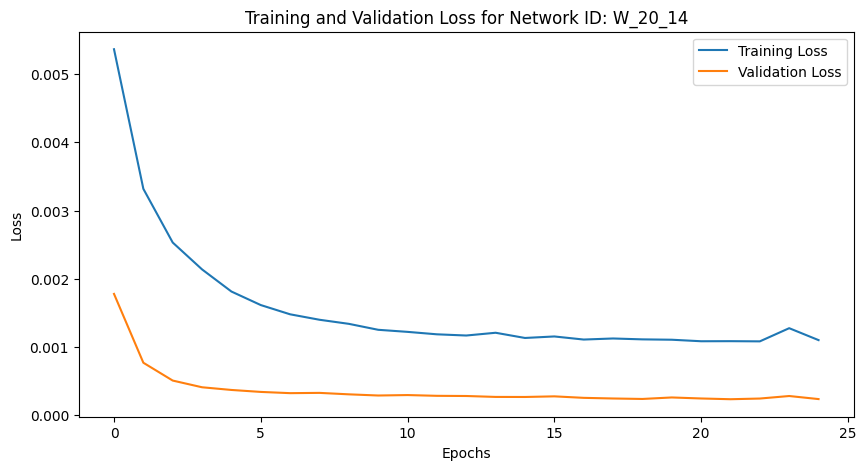

Training Progress:   0%|          | 24/10000 [01:01<7:04:07,  2.55s/epoch, loss=0.0011, val_loss=0.000238, patience=1]


Mean Squared Error: 0.001705561924864976
Iteration: 394, Window Size: 20, Y Days Ahead: 15
X shape: (3773, 20)
y shape: (3773, 15)
Initializing network with layer sizes: [20, 128, 64, 32, 15]
params_W_20_15.npz not found. Using randomly initialized parameters.
Training data shape: (3018, 20), (3018, 15), Validation data shape: (377, 20), (377, 15), Testing data shape: (378, 20), (378, 15)
Parameters loaded from params_W_20_15.npz


Training Progress:   0%|          | 18/10000 [00:52<7:04:22,  2.55s/epoch, loss=0.00117, val_loss=0.000277, patience=1]

Epoch 19/10000, Training Loss: 0.001175, Validation Loss: 0.000277
Early stopping at epoch 19. Best validation loss: 0.000265


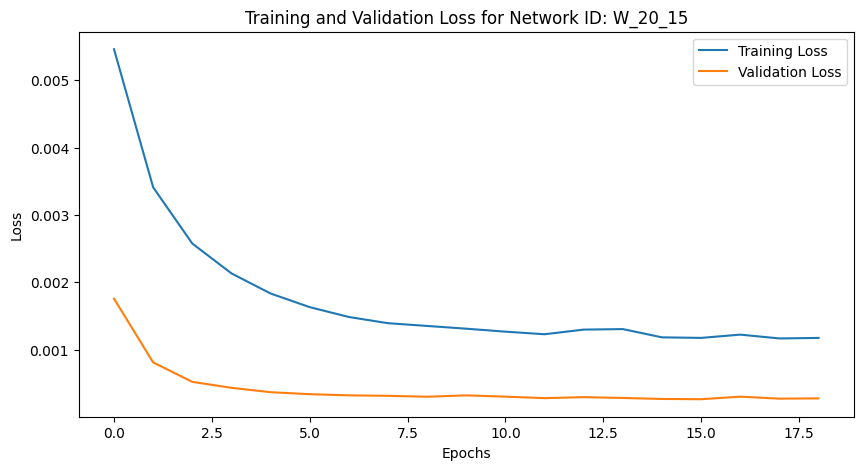

Training Progress:   0%|          | 18/10000 [00:53<8:09:52,  2.94s/epoch, loss=0.00117, val_loss=0.000277, patience=1]


Mean Squared Error: 0.0018434842275108396
Iteration: 395, Window Size: 20, Y Days Ahead: 16
X shape: (3772, 20)
y shape: (3772, 16)
Initializing network with layer sizes: [20, 128, 64, 32, 16]
params_W_20_16.npz not found. Using randomly initialized parameters.
Training data shape: (3017, 20), (3017, 16), Validation data shape: (377, 20), (377, 16), Testing data shape: (378, 20), (378, 16)
Parameters loaded from params_W_20_16.npz


Training Progress:   0%|          | 20/10000 [00:54<7:09:40,  2.58s/epoch, loss=0.00124, val_loss=0.000287, patience=1]

Epoch 21/10000, Training Loss: 0.001237, Validation Loss: 0.000287
Early stopping at epoch 21. Best validation loss: 0.000285


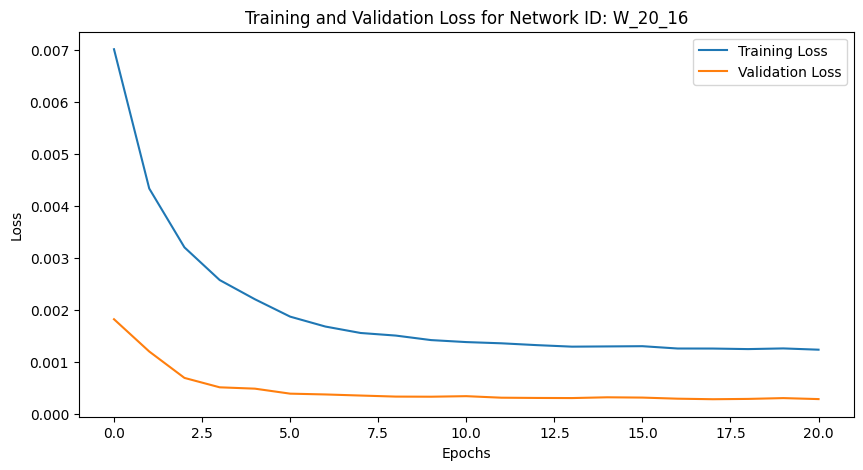

Training Progress:   0%|          | 20/10000 [00:55<7:39:55,  2.77s/epoch, loss=0.00124, val_loss=0.000287, patience=1]


Mean Squared Error: 0.002007335041686222
Iteration: 396, Window Size: 20, Y Days Ahead: 17
X shape: (3771, 20)
y shape: (3771, 17)
Initializing network with layer sizes: [20, 128, 64, 32, 17]
params_W_20_17.npz not found. Using randomly initialized parameters.
Training data shape: (3016, 20), (3016, 17), Validation data shape: (377, 20), (377, 17), Testing data shape: (378, 20), (378, 17)
Parameters loaded from params_W_20_17.npz


Training Progress:   0%|          | 20/10000 [00:56<7:13:48,  2.61s/epoch, loss=0.00136, val_loss=0.000351, patience=1]

Epoch 21/10000, Training Loss: 0.001365, Validation Loss: 0.000351
Early stopping at epoch 21. Best validation loss: 0.000301


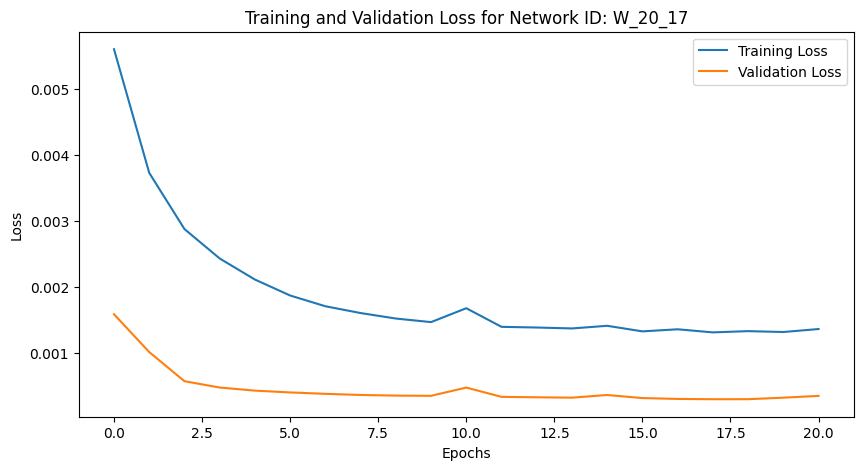

Training Progress:   0%|          | 20/10000 [00:56<7:49:46,  2.82s/epoch, loss=0.00136, val_loss=0.000351, patience=1]


Mean Squared Error: 0.0020695928100162896
Iteration: 397, Window Size: 20, Y Days Ahead: 18
X shape: (3770, 20)
y shape: (3770, 18)
Initializing network with layer sizes: [20, 128, 64, 32, 18]
params_W_20_18.npz not found. Using randomly initialized parameters.
Training data shape: (3016, 20), (3016, 18), Validation data shape: (377, 20), (377, 18), Testing data shape: (377, 20), (377, 18)
Parameters loaded from params_W_20_18.npz


Training Progress:   0%|          | 14/10000 [00:38<7:29:23,  2.70s/epoch, loss=0.00141, val_loss=0.000335, patience=1]

Epoch 15/10000, Training Loss: 0.001407, Validation Loss: 0.000335
Early stopping at epoch 15. Best validation loss: 0.000327


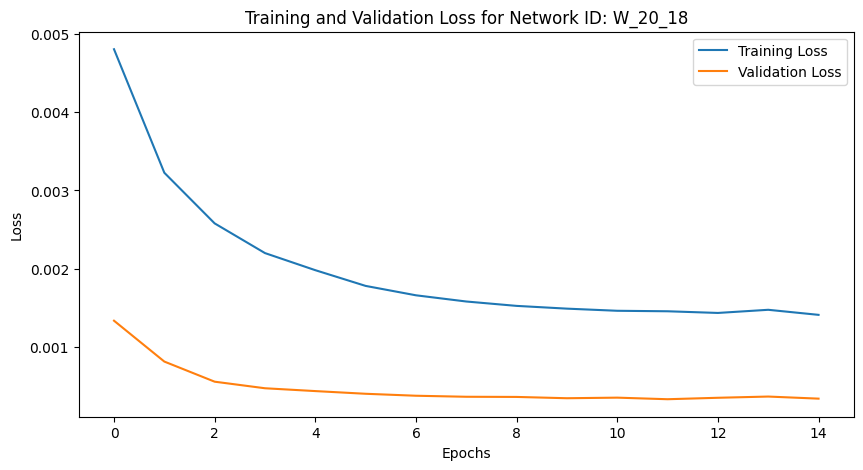

Training Progress:   0%|          | 14/10000 [00:39<7:48:49,  2.82s/epoch, loss=0.00141, val_loss=0.000335, patience=1]


Mean Squared Error: 0.0023618633983408296
Iteration: 398, Window Size: 20, Y Days Ahead: 19
X shape: (3769, 20)
y shape: (3769, 19)
Initializing network with layer sizes: [20, 128, 64, 32, 19]
params_W_20_19.npz not found. Using randomly initialized parameters.
Training data shape: (3015, 20), (3015, 19), Validation data shape: (377, 20), (377, 19), Testing data shape: (377, 20), (377, 19)
Parameters loaded from params_W_20_19.npz


Training Progress:   0%|          | 14/10000 [00:40<7:15:04,  2.61s/epoch, loss=0.00152, val_loss=0.000391, patience=1]

Epoch 15/10000, Training Loss: 0.001521, Validation Loss: 0.000391
Early stopping at epoch 15. Best validation loss: 0.000369


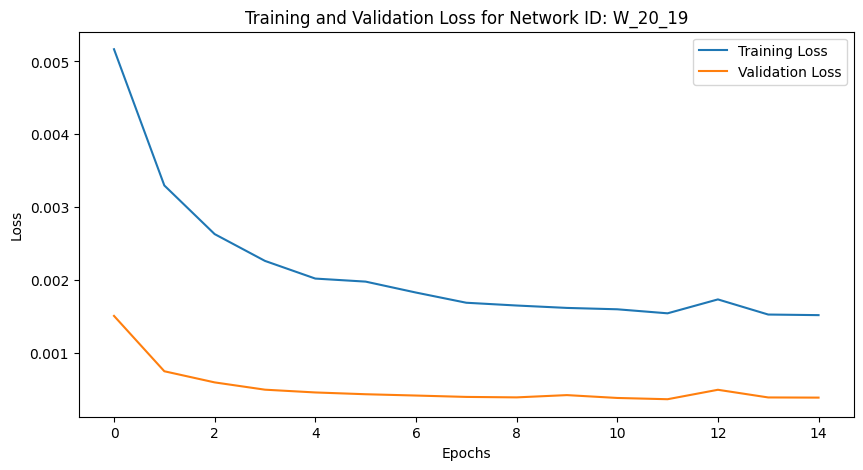

Training Progress:   0%|          | 14/10000 [00:40<8:01:09,  2.89s/epoch, loss=0.00152, val_loss=0.000391, patience=1]


Mean Squared Error: 0.002476529994223376
Iteration: 399, Window Size: 20, Y Days Ahead: 20
X shape: (3768, 20)
y shape: (3768, 20)
Initializing network with layer sizes: [20, 128, 64, 32, 20]
params_W_20_20.npz not found. Using randomly initialized parameters.
Training data shape: (3014, 20), (3014, 20), Validation data shape: (377, 20), (377, 20), Testing data shape: (377, 20), (377, 20)
Parameters loaded from params_W_20_20.npz


Training Progress:   0%|          | 20/10000 [00:55<7:17:46,  2.63s/epoch, loss=0.00166, val_loss=0.000453, patience=1]

Epoch 21/10000, Training Loss: 0.001663, Validation Loss: 0.000453
Early stopping at epoch 21. Best validation loss: 0.000354


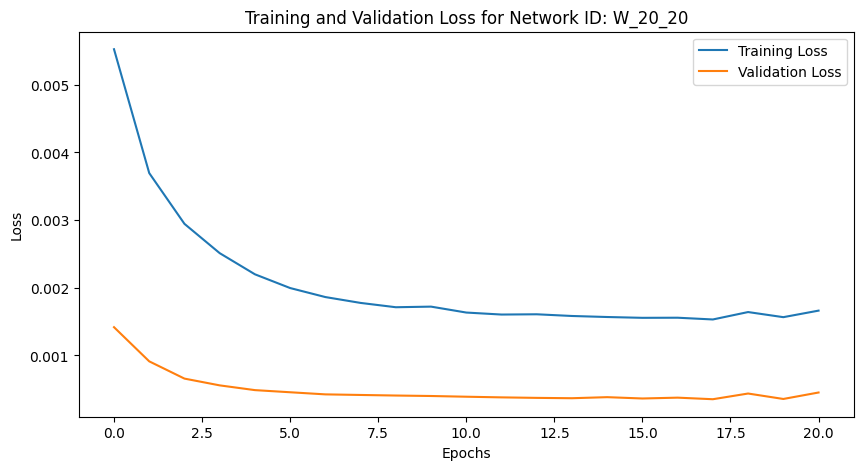

Training Progress:   0%|          | 20/10000 [00:55<7:44:38,  2.79s/epoch, loss=0.00166, val_loss=0.000453, patience=1]

Mean Squared Error: 0.0025101513362502394


In [6]:
def functionError(window_size, y_days_ahead):
    X, y = create_dataset(scaled_data, window_size, y_days_ahead)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
    X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5, shuffle=False)
    
    #Test Manual BPNN
    layer_sizes = [X_train.shape[1], 128, 64, 32, y_train.shape[1]]
    model_name = f"W_{X_train.shape[1]}_{y_train.shape[1]}"
    model_manual = BPNN(layer_sizes, model_name)
    print(f"Training data shape: {X_train.shape}, {y_train.shape}, Validation data shape: {X_val.shape}, {y_val.shape}, Testing data shape: {X_test.shape}, {y_test.shape}")
    history = model_manual.train(X_train, y_train, X_val, y_val, epochs = 10000,batch_size = 1 , shuffle = True, patience = 3, learning_rate=1e-5)
    predictions = model_manual.predict(X_test)
    mse = mean_squared_error(y_test, predictions)
    print(f"Mean Squared Error: {mse}")

    return mse

for i in range(numberOfDataPoints):
    window_size = minWindowsInput + i * distanceBetweenDataPointsWindows
    for j in range(numberOfDataPoints):
        y_days_ahead = minWindowsPredicted + j * distanceBetweenDataPointsPredict
        print("=====================================================================================================")
        print(f"Iteration: {iteration}, Window Size: {window_size}, Y Days Ahead: {y_days_ahead}")
        error[i][j] = functionError(window_size, y_days_ahead)
        iteration += 1

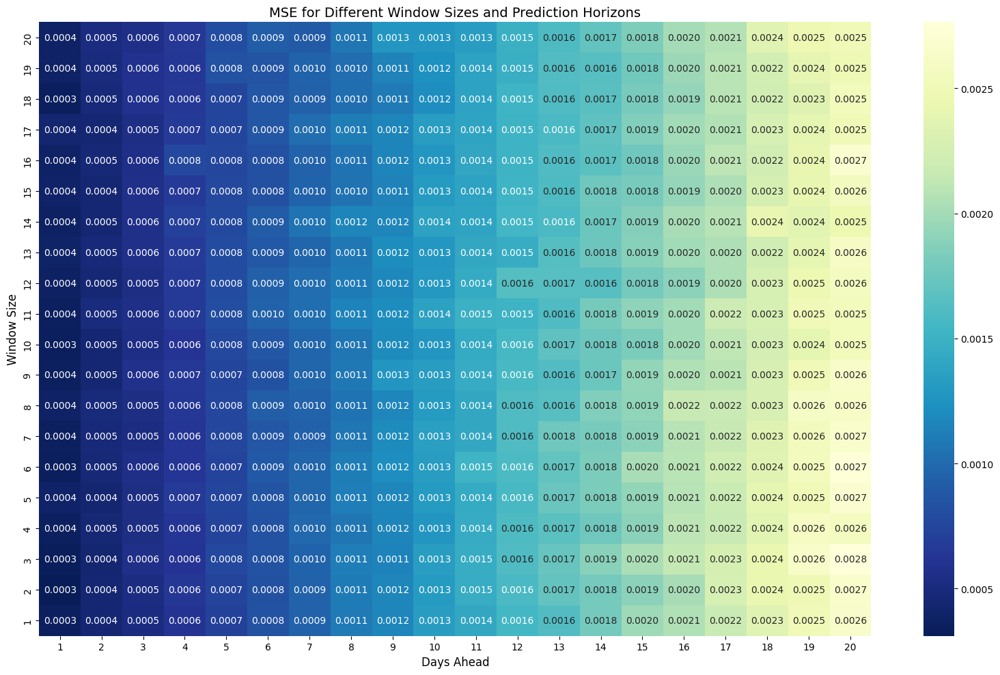

In [ ]:
# Create figure with good size
plt.figure(figsize=(16, 10))

# Create enhanced heatmap
sns.heatmap(np.flipud(error), 
            annot=True,              
            fmt=".4f",               
            cmap="YlGnBu_r",         
            xticklabels=range(minWindowsPredicted, minWindowsPredicted + numberOfDataPoints * distanceBetweenDataPointsPredict, distanceBetweenDataPointsPredict),  # X-axis labels (1-10)
            yticklabels=range(minWindowsInput + numberOfDataPoints* distanceBetweenDataPointsWindows -distanceBetweenDataPointsWindows, minWindowsInput - 1, -distanceBetweenDataPointsWindows))  # Y-axis labels (1-10)

# Add axis labels and title
plt.xlabel('Days Ahead', fontsize=12)
plt.ylabel('Window Size', fontsize=12)
plt.title('MSE for Different Window Sizes and Prediction Horizons', fontsize=14)

# Save figure before showing
plt.tight_layout()
os.makedirs('./res_main', exist_ok=True)
plt.savefig('./res_main/window_analysis_heatmap.png', dpi=300)
plt.show()

X shape: (3806, 1)
y shape: (3806, 1)
Initializing network with layer sizes: [1, 128, 64, 32, 1]
Parameters loaded from params_W_1_1.npz


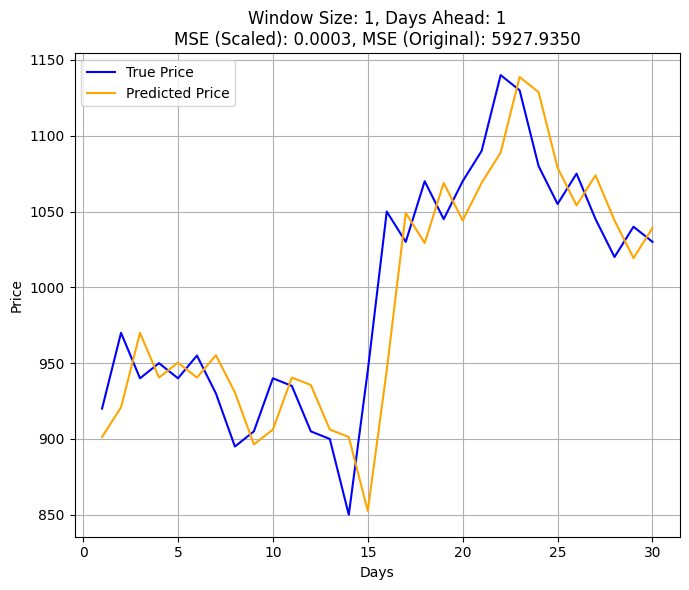

X shape: (3787, 20)
y shape: (3787, 1)
Initializing network with layer sizes: [20, 128, 64, 32, 1]
Parameters loaded from params_W_20_1.npz


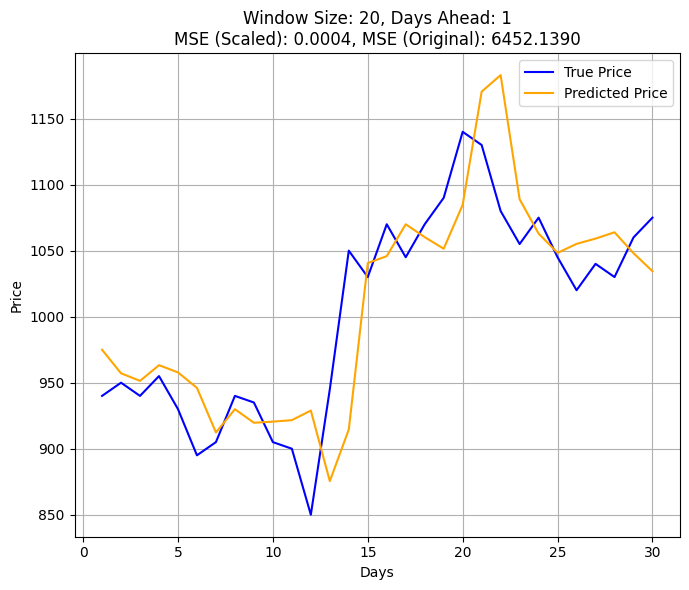

X shape: (3787, 1)
y shape: (3787, 20)
Initializing network with layer sizes: [1, 128, 64, 32, 20]
Parameters loaded from params_W_1_20.npz


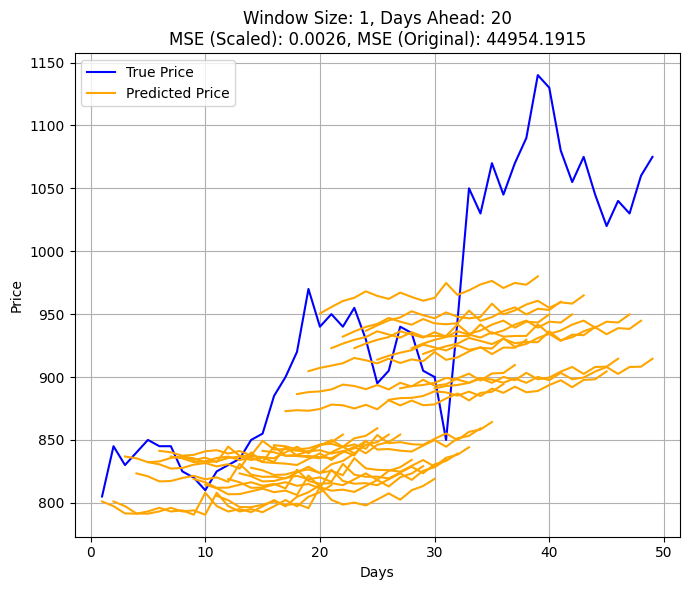

X shape: (3768, 20)
y shape: (3768, 20)
Initializing network with layer sizes: [20, 128, 64, 32, 20]
Parameters loaded from params_W_20_20.npz


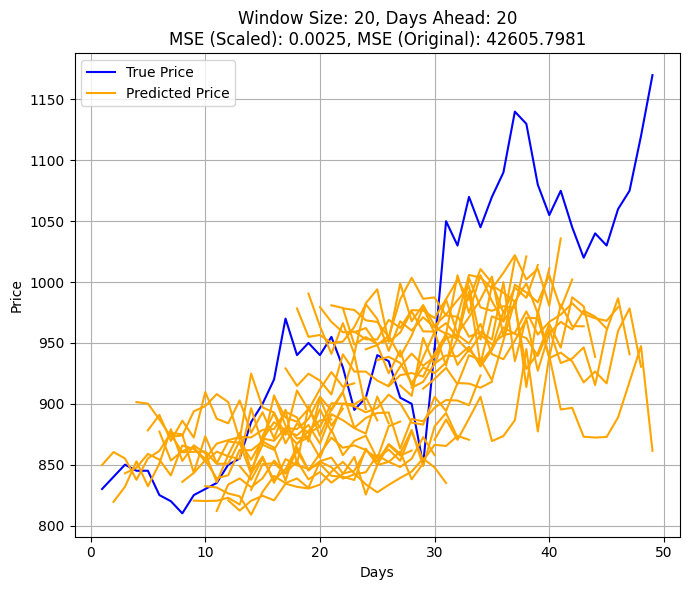

In [ ]:
# Function remains the same
def visualize_case(window_size, days_ahead, scaler):
    # Create dataset with specific parameters
    X, y = create_dataset(scaled_data, window_size, days_ahead)
    
    # Use the same splitting approach as defined previously
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
    X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5, shuffle=False)
    
    # Load the appropriate model
    layer_sizes = [window_size, 128, 64, 32, days_ahead]
    model_name = f"W_{window_size}_{days_ahead}"
    model = BPNN(layer_sizes, model_name)
    
    # Generate predictions
    predictions = model.predict(X_test)
    
    # Calculate MSE on scaled data
    scaled_mse = mean_squared_error(y_test, predictions)
    
    # Inverse transform y_test and predictions to original scale
    y_test_orig = scaler.inverse_transform(y_test.reshape(-1, 1)).reshape(y_test.shape)
    pred_orig = scaler.inverse_transform(predictions.reshape(-1, 1)).reshape(predictions.shape)
    
    # Calculate MSE on original scale
    orig_mse = mean_squared_error(y_test_orig, pred_orig)
    
    return y_test_orig, pred_orig, scaled_mse, orig_mse

# Get min and max values
min_window = minWindowsInput
max_window = minWindowsInput + (numberOfDataPoints - 1) * distanceBetweenDataPointsWindows
min_days_ahead = minWindowsPredicted
max_days_ahead = minWindowsPredicted + (numberOfDataPoints - 1) * distanceBetweenDataPointsPredict

days_shown = 50

# Adjust days_shown based on the number of data points and distance between data points
days_shown -= 20

# Case 1: Min window, min days (single day prediction)

y_test_orig, pred_orig, scaled_mse1, orig_mse1 = visualize_case(min_window, min_days_ahead, scaler)
X = (np.arange(days_shown) + 1) * distanceBetweenDataPointsPredict

plt.figure(figsize=(7, 6))
plt.plot(X, y_test_orig[:days_shown], label='True Price', color='blue')
plt.plot(X, pred_orig[:days_shown], label='Predicted Price', color='orange')
plt.title(f"Window Size: {min_window}, Days Ahead: {min_days_ahead}\nMSE (Scaled): {scaled_mse1:.4f}, MSE (Original): {orig_mse1:.4f}")
plt.xlabel('Days')
plt.ylabel('Price')
plt.legend()
plt.grid()
plt.tight_layout()
plt.savefig('./res_main/case1.png', dpi=300)
plt.show()

# Case 2: Max window, min days (single day prediction)
y_test_orig, pred_orig, scaled_mse2, orig_mse2 = visualize_case(max_window, min_days_ahead, scaler)
X = (np.arange(days_shown) + 1) * distanceBetweenDataPointsPredict

plt.figure(figsize=(7, 6))
plt.plot(X,y_test_orig[:days_shown], label='True Price', color='blue')
plt.plot(X,pred_orig[:days_shown], label='Predicted Price', color='orange')
plt.title(f"Window Size: {max_window}, Days Ahead: {min_days_ahead}\nMSE (Scaled): {scaled_mse2:.4f}, MSE (Original): {orig_mse2:.4f}")
plt.xlabel('Days')
plt.ylabel('Price')
plt.legend()
plt.grid()
plt.tight_layout()
plt.savefig('./res_main/case2.png', dpi=300)
plt.show()


# Case 3: Min window, max days (multiple days prediction)
y_test_orig, pred_orig, scaled_mse3, orig_mse3 = visualize_case(min_window, max_days_ahead, scaler)
X_test = (np.arange(days_shown) + 1) * distanceBetweenDataPointsPredict
X_pred = np.arange(len(pred_orig[0,:])) + 1

plt.figure(figsize=(7, 6))
plt.plot(X_test,y_test_orig[:days_shown, 0], label='True Price', color='blue')
plt.plot(np.arange(len(y_test_orig[days_shown-1, :])) + days_shown, y_test_orig[days_shown-1, :], color='blue')


for day in range(days_shown):
    if day == 1:
        plt.plot(X_pred + day, pred_orig[day, :], label='Predicted Price', color='orange')
    else:   
        plt.plot(X_pred + day, pred_orig[day, :], color='orange')

plt.title(f"Window Size: {min_window}, Days Ahead: {max_days_ahead}\nMSE (Scaled): {scaled_mse3:.4f}, MSE (Original): {orig_mse3:.4f}")
plt.xlabel('Days')
plt.ylabel('Price')
plt.legend()
plt.grid()
plt.tight_layout()
plt.savefig('./res_main/case3.png', dpi=300)
plt.show()

# Case 4: Max window, max days (multiple days prediction)
y_test_orig, pred_orig, scaled_mse4, orig_mse4 = visualize_case(max_window, max_days_ahead, scaler)
X_test = (np.arange(days_shown) + 1) * distanceBetweenDataPointsPredict
X_pred = np.arange(len(pred_orig[0,:])) + 1

plt.figure(figsize=(7, 6))
plt.plot(X_test,y_test_orig[:days_shown, 0], label='True Price', color='blue')
plt.plot(np.arange(len(y_test_orig[days_shown-1, :])) + days_shown, y_test_orig[days_shown-1, :], color='blue')

for day in range(days_shown):
    if day == 1:
        plt.plot(X_pred + day, pred_orig[day, :], label='Predicted Price', color='orange')
    else:   
        plt.plot(X_pred + day, pred_orig[day, :], color='orange')

plt.title(f"Window Size: {max_window}, Days Ahead: {max_days_ahead}\nMSE (Scaled): {scaled_mse4:.4f}, MSE (Original): {orig_mse4:.4f}")
plt.xlabel('Days')
plt.ylabel('Price')
plt.legend()
plt.grid()
plt.tight_layout()
plt.savefig('./res_main/case4.png', dpi=300)
plt.show()


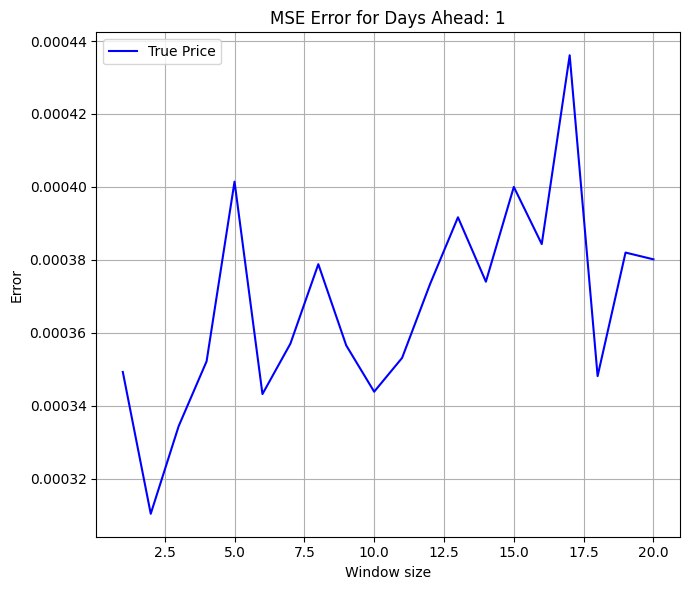

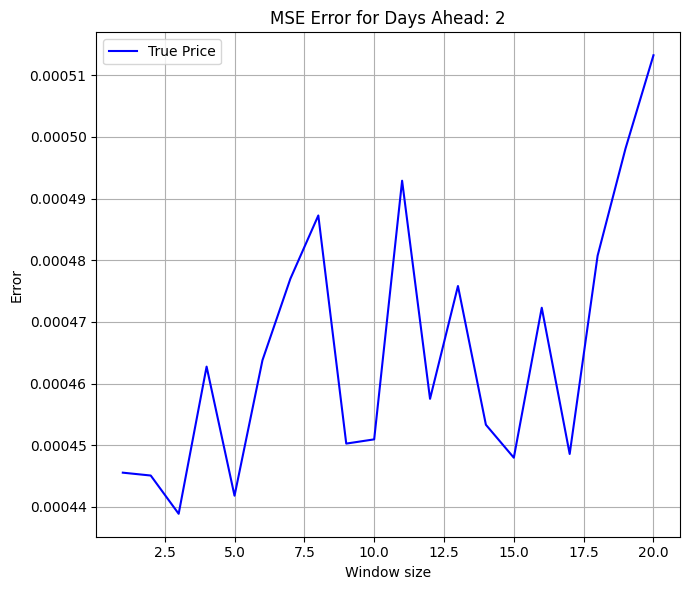

In [ ]:
window_sizes = np.arange(minWindowsInput, minWindowsInput + numberOfDataPoints * distanceBetweenDataPointsWindows, distanceBetweenDataPointsWindows)

plt.figure(figsize=(7, 6))
plt.plot(window_sizes, error[:, 0], label='True Price', color='blue')
plt.title(f"MSE Error for Days Ahead: 1")
plt.xlabel('Window size')
plt.ylabel('Error')
plt.legend()
plt.grid()
plt.tight_layout()
plt.savefig('./res_main/error for y win 1.png', dpi=300)
plt.show()

plt.figure(figsize=(7, 6))
plt.plot(window_sizes, error[:, 1], label='True Price', color='blue')
plt.title(f"MSE Error for Days Ahead: 2")
plt.xlabel('Window size')
plt.ylabel('Error')
plt.legend()
plt.grid()
plt.tight_layout()
plt.savefig('./res_main/error for y win 2.png', dpi=300)
plt.show()


X shape: (3805, 2)
y shape: (3805, 1)
Initializing network with layer sizes: [2, 128, 64, 32, 1]
Parameters loaded from params_W_2_1.npz


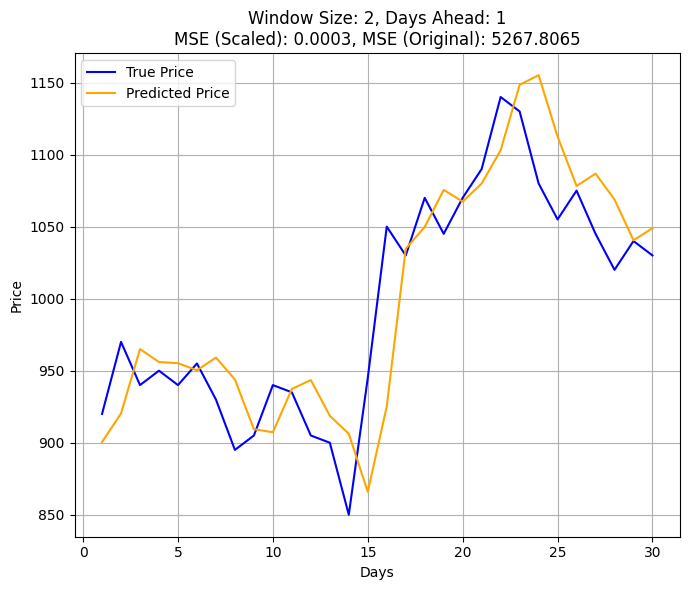

X shape: (3803, 3)
y shape: (3803, 2)
Initializing network with layer sizes: [3, 128, 64, 32, 2]
Parameters loaded from params_W_3_2.npz


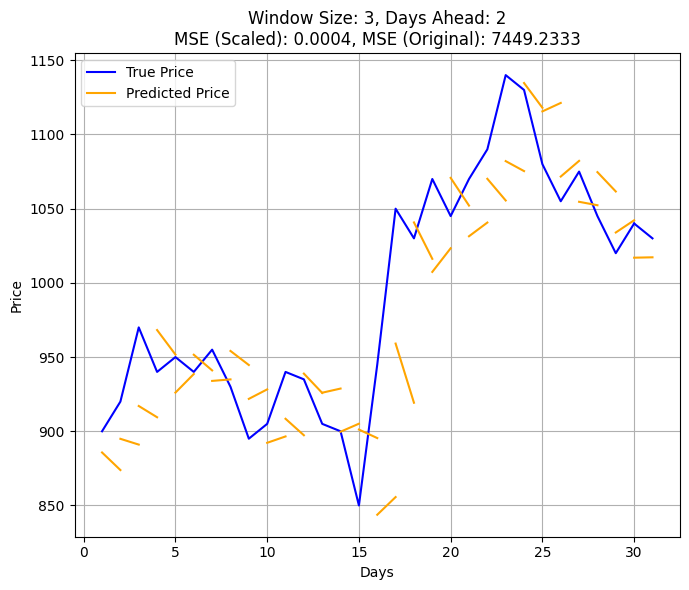

In [ ]:
#Best models
# Case 1: 2 window, 1 days (single day prediction)

y_test_orig, pred_orig, scaled_mse1, orig_mse1 = visualize_case(2, 1, scaler)
X = (np.arange(days_shown) + 1) * distanceBetweenDataPointsPredict

plt.figure(figsize=(7, 6))
plt.plot(X, y_test_orig[:days_shown], label='True Price', color='blue')
plt.plot(X, pred_orig[:days_shown], label='Predicted Price', color='orange')
plt.title(f"Window Size: {2}, Days Ahead: {1}\nMSE (Scaled): {scaled_mse1:.4f}, MSE (Original): {orig_mse1:.4f}")
plt.xlabel('Days')
plt.ylabel('Price')
plt.legend()
plt.grid()
plt.tight_layout()
plt.savefig('./res_main/bestcase1.png', dpi=300)
plt.show()

# Case 2: 3 window, 2 days (multiple days prediction)
y_test_orig, pred_orig, scaled_mse3, orig_mse3 = visualize_case(3, 2, scaler)
X_test = (np.arange(days_shown) + 1) * distanceBetweenDataPointsPredict
X_pred = np.arange(len(pred_orig[0,:])) + 1

plt.figure(figsize=(7, 6))
plt.plot(X_test,y_test_orig[:days_shown, 0], label='True Price', color='blue')
plt.plot(np.arange(len(y_test_orig[days_shown-1, :])) + days_shown, y_test_orig[days_shown-1, :], color='blue')


for day in range(days_shown):
    if day == 1:
        plt.plot(X_pred + day, pred_orig[day, :], label='Predicted Price', color='orange')
    else:   
        plt.plot(X_pred + day, pred_orig[day, :], color='orange')

plt.title(f"Window Size: {3}, Days Ahead: {2}\nMSE (Scaled): {scaled_mse3:.4f}, MSE (Original): {orig_mse3:.4f}")
plt.xlabel('Days')
plt.ylabel('Price')
plt.legend()
plt.grid()
plt.tight_layout()
plt.savefig('./res_main/bestcase2.png', dpi=300)
plt.show()